In [1]:
import requests
import re
import json
import pandas as pd
import numpy as np
import matplotlib.lines as mlines
from itertools import chain
from matplotlib import pyplot as plt



In [2]:
def get_all_metrics (payload):
    global count
    print(count)
    FAIR_checker_api = "https://fair-checker.france-bioinformatique.fr/api/check/metrics_all"
    try:
        response = requests.get(FAIR_checker_api, params=payload)
        print(payload)
        print(response.status_code)
        print("________________")
        count += 1
        return response.json(), response.status_code
    except:
        status = 504
        print(payload)
        print(status)
        print("________________")
        return None, status

In [3]:
def get_metrics_from_result(assessment_result):
    return [item.get('metric') for item in assessment_result]

def get_scores_from_result(assessment_result):
    return [int(item.get('score')) for item in assessment_result]

In [4]:
def get_principle_from_metric(metric):
    if metric.startswith('F'):
        return 'findable'
    elif metric.startswith('A'):
        return 'accessible'
    elif metric.startswith('I'):
        return 'interoperable'
    else:
        return 'reusable'

In [5]:
def build_assessment_json(assessment):
    regex_result = re.findall("'metric': '.*?', 'score': '.*?'", assessment)
    assessment_list = []
    for result in regex_result:
        result = result.replace("\'", "\"")
        assessment_dict = json.loads("{"+result+"}")
        assessment_list.append(assessment_dict)
    return assessment_list

In [6]:
def print_summary_stats(df):
    print("Mean: " + str(df["score"].mean()))
    print("Median: " + str(df["score"].median()))
    print("Max: " + str(df["score"].max()))
    print("Min: " + str(df["score"].min()))

Metric descriptions as stated on the FAIR-Checker website: https://fair-checker.france-bioinformatique.fr/check
- Findable
    - F1A: Unique IDs - FAIRChecker check that the resource identifier is an URL that can be reach, meaning it is unique, it is even better if the URL refer to a DOI. 
    - F1B: Persistent IDs - Weak : FAIR-Checker verifies that at least one namespace from identifiers.org is used in metadata. Strong : FAIR-Checker verifies that the “identifier” property from DCTerms or Schema.org vocabularies is present in metadata. 
    - F2A: Structured metadata - FAIR-Checker verifies that at least one RDF triple can be found in metadata. 
    - F2B: Shared vocabularies for metadata - Weak: FAIR-Checker verifies that at least one used ontology class or property are known in major ontology registries (OLS, BioPortal, LOV); Strong: FAIR-Checker verifies that all used ontology classes or properties are known in major ontology registries (OLS, BioPortal, LOV)
- Accessible
    - A1.1: Open resolution protocol - FAIR-Checker verifies that the resource is accessible via an open protocol, for instance the protocol needs to be HTTP. 
- Interoperable
    - I1: Machine readable format - FAIR-Checker verifies that at least one RDF triple can be found in metadata.
    - I2: Use shared ontologies - Weak: FAIR-Checker verifies that at least one used ontology class or property are known in major ontology registries (OLS, BioPortal, LOV); Strong: FAIR-Checker verifies that all used ontology classes or properties are known in major ontology registries (OLS, BioPortal, LOV)
    - I3: External links - FAIR-Checker verifies that at least 3 different URL authorities are used in the URIs of RDF metadata.
- Reusable
    - R1.1: Metadata includes license - FAIR-Checker verifies that at least one license property from Schema.org, DCTerms, or DOAP ontologies are found in metadata. 
    - R1.2: Metadata includes provenance - FAIR-Checker verifies that at least one provenance property from PROV, DCTerms, or PAV ontologies are found in metadata. 
    - R1.3: Community standards - Weak: FAIR-Checker verifies that at least one used ontology class or property are known in major ontology registries (OLS, BioPortal, LOV); Strong: FAIR-Checker verifies that all used ontology classes or properties are known in major ontology registries (OLS, BioPortal, LOV) 

# Papers

In [7]:
####################################

def extend_paper_df(df):
    ext_df = pd.DataFrame()
    
    ext_df["paper"] = list(chain.from_iterable([[x]*12 for x in df["paper"]]))
    ext_df["research_field"] = list(chain.from_iterable([x]*12 for x in df["research_field_label"]))
    ext_df["doi"] = list(chain.from_iterable([[x]*12 for x in df["doi"]]))
    ext_df["metric"] = list(chain.from_iterable([get_metrics_from_result(assessment_result=x) for x in df["FAIR_assessment"]]))
    ext_df["score"] = list(chain.from_iterable([get_scores_from_result(assessment_result=x) for x in df["FAIR_assessment"]]))

    return ext_df

## Papers via DOI

### Paper assessment via DOI

In [21]:
#############################################################################
input_file_path = r"C:\Users\MolnarM\Downloads\ogdmetadatendatagvat.csv"
output_file_path = r"C:\Users\MolnarM\Downloads\ogdmetadatendatagvat_cleaned.csv"

# Read the content of the file
with open(input_file_path, 'r') as file:
    content = file.read()

# Replace backslashes with forward slashes
modified_content = content.replace("\\", "/")

# Write the modified content back to a new file
with open(output_file_path, 'w') as file:
    file.write(modified_content)

print(f"Modified file saved as {output_file_path}")


Modified file saved as C:\Users\MolnarM\Downloads\ogdmetadatendatagvat_cleaned.csv


In [7]:
df = pd.read_csv(r"C:\Users\MolnarM\Desktop\Notebooks\Uni\ogdmetadatendatagvat_cleaned.csv", encoding= 'unicode_escape', sep=';', on_bad_lines='skip', header=5, skiprows=[6,7])
df.head(10)

C:\Users\local_MolnarM\Temp\ipykernel_50844\2790993249.py:1: DtypeWarning: Columns (15,19,26,28,30) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r"C:\Users\MolnarM\Desktop\Notebooks\Uni\ogdmetadatendatagvat_cleaned.csv", encoding= 'unicode_escape', sep=';', on_bad_lines='skip', header=5, skiprows=[6,7])


,local_id,metadata_identifier,metadata_modified,Title,description,categorization,tags,maintainer,license,begin_datetime,...,update_frequency,lineage_quality,en_title_and_desc,license_citation,metadata_original_portal,maintainer_email,publisher_link,publisher_email,license_url,terms_url
0,1.0,3E7BDC0B-6CBC-5A25-AF07-409E1EA40408,2023-07-03,Entwicklung nachhaltiger Schilferntetechniken ...,NaN,Umwelt,"Nationalparks Austria, Naturschutz, OpenDocume...",NP Neusiedler See - Seewinkel,Creative Commons Attribution License 3.0,2022-04-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://creativecommons.org/licenses/by/3.0/,NaN
1,2.0,d7e2c489-c233-4458-9d98-a2048a73a43e,2023-07-02,Voranschlag Kohfidisch 2023 (Gemeinde),Voranschlag der Gemeinde - Einnahmen und Ausgaben,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",10908 Kohfidisch,Creative Commons Attribution License 3.0,2023-01-01,...,jährlich,Gemeinde,Kohfidisch: Municipal Spending (closed account...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/3.0/,NaN
2,3.0,03986e54-6367-41aa-bcba-8c51036237dc,2023-07-02,Rechnungsabschluss Kohfidisch 2022 (Gemeinde),Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",10908 Kohfidisch,Creative Commons Attribution License 3.0,2022-01-01,...,jährlich,Gemeinde,Kohfidisch: Municipal Spending (closed account...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/3.0/,NaN
3,4.0,3e54878c-8657-4268-ad6e-064c3869169e,2023-07-02,Rechnungsabschluss Kohfidisch 2021 (Statistik ...,Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",10908 Kohfidisch,Creative Commons Attribution License 3.0,2021-01-01,...,jährlich,Statistik Austria,Kohfidisch: Municipal Spending (closed account...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/3.0/,NaN
4,5.0,0718837e-ffba-4833-b38f-a56b8ce0c012,2023-07-02,Rechnungsabschluss Kohfidisch 2020 (Statistik ...,Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",10908 Kohfidisch,Creative Commons Attribution License 3.0,2020-01-01,...,jährlich,Statistik Austria,Kohfidisch: Municipal Spending (closed account...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/3.0/,NaN
5,6.0,b895576b-0871-4c5a-a673-053d942211d6,2023-07-02,Rechnungsabschluss Sankt Andrä am Zicksee 2022...,Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",10719 Sankt Andrä am Zicksee,Creative Commons Attribution License 3.0,2022-01-01,...,jährlich,Gemeinde,Sankt Andrä am Zicksee: Municipal Spending (cl...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/3.0/,NaN
6,7.0,b4e02ec3-110b-4c48-94d6-1cfe0068874b,2023-07-02,Rechnungsabschluss Litzelsdorf 2022 (Gemeinde),Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",10909 Litzelsdorf,Creative Commons Attribution License 3.0,2022-01-01,...,jährlich,Gemeinde,Litzelsdorf: Municipal Spending (closed accoun...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/3.0/,NaN
7,8.0,1ce6db84-5e64-48bc-9cd1-185ea47798db,2023-07-02,Rechnungsabschluss Krems an der Donau 2022 (Ge...,Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",30101 Krems an der Donau,Creative Commons Attribution Lice

In [9]:
######################################
%%script false --no-raise-error
orkg_doi_df = pd.read_csv(r"C:\Users\MolnarM\Downloads\orkg_papers_2023-03-29.csv", encoding='ISO-8859-1', index_col=0)
orkg_doi_df

In [8]:
date = "2024-05-24"

In [10]:

# FAIR-Checker assessment for all ORKG papers with a valid doi
# Executing this approximately takes 1,505 minutes
# If you don't have the time, use the latest .csv file :)
count = 0
assessment_results = df['metadata_identifier'].map(lambda x: get_all_metrics(payload={'url': 'https://www.data.gv.at/katalog/dataset/' + x}))
df['FAIR_assessment'] = [aresult[0] for aresult in assessment_results]
df['assessment_status_code'] = [aresult[1] for aresult in assessment_results]
df.to_csv(r"C:\Users\MolnarM\Desktop\Notebooks\Uni\ogdmetadatendatagvat_assessed_"+date+".csv", encoding='utf-8')
df

0
{'url': 'https://www.data.gv.at/katalog/dataset/3E7BDC0B-6CBC-5A25-AF07-409E1EA40408'}
200
________________
1
{'url': 'https://www.data.gv.at/katalog/dataset/d7e2c489-c233-4458-9d98-a2048a73a43e'}
200
________________
2
{'url': 'https://www.data.gv.at/katalog/dataset/03986e54-6367-41aa-bcba-8c51036237dc'}
200
________________
3
{'url': 'https://www.data.gv.at/katalog/dataset/3e54878c-8657-4268-ad6e-064c3869169e'}
200
________________
4
{'url': 'https://www.data.gv.at/katalog/dataset/0718837e-ffba-4833-b38f-a56b8ce0c012'}
200
________________
5
{'url': 'https://www.data.gv.at/katalog/dataset/b895576b-0871-4c5a-a673-053d942211d6'}
200
________________
6
{'url': 'https://www.data.gv.at/katalog/dataset/b4e02ec3-110b-4c48-94d6-1cfe0068874b'}
200
________________
7
{'url': 'https://www.data.gv.at/katalog/dataset/1ce6db84-5e64-48bc-9cd1-185ea47798db'}
200
________________
8
{'url': 'https://www.data.gv.at/katalog/dataset/1fb58770-17d4-470a-923b-9be67a18b412'}
200
________________
9
{'url': 

{'url': 'https://www.data.gv.at/katalog/dataset/440a32b9-c1c6-4d27-8716-2bafa2064226'}
200
________________
75
{'url': 'https://www.data.gv.at/katalog/dataset/125b4a79-0a2d-4c4e-a1cf-991ae639778b'}
200
________________
76
{'url': 'https://www.data.gv.at/katalog/dataset/2f6fc55e-121c-49cb-b75a-a50abe916f9d'}
200
________________
77
{'url': 'https://www.data.gv.at/katalog/dataset/63e56f8f-ef36-4a03-b101-e7309975611f'}
200
________________
78
{'url': 'https://www.data.gv.at/katalog/dataset/26c23b9f-f998-4942-be49-a53a6a5e07d2'}
200
________________
79
{'url': 'https://www.data.gv.at/katalog/dataset/3366a5d6-78df-4f2c-a155-f72c54738c9c'}
200
________________
80
{'url': 'https://www.data.gv.at/katalog/dataset/4693a511-cc1d-4967-a916-8a391f6993f4'}
200
________________
81
{'url': 'https://www.data.gv.at/katalog/dataset/a1d4bd71-7ae6-4f40-8bd1-c1018a7a746b'}
200
________________
82
{'url': 'https://www.data.gv.at/katalog/dataset/ba9df283-9520-4b4c-9be2-f9e0a791c422'}
200
________________
83
{

{'url': 'https://www.data.gv.at/katalog/dataset/ea231da2-952c-4f69-8405-d7e57d77f037'}
200
________________
149
{'url': 'https://www.data.gv.at/katalog/dataset/cb593982-80dd-4895-8ea5-a257ae4785ad'}
200
________________
150
{'url': 'https://www.data.gv.at/katalog/dataset/97cf6d53-e8d3-4d16-9ce9-066888143f95'}
200
________________
151
{'url': 'https://www.data.gv.at/katalog/dataset/89c98ead-44ed-4ec2-97d7-04bb91ed6d79'}
200
________________
152
{'url': 'https://www.data.gv.at/katalog/dataset/7e64c11e-89ab-4cd9-9321-512304bb96b8'}
200
________________
153
{'url': 'https://www.data.gv.at/katalog/dataset/43f7fb76-9bfb-43b7-8a35-9c737897a965'}
200
________________
154
{'url': 'https://www.data.gv.at/katalog/dataset/459ebddf-51ed-48f9-b1de-7b7f9801c932'}
200
________________
155
{'url': 'https://www.data.gv.at/katalog/dataset/92f8f458-6686-41ae-9d3f-bade2baadbc9'}
200
________________
156
{'url': 'https://www.data.gv.at/katalog/dataset/8520783b-29fa-481f-8a52-e003df6a05cc'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/ec9c74d8-c78a-42e6-8b1b-1d05aea566fd'}
200
________________
223
{'url': 'https://www.data.gv.at/katalog/dataset/a73c83f4-8ff4-40eb-9481-b24d86e69b15'}
200
________________
224
{'url': 'https://www.data.gv.at/katalog/dataset/ccaa9930-8be9-49ae-bf6e-85abf263a45a'}
200
________________
225
{'url': 'https://www.data.gv.at/katalog/dataset/bd84acde-f166-4615-8957-42b265a983f1'}
200
________________
226
{'url': 'https://www.data.gv.at/katalog/dataset/8e7a2fd3-8a28-4197-922a-d60c5285b0f0'}
200
________________
227
{'url': 'https://www.data.gv.at/katalog/dataset/ac712ea8-bd14-4381-9ae0-11ab2155d07f'}
200
________________
228
{'url': 'https://www.data.gv.at/katalog/dataset/81cddad2-785a-4dd2-b844-8d90a6ea2a31'}
200
________________
229
{'url': 'https://www.data.gv.at/katalog/dataset/51970192-1078-47ce-b448-fda3879f4263'}
200
________________
230
{'url': 'https://www.data.gv.at/katalog/dataset/0a9b63eb-7c94-49cc-8e33-f6b58377783e'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/80e83b87-22bf-419f-aecd-28ee534266a6'}
200
________________
297
{'url': 'https://www.data.gv.at/katalog/dataset/22ab928b-cdf1-4262-81bb-e1f3e47ba4c0'}
200
________________
298
{'url': 'https://www.data.gv.at/katalog/dataset/a6b735e4-075b-4583-bcaa-96a85fb20c6f'}
200
________________
299
{'url': 'https://www.data.gv.at/katalog/dataset/f497af71-cc53-4e42-affa-726fd5aac77c'}
200
________________
300
{'url': 'https://www.data.gv.at/katalog/dataset/db78ee76-ee0c-44b1-9370-17e3c9cbd8c7'}
200
________________
301
{'url': 'https://www.data.gv.at/katalog/dataset/bb54256e-e5e9-4549-8673-4ff12869ed77'}
200
________________
302
{'url': 'https://www.data.gv.at/katalog/dataset/e60a1f1e-f35d-4647-8bea-bacc06084149'}
200
________________
303
{'url': 'https://www.data.gv.at/katalog/dataset/ac0587e5-4441-4faa-b450-9a4df22732ff'}
200
________________
304
{'url': 'https://www.data.gv.at/katalog/dataset/0a754eea-a352-41b3-9a56-9df770a2ce7b'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/d0c56d88-c351-4f83-af30-4e73698c8d68'}
200
________________
371
{'url': 'https://www.data.gv.at/katalog/dataset/e1ae384d-08e5-4b75-8787-1675de36362e'}
200
________________
372
{'url': 'https://www.data.gv.at/katalog/dataset/983e8771-71a1-425c-a5f5-066ebebc4961'}
200
________________
373
{'url': 'https://www.data.gv.at/katalog/dataset/d377be2b-49e1-4e44-8ed4-b7fde9b33e92'}
200
________________
374
{'url': 'https://www.data.gv.at/katalog/dataset/a896a343-8ce9-4b40-b189-dec3cbc1ac13'}
200
________________
375
{'url': 'https://www.data.gv.at/katalog/dataset/92c4ba71-7be9-4c5b-860a-5031ab6b6504'}
200
________________
376
{'url': 'https://www.data.gv.at/katalog/dataset/1c9b2b5e-b46d-4d2d-9832-f1cab53f1385'}
200
________________
377
{'url': 'https://www.data.gv.at/katalog/dataset/fca976ad-402a-4c8e-90d9-aa65f12afb04'}
200
________________
378
{'url': 'https://www.data.gv.at/katalog/dataset/1ed7a68b-08eb-4f69-991e-b4332652e2a2'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/fd4d6058-12db-4182-af2b-c62568311782'}
200
________________
445
{'url': 'https://www.data.gv.at/katalog/dataset/795d5431-4742-4e2a-ba8a-668d7ba0e8fb'}
200
________________
446
{'url': 'https://www.data.gv.at/katalog/dataset/4c45d69a-a90e-4ca6-92f4-9a6f09450879'}
200
________________
447
{'url': 'https://www.data.gv.at/katalog/dataset/aee97a5d-7cc2-475a-8dbe-452e06d8dd11'}
200
________________
448
{'url': 'https://www.data.gv.at/katalog/dataset/f02b71b0-9674-473e-b61e-b3ccc36c91cf'}
200
________________
449
{'url': 'https://www.data.gv.at/katalog/dataset/5847af36-7425-4569-a2c3-1e7a6803a442'}
200
________________
450
{'url': 'https://www.data.gv.at/katalog/dataset/4a2d827f-b1a1-4757-aab9-6cee11a053e0'}
200
________________
451
{'url': 'https://www.data.gv.at/katalog/dataset/9cb61bfb-88b9-4ed0-8fd0-b8ec6a54faca'}
200
________________
452
{'url': 'https://www.data.gv.at/katalog/dataset/a6b5fb0b-ccd8-3e89-bfec-ea8b57a87503'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/AE90DD7E-79C9-48AA-B685-732B357E9246'}
200
________________
519
{'url': 'https://www.data.gv.at/katalog/dataset/88a57dc4-a8d2-4eeb-b50c-30904989f230'}
200
________________
520
{'url': 'https://www.data.gv.at/katalog/dataset/35665242-3D29-4528-BA59-71EDF817358E'}
200
________________
521
{'url': 'https://www.data.gv.at/katalog/dataset/4a9fa51f-9001-4319-a293-e5c705d7ed07'}
200
________________
522
{'url': 'https://www.data.gv.at/katalog/dataset/673748b0-1c1b-4a06-9750-2b783591cf10'}
200
________________
523
{'url': 'https://www.data.gv.at/katalog/dataset/23336f82-c213-4867-bc71-5d213ef4d720'}
200
________________
524
{'url': 'https://www.data.gv.at/katalog/dataset/36cce47c-bdc3-40d7-9aa1-4dcd43b0f0ea'}
200
________________
525
{'url': 'https://www.data.gv.at/katalog/dataset/941cd994-a89e-45da-a208-5b9cc5e7e0e6'}
200
________________
526
{'url': 'https://www.data.gv.at/katalog/dataset/08abb0d7-6093-44c1-a61f-5c3231f1ae27'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/f73ce192-998c-3218-acc4-745402c2abb1'}
200
________________
593
{'url': 'https://www.data.gv.at/katalog/dataset/9016a823-ef08-314d-8ef5-aa12c1800f76'}
200
________________
594
{'url': 'https://www.data.gv.at/katalog/dataset/34cdc2e3-60af-3eb8-99ca-2b5fdafae01a'}
200
________________
595
{'url': 'https://www.data.gv.at/katalog/dataset/8c5b1a3d-9a0e-33dc-b500-a8f7a672e54e'}
200
________________
596
{'url': 'https://www.data.gv.at/katalog/dataset/66453c59-ae4b-37b6-80d4-25dfeeab1376'}
200
________________
597
{'url': 'https://www.data.gv.at/katalog/dataset/ac059484-2ee3-332b-88f7-7a55ae9d161a'}
200
________________
598
{'url': 'https://www.data.gv.at/katalog/dataset/35b511d9-7a8b-342a-85df-58a899d51009'}
200
________________
599
{'url': 'https://www.data.gv.at/katalog/dataset/8a0ebfbb-0af2-3739-9fbc-38079af87ede'}
200
________________
600
{'url': 'https://www.data.gv.at/katalog/dataset/2b389423-1b42-3bac-bab2-e9d839335269'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/4b750f7f-21e5-423e-8eea-1fbfd137bf3d'}
200
________________
667
{'url': 'https://www.data.gv.at/katalog/dataset/6663d432-5466-45b7-9383-427b7ec951ba'}
200
________________
668
{'url': 'https://www.data.gv.at/katalog/dataset/16bd245e-8f6c-4696-95f3-17be8fe340cb'}
200
________________
669
{'url': 'https://www.data.gv.at/katalog/dataset/8e486d03-042b-42e7-97e6-4d559e31cf14'}
200
________________
670
{'url': 'https://www.data.gv.at/katalog/dataset/655c19fb-7859-4a0a-b98a-c4fce3152f71'}
200
________________
671
{'url': 'https://www.data.gv.at/katalog/dataset/f838664d-53df-4501-bcf0-b27d285328a8'}
200
________________
672
{'url': 'https://www.data.gv.at/katalog/dataset/5d96f13f-19c1-4770-8d90-3884698578ac'}
200
________________
673
{'url': 'https://www.data.gv.at/katalog/dataset/19e0845b-edb0-43cf-996f-e1abe22653f1'}
200
________________
674
{'url': 'https://www.data.gv.at/katalog/dataset/e9b80a73-28ea-4692-858c-0077bf8fdeb8'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/8cc698df-a9c6-48e7-81f5-2c171f66494e'}
200
________________
741
{'url': 'https://www.data.gv.at/katalog/dataset/ef429ed2-aa3e-47f4-abb6-314a55ff6ec1'}
200
________________
742
{'url': 'https://www.data.gv.at/katalog/dataset/948e6b81-7c89-4acd-847a-c5253c6035ae'}
200
________________
743
{'url': 'https://www.data.gv.at/katalog/dataset/5a63e3b8-e1c4-43e8-984e-39c6abf33031'}
200
________________
744
{'url': 'https://www.data.gv.at/katalog/dataset/ce91752b-9234-46b6-b966-4bfb16af73ed'}
200
________________
745
{'url': 'https://www.data.gv.at/katalog/dataset/18dfe7fe-fe01-4115-831e-34cb28cc05f1'}
200
________________
746
{'url': 'https://www.data.gv.at/katalog/dataset/591ba52e-d393-4581-bedb-fe8254fe1ddc'}
200
________________
747
{'url': 'https://www.data.gv.at/katalog/dataset/5c1ef789-32ac-4857-904e-51a769d861c1'}
200
________________
748
{'url': 'https://www.data.gv.at/katalog/dataset/9318271d-4bec-433a-9e42-293a219f9d51'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/a8b045cb-fdee-41eb-b85c-c906d23e2693'}
200
________________
815
{'url': 'https://www.data.gv.at/katalog/dataset/aed3851b-d68b-4fb9-a17f-cd2fa121ab42'}
200
________________
816
{'url': 'https://www.data.gv.at/katalog/dataset/b77fdee5-6b67-4624-b4dc-800773d1c0cf'}
200
________________
817
{'url': 'https://www.data.gv.at/katalog/dataset/28293126-9c8a-4d99-aa5f-8caf7c02f1a8'}
200
________________
818
{'url': 'https://www.data.gv.at/katalog/dataset/fb3f3693-cbac-4433-9b35-4158d16aff4d'}
200
________________
819
{'url': 'https://www.data.gv.at/katalog/dataset/87240714-3057-4a2c-bf25-06daf0968777'}
200
________________
820
{'url': 'https://www.data.gv.at/katalog/dataset/53cd9ff8-2d67-486c-927d-0d3cb9a76449'}
200
________________
821
{'url': 'https://www.data.gv.at/katalog/dataset/0612fcc2-b4b8-42d5-a637-4704c900c217'}
200
________________
822
{'url': 'https://www.data.gv.at/katalog/dataset/1ad8cfe9-8a67-4b94-8f98-ecbbfcfd7efc'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/6da76cab-6e6e-49a4-a123-27ea43fc32cf'}
200
________________
889
{'url': 'https://www.data.gv.at/katalog/dataset/5488e9d6-a12d-413f-b811-87939610af7c'}
200
________________
890
{'url': 'https://www.data.gv.at/katalog/dataset/51ba3c07-dfe2-4881-a7f3-8880572b22f1'}
200
________________
891
{'url': 'https://www.data.gv.at/katalog/dataset/4e14f76e-d842-460e-aa81-68bb896b420c'}
200
________________
892
{'url': 'https://www.data.gv.at/katalog/dataset/7cb3fb29-6b14-477b-a88b-a6a526b59b40'}
200
________________
893
{'url': 'https://www.data.gv.at/katalog/dataset/b88e514c-90a1-4d7b-a03a-0a556508d32c'}
200
________________
894
{'url': 'https://www.data.gv.at/katalog/dataset/a37143ec-34a0-4e5e-bee2-27a181fc07d1'}
200
________________
895
{'url': 'https://www.data.gv.at/katalog/dataset/e9117efe-a216-4766-a658-794c8b377b8b'}
200
________________
896
{'url': 'https://www.data.gv.at/katalog/dataset/37c4a13b-0026-4876-9f96-d41d6c870b67'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/1ef67fd2-8b7e-4b80-bc1b-d0d2bd6fcfff'}
200
________________
963
{'url': 'https://www.data.gv.at/katalog/dataset/703a61f2-286f-4a8d-9ca2-6537fe6605a0'}
200
________________
964
{'url': 'https://www.data.gv.at/katalog/dataset/37afecea-66ab-44be-97d5-66a52a4db162'}
200
________________
965
{'url': 'https://www.data.gv.at/katalog/dataset/3970d013-8210-4fd7-8332-55046b7d21e2'}
200
________________
966
{'url': 'https://www.data.gv.at/katalog/dataset/0b396242-8989-4f43-8eff-b0e8a1d1199a'}
200
________________
967
{'url': 'https://www.data.gv.at/katalog/dataset/57f86e11-c694-4201-a39a-3ef39b976ebc'}
200
________________
968
{'url': 'https://www.data.gv.at/katalog/dataset/651980cd-f66c-4d6f-8612-585d068274ee'}
200
________________
969
{'url': 'https://www.data.gv.at/katalog/dataset/16abce7d-af65-45e5-bc13-0106c9a0f99b'}
200
________________
970
{'url': 'https://www.data.gv.at/katalog/dataset/d509ae53-9411-4154-b021-01545adb02ad'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/1fe08b87-70fe-4b8f-82eb-314a581c58e8'}
200
________________
1036
{'url': 'https://www.data.gv.at/katalog/dataset/26d30a55-06b2-4f52-924e-e4b1e65d303f'}
200
________________
1037
{'url': 'https://www.data.gv.at/katalog/dataset/f99ced93-cbcd-4458-98f4-578d2481259c'}
200
________________
1038
{'url': 'https://www.data.gv.at/katalog/dataset/bbbb3d26-1d52-4ccd-acf7-a4c1960aaaff'}
200
________________
1039
{'url': 'https://www.data.gv.at/katalog/dataset/3c7ea5dd-300e-4138-8180-ea0e16096151'}
200
________________
1040
{'url': 'https://www.data.gv.at/katalog/dataset/56e561d9-25f3-4601-bb49-0817679a6891'}
200
________________
1041
{'url': 'https://www.data.gv.at/katalog/dataset/8961fe16-9cfa-485a-b3f7-88d3aa9c9dc9'}
200
________________
1042
{'url': 'https://www.data.gv.at/katalog/dataset/bfde90ba-cdaf-49d6-a89a-c6e57a31ec99'}
200
________________
1043
{'url': 'https://www.data.gv.at/katalog/dataset/1b750209-8745-4794-93ce-1f7fc7587213'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/bf9467c0-ec71-41a4-b74c-31a8dadac55f'}
200
________________
1109
{'url': 'https://www.data.gv.at/katalog/dataset/28661e8c-8201-40a8-b952-bc2618b7aa04'}
200
________________
1110
{'url': 'https://www.data.gv.at/katalog/dataset/b0e909eb-6cc1-4320-bdd4-8eee3e1cf797'}
200
________________
1111
{'url': 'https://www.data.gv.at/katalog/dataset/186de7e2-7bf1-4339-aabd-e7e9d055c2b7'}
200
________________
1112
{'url': 'https://www.data.gv.at/katalog/dataset/f338cc02-0c69-4121-ac9b-1e3daec6fa78'}
200
________________
1113
{'url': 'https://www.data.gv.at/katalog/dataset/500d90dc-73c3-44eb-b4e2-f781dcf1bde9'}
200
________________
1114
{'url': 'https://www.data.gv.at/katalog/dataset/ce85ba01-34ce-4ad4-8ee3-ccd3157845a4'}
200
________________
1115
{'url': 'https://www.data.gv.at/katalog/dataset/ba2145d7-0873-49a4-b735-ddb409027f6a'}
200
________________
1116
{'url': 'https://www.data.gv.at/katalog/dataset/0845727b-599a-4d4b-bc52-40ee30e3101f'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0bc53285-bb20-4efe-bb37-d5ed38b2037c'}
200
________________
1182
{'url': 'https://www.data.gv.at/katalog/dataset/0bc4e397-e70d-4a31-a9b5-662545a59153'}
200
________________
1183
{'url': 'https://www.data.gv.at/katalog/dataset/0bc4de7d-6940-43ea-9b16-5feab50e5fe7'}
200
________________
1184
{'url': 'https://www.data.gv.at/katalog/dataset/0bc4b27b-2f68-408d-893c-9b1fd5fe452b'}
200
________________
1185
{'url': 'https://www.data.gv.at/katalog/dataset/0bc4aae4-326e-49ec-8027-b430a80c7fb0'}
200
________________
1186
{'url': 'https://www.data.gv.at/katalog/dataset/0bc4a794-0c93-4dc7-a80a-b1926e615121'}
200
________________
1187
{'url': 'https://www.data.gv.at/katalog/dataset/0bc4a048-6d57-4d48-b58d-69e0eea73f81'}
200
________________
1188
{'url': 'https://www.data.gv.at/katalog/dataset/0bc46fa3-e39d-480d-bec7-eb71c13328fe'}
200
________________
1189
{'url': 'https://www.data.gv.at/katalog/dataset/0bc3bcde-8140-48cf-b350-d70fbd49622d'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0badd35e-915f-418e-b11b-2be4f5495c3a'}
200
________________
1255
{'url': 'https://www.data.gv.at/katalog/dataset/0bad3370-7cf5-4f47-82e7-db7436109c0c'}
200
________________
1256
{'url': 'https://www.data.gv.at/katalog/dataset/0bace0d3-9d58-49c8-89ae-1cd43fbbc9fd'}
200
________________
1257
{'url': 'https://www.data.gv.at/katalog/dataset/0bacb80a-14df-4a04-9d9a-1f5ddede2d8a'}
200
________________
1258
{'url': 'https://www.data.gv.at/katalog/dataset/0bac6218-fd0c-435d-8170-af695dd37a0a'}
200
________________
1259
{'url': 'https://www.data.gv.at/katalog/dataset/0babf802-49cb-4582-ac75-cca59005e78c'}
200
________________
1260
{'url': 'https://www.data.gv.at/katalog/dataset/0bab9d39-c253-4674-b27f-bd56bb78d285'}
200
________________
1261
{'url': 'https://www.data.gv.at/katalog/dataset/0baa9008-fcf5-4644-917f-5e42b4bfce40'}
200
________________
1262
{'url': 'https://www.data.gv.at/katalog/dataset/0baa085c-1e5d-49ec-8b78-11dd34c68dd5'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/bd8b518b-d812-46f9-b367-4c1b660cfc99'}
200
________________
1328
{'url': 'https://www.data.gv.at/katalog/dataset/22add642-d849-48ff-9913-8c7ba2d99b46'}
200
________________
1329
{'url': 'https://www.data.gv.at/katalog/dataset/88bf0348-80c8-4b62-a3d1-45a0cedb802d'}
200
________________
1330
{'url': 'https://www.data.gv.at/katalog/dataset/6352bebd-d537-41cf-b934-c81964929425'}
200
________________
1331
{'url': 'https://www.data.gv.at/katalog/dataset/e73c685b-c911-41f0-9bbb-f9c341b63cdb'}
200
________________
1332
{'url': 'https://www.data.gv.at/katalog/dataset/25235359-7032-4b65-8c85-87407cdbc127'}
200
________________
1333
{'url': 'https://www.data.gv.at/katalog/dataset/884f932a-4db8-4252-815a-6d3dbcb5022f'}
200
________________
1334
{'url': 'https://www.data.gv.at/katalog/dataset/9886476f-9c2f-46c8-bf37-06870d1e7338'}
200
________________
1335
{'url': 'https://www.data.gv.at/katalog/dataset/4f8533b6-31f2-4486-b1d1-433bd19fc8fe'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/95481d09-22c8-4ef4-b302-7d7286ed2305'}
200
________________
1401
{'url': 'https://www.data.gv.at/katalog/dataset/367bdebb-3b77-4a59-ab39-567f4ba30bfd'}
200
________________
1402
{'url': 'https://www.data.gv.at/katalog/dataset/f36d11fc-2a97-43c7-a649-cbe77beced38'}
200
________________
1403
{'url': 'https://www.data.gv.at/katalog/dataset/f4723526-07ac-4d13-adfe-40f1aefc8bbc'}
200
________________
1404
{'url': 'https://www.data.gv.at/katalog/dataset/792a73bd-454a-40a4-ad06-d7aa47b8dc10'}
200
________________
1405
{'url': 'https://www.data.gv.at/katalog/dataset/c4fbcf2f-92a7-433c-8e03-21f6c25278ec'}
200
________________
1406
{'url': 'https://www.data.gv.at/katalog/dataset/d7e659ef-fc14-4dc6-bf1f-430f8d2593f2'}
200
________________
1407
{'url': 'https://www.data.gv.at/katalog/dataset/f9c799d7-f602-440a-a793-057fa1fab306'}
200
________________
1408
{'url': 'https://www.data.gv.at/katalog/dataset/4912998c-c3fe-4554-8a36-3068db7eacb9'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/474454ca-70a7-4cf6-a558-d8d52e131b34'}
200
________________
1474
{'url': 'https://www.data.gv.at/katalog/dataset/58668449-2bc1-4cf4-a971-bc72c986e55d'}
200
________________
1475
{'url': 'https://www.data.gv.at/katalog/dataset/e2b51cf2-4248-42f4-b120-eb0146b4afb8'}
200
________________
1476
{'url': 'https://www.data.gv.at/katalog/dataset/551482eb-ea45-47c0-9835-5b03f5616483'}
200
________________
1477
{'url': 'https://www.data.gv.at/katalog/dataset/8c1829d0-03fe-44a4-998b-e97c67f03f67'}
200
________________
1478
{'url': 'https://www.data.gv.at/katalog/dataset/1238ada9-1d18-42fd-828e-71ca40c7b0e9'}
200
________________
1479
{'url': 'https://www.data.gv.at/katalog/dataset/95ab342c-4a73-4d5b-885c-fbd1012e0a6d'}
200
________________
1480
{'url': 'https://www.data.gv.at/katalog/dataset/c82632f7-c700-4cab-ab7c-639297fdda17'}
200
________________
1481
{'url': 'https://www.data.gv.at/katalog/dataset/595ea5ff-5e9e-44bc-be90-ed276e905f03'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/bb34afc3-d177-4b5c-af8a-b398cd4183ae'}
200
________________
1547
{'url': 'https://www.data.gv.at/katalog/dataset/b97e713b-16b3-4d95-96f5-f80c6b2aa257'}
200
________________
1548
{'url': 'https://www.data.gv.at/katalog/dataset/b80ecd53-cfe8-4c9f-9c47-ee567ce94f45'}
200
________________
1549
{'url': 'https://www.data.gv.at/katalog/dataset/b7a13145-fee4-4880-adba-a3d8e3412ac5'}
200
________________
1550
{'url': 'https://www.data.gv.at/katalog/dataset/b666b66c-d3f6-4013-9b8b-977d4baca2db'}
200
________________
1551
{'url': 'https://www.data.gv.at/katalog/dataset/b535d09f-c31f-46f0-83af-823cb53e272b'}
200
________________
1552
{'url': 'https://www.data.gv.at/katalog/dataset/b14dc1a9-b3b7-43a9-a4a6-47fc91e2a538'}
200
________________
1553
{'url': 'https://www.data.gv.at/katalog/dataset/ae5977b4-70ed-44c8-a0db-c6074b212d6e'}
200
________________
1554
{'url': 'https://www.data.gv.at/katalog/dataset/acd2f518-a253-44fe-a2e9-3f6a1bd2373c'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/d79be9e4-ccf2-416b-b2f8-ad7b07573ab5'}
200
________________
1620
{'url': 'https://www.data.gv.at/katalog/dataset/7ef98467-021c-4829-845e-1364a3558c11'}
200
________________
1621
{'url': 'https://www.data.gv.at/katalog/dataset/b757a50d-6139-429c-8838-74183c4c984d'}
200
________________
1622
{'url': 'https://www.data.gv.at/katalog/dataset/a950ceda-9fb8-4484-9623-f31781fe9867'}
200
________________
1623
{'url': 'https://www.data.gv.at/katalog/dataset/2744be1c-43f8-4146-8ddb-c3f2411797e8'}
200
________________
1624
{'url': 'https://www.data.gv.at/katalog/dataset/6850c388-a1f6-40d5-a588-8bfbca89335b'}
200
________________
1625
{'url': 'https://www.data.gv.at/katalog/dataset/140526ad-e7d7-4d1a-9ce3-8c59d4da5b15'}
200
________________
1626
{'url': 'https://www.data.gv.at/katalog/dataset/16c6f026-a111-4420-891c-3d40c18624f2'}
200
________________
1627
{'url': 'https://www.data.gv.at/katalog/dataset/59e8584f-2ab4-44f0-a693-7b3363bb05d2'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0ba633dc-b1e7-42d9-96d4-2efe8f014324'}
200
________________
1693
{'url': 'https://www.data.gv.at/katalog/dataset/0ba60e2c-b82b-4c29-889f-e43b05cad266'}
200
________________
1694
{'url': 'https://www.data.gv.at/katalog/dataset/0ba5e0d2-79ca-4f99-b169-3ab1193e08aa'}
200
________________
1695
{'url': 'https://www.data.gv.at/katalog/dataset/0ba5a860-38a0-4cd5-9696-8f6cba354ccd'}
200
________________
1696
{'url': 'https://www.data.gv.at/katalog/dataset/0ba568cd-6934-47e5-892d-9adec0788db4'}
200
________________
1697
{'url': 'https://www.data.gv.at/katalog/dataset/0ba4b151-5bcc-499b-a130-8f9e13965d89'}
200
________________
1698
{'url': 'https://www.data.gv.at/katalog/dataset/0ba48f6b-1a45-4bcf-a401-212cfb5267cf'}
200
________________
1699
{'url': 'https://www.data.gv.at/katalog/dataset/0ba4764b-b6f1-4531-b457-53c74bb87f69'}
200
________________
1700
{'url': 'https://www.data.gv.at/katalog/dataset/0ba3fbfd-dd74-4392-be61-c827b48e55c7'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/4b44d742-ef89-46e8-8e6a-e6f119da36f2'}
200
________________
1766
{'url': 'https://www.data.gv.at/katalog/dataset/d64d0a09-a5e8-4bdc-801f-87bc81af6efd'}
200
________________
1767
{'url': 'https://www.data.gv.at/katalog/dataset/f5af8772-4af6-4669-b4f9-9fdd04d14661'}
200
________________
1768
{'url': 'https://www.data.gv.at/katalog/dataset/12ad2604-a56b-4e79-b782-d681419dbec5'}
200
________________
1769
{'url': 'https://www.data.gv.at/katalog/dataset/34887ca4-ba76-45ac-8346-c59a11908fe2'}
200
________________
1770
{'url': 'https://www.data.gv.at/katalog/dataset/e071666f-ce01-43fc-82cf-b005f51e685b'}
200
________________
1771
{'url': 'https://www.data.gv.at/katalog/dataset/9fe8efd8-98aa-4fff-b2c8-8fb2b6ca92f0'}
200
________________
1772
{'url': 'https://www.data.gv.at/katalog/dataset/a94ada10-8bdb-4eac-bbdb-3a2d36a5ff1d'}
200
________________
1773
{'url': 'https://www.data.gv.at/katalog/dataset/11937d66-51e4-49a7-8405-1aba37953ede'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/c2442a29-a020-4967-953c-436798abbb70'}
200
________________
1839
{'url': 'https://www.data.gv.at/katalog/dataset/c1a446d8-967f-4136-b9a6-e87b59d19b78'}
200
________________
1840
{'url': 'https://www.data.gv.at/katalog/dataset/c08abc1b-3c94-45cb-8282-77aa7fd0d952'}
200
________________
1841
{'url': 'https://www.data.gv.at/katalog/dataset/ba0d273f-062c-41ee-bac9-25fe06d8d2c4'}
200
________________
1842
{'url': 'https://www.data.gv.at/katalog/dataset/b773331c-b848-415d-8912-497a97f3d21b'}
200
________________
1843
{'url': 'https://www.data.gv.at/katalog/dataset/b3bae53d-0eb1-4883-b4a1-4f8063b3757a'}
200
________________
1844
{'url': 'https://www.data.gv.at/katalog/dataset/b300322d-42fd-4ea7-aeba-de4f8a69d584'}
200
________________
1845
{'url': 'https://www.data.gv.at/katalog/dataset/b1d429fe-e32f-407e-b484-b8b4a5d385b3'}
200
________________
1846
{'url': 'https://www.data.gv.at/katalog/dataset/b028ad5e-45a4-4efc-8de2-c2b3c280397e'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/3691a7a2-1a4a-48b8-8e21-c596518e7829'}
200
________________
1912
{'url': 'https://www.data.gv.at/katalog/dataset/3670a140-e447-4452-9e88-e5115a978181'}
200
________________
1913
{'url': 'https://www.data.gv.at/katalog/dataset/3404ff6c-0067-4c43-8d43-9dcb20d9a0f9'}
200
________________
1914
{'url': 'https://www.data.gv.at/katalog/dataset/33cca852-ed34-4a29-855a-32494c5b54bd'}
200
________________
1915
{'url': 'https://www.data.gv.at/katalog/dataset/32eccdea-ce1f-4444-92e0-540e2ef32a84'}
200
________________
1916
{'url': 'https://www.data.gv.at/katalog/dataset/2cba5f90-29d4-4f52-9465-aa8c90cf779f'}
200
________________
1917
{'url': 'https://www.data.gv.at/katalog/dataset/2b5c533b-9cfa-4529-bdd8-219aea9cc43e'}
200
________________
1918
{'url': 'https://www.data.gv.at/katalog/dataset/266b885b-204d-4152-bc8f-fde5e44bbd4e'}
200
________________
1919
{'url': 'https://www.data.gv.at/katalog/dataset/2619bb06-6ec5-4d08-8693-f714183779bb'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/f5ac8e92-2c41-4a12-915a-23a508581152'}
200
________________
1985
{'url': 'https://www.data.gv.at/katalog/dataset/24485d90-6307-45d2-9ab9-19d839c9d59b'}
200
________________
1986
{'url': 'https://www.data.gv.at/katalog/dataset/fd812072-590d-477c-822b-f7e1a7d7ea1b'}
200
________________
1987
{'url': 'https://www.data.gv.at/katalog/dataset/3794a1ad-1921-4e56-8dcc-6025902cd411'}
200
________________
1988
{'url': 'https://www.data.gv.at/katalog/dataset/97e93146-cf94-4f09-b755-706edf5ddf20'}
200
________________
1989
{'url': 'https://www.data.gv.at/katalog/dataset/6c44a6f8-a9d7-4a4a-b37f-351da00108e6'}
200
________________
1990
{'url': 'https://www.data.gv.at/katalog/dataset/34ecdca7-fd2d-4e27-91ad-2ffb1d251862'}
200
________________
1991
{'url': 'https://www.data.gv.at/katalog/dataset/8679d1d8-5632-4c67-9c63-75bc264a2b68'}
200
________________
1992
{'url': 'https://www.data.gv.at/katalog/dataset/7ab97dcc-ec0c-4745-a21f-9311abc4055a'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0b98a03a-073f-4006-8621-cba2d9c3057d'}
200
________________
2058
{'url': 'https://www.data.gv.at/katalog/dataset/0b985bce-48a4-4944-a0d2-407c5b25a483'}
200
________________
2059
{'url': 'https://www.data.gv.at/katalog/dataset/0b9796b0-c357-4d8e-8af7-6ae3d0f47fe4'}
200
________________
2060
{'url': 'https://www.data.gv.at/katalog/dataset/0b970f61-e2b5-4ba0-9d31-a52a8b4678a3'}
200
________________
2061
{'url': 'https://www.data.gv.at/katalog/dataset/0b9688a4-460a-469f-a139-69a0b4704650'}
200
________________
2062
{'url': 'https://www.data.gv.at/katalog/dataset/0b95db26-b457-4243-937f-d51c9f719a0d'}
200
________________
2063
{'url': 'https://www.data.gv.at/katalog/dataset/0b95591d-4c32-41f8-b771-11a89d6acfc2'}
200
________________
2064
{'url': 'https://www.data.gv.at/katalog/dataset/0b94cf59-2cc2-4fb9-b98c-be749f1b111a'}
200
________________
2065
{'url': 'https://www.data.gv.at/katalog/dataset/0b944956-76f2-4410-b7f4-464ee927f502'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/62402c9a-6fe7-46db-bf60-dfcaef5a40b2'}
200
________________
2131
{'url': 'https://www.data.gv.at/katalog/dataset/f9c2b013-7e97-4596-bcca-a927bfd2b932'}
200
________________
2132
{'url': 'https://www.data.gv.at/katalog/dataset/8436f9d8-d9d6-422b-a306-9de34c35f94e'}
200
________________
2133
{'url': 'https://www.data.gv.at/katalog/dataset/d4eafe76-2f73-4dc9-864a-78c1de67ebd0'}
200
________________
2134
{'url': 'https://www.data.gv.at/katalog/dataset/88455791-6b3e-444a-bb6b-778661c98e8a'}
200
________________
2135
{'url': 'https://www.data.gv.at/katalog/dataset/2b531176-c03c-496a-9443-83315e1cbcbf'}
200
________________
2136
{'url': 'https://www.data.gv.at/katalog/dataset/e2801e27-f047-4d33-b368-baaa535c2f9a'}
200
________________
2137
{'url': 'https://www.data.gv.at/katalog/dataset/23D8635A-7661-5231-E4CB-261D6EA8DEC3'}
200
________________
2138
{'url': 'https://www.data.gv.at/katalog/dataset/048cf5c2-2a65-4c0d-820e-80d7c314ce37'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/c8c92c0b-6480-44c9-b7f6-bb9f1f052c1a'}
200
________________
2204
{'url': 'https://www.data.gv.at/katalog/dataset/59976b8f-7848-472f-bc25-b1f258f371e5'}
200
________________
2205
{'url': 'https://www.data.gv.at/katalog/dataset/3daf7ed2-cae0-4655-9b9f-1b844f3481cd'}
200
________________
2206
{'url': 'https://www.data.gv.at/katalog/dataset/ece15d5a-c0d5-416a-9e0a-b4d4a9ebd3b8'}
200
________________
2207
{'url': 'https://www.data.gv.at/katalog/dataset/3115b80a-4829-478f-b39b-06077d7e3b3b'}
200
________________
2208
{'url': 'https://www.data.gv.at/katalog/dataset/e82099dc-de72-4022-94c1-25f63d0f1792'}
200
________________
2209
{'url': 'https://www.data.gv.at/katalog/dataset/079cc463-17f2-4863-a773-8c8798f3e3fd'}
200
________________
2210
{'url': 'https://www.data.gv.at/katalog/dataset/f3199c4d-6fd4-4dbd-91e6-5cb105e2d7a8'}
200
________________
2211
{'url': 'https://www.data.gv.at/katalog/dataset/1551a160-61e2-4d93-a106-dcd62ebb7980'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/cc04c957-8246-45f8-b2b3-c88c7a4e70af'}
200
________________
2277
{'url': 'https://www.data.gv.at/katalog/dataset/a00ac29f-7ff7-4f24-92d5-5485cba0e648'}
200
________________
2278
{'url': 'https://www.data.gv.at/katalog/dataset/94494591-b9da-4c82-9dff-ebf42e9cef02'}
200
________________
2279
{'url': 'https://www.data.gv.at/katalog/dataset/6b916a46-8192-42ce-9a22-314263c65d41'}
200
________________
2280
{'url': 'https://www.data.gv.at/katalog/dataset/280545de-bc4f-40fc-b015-0105588185fe'}
200
________________
2281
{'url': 'https://www.data.gv.at/katalog/dataset/3583a44e-e12d-48a7-94f1-4b3f4e88815a'}
200
________________
2282
{'url': 'https://www.data.gv.at/katalog/dataset/2fed35bd-2f98-41a1-b4d8-2642b7d02ed1'}
200
________________
2283
{'url': 'https://www.data.gv.at/katalog/dataset/f763ebf9-8eb1-40ca-a1cc-49eef3b0afe6'}
200
________________
2284
{'url': 'https://www.data.gv.at/katalog/dataset/8e8c0def-688e-4d82-8077-aa17b2703936'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/9c58e1ca-bf72-43b5-94ba-a781b856896a'}
200
________________
2350
{'url': 'https://www.data.gv.at/katalog/dataset/b10194ba-105c-49bf-9b1c-c1f9d2186794'}
200
________________
2351
{'url': 'https://www.data.gv.at/katalog/dataset/921536b0-dab5-4fc1-8d5b-de964542a3fc'}
200
________________
2352
{'url': 'https://www.data.gv.at/katalog/dataset/3265a26c-1726-431b-9c30-d06b96067f16'}
200
________________
2353
{'url': 'https://www.data.gv.at/katalog/dataset/9e5faca6-cb7e-475c-8c6b-9a37f2c72f11'}
200
________________
2354
{'url': 'https://www.data.gv.at/katalog/dataset/761db1da-68fa-4344-86c3-0a93477e0480'}
200
________________
2355
{'url': 'https://www.data.gv.at/katalog/dataset/5b4b733a-6be5-4a7c-b571-6409afafda5c'}
200
________________
2356
{'url': 'https://www.data.gv.at/katalog/dataset/0512e786-6376-4b1c-9c10-6f7737a25a3b'}
200
________________
2357
{'url': 'https://www.data.gv.at/katalog/dataset/51e3c90f-19f4-4499-9c6e-882de7890ec3'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0b890683-b4f0-4ff7-af04-ccc160437907'}
200
________________
2423
{'url': 'https://www.data.gv.at/katalog/dataset/0b88900d-96ad-4746-87ba-653a1099da95'}
200
________________
2424
{'url': 'https://www.data.gv.at/katalog/dataset/0b884f80-e35a-4b80-9568-de9611aae6f1'}
200
________________
2425
{'url': 'https://www.data.gv.at/katalog/dataset/0b884c14-345c-4d28-8237-733103f20f42'}
200
________________
2426
{'url': 'https://www.data.gv.at/katalog/dataset/0b874cfe-b5a7-4c06-8042-9078d1f272db'}
200
________________
2427
{'url': 'https://www.data.gv.at/katalog/dataset/0b87283f-d91b-4c1e-8a88-98f0a9c5dea6'}
200
________________
2428
{'url': 'https://www.data.gv.at/katalog/dataset/0b871d57-5a4c-4c26-a55a-4105c26a68ae'}
200
________________
2429
{'url': 'https://www.data.gv.at/katalog/dataset/0b870c5e-d7f5-4eb1-a96e-33e4c70965d9'}
200
________________
2430
{'url': 'https://www.data.gv.at/katalog/dataset/0b86cb34-8791-4575-8755-16894182726c'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/beed97ae-028a-47bf-88f2-2198228ba7e8'}
200
________________
2496
{'url': 'https://www.data.gv.at/katalog/dataset/a821fb81-5504-42ed-853c-49aec4a98f75'}
200
________________
2497
{'url': 'https://www.data.gv.at/katalog/dataset/1ec15ed3-d0df-4666-91ad-61f31f49db88'}
200
________________
2498
{'url': 'https://www.data.gv.at/katalog/dataset/0efaa0bc-bf74-43de-9165-99317b6268c2'}
200
________________
2499
{'url': 'https://www.data.gv.at/katalog/dataset/3818619e-3786-4186-b04d-877ecc190101'}
200
________________
2500
{'url': 'https://www.data.gv.at/katalog/dataset/b9bab9cc-1a97-4a69-ab04-df0ff89dbd28'}
200
________________
2501
{'url': 'https://www.data.gv.at/katalog/dataset/a4fe8e81-fff0-40b5-afb3-1d0ea2a86ca9'}
200
________________
2502
{'url': 'https://www.data.gv.at/katalog/dataset/f3ee7dd3-a943-4823-938f-747f793d037e'}
200
________________
2503
{'url': 'https://www.data.gv.at/katalog/dataset/e445dccb-a7f5-44a9-af53-96bff8282905'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/420231b1-0a96-4072-bad2-588152f0cf13'}
200
________________
2569
{'url': 'https://www.data.gv.at/katalog/dataset/847780ac-c70e-4c3a-9608-3ef7ff7402f0'}
200
________________
2570
{'url': 'https://www.data.gv.at/katalog/dataset/d6fe849c-2bee-47fa-b7db-7e2e9e3a65f4'}
200
________________
2571
{'url': 'https://www.data.gv.at/katalog/dataset/496e9e46-a12e-48dd-87d4-53010292a18c'}
200
________________
2572
{'url': 'https://www.data.gv.at/katalog/dataset/becea62f-78fd-4d3d-a6d4-3e859cebfaee'}
200
________________
2573
{'url': 'https://www.data.gv.at/katalog/dataset/596aadd6-2c12-4fee-ade4-e0b03012a393'}
200
________________
2574
{'url': 'https://www.data.gv.at/katalog/dataset/44d1cf6e-2d8f-416d-a372-86d590d7536f'}
200
________________
2575
{'url': 'https://www.data.gv.at/katalog/dataset/0b814bc8-b35b-4d51-a64c-c86b35035558'}
200
________________
2576
{'url': 'https://www.data.gv.at/katalog/dataset/0b80c85f-7edc-416b-b3e5-9bbcf9c44b34'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/f396a8ff-0887-40bd-852f-3c0ce12ea3b8'}
200
________________
2642
{'url': 'https://www.data.gv.at/katalog/dataset/c065b9fe-92cc-4e91-abe5-d93d5c9d8e11'}
200
________________
2643
{'url': 'https://www.data.gv.at/katalog/dataset/9d833ef4-3c9a-48f9-b445-820bcde8319f'}
200
________________
2644
{'url': 'https://www.data.gv.at/katalog/dataset/edd1e7ae-9727-4cdc-922d-06d5cbe55fbf'}
200
________________
2645
{'url': 'https://www.data.gv.at/katalog/dataset/9a92d265-bc13-4342-b184-1a243b5b77d7'}
200
________________
2646
{'url': 'https://www.data.gv.at/katalog/dataset/1d32b5d3-5678-4f0b-b19a-302c33a9eb60'}
200
________________
2647
{'url': 'https://www.data.gv.at/katalog/dataset/23c6867e-038a-4c29-9d76-e0701eadb4a9'}
200
________________
2648
{'url': 'https://www.data.gv.at/katalog/dataset/daa77042-daf1-4609-ad0c-6ca1ac531c35'}
200
________________
2649
{'url': 'https://www.data.gv.at/katalog/dataset/6d8f3f00-8b35-4322-a8ba-6ba8e9a2fe4f'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/f325a820-9bd4-444a-8046-8bee05684b8e'}
200
________________
2715
{'url': 'https://www.data.gv.at/katalog/dataset/147c830d-69b4-4649-b79a-435fb972c604'}
200
________________
2716
{'url': 'https://www.data.gv.at/katalog/dataset/2f503552-39d7-43bc-9451-12b5b801f5bd'}
200
________________
2717
{'url': 'https://www.data.gv.at/katalog/dataset/1c851506-61ba-48d3-bd93-1b2a188c5a6a'}
200
________________
2718
{'url': 'https://www.data.gv.at/katalog/dataset/8e620f27-83df-412e-9125-2a9e52a6361d'}
200
________________
2719
{'url': 'https://www.data.gv.at/katalog/dataset/f5f6d957-4b84-465d-a1d6-d64b69bcbe8a'}
200
________________
2720
{'url': 'https://www.data.gv.at/katalog/dataset/86886a5e-d8f2-4660-bf69-05353c40a1ce'}
200
________________
2721
{'url': 'https://www.data.gv.at/katalog/dataset/ecceecea-2251-4981-a285-da479741540e'}
200
________________
2722
{'url': 'https://www.data.gv.at/katalog/dataset/c196390a-855b-417a-abe0-c7007e8b18d0'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0b72b512-83c8-4fa9-86ed-3aa5db767e5d'}
200
________________
2788
{'url': 'https://www.data.gv.at/katalog/dataset/0b729b66-f2fe-4ec8-a7c1-c086706756d6'}
200
________________
2789
{'url': 'https://www.data.gv.at/katalog/dataset/0b71c416-0b98-4c43-881f-b7cf3f74b915'}
200
________________
2790
{'url': 'https://www.data.gv.at/katalog/dataset/0b718a70-ed12-49eb-8c98-46ad991cc508'}
200
________________
2791
{'url': 'https://www.data.gv.at/katalog/dataset/0b715c61-4bd3-4e21-bb97-f9f6263fe094'}
200
________________
2792
{'url': 'https://www.data.gv.at/katalog/dataset/0b71409b-ce26-4d55-930f-0a735ecfc200'}
200
________________
2793
{'url': 'https://www.data.gv.at/katalog/dataset/0b7060de-c130-4666-be8c-37316b9c2e8f'}
200
________________
2794
{'url': 'https://www.data.gv.at/katalog/dataset/0b7057cd-d136-45bc-90ff-5cc27f49db5d'}
200
________________
2795
{'url': 'https://www.data.gv.at/katalog/dataset/0b70334e-45cd-4a09-9ded-a78a8a58d9c3'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/cd038bbe-155e-44f6-b431-5bc56706b730'}
200
________________
2861
{'url': 'https://www.data.gv.at/katalog/dataset/e247fbdf-fb57-47f7-a87d-99e2bfadd41b'}
200
________________
2862
{'url': 'https://www.data.gv.at/katalog/dataset/40382f6d-c965-4c1c-8e8f-ff722a3d2b74'}
200
________________
2863
{'url': 'https://www.data.gv.at/katalog/dataset/2562058c-f119-4c63-a4c8-9c549a645656'}
200
________________
2864
{'url': 'https://www.data.gv.at/katalog/dataset/edbb7b55-869b-4f70-9f2d-65ae7d751bf8'}
200
________________
2865
{'url': 'https://www.data.gv.at/katalog/dataset/e3fb6394-e8b6-468e-81f2-05c7b37e8c85'}
200
________________
2866
{'url': 'https://www.data.gv.at/katalog/dataset/b2d0cbb3-df9d-4ca3-9eef-0ac38fd51d7b'}
200
________________
2867
{'url': 'https://www.data.gv.at/katalog/dataset/50e92493-ee3a-407b-b791-ceb9bdfdd891'}
200
________________
2868
{'url': 'https://www.data.gv.at/katalog/dataset/94bd7781-e330-47ac-93e5-aee788aba222'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/c6bbfc6f-6700-40eb-9537-ab182075c8f8'}
200
________________
2934
{'url': 'https://www.data.gv.at/katalog/dataset/46825ece-d165-4b64-bea7-8964b8afdfe3'}
200
________________
2935
{'url': 'https://www.data.gv.at/katalog/dataset/d780bf4f-063e-4c21-bb28-62c8d1d79cdc'}
200
________________
2936
{'url': 'https://www.data.gv.at/katalog/dataset/2a493c54-dec5-4295-aa70-46f39aa96b29'}
200
________________
2937
{'url': 'https://www.data.gv.at/katalog/dataset/6c066e35-21a8-404e-bdb3-8d5aac0e2b16'}
200
________________
2938
{'url': 'https://www.data.gv.at/katalog/dataset/f49d7419-8ef6-422f-948a-e89eeeb26954'}
200
________________
2939
{'url': 'https://www.data.gv.at/katalog/dataset/c4ce0ebd-7125-46da-a997-78af4301cbd1'}
200
________________
2940
{'url': 'https://www.data.gv.at/katalog/dataset/9e7c8587-48ec-4700-9617-4b64c8975e11'}
200
________________
2941
{'url': 'https://www.data.gv.at/katalog/dataset/1722b67a-cf5b-4172-80a9-e6545e625a98'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/b4b09dbc-2ac9-4b88-a408-a03d4a448be2'}
200
________________
3007
{'url': 'https://www.data.gv.at/katalog/dataset/89b7434d-24ef-40f1-887d-c905efddf184'}
200
________________
3008
{'url': 'https://www.data.gv.at/katalog/dataset/5f4440ca-90b7-4875-a0e4-bce7f8abb13e'}
200
________________
3009
{'url': 'https://www.data.gv.at/katalog/dataset/f751e740-a8a7-43c8-af26-49408e535a7a'}
200
________________
3010
{'url': 'https://www.data.gv.at/katalog/dataset/1eacf405-68ec-4770-a7a5-e7d74462b355'}
200
________________
3011
{'url': 'https://www.data.gv.at/katalog/dataset/884c0d9f-f790-41c2-a2a5-351b7c434896'}
200
________________
3012
{'url': 'https://www.data.gv.at/katalog/dataset/7562f659-398d-46d7-9167-7f9ccaa00263'}
200
________________
3013
{'url': 'https://www.data.gv.at/katalog/dataset/fde919bc-728f-4363-a474-4d127ec73828'}
200
________________
3014
{'url': 'https://www.data.gv.at/katalog/dataset/f9a7a014-1a5e-4529-a0b0-891828db7439'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/5f41073e-5262-46d4-acf6-86a7e7b4c903'}
200
________________
3080
{'url': 'https://www.data.gv.at/katalog/dataset/4adc5831-96ff-4d48-a784-587f7794fa1e'}
200
________________
3081
{'url': 'https://www.data.gv.at/katalog/dataset/66468348-6702-4b4f-9a30-1cc474e4c209'}
200
________________
3082
{'url': 'https://www.data.gv.at/katalog/dataset/b2ce3e72-672b-4f38-a9c5-66e6b21eb148'}
200
________________
3083
{'url': 'https://www.data.gv.at/katalog/dataset/77173658-075b-4f5a-8eb0-2d50f93b686f'}
200
________________
3084
{'url': 'https://www.data.gv.at/katalog/dataset/da5e0e1a-6dd4-4adb-a5ff-1c56a91c2d72'}
200
________________
3085
{'url': 'https://www.data.gv.at/katalog/dataset/171c5cda-0045-4527-8859-f1e5d9c6d15d'}
200
________________
3086
{'url': 'https://www.data.gv.at/katalog/dataset/d513d0d9-f1d2-413a-aeec-c5ca1e353c44'}
200
________________
3087
{'url': 'https://www.data.gv.at/katalog/dataset/ee52492f-eff2-48d9-991f-047f55b1f84a'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0b69ebd1-6ea0-41a1-8c63-ef0064c2aec1'}
200
________________
3153
{'url': 'https://www.data.gv.at/katalog/dataset/0b697bfa-76ce-4aaf-94ac-e6fccf45c8ea'}
200
________________
3154
{'url': 'https://www.data.gv.at/katalog/dataset/0b691e39-4393-47c2-b29c-ecd956026b81'}
200
________________
3155
{'url': 'https://www.data.gv.at/katalog/dataset/0b68c940-8ee4-4b26-923c-fed621f6ae1c'}
200
________________
3156
{'url': 'https://www.data.gv.at/katalog/dataset/0b685950-c438-43d3-97a2-2d24b50bfa74'}
200
________________
3157
{'url': 'https://www.data.gv.at/katalog/dataset/0b67c2c3-dfad-44a3-b85d-a0cfdec18713'}
200
________________
3158
{'url': 'https://www.data.gv.at/katalog/dataset/0b67863e-60bd-4789-9cb9-315f105ee3ce'}
200
________________
3159
{'url': 'https://www.data.gv.at/katalog/dataset/0b673d16-f828-42b9-a05e-a7a58434a0c6'}
200
________________
3160
{'url': 'https://www.data.gv.at/katalog/dataset/0b66e2cc-5191-4571-b5e9-6aa18997f580'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0b4c36a5-cc96-4efd-b023-36e2ec5ea778'}
200
________________
3226
{'url': 'https://www.data.gv.at/katalog/dataset/0b4bfe1e-2943-454e-8b20-6fe23da74f55'}
200
________________
3227
{'url': 'https://www.data.gv.at/katalog/dataset/0b4bc881-c2e1-4a73-95ce-7c1fee693634'}
200
________________
3228
{'url': 'https://www.data.gv.at/katalog/dataset/0b4bc434-1030-485d-b1b7-426d8417fc5e'}
200
________________
3229
{'url': 'https://www.data.gv.at/katalog/dataset/0b4b4db1-8a32-427b-aed0-51005d829cf9'}
200
________________
3230
{'url': 'https://www.data.gv.at/katalog/dataset/0b4abbc2-fce2-4171-9d38-f2091d3128ee'}
200
________________
3231
{'url': 'https://www.data.gv.at/katalog/dataset/0b49ba63-1976-4d88-ad8b-a8c151ed853c'}
200
________________
3232
{'url': 'https://www.data.gv.at/katalog/dataset/0b49770b-7bca-4ad1-8dec-eb6b6c957edf'}
200
________________
3233
{'url': 'https://www.data.gv.at/katalog/dataset/0b484f62-a226-4d8c-ba8f-6d48ec8b1437'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/dfac4c40-9146-42a2-87b2-ec85bdd6853a'}
200
________________
3299
{'url': 'https://www.data.gv.at/katalog/dataset/5d49ea16-5796-426d-8f41-f8763f4f5f55'}
200
________________
3300
{'url': 'https://www.data.gv.at/katalog/dataset/83e0a7dd-52ff-48f5-a365-29a85649c7ad'}
200
________________
3301
{'url': 'https://www.data.gv.at/katalog/dataset/054c266f-542c-4636-a7b9-ba0a09fb1d69'}
200
________________
3302
{'url': 'https://www.data.gv.at/katalog/dataset/fca6abb2-4cb7-4ef4-8e56-f1b37a2f1fea'}
200
________________
3303
{'url': 'https://www.data.gv.at/katalog/dataset/aa91e9f4-4249-4e51-80ef-55ec76ba0afc'}
200
________________
3304
{'url': 'https://www.data.gv.at/katalog/dataset/f2e09818-03d4-4432-9e19-11d213f95317'}
200
________________
3305
{'url': 'https://www.data.gv.at/katalog/dataset/04eeed5f-b0ba-41dd-b455-57752a3f0e03'}
200
________________
3306
{'url': 'https://www.data.gv.at/katalog/dataset/016d3bd0-8ba4-432e-9aef-9560aa433af0'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/14ff918a-2d68-4dda-8f6e-b0e5fc02aaac'}
200
________________
3372
{'url': 'https://www.data.gv.at/katalog/dataset/179708e2-3c4b-4ef1-833d-9399b0e10a8a'}
200
________________
3373
{'url': 'https://www.data.gv.at/katalog/dataset/87b1a9b3-9a8c-4dda-b0fa-ea7bd7b45c05'}
200
________________
3374
{'url': 'https://www.data.gv.at/katalog/dataset/0b3f3717-c093-4b6a-ad03-b46f4fa2434d'}
200
________________
3375
{'url': 'https://www.data.gv.at/katalog/dataset/0b3f009a-5316-4dcf-adb0-0110a66a947e'}
200
________________
3376
{'url': 'https://www.data.gv.at/katalog/dataset/0b3e415e-01a5-4f2f-9f28-2a9eab666fb3'}
200
________________
3377
{'url': 'https://www.data.gv.at/katalog/dataset/0b3e0aa0-068a-40d8-a96b-25f1e2504f25'}
200
________________
3378
{'url': 'https://www.data.gv.at/katalog/dataset/0b3e0611-e17f-48d9-bd2a-5c37f64dfdf5'}
200
________________
3379
{'url': 'https://www.data.gv.at/katalog/dataset/0b3ddc04-d36c-4d25-a33c-370459c6fee7'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/c9cda355-caf7-4b5a-a2e5-3c7762df9a40'}
200
________________
3445
{'url': 'https://www.data.gv.at/katalog/dataset/66847ebb-1ccd-41c1-b32d-14bc751d6c46'}
200
________________
3446
{'url': 'https://www.data.gv.at/katalog/dataset/bc5d21cf-ae29-4a44-86ef-66b7c032dfb2'}
200
________________
3447
{'url': 'https://www.data.gv.at/katalog/dataset/4a9fde24-bfc2-4e87-9a0f-82a5e4686724'}
200
________________
3448
{'url': 'https://www.data.gv.at/katalog/dataset/9989b08f-5d92-4faa-b29e-b06acf023767'}
200
________________
3449
{'url': 'https://www.data.gv.at/katalog/dataset/acf39bbb-9dd3-441d-b4ca-e7ce9c038542'}
200
________________
3450
{'url': 'https://www.data.gv.at/katalog/dataset/69831249-d293-468f-ad73-fa3193a2fd5b'}
200
________________
3451
{'url': 'https://www.data.gv.at/katalog/dataset/69c53daa-e4ce-4b0a-8047-c9786042bee1'}
200
________________
3452
{'url': 'https://www.data.gv.at/katalog/dataset/5c26571c-c5a7-4def-90d0-07204c55f321'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0b1fe71d-3f1a-43fe-b88f-4d74ff9602b9'}
200
________________
3518
{'url': 'https://www.data.gv.at/katalog/dataset/0b1fcdbf-89cd-4af1-80b8-0bf2535ba35c'}
200
________________
3519
{'url': 'https://www.data.gv.at/katalog/dataset/0b1fbfe4-ea2b-44b3-b90c-9e673a922d31'}
200
________________
3520
{'url': 'https://www.data.gv.at/katalog/dataset/0b1f9c55-a2e3-4307-9ff0-793cd5e7f936'}
200
________________
3521
{'url': 'https://www.data.gv.at/katalog/dataset/0b1f66a8-f1d7-4930-b84c-237f0157371a'}
200
________________
3522
{'url': 'https://www.data.gv.at/katalog/dataset/0b1f24c9-85e8-4f23-af95-b6be9435e29a'}
200
________________
3523
{'url': 'https://www.data.gv.at/katalog/dataset/0b1f0839-2f75-4d16-92c2-fddc1fc04b33'}
200
________________
3524
{'url': 'https://www.data.gv.at/katalog/dataset/0b1eb4e8-f06a-436f-99dd-515fcf134823'}
200
________________
3525
{'url': 'https://www.data.gv.at/katalog/dataset/0b1e8f98-6317-443e-bfe3-3edcfc7b903a'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0b137350-1fd7-4cef-8def-c5523717992c'}
200
________________
3591
{'url': 'https://www.data.gv.at/katalog/dataset/0b135093-0911-4af4-8fdd-e54ffb978404'}
200
________________
3592
{'url': 'https://www.data.gv.at/katalog/dataset/0b13346f-44d3-4925-a3ad-43cc133caaaa'}
200
________________
3593
{'url': 'https://www.data.gv.at/katalog/dataset/0b12b452-c7e9-42c2-a11a-3653a62efff5'}
200
________________
3594
{'url': 'https://www.data.gv.at/katalog/dataset/0b121f31-e7b4-44cc-aa8f-d3ac9755aa1f'}
200
________________
3595
{'url': 'https://www.data.gv.at/katalog/dataset/0b1213dc-8312-48b2-8e30-6b324c79feab'}
200
________________
3596
{'url': 'https://www.data.gv.at/katalog/dataset/0b120cb0-e82f-4fa1-9336-80568dc46b4a'}
200
________________
3597
{'url': 'https://www.data.gv.at/katalog/dataset/0b11ef58-c896-4cd5-8e68-b2a2826de04b'}
200
________________
3598
{'url': 'https://www.data.gv.at/katalog/dataset/0b11865e-d025-4a1e-8257-f5cdb8d36bce'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/df28a5e0-bd0e-3244-9454-2f5caf6b20c8'}
200
________________
3664
{'url': 'https://www.data.gv.at/katalog/dataset/3422a28e-3bd7-3986-a0a8-299b09d467b1'}
200
________________
3665
{'url': 'https://www.data.gv.at/katalog/dataset/2cdd41ca-e361-39a0-872f-20c825753f67'}
200
________________
3666
{'url': 'https://www.data.gv.at/katalog/dataset/e284f9de-41fe-3b44-a4cf-a6fa99dec810'}
200
________________
3667
{'url': 'https://www.data.gv.at/katalog/dataset/1dd64998-6836-3871-ac89-443f742bdc68'}
200
________________
3668
{'url': 'https://www.data.gv.at/katalog/dataset/3bfba412-7053-3a60-937a-8c3dd2c71294'}
200
________________
3669
{'url': 'https://www.data.gv.at/katalog/dataset/c06a8e29-3cc1-32db-9d9a-551c477d92ef'}
200
________________
3670
{'url': 'https://www.data.gv.at/katalog/dataset/10bcf8e9-c7a9-36a9-8211-156cfd27ade8'}
200
________________
3671
{'url': 'https://www.data.gv.at/katalog/dataset/48745f99-096f-38b1-99a5-dc3a14597050'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/d05563b4-e1fe-38bb-bbd9-ac45d1060638'}
200
________________
3737
{'url': 'https://www.data.gv.at/katalog/dataset/162fe415-e136-350a-a73e-75013c94e89d'}
200
________________
3738
{'url': 'https://www.data.gv.at/katalog/dataset/d7a396da-268d-34d9-bff6-b53d2affe378'}
200
________________
3739
{'url': 'https://www.data.gv.at/katalog/dataset/c5a9cf1b-0f62-358d-ba77-2bad56e1cdc5'}
200
________________
3740
{'url': 'https://www.data.gv.at/katalog/dataset/f25ec71e-f8fd-39cb-bf1c-d53a4db934ff'}
200
________________
3741
{'url': 'https://www.data.gv.at/katalog/dataset/7f51bc33-be42-312c-9a90-a83da58a5677'}
200
________________
3742
{'url': 'https://www.data.gv.at/katalog/dataset/3d32e7d8-cd5d-3ee5-aeec-ffe955ec4b22'}
200
________________
3743
{'url': 'https://www.data.gv.at/katalog/dataset/a2f3d228-f9f6-3fb5-9590-57f0022b0ea8'}
200
________________
3744
{'url': 'https://www.data.gv.at/katalog/dataset/49eeb566-7ec4-33e3-989b-613ec43eea18'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/474A0876-49B8-53C7-2A96-D1BE105AC66E'}
200
________________
3810
{'url': 'https://www.data.gv.at/katalog/dataset/280371DE-7AD4-5E7F-174B-B4DE6EC3B96C'}
200
________________
3811
{'url': 'https://www.data.gv.at/katalog/dataset/6340BB77-6F21-50A7-A0FA-952F1C7EB298'}
200
________________
3812
{'url': 'https://www.data.gv.at/katalog/dataset/30E959E2-D2F9-5641-1A02-30BFAD2D905E'}
200
________________
3813
{'url': 'https://www.data.gv.at/katalog/dataset/188b8056-87c9-49a0-bded-03cd49be4f4d'}
200
________________
3814
{'url': 'https://www.data.gv.at/katalog/dataset/3d5edab7-4944-46ff-b198-7f500097d005'}
200
________________
3815
{'url': 'https://www.data.gv.at/katalog/dataset/50d50dee-aeab-4a06-b143-22d3d50fcafb'}
200
________________
3816
{'url': 'https://www.data.gv.at/katalog/dataset/8f3007da-8b2a-4f06-a4e9-bd4781093183'}
200
________________
3817
{'url': 'https://www.data.gv.at/katalog/dataset/6e0cd4a3-cbe9-4c43-9aec-4c104713d36e'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0b0355e1-77dc-41aa-850c-d7cfd1b2224e'}
200
________________
3883
{'url': 'https://www.data.gv.at/katalog/dataset/0b0347cf-9eca-45ef-b888-526252d4b1f7'}
200
________________
3884
{'url': 'https://www.data.gv.at/katalog/dataset/0b0333f1-2eaf-4703-aacc-47277be27125'}
200
________________
3885
{'url': 'https://www.data.gv.at/katalog/dataset/0b031737-2afc-40c3-8e1c-0c5c25dffe54'}
200
________________
3886
{'url': 'https://www.data.gv.at/katalog/dataset/0b02c704-47c3-4700-b91f-c5d827fda9aa'}
200
________________
3887
{'url': 'https://www.data.gv.at/katalog/dataset/0b0246ed-9ac6-4f9b-9ae9-ccf94c6cc060'}
200
________________
3888
{'url': 'https://www.data.gv.at/katalog/dataset/0b00cccb-3005-46a6-89dd-3bd6bb6e5113'}
200
________________
3889
{'url': 'https://www.data.gv.at/katalog/dataset/0b0080ca-3d4c-40e6-bbc5-4f90e2ee81a5'}
200
________________
3890
{'url': 'https://www.data.gv.at/katalog/dataset/0b003827-ffce-46bf-b80e-a520fe0e57d5'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/b514c298-07f8-49f6-8647-477661064413'}
200
________________
3956
{'url': 'https://www.data.gv.at/katalog/dataset/5c060876-2a26-49de-a9ac-31caedeb387d'}
200
________________
3957
{'url': 'https://www.data.gv.at/katalog/dataset/18c6c6c8-ac8b-44b3-bad0-a94fc449f15b'}
200
________________
3958
{'url': 'https://www.data.gv.at/katalog/dataset/9d8279bf-92ff-4c4f-b881-117c914e11ab'}
200
________________
3959
{'url': 'https://www.data.gv.at/katalog/dataset/c6ef0628-53fa-492d-9373-753e578d3408'}
200
________________
3960
{'url': 'https://www.data.gv.at/katalog/dataset/8c423509-f9bf-4ae4-8871-a81b320d0906'}
200
________________
3961
{'url': 'https://www.data.gv.at/katalog/dataset/18f34f97-45f5-4a33-b195-1fd4520e8967'}
200
________________
3962
{'url': 'https://www.data.gv.at/katalog/dataset/f076de09-e0ac-41eb-9ee8-54798a3c536b'}
200
________________
3963
{'url': 'https://www.data.gv.at/katalog/dataset/86292900-cb0b-4e5c-98bd-a49ef2fc6035'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/3f386e02-ee43-4315-8b54-31fa3c9ed82a'}
200
________________
4029
{'url': 'https://www.data.gv.at/katalog/dataset/25b9a17a-5757-4e98-8c85-ed4b05bb5dbd'}
200
________________
4030
{'url': 'https://www.data.gv.at/katalog/dataset/2c0390a2-bc8b-4ab1-b273-8aa57ccaa323'}
200
________________
4031
{'url': 'https://www.data.gv.at/katalog/dataset/8cd47062-f2e6-450f-ba05-cb83543dbd25'}
200
________________
4032
{'url': 'https://www.data.gv.at/katalog/dataset/48813a06-1129-40f6-92d7-7ffff4ad4013'}
200
________________
4033
{'url': 'https://www.data.gv.at/katalog/dataset/2f1aa424-154e-4b74-92da-4d0ea8936e3c'}
200
________________
4034
{'url': 'https://www.data.gv.at/katalog/dataset/be304bb3-9d27-4130-ad6c-7486915a0afa'}
200
________________
4035
{'url': 'https://www.data.gv.at/katalog/dataset/1975af8c-eeae-4c11-911f-376eb22f1728'}
200
________________
4036
{'url': 'https://www.data.gv.at/katalog/dataset/ff0a3a49-0cfe-4e89-9961-36fd77451784'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0af1a140-5380-4838-918b-f55ebb267413'}
200
________________
4102
{'url': 'https://www.data.gv.at/katalog/dataset/0af0e02d-7441-45a0-b136-c6b99e7356ee'}
200
________________
4103
{'url': 'https://www.data.gv.at/katalog/dataset/0af08355-06b2-42eb-86a0-f41c2f615688'}
200
________________
4104
{'url': 'https://www.data.gv.at/katalog/dataset/0aefe7b0-4460-4df2-8a7e-b18a177e5207'}
200
________________
4105
{'url': 'https://www.data.gv.at/katalog/dataset/0aefce76-15ac-4ca7-9a02-79340898c246'}
200
________________
4106
{'url': 'https://www.data.gv.at/katalog/dataset/0aef8cc6-59e9-4376-9420-c4cf4150087d'}
200
________________
4107
{'url': 'https://www.data.gv.at/katalog/dataset/0aef01cd-0761-4480-8ec5-087d27382b37'}
200
________________
4108
{'url': 'https://www.data.gv.at/katalog/dataset/0aeef311-1336-46a3-adf7-b32987ea4a24'}
200
________________
4109
{'url': 'https://www.data.gv.at/katalog/dataset/0aee8073-0a63-40be-a4a7-6388412214f9'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0ad89095-35f5-4740-85c0-628deeec02d3'}
200
________________
4175
{'url': 'https://www.data.gv.at/katalog/dataset/0ad88ff4-38c4-4e6f-9b46-f441851359e5'}
200
________________
4176
{'url': 'https://www.data.gv.at/katalog/dataset/0ad80564-84dc-4c26-afa4-c5389e5d0365'}
200
________________
4177
{'url': 'https://www.data.gv.at/katalog/dataset/0ad7c885-562c-4b31-bd11-c6ae5df8a2d2'}
200
________________
4178
{'url': 'https://www.data.gv.at/katalog/dataset/0ad7a13c-147c-4506-9710-a4f565fd392f'}
200
________________
4179
{'url': 'https://www.data.gv.at/katalog/dataset/0ad79f56-b8ac-4aff-be35-f828d826eef7'}
200
________________
4180
{'url': 'https://www.data.gv.at/katalog/dataset/0ad79197-8018-4cdd-bf1b-57fc478ba5a7'}
200
________________
4181
{'url': 'https://www.data.gv.at/katalog/dataset/0ad77210-ac3e-4e39-9fb9-64428c3ef03c'}
200
________________
4182
{'url': 'https://www.data.gv.at/katalog/dataset/0ad7624b-2644-4a3d-aea2-d9bb2c5099e7'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0abdbef1-2cb5-4f40-9eb7-c39f263b91b4'}
200
________________
4248
{'url': 'https://www.data.gv.at/katalog/dataset/0abdb062-6b87-4f05-87c9-8443e0c53f45'}
200
________________
4249
{'url': 'https://www.data.gv.at/katalog/dataset/0abd819a-0015-46a4-b480-e03ad0721135'}
200
________________
4250
{'url': 'https://www.data.gv.at/katalog/dataset/0abd3e41-0d6f-49b6-9528-4c5736d26c99'}
200
________________
4251
{'url': 'https://www.data.gv.at/katalog/dataset/0abd2016-7eec-4796-b0bf-90965d0c7d3f'}
200
________________
4252
{'url': 'https://www.data.gv.at/katalog/dataset/0abca73b-c1fa-40b8-bf00-d565e4875b82'}
200
________________
4253
{'url': 'https://www.data.gv.at/katalog/dataset/0abca443-b9a5-4c39-aac7-4defcb14bf74'}
200
________________
4254
{'url': 'https://www.data.gv.at/katalog/dataset/0abbdf12-47ca-4944-b01c-61d62a2f76c7'}
200
________________
4255
{'url': 'https://www.data.gv.at/katalog/dataset/0abb1e9d-a313-4df1-a31d-183a789968c8'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/40a45791-1478-40af-9e7b-a2ae57a6d061'}
200
________________
4321
{'url': 'https://www.data.gv.at/katalog/dataset/758f5ccb-4639-41c4-8fd6-f5252478c2df'}
200
________________
4322
{'url': 'https://www.data.gv.at/katalog/dataset/0663a62b-a9f0-46ba-bb3e-45ba75b04213'}
200
________________
4323
{'url': 'https://www.data.gv.at/katalog/dataset/a6de427c-9d40-4e02-bfd1-9e372feb1de9'}
200
________________
4324
{'url': 'https://www.data.gv.at/katalog/dataset/5d5214cc-9667-4132-8f23-9b0cf842cee6'}
200
________________
4325
{'url': 'https://www.data.gv.at/katalog/dataset/3bc29cab-e463-4d90-86b3-5c3bfef52349'}
200
________________
4326
{'url': 'https://www.data.gv.at/katalog/dataset/e26d75a7-e789-4c41-9de2-ff79768b8fa7'}
200
________________
4327
{'url': 'https://www.data.gv.at/katalog/dataset/1695087e-5289-4a29-8332-ba7b72bd81a1'}
200
________________
4328
{'url': 'https://www.data.gv.at/katalog/dataset/d960f393-0a19-43f7-b2f1-2a79d9fc6fdd'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0a958026-3c24-4d39-b246-3c0184a1a10b'}
200
________________
4394
{'url': 'https://www.data.gv.at/katalog/dataset/0a950f03-7075-4c60-97dd-108c9e4241a7'}
200
________________
4395
{'url': 'https://www.data.gv.at/katalog/dataset/0a94eb52-303a-404e-a0b3-de6cb5d064dc'}
200
________________
4396
{'url': 'https://www.data.gv.at/katalog/dataset/0a93a759-5fc3-471f-a7c1-c044f2d3275c'}
200
________________
4397
{'url': 'https://www.data.gv.at/katalog/dataset/0a939aa1-ff7d-4ef8-9658-075d7e6d406e'}
200
________________
4398
{'url': 'https://www.data.gv.at/katalog/dataset/0a936dde-49c3-4a56-8129-e32e32e38366'}
200
________________
4399
{'url': 'https://www.data.gv.at/katalog/dataset/0a92e458-5466-40af-ba26-78f1c8f8a592'}
200
________________
4400
{'url': 'https://www.data.gv.at/katalog/dataset/0a92dcb9-ed81-4fef-a18b-21f3d1160345'}
200
________________
4401
{'url': 'https://www.data.gv.at/katalog/dataset/0a92267e-3e52-4a9b-b35a-1ad4186f92fa'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0a7d8337-31fb-4083-98a0-d496b0bf2270'}
200
________________
4467
{'url': 'https://www.data.gv.at/katalog/dataset/0a7d36fc-7f9b-42cc-bf3f-89002eb8f821'}
200
________________
4468
{'url': 'https://www.data.gv.at/katalog/dataset/0a7d1718-38f2-4efb-abea-c521d598414f'}
200
________________
4469
{'url': 'https://www.data.gv.at/katalog/dataset/0a7cf53d-18a0-431b-9052-4790fca72221'}
200
________________
4470
{'url': 'https://www.data.gv.at/katalog/dataset/0a7c8a01-f131-456b-8caa-aed9e727bb12'}
200
________________
4471
{'url': 'https://www.data.gv.at/katalog/dataset/0a7bbcc1-f17e-4e02-9def-210adae69491'}
200
________________
4472
{'url': 'https://www.data.gv.at/katalog/dataset/0a7baf72-1af8-4e48-8103-e0bb4a017816'}
200
________________
4473
{'url': 'https://www.data.gv.at/katalog/dataset/0a7b9d44-1fee-4154-bbbf-cb350555dd62'}
200
________________
4474
{'url': 'https://www.data.gv.at/katalog/dataset/0a7b0737-fb33-44cb-b48a-d9d9409481e4'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/f6202f7e-8dbc-450d-9782-ef1aff7780cb'}
200
________________
4540
{'url': 'https://www.data.gv.at/katalog/dataset/f97445cd-1a49-4ad0-a94f-487266f26293'}
200
________________
4541
{'url': 'https://www.data.gv.at/katalog/dataset/57a66145-dfb5-4acd-81c7-abbb545aa8ed'}
200
________________
4542
{'url': 'https://www.data.gv.at/katalog/dataset/b98c738b-a318-478d-bc75-56654cf311d2'}
200
________________
4543
{'url': 'https://www.data.gv.at/katalog/dataset/eb3ee226-a36f-4f37-a7ed-50d723598ed5'}
200
________________
4544
{'url': 'https://www.data.gv.at/katalog/dataset/ef6432dc-c40d-4969-9e74-98945c718aad'}
200
________________
4545
{'url': 'https://www.data.gv.at/katalog/dataset/e2b5693c-4d6c-45e0-b32f-9b73b5a656ab'}
200
________________
4546
{'url': 'https://www.data.gv.at/katalog/dataset/bd1a2cb8-8942-475d-9d0d-44c21194b660'}
200
________________
4547
{'url': 'https://www.data.gv.at/katalog/dataset/eed14fd4-1866-459c-bcf2-ecc65319acfb'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/93ea1c7a-a0ed-4ef6-aa73-d761157540a9'}
200
________________
4613
{'url': 'https://www.data.gv.at/katalog/dataset/786ed38f-ab9c-4322-b80d-cc7e6dda9525'}
200
________________
4614
{'url': 'https://www.data.gv.at/katalog/dataset/7a5b5012-b566-46ba-8337-b9251d0b0ef8'}
200
________________
4615
{'url': 'https://www.data.gv.at/katalog/dataset/c886bf96-71de-456a-9047-945ef731028e'}
200
________________
4616
{'url': 'https://www.data.gv.at/katalog/dataset/f81d24ac-9e81-4a3a-bb68-197a36655aa8'}
200
________________
4617
{'url': 'https://www.data.gv.at/katalog/dataset/7f52ce0c-5493-49a4-8d08-62503b42572f'}
200
________________
4618
{'url': 'https://www.data.gv.at/katalog/dataset/0a840ec2-2a0a-403a-8581-8c83dee0026e'}
200
________________
4619
{'url': 'https://www.data.gv.at/katalog/dataset/cef790c2-2d2b-4c2e-9733-df4702ce7bbf'}
200
________________
4620
{'url': 'https://www.data.gv.at/katalog/dataset/e0429489-9951-4919-8f7d-06eb6ff39246'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/8A1139B0-2B60-55D0-7BCC-0B42EF8A172A'}
200
________________
4686
{'url': 'https://www.data.gv.at/katalog/dataset/0D77AF01-1659-5D1E-348C-5A4162FA67AA'}
200
________________
4687
{'url': 'https://www.data.gv.at/katalog/dataset/363BAC1C-8532-57C5-9407-A026797E0C46'}
200
________________
4688
{'url': 'https://www.data.gv.at/katalog/dataset/6B6703C7-8736-59FA-EC69-58AC1D857966'}
200
________________
4689
{'url': 'https://www.data.gv.at/katalog/dataset/7B08EC87-6E2B-5A79-384E-BBA32D6AAA30'}
200
________________
4690
{'url': 'https://www.data.gv.at/katalog/dataset/697EF989-8027-596B-D08E-D7FB1C56E5B9'}
200
________________
4691
{'url': 'https://www.data.gv.at/katalog/dataset/627D5C7A-7F42-57FA-70F7-749FEBEBDADA'}
200
________________
4692
{'url': 'https://www.data.gv.at/katalog/dataset/2AC58A06-2EDC-5C0B-C36B-963AC8A7C32C'}
200
________________
4693
{'url': 'https://www.data.gv.at/katalog/dataset/EA7EBB7E-2403-5042-472A-B4442BEBE19F'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/CFC481FF-1B72-5A69-2411-081BDAB64923'}
200
________________
4759
{'url': 'https://www.data.gv.at/katalog/dataset/0F3A111C-D751-50F9-7069-5B0881882533'}
200
________________
4760
{'url': 'https://www.data.gv.at/katalog/dataset/CCDA41FC-BB53-5452-EE34-3618DBEC47D2'}
200
________________
4761
{'url': 'https://www.data.gv.at/katalog/dataset/7D8B67A2-426D-5DBF-704C-5D9B3553D37A'}
200
________________
4762
{'url': 'https://www.data.gv.at/katalog/dataset/0956A6C9-F016-5ECB-EA9D-2A25B16DFDBE'}
200
________________
4763
{'url': 'https://www.data.gv.at/katalog/dataset/8F3CE77E-7FBE-54B7-43CD-C5C0DFDFFE42'}
200
________________
4764
{'url': 'https://www.data.gv.at/katalog/dataset/221C0BE6-F492-50A5-8E89-255788BB3E8B'}
200
________________
4765
{'url': 'https://www.data.gv.at/katalog/dataset/54618E9A-8C3A-5D7D-D0FC-222C90E24942'}
200
________________
4766
{'url': 'https://www.data.gv.at/katalog/dataset/70FABC54-9B8E-51A0-906E-36C6CED9BCCE'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/75A2DFD7-E315-5198-6843-950EDCB8EA00'}
200
________________
4832
{'url': 'https://www.data.gv.at/katalog/dataset/5DF4ED2D-968E-5F9F-9BF2-74DBE7019AE4'}
200
________________
4833
{'url': 'https://www.data.gv.at/katalog/dataset/CD8A063D-87D0-5536-83ED-84775CD6D3A6'}
200
________________
4834
{'url': 'https://www.data.gv.at/katalog/dataset/5021AE72-42FE-5608-BEAE-B62C0EF30686'}
200
________________
4835
{'url': 'https://www.data.gv.at/katalog/dataset/9F621CD1-016B-519B-5E26-CEE42B6A71D6'}
200
________________
4836
{'url': 'https://www.data.gv.at/katalog/dataset/A602F7F3-388B-54F8-8D2D-82D0D028C42B'}
200
________________
4837
{'url': 'https://www.data.gv.at/katalog/dataset/DEA0475B-04D3-58BF-615A-3EC726037F65'}
200
________________
4838
{'url': 'https://www.data.gv.at/katalog/dataset/D69473A7-C94E-5038-4DD9-657E002071E7'}
200
________________
4839
{'url': 'https://www.data.gv.at/katalog/dataset/5AE8FA32-462F-5C90-D4A6-85570F80AFFA'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/3548c278-9ba0-4940-aa05-27d36a4af613'}
200
________________
4905
{'url': 'https://www.data.gv.at/katalog/dataset/0f62227c-c190-4281-872d-0c6d6e1fa94e'}
200
________________
4906
{'url': 'https://www.data.gv.at/katalog/dataset/66586f1b-9f0d-4c56-a306-901a481822ae'}
200
________________
4907
{'url': 'https://www.data.gv.at/katalog/dataset/76c77b90-1003-4154-b7c1-1f254cc1e01c'}
200
________________
4908
{'url': 'https://www.data.gv.at/katalog/dataset/e1b6de41-b1df-49b2-a4b1-aa5c18186c22'}
200
________________
4909
{'url': 'https://www.data.gv.at/katalog/dataset/0151793d-0c09-4816-88b4-5c8d84de2211'}
200
________________
4910
{'url': 'https://www.data.gv.at/katalog/dataset/7a2cee6a-dfb7-427e-ae4e-8143bfea6504'}
200
________________
4911
{'url': 'https://www.data.gv.at/katalog/dataset/3125199b-27e4-4752-b9d2-0590b54ad6d0'}
200
________________
4912
{'url': 'https://www.data.gv.at/katalog/dataset/25d76bd2-295e-486a-9fe5-e1b3bae261cf'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/e794999a-1bef-46f5-b1c2-dddf73924ebd'}
200
________________
4978
{'url': 'https://www.data.gv.at/katalog/dataset/893db0da-aa57-46fd-abbc-d7b178c08e1f'}
200
________________
4979
{'url': 'https://www.data.gv.at/katalog/dataset/270f47af-fdbb-4df6-a3f2-0e9a711282b0'}
200
________________
4980
{'url': 'https://www.data.gv.at/katalog/dataset/6bcbca0a-cc9a-4a6c-86c2-89e856b7b3d1'}
200
________________
4981
{'url': 'https://www.data.gv.at/katalog/dataset/aaf97f19-b978-45a0-abb9-d5cadde83531'}
200
________________
4982
{'url': 'https://www.data.gv.at/katalog/dataset/76546a97-1919-44cf-8cd9-ea6cd995e4a9'}
200
________________
4983
{'url': 'https://www.data.gv.at/katalog/dataset/31556d05-4fd2-4c71-a459-6eead70dfcc6'}
200
________________
4984
{'url': 'https://www.data.gv.at/katalog/dataset/1693557e-17f7-4517-9eb5-75a11ba42355'}
200
________________
4985
{'url': 'https://www.data.gv.at/katalog/dataset/c3063aa8-c61e-43d9-b836-e92e90d75310'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0aad64b7-4f2f-4668-b4d5-efff998accef'}
200
________________
5051
{'url': 'https://www.data.gv.at/katalog/dataset/0aad207e-d747-469d-8a92-43ca9ddbe2fc'}
200
________________
5052
{'url': 'https://www.data.gv.at/katalog/dataset/0aad1385-139d-42fc-8fe7-29763fa0bc1f'}
200
________________
5053
{'url': 'https://www.data.gv.at/katalog/dataset/0aacb071-e3fb-4871-b0b0-06831769048e'}
200
________________
5054
{'url': 'https://www.data.gv.at/katalog/dataset/0aac1ca4-2545-4338-8311-c1b3d9c07967'}
200
________________
5055
{'url': 'https://www.data.gv.at/katalog/dataset/0aabf69a-7308-40c2-a1c6-769799425cca'}
200
________________
5056
{'url': 'https://www.data.gv.at/katalog/dataset/0aabd047-98b0-43f5-89c0-c8f127db59ee'}
200
________________
5057
{'url': 'https://www.data.gv.at/katalog/dataset/0aab6bdf-e430-4f74-9fed-9cf5b1a1ee15'}
200
________________
5058
{'url': 'https://www.data.gv.at/katalog/dataset/0aab4419-f827-465d-ab71-8297424dcd42'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/5ffe0ecb-4902-41dc-b68b-12bd9caffdcd'}
200
________________
5124
{'url': 'https://www.data.gv.at/katalog/dataset/690db6b0-a291-412e-97bc-6d200d0a4b26'}
200
________________
5125
{'url': 'https://www.data.gv.at/katalog/dataset/774ce2bd-90e2-487c-affd-3989967b239d'}
200
________________
5126
{'url': 'https://www.data.gv.at/katalog/dataset/285022f8-59c5-4462-9417-c35f350a52d4'}
200
________________
5127
{'url': 'https://www.data.gv.at/katalog/dataset/ebc58372-cde4-45b6-952f-651fd075ddca'}
200
________________
5128
{'url': 'https://www.data.gv.at/katalog/dataset/9ca7f012-45c3-47f8-8648-e35e518583dd'}
200
________________
5129
{'url': 'https://www.data.gv.at/katalog/dataset/3cfeefdc-d290-4d84-8abe-c7f1b042f418'}
200
________________
5130
{'url': 'https://www.data.gv.at/katalog/dataset/db5df31a-ae36-43ad-8e71-9691eb45411b'}
200
________________
5131
{'url': 'https://www.data.gv.at/katalog/dataset/58e0db32-8633-48d2-8d6c-0272ba2242ff'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/01e4836a-3528-4385-af80-a7ddc034c3f5'}
200
________________
5197
{'url': 'https://www.data.gv.at/katalog/dataset/1bf97496-00d2-4cdd-b813-394177d1b95e'}
200
________________
5198
{'url': 'https://www.data.gv.at/katalog/dataset/6e9e96e3-e0c4-45a2-be81-3373bdd96ae5'}
200
________________
5199
{'url': 'https://www.data.gv.at/katalog/dataset/e4754058-584b-43e4-b584-72df070bdb60'}
200
________________
5200
{'url': 'https://www.data.gv.at/katalog/dataset/456e9e96-64f1-4709-8c61-17d21922918e'}
200
________________
5201
{'url': 'https://www.data.gv.at/katalog/dataset/346c94ee-d073-4ca7-bd54-a02eaf7a4d1d'}
200
________________
5202
{'url': 'https://www.data.gv.at/katalog/dataset/27bd7b70-24e8-41c9-9214-01957f69df0c'}
200
________________
5203
{'url': 'https://www.data.gv.at/katalog/dataset/fa264802-74c3-440d-8cae-4a0ce5ed0a1d'}
200
________________
5204
{'url': 'https://www.data.gv.at/katalog/dataset/a06b161c-cf8d-4378-bd3b-4b515ea275b1'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/B1DD874A-23F0-5E4B-EF9F-174D73EA2E87'}
200
________________
5270
{'url': 'https://www.data.gv.at/katalog/dataset/7F2F4B48-C481-5B12-4CF9-B29D5B9B49A8'}
200
________________
5271
{'url': 'https://www.data.gv.at/katalog/dataset/C9BA1C7A-0975-5851-AFFD-A31ACBBF3DF9'}
200
________________
5272
{'url': 'https://www.data.gv.at/katalog/dataset/DA62A4E4-280F-5437-0A9A-C760B8A37294'}
200
________________
5273
{'url': 'https://www.data.gv.at/katalog/dataset/7E9D1A2A-618D-5430-0D3B-0A099ACE283B'}
200
________________
5274
{'url': 'https://www.data.gv.at/katalog/dataset/A8FF3C15-7AD2-580A-7CC2-39971A7F8AAE'}
200
________________
5275
{'url': 'https://www.data.gv.at/katalog/dataset/0BB81204-F50A-5A98-2AA7-74743136935D'}
200
________________
5276
{'url': 'https://www.data.gv.at/katalog/dataset/11D8A034-1755-5239-120F-FB57C44FA88A'}
200
________________
5277
{'url': 'https://www.data.gv.at/katalog/dataset/F1F841F1-F6EB-5F17-4C2D-23D93A4247C7'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/4921E247-5B35-551F-B3B9-F9B97BCC3101'}
200
________________
5343
{'url': 'https://www.data.gv.at/katalog/dataset/F78F449D-7255-5AE5-BFBA-E422A5125102'}
200
________________
5344
{'url': 'https://www.data.gv.at/katalog/dataset/A130DBA7-00ED-535F-24CB-F32F98F3D009'}
200
________________
5345
{'url': 'https://www.data.gv.at/katalog/dataset/FE72BEF8-E92F-5574-E543-C7EA27A07271'}
200
________________
5346
{'url': 'https://www.data.gv.at/katalog/dataset/B36D648F-8E7E-5D18-C142-79E1C24F5EAE'}
200
________________
5347
{'url': 'https://www.data.gv.at/katalog/dataset/639B4FF6-703B-5566-DFAB-698F92E4580A'}
200
________________
5348
{'url': 'https://www.data.gv.at/katalog/dataset/FF2474EE-4385-5F8B-701A-8E137A80FE93'}
200
________________
5349
{'url': 'https://www.data.gv.at/katalog/dataset/4DF47F2F-735F-516F-43C9-5AD851D6B355'}
200
________________
5350
{'url': 'https://www.data.gv.at/katalog/dataset/BA936A45-2E7F-55ED-983E-5915D5D6BE9B'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/3B4289C4-D78A-5B53-E8DD-01C361A07AC6'}
200
________________
5416
{'url': 'https://www.data.gv.at/katalog/dataset/9F4C9356-F396-54DE-9BB1-702FD8F23BA6'}
200
________________
5417
{'url': 'https://www.data.gv.at/katalog/dataset/074DA62C-F4FB-5EE9-CE9C-76751746BFBF'}
200
________________
5418
{'url': 'https://www.data.gv.at/katalog/dataset/D75AEF8C-9098-586D-D684-03F651ACD9C9'}
200
________________
5419
{'url': 'https://www.data.gv.at/katalog/dataset/DC415AAD-5923-54C1-C526-F5A5DCCAAC9A'}
200
________________
5420
{'url': 'https://www.data.gv.at/katalog/dataset/D4123B96-0FA5-57B9-DB09-58D298A88F14'}
200
________________
5421
{'url': 'https://www.data.gv.at/katalog/dataset/45A76640-CE01-587E-BF9C-3EFE413E9041'}
200
________________
5422
{'url': 'https://www.data.gv.at/katalog/dataset/AC6029DD-262D-54A5-FCCB-2EC424DEBF63'}
200
________________
5423
{'url': 'https://www.data.gv.at/katalog/dataset/88A99BA2-E10F-52D6-7587-39240B7424B8'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/9EA7763F-0F42-5BAD-E77D-FC2EE86648FE'}
200
________________
5489
{'url': 'https://www.data.gv.at/katalog/dataset/998987A3-3442-5B6F-5079-3895A7F44B87'}
200
________________
5490
{'url': 'https://www.data.gv.at/katalog/dataset/0FA97610-D42B-5237-391F-632E120EB78F'}
200
________________
5491
{'url': 'https://www.data.gv.at/katalog/dataset/1B17E66F-C4FC-57DE-378A-79FB41B5DCD8'}
200
________________
5492
{'url': 'https://www.data.gv.at/katalog/dataset/9B5A1B03-51DE-59D0-4CB0-3F8DB4BCB214'}
200
________________
5493
{'url': 'https://www.data.gv.at/katalog/dataset/E0ED19A1-CC22-583C-290B-A1E997D0CFC6'}
200
________________
5494
{'url': 'https://www.data.gv.at/katalog/dataset/6A4C8865-CE71-5E5F-2FC2-092E2A63C5E4'}
200
________________
5495
{'url': 'https://www.data.gv.at/katalog/dataset/B49D62E3-9FC9-5C2F-0B71-9A45ECA6C4DB'}
200
________________
5496
{'url': 'https://www.data.gv.at/katalog/dataset/A7140C7D-DBF3-5CE0-2468-1015C1B0EAB2'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/874249AB-C9EF-5CDE-A674-BCC54FE6E11B'}
200
________________
5562
{'url': 'https://www.data.gv.at/katalog/dataset/697252E5-9EF0-57FC-28C1-8F64DE70F3DA'}
200
________________
5563
{'url': 'https://www.data.gv.at/katalog/dataset/95BC117A-CEC7-552E-D632-C284B84035CE'}
200
________________
5564
{'url': 'https://www.data.gv.at/katalog/dataset/02D530A3-2930-50E0-F998-A66722611E3C'}
200
________________
5565
{'url': 'https://www.data.gv.at/katalog/dataset/237D6748-CCB1-5943-6189-CCC5B6B5D2CA'}
200
________________
5566
{'url': 'https://www.data.gv.at/katalog/dataset/56151DEA-1224-5D01-EA28-EFB7E8DB4C9F'}
200
________________
5567
{'url': 'https://www.data.gv.at/katalog/dataset/7B527B7B-0B4F-5906-A5E3-2B97921DA11E'}
200
________________
5568
{'url': 'https://www.data.gv.at/katalog/dataset/2B45E5AD-1367-5C28-62A7-55575230BC46'}
200
________________
5569
{'url': 'https://www.data.gv.at/katalog/dataset/6C9D41CF-903F-5DB3-EE7E-09655A31CFF9'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/880E8CD6-D1B4-5CAF-65E1-A59FCA3E9CF0'}
200
________________
5635
{'url': 'https://www.data.gv.at/katalog/dataset/3021FCB1-937C-5976-7BB1-0167BD80F6A3'}
200
________________
5636
{'url': 'https://www.data.gv.at/katalog/dataset/11DCD4BB-9DB1-5F39-E3C7-2588A0209CEE'}
200
________________
5637
{'url': 'https://www.data.gv.at/katalog/dataset/7F1FCE60-FC67-5E3D-32B8-F1195FE9E40E'}
200
________________
5638
{'url': 'https://www.data.gv.at/katalog/dataset/6794141E-BDDC-579E-7A38-C3BB72EDBAF3'}
200
________________
5639
{'url': 'https://www.data.gv.at/katalog/dataset/F60990A7-053B-5923-C2D5-986FE75A53C1'}
200
________________
5640
{'url': 'https://www.data.gv.at/katalog/dataset/19AC5C33-A157-5988-4763-4F89AD335EB3'}
200
________________
5641
{'url': 'https://www.data.gv.at/katalog/dataset/0C4F58DD-1DFB-5CFC-D3B5-53C5205F80AC'}
200
________________
5642
{'url': 'https://www.data.gv.at/katalog/dataset/E2C24318-7022-56EC-46F0-B211E5A41E62'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/905F79DA-FD67-56B1-3CE4-C65AF5F5151F'}
200
________________
5708
{'url': 'https://www.data.gv.at/katalog/dataset/67769BEF-649B-54A5-A316-AF8154ACA94A'}
200
________________
5709
{'url': 'https://www.data.gv.at/katalog/dataset/C9FE3CC3-6B9E-5664-72CF-9822BDA5CD44'}
200
________________
5710
{'url': 'https://www.data.gv.at/katalog/dataset/80F668C7-EC3C-52CF-CC6B-5053B79CEF23'}
200
________________
5711
{'url': 'https://www.data.gv.at/katalog/dataset/F22389E9-6CC7-5603-8367-DA608EC2DFBE'}
200
________________
5712
{'url': 'https://www.data.gv.at/katalog/dataset/6E45E03F-836C-587C-709B-192E592718CD'}
200
________________
5713
{'url': 'https://www.data.gv.at/katalog/dataset/FCD3F550-7307-5AD1-DB43-97F6972220ED'}
200
________________
5714
{'url': 'https://www.data.gv.at/katalog/dataset/535C4BA8-3553-5CE5-B7E2-13E30F633FAF'}
200
________________
5715
{'url': 'https://www.data.gv.at/katalog/dataset/273DE9B6-83CD-5DAD-54DA-83C32B086765'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/BF08808D-41FD-53D5-ACD5-2C6614647060'}
200
________________
5781
{'url': 'https://www.data.gv.at/katalog/dataset/C2C928FF-BA93-5DF7-26E4-0D6CF9F5B932'}
200
________________
5782
{'url': 'https://www.data.gv.at/katalog/dataset/C5640238-0B30-516F-407C-B952844314A8'}
200
________________
5783
{'url': 'https://www.data.gv.at/katalog/dataset/EEF6C298-8E9F-5A15-B265-9A333FA93BB4'}
200
________________
5784
{'url': 'https://www.data.gv.at/katalog/dataset/FDEFED2E-B3DA-5579-601E-45706F6BA0EA'}
200
________________
5785
{'url': 'https://www.data.gv.at/katalog/dataset/51EF24CB-5D25-5891-4A51-9CF87F8835BB'}
200
________________
5786
{'url': 'https://www.data.gv.at/katalog/dataset/809AFEA3-158A-5824-FFAC-97AF06703448'}
200
________________
5787
{'url': 'https://www.data.gv.at/katalog/dataset/0838F187-02D4-5F45-4F72-2645476BE749'}
200
________________
5788
{'url': 'https://www.data.gv.at/katalog/dataset/D969B037-FD6D-54D6-CA2F-4A2A8DEE1EBA'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/661D08E0-BA0D-5F2F-09C7-CAC7CFD27FFC'}
200
________________
5854
{'url': 'https://www.data.gv.at/katalog/dataset/59020D5F-4C8E-5E80-E9EC-DB907D1783C9'}
200
________________
5855
{'url': 'https://www.data.gv.at/katalog/dataset/697784ED-8709-540C-6C77-EA75BF76AE0B'}
200
________________
5856
{'url': 'https://www.data.gv.at/katalog/dataset/70265FE9-945B-52F2-CC2C-F719C86B4601'}
200
________________
5857
{'url': 'https://www.data.gv.at/katalog/dataset/8E98F438-2276-5FA3-B141-B3F9D15973BB'}
200
________________
5858
{'url': 'https://www.data.gv.at/katalog/dataset/6090741C-B298-5D03-EB1A-A053C1437CFC'}
200
________________
5859
{'url': 'https://www.data.gv.at/katalog/dataset/62D33744-01FA-52B0-4509-DADE45D9DD47'}
200
________________
5860
{'url': 'https://www.data.gv.at/katalog/dataset/60AA762B-6023-5461-114C-7C5F627029F7'}
200
________________
5861
{'url': 'https://www.data.gv.at/katalog/dataset/C6016E64-B05C-5CEF-80F8-35584EC55924'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/74DECF74-29E4-55A7-A01F-443D06115006'}
200
________________
5927
{'url': 'https://www.data.gv.at/katalog/dataset/011D2E6D-B3CE-512E-D6D2-063665A3B3C3'}
200
________________
5928
{'url': 'https://www.data.gv.at/katalog/dataset/97C1145B-9391-5DF4-51F5-CA3BD06BCF54'}
200
________________
5929
{'url': 'https://www.data.gv.at/katalog/dataset/FFEAFB07-27BF-5779-2701-40AB3D52AD9C'}
200
________________
5930
{'url': 'https://www.data.gv.at/katalog/dataset/C4A83332-DC38-50C1-2FB7-DC293DD59289'}
200
________________
5931
{'url': 'https://www.data.gv.at/katalog/dataset/898F93CC-2894-5063-6564-514B350CE355'}
200
________________
5932
{'url': 'https://www.data.gv.at/katalog/dataset/F2F7A732-4634-5E7D-140B-E3F79323D336'}
200
________________
5933
{'url': 'https://www.data.gv.at/katalog/dataset/2AED5F44-2207-5280-918F-072530E9D81A'}
200
________________
5934
{'url': 'https://www.data.gv.at/katalog/dataset/887230E1-2FC2-516C-8BED-76D5B3683643'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/CCC56B0A-00CA-50A5-1641-B59B0331C275'}
200
________________
6000
{'url': 'https://www.data.gv.at/katalog/dataset/84B5A138-E2B0-5F9C-9BE2-21096989925A'}
200
________________
6001
{'url': 'https://www.data.gv.at/katalog/dataset/6511583C-47EA-52C3-56E9-D4021304A262'}
200
________________
6002
{'url': 'https://www.data.gv.at/katalog/dataset/81AAB493-7B22-5A92-B155-F6CBD8762B20'}
200
________________
6003
{'url': 'https://www.data.gv.at/katalog/dataset/2A5A5FB9-9E75-5B4B-1451-4FF10731526F'}
200
________________
6004
{'url': 'https://www.data.gv.at/katalog/dataset/777644C9-8FE3-52CD-F459-2594054388DF'}
200
________________
6005
{'url': 'https://www.data.gv.at/katalog/dataset/25BDCC3F-C227-5199-0FD1-969575431ABD'}
200
________________
6006
{'url': 'https://www.data.gv.at/katalog/dataset/E383A855-26F5-5539-2051-032D16443892'}
200
________________
6007
{'url': 'https://www.data.gv.at/katalog/dataset/3E8143C8-ED4B-578E-AA71-F5E91AE8875F'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/09B4A7E3-4DAB-5F9B-73BA-CEFA0DA69528'}
200
________________
6073
{'url': 'https://www.data.gv.at/katalog/dataset/523962A6-9660-5159-07C0-FC320D0698FA'}
200
________________
6074
{'url': 'https://www.data.gv.at/katalog/dataset/A0712686-C1FD-5F07-0689-D8164CF5EFC1'}
200
________________
6075
{'url': 'https://www.data.gv.at/katalog/dataset/28426B50-7810-53AA-3A6C-4DBA1C457E06'}
200
________________
6076
{'url': 'https://www.data.gv.at/katalog/dataset/127E4BB5-5C91-58B9-5689-583F35BDFC9C'}
200
________________
6077
{'url': 'https://www.data.gv.at/katalog/dataset/F5C59A53-E414-5E4A-979C-E6AFAD3F0C7D'}
200
________________
6078
{'url': 'https://www.data.gv.at/katalog/dataset/0D89A0E1-6960-547B-BDF8-78DA0F6A5349'}
200
________________
6079
{'url': 'https://www.data.gv.at/katalog/dataset/A146B885-33A5-5244-911C-9444BA26B7AF'}
200
________________
6080
{'url': 'https://www.data.gv.at/katalog/dataset/B7DEF36E-41D4-50D6-8955-755A21152E70'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/290EE1D8-625F-53FB-DAA2-A727E5526EBC'}
200
________________
6146
{'url': 'https://www.data.gv.at/katalog/dataset/1E9D1A43-6383-5487-2347-5D805BA059C6'}
200
________________
6147
{'url': 'https://www.data.gv.at/katalog/dataset/5311A82F-0AB7-5EF1-7FC8-3F917443753F'}
200
________________
6148
{'url': 'https://www.data.gv.at/katalog/dataset/FADE84E9-DF35-541A-9860-4AFED1C9701F'}
200
________________
6149
{'url': 'https://www.data.gv.at/katalog/dataset/AD800090-DC4A-575C-A444-9FEB8EE3C711'}
200
________________
6150
{'url': 'https://www.data.gv.at/katalog/dataset/DADDCCA6-E108-5DAA-FE27-3906FCC76E8F'}
200
________________
6151
{'url': 'https://www.data.gv.at/katalog/dataset/8574D23B-44BD-5736-D182-4F47047AD798'}
200
________________
6152
{'url': 'https://www.data.gv.at/katalog/dataset/1279E246-CF4F-53AF-1AC8-845ADAB7CC01'}
200
________________
6153
{'url': 'https://www.data.gv.at/katalog/dataset/E9116255-7C79-5F27-5465-E89E8FF29FA9'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/C18B4512-269E-53B3-8EDE-2E7A0E49FCFC'}
200
________________
6219
{'url': 'https://www.data.gv.at/katalog/dataset/1283770D-7863-5724-D773-53A7243EB435'}
200
________________
6220
{'url': 'https://www.data.gv.at/katalog/dataset/34C0C8CA-1ABD-54EC-8076-47AF8504C4AE'}
200
________________
6221
{'url': 'https://www.data.gv.at/katalog/dataset/D8411E94-B8DC-5562-FD3B-CA7A9BDEAF20'}
200
________________
6222
{'url': 'https://www.data.gv.at/katalog/dataset/0F0A5442-AE7C-580D-B4A2-C622675C9B35'}
200
________________
6223
{'url': 'https://www.data.gv.at/katalog/dataset/400E9DA5-7A40-5861-328E-37A17F8787C8'}
200
________________
6224
{'url': 'https://www.data.gv.at/katalog/dataset/09A938C8-8576-5E3F-5BA3-10EDEF6C3F71'}
200
________________
6225
{'url': 'https://www.data.gv.at/katalog/dataset/96CD8F62-7B68-597A-026E-6D0EE8DB8840'}
200
________________
6226
{'url': 'https://www.data.gv.at/katalog/dataset/119DBAD1-8342-50E1-6610-499C2922B760'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/E786FB3D-76A2-5217-517E-1FF808D20B8E'}
200
________________
6292
{'url': 'https://www.data.gv.at/katalog/dataset/A3A41318-042B-5BA6-2C12-9CA4894B909F'}
200
________________
6293
{'url': 'https://www.data.gv.at/katalog/dataset/C40A7748-4B4A-52EC-E201-225A0ACE473E'}
200
________________
6294
{'url': 'https://www.data.gv.at/katalog/dataset/B7AFB2B1-A164-5A49-4262-A0C31A9F4A48'}
200
________________
6295
{'url': 'https://www.data.gv.at/katalog/dataset/8F4D58D7-D268-53EB-3263-E2782C027433'}
200
________________
6296
{'url': 'https://www.data.gv.at/katalog/dataset/F14B272B-037E-5472-2CB8-4574175F0689'}
200
________________
6297
{'url': 'https://www.data.gv.at/katalog/dataset/89CC812A-5F89-5516-541D-BABE4AE5C171'}
200
________________
6298
{'url': 'https://www.data.gv.at/katalog/dataset/2FB88667-9B1C-59EA-691C-D90E30232297'}
200
________________
6299
{'url': 'https://www.data.gv.at/katalog/dataset/4CA2A553-B286-5DDD-741E-01DCAE173CFF'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/B08BABDA-CCA2-5BD3-9247-E39FFE5FBFCA'}
200
________________
6365
{'url': 'https://www.data.gv.at/katalog/dataset/D6A67007-981A-5200-38FC-077566B84F7B'}
200
________________
6366
{'url': 'https://www.data.gv.at/katalog/dataset/C89FE007-9470-5ED9-0757-CD57A1E6FF60'}
200
________________
6367
{'url': 'https://www.data.gv.at/katalog/dataset/E915246C-5C51-541B-3FD7-027A29506BCC'}
200
________________
6368
{'url': 'https://www.data.gv.at/katalog/dataset/AA4CA59F-970A-55A5-6FC1-90A0CF173FC7'}
200
________________
6369
{'url': 'https://www.data.gv.at/katalog/dataset/310B5DDA-D1F8-5299-5C53-8D078B49E81E'}
200
________________
6370
{'url': 'https://www.data.gv.at/katalog/dataset/886AE94E-B7BB-526C-ECA1-AD8D80EE8CB1'}
200
________________
6371
{'url': 'https://www.data.gv.at/katalog/dataset/1F6D9244-1AFE-56EE-758D-1BB8821129E7'}
200
________________
6372
{'url': 'https://www.data.gv.at/katalog/dataset/E4B11D97-3A9F-55F4-FA85-9814D3A8C1AD'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/B22504FA-C4BD-58BD-D684-9950DA4B2F7E'}
200
________________
6438
{'url': 'https://www.data.gv.at/katalog/dataset/35C185B5-392C-5F11-5F96-D95110156176'}
200
________________
6439
{'url': 'https://www.data.gv.at/katalog/dataset/8938B115-A8F0-5BD8-6ACC-D0C1A06026A5'}
200
________________
6440
{'url': 'https://www.data.gv.at/katalog/dataset/E8F31D9F-D961-535D-762B-F707AD1D0E47'}
200
________________
6441
{'url': 'https://www.data.gv.at/katalog/dataset/6E4319CF-4BA5-5ED8-CFB7-B3B6666DB150'}
200
________________
6442
{'url': 'https://www.data.gv.at/katalog/dataset/395095A8-E2FD-5023-C0A0-DE81A34AF8AF'}
200
________________
6443
{'url': 'https://www.data.gv.at/katalog/dataset/5D0218F1-964A-5EC8-B759-694FE9BBBD28'}
200
________________
6444
{'url': 'https://www.data.gv.at/katalog/dataset/B2F162EB-3AB3-5DFA-EC78-060058610171'}
200
________________
6445
{'url': 'https://www.data.gv.at/katalog/dataset/A61C7197-AB1E-5433-25D1-E640E0B95CDB'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/75C21942-261A-5023-E1EB-474530A1778D'}
200
________________
6511
{'url': 'https://www.data.gv.at/katalog/dataset/1BA8F13B-6ED1-53DE-8338-BC617F979DA0'}
200
________________
6512
{'url': 'https://www.data.gv.at/katalog/dataset/210C9A44-E2AD-504B-8BE4-C7B89C2B1C05'}
200
________________
6513
{'url': 'https://www.data.gv.at/katalog/dataset/549F1417-A47B-56F4-3F97-6C1BCF2FDE87'}
200
________________
6514
{'url': 'https://www.data.gv.at/katalog/dataset/6B5ADAFB-4F17-5317-322F-B4268BE27CE9'}
200
________________
6515
{'url': 'https://www.data.gv.at/katalog/dataset/2741E34E-9C92-5958-2054-6059F1FD9C46'}
200
________________
6516
{'url': 'https://www.data.gv.at/katalog/dataset/0CEA9F9E-35D9-5EAB-AAC4-B05FBEC21D07'}
200
________________
6517
{'url': 'https://www.data.gv.at/katalog/dataset/C26B8C0B-6C7C-55DC-357F-7C2E8A830D25'}
200
________________
6518
{'url': 'https://www.data.gv.at/katalog/dataset/8F036FB9-D9C7-566E-D111-6BEBC87F1777'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/CFF3EAC0-A070-55FD-5C6E-CC85BB41BB6B'}
200
________________
6584
{'url': 'https://www.data.gv.at/katalog/dataset/64A28EC6-3D92-5521-CF52-8EEBDA54DA1A'}
200
________________
6585
{'url': 'https://www.data.gv.at/katalog/dataset/2C3EA29B-51C3-5B35-B333-95EC8365896F'}
200
________________
6586
{'url': 'https://www.data.gv.at/katalog/dataset/0FCCFF28-9C0D-5532-0B72-F3B806E720AE'}
200
________________
6587
{'url': 'https://www.data.gv.at/katalog/dataset/D11BD1D9-6BB3-52FC-022F-ABCAA9BC2FDA'}
200
________________
6588
{'url': 'https://www.data.gv.at/katalog/dataset/3703EB13-98C7-5619-5A1C-D775A750AA56'}
200
________________
6589
{'url': 'https://www.data.gv.at/katalog/dataset/C1DA5C2C-5ECE-525F-3224-8E3D5DB4B336'}
200
________________
6590
{'url': 'https://www.data.gv.at/katalog/dataset/2C5BC9F1-63F9-589B-A684-53715B2B6250'}
200
________________
6591
{'url': 'https://www.data.gv.at/katalog/dataset/991A2107-C750-50A0-4B8E-1F027B797556'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/525800C3-F452-51C7-6EC3-636AC823FBBE'}
200
________________
6657
{'url': 'https://www.data.gv.at/katalog/dataset/2A9DBA6F-6CA3-5032-F6A1-CF260EB895AE'}
200
________________
6658
{'url': 'https://www.data.gv.at/katalog/dataset/072BEFC1-CA99-50F9-86DE-C277A57ABE67'}
200
________________
6659
{'url': 'https://www.data.gv.at/katalog/dataset/CC84D29B-54CB-5FB6-285B-F0252FB680AB'}
200
________________
6660
{'url': 'https://www.data.gv.at/katalog/dataset/E2A5ED21-BB5D-55E6-E732-522915473E70'}
200
________________
6661
{'url': 'https://www.data.gv.at/katalog/dataset/3BF4750A-6319-5DC5-5C2F-BB63A93D052B'}
200
________________
6662
{'url': 'https://www.data.gv.at/katalog/dataset/4988522D-726A-55F0-8836-7864AABD2242'}
200
________________
6663
{'url': 'https://www.data.gv.at/katalog/dataset/B1645662-F292-588E-BAD3-75B6E88DFB8A'}
200
________________
6664
{'url': 'https://www.data.gv.at/katalog/dataset/BD2B0067-8CB4-5B50-F3E4-CD1C59F43FCD'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/6B56A072-7267-5623-52C6-FEBF0F5919B7'}
200
________________
6730
{'url': 'https://www.data.gv.at/katalog/dataset/BA22D016-4650-5F87-8FD3-9AB3B1414E71'}
200
________________
6731
{'url': 'https://www.data.gv.at/katalog/dataset/FF59363B-6F7B-5781-D51F-2983D7201F14'}
200
________________
6732
{'url': 'https://www.data.gv.at/katalog/dataset/CC600A61-EC57-567B-339E-6E55C0A57AC5'}
200
________________
6733
{'url': 'https://www.data.gv.at/katalog/dataset/AB216617-99FE-5A33-DC38-C5C1596F213C'}
200
________________
6734
{'url': 'https://www.data.gv.at/katalog/dataset/BF5B9916-939D-5ECC-CAE0-9E69C32BA418'}
200
________________
6735
{'url': 'https://www.data.gv.at/katalog/dataset/473C8381-80C3-5BB1-B14E-D871BA929CA6'}
200
________________
6736
{'url': 'https://www.data.gv.at/katalog/dataset/59BEE410-BF9A-5DF3-D6D1-9D668FBB1356'}
200
________________
6737
{'url': 'https://www.data.gv.at/katalog/dataset/C5BD4C43-856E-5E90-3520-2C1872BD24A4'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/D657F8B9-000E-5418-09D4-AFBA25BAEFDF'}
200
________________
6803
{'url': 'https://www.data.gv.at/katalog/dataset/A2E8D0A3-988A-54CB-4A90-4F73C4FC5244'}
200
________________
6804
{'url': 'https://www.data.gv.at/katalog/dataset/2E9AFA39-61B0-5ED7-724E-565AFF813437'}
200
________________
6805
{'url': 'https://www.data.gv.at/katalog/dataset/A6567062-821B-5122-FF5B-CD64525FFA3E'}
200
________________
6806
{'url': 'https://www.data.gv.at/katalog/dataset/D2B42988-69C6-5910-E36A-CCE7A055496E'}
200
________________
6807
{'url': 'https://www.data.gv.at/katalog/dataset/DAFE384F-E524-5528-8B08-4677B5E35F74'}
200
________________
6808
{'url': 'https://www.data.gv.at/katalog/dataset/4D5B9A71-69BC-5FE2-14F2-5B33103E5FEE'}
200
________________
6809
{'url': 'https://www.data.gv.at/katalog/dataset/4BB0026B-C54C-5D5F-5368-0C646C655E54'}
200
________________
6810
{'url': 'https://www.data.gv.at/katalog/dataset/FE768225-4FBA-520C-297E-F063D423595F'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/47FD47CF-E254-5615-083F-F608D6FA55A1'}
200
________________
6876
{'url': 'https://www.data.gv.at/katalog/dataset/FAEB3588-6938-5A33-B149-992861FA4F9E'}
200
________________
6877
{'url': 'https://www.data.gv.at/katalog/dataset/B7C1F19C-BBE7-5B99-D1DD-48162E758684'}
200
________________
6878
{'url': 'https://www.data.gv.at/katalog/dataset/F9D07C00-9751-5BF4-BF5C-686801B7362B'}
200
________________
6879
{'url': 'https://www.data.gv.at/katalog/dataset/076FAF6D-5F3C-5550-4B61-5F5914F43CD9'}
200
________________
6880
{'url': 'https://www.data.gv.at/katalog/dataset/C9E971B5-0F0F-5758-2D6A-E6E069B4189D'}
200
________________
6881
{'url': 'https://www.data.gv.at/katalog/dataset/40A454F9-70C9-5F38-0DC9-F999A4EDE012'}
200
________________
6882
{'url': 'https://www.data.gv.at/katalog/dataset/85C95D8D-A266-5AB9-08AA-8CE247B10D19'}
200
________________
6883
{'url': 'https://www.data.gv.at/katalog/dataset/2B860B75-FC30-554F-542E-B1171C337E7A'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/D331ABAC-C437-54BD-F3BA-E08C2987AD0F'}
200
________________
6949
{'url': 'https://www.data.gv.at/katalog/dataset/839D1922-87E1-5876-A956-1CB4FAF33410'}
200
________________
6950
{'url': 'https://www.data.gv.at/katalog/dataset/73FC9472-0BFC-5D07-4909-08597C2F914E'}
200
________________
6951
{'url': 'https://www.data.gv.at/katalog/dataset/D03995DC-D5D0-595B-8E57-F25DFBB3B3BB'}
200
________________
6952
{'url': 'https://www.data.gv.at/katalog/dataset/9A63EA49-49AB-5068-D4E1-FD92C75EE642'}
200
________________
6953
{'url': 'https://www.data.gv.at/katalog/dataset/21CA6623-750E-5A4C-0C2E-37E110063CAE'}
200
________________
6954
{'url': 'https://www.data.gv.at/katalog/dataset/5476A166-9E88-5BB8-C7B1-70C807EFE642'}
200
________________
6955
{'url': 'https://www.data.gv.at/katalog/dataset/FA883D42-6FB0-5C00-D275-2C2DDB2E5570'}
200
________________
6956
{'url': 'https://www.data.gv.at/katalog/dataset/A5EE87A5-1509-53E4-201E-ABD1F6CA6512'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/1B8CE5E3-C109-55FD-1F82-84C90AB71E49'}
200
________________
7022
{'url': 'https://www.data.gv.at/katalog/dataset/866217B2-CAE3-50B3-B337-70D8E2010FF6'}
200
________________
7023
{'url': 'https://www.data.gv.at/katalog/dataset/82C2DDB7-FCAA-5D94-7C30-BC07A09849B8'}
200
________________
7024
{'url': 'https://www.data.gv.at/katalog/dataset/37E8B10E-0DF9-5B13-7BC4-AA936597E4F0'}
200
________________
7025
{'url': 'https://www.data.gv.at/katalog/dataset/CB3D7ABD-DE82-5D3E-6A39-797E77B6B4B4'}
200
________________
7026
{'url': 'https://www.data.gv.at/katalog/dataset/559B0CB2-7797-5308-0714-649B4D6617AC'}
200
________________
7027
{'url': 'https://www.data.gv.at/katalog/dataset/EC089009-6FF0-54F4-1CDF-94A6EBA867F7'}
200
________________
7028
{'url': 'https://www.data.gv.at/katalog/dataset/C3EFD746-CC02-5C8A-FF97-6C65F1C65722'}
200
________________
7029
{'url': 'https://www.data.gv.at/katalog/dataset/E8750C12-0D5B-5D11-C7E4-5F37683197B8'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/BB946718-58AA-515B-30A8-7640828D2C5A'}
200
________________
7095
{'url': 'https://www.data.gv.at/katalog/dataset/CFBC355B-487C-5CD2-613F-3A7B58376A33'}
200
________________
7096
{'url': 'https://www.data.gv.at/katalog/dataset/C314508F-4E64-5126-4640-B12B079B68B7'}
200
________________
7097
{'url': 'https://www.data.gv.at/katalog/dataset/90CD72F2-25C7-5AAB-9DB3-B103C75A1832'}
200
________________
7098
{'url': 'https://www.data.gv.at/katalog/dataset/763FC148-93C7-57C4-1E1A-06B1021088C5'}
200
________________
7099
{'url': 'https://www.data.gv.at/katalog/dataset/87F9C937-96EA-5F09-D3DB-069AAB1116C1'}
200
________________
7100
{'url': 'https://www.data.gv.at/katalog/dataset/0EB5290D-8349-5940-4C7E-223981EDBEED'}
200
________________
7101
{'url': 'https://www.data.gv.at/katalog/dataset/ED2D9BE0-08BC-59D2-F24A-EBF7D7999A0A'}
200
________________
7102
{'url': 'https://www.data.gv.at/katalog/dataset/4A290249-C88F-5FE2-1F2B-38B14CCF9197'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/1E760DF9-E321-597D-0F22-18F84917BB76'}
200
________________
7168
{'url': 'https://www.data.gv.at/katalog/dataset/9F17CDA8-6B5C-5B04-D320-A3181E65CF28'}
200
________________
7169
{'url': 'https://www.data.gv.at/katalog/dataset/B77BFB70-973A-50D8-3BD5-86282DFAE2A5'}
200
________________
7170
{'url': 'https://www.data.gv.at/katalog/dataset/D6DB4C98-489C-5FBC-607C-B7C2AE851AD6'}
200
________________
7171
{'url': 'https://www.data.gv.at/katalog/dataset/B469DD13-AE58-5F82-60B1-FEFAF3CCF2D3'}
200
________________
7172
{'url': 'https://www.data.gv.at/katalog/dataset/D675EE7C-C2FE-531A-FB28-57957DBC3567'}
200
________________
7173
{'url': 'https://www.data.gv.at/katalog/dataset/267EC2BD-8D31-5FE1-928F-3D100CF9932D'}
200
________________
7174
{'url': 'https://www.data.gv.at/katalog/dataset/F17644E6-3711-5698-27D4-81E1A65EF443'}
200
________________
7175
{'url': 'https://www.data.gv.at/katalog/dataset/1E638F26-AD40-56EE-6566-A0869B69253F'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/E98F83AC-3AE8-551A-DA37-8A82C6D94225'}
200
________________
7241
{'url': 'https://www.data.gv.at/katalog/dataset/95AAECC0-12BA-53DA-0733-D40516E60AFD'}
200
________________
7242
{'url': 'https://www.data.gv.at/katalog/dataset/D19D3058-FC94-5A7D-6CC0-30C1774A0FA4'}
200
________________
7243
{'url': 'https://www.data.gv.at/katalog/dataset/230723FB-F737-5D41-F34D-08AD285E2CD3'}
200
________________
7244
{'url': 'https://www.data.gv.at/katalog/dataset/13CE567C-D4B0-5F39-1FDD-C7B3DA77B8E4'}
200
________________
7245
{'url': 'https://www.data.gv.at/katalog/dataset/5D70C402-012C-59BD-E323-C47095AD2A9A'}
200
________________
7246
{'url': 'https://www.data.gv.at/katalog/dataset/2BD71736-B348-550B-FAB2-349DECE4183A'}
200
________________
7247
{'url': 'https://www.data.gv.at/katalog/dataset/54A44464-402F-5170-FE8C-059B8D9C85AD'}
200
________________
7248
{'url': 'https://www.data.gv.at/katalog/dataset/AFBF8194-203B-5A2C-2BC8-5230F8C86C3C'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/30407662-23EA-5B6C-536E-1509BCB2EEE7'}
200
________________
7314
{'url': 'https://www.data.gv.at/katalog/dataset/BAA13726-C215-5126-91C4-A1EC3C788A47'}
200
________________
7315
{'url': 'https://www.data.gv.at/katalog/dataset/6E61556B-0AB8-5928-1D2C-19D541139886'}
200
________________
7316
{'url': 'https://www.data.gv.at/katalog/dataset/86BCB6ED-8C25-5802-02FF-E9A7B15DA7AD'}
200
________________
7317
{'url': 'https://www.data.gv.at/katalog/dataset/0EF82A2D-096B-5825-0DC9-2AAD2338667D'}
200
________________
7318
{'url': 'https://www.data.gv.at/katalog/dataset/F91B0C7C-5957-5419-A21E-5838CFD30AC4'}
200
________________
7319
{'url': 'https://www.data.gv.at/katalog/dataset/02591BF6-817B-5853-EC6F-A21D1A00E466'}
200
________________
7320
{'url': 'https://www.data.gv.at/katalog/dataset/EACD56B1-1B71-53BB-463B-13173DBDB88E'}
200
________________
7321
{'url': 'https://www.data.gv.at/katalog/dataset/39084E7D-EDD1-5490-630E-9195F7B64810'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/8DC92C2F-6764-5B80-CD9F-275E207C8A1F'}
200
________________
7387
{'url': 'https://www.data.gv.at/katalog/dataset/EB1D5ECB-F258-5568-ED74-F8D6D28C438B'}
200
________________
7388
{'url': 'https://www.data.gv.at/katalog/dataset/4133E5A8-1861-5EB5-3CB8-CE88A5C9D8AC'}
200
________________
7389
{'url': 'https://www.data.gv.at/katalog/dataset/04B95333-8BEA-553A-72AB-786CEF030C05'}
200
________________
7390
{'url': 'https://www.data.gv.at/katalog/dataset/D3F5E85C-3ABF-5680-14BD-182ED6B34F78'}
200
________________
7391
{'url': 'https://www.data.gv.at/katalog/dataset/3FC88AF1-DF61-5ABE-870E-B80C675B1CC2'}
200
________________
7392
{'url': 'https://www.data.gv.at/katalog/dataset/F8483071-BED5-53E3-1E07-D2DB8B749D94'}
200
________________
7393
{'url': 'https://www.data.gv.at/katalog/dataset/6846F7DF-490B-5C25-27B7-354A403FCA28'}
200
________________
7394
{'url': 'https://www.data.gv.at/katalog/dataset/EE1A9CC2-81FD-5B66-B11B-01743E6B8C62'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/00C9DA65-066A-5A4D-D160-5BA184F9B749'}
200
________________
7460
{'url': 'https://www.data.gv.at/katalog/dataset/01B343D8-9DB4-511A-F29B-15A7CDE5FD0A'}
200
________________
7461
{'url': 'https://www.data.gv.at/katalog/dataset/9D571980-2F17-545D-D755-5D578F9558FC'}
200
________________
7462
{'url': 'https://www.data.gv.at/katalog/dataset/A18893D3-21A3-5FD6-81CA-FF6F4EFD4415'}
200
________________
7463
{'url': 'https://www.data.gv.at/katalog/dataset/D979923F-5DD1-528C-2088-3A133B6331A9'}
200
________________
7464
{'url': 'https://www.data.gv.at/katalog/dataset/A5AAC057-3EA6-5ECE-A2F7-9D934F81F4D4'}
200
________________
7465
{'url': 'https://www.data.gv.at/katalog/dataset/B754319B-BC91-5073-982A-0619797D3BA0'}
200
________________
7466
{'url': 'https://www.data.gv.at/katalog/dataset/5F563A26-A3E3-54D8-0460-9B8E7036F4DC'}
200
________________
7467
{'url': 'https://www.data.gv.at/katalog/dataset/94AD3EA7-9488-517A-FA7C-94CDE1172DCD'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/BB9FDBE6-8DE5-59D1-7B53-5703E2468E2A'}
200
________________
7533
{'url': 'https://www.data.gv.at/katalog/dataset/31DA55D3-BD47-553B-7023-9D71DB9542D4'}
200
________________
7534
{'url': 'https://www.data.gv.at/katalog/dataset/8D91EF56-0F3E-54AB-0FA0-5D6B7646D846'}
200
________________
7535
{'url': 'https://www.data.gv.at/katalog/dataset/8C682A2C-1C9D-5E27-A1E1-8E280C5596CD'}
200
________________
7536
{'url': 'https://www.data.gv.at/katalog/dataset/22D91AE1-1EE5-51D5-0AD4-3DF53E10CCE5'}
200
________________
7537
{'url': 'https://www.data.gv.at/katalog/dataset/83DDA6CE-DB27-548B-E829-11E373A239C0'}
200
________________
7538
{'url': 'https://www.data.gv.at/katalog/dataset/0C11197A-784D-5793-BB9F-C019B8DC3B7A'}
200
________________
7539
{'url': 'https://www.data.gv.at/katalog/dataset/C6D61466-3569-5DBD-514F-98007A960E8A'}
200
________________
7540
{'url': 'https://www.data.gv.at/katalog/dataset/16EDDDE2-EF84-51EB-B894-D5DE05BAE410'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/73B38907-C61A-53EB-561D-4984F8071AEE'}
200
________________
7606
{'url': 'https://www.data.gv.at/katalog/dataset/62698B4E-768C-5D74-D51D-E91D34424E76'}
200
________________
7607
{'url': 'https://www.data.gv.at/katalog/dataset/5DDB9404-7197-5A25-8C92-3EC09185A021'}
200
________________
7608
{'url': 'https://www.data.gv.at/katalog/dataset/D5930D8A-EA2D-5F86-091C-B0E86D814CD3'}
200
________________
7609
{'url': 'https://www.data.gv.at/katalog/dataset/10B63B74-D1C1-5E00-26A4-013B232640D7'}
200
________________
7610
{'url': 'https://www.data.gv.at/katalog/dataset/6D0C38D5-EA06-5027-D63D-F935480F2772'}
200
________________
7611
{'url': 'https://www.data.gv.at/katalog/dataset/40C5ABF9-DE14-54FF-83A6-F03B1B57F51C'}
200
________________
7612
{'url': 'https://www.data.gv.at/katalog/dataset/F54E347B-837E-5F00-D187-D85DECFB1529'}
200
________________
7613
{'url': 'https://www.data.gv.at/katalog/dataset/8ED70B1A-055F-5B77-14E0-FB56F9EACCD5'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/53E5CF44-CC86-5D9B-65F7-4EB1146804FD'}
200
________________
7679
{'url': 'https://www.data.gv.at/katalog/dataset/72920BE6-2BC5-56A3-5973-4AC161E96D2E'}
200
________________
7680
{'url': 'https://www.data.gv.at/katalog/dataset/C41C0409-6700-55B9-8AC4-4541121E1141'}
200
________________
7681
{'url': 'https://www.data.gv.at/katalog/dataset/27655117-DEB6-5555-E858-0F00A57DDCE2'}
200
________________
7682
{'url': 'https://www.data.gv.at/katalog/dataset/BE1D84B6-CD56-5879-97DC-532A286D630E'}
200
________________
7683
{'url': 'https://www.data.gv.at/katalog/dataset/6169C2A9-38D7-5A9E-AF25-3A969DCED4B1'}
200
________________
7684
{'url': 'https://www.data.gv.at/katalog/dataset/D432A246-23DC-5454-29B1-04F15D186921'}
200
________________
7685
{'url': 'https://www.data.gv.at/katalog/dataset/9C9B7659-A52B-5F73-69CE-59C43B85B6AB'}
200
________________
7686
{'url': 'https://www.data.gv.at/katalog/dataset/B33E4A0F-95A8-5A60-3D7A-715750C230EC'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/C0BB897B-C6A3-59E4-3DCA-E965FCDFA6FF'}
200
________________
7752
{'url': 'https://www.data.gv.at/katalog/dataset/D5859666-9393-5A0F-DD84-05BAD601DCA3'}
200
________________
7753
{'url': 'https://www.data.gv.at/katalog/dataset/31F187CC-B362-5FC8-2CFF-2F5B5FFC368C'}
200
________________
7754
{'url': 'https://www.data.gv.at/katalog/dataset/7562B1F7-41AF-5F4D-8439-0B3A41461874'}
200
________________
7755
{'url': 'https://www.data.gv.at/katalog/dataset/70F1834C-7756-5202-D49B-57E005A51E6A'}
200
________________
7756
{'url': 'https://www.data.gv.at/katalog/dataset/242E054E-FB32-5392-4E91-466A0823738F'}
200
________________
7757
{'url': 'https://www.data.gv.at/katalog/dataset/9C61DF65-C3FA-5E4F-F621-5F3C66ED247E'}
200
________________
7758
{'url': 'https://www.data.gv.at/katalog/dataset/8E960689-DCAD-5F78-14F3-FFE0FF87D7FC'}
200
________________
7759
{'url': 'https://www.data.gv.at/katalog/dataset/859D0637-2604-5E8E-8E24-CA752702F3A1'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/920B5B0E-52C3-504D-4939-C105B6BA174E'}
200
________________
7825
{'url': 'https://www.data.gv.at/katalog/dataset/FAA33F3D-AF81-5F89-D121-2496B8844986'}
200
________________
7826
{'url': 'https://www.data.gv.at/katalog/dataset/5957AA2B-B116-5A12-9D90-989D9CFDF3FB'}
200
________________
7827
{'url': 'https://www.data.gv.at/katalog/dataset/95805989-2C12-5CB9-E7A5-6C31FC4570AB'}
200
________________
7828
{'url': 'https://www.data.gv.at/katalog/dataset/B7EBC261-7F91-5E5D-AE4D-05D897A4C40D'}
200
________________
7829
{'url': 'https://www.data.gv.at/katalog/dataset/A3D398D8-B716-51C5-F038-E3150EC0B34E'}
200
________________
7830
{'url': 'https://www.data.gv.at/katalog/dataset/8B56193C-4A56-5317-4F23-C900B947056B'}
200
________________
7831
{'url': 'https://www.data.gv.at/katalog/dataset/EC091EA6-E5E8-5077-0991-A4A0A55A799A'}
200
________________
7832
{'url': 'https://www.data.gv.at/katalog/dataset/1DC0A7E5-A322-5C00-BF4F-E79325285F98'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/747FE6B0-0BA4-5109-624E-BB9B0BF14CBE'}
200
________________
7898
{'url': 'https://www.data.gv.at/katalog/dataset/5E620A07-3EB5-51F2-E8C1-2CE080B8DA0C'}
200
________________
7899
{'url': 'https://www.data.gv.at/katalog/dataset/B5CE704D-C798-5E37-7765-0467122AC967'}
200
________________
7900
{'url': 'https://www.data.gv.at/katalog/dataset/DD618D72-CA3D-591F-53E8-ABEF986DAED4'}
200
________________
7901
{'url': 'https://www.data.gv.at/katalog/dataset/D2D1A0EC-4550-5B33-6822-F02B0BC0C525'}
200
________________
7902
{'url': 'https://www.data.gv.at/katalog/dataset/9721E70A-6B23-5759-1F5C-AA2DBEE3097F'}
200
________________
7903
{'url': 'https://www.data.gv.at/katalog/dataset/62C126BD-2F9A-5974-56D8-3CF1EFDC5885'}
200
________________
7904
{'url': 'https://www.data.gv.at/katalog/dataset/05B7DA41-2546-5368-61C7-9BC8A46EBBD5'}
200
________________
7905
{'url': 'https://www.data.gv.at/katalog/dataset/FCDF4724-212E-504A-0A1B-62DD8AA564BA'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/86E8A690-B282-58E9-0E29-830B96B62A70'}
200
________________
7971
{'url': 'https://www.data.gv.at/katalog/dataset/39E49078-2EED-5A81-3A93-317C39B9ED8D'}
200
________________
7972
{'url': 'https://www.data.gv.at/katalog/dataset/E87CC113-9475-53BF-90B1-2CEF0689FFFF'}
200
________________
7973
{'url': 'https://www.data.gv.at/katalog/dataset/AEF7810D-479D-5210-78AD-CF06F1016B26'}
200
________________
7974
{'url': 'https://www.data.gv.at/katalog/dataset/15A12670-759A-5E51-DACC-11A150109BBE'}
200
________________
7975
{'url': 'https://www.data.gv.at/katalog/dataset/2D85DB69-FA85-52BF-0DFC-EB4E8EE0AA85'}
200
________________
7976
{'url': 'https://www.data.gv.at/katalog/dataset/692F09E9-E9D3-5220-1466-AA289C2F5957'}
200
________________
7977
{'url': 'https://www.data.gv.at/katalog/dataset/88684108-5C0F-5CC2-78CF-CA36E1E9B1CE'}
200
________________
7978
{'url': 'https://www.data.gv.at/katalog/dataset/3EE2AA61-9B7A-548D-1C9E-D6AEC0FE8320'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/02CCCE61-80D1-53B4-62F0-07219583D34F'}
200
________________
8044
{'url': 'https://www.data.gv.at/katalog/dataset/4197D0DD-953F-57AE-1164-BB4CE10D9215'}
200
________________
8045
{'url': 'https://www.data.gv.at/katalog/dataset/7160F705-A0C4-545B-67E2-8CDB1156361F'}
200
________________
8046
{'url': 'https://www.data.gv.at/katalog/dataset/1D78030B-49CA-5D7C-442D-14845A1C0976'}
200
________________
8047
{'url': 'https://www.data.gv.at/katalog/dataset/DBD995A7-9AED-530C-B466-E7CEEE15DDEC'}
200
________________
8048
{'url': 'https://www.data.gv.at/katalog/dataset/3D3A644E-CB06-50D1-6018-B7CDB3F1F4CA'}
200
________________
8049
{'url': 'https://www.data.gv.at/katalog/dataset/4AE0ABE1-B02D-5488-2A1B-DB78759ADF48'}
200
________________
8050
{'url': 'https://www.data.gv.at/katalog/dataset/08F83B9E-AF5B-5A9B-0D75-47E8D468BA71'}
200
________________
8051
{'url': 'https://www.data.gv.at/katalog/dataset/249A5427-DD4E-520B-72C2-ADA2028F1B11'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/207A4ABD-E20D-5D0B-ECB4-082CF3A23D53'}
200
________________
8117
{'url': 'https://www.data.gv.at/katalog/dataset/F3A85517-6371-5545-A259-E67875A4C93D'}
200
________________
8118
{'url': 'https://www.data.gv.at/katalog/dataset/CF52E32C-EBA4-57AE-0AC5-6330DC2951CA'}
200
________________
8119
{'url': 'https://www.data.gv.at/katalog/dataset/8C7C86C9-DF75-5F19-86A9-B619C737EB2D'}
200
________________
8120
{'url': 'https://www.data.gv.at/katalog/dataset/09625D52-11B6-5114-37CF-54DB5AF5FBEE'}
200
________________
8121
{'url': 'https://www.data.gv.at/katalog/dataset/43678AF9-8410-5AEC-4648-7A31AC4BCF4D'}
200
________________
8122
{'url': 'https://www.data.gv.at/katalog/dataset/8C7532ED-51C6-5AD5-6931-3C931DDE294C'}
200
________________
8123
{'url': 'https://www.data.gv.at/katalog/dataset/B086A627-0C89-5EAB-0D37-AAE00BED3D30'}
200
________________
8124
{'url': 'https://www.data.gv.at/katalog/dataset/2C5F4161-142F-594B-40DF-ECA2C31BAFFB'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/E3F65845-6746-56D3-2B7C-7C14BB6036D4'}
200
________________
8190
{'url': 'https://www.data.gv.at/katalog/dataset/63C4411C-7BD4-57A0-E3BC-18942FF6488C'}
200
________________
8191
{'url': 'https://www.data.gv.at/katalog/dataset/5A31F7C8-62C9-566E-7F1C-B08D6B4FBAE7'}
200
________________
8192
{'url': 'https://www.data.gv.at/katalog/dataset/F77F2E4F-24F3-5D5C-17A8-7CAFE3844ADC'}
200
________________
8193
{'url': 'https://www.data.gv.at/katalog/dataset/A063BDD3-5A96-528B-2A0F-49B329185478'}
200
________________
8194
{'url': 'https://www.data.gv.at/katalog/dataset/91F926B4-0B53-58A7-EB95-98185401C13F'}
200
________________
8195
{'url': 'https://www.data.gv.at/katalog/dataset/9345A68B-93B4-555B-E228-487250CADE2F'}
200
________________
8196
{'url': 'https://www.data.gv.at/katalog/dataset/CCCC3B56-3311-5922-7670-E9E8477E5951'}
200
________________
8197
{'url': 'https://www.data.gv.at/katalog/dataset/934A0060-C244-54F0-DC72-A12768BEF7AC'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/5A05DF4B-2F67-5E0F-4E6F-D6AD008A7CA5'}
200
________________
8263
{'url': 'https://www.data.gv.at/katalog/dataset/DDC5409F-4540-5D17-99D8-68F08215A5A5'}
200
________________
8264
{'url': 'https://www.data.gv.at/katalog/dataset/551D6208-B752-54DA-7FAD-AF4821FD0118'}
200
________________
8265
{'url': 'https://www.data.gv.at/katalog/dataset/CE03452F-7250-5468-91AA-6AB31CD03CD4'}
200
________________
8266
{'url': 'https://www.data.gv.at/katalog/dataset/4F6E6C3C-1CBF-5527-E347-34F2B8C408EE'}
200
________________
8267
{'url': 'https://www.data.gv.at/katalog/dataset/9AD571DD-6816-5E27-8277-E142EE3AB7BE'}
200
________________
8268
{'url': 'https://www.data.gv.at/katalog/dataset/F393BAE9-CA72-5BD6-76E7-4C93C07B41BA'}
200
________________
8269
{'url': 'https://www.data.gv.at/katalog/dataset/42276C27-74B0-5C1B-4C62-BE46B5E57A55'}
200
________________
8270
{'url': 'https://www.data.gv.at/katalog/dataset/64DB7CC3-74AF-54AF-7728-CA20192945C7'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/4119D3C4-4299-5A95-2B63-0D5A4BBF1838'}
200
________________
8336
{'url': 'https://www.data.gv.at/katalog/dataset/0EFE8A52-FDC2-52F3-4E5F-37116C34FB0A'}
200
________________
8337
{'url': 'https://www.data.gv.at/katalog/dataset/9F6A80BF-6091-5BC3-B51E-BAB54B984CC6'}
200
________________
8338
{'url': 'https://www.data.gv.at/katalog/dataset/5D10D513-2F5D-5516-E0F1-22A1117FBDD2'}
200
________________
8339
{'url': 'https://www.data.gv.at/katalog/dataset/CDD58F49-138F-5E47-72FF-DC635F428E06'}
200
________________
8340
{'url': 'https://www.data.gv.at/katalog/dataset/D5003A2E-7E4F-5405-C65D-E0DC79C3B3F1'}
200
________________
8341
{'url': 'https://www.data.gv.at/katalog/dataset/A147ED2A-70FC-5018-3891-8E66AF5C3405'}
200
________________
8342
{'url': 'https://www.data.gv.at/katalog/dataset/C667748B-696B-5836-15DB-33D98237410D'}
200
________________
8343
{'url': 'https://www.data.gv.at/katalog/dataset/CF290830-ED7F-5680-E31D-97EB18B3D799'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/D012F758-2EE0-50B4-E41E-A74A6CB91310'}
200
________________
8409
{'url': 'https://www.data.gv.at/katalog/dataset/E4A0A729-F32B-5A80-4D1F-F6C88250960F'}
200
________________
8410
{'url': 'https://www.data.gv.at/katalog/dataset/8C6490B4-57E5-5CA5-5554-31550BF64D66'}
200
________________
8411
{'url': 'https://www.data.gv.at/katalog/dataset/024AB2EB-93D1-513F-2181-23ACE40CCED0'}
200
________________
8412
{'url': 'https://www.data.gv.at/katalog/dataset/3791C38F-BADC-5874-F134-BA35E6DA53C3'}
200
________________
8413
{'url': 'https://www.data.gv.at/katalog/dataset/6078464F-8A84-5C55-FF04-098539DD1E06'}
200
________________
8414
{'url': 'https://www.data.gv.at/katalog/dataset/7DEEC895-B97F-51AA-6503-B482505EC7C5'}
200
________________
8415
{'url': 'https://www.data.gv.at/katalog/dataset/80547C75-B932-5643-3989-E95010DDAE2E'}
200
________________
8416
{'url': 'https://www.data.gv.at/katalog/dataset/983B6129-96C3-5194-A029-AAAD094F9348'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/4de1ac6d-9665-48df-b8c6-727f5cd7c112'}
200
________________
8482
{'url': 'https://www.data.gv.at/katalog/dataset/fc9ba1cc-7579-44a0-8fce-e3f2ba1a955d'}
200
________________
8483
{'url': 'https://www.data.gv.at/katalog/dataset/2a1b5b65-89c2-4638-aa3e-4fcf74e1bc14'}
200
________________
8484
{'url': 'https://www.data.gv.at/katalog/dataset/b372842b-eda9-4a9b-9c0b-01094ad0f1e7'}
200
________________
8485
{'url': 'https://www.data.gv.at/katalog/dataset/0d432937-cba0-46b5-8c5b-20901f495f4f'}
200
________________
8486
{'url': 'https://www.data.gv.at/katalog/dataset/e251f890-3961-11e2-81c1-0800200c9a66'}
200
________________
8487
{'url': 'https://www.data.gv.at/katalog/dataset/e85cfe38-4850-41f3-aad8-777a9b664041'}
200
________________
8488
{'url': 'https://www.data.gv.at/katalog/dataset/2a2e8af1-08f0-4999-a331-05df4432e147'}
200
________________
8489
{'url': 'https://www.data.gv.at/katalog/dataset/91ab258b-76ab-4eee-9c1d-0c6596e913b9'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/435b19e9-9a54-4a7f-8f83-669eced35be0'}
200
________________
8555
{'url': 'https://www.data.gv.at/katalog/dataset/b56515be-a32a-4ca0-bc40-93da2696aea6'}
200
________________
8556
{'url': 'https://www.data.gv.at/katalog/dataset/8be90627-496d-4be3-9904-2e55516446a3'}
200
________________
8557
{'url': 'https://www.data.gv.at/katalog/dataset/de4dd41f-5d74-4018-9196-3a6aba00a543'}
200
________________
8558
{'url': 'https://www.data.gv.at/katalog/dataset/03356ca9-dfce-49b8-82d2-1b033410e835'}
200
________________
8559
{'url': 'https://www.data.gv.at/katalog/dataset/26967c22-cba7-4ac7-b6d6-42125b79e10d'}
200
________________
8560
{'url': 'https://www.data.gv.at/katalog/dataset/308009c9-46b9-40c1-b518-6f2847d5fda4'}
200
________________
8561
{'url': 'https://www.data.gv.at/katalog/dataset/61172a18-a047-4b33-9381-6b4174ef8bcc'}
200
________________
8562
{'url': 'https://www.data.gv.at/katalog/dataset/451aee36-152a-428a-a6ce-d86dcd8b323f'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/5901dae8-ae44-4aea-a79a-a1b0881cf7a8'}
200
________________
8628
{'url': 'https://www.data.gv.at/katalog/dataset/0ef815b0-5c25-482c-be45-c9e21aa07883'}
200
________________
8629
{'url': 'https://www.data.gv.at/katalog/dataset/6841135b-b195-4e88-a339-19bd28158290'}
200
________________
8630
{'url': 'https://www.data.gv.at/katalog/dataset/be48546a-6680-467b-8623-657e40c2e067'}
200
________________
8631
{'url': 'https://www.data.gv.at/katalog/dataset/fd9d33ba-ae1b-49e2-ab67-200f49e1b092'}
200
________________
8632
{'url': 'https://www.data.gv.at/katalog/dataset/41c899bd-9a4a-4d2b-b53e-d518ec34a60b'}
200
________________
8633
{'url': 'https://www.data.gv.at/katalog/dataset/84ddd35e-aa84-42f3-a0b7-ff2c841c4d99'}
200
________________
8634
{'url': 'https://www.data.gv.at/katalog/dataset/a88d8366-586a-4fe2-b5a5-ab4511fbde34'}
200
________________
8635
{'url': 'https://www.data.gv.at/katalog/dataset/70e15346-f67d-44b8-874c-cedb59132804'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/ca7c9b6f-ac7d-4918-8804-edd0942c5dd2'}
200
________________
8701
{'url': 'https://www.data.gv.at/katalog/dataset/b93c9cc8-db30-41b4-83b5-d896a16194a0'}
200
________________
8702
{'url': 'https://www.data.gv.at/katalog/dataset/b2b05222-395f-4f5c-bdd7-761fb9045b60'}
200
________________
8703
{'url': 'https://www.data.gv.at/katalog/dataset/ff1ea50a-8510-4ea5-a985-7ad1857e5322'}
200
________________
8704
{'url': 'https://www.data.gv.at/katalog/dataset/184dfbd2-444a-4f2e-9fef-308ab8408780'}
200
________________
8705
{'url': 'https://www.data.gv.at/katalog/dataset/2440f078-2964-47f8-a4c3-0bcca9728332'}
200
________________
8706
{'url': 'https://www.data.gv.at/katalog/dataset/3d456702-851e-414a-8e0e-3cef1e8c44e3'}
200
________________
8707
{'url': 'https://www.data.gv.at/katalog/dataset/3bb4d75e-b272-4aee-be88-aa252999ed7f'}
200
________________
8708
{'url': 'https://www.data.gv.at/katalog/dataset/eb4fc72d-db69-44e7-990a-5c9c94e38d99'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0a4ba389-4367-49fc-a1e6-7c8845156983'}
200
________________
8774
{'url': 'https://www.data.gv.at/katalog/dataset/0a4b925a-1996-49d7-938a-5b4903f25701'}
200
________________
8775
{'url': 'https://www.data.gv.at/katalog/dataset/0a4b5484-9a52-43e0-969d-6e6e8f21fc4f'}
200
________________
8776
{'url': 'https://www.data.gv.at/katalog/dataset/0a4b42ee-6b17-4c68-833c-a1e358b7330c'}
200
________________
8777
{'url': 'https://www.data.gv.at/katalog/dataset/0a4b2d2b-b727-4309-ba0a-1b05c102d5ad'}
200
________________
8778
{'url': 'https://www.data.gv.at/katalog/dataset/0a4ac5ad-3fff-46d4-9ed9-481492a4f2b4'}
200
________________
8779
{'url': 'https://www.data.gv.at/katalog/dataset/0a4a8e6f-0801-4fd5-b6b1-78898405889a'}
200
________________
8780
{'url': 'https://www.data.gv.at/katalog/dataset/0a49d69b-8919-4a08-8333-9ffda766c34e'}
200
________________
8781
{'url': 'https://www.data.gv.at/katalog/dataset/0a49d258-5d04-432c-90ba-c96b82fd5e3d'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0a375e01-9d2e-43c1-aa9f-7a89cc3dee8a'}
200
________________
8847
{'url': 'https://www.data.gv.at/katalog/dataset/0a371b57-e6c7-4537-a93f-95eb61037369'}
200
________________
8848
{'url': 'https://www.data.gv.at/katalog/dataset/0a3664f1-e4aa-49e9-851d-6d49f4350301'}
200
________________
8849
{'url': 'https://www.data.gv.at/katalog/dataset/a4f3d4f2-70c3-4270-a8e6-601ee5734831'}
200
________________
8850
{'url': 'https://www.data.gv.at/katalog/dataset/4d222dc9-1514-498b-9625-18fe9e004de4'}
200
________________
8851
{'url': 'https://www.data.gv.at/katalog/dataset/6bd58ad5-e555-464f-a535-7843f09cf505'}
200
________________
8852
{'url': 'https://www.data.gv.at/katalog/dataset/a3f07d82-5089-400e-8a19-0304762948c7'}
200
________________
8853
{'url': 'https://www.data.gv.at/katalog/dataset/32bce597-c479-4c06-b0f9-041663286e69'}
200
________________
8854
{'url': 'https://www.data.gv.at/katalog/dataset/1693ad6d-321d-4a32-b954-b3c91ce31e55'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/c71a8347-f498-442e-8859-e55b902e4389'}
200
________________
8920
{'url': 'https://www.data.gv.at/katalog/dataset/d1abc55c-d453-4f1e-9125-84b2ff0acfc0'}
200
________________
8921
{'url': 'https://www.data.gv.at/katalog/dataset/e4d559e3-04c6-4627-ae52-e3fbbb2ede26'}
200
________________
8922
{'url': 'https://www.data.gv.at/katalog/dataset/c6b8b481-5d50-4cb9-adb1-7d10f11c4868'}
200
________________
8923
{'url': 'https://www.data.gv.at/katalog/dataset/778046ce-6f69-456d-9127-dce3ef12c359'}
200
________________
8924
{'url': 'https://www.data.gv.at/katalog/dataset/d0f9f04e-d2af-498d-a343-a923a377a870'}
200
________________
8925
{'url': 'https://www.data.gv.at/katalog/dataset/d1b428fd-c298-4ad3-8b16-f1d62788d2dd'}
200
________________
8926
{'url': 'https://www.data.gv.at/katalog/dataset/03c89e7a-c2df-4c41-a43d-ab7b05892ff9'}
200
________________
8927
{'url': 'https://www.data.gv.at/katalog/dataset/0eb6493d-4caa-424d-846d-9445f19d99cf'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/829e7550-d270-4757-8136-f5fe3d7cecf5'}
200
________________
8993
{'url': 'https://www.data.gv.at/katalog/dataset/9ee090f3-4434-4faf-8de1-30e175f293fd'}
200
________________
8994
{'url': 'https://www.data.gv.at/katalog/dataset/203fbf07-9da2-40d2-bc7f-328dae43dafc'}
200
________________
8995
{'url': 'https://www.data.gv.at/katalog/dataset/170e1c43-fcd0-498f-807a-f798409b6a56'}
200
________________
8996
{'url': 'https://www.data.gv.at/katalog/dataset/37b73723-af41-446e-8a06-adb7ebed48a1'}
200
________________
8997
{'url': 'https://www.data.gv.at/katalog/dataset/aae06e72-4481-4ec6-b0f4-138b6c696f73'}
200
________________
8998
{'url': 'https://www.data.gv.at/katalog/dataset/cb45bff3-65f5-46a2-b340-516f3994a41e'}
200
________________
8999
{'url': 'https://www.data.gv.at/katalog/dataset/d099c32f-b71b-438f-9954-7d819f7d6708'}
200
________________
9000
{'url': 'https://www.data.gv.at/katalog/dataset/708abd64-9da3-4fa0-8ea0-e9b15614f8f4'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/816d903b-9b8d-4c47-b2fb-b5e650e48399'}
200
________________
9066
{'url': 'https://www.data.gv.at/katalog/dataset/eab5e24a-1812-4362-bae7-684960bd05fa'}
200
________________
9067
{'url': 'https://www.data.gv.at/katalog/dataset/019e69ae-b1e3-45b6-a85a-f4c9aa041d32'}
200
________________
9068
{'url': 'https://www.data.gv.at/katalog/dataset/85e4273c-a805-49f5-b47e-0e258a1f461f'}
200
________________
9069
{'url': 'https://www.data.gv.at/katalog/dataset/70b8cc34-d5f3-4853-bde0-6520a9390f2a'}
200
________________
9070
{'url': 'https://www.data.gv.at/katalog/dataset/c8bdbedb-bf2b-434b-9f68-0ec167120623'}
200
________________
9071
{'url': 'https://www.data.gv.at/katalog/dataset/dcf3f12f-d671-41d2-a5d2-954bde9030aa'}
200
________________
9072
{'url': 'https://www.data.gv.at/katalog/dataset/9a6c60dd-929f-4d02-8c53-495eb1784011'}
200
________________
9073
{'url': 'https://www.data.gv.at/katalog/dataset/13dfe7a9-2430-4848-8258-bac4d3efbd47'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/8286cfd6-58d5-42ae-ae3d-7aa7d2894b6b'}
200
________________
9139
{'url': 'https://www.data.gv.at/katalog/dataset/0d050ce1-a09e-4705-ada5-c81764323f64'}
200
________________
9140
{'url': 'https://www.data.gv.at/katalog/dataset/68b350bb-9ab4-42ce-8e14-68f9b97622ff'}
200
________________
9141
{'url': 'https://www.data.gv.at/katalog/dataset/ec89eca7-d5a6-40c2-8b32-54b22fbe9e5d'}
200
________________
9142
{'url': 'https://www.data.gv.at/katalog/dataset/9cc2889e-2a7e-49d8-b907-26d811d736b6'}
200
________________
9143
{'url': 'https://www.data.gv.at/katalog/dataset/3e12b1c4-6063-4e06-8534-e5bf7a61fdb0'}
200
________________
9144
{'url': 'https://www.data.gv.at/katalog/dataset/cf9de5d1-ee77-49f4-bcb8-d4e543f6bbf4'}
200
________________
9145
{'url': 'https://www.data.gv.at/katalog/dataset/192f287c-d41e-4517-be45-a613c1e2bf33'}
200
________________
9146
{'url': 'https://www.data.gv.at/katalog/dataset/5b96f77e-b346-4a2d-badb-1565e78c685c'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0a13768f-c300-4c00-bd33-666f1c1d41f4'}
200
________________
9212
{'url': 'https://www.data.gv.at/katalog/dataset/0a131513-9882-45b9-9630-f6a71bc0b459'}
200
________________
9213
{'url': 'https://www.data.gv.at/katalog/dataset/0a12f0da-bcad-4511-8cf7-8490846cee80'}
200
________________
9214
{'url': 'https://www.data.gv.at/katalog/dataset/0a12bca6-7e1c-4179-801a-92bd6845553b'}
200
________________
9215
{'url': 'https://www.data.gv.at/katalog/dataset/0a12af18-f19e-46b1-8309-30023804bfa5'}
200
________________
9216
{'url': 'https://www.data.gv.at/katalog/dataset/0a124d9b-5b1a-4594-931d-c540e3a43b4f'}
200
________________
9217
{'url': 'https://www.data.gv.at/katalog/dataset/0a122ecb-73ab-40b8-bb21-409ecdcb2404'}
200
________________
9218
{'url': 'https://www.data.gv.at/katalog/dataset/0a1209ce-ab39-4129-a36d-ded36e05c955'}
200
________________
9219
{'url': 'https://www.data.gv.at/katalog/dataset/0a11a27b-cb6a-408f-9e16-e57d2b285ff9'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/09fea610-7d8c-4809-a6e2-41933ab5eb60'}
200
________________
9285
{'url': 'https://www.data.gv.at/katalog/dataset/09fe6e16-2bad-4923-ac8c-75835be1dacf'}
200
________________
9286
{'url': 'https://www.data.gv.at/katalog/dataset/09fe1a0f-a298-4d7a-98b1-e8485451c2cc'}
200
________________
9287
{'url': 'https://www.data.gv.at/katalog/dataset/09fe073f-9083-43eb-b833-4e6df5e5885a'}
200
________________
9288
{'url': 'https://www.data.gv.at/katalog/dataset/09fda448-35d7-4843-ab1e-bf787326a567'}
200
________________
9289
{'url': 'https://www.data.gv.at/katalog/dataset/09fd933e-1312-43b3-99dd-394f2f978997'}
200
________________
9290
{'url': 'https://www.data.gv.at/katalog/dataset/09fd6f4c-1d5d-48f2-bfaf-504f4c984876'}
200
________________
9291
{'url': 'https://www.data.gv.at/katalog/dataset/09fca41a-186a-49b7-9a6f-2ebca56fe507'}
200
________________
9292
{'url': 'https://www.data.gv.at/katalog/dataset/09fc5437-a534-4a28-a16d-42e902a22006'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/fceb20f7-9215-40fe-84e2-09819a2e3809'}
200
________________
9358
{'url': 'https://www.data.gv.at/katalog/dataset/173000b8-3ac3-48bc-9a6d-93b237045e25'}
200
________________
9359
{'url': 'https://www.data.gv.at/katalog/dataset/5aacecb5-c20c-48f4-877d-24a1c8baa069'}
200
________________
9360
{'url': 'https://www.data.gv.at/katalog/dataset/eba45e5e-5721-49c3-bad5-38797a26117b'}
200
________________
9361
{'url': 'https://www.data.gv.at/katalog/dataset/deed2c4a-1133-4788-9c83-f8a8fee9bc92'}
200
________________
9362
{'url': 'https://www.data.gv.at/katalog/dataset/4ac5e744-2248-435b-a531-6435f0908433'}
200
________________
9363
{'url': 'https://www.data.gv.at/katalog/dataset/9020d1d8-f9bf-48e2-a469-b4cc6ba38b1e'}
200
________________
9364
{'url': 'https://www.data.gv.at/katalog/dataset/6ffbd809-0012-435e-85cc-ccbd52c0f8e9'}
200
________________
9365
{'url': 'https://www.data.gv.at/katalog/dataset/187159c4-8045-479f-8b84-f9626f12a5ce'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/09edc2a7-1f1c-446e-bf9c-b428916188e0'}
200
________________
9431
{'url': 'https://www.data.gv.at/katalog/dataset/09ed6824-8f21-48f5-9fbb-622941f39d29'}
200
________________
9432
{'url': 'https://www.data.gv.at/katalog/dataset/09ecfcdd-2fdd-4cc4-a8ad-a4916587e948'}
200
________________
9433
{'url': 'https://www.data.gv.at/katalog/dataset/09ecc854-2dac-41e6-9590-f895ea8c3e0d'}
200
________________
9434
{'url': 'https://www.data.gv.at/katalog/dataset/09ec6b9e-dec2-4c41-b069-41dae0fa14c3'}
200
________________
9435
{'url': 'https://www.data.gv.at/katalog/dataset/09ec6a18-48ba-4e67-a25a-97f4c56f8291'}
200
________________
9436
{'url': 'https://www.data.gv.at/katalog/dataset/09ec328d-f4a9-4df6-823d-7ad6adff8b74'}
200
________________
9437
{'url': 'https://www.data.gv.at/katalog/dataset/09ebeef6-3b64-4a7b-af6c-b08fdc718225'}
200
________________
9438
{'url': 'https://www.data.gv.at/katalog/dataset/09eb978c-e264-465e-8eb1-9caa15c16169'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/543a315c-1e1c-4091-8870-5f5527dc296d'}
200
________________
9504
{'url': 'https://www.data.gv.at/katalog/dataset/0e0cf5a7-f15b-488a-9d2f-2c8ee661b5c7'}
200
________________
9505
{'url': 'https://www.data.gv.at/katalog/dataset/baee8bff-8f17-4bbb-a29c-7a654c758a48'}
200
________________
9506
{'url': 'https://www.data.gv.at/katalog/dataset/d5f4f4ec-62cd-4c70-aeaa-6750e15b9244'}
200
________________
9507
{'url': 'https://www.data.gv.at/katalog/dataset/7a1abdf8-ee8e-4c34-bd63-564eb88cec50'}
200
________________
9508
{'url': 'https://www.data.gv.at/katalog/dataset/5e1c5d73-da6b-4f62-8704-e2e1229c1d62'}
200
________________
9509
{'url': 'https://www.data.gv.at/katalog/dataset/07b82bfd-c163-4239-a200-67cd742e01b5'}
200
________________
9510
{'url': 'https://www.data.gv.at/katalog/dataset/56d9df7e-5909-423e-a2a7-34a1cdd69bac'}
200
________________
9511
{'url': 'https://www.data.gv.at/katalog/dataset/32a1184a-988a-46ae-836d-d841495a767a'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/09d3ae95-3e77-4bb0-b7a5-422a2c6a29d0'}
200
________________
9577
{'url': 'https://www.data.gv.at/katalog/dataset/09d31df2-3123-4ebc-bd75-7aea32fe61f7'}
200
________________
9578
{'url': 'https://www.data.gv.at/katalog/dataset/09d2f39b-cf4a-40ad-b4f1-da1f0db3b699'}
200
________________
9579
{'url': 'https://www.data.gv.at/katalog/dataset/09d29efb-3b14-4277-9427-07d600a3e0ed'}
200
________________
9580
{'url': 'https://www.data.gv.at/katalog/dataset/09d26e28-3a14-446d-bd01-f9e35330ae0e'}
200
________________
9581
{'url': 'https://www.data.gv.at/katalog/dataset/09d25616-c751-4a31-8dcf-adfdbc0663f5'}
200
________________
9582
{'url': 'https://www.data.gv.at/katalog/dataset/09d205d1-d140-467b-a674-b0440344b290'}
200
________________
9583
{'url': 'https://www.data.gv.at/katalog/dataset/09d1e61e-f36f-4a7d-b15a-3d8883498d68'}
200
________________
9584
{'url': 'https://www.data.gv.at/katalog/dataset/09d1e5e8-2007-4cd2-b055-190bb2878247'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/09c0e205-3c64-4281-8be4-0824d17a9794'}
200
________________
9650
{'url': 'https://www.data.gv.at/katalog/dataset/09c09040-07f5-4b9f-8c70-46dea6451dde'}
200
________________
9651
{'url': 'https://www.data.gv.at/katalog/dataset/09c01b39-679c-46ee-99fb-72230012e346'}
200
________________
9652
{'url': 'https://www.data.gv.at/katalog/dataset/09c01136-f9d4-4d5f-876e-ca043f1dbb32'}
200
________________
9653
{'url': 'https://www.data.gv.at/katalog/dataset/09bf51f3-878e-4366-a28e-75f0e140bfb1'}
200
________________
9654
{'url': 'https://www.data.gv.at/katalog/dataset/09bed9bf-dee6-4454-8dae-33c68a2943c7'}
200
________________
9655
{'url': 'https://www.data.gv.at/katalog/dataset/09be734c-ca69-4a7c-b94e-9422a48e54d7'}
200
________________
9656
{'url': 'https://www.data.gv.at/katalog/dataset/09bde008-bd4e-4bdc-8807-412eed80d63c'}
200
________________
9657
{'url': 'https://www.data.gv.at/katalog/dataset/09bdaf40-fea9-4e22-8fa6-a29a1adb5d15'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/90b8a30d-2b8a-464f-bed3-5d961dd72b13'}
200
________________
9723
{'url': 'https://www.data.gv.at/katalog/dataset/e52d6240-f5f7-489f-b0f5-d1f2a1c20cc6'}
200
________________
9724
{'url': 'https://www.data.gv.at/katalog/dataset/84786547-2f27-4805-ad40-742e4bb151d4'}
200
________________
9725
{'url': 'https://www.data.gv.at/katalog/dataset/551f3d68-1551-4660-991a-6bd77ed3dc37'}
200
________________
9726
{'url': 'https://www.data.gv.at/katalog/dataset/de0a73b7-ecb9-4c97-a436-7bf287397f69'}
200
________________
9727
{'url': 'https://www.data.gv.at/katalog/dataset/de39c97a-ee15-4335-bb65-965742ca705e'}
200
________________
9728
{'url': 'https://www.data.gv.at/katalog/dataset/4590a670-3918-4af5-a02a-d494c48d88c9'}
200
________________
9729
{'url': 'https://www.data.gv.at/katalog/dataset/32a7b44b-6731-4f0c-b7d7-908e4cd1c793'}
200
________________
9730
{'url': 'https://www.data.gv.at/katalog/dataset/05f0c94e-1b69-4cb3-95d5-af52a09e8578'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/09a5c171-bc5e-4603-893b-7e695a67f76b'}
200
________________
9796
{'url': 'https://www.data.gv.at/katalog/dataset/09a3bcd8-a379-4b25-8912-cf2bdb9391e5'}
200
________________
9797
{'url': 'https://www.data.gv.at/katalog/dataset/09a376c5-9e24-4476-8c70-b49ea63d1028'}
200
________________
9798
{'url': 'https://www.data.gv.at/katalog/dataset/09a35551-5987-4c7d-9fa1-aeaf79db6553'}
200
________________
9799
{'url': 'https://www.data.gv.at/katalog/dataset/09a3540c-888b-44e2-adcf-ffc45fa519c4'}
200
________________
9800
{'url': 'https://www.data.gv.at/katalog/dataset/09a26bf3-a72a-4fee-a7aa-c37628d2a125'}
200
________________
9801
{'url': 'https://www.data.gv.at/katalog/dataset/09a22355-00da-4d83-a506-6577e8da1296'}
200
________________
9802
{'url': 'https://www.data.gv.at/katalog/dataset/09a1d7a4-cb93-4998-92dd-1c0e8f402667'}
200
________________
9803
{'url': 'https://www.data.gv.at/katalog/dataset/09a1cc38-e700-44a9-a77b-87eca30d5882'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/42931723-db46-4056-a485-df5d33785581'}
200
________________
9869
{'url': 'https://www.data.gv.at/katalog/dataset/88b68ec6-d189-4b37-914d-208071fbd079'}
200
________________
9870
{'url': 'https://www.data.gv.at/katalog/dataset/773d22e4-2bb6-4f83-97b1-78eac256e7f1'}
200
________________
9871
{'url': 'https://www.data.gv.at/katalog/dataset/4b90c3a0-671a-4b6b-b314-7aa5e05af2f8'}
200
________________
9872
{'url': 'https://www.data.gv.at/katalog/dataset/fe256da8-7ab5-48d4-865c-b36aadbdda38'}
200
________________
9873
{'url': 'https://www.data.gv.at/katalog/dataset/da9653cd-87df-405f-8bb6-de3f848f743b'}
200
________________
9874
{'url': 'https://www.data.gv.at/katalog/dataset/43ffce8a-8bac-467b-8be3-7caacc286daa'}
200
________________
9875
{'url': 'https://www.data.gv.at/katalog/dataset/8f458db1-cabf-41a0-89c5-9e891370c099'}
200
________________
9876
{'url': 'https://www.data.gv.at/katalog/dataset/b5288f2b-82b4-4277-b448-252ecb12609b'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/cc76af66-0473-41f8-a261-da0089f1e684'}
200
________________
9942
{'url': 'https://www.data.gv.at/katalog/dataset/b34d242f-9e41-494a-9285-c1314362280e'}
200
________________
9943
{'url': 'https://www.data.gv.at/katalog/dataset/f6506bcb-6849-4840-94e8-88f331329e92'}
200
________________
9944
{'url': 'https://www.data.gv.at/katalog/dataset/edf6fbd7-52fd-46f5-80c5-6e8bf7695cb2'}
200
________________
9945
{'url': 'https://www.data.gv.at/katalog/dataset/cbb4cde2-4e53-4924-a696-f236c8aeab75'}
200
________________
9946
{'url': 'https://www.data.gv.at/katalog/dataset/05388950-d85d-4738-ac61-e0bce4b701b8'}
200
________________
9947
{'url': 'https://www.data.gv.at/katalog/dataset/60e44284-ecaf-47ac-a272-a304a49a6e05'}
200
________________
9948
{'url': 'https://www.data.gv.at/katalog/dataset/305f75a3-21c8-4ab8-ab8b-a351f40522a7'}
200
________________
9949
{'url': 'https://www.data.gv.at/katalog/dataset/ecb03b9b-5dc7-4ff9-a627-9d94ec5af532'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0991a7f3-dcf4-4b27-81fd-7b9d8e39697e'}
200
________________
10015
{'url': 'https://www.data.gv.at/katalog/dataset/0991a4a4-10b4-4e66-80f1-ae959bc6e61b'}
200
________________
10016
{'url': 'https://www.data.gv.at/katalog/dataset/09918a20-c6f9-4938-8481-e1a931402b5d'}
200
________________
10017
{'url': 'https://www.data.gv.at/katalog/dataset/09917bbf-c0f4-4167-bc4d-e3da8efa7006'}
200
________________
10018
{'url': 'https://www.data.gv.at/katalog/dataset/09909c89-6aba-48f0-a3c4-89340353ebea'}
200
________________
10019
{'url': 'https://www.data.gv.at/katalog/dataset/09909a38-a9f2-4482-9059-3e7253c2f105'}
200
________________
10020
{'url': 'https://www.data.gv.at/katalog/dataset/09905d64-15aa-4723-9819-cd934b3d399a'}
200
________________
10021
{'url': 'https://www.data.gv.at/katalog/dataset/098f879c-27cc-4809-8f20-7768f5975ada'}
200
________________
10022
{'url': 'https://www.data.gv.at/katalog/dataset/098f537b-af5d-418d-8268-dd764867ef26'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0978627c-9e66-443b-abe6-b20a9576e82e'}
200
________________
10087
{'url': 'https://www.data.gv.at/katalog/dataset/09784aed-378b-48a1-9aba-2a2d93211763'}
200
________________
10088
{'url': 'https://www.data.gv.at/katalog/dataset/097815b2-17ff-4fcb-9e35-b05e2656c683'}
200
________________
10089
{'url': 'https://www.data.gv.at/katalog/dataset/0977f4ab-afbb-4d6b-b11c-b9e5f16bb658'}
200
________________
10090
{'url': 'https://www.data.gv.at/katalog/dataset/0977d333-518b-4956-92ec-d6aa49f51bb9'}
200
________________
10091
{'url': 'https://www.data.gv.at/katalog/dataset/09778fb8-c3c5-4589-ba66-0bf056c2d73e'}
200
________________
10092
{'url': 'https://www.data.gv.at/katalog/dataset/097779c0-f70d-4824-b3bd-af816b0be22b'}
200
________________
10093
{'url': 'https://www.data.gv.at/katalog/dataset/0977773b-87d4-4a2f-85a6-55d42ddecc37'}
200
________________
10094
{'url': 'https://www.data.gv.at/katalog/dataset/09770bfe-e727-4c3b-af99-ac89d85465e5'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/096301de-7814-4c5e-81e6-301047344bd5'}
200
________________
10159
{'url': 'https://www.data.gv.at/katalog/dataset/0962eac0-155d-483f-a69c-082aea7ef75b'}
200
________________
10160
{'url': 'https://www.data.gv.at/katalog/dataset/09629925-8802-41cd-b94d-c04a4d1a22c7'}
200
________________
10161
{'url': 'https://www.data.gv.at/katalog/dataset/09628fd4-2bde-4205-8d3b-daa8bd90a0d4'}
200
________________
10162
{'url': 'https://www.data.gv.at/katalog/dataset/0962384a-b802-42b4-a612-b24f5c22c36a'}
200
________________
10163
{'url': 'https://www.data.gv.at/katalog/dataset/0961f50b-295e-403d-b7f8-d01b965f51e7'}
200
________________
10164
{'url': 'https://www.data.gv.at/katalog/dataset/09614a8d-63aa-4e08-b728-22d198d58aa7'}
200
________________
10165
{'url': 'https://www.data.gv.at/katalog/dataset/09608ea0-9939-4649-b670-3b28dc2f38ad'}
200
________________
10166
{'url': 'https://www.data.gv.at/katalog/dataset/0960478b-2964-4045-a3dc-d7bc14367f60'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0946e065-0ea0-4cbd-afba-93b474c3380f'}
200
________________
10231
{'url': 'https://www.data.gv.at/katalog/dataset/0945fa56-a55d-4b81-ae0f-34bdee395286'}
200
________________
10232
{'url': 'https://www.data.gv.at/katalog/dataset/0944e918-9c9f-4b70-b63f-d06694f9fb09'}
200
________________
10233
{'url': 'https://www.data.gv.at/katalog/dataset/0944e01f-fcba-4c59-a96c-bbe07170b894'}
200
________________
10234
{'url': 'https://www.data.gv.at/katalog/dataset/0944ad1d-d8d7-4c06-bc14-5cd47d1d319f'}
200
________________
10235
{'url': 'https://www.data.gv.at/katalog/dataset/0944acd6-b753-456b-abda-7fb165e5245b'}
200
________________
10236
{'url': 'https://www.data.gv.at/katalog/dataset/09447e78-b590-4831-ade4-5bc58133232e'}
200
________________
10237
{'url': 'https://www.data.gv.at/katalog/dataset/09446cd6-82cb-4cf2-a48d-b6c37892301a'}
200
________________
10238
{'url': 'https://www.data.gv.at/katalog/dataset/09440089-3407-4d79-9ef9-e1f168678c4d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/aaf5f957-5c4f-4cd5-b04d-363b6ffaf95c'}
200
________________
10303
{'url': 'https://www.data.gv.at/katalog/dataset/ac932004-83fc-4d97-a52a-7d9ef2e6843c'}
200
________________
10304
{'url': 'https://www.data.gv.at/katalog/dataset/e2ed129e-e572-44b5-bd47-055ca84259cc'}
200
________________
10305
{'url': 'https://www.data.gv.at/katalog/dataset/f3a1bb60-9923-4ab5-acdd-3cb819983f75'}
200
________________
10306
{'url': 'https://www.data.gv.at/katalog/dataset/7c5ee40a-9336-44de-9d1c-f6e2384e82eb'}
200
________________
10307
{'url': 'https://www.data.gv.at/katalog/dataset/d617e38f-4587-4e47-a1e1-45ff4313a1aa'}
200
________________
10308
{'url': 'https://www.data.gv.at/katalog/dataset/bb795140-34a0-4c3d-ba86-9f25e9a1b459'}
200
________________
10309
{'url': 'https://www.data.gv.at/katalog/dataset/65e5bf19-6a7d-4438-a5a8-31e0a7582240'}
200
________________
10310
{'url': 'https://www.data.gv.at/katalog/dataset/60a4fbfc-b4bd-4d61-8f91-dfa427314361'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/289eec69-5b07-4446-b958-c4e62e9a6953'}
200
________________
10375
{'url': 'https://www.data.gv.at/katalog/dataset/b66c27b0-8ee2-4bc6-8948-ab0b716e8468'}
200
________________
10376
{'url': 'https://www.data.gv.at/katalog/dataset/bc3cb834-8541-447e-8d9f-54600f2f1bf7'}
200
________________
10377
{'url': 'https://www.data.gv.at/katalog/dataset/e83a917c-8f70-469f-b57f-c7de9b7cf7ae'}
200
________________
10378
{'url': 'https://www.data.gv.at/katalog/dataset/381ae022-b6a3-406a-97a4-82850d6ea808'}
200
________________
10379
{'url': 'https://www.data.gv.at/katalog/dataset/ad11c4e5-97d3-4462-9f4e-32065a2dd3ab'}
200
________________
10380
{'url': 'https://www.data.gv.at/katalog/dataset/0935175b-82ae-4ef4-b1d8-0b0831c76ddb'}
200
________________
10381
{'url': 'https://www.data.gv.at/katalog/dataset/0934937a-5f4c-4ed9-a017-8786dd635146'}
200
________________
10382
{'url': 'https://www.data.gv.at/katalog/dataset/093472f8-dc68-4f31-be89-c9acf53c3e4c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/091d7b2e-5e48-4532-aee6-7434dfa87937'}
200
________________
10447
{'url': 'https://www.data.gv.at/katalog/dataset/091d1926-4303-477d-b770-d9837ec388fb'}
200
________________
10448
{'url': 'https://www.data.gv.at/katalog/dataset/091d114f-e580-46e0-b3dc-21688acb62e1'}
200
________________
10449
{'url': 'https://www.data.gv.at/katalog/dataset/091c82d9-f121-49b0-a7b6-7c6738b9e86b'}
200
________________
10450
{'url': 'https://www.data.gv.at/katalog/dataset/091c41d9-9f0b-4ee8-ae43-b5d4857f379f'}
200
________________
10451
{'url': 'https://www.data.gv.at/katalog/dataset/091be6be-bd43-4450-a716-7bf9f800e50e'}
200
________________
10452
{'url': 'https://www.data.gv.at/katalog/dataset/091bad2a-5a43-4db8-a463-61dc9a72508f'}
200
________________
10453
{'url': 'https://www.data.gv.at/katalog/dataset/091b95ed-1386-4a09-95fd-7be35930fa33'}
200
________________
10454
{'url': 'https://www.data.gv.at/katalog/dataset/091b66da-47d1-4b9f-b2cc-d8a4dd30ddd7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/09020b28-74cd-41ae-89b3-b1d70bd2af18'}
200
________________
10519
{'url': 'https://www.data.gv.at/katalog/dataset/0901d860-f2f4-424a-bfe0-fd3caed2fe21'}
200
________________
10520
{'url': 'https://www.data.gv.at/katalog/dataset/090125ff-3abc-4dab-880d-bcbee2c6e4ca'}
200
________________
10521
{'url': 'https://www.data.gv.at/katalog/dataset/09011dbb-cefd-483b-8a01-1a49641db510'}
200
________________
10522
{'url': 'https://www.data.gv.at/katalog/dataset/0900c109-adee-4928-b741-191344207856'}
200
________________
10523
{'url': 'https://www.data.gv.at/katalog/dataset/08ffe659-2150-4dd3-98f3-12503371a148'}
200
________________
10524
{'url': 'https://www.data.gv.at/katalog/dataset/08ff78c1-402a-470b-8729-d0d36fcfbd06'}
200
________________
10525
{'url': 'https://www.data.gv.at/katalog/dataset/08ff0532-2107-4b8e-982c-a0e05806a94b'}
200
________________
10526
{'url': 'https://www.data.gv.at/katalog/dataset/08fee706-160d-4e6b-8e40-72da409c4003'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/08e79a72-b467-4f79-875f-df3221281262'}
200
________________
10591
{'url': 'https://www.data.gv.at/katalog/dataset/08e6f8d8-3304-4b04-8b51-48f20bef58a6'}
200
________________
10592
{'url': 'https://www.data.gv.at/katalog/dataset/08e6ccf4-d0f3-411a-88f1-5ca353c3e36f'}
200
________________
10593
{'url': 'https://www.data.gv.at/katalog/dataset/08e6c289-304f-4da6-bbaa-a82daee9e2a6'}
200
________________
10594
{'url': 'https://www.data.gv.at/katalog/dataset/08e64f1c-2b13-4897-abc5-3b083bced1c5'}
200
________________
10595
{'url': 'https://www.data.gv.at/katalog/dataset/08e59fcc-43b7-4e2a-a9c6-ff501e64d769'}
200
________________
10596
{'url': 'https://www.data.gv.at/katalog/dataset/08e58380-cbe0-4958-b1c7-9825e0db7149'}
200
________________
10597
{'url': 'https://www.data.gv.at/katalog/dataset/08e4e64a-0e24-49c3-9746-564d03f3727d'}
200
________________
10598
{'url': 'https://www.data.gv.at/katalog/dataset/08e476c8-a15a-4678-a8fc-a437162f857f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/08ce197b-2f06-47e5-88c9-1da35405ee04'}
200
________________
10663
{'url': 'https://www.data.gv.at/katalog/dataset/08ce037c-10ce-46ad-a70b-6cfbd1fae0b6'}
200
________________
10664
{'url': 'https://www.data.gv.at/katalog/dataset/08cdd52f-e586-42a9-9167-b26cca80758e'}
200
________________
10665
{'url': 'https://www.data.gv.at/katalog/dataset/08cd45b2-93c1-41bf-b03e-8cd1ab8a7a32'}
200
________________
10666
{'url': 'https://www.data.gv.at/katalog/dataset/08ccd1d9-179a-4cb4-ba67-d7b99e1af06d'}
200
________________
10667
{'url': 'https://www.data.gv.at/katalog/dataset/08cc55cf-cb20-4acf-bfc3-17c7de19fead'}
200
________________
10668
{'url': 'https://www.data.gv.at/katalog/dataset/08cbf536-2a40-438c-b32c-ff7de3a8e1aa'}
200
________________
10669
{'url': 'https://www.data.gv.at/katalog/dataset/08cbf049-0a64-4ed8-89ec-1248243792dd'}
200
________________
10670
{'url': 'https://www.data.gv.at/katalog/dataset/08cbef9c-8aa1-4cad-a5b3-18049b37359a'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/62c61cae-e063-4fd4-8a57-21f510733c02'}
200
________________
10735
{'url': 'https://www.data.gv.at/katalog/dataset/0932c5ed-c3ed-42d2-8e5b-bb1a89481e4b'}
200
________________
10736
{'url': 'https://www.data.gv.at/katalog/dataset/4febe4a2-9193-4282-a8b5-a8fabb514401'}
200
________________
10737
{'url': 'https://www.data.gv.at/katalog/dataset/75ae3eec-4f1e-4429-a0a6-abf39b8707bf'}
200
________________
10738
{'url': 'https://www.data.gv.at/katalog/dataset/989b86da-c270-457c-8d45-1e7bd61397f3'}
200
________________
10739
{'url': 'https://www.data.gv.at/katalog/dataset/a70e023a-ae1e-4dc4-913a-44a49f6e39a3'}
200
________________
10740
{'url': 'https://www.data.gv.at/katalog/dataset/306af7bf-5548-4a2b-9126-7022088ae152'}
200
________________
10741
{'url': 'https://www.data.gv.at/katalog/dataset/0543c81e-4dee-489c-996d-33074790d4e5'}
200
________________
10742
{'url': 'https://www.data.gv.at/katalog/dataset/0b19c253-80f1-479d-96a1-16e7fd6318a4'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/f14fdf5e-e47c-4597-b755-ef4fa4fff8ae'}
200
________________
10807
{'url': 'https://www.data.gv.at/katalog/dataset/f455c0d4-1ad0-4f53-b1ce-f531da7fe051'}
200
________________
10808
{'url': 'https://www.data.gv.at/katalog/dataset/576c965f-eb4b-49c2-afc9-74ef8a035cba'}
200
________________
10809
{'url': 'https://www.data.gv.at/katalog/dataset/ba1e35ba-6272-490c-b216-b94775019021'}
200
________________
10810
{'url': 'https://www.data.gv.at/katalog/dataset/4593a6c0-3701-4ac8-a614-9a2cec535156'}
200
________________
10811
{'url': 'https://www.data.gv.at/katalog/dataset/6006c618-fbcb-43fa-b77a-4c5cb0599e50'}
200
________________
10812
{'url': 'https://www.data.gv.at/katalog/dataset/7dc1abfb-36b9-4c2d-afee-cfc81d14aa78'}
200
________________
10813
{'url': 'https://www.data.gv.at/katalog/dataset/dead1c30-2737-4f96-a966-f71c312108cd'}
200
________________
10814
{'url': 'https://www.data.gv.at/katalog/dataset/17aa890b-41d9-4c96-8b44-ff29e4fd44c0'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/08c33c06-23d9-4419-8715-dcb4a3647248'}
200
________________
10879
{'url': 'https://www.data.gv.at/katalog/dataset/08c315ec-5172-4929-b6b9-06066e5e7001'}
200
________________
10880
{'url': 'https://www.data.gv.at/katalog/dataset/08c31212-60c3-47a3-92f0-8f633d07f0dd'}
200
________________
10881
{'url': 'https://www.data.gv.at/katalog/dataset/08c30ca2-2085-4ee4-af96-07acb988c9cb'}
200
________________
10882
{'url': 'https://www.data.gv.at/katalog/dataset/08c2b2df-27a5-4422-a7a4-8511b0b1c7bc'}
200
________________
10883
{'url': 'https://www.data.gv.at/katalog/dataset/08c299c5-9bc0-4e08-98ee-fce9e64404ee'}
200
________________
10884
{'url': 'https://www.data.gv.at/katalog/dataset/08c176c5-92c0-4f2e-a056-f4d5f75ef4d4'}
200
________________
10885
{'url': 'https://www.data.gv.at/katalog/dataset/08c16944-9fc4-40d2-bf65-fe3873e0b062'}
200
________________
10886
{'url': 'https://www.data.gv.at/katalog/dataset/08c1074b-489d-43a9-80a0-164055ca1612'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/08ab6118-26e6-42ef-a7cb-ecdbfc80df30'}
200
________________
10951
{'url': 'https://www.data.gv.at/katalog/dataset/08ab20ca-a830-4b38-849e-801f8c6f4bef'}
200
________________
10952
{'url': 'https://www.data.gv.at/katalog/dataset/08ab053b-3982-4a3c-94e6-ca6fa5980484'}
200
________________
10953
{'url': 'https://www.data.gv.at/katalog/dataset/08aaf1a2-fbc8-48af-ba6c-bf51b3313ab5'}
200
________________
10954
{'url': 'https://www.data.gv.at/katalog/dataset/08aad858-42c7-4929-b743-204b360c8485'}
200
________________
10955
{'url': 'https://www.data.gv.at/katalog/dataset/08aacfaa-061b-4d8b-9f30-78bdb210ce3a'}
200
________________
10956
{'url': 'https://www.data.gv.at/katalog/dataset/08aa8977-3b4b-4bb8-ab4c-cdd7c7d32f27'}
200
________________
10957
{'url': 'https://www.data.gv.at/katalog/dataset/08aa58b9-f6cd-46f0-a0b7-8b5258f180c9'}
200
________________
10958
{'url': 'https://www.data.gv.at/katalog/dataset/08aa2979-789b-4420-8d89-5112620658cb'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/089135ce-50ec-4493-bb68-d40e54417370'}
200
________________
11023
{'url': 'https://www.data.gv.at/katalog/dataset/0891275f-6f11-439e-92fc-f252c7fa2575'}
200
________________
11024
{'url': 'https://www.data.gv.at/katalog/dataset/08910810-a528-4531-a985-98dcc1334673'}
200
________________
11025
{'url': 'https://www.data.gv.at/katalog/dataset/0890f227-5b25-4571-af00-03a29af5fa88'}
200
________________
11026
{'url': 'https://www.data.gv.at/katalog/dataset/0890995c-9f49-4eed-876f-aceb2b7ca711'}
200
________________
11027
{'url': 'https://www.data.gv.at/katalog/dataset/088f77ba-81b0-419d-9275-9d29b5acccb7'}
200
________________
11028
{'url': 'https://www.data.gv.at/katalog/dataset/088f5086-3228-4860-b680-cfef907aea49'}
200
________________
11029
{'url': 'https://www.data.gv.at/katalog/dataset/088ec47e-108b-40ba-a78c-d208ba86d504'}
200
________________
11030
{'url': 'https://www.data.gv.at/katalog/dataset/088ec221-d87a-41b5-96d8-be694e5d6877'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0877e42f-6daa-4461-96f6-4a469ca37cea'}
200
________________
11095
{'url': 'https://www.data.gv.at/katalog/dataset/087787a4-16ee-4e97-b65e-41b4a869da3e'}
200
________________
11096
{'url': 'https://www.data.gv.at/katalog/dataset/087696dc-a3a5-4a7d-aebc-6ead2275a26d'}
200
________________
11097
{'url': 'https://www.data.gv.at/katalog/dataset/08768d90-b69a-4b9e-81a0-e564ffa2a8d2'}
200
________________
11098
{'url': 'https://www.data.gv.at/katalog/dataset/08764480-4aac-41a3-87cd-cb5a96bc0f7e'}
200
________________
11099
{'url': 'https://www.data.gv.at/katalog/dataset/0875eef0-0f63-4fcc-a9a0-c9499e905b9b'}
200
________________
11100
{'url': 'https://www.data.gv.at/katalog/dataset/0875237c-9695-4392-b5b6-c0276d6aa849'}
200
________________
11101
{'url': 'https://www.data.gv.at/katalog/dataset/0874d2f9-3b41-493a-a38e-b500e7c68216'}
200
________________
11102
{'url': 'https://www.data.gv.at/katalog/dataset/0874c9bb-9dc0-4357-b69b-47782fb6e367'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0863fd20-7895-4f02-a769-0483e064f904'}
200
________________
11167
{'url': 'https://www.data.gv.at/katalog/dataset/0863a458-6061-456b-8248-14d26ff943bc'}
200
________________
11168
{'url': 'https://www.data.gv.at/katalog/dataset/0863862d-be61-446e-9a66-333c3b4827b0'}
200
________________
11169
{'url': 'https://www.data.gv.at/katalog/dataset/086290e1-9203-443e-be9f-c3ce84dac2ec'}
200
________________
11170
{'url': 'https://www.data.gv.at/katalog/dataset/0861d7b3-cbf1-406a-8e4f-7ff2e10d376f'}
200
________________
11171
{'url': 'https://www.data.gv.at/katalog/dataset/0861c945-06c1-470a-8bd7-8b99cd6177e9'}
200
________________
11172
{'url': 'https://www.data.gv.at/katalog/dataset/0861a0d5-6143-410f-bccf-c29324bbe2c7'}
200
________________
11173
{'url': 'https://www.data.gv.at/katalog/dataset/08619280-780d-4cd3-be67-6b0600851f06'}
200
________________
11174
{'url': 'https://www.data.gv.at/katalog/dataset/086120fc-c7cc-4f77-a2b6-60c861768eae'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/084c0687-f9d3-4103-83c9-e6f60a364525'}
200
________________
11239
{'url': 'https://www.data.gv.at/katalog/dataset/084bee1f-5437-49ca-a29d-091fe8162352'}
200
________________
11240
{'url': 'https://www.data.gv.at/katalog/dataset/084b17a1-d667-40d5-9611-6adac7dec77d'}
200
________________
11241
{'url': 'https://www.data.gv.at/katalog/dataset/084b0c45-8105-4f9a-834b-17467147056a'}
200
________________
11242
{'url': 'https://www.data.gv.at/katalog/dataset/084aecd7-037f-4ef4-b3d9-199a049ab70c'}
200
________________
11243
{'url': 'https://www.data.gv.at/katalog/dataset/084ac675-2a0b-4c0c-a9e6-0c45cd546963'}
200
________________
11244
{'url': 'https://www.data.gv.at/katalog/dataset/084a8951-475d-400f-ae75-5b8f09605708'}
200
________________
11245
{'url': 'https://www.data.gv.at/katalog/dataset/084a6311-aa86-40be-8111-b2392fd40a48'}
200
________________
11246
{'url': 'https://www.data.gv.at/katalog/dataset/0849ae69-1d6c-4291-bbd2-d4287d48b1b6'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e454bf6a-3321-4a86-998a-af61123eb056'}
200
________________
11311
{'url': 'https://www.data.gv.at/katalog/dataset/4cdb8791-fbe7-480d-90b8-2e50008ab0bd'}
200
________________
11312
{'url': 'https://www.data.gv.at/katalog/dataset/c21a2094-92fb-4953-8c96-275d63efc843'}
200
________________
11313
{'url': 'https://www.data.gv.at/katalog/dataset/409dc638-b7f6-4dd3-a355-9c81771f285e'}
200
________________
11314
{'url': 'https://www.data.gv.at/katalog/dataset/f9e0d891-869a-4892-a775-d6bf7c06c619'}
200
________________
11315
{'url': 'https://www.data.gv.at/katalog/dataset/2be0fd69-a796-477a-8aae-0b7d9075f1fa'}
200
________________
11316
{'url': 'https://www.data.gv.at/katalog/dataset/257bfb12-ecc4-4a80-85b5-71495db6c976'}
200
________________
11317
{'url': 'https://www.data.gv.at/katalog/dataset/d25c63a8-1228-41e0-af58-d910eb789f02'}
200
________________
11318
{'url': 'https://www.data.gv.at/katalog/dataset/a668c486-55b2-4bbd-894d-b4c0f026af30'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b529e2c3-c91c-4d45-9156-6958ae1f3aec'}
200
________________
11383
{'url': 'https://www.data.gv.at/katalog/dataset/ebeb442d-3175-42db-a2ca-2057ae49a214'}
200
________________
11384
{'url': 'https://www.data.gv.at/katalog/dataset/94d000a8-9fab-4616-974a-2274d2e2cb2b'}
200
________________
11385
{'url': 'https://www.data.gv.at/katalog/dataset/e30048ee-effb-4e5d-b8f1-6507af37c0ec'}
200
________________
11386
{'url': 'https://www.data.gv.at/katalog/dataset/43a79af0-c418-4ffa-bfc2-c66d0cdf15a8'}
200
________________
11387
{'url': 'https://www.data.gv.at/katalog/dataset/3cc47f75-4040-402c-a7a4-d9de44215a7f'}
200
________________
11388
{'url': 'https://www.data.gv.at/katalog/dataset/486073da-60d8-4fdf-9c29-12dc6813ecb0'}
200
________________
11389
{'url': 'https://www.data.gv.at/katalog/dataset/7fcaf4fe-0c87-4a1d-9d74-b3778d3d6a0c'}
200
________________
11390
{'url': 'https://www.data.gv.at/katalog/dataset/d16d04a0-545c-42e9-a205-6a05041c0b19'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0f5db303-06a0-45b7-8f09-f4197ca4c698'}
200
________________
11455
{'url': 'https://www.data.gv.at/katalog/dataset/e703f3c4-ee4e-42fc-b9e9-4ec98d34ddf2'}
200
________________
11456
{'url': 'https://www.data.gv.at/katalog/dataset/08433c69-b683-4c14-a089-48e5eb0a37bf'}
200
________________
11457
{'url': 'https://www.data.gv.at/katalog/dataset/0842d4c2-256f-45c2-8462-74dfe09cdd32'}
200
________________
11458
{'url': 'https://www.data.gv.at/katalog/dataset/08427070-f2f5-4a31-b8ef-4cbb10625b58'}
200
________________
11459
{'url': 'https://www.data.gv.at/katalog/dataset/08424380-08f7-4960-b388-d10ca9aa548f'}
200
________________
11460
{'url': 'https://www.data.gv.at/katalog/dataset/0841d86c-4518-4eaf-80e2-8feab37137c9'}
200
________________
11461
{'url': 'https://www.data.gv.at/katalog/dataset/08418115-11dc-434f-b0c9-a481b840466e'}
200
________________
11462
{'url': 'https://www.data.gv.at/katalog/dataset/0840b444-4444-46f8-ac9b-91fc78b52726'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/082a10e4-3fbb-4ce1-96db-5f533520fa26'}
200
________________
11527
{'url': 'https://www.data.gv.at/katalog/dataset/0829f4eb-c7f9-481b-beed-bfa5889ebb51'}
200
________________
11528
{'url': 'https://www.data.gv.at/katalog/dataset/082995a9-b46e-4c24-aa39-d1ea2144fe46'}
200
________________
11529
{'url': 'https://www.data.gv.at/katalog/dataset/082950f3-73af-4e3a-8cf0-790087bda7ed'}
200
________________
11530
{'url': 'https://www.data.gv.at/katalog/dataset/08291e15-16c7-4353-a126-712c0814ad9c'}
200
________________
11531
{'url': 'https://www.data.gv.at/katalog/dataset/0828e1f6-9504-471e-aca3-57d8329910db'}
200
________________
11532
{'url': 'https://www.data.gv.at/katalog/dataset/0828bd4f-355e-43be-b354-670459f679ca'}
200
________________
11533
{'url': 'https://www.data.gv.at/katalog/dataset/08280b46-b965-410c-9df7-27c703a22637'}
200
________________
11534
{'url': 'https://www.data.gv.at/katalog/dataset/08274369-bb78-4ee6-93ae-970d5e8f74af'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/83946a40-f5bf-4965-af5e-f063320db1d2'}
200
________________
11599
{'url': 'https://www.data.gv.at/katalog/dataset/8da683c7-112c-459f-8358-d6bdd5e5acfb'}
200
________________
11600
{'url': 'https://www.data.gv.at/katalog/dataset/8baf36ae-f645-4208-80b4-ce98639b9e8b'}
200
________________
11601
{'url': 'https://www.data.gv.at/katalog/dataset/26f4d3e5-9ad6-456a-9045-34badb1f33cf'}
200
________________
11602
{'url': 'https://www.data.gv.at/katalog/dataset/278c7436-0c97-4bdf-85af-5dc2fc8bf911'}
200
________________
11603
{'url': 'https://www.data.gv.at/katalog/dataset/1c03b116-2458-4245-8686-2397eed75688'}
200
________________
11604
{'url': 'https://www.data.gv.at/katalog/dataset/6042da7e-3fef-47ad-b6d2-827060351221'}
200
________________
11605
{'url': 'https://www.data.gv.at/katalog/dataset/8daae465-a21d-46bd-b76d-f14c926f9e0c'}
200
________________
11606
{'url': 'https://www.data.gv.at/katalog/dataset/3f94b380-a3ee-46a4-bcf6-dfab27b4034b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/08140dff-e760-4b87-b9b4-854cd7f0b9b1'}
200
________________
11671
{'url': 'https://www.data.gv.at/katalog/dataset/081394f8-2305-4715-9020-db74331c5548'}
200
________________
11672
{'url': 'https://www.data.gv.at/katalog/dataset/081386df-3ab0-444b-a7df-3c18d21d4c8c'}
200
________________
11673
{'url': 'https://www.data.gv.at/katalog/dataset/081364c2-5704-48a3-b0b0-d01e0db5b6f6'}
200
________________
11674
{'url': 'https://www.data.gv.at/katalog/dataset/08131404-fa88-4cd5-a773-76be5ef8ae22'}
200
________________
11675
{'url': 'https://www.data.gv.at/katalog/dataset/0812c258-6ba3-412f-9a79-a9d2052b6f47'}
200
________________
11676
{'url': 'https://www.data.gv.at/katalog/dataset/08127968-80a1-4f30-add3-065685513ddd'}
200
________________
11677
{'url': 'https://www.data.gv.at/katalog/dataset/0811fcaa-3f07-473a-b342-2fa1e1ee1c08'}
200
________________
11678
{'url': 'https://www.data.gv.at/katalog/dataset/0811eaba-5ec1-4a81-a526-b16711764fb0'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/cac39c3b-e0b7-4dc9-80ed-2aa3c18ffec2'}
200
________________
11743
{'url': 'https://www.data.gv.at/katalog/dataset/283b2cb4-03d4-4687-b7df-921761236b74'}
200
________________
11744
{'url': 'https://www.data.gv.at/katalog/dataset/b3a2ea38-f6ae-4cea-8c18-1743876f7565'}
200
________________
11745
{'url': 'https://www.data.gv.at/katalog/dataset/8b30cf88-1488-4732-83c0-c2b3c7ce8102'}
200
________________
11746
{'url': 'https://www.data.gv.at/katalog/dataset/8ae1c1d8-2a2c-4841-98cc-05a1b3a39483'}
200
________________
11747
{'url': 'https://www.data.gv.at/katalog/dataset/ff3cf715-4309-4e3d-9556-893e7ea6da8f'}
200
________________
11748
{'url': 'https://www.data.gv.at/katalog/dataset/270e46dd-23b3-4afc-ab66-f64293fb5c7a'}
200
________________
11749
{'url': 'https://www.data.gv.at/katalog/dataset/232c72b3-bfbd-4855-b8fe-c5145c1a10b9'}
200
________________
11750
{'url': 'https://www.data.gv.at/katalog/dataset/0d96b3b3-8074-4e26-8aa0-c1832a47c3bf'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/430a8c8e-0066-46cc-82e6-28d469b32a24'}
200
________________
11815
{'url': 'https://www.data.gv.at/katalog/dataset/aa6c54f4-1e11-46fa-b9ae-937290b49d38'}
200
________________
11816
{'url': 'https://www.data.gv.at/katalog/dataset/80fd9cf8-0909-492a-93fb-4b4b4ef977e2'}
200
________________
11817
{'url': 'https://www.data.gv.at/katalog/dataset/d7f3befc-b9b3-4593-8318-f08ce79eae67'}
200
________________
11818
{'url': 'https://www.data.gv.at/katalog/dataset/8a7c34cc-3779-4009-9c69-e22dbe51bf5c'}
200
________________
11819
{'url': 'https://www.data.gv.at/katalog/dataset/ed7e5cb1-b5a8-42ba-b170-df0061da96f2'}
200
________________
11820
{'url': 'https://www.data.gv.at/katalog/dataset/ecaa97f3-a680-43a7-8e07-16f406eb3bbb'}
200
________________
11821
{'url': 'https://www.data.gv.at/katalog/dataset/f75c3a3f-33f1-49ce-b6a9-d96edf5ea2b5'}
200
________________
11822
{'url': 'https://www.data.gv.at/katalog/dataset/a476bb38-5ad0-4d10-814d-1f36f3e45493'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/08006067-c318-47db-afc8-40e6330b0c90'}
200
________________
11887
{'url': 'https://www.data.gv.at/katalog/dataset/07fffd8c-d473-4538-b86b-63c7f8ae2d64'}
200
________________
11888
{'url': 'https://www.data.gv.at/katalog/dataset/07ffb33b-bb0a-4327-9d70-1190851a74d2'}
200
________________
11889
{'url': 'https://www.data.gv.at/katalog/dataset/07ff9bb3-0cb5-42d1-94ed-7a87af3e1abb'}
200
________________
11890
{'url': 'https://www.data.gv.at/katalog/dataset/07ff75e1-f4bd-4432-88c5-07e03a202299'}
200
________________
11891
{'url': 'https://www.data.gv.at/katalog/dataset/07ff20f4-e143-4746-86ad-1450c3e82171'}
200
________________
11892
{'url': 'https://www.data.gv.at/katalog/dataset/07fea7eb-417c-4567-8abb-3acecddf0331'}
200
________________
11893
{'url': 'https://www.data.gv.at/katalog/dataset/07fe4ea9-f053-49f3-968b-70db07b3fde0'}
200
________________
11894
{'url': 'https://www.data.gv.at/katalog/dataset/07fdd31b-87bd-4668-bffc-31feebd92f08'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/38ce01a7-aacf-4866-8feb-15846ade9575'}
200
________________
11959
{'url': 'https://www.data.gv.at/katalog/dataset/77237832-49c9-4048-aef5-ed683bc739ac'}
200
________________
11960
{'url': 'https://www.data.gv.at/katalog/dataset/1e233486-4018-4b9c-bd90-79507fe42498'}
200
________________
11961
{'url': 'https://www.data.gv.at/katalog/dataset/566d094b-b293-4ff8-ad68-30636665b6cb'}
200
________________
11962
{'url': 'https://www.data.gv.at/katalog/dataset/235ea5a8-36a5-48ab-8c36-979fb55406b0'}
200
________________
11963
{'url': 'https://www.data.gv.at/katalog/dataset/4f00d191-7fee-4d89-b137-0586575d9e0e'}
200
________________
11964
{'url': 'https://www.data.gv.at/katalog/dataset/0f39aa2a-35bb-4c78-95c0-3bd210f0ce47'}
200
________________
11965
{'url': 'https://www.data.gv.at/katalog/dataset/4f7b2f28-51c4-4218-b554-7aa1c3d87703'}
200
________________
11966
{'url': 'https://www.data.gv.at/katalog/dataset/7fdf5bbe-613b-491f-b449-c9be8d2999ed'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/07ef8aae-8ada-4022-938b-b7e2545d6cb5'}
200
________________
12031
{'url': 'https://www.data.gv.at/katalog/dataset/07ef7283-a1dd-4442-a692-2d13573816ff'}
200
________________
12032
{'url': 'https://www.data.gv.at/katalog/dataset/07eef3d1-f145-48cf-ab65-d2754650db85'}
200
________________
12033
{'url': 'https://www.data.gv.at/katalog/dataset/07eec2c5-434f-4759-8915-420aa88f8ea8'}
200
________________
12034
{'url': 'https://www.data.gv.at/katalog/dataset/07ede08c-d704-4fb5-838a-39d0ab258e1f'}
200
________________
12035
{'url': 'https://www.data.gv.at/katalog/dataset/07ed3b15-0511-4041-a5b5-a1e95e7b6bd6'}
200
________________
12036
{'url': 'https://www.data.gv.at/katalog/dataset/07ecc297-d9f9-4bd8-8498-a3e716d61bd5'}
200
________________
12037
{'url': 'https://www.data.gv.at/katalog/dataset/07eca127-bd90-4514-aea7-cdfafb0b62b6'}
200
________________
12038
{'url': 'https://www.data.gv.at/katalog/dataset/07eb874f-cd2b-4ec3-9e83-41025517f113'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/374c24c7-b419-4b16-bac0-9bd2aab967e0'}
200
________________
12103
{'url': 'https://www.data.gv.at/katalog/dataset/087cbfd9-c3e8-4219-8506-60c63fac38dc'}
200
________________
12104
{'url': 'https://www.data.gv.at/katalog/dataset/ecd9639e-21bc-4f15-bb52-c521ae9acb7a'}
200
________________
12105
{'url': 'https://www.data.gv.at/katalog/dataset/64c618c9-4bfd-457c-98e6-a5295b311fc9'}
200
________________
12106
{'url': 'https://www.data.gv.at/katalog/dataset/b2fb2db5-4ed7-4c3d-a136-696bdf4a3cdb'}
200
________________
12107
{'url': 'https://www.data.gv.at/katalog/dataset/cf8f22d3-74c8-4d46-af82-d5627773646d'}
200
________________
12108
{'url': 'https://www.data.gv.at/katalog/dataset/9e5f26d5-8635-4913-89c5-253a9c6a68e4'}
200
________________
12109
{'url': 'https://www.data.gv.at/katalog/dataset/b7c1d1d7-7758-4398-a83a-8fd5e06a1740'}
200
________________
12110
{'url': 'https://www.data.gv.at/katalog/dataset/12e12664-d509-4973-bd0a-237e8ed1e0ab'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/881f27c0-c9a5-42fa-9388-02ecd9b227fa'}
200
________________
12175
{'url': 'https://www.data.gv.at/katalog/dataset/6bdcdd2e-e580-477c-8d0c-b204025e41a8'}
200
________________
12176
{'url': 'https://www.data.gv.at/katalog/dataset/545948ea-fe9b-4000-bc29-c81b297ea4b6'}
200
________________
12177
{'url': 'https://www.data.gv.at/katalog/dataset/91f55224-3687-4dcb-ab74-dbd399d28984'}
200
________________
12178
{'url': 'https://www.data.gv.at/katalog/dataset/4eba7eaa-5fe5-440c-9d98-b0795d8e8e10'}
200
________________
12179
{'url': 'https://www.data.gv.at/katalog/dataset/e3c42e10-a1f7-4f2d-bef0-e3cc6f706e4f'}
200
________________
12180
{'url': 'https://www.data.gv.at/katalog/dataset/a6d6d4ef-7f85-4a4b-adf6-09f49fbe4869'}
200
________________
12181
{'url': 'https://www.data.gv.at/katalog/dataset/66036036-effb-4961-b5c7-fae348c2be7f'}
200
________________
12182
{'url': 'https://www.data.gv.at/katalog/dataset/d4a27e9b-0d61-4b62-a160-a63105f7b4dc'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/07ca02c2-e037-43e1-bba0-436c2d5e7485'}
200
________________
12247
{'url': 'https://www.data.gv.at/katalog/dataset/07c9b52e-4a9f-44a7-a847-4ab054dcc846'}
200
________________
12248
{'url': 'https://www.data.gv.at/katalog/dataset/07c9b393-79c8-43b4-8d85-cf77ea7c8296'}
200
________________
12249
{'url': 'https://www.data.gv.at/katalog/dataset/07c9a981-5fcd-455c-91b3-7f04d78f06cf'}
200
________________
12250
{'url': 'https://www.data.gv.at/katalog/dataset/07c967cd-1794-4e0f-872d-dc219a14b6d0'}
200
________________
12251
{'url': 'https://www.data.gv.at/katalog/dataset/07c8d674-dc33-464f-bb5b-01b3bd22031f'}
200
________________
12252
{'url': 'https://www.data.gv.at/katalog/dataset/07c8b0ce-14f9-43a8-93f5-d7488961c0dd'}
200
________________
12253
{'url': 'https://www.data.gv.at/katalog/dataset/07c825ad-b07d-4cba-8ce5-8e39ce73b3ae'}
200
________________
12254
{'url': 'https://www.data.gv.at/katalog/dataset/07c7beb5-3d50-447b-b3d9-d2da441843bf'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/07bbf52d-ee2f-4388-b761-37349dbfb285'}
200
________________
12319
{'url': 'https://www.data.gv.at/katalog/dataset/07bbed1d-c93f-4dd7-bb86-3ca646b7d56f'}
200
________________
12320
{'url': 'https://www.data.gv.at/katalog/dataset/07bbba26-b069-4061-971a-f2acb5038718'}
200
________________
12321
{'url': 'https://www.data.gv.at/katalog/dataset/07bb9538-f51b-41aa-9695-c7c3d7c42b37'}
200
________________
12322
{'url': 'https://www.data.gv.at/katalog/dataset/07bb13a0-37a9-43ac-a82f-d2cc8fc18214'}
200
________________
12323
{'url': 'https://www.data.gv.at/katalog/dataset/07baae46-86f6-42f0-9d0d-5fef3fc71ec7'}
200
________________
12324
{'url': 'https://www.data.gv.at/katalog/dataset/07ba96de-0f9e-404b-96da-703861ef8d7c'}
200
________________
12325
{'url': 'https://www.data.gv.at/katalog/dataset/07ba3e12-0943-4e1b-831b-c2ec8e82bf7a'}
200
________________
12326
{'url': 'https://www.data.gv.at/katalog/dataset/07ba3691-1af5-459e-8e2b-17a7709b8c16'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/07ae67d0-9cc5-4925-a4fd-ccc66269b335'}
200
________________
12391
{'url': 'https://www.data.gv.at/katalog/dataset/1781fe60-facf-4e56-9539-18a945b98973'}
200
________________
12392
{'url': 'https://www.data.gv.at/katalog/dataset/5e6a94f8-c6e1-4175-948b-de336af10769'}
200
________________
12393
{'url': 'https://www.data.gv.at/katalog/dataset/fd3b5bee-bef4-4acd-8ea8-fc9d24aa024f'}
200
________________
12394
{'url': 'https://www.data.gv.at/katalog/dataset/e7bbef7e-b06d-4916-961a-bfe37fcf163b'}
200
________________
12395
{'url': 'https://www.data.gv.at/katalog/dataset/19aeab9a-280d-4366-8d65-727892377acd'}
200
________________
12396
{'url': 'https://www.data.gv.at/katalog/dataset/74b01d5d-fe98-4bc9-81ed-c524a140658c'}
200
________________
12397
{'url': 'https://www.data.gv.at/katalog/dataset/e9e0e474-be0b-44ee-9d88-a2545519fdd5'}
200
________________
12398
{'url': 'https://www.data.gv.at/katalog/dataset/f5a32b36-fa43-4032-8348-32cb4ff31453'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/07a51540-3b9b-4c4f-89e2-2593885642c4'}
200
________________
12463
{'url': 'https://www.data.gv.at/katalog/dataset/07a50886-08fb-4952-86d9-4a74054e2724'}
200
________________
12464
{'url': 'https://www.data.gv.at/katalog/dataset/07a47d78-209a-4a1b-a13c-71527631a266'}
200
________________
12465
{'url': 'https://www.data.gv.at/katalog/dataset/07a3e598-4e9e-4143-934b-05a50b8ac06d'}
200
________________
12466
{'url': 'https://www.data.gv.at/katalog/dataset/07a3bd82-0584-4af5-ba6d-920745b4fc0b'}
200
________________
12467
{'url': 'https://www.data.gv.at/katalog/dataset/07a3b11b-9648-49c5-b617-a9aadc7e8575'}
200
________________
12468
{'url': 'https://www.data.gv.at/katalog/dataset/07a329da-01c8-4e7d-82a5-9957bdb0da43'}
200
________________
12469
{'url': 'https://www.data.gv.at/katalog/dataset/07a1f8c5-9e6e-4e38-9554-3148e1e8cf7f'}
200
________________
12470
{'url': 'https://www.data.gv.at/katalog/dataset/07a1518b-e937-46e0-8472-f74ae77d44b6'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/180eedd7-9e54-4188-8690-9ad687eb4528'}
200
________________
12535
{'url': 'https://www.data.gv.at/katalog/dataset/93e1fc6e-179a-440e-94fe-fba1fe1a9818'}
200
________________
12536
{'url': 'https://www.data.gv.at/katalog/dataset/755e5db5-0aa6-4449-a2ae-59726b62eed4'}
200
________________
12537
{'url': 'https://www.data.gv.at/katalog/dataset/3f116af7-f20a-45ff-8aae-5fd5a89f233b'}
200
________________
12538
{'url': 'https://www.data.gv.at/katalog/dataset/1b721296-ead5-431e-8b1f-3ba9b4f65577'}
200
________________
12539
{'url': 'https://www.data.gv.at/katalog/dataset/e6853e16-9b44-4987-90d2-2ddc85843710'}
200
________________
12540
{'url': 'https://www.data.gv.at/katalog/dataset/09f9e135-31b4-4eb9-9859-b2adde1ccbbc'}
200
________________
12541
{'url': 'https://www.data.gv.at/katalog/dataset/1e79d321-9826-449a-93ef-329376f4dc5f'}
200
________________
12542
{'url': 'https://www.data.gv.at/katalog/dataset/8bd3f6e3-1d40-4011-a8d4-0a8ddcaab805'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/9c203fec-dc0d-412c-a7a3-7fd77d0346f1'}
200
________________
12607
{'url': 'https://www.data.gv.at/katalog/dataset/3e62e13e-3955-494a-91b3-f00ab9e84b48'}
200
________________
12608
{'url': 'https://www.data.gv.at/katalog/dataset/7b99b040-755b-44d0-8855-c93a7f500ba5'}
200
________________
12609
{'url': 'https://www.data.gv.at/katalog/dataset/19987402-b592-41d5-89f7-fab3ab43fa54'}
200
________________
12610
{'url': 'https://www.data.gv.at/katalog/dataset/21fca925-12ac-4215-ba1a-a9c73cb3b082'}
200
________________
12611
{'url': 'https://www.data.gv.at/katalog/dataset/d9321ccf-d303-4cfb-a24b-32aba49cef81'}
200
________________
12612
{'url': 'https://www.data.gv.at/katalog/dataset/51357264-7df5-4b9e-b729-8ad62d5a8403'}
200
________________
12613
{'url': 'https://www.data.gv.at/katalog/dataset/36a8b9e9-909e-4605-a7ba-686ee3e1b8bf'}
200
________________
12614
{'url': 'https://www.data.gv.at/katalog/dataset/f1f6f15d-2faa-4b62-b78b-80599dd1c66e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e7978ee1-9187-4f83-a6af-79b029e1b1ab'}
200
________________
12679
{'url': 'https://www.data.gv.at/katalog/dataset/28e43527-a883-44b3-99cd-df3b73cad7a3'}
200
________________
12680
{'url': 'https://www.data.gv.at/katalog/dataset/12e25a90-540d-4fc7-9e50-3e3043103def'}
200
________________
12681
{'url': 'https://www.data.gv.at/katalog/dataset/9eedf504-b1e9-4f5c-8d46-09ea09ce3f1e'}
200
________________
12682
{'url': 'https://www.data.gv.at/katalog/dataset/60a490de-0a6e-4e3e-99b6-b1745a541b63'}
200
________________
12683
{'url': 'https://www.data.gv.at/katalog/dataset/9d66cb32-1ec5-48e2-9319-701259bbbf59'}
200
________________
12684
{'url': 'https://www.data.gv.at/katalog/dataset/eed48b6a-784f-4061-a0bd-d9ef48fa28ed'}
200
________________
12685
{'url': 'https://www.data.gv.at/katalog/dataset/c5d9d9f2-c677-486f-afd4-f586a4d00a47'}
200
________________
12686
{'url': 'https://www.data.gv.at/katalog/dataset/0b2a0735-b368-4fb6-bf00-27b28b0ac2b4'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/7e8e7b6b-baa4-4413-b51e-44b0f057bfbb'}
200
________________
12751
{'url': 'https://www.data.gv.at/katalog/dataset/cef715f3-9232-4fee-9687-40b86f4b81d0'}
200
________________
12752
{'url': 'https://www.data.gv.at/katalog/dataset/67d1379b-13b0-4e37-9609-d0041182e89a'}
200
________________
12753
{'url': 'https://www.data.gv.at/katalog/dataset/882cda52-02ca-46d3-80b0-989012d263d3'}
200
________________
12754
{'url': 'https://www.data.gv.at/katalog/dataset/c6835dc0-eace-4869-acd0-5d8de5322269'}
200
________________
12755
{'url': 'https://www.data.gv.at/katalog/dataset/3184b935-2b43-417e-bf5b-2521af52067b'}
200
________________
12756
{'url': 'https://www.data.gv.at/katalog/dataset/ba304e4b-9e82-48fb-80fe-fc248ca86d2c'}
200
________________
12757
{'url': 'https://www.data.gv.at/katalog/dataset/1c1c428c-574d-4408-84d9-b9c7d7b90d09'}
200
________________
12758
{'url': 'https://www.data.gv.at/katalog/dataset/f13c79c5-cb37-4ea3-b75f-8496f70d7562'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b9f1972a-9891-4c59-9233-43e99d964417'}
200
________________
12823
{'url': 'https://www.data.gv.at/katalog/dataset/557123ed-e25a-4c5d-ac97-842ad3443ec7'}
200
________________
12824
{'url': 'https://www.data.gv.at/katalog/dataset/7d0895ae-b899-45e2-9636-2d42aa16dda6'}
200
________________
12825
{'url': 'https://www.data.gv.at/katalog/dataset/8050096f-4839-424d-bfcc-dd37f482ff8e'}
200
________________
12826
{'url': 'https://www.data.gv.at/katalog/dataset/fad3dbbd-2f6f-4aaa-b6d0-9005708ba006'}
200
________________
12827
{'url': 'https://www.data.gv.at/katalog/dataset/c33eabff-4ee2-4a2a-845b-4a36edf5e3c4'}
200
________________
12828
{'url': 'https://www.data.gv.at/katalog/dataset/5b56fa20-95b3-45ef-97fd-3e23e04ad082'}
200
________________
12829
{'url': 'https://www.data.gv.at/katalog/dataset/3ec92b63-7fc9-4c0f-a5f5-d0db18474e26'}
200
________________
12830
{'url': 'https://www.data.gv.at/katalog/dataset/c1704187-c1f6-4a63-8069-bab207f4d724'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/7fd0bbbe-872a-40b5-aff0-77e2205c9d40'}
200
________________
12895
{'url': 'https://www.data.gv.at/katalog/dataset/3682d3d2-9615-46e0-99af-f794529df11f'}
200
________________
12896
{'url': 'https://www.data.gv.at/katalog/dataset/c896bc48-dd0d-4fab-874c-b08ace13e99e'}
200
________________
12897
{'url': 'https://www.data.gv.at/katalog/dataset/043855f7-111e-4bab-b9d4-ba04aa57bd07'}
200
________________
12898
{'url': 'https://www.data.gv.at/katalog/dataset/c041a95a-c6b5-4f0a-9fa3-1e793e7eb5fa'}
200
________________
12899
{'url': 'https://www.data.gv.at/katalog/dataset/e5ba3ab3-3345-4be9-b833-d3e0134b52a6'}
200
________________
12900
{'url': 'https://www.data.gv.at/katalog/dataset/bab3562f-7e67-4bc2-aadc-4946a08ada18'}
200
________________
12901
{'url': 'https://www.data.gv.at/katalog/dataset/aa7ac33b-c020-475e-8a80-6769c271a293'}
200
________________
12902
{'url': 'https://www.data.gv.at/katalog/dataset/9d944cc4-3c05-45df-a7b9-8081d266db47'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/fdc7b178-aa89-4236-bf84-0f8cc03dffae'}
200
________________
12967
{'url': 'https://www.data.gv.at/katalog/dataset/ffa12dc1-3fcb-4246-a4dd-09427f58ddfe'}
200
________________
12968
{'url': 'https://www.data.gv.at/katalog/dataset/b15bfa80-8346-4f31-9e76-db9ba7d7c2ee'}
200
________________
12969
{'url': 'https://www.data.gv.at/katalog/dataset/eae9a151-d768-4275-861b-3ef123de9225'}
200
________________
12970
{'url': 'https://www.data.gv.at/katalog/dataset/ab934e99-85dd-4c81-bc15-6c193c2f4124'}
200
________________
12971
{'url': 'https://www.data.gv.at/katalog/dataset/396db794-15cc-4912-adaa-b3f9d18bf0d6'}
200
________________
12972
{'url': 'https://www.data.gv.at/katalog/dataset/f4e946d8-606f-4626-b590-3e98c8c77d58'}
200
________________
12973
{'url': 'https://www.data.gv.at/katalog/dataset/652beaf6-05f9-459a-94a9-c6eb80a36d68'}
200
________________
12974
{'url': 'https://www.data.gv.at/katalog/dataset/507e50ec-647b-4ebd-8ca8-6a737b27d03a'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/67a318f0-52a8-4df6-a557-4c5b7c3573ca'}
200
________________
13039
{'url': 'https://www.data.gv.at/katalog/dataset/4707d43e-e260-422d-a96e-06f8fb36bb26'}
200
________________
13040
{'url': 'https://www.data.gv.at/katalog/dataset/426287d1-cd1e-4aa8-b772-744df4bd8384'}
200
________________
13041
{'url': 'https://www.data.gv.at/katalog/dataset/bbfa0526-e807-42d2-9e69-7e6d7444bae6'}
200
________________
13042
{'url': 'https://www.data.gv.at/katalog/dataset/70e55c5c-a4ba-436f-8c94-863c19f08b15'}
200
________________
13043
{'url': 'https://www.data.gv.at/katalog/dataset/d4a88a3b-96d2-4542-929e-58a0584378cb'}
200
________________
13044
{'url': 'https://www.data.gv.at/katalog/dataset/298da066-0c53-46d2-9c10-eb49eb275f3d'}
200
________________
13045
{'url': 'https://www.data.gv.at/katalog/dataset/6a11e179-3ab1-429d-857f-8da70bf064b2'}
200
________________
13046
{'url': 'https://www.data.gv.at/katalog/dataset/50c73e19-b51c-4fe2-b8c0-6c1f987a227b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/9f816e4a-404f-4390-b167-5f17dca596c9'}
200
________________
13111
{'url': 'https://www.data.gv.at/katalog/dataset/e504646e-71f8-429d-b928-b7fc32623080'}
200
________________
13112
{'url': 'https://www.data.gv.at/katalog/dataset/ba509554-134c-473b-a796-7a42775ddf0e'}
200
________________
13113
{'url': 'https://www.data.gv.at/katalog/dataset/b297176a-b533-462b-be0f-9e5ad504961e'}
200
________________
13114
{'url': 'https://www.data.gv.at/katalog/dataset/a8aeea64-6106-4f83-9bba-b110f8b33bad'}
200
________________
13115
{'url': 'https://www.data.gv.at/katalog/dataset/cc647fc9-3067-465d-aebc-db576be7de5a'}
200
________________
13116
{'url': 'https://www.data.gv.at/katalog/dataset/8802a352-264f-4c87-92c6-020a0ba6bfd0'}
200
________________
13117
{'url': 'https://www.data.gv.at/katalog/dataset/0c005210-c9f0-4e20-88d7-4d53487c91df'}
200
________________
13118
{'url': 'https://www.data.gv.at/katalog/dataset/748e9d66-4314-4379-b063-92bb9c55c6e7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/c484ff0c-5b0f-4ee3-9116-1eaa82b8c473'}
200
________________
13183
{'url': 'https://www.data.gv.at/katalog/dataset/34ae60b3-6c6e-4f5b-bce6-d2102adafd90'}
200
________________
13184
{'url': 'https://www.data.gv.at/katalog/dataset/d67d581a-30c0-4d5c-8b6f-7fc809c419ab'}
200
________________
13185
{'url': 'https://www.data.gv.at/katalog/dataset/5d4703d9-0f68-4588-8bc2-c41e81bd507c'}
200
________________
13186
{'url': 'https://www.data.gv.at/katalog/dataset/d01eaaec-7aaf-45c0-96ad-22a95f7ac751'}
200
________________
13187
{'url': 'https://www.data.gv.at/katalog/dataset/5434b944-c635-4aad-ab0b-934b2588ff0a'}
200
________________
13188
{'url': 'https://www.data.gv.at/katalog/dataset/d4613e83-5d36-455c-a13a-7a6d3f7305f8'}
200
________________
13189
{'url': 'https://www.data.gv.at/katalog/dataset/83f6a12a-6d54-48f8-8053-561d759a52af'}
200
________________
13190
{'url': 'https://www.data.gv.at/katalog/dataset/4bcbe814-2151-4d1b-a978-494890ff8104'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/1350f7a4-ca96-41b6-8f61-8f749c8d38fa'}
200
________________
13255
{'url': 'https://www.data.gv.at/katalog/dataset/bab850d3-0223-43f3-bf53-bdc2771c2cb2'}
200
________________
13256
{'url': 'https://www.data.gv.at/katalog/dataset/3ef7a9db-00d8-4000-a8f9-e1be57986bdf'}
200
________________
13257
{'url': 'https://www.data.gv.at/katalog/dataset/81d26512-111e-44eb-9fb9-3e8b9de66add'}
200
________________
13258
{'url': 'https://www.data.gv.at/katalog/dataset/9c3058b4-e561-4724-8f70-b33ec0cf01bd'}
200
________________
13259
{'url': 'https://www.data.gv.at/katalog/dataset/528aa6f8-7199-42f5-8972-cd17d910ea10'}
200
________________
13260
{'url': 'https://www.data.gv.at/katalog/dataset/de194095-7fbc-4e80-a576-b1a2af0dc62f'}
200
________________
13261
{'url': 'https://www.data.gv.at/katalog/dataset/aa30e484-41b8-4269-b37e-cdf7504b1b26'}
200
________________
13262
{'url': 'https://www.data.gv.at/katalog/dataset/e1707d72-063a-4203-a5e9-3a358cb31d72'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0bd10611-2b4f-4a1a-8d7e-0d7271a2eee8'}
200
________________
13327
{'url': 'https://www.data.gv.at/katalog/dataset/8a8b8a7e-9c86-4196-8f47-dc6dbd0372df'}
200
________________
13328
{'url': 'https://www.data.gv.at/katalog/dataset/c72984f8-bc18-460d-9c06-0469c758872f'}
200
________________
13329
{'url': 'https://www.data.gv.at/katalog/dataset/fdd2c154-f9ad-4e30-8814-799db5e8f5c9'}
200
________________
13330
{'url': 'https://www.data.gv.at/katalog/dataset/2d2980ea-eb53-4c61-afe3-cbbbc87a851a'}
200
________________
13331
{'url': 'https://www.data.gv.at/katalog/dataset/9c536981-c094-4736-86ac-f6638d739d2b'}
200
________________
13332
{'url': 'https://www.data.gv.at/katalog/dataset/990898d2-ae2c-440f-bf95-855a2d3e2d2e'}
200
________________
13333
{'url': 'https://www.data.gv.at/katalog/dataset/51b0c998-3e51-4c4e-9990-c61d97f8cf69'}
200
________________
13334
{'url': 'https://www.data.gv.at/katalog/dataset/23eaf25a-ff2b-41e4-abea-01b50ed96f1a'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/07811cd9-ad9a-4475-84a9-085d73d8a477'}
200
________________
13399
{'url': 'https://www.data.gv.at/katalog/dataset/078090cc-0894-484f-9e7a-8bf52b2067c2'}
200
________________
13400
{'url': 'https://www.data.gv.at/katalog/dataset/077faa3c-a1ea-4538-ba6a-fec30138f343'}
200
________________
13401
{'url': 'https://www.data.gv.at/katalog/dataset/077f93eb-b41b-4625-8339-4e5f1b66486f'}
200
________________
13402
{'url': 'https://www.data.gv.at/katalog/dataset/077f4a77-cea4-40d2-b89c-54c165d562b4'}
200
________________
13403
{'url': 'https://www.data.gv.at/katalog/dataset/077ec25c-46b9-4f81-8827-7cf668bcc535'}
200
________________
13404
{'url': 'https://www.data.gv.at/katalog/dataset/077e86fa-f993-4883-b8f2-34d7c99c6d42'}
200
________________
13405
{'url': 'https://www.data.gv.at/katalog/dataset/077e4634-57b7-4cfa-9725-cfaac8ea4620'}
200
________________
13406
{'url': 'https://www.data.gv.at/katalog/dataset/077e0c0c-7bbc-41f8-9bc4-6f1378ae28da'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0778cd9a-8f60-4793-86f7-0169087d9938'}
200
________________
13471
{'url': 'https://www.data.gv.at/katalog/dataset/0778951e-089a-416f-af91-9b47f3b554f2'}
200
________________
13472
{'url': 'https://www.data.gv.at/katalog/dataset/07787bee-8646-4272-9180-eae7ebf12765'}
200
________________
13473
{'url': 'https://www.data.gv.at/katalog/dataset/07782f9e-bbe5-486b-824a-f7fd7834c489'}
200
________________
13474
{'url': 'https://www.data.gv.at/katalog/dataset/0777c075-1ca0-452e-ac32-c2be130f5b1b'}
200
________________
13475
{'url': 'https://www.data.gv.at/katalog/dataset/07770166-2f59-484b-b1dc-ae8c1afc3e88'}
200
________________
13476
{'url': 'https://www.data.gv.at/katalog/dataset/0776ecb3-5d8a-47ec-86d8-27dfcefb1b7a'}
200
________________
13477
{'url': 'https://www.data.gv.at/katalog/dataset/077606e3-366d-47a2-b8be-b6dee4f11545'}
200
________________
13478
{'url': 'https://www.data.gv.at/katalog/dataset/0775417c-559d-4910-88a5-70dedfcc48b5'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/18b483dd-7865-4c5c-951f-f13f793b2a50'}
200
________________
13543
{'url': 'https://www.data.gv.at/katalog/dataset/7b99dbb6-34ef-48c6-96e3-d59f58a3bcd0'}
200
________________
13544
{'url': 'https://www.data.gv.at/katalog/dataset/114478a8-bc2d-4d44-86aa-541b43dfb1ff'}
200
________________
13545
{'url': 'https://www.data.gv.at/katalog/dataset/07750611-65ef-4fdd-a13c-27bfde873613'}
200
________________
13546
{'url': 'https://www.data.gv.at/katalog/dataset/077442a0-fa96-4b74-a1c8-c41f7acfe501'}
200
________________
13547
{'url': 'https://www.data.gv.at/katalog/dataset/0773d6ed-02cd-4da0-8728-e899e291e1f6'}
200
________________
13548
{'url': 'https://www.data.gv.at/katalog/dataset/07739c8e-3016-4e05-af00-27e7d3f2452b'}
200
________________
13549
{'url': 'https://www.data.gv.at/katalog/dataset/0772bf9f-0158-47fa-a40b-a4c193e54cf9'}
200
________________
13550
{'url': 'https://www.data.gv.at/katalog/dataset/07728e12-ece0-403f-8e47-df1e55da6270'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b63258da-e40f-43d5-a026-e23cd722d958'}
200
________________
13615
{'url': 'https://www.data.gv.at/katalog/dataset/79094587-7af0-418f-9f7b-ab5d7257f36e'}
200
________________
13616
{'url': 'https://www.data.gv.at/katalog/dataset/532264a8-4f72-4fdc-8607-29bca4b3e392'}
200
________________
13617
{'url': 'https://www.data.gv.at/katalog/dataset/4c979448-8ea2-4182-ae90-120daddea4be'}
200
________________
13618
{'url': 'https://www.data.gv.at/katalog/dataset/e55f3c6c-5aae-4d23-854c-ebccd7791694'}
200
________________
13619
{'url': 'https://www.data.gv.at/katalog/dataset/05ae7d77-67af-4fcc-9e27-3c8d64a66fb3'}
200
________________
13620
{'url': 'https://www.data.gv.at/katalog/dataset/390de040-4e26-459e-8bd6-4dbe371bfddc'}
200
________________
13621
{'url': 'https://www.data.gv.at/katalog/dataset/5a1f389f-cd92-4746-8c43-a0e07b0eabea'}
200
________________
13622
{'url': 'https://www.data.gv.at/katalog/dataset/f3ad9900-a1ce-428f-8234-119618496e00'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/f3286e62-6c79-4e81-a10c-b75ad583dfe6'}
200
________________
13687
{'url': 'https://www.data.gv.at/katalog/dataset/b1679c8c-45d2-4c0b-b789-19111d7cf464'}
200
________________
13688
{'url': 'https://www.data.gv.at/katalog/dataset/3375ca4e-6ea1-42ec-b414-6ec9a983fd5b'}
200
________________
13689
{'url': 'https://www.data.gv.at/katalog/dataset/1a5c0ea3-432f-45e8-a305-19dd147867c0'}
200
________________
13690
{'url': 'https://www.data.gv.at/katalog/dataset/fddd5abf-196c-4769-8d81-85b2fa8a30b3'}
200
________________
13691
{'url': 'https://www.data.gv.at/katalog/dataset/fc5e940a-7e9f-4b91-aea3-a9fd98f16a2d'}
200
________________
13692
{'url': 'https://www.data.gv.at/katalog/dataset/c68230d2-73e6-4426-8a4d-9daad36a8413'}
200
________________
13693
{'url': 'https://www.data.gv.at/katalog/dataset/948c1dc1-7ba3-46a4-8be7-7cf054854f56'}
200
________________
13694
{'url': 'https://www.data.gv.at/katalog/dataset/d295ccca-96cd-4859-8fe1-844c91dc97f6'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/eed776c7-b5b5-49f4-a2a1-797dacfcd2be'}
200
________________
13759
{'url': 'https://www.data.gv.at/katalog/dataset/ba967c5e-0704-478e-8fdb-0c0f6cb46863'}
200
________________
13760
{'url': 'https://www.data.gv.at/katalog/dataset/f28de47b-fae4-4964-912c-a122634c53db'}
200
________________
13761
{'url': 'https://www.data.gv.at/katalog/dataset/6f291fbb-54e5-46c9-92da-abf39d3ccd91'}
200
________________
13762
{'url': 'https://www.data.gv.at/katalog/dataset/0bd7b5aa-02bf-42ce-b4f4-055cc073d0c1'}
200
________________
13763
{'url': 'https://www.data.gv.at/katalog/dataset/1c853a7d-96c8-4ecd-9cc1-fd4d23c352c8'}
200
________________
13764
{'url': 'https://www.data.gv.at/katalog/dataset/67ff19d6-0261-433d-a456-f264f5a550b2'}
200
________________
13765
{'url': 'https://www.data.gv.at/katalog/dataset/2e98141a-c992-4a37-a500-bede5377ffbf'}
200
________________
13766
{'url': 'https://www.data.gv.at/katalog/dataset/d6160780-1cef-4bab-ae9e-962cdfd5e48e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/23eaca8c-774d-4f34-aa91-94726c65f292'}
200
________________
13831
{'url': 'https://www.data.gv.at/katalog/dataset/0a147055-18e3-4607-af19-19a7c40d9e7b'}
200
________________
13832
{'url': 'https://www.data.gv.at/katalog/dataset/a57cc838-3839-4b9b-84eb-16a7eefd4a22'}
200
________________
13833
{'url': 'https://www.data.gv.at/katalog/dataset/287f7f5e-3eba-4aa9-96e0-187f3c2ce589'}
200
________________
13834
{'url': 'https://www.data.gv.at/katalog/dataset/dbb9c255-b9ef-4c50-9ab4-881240d17c88'}
200
________________
13835
{'url': 'https://www.data.gv.at/katalog/dataset/8cbc2b70-1820-41f5-ab93-69a82d734484'}
200
________________
13836
{'url': 'https://www.data.gv.at/katalog/dataset/5bea900a-fe55-4559-bec7-bac66073ee48'}
200
________________
13837
{'url': 'https://www.data.gv.at/katalog/dataset/562b1bd7-2e20-403e-88b6-d84f82c8315e'}
200
________________
13838
{'url': 'https://www.data.gv.at/katalog/dataset/25393801-df34-4bf1-9f54-6cc5d21f3a02'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/3fb6bd95-5e3d-4551-bde7-14d8e10cca5a'}
200
________________
13903
{'url': 'https://www.data.gv.at/katalog/dataset/b675118e-2960-48ec-933c-0e398740c6c3'}
200
________________
13904
{'url': 'https://www.data.gv.at/katalog/dataset/a8600505-1c85-4182-8c7d-bbccd45d2a9b'}
200
________________
13905
{'url': 'https://www.data.gv.at/katalog/dataset/276bd74a-dcab-4970-bf83-277f8b3388de'}
200
________________
13906
{'url': 'https://www.data.gv.at/katalog/dataset/f33d01e2-714f-4fae-8bac-1fd14c359612'}
200
________________
13907
{'url': 'https://www.data.gv.at/katalog/dataset/74e1b3d5-fe9b-4eb1-ab4a-86edd788332b'}
200
________________
13908
{'url': 'https://www.data.gv.at/katalog/dataset/0f3d0abd-4e0d-4abe-a6ae-2cb50e0b766c'}
200
________________
13909
{'url': 'https://www.data.gv.at/katalog/dataset/e6479386-fbb0-45e7-956b-c9aea374477d'}
200
________________
13910
{'url': 'https://www.data.gv.at/katalog/dataset/4b566598-17c5-43a1-bfea-a390d7b1ec95'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/843a6e7a-d4f7-498a-be2c-e7d446167264'}
200
________________
13975
{'url': 'https://www.data.gv.at/katalog/dataset/9ab4dc1a-7617-4b36-b0ce-ae07cb249f31'}
200
________________
13976
{'url': 'https://www.data.gv.at/katalog/dataset/71920654-c759-4bc5-8ad9-bb4138aa4d17'}
200
________________
13977
{'url': 'https://www.data.gv.at/katalog/dataset/c738d13b-d577-4dab-a5b9-84427f115393'}
200
________________
13978
{'url': 'https://www.data.gv.at/katalog/dataset/fe662c2c-7698-415c-8149-d69a29a5e6c6'}
200
________________
13979
{'url': 'https://www.data.gv.at/katalog/dataset/9d369163-a01e-431d-9de0-c50e51802ef2'}
200
________________
13980
{'url': 'https://www.data.gv.at/katalog/dataset/06542032-083a-4c8c-8a57-58c3b8d74913'}
200
________________
13981
{'url': 'https://www.data.gv.at/katalog/dataset/5ad5468a-e8e8-4376-84ab-bdd148f31600'}
200
________________
13982
{'url': 'https://www.data.gv.at/katalog/dataset/2644f352-2717-47ca-9181-267f968f0b17'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/361db5df-59e3-466c-8d52-2e734971ed3b'}
200
________________
14047
{'url': 'https://www.data.gv.at/katalog/dataset/55864bfd-04c8-4a29-a5d6-ce16738ae765'}
200
________________
14048
{'url': 'https://www.data.gv.at/katalog/dataset/d9e5c9fa-c0fd-47ae-a31c-8e61af6cd70c'}
200
________________
14049
{'url': 'https://www.data.gv.at/katalog/dataset/b1449429-61ca-4381-8f5d-515f1f9f6c18'}
200
________________
14050
{'url': 'https://www.data.gv.at/katalog/dataset/376f7d8f-e846-4e12-9810-7d5615ef2736'}
200
________________
14051
{'url': 'https://www.data.gv.at/katalog/dataset/c6c63c70-66e4-4e76-93da-302ad6f5a739'}
200
________________
14052
{'url': 'https://www.data.gv.at/katalog/dataset/7b6d170d-c28c-4a64-afd3-6937767b9613'}
200
________________
14053
{'url': 'https://www.data.gv.at/katalog/dataset/36c7fd67-5865-474f-b201-416dcc3d1b0a'}
200
________________
14054
{'url': 'https://www.data.gv.at/katalog/dataset/e85c2d0e-bf32-43c4-8a01-17ba95565a86'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/d7534ef0-20ad-4284-878e-fbaf08c5f9cd'}
200
________________
14119
{'url': 'https://www.data.gv.at/katalog/dataset/0bd78bf7-965a-454e-b6f3-d74175768d1c'}
200
________________
14120
{'url': 'https://www.data.gv.at/katalog/dataset/29558e9b-730c-4225-8299-7d017e78f5fb'}
200
________________
14121
{'url': 'https://www.data.gv.at/katalog/dataset/9ef44e80-1e0c-4856-8447-66b888acbfa8'}
200
________________
14122
{'url': 'https://www.data.gv.at/katalog/dataset/08f2c648-7b96-4d07-b71a-b95e07fb0468'}
200
________________
14123
{'url': 'https://www.data.gv.at/katalog/dataset/3cd43f66-e475-4ef5-92e6-769ece61a96e'}
200
________________
14124
{'url': 'https://www.data.gv.at/katalog/dataset/9cc9709d-90be-4ac1-9c47-e02aef723af9'}
200
________________
14125
{'url': 'https://www.data.gv.at/katalog/dataset/f4d32cd6-ee9a-4665-935d-526b7d4918d7'}
200
________________
14126
{'url': 'https://www.data.gv.at/katalog/dataset/4c1c9e3c-3a65-40d7-99ea-dc1862f6ad45'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/ae7679bd-6294-4822-a11f-549d21c83906'}
200
________________
14191
{'url': 'https://www.data.gv.at/katalog/dataset/b7705ee6-2dbd-48e7-bbe0-be24be9a9f01'}
200
________________
14192
{'url': 'https://www.data.gv.at/katalog/dataset/1dde7b00-4230-42b0-ad75-ba709dafe075'}
200
________________
14193
{'url': 'https://www.data.gv.at/katalog/dataset/74f16ac6-6882-4eca-a84d-98a4e5beef62'}
200
________________
14194
{'url': 'https://www.data.gv.at/katalog/dataset/7bfb916e-b221-47d6-8b22-59effab04ece'}
200
________________
14195
{'url': 'https://www.data.gv.at/katalog/dataset/08246e0e-7e9e-4ba4-8e58-44d1a3794a6d'}
200
________________
14196
{'url': 'https://www.data.gv.at/katalog/dataset/1de29d46-48b8-445a-bd5f-5386a36eb28b'}
200
________________
14197
{'url': 'https://www.data.gv.at/katalog/dataset/e38fa495-dc22-4e1e-a358-73bcfa209d90'}
200
________________
14198
{'url': 'https://www.data.gv.at/katalog/dataset/49165c5c-8b4a-47da-a9c4-13838449fd91'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/cf896218-e3ce-411e-b070-79f62416c337'}
200
________________
14263
{'url': 'https://www.data.gv.at/katalog/dataset/f642576a-8ea1-4a06-8afd-2f904ecba5c7'}
200
________________
14264
{'url': 'https://www.data.gv.at/katalog/dataset/74e634ce-f028-4657-b043-a40306c071a6'}
200
________________
14265
{'url': 'https://www.data.gv.at/katalog/dataset/67f17df6-d502-48ba-b973-347baa42d91c'}
200
________________
14266
{'url': 'https://www.data.gv.at/katalog/dataset/c704e8c6-c9ce-49f8-83a7-e17a999185e7'}
200
________________
14267
{'url': 'https://www.data.gv.at/katalog/dataset/1b611b67-1ee1-4a13-bd88-8a8f5f49f1f7'}
200
________________
14268
{'url': 'https://www.data.gv.at/katalog/dataset/77aacf6b-62eb-40ae-8e46-4216d2a2917b'}
200
________________
14269
{'url': 'https://www.data.gv.at/katalog/dataset/0688139b-1c62-4be7-8d2a-607aadaf5275'}
200
________________
14270
{'url': 'https://www.data.gv.at/katalog/dataset/eaeb2b9c-1a1c-448d-99ba-2a971f402d0f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/008c58df-b828-4acc-811a-65f720f11d32'}
200
________________
14335
{'url': 'https://www.data.gv.at/katalog/dataset/1bbdc9da-c55e-4b34-b1d3-0963a34d95a3'}
200
________________
14336
{'url': 'https://www.data.gv.at/katalog/dataset/c83f5dc6-74ab-4a65-a873-b579875c69fc'}
200
________________
14337
{'url': 'https://www.data.gv.at/katalog/dataset/19592159-6b06-4eae-9833-52682b20d292'}
200
________________
14338
{'url': 'https://www.data.gv.at/katalog/dataset/38f72000-0802-4ee0-ab74-b466a84ab208'}
200
________________
14339
{'url': 'https://www.data.gv.at/katalog/dataset/3f75088f-35e5-4d7a-bff9-9968ee4cc6ec'}
200
________________
14340
{'url': 'https://www.data.gv.at/katalog/dataset/5a96bf64-03a3-499f-a3ca-cc7aa6c7e3e2'}
200
________________
14341
{'url': 'https://www.data.gv.at/katalog/dataset/a0ecf9f6-7ccb-4d1f-9860-461c13d7f5b6'}
200
________________
14342
{'url': 'https://www.data.gv.at/katalog/dataset/ca592df0-33f1-48c3-b369-372517570132'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/499e933b-43fc-4cf7-9e67-db776abd73af'}
200
________________
14407
{'url': 'https://www.data.gv.at/katalog/dataset/3ab0dbb8-4e56-4bd4-8667-350001c340af'}
200
________________
14408
{'url': 'https://www.data.gv.at/katalog/dataset/3d1f7df0-49c4-4a48-b4c6-a787c41a0fd5'}
200
________________
14409
{'url': 'https://www.data.gv.at/katalog/dataset/df50decd-9f06-4ca0-b4d0-af9cd5abb7e8'}
200
________________
14410
{'url': 'https://www.data.gv.at/katalog/dataset/2c7d8ee9-a00e-482f-b3ba-d7400fdaebd5'}
200
________________
14411
{'url': 'https://www.data.gv.at/katalog/dataset/607ff3e4-7f9d-4532-afc5-f0af923b45c7'}
200
________________
14412
{'url': 'https://www.data.gv.at/katalog/dataset/d3baeeda-a3d6-4340-95e9-c1bd38f37898'}
200
________________
14413
{'url': 'https://www.data.gv.at/katalog/dataset/fe6e705a-3a97-40ab-8667-0e3ce60684ba'}
200
________________
14414
{'url': 'https://www.data.gv.at/katalog/dataset/863cd7bd-b1f3-4255-a0ff-dafecaba45e2'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b0b14271-c5e4-49e1-96d1-53248fc4014b'}
200
________________
14479
{'url': 'https://www.data.gv.at/katalog/dataset/cdc69dce-5ba8-459e-81e7-3cb4b0200262'}
200
________________
14480
{'url': 'https://www.data.gv.at/katalog/dataset/0558b7bf-e52d-4e58-8f30-d784554f3c6c'}
200
________________
14481
{'url': 'https://www.data.gv.at/katalog/dataset/74af86d5-9212-4c20-8c5f-4ca827dcbf13'}
200
________________
14482
{'url': 'https://www.data.gv.at/katalog/dataset/571985e8-7d72-4114-a8da-9e9b483ca294'}
200
________________
14483
{'url': 'https://www.data.gv.at/katalog/dataset/94bcb792-5e45-4180-ae12-f601e0442017'}
200
________________
14484
{'url': 'https://www.data.gv.at/katalog/dataset/8ef461cb-e07f-43b9-804c-ff62450542ff'}
200
________________
14485
{'url': 'https://www.data.gv.at/katalog/dataset/3588af15-106d-46ca-973b-5f74ffbd95d0'}
200
________________
14486
{'url': 'https://www.data.gv.at/katalog/dataset/29b75c45-60c2-4dda-8f23-3984df3a724a'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/366f9dc5-f915-45a8-a433-ffdd086c9184'}
200
________________
14551
{'url': 'https://www.data.gv.at/katalog/dataset/0c8c0ac4-8c50-4a7a-a2c4-602a1f6697a6'}
200
________________
14552
{'url': 'https://www.data.gv.at/katalog/dataset/5afdc3d5-6905-480a-a80f-1468cdc9ac1d'}
200
________________
14553
{'url': 'https://www.data.gv.at/katalog/dataset/8947749b-8eae-45fa-b426-638197587bb3'}
200
________________
14554
{'url': 'https://www.data.gv.at/katalog/dataset/1556fdeb-78e2-47f8-bd5a-f0685286a3d8'}
200
________________
14555
{'url': 'https://www.data.gv.at/katalog/dataset/b2762d99-bf49-4d15-9219-5d68d731a413'}
200
________________
14556
{'url': 'https://www.data.gv.at/katalog/dataset/fbcd84ee-ebdf-488d-93cd-74a319f79829'}
200
________________
14557
{'url': 'https://www.data.gv.at/katalog/dataset/c8aa74c4-d5ec-47d1-9f2f-83ce355bfce2'}
200
________________
14558
{'url': 'https://www.data.gv.at/katalog/dataset/30be9806-ebd7-46d5-8bbf-8d91679e6d65'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/fd992fb4-13e8-4ab1-bb69-fcd3f351ea7b'}
200
________________
14623
{'url': 'https://www.data.gv.at/katalog/dataset/1d7528dd-d342-439b-b825-fbe485f31865'}
200
________________
14624
{'url': 'https://www.data.gv.at/katalog/dataset/28a1dbb3-0c03-40eb-af9f-793409ebb2bc'}
200
________________
14625
{'url': 'https://www.data.gv.at/katalog/dataset/d311c233-c10d-48a9-9522-e3e783faeaf7'}
200
________________
14626
{'url': 'https://www.data.gv.at/katalog/dataset/e686885c-0d9b-4200-a0c3-902ba4345a01'}
200
________________
14627
{'url': 'https://www.data.gv.at/katalog/dataset/d5e550cc-b480-43ad-91ef-b9d175ed4b19'}
200
________________
14628
{'url': 'https://www.data.gv.at/katalog/dataset/68e0dfa3-08ee-483a-854d-b0cfebb75b3b'}
200
________________
14629
{'url': 'https://www.data.gv.at/katalog/dataset/921cc5e6-30a5-4411-9be3-7867db73b50e'}
200
________________
14630
{'url': 'https://www.data.gv.at/katalog/dataset/31a33de0-9bab-4d02-ac41-766e5fbea81a'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/cb7fe454-f088-47eb-a975-7647c56ff97c'}
200
________________
14695
{'url': 'https://www.data.gv.at/katalog/dataset/c9132622-0c76-45c7-9b29-ab3bbf3e0075'}
200
________________
14696
{'url': 'https://www.data.gv.at/katalog/dataset/90a25e47-aa83-44f9-8d7a-e1c7e44e9828'}
200
________________
14697
{'url': 'https://www.data.gv.at/katalog/dataset/af71a5d2-679d-4aea-80c3-2e1e9f1fcda6'}
200
________________
14698
{'url': 'https://www.data.gv.at/katalog/dataset/cd036bc8-d53e-489b-9fe5-fcecbdf525c6'}
200
________________
14699
{'url': 'https://www.data.gv.at/katalog/dataset/53b931a4-7d20-4d43-87cf-108204d7f564'}
200
________________
14700
{'url': 'https://www.data.gv.at/katalog/dataset/28572b48-c19c-4da8-a334-e8148b48b246'}
200
________________
14701
{'url': 'https://www.data.gv.at/katalog/dataset/c249566e-00b3-419e-8519-ef91e86fccc0'}
200
________________
14702
{'url': 'https://www.data.gv.at/katalog/dataset/df90478c-0c2f-4f44-881a-0a89ab3685cc'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/d95f17f1-9123-45f9-9d2e-a35014e44812'}
200
________________
14767
{'url': 'https://www.data.gv.at/katalog/dataset/0173d3c3-d98b-4788-a5dc-1e0467156d7f'}
200
________________
14768
{'url': 'https://www.data.gv.at/katalog/dataset/93447fa6-237f-41a6-a7aa-c6f7af0797a1'}
200
________________
14769
{'url': 'https://www.data.gv.at/katalog/dataset/583c45e1-bf0a-4e27-a4cb-b0d72577e5b5'}
200
________________
14770
{'url': 'https://www.data.gv.at/katalog/dataset/458ffb4b-fc9f-4b5e-b401-39a5fbea7ece'}
200
________________
14771
{'url': 'https://www.data.gv.at/katalog/dataset/9e2d5473-37c6-47ce-b8ea-56f4e31ea4dc'}
200
________________
14772
{'url': 'https://www.data.gv.at/katalog/dataset/87813d50-7258-4b9d-b81e-3f621ba2a412'}
200
________________
14773
{'url': 'https://www.data.gv.at/katalog/dataset/854f5c2b-ad52-40ee-b764-b9ec82b32d39'}
200
________________
14774
{'url': 'https://www.data.gv.at/katalog/dataset/5c473db0-1ee3-4c91-97cd-60f71530e94d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/d28c7d2e-fcd7-4375-b17d-7a36acf03584'}
500
________________
14837
{'url': 'https://www.data.gv.at/katalog/dataset/043eb189-142f-433e-af1b-60360f4fecc2'}
500
________________
14838
{'url': 'https://www.data.gv.at/katalog/dataset/22f015d2-0e3f-41fc-937f-cf835a5de744'}
500
________________
14839
{'url': 'https://www.data.gv.at/katalog/dataset/533805d4-18a5-42bc-af91-ef409590e1ac'}
500
________________
14840
{'url': 'https://www.data.gv.at/katalog/dataset/e01c6530-103c-4ebd-ad7d-e65239c6dd98'}
500
________________
14841
{'url': 'https://www.data.gv.at/katalog/dataset/cf90eb53-7ff9-4cb1-9cb4-d03037b15838'}
500
________________
14842
{'url': 'https://www.data.gv.at/katalog/dataset/87e632f0-87fb-4b15-a2fd-4a89791918e2'}
500
________________
14843
{'url': 'https://www.data.gv.at/katalog/dataset/62365388-7263-435d-b23a-fa597784b36e'}
200
________________
14844
{'url': 'https://www.data.gv.at/katalog/dataset/3aa5a29d-284e-4864-b916-515a1af6e606'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/eb1466f1-86b6-477c-adf4-6f6e51502723'}
200
________________
14901
{'url': 'https://www.data.gv.at/katalog/dataset/a410e749-9da1-4bfb-8b58-bf7c892ad34c'}
200
________________
14902
{'url': 'https://www.data.gv.at/katalog/dataset/d7afa26e-545d-4687-a2c0-27e60c3dc617'}
200
________________
14903
{'url': 'https://www.data.gv.at/katalog/dataset/45c5ca26-bd82-41ea-adce-a3ff507eec16'}
200
________________
14904
{'url': 'https://www.data.gv.at/katalog/dataset/379c3db0-1abd-487b-9286-919a7cca4493'}
200
________________
14905
{'url': 'https://www.data.gv.at/katalog/dataset/38113388-ecf1-43f4-9571-28e474c3bb79'}
200
________________
14906
{'url': 'https://www.data.gv.at/katalog/dataset/738b08a0-17ae-4128-9f24-830f9d711250'}
200
________________
14907
{'url': 'https://www.data.gv.at/katalog/dataset/c21fc3bf-2405-43c5-a13e-c009dfba7e0b'}
200
________________
14908
{'url': 'https://www.data.gv.at/katalog/dataset/77a56a13-0903-489c-8864-0136ba0144f1'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/1a2165e8-1936-425a-b434-0b8397f6f5d3'}
200
________________
14973
{'url': 'https://www.data.gv.at/katalog/dataset/ddb97e67-527d-4e1f-a90e-67a9c41d49f9'}
200
________________
14974
{'url': 'https://www.data.gv.at/katalog/dataset/e2c89342-694e-4cef-a4ca-1d6bc63d05f0'}
200
________________
14975
{'url': 'https://www.data.gv.at/katalog/dataset/a1cd3bac-f295-465e-9f22-cf9f00a31643'}
200
________________
14976
{'url': 'https://www.data.gv.at/katalog/dataset/df982d35-1fda-4386-9e74-6fec25249b7c'}
200
________________
14977
{'url': 'https://www.data.gv.at/katalog/dataset/99c2c8ed-9ca4-48ae-ad69-81fb0a782c3d'}
200
________________
14978
{'url': 'https://www.data.gv.at/katalog/dataset/34a184e7-e244-4697-82cf-e6356d37740b'}
200
________________
14979
{'url': 'https://www.data.gv.at/katalog/dataset/88501821-d8b2-44ae-a782-d26125bc2e74'}
200
________________
14980
{'url': 'https://www.data.gv.at/katalog/dataset/beac4685-c840-4d87-97e3-1eea0c078f2b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/16b02c40-7d43-452c-a45e-f2b8d1e5f4c6'}
200
________________
15045
{'url': 'https://www.data.gv.at/katalog/dataset/a8e86aae-5a85-4023-94b9-e4150635c778'}
200
________________
15046
{'url': 'https://www.data.gv.at/katalog/dataset/d3a3da44-40af-4f65-8678-41978c747cce'}
200
________________
15047
{'url': 'https://www.data.gv.at/katalog/dataset/296427ee-bdbb-4077-87a3-bd4bb9f0db02'}
200
________________
15048
{'url': 'https://www.data.gv.at/katalog/dataset/b89dda53-0037-47e2-8107-3c346a214fff'}
200
________________
15049
{'url': 'https://www.data.gv.at/katalog/dataset/492ac21e-b2e9-454a-94fa-cedf646d730b'}
200
________________
15050
{'url': 'https://www.data.gv.at/katalog/dataset/a4d12ea1-035d-4048-aa00-7526c9edff9f'}
200
________________
15051
{'url': 'https://www.data.gv.at/katalog/dataset/93471fa6-dc8a-4495-93f9-8dea2b2a945e'}
200
________________
15052
{'url': 'https://www.data.gv.at/katalog/dataset/38103416-f7b9-4883-b7ad-864eba108e1e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/03e73f86-1f6a-4b7d-91c2-bc7421d66a04'}
200
________________
15117
{'url': 'https://www.data.gv.at/katalog/dataset/221e9138-9e51-4b25-9800-6543a9fec701'}
200
________________
15118
{'url': 'https://www.data.gv.at/katalog/dataset/9c08f0c4-74cf-42cd-8047-6ccf567a830e'}
200
________________
15119
{'url': 'https://www.data.gv.at/katalog/dataset/f1732d5c-330e-499d-aa36-acc215a09347'}
200
________________
15120
{'url': 'https://www.data.gv.at/katalog/dataset/68734469-1dcd-4351-a175-6a152befbf19'}
200
________________
15121
{'url': 'https://www.data.gv.at/katalog/dataset/75a36857-801e-4077-9455-5e1c73138d11'}
200
________________
15122
{'url': 'https://www.data.gv.at/katalog/dataset/7cdb8291-7f3d-4897-87b1-8a67e8ccad7b'}
200
________________
15123
{'url': 'https://www.data.gv.at/katalog/dataset/62593198-7621-4c22-8a1d-da67c04455d0'}
200
________________
15124
{'url': 'https://www.data.gv.at/katalog/dataset/cde27c20-803d-423b-af13-09fb70661599'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/76dff2a6-e2dc-4595-ab99-1921391a71d2'}
200
________________
15189
{'url': 'https://www.data.gv.at/katalog/dataset/0394b693-f7d1-4d18-b8ec-64d58f600496'}
200
________________
15190
{'url': 'https://www.data.gv.at/katalog/dataset/0d7165e9-a63b-4c4d-aa9b-c06acf9650ac'}
200
________________
15191
{'url': 'https://www.data.gv.at/katalog/dataset/5daf6384-bb60-49b5-ae6d-032d37fec3e9'}
200
________________
15192
{'url': 'https://www.data.gv.at/katalog/dataset/7f08a2e1-4158-45d3-99c1-489a85972ee3'}
200
________________
15193
{'url': 'https://www.data.gv.at/katalog/dataset/ce880a58-ebbe-46de-ad66-2e5f0f4f2ea9'}
200
________________
15194
{'url': 'https://www.data.gv.at/katalog/dataset/270f477f-ffb4-4a16-852a-e75ea4227625'}
200
________________
15195
{'url': 'https://www.data.gv.at/katalog/dataset/e69b71c0-1c13-4423-853a-d34fe23b04da'}
200
________________
15196
{'url': 'https://www.data.gv.at/katalog/dataset/c2f25d88-431e-4ea8-91a1-b725388b0a7f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/dd9e39de-0acc-4bb5-a5a9-ca555b6d56d7'}
200
________________
15261
{'url': 'https://www.data.gv.at/katalog/dataset/1aae15a9-1b0f-4292-9b80-bce345ac2c91'}
200
________________
15262
{'url': 'https://www.data.gv.at/katalog/dataset/ce2f16d7-bdf0-4956-887b-17474b0fd81c'}
200
________________
15263
{'url': 'https://www.data.gv.at/katalog/dataset/df525248-c6cb-4ee8-b4ca-b06d0a9fcb18'}
200
________________
15264
{'url': 'https://www.data.gv.at/katalog/dataset/f94d5db0-3cb9-43ab-bf90-04937b3f8237'}
200
________________
15265
{'url': 'https://www.data.gv.at/katalog/dataset/012ce102-bd2e-4b5c-8c1c-dce65af11236'}
200
________________
15266
{'url': 'https://www.data.gv.at/katalog/dataset/dec298ba-e841-4038-94ed-dab165760579'}
200
________________
15267
{'url': 'https://www.data.gv.at/katalog/dataset/fcb996e6-7832-490f-ac9a-9135d0cd0ff1'}
200
________________
15268
{'url': 'https://www.data.gv.at/katalog/dataset/2fba052a-5680-4d70-afb7-2bad0b964a9d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/4c02b68b-3daf-471b-87f1-746c7a89a7b3'}
200
________________
15333
{'url': 'https://www.data.gv.at/katalog/dataset/5a256508-45bd-41dd-a45f-77caef9034da'}
200
________________
15334
{'url': 'https://www.data.gv.at/katalog/dataset/1ce9ea88-6a7e-4029-9cf7-5628fc014322'}
200
________________
15335
{'url': 'https://www.data.gv.at/katalog/dataset/65483bf2-7bdf-49b3-9043-6795e4e872cf'}
200
________________
15336
{'url': 'https://www.data.gv.at/katalog/dataset/2e693cb6-910d-444b-ba34-4636d0b5c9ae'}
200
________________
15337
{'url': 'https://www.data.gv.at/katalog/dataset/b3f86e7c-6690-4418-9874-4f445b94e991'}
200
________________
15338
{'url': 'https://www.data.gv.at/katalog/dataset/2af2f3fb-bf52-44c9-a7a7-2790077133df'}
200
________________
15339
{'url': 'https://www.data.gv.at/katalog/dataset/2ac2df43-212d-4f82-a640-a12f5a643f79'}
200
________________
15340
{'url': 'https://www.data.gv.at/katalog/dataset/a330c621-6737-462b-b358-8a9a8ec6af27'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/029089be-28ed-405c-b71f-d0e584e6fa46'}
200
________________
15405
{'url': 'https://www.data.gv.at/katalog/dataset/c1d7624e-758c-4972-b850-b990b507f32e'}
200
________________
15406
{'url': 'https://www.data.gv.at/katalog/dataset/c11381cc-2e83-433a-9106-2482b3727ac6'}
200
________________
15407
{'url': 'https://www.data.gv.at/katalog/dataset/2e0104a6-d701-483e-9f03-609fc015b29a'}
200
________________
15408
{'url': 'https://www.data.gv.at/katalog/dataset/78ebbcd1-fa4c-4b76-a45a-faeb665dc95d'}
200
________________
15409
{'url': 'https://www.data.gv.at/katalog/dataset/916e306a-fcaf-4621-a25f-b274e34bd3a8'}
200
________________
15410
{'url': 'https://www.data.gv.at/katalog/dataset/80d23575-2d7f-4503-bbb3-619762a8acd9'}
200
________________
15411
{'url': 'https://www.data.gv.at/katalog/dataset/e470dc64-59d5-4b51-9c0e-ee827846ce1e'}
200
________________
15412
{'url': 'https://www.data.gv.at/katalog/dataset/a8ba9204-5b4d-4111-b038-986d69ffcacb'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/df626b62-c3de-4d88-96f4-9920b694e761'}
200
________________
15477
{'url': 'https://www.data.gv.at/katalog/dataset/c6ea7f6f-9afb-4a7b-a063-536dacea0e97'}
200
________________
15478
{'url': 'https://www.data.gv.at/katalog/dataset/07d5f5dc-ed1a-46a5-bb77-e0b813d91806'}
200
________________
15479
{'url': 'https://www.data.gv.at/katalog/dataset/7c0ba8d3-e9c0-4b1f-bfb5-ffb12e1c200f'}
200
________________
15480
{'url': 'https://www.data.gv.at/katalog/dataset/21f867f4-cabd-429a-a943-3ff0843faff3'}
200
________________
15481
{'url': 'https://www.data.gv.at/katalog/dataset/58848aa9-3043-4b46-ac3c-ae15fae9b70c'}
200
________________
15482
{'url': 'https://www.data.gv.at/katalog/dataset/1a3bff8d-213d-45fb-8d16-519a43c05e8b'}
200
________________
15483
{'url': 'https://www.data.gv.at/katalog/dataset/af2a0740-95f3-43d7-8114-30b4bf9ca7da'}
200
________________
15484
{'url': 'https://www.data.gv.at/katalog/dataset/3f0940f3-bb35-4654-a4f3-51657a1ec862'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/af38f5d9-2336-4ef5-b2c2-19afe694bf64'}
200
________________
15549
{'url': 'https://www.data.gv.at/katalog/dataset/292cb88e-c857-406d-b4d5-951e8a35909a'}
200
________________
15550
{'url': 'https://www.data.gv.at/katalog/dataset/b83951ba-6525-4e6a-a9e0-11b9746a6866'}
200
________________
15551
{'url': 'https://www.data.gv.at/katalog/dataset/588cea71-1a4a-4460-94dc-ebd3a385b85d'}
200
________________
15552
{'url': 'https://www.data.gv.at/katalog/dataset/16727837-25e9-4c71-a786-3d05b1f7a157'}
200
________________
15553
{'url': 'https://www.data.gv.at/katalog/dataset/1e981bfd-fb29-4f31-96a5-736a7dd8fbe9'}
200
________________
15554
{'url': 'https://www.data.gv.at/katalog/dataset/04a60628-3890-43df-bacf-0d6cdadbf990'}
200
________________
15555
{'url': 'https://www.data.gv.at/katalog/dataset/5210b2a8-a665-489e-9151-8ec4a0a145be'}
200
________________
15556
{'url': 'https://www.data.gv.at/katalog/dataset/6fca203d-6549-4fbd-8e55-e18773c3223c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/3fc28160-1c2b-4b06-8a65-50c351e4b6d0'}
200
________________
15621
{'url': 'https://www.data.gv.at/katalog/dataset/f8d37321-1a92-4825-838b-433ea4a68ee7'}
200
________________
15622
{'url': 'https://www.data.gv.at/katalog/dataset/b8d98cb2-3734-427a-a361-ee29aca3884e'}
200
________________
15623
{'url': 'https://www.data.gv.at/katalog/dataset/a7df8992-ec42-40d2-b195-889e8cfa9f84'}
200
________________
15624
{'url': 'https://www.data.gv.at/katalog/dataset/dd5dc2e7-35ca-4cf9-9b9e-a5d239fcb0aa'}
200
________________
15625
{'url': 'https://www.data.gv.at/katalog/dataset/03ee46a6-9b73-4bdd-849f-51510fc8491b'}
200
________________
15626
{'url': 'https://www.data.gv.at/katalog/dataset/85475dcc-5c78-4a89-830e-3bbb339bf9bb'}
200
________________
15627
{'url': 'https://www.data.gv.at/katalog/dataset/c30ecf3b-f045-421d-93a9-ab0fb6506a90'}
200
________________
15628
{'url': 'https://www.data.gv.at/katalog/dataset/298c7a32-e68c-4e39-8336-bb850a862513'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/df7f4e2d-4425-4dab-a3d0-c4f96c03e115'}
200
________________
15693
{'url': 'https://www.data.gv.at/katalog/dataset/f504a68d-2188-43cd-8689-639d10a4cf5c'}
200
________________
15694
{'url': 'https://www.data.gv.at/katalog/dataset/146d9de5-8df4-458b-ac22-b62f797a013e'}
200
________________
15695
{'url': 'https://www.data.gv.at/katalog/dataset/5c7e8e0d-23fb-47ea-9263-dc99cb0d353b'}
200
________________
15696
{'url': 'https://www.data.gv.at/katalog/dataset/6d9e3d30-7db7-4c83-a138-1809f8def1f8'}
200
________________
15697
{'url': 'https://www.data.gv.at/katalog/dataset/c0000a8a-55f3-44de-99c0-1d3dd350ed95'}
200
________________
15698
{'url': 'https://www.data.gv.at/katalog/dataset/33757555-aa01-4b33-a9e0-b3922e88a350'}
200
________________
15699
{'url': 'https://www.data.gv.at/katalog/dataset/0734afff-51e0-46c9-a414-cb13ce543657'}
200
________________
15700
{'url': 'https://www.data.gv.at/katalog/dataset/78cb12f2-0db2-44a3-b92c-7648f6e4b6de'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/01c5413e-c9c1-49f9-ae69-d3780368623b'}
200
________________
15765
{'url': 'https://www.data.gv.at/katalog/dataset/bc2a7d02-8ace-40c9-b47b-4154b4ff6ed6'}
200
________________
15766
{'url': 'https://www.data.gv.at/katalog/dataset/ce9a745d-0a46-493d-ad2f-f7795744bef2'}
200
________________
15767
{'url': 'https://www.data.gv.at/katalog/dataset/73b3a581-cb8d-4cc5-a6fb-149804f043f8'}
200
________________
15768
{'url': 'https://www.data.gv.at/katalog/dataset/239f2f94-6d75-46da-ada9-8fd5d2379910'}
200
________________
15769
{'url': 'https://www.data.gv.at/katalog/dataset/174ed410-b215-4b2a-bd91-0f3c5a861ca1'}
200
________________
15770
{'url': 'https://www.data.gv.at/katalog/dataset/571ec618-81ad-4a7c-85af-0ddbbe2f7916'}
200
________________
15771
{'url': 'https://www.data.gv.at/katalog/dataset/e7fc83ad-20a7-4c3d-aeb9-a7bf55ef852d'}
200
________________
15772
{'url': 'https://www.data.gv.at/katalog/dataset/faf06d47-dfcc-44d5-809a-0fb47a70fd88'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/3f49e7b5-de09-461a-be47-9edd94a75d8a'}
200
________________
15837
{'url': 'https://www.data.gv.at/katalog/dataset/e0df5c77-687a-4882-9c36-411432576768'}
200
________________
15838
{'url': 'https://www.data.gv.at/katalog/dataset/dd6f7805-9b87-4135-9b70-a9bcbd4a6cd8'}
200
________________
15839
{'url': 'https://www.data.gv.at/katalog/dataset/924e5ef7-b77b-4905-9b72-5f682a335edc'}
200
________________
15840
{'url': 'https://www.data.gv.at/katalog/dataset/8aab8418-5929-4969-bc8b-528b2c1d4c8c'}
200
________________
15841
{'url': 'https://www.data.gv.at/katalog/dataset/2afe406b-4ba0-49ee-a21e-fdf8ded7962d'}
200
________________
15842
{'url': 'https://www.data.gv.at/katalog/dataset/7f832ece-e049-4850-949c-b465f664e543'}
200
________________
15843
{'url': 'https://www.data.gv.at/katalog/dataset/a7671f47-b941-41dd-b48c-60fd26b295c5'}
200
________________
15844
{'url': 'https://www.data.gv.at/katalog/dataset/0a8495f3-5a1a-42e2-ae4c-9b8c138e2965'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/f3976a04-c511-4d02-90c7-c06217b8dac7'}
200
________________
15909
{'url': 'https://www.data.gv.at/katalog/dataset/bd098616-01df-484e-92ba-46b163d277db'}
200
________________
15910
{'url': 'https://www.data.gv.at/katalog/dataset/d913061c-4bf3-40e1-bb1f-6c2a0a0b9be8'}
200
________________
15911
{'url': 'https://www.data.gv.at/katalog/dataset/db59b299-4ab8-4fcf-9782-5624aeea81b3'}
200
________________
15912
{'url': 'https://www.data.gv.at/katalog/dataset/b03c73d5-141e-491d-9fe8-97ce3085cb3b'}
200
________________
15913
{'url': 'https://www.data.gv.at/katalog/dataset/12f280e2-a0a6-4634-bc44-14d37cfccc51'}
200
________________
15914
{'url': 'https://www.data.gv.at/katalog/dataset/b679379a-990e-4dbd-9785-315834ccf051'}
200
________________
15915
{'url': 'https://www.data.gv.at/katalog/dataset/14bd2a62-4ee9-46cd-941a-a4914d378199'}
200
________________
15916
{'url': 'https://www.data.gv.at/katalog/dataset/3e8546bd-6c6e-49ef-adaf-61aed0ab99c0'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/cf8f8733-767e-47e3-94d8-a24d0665afc5'}
200
________________
15981
{'url': 'https://www.data.gv.at/katalog/dataset/fb234026-5bb7-4d7f-9d9d-28ccb197ddb0'}
200
________________
15982
{'url': 'https://www.data.gv.at/katalog/dataset/a4c24bb1-7d00-43b3-9739-491f3d6067c0'}
200
________________
15983
{'url': 'https://www.data.gv.at/katalog/dataset/1291498c-b046-4661-ad72-3c494ed98818'}
200
________________
15984
{'url': 'https://www.data.gv.at/katalog/dataset/d0593fff-8232-4c76-8d04-6eb72c94d530'}
200
________________
15985
{'url': 'https://www.data.gv.at/katalog/dataset/a74c5121-818d-4d37-aec6-da5d5e60fdb0'}
200
________________
15986
{'url': 'https://www.data.gv.at/katalog/dataset/19f004c7-fd2d-4871-a80b-9f4ad86fbb1a'}
200
________________
15987
{'url': 'https://www.data.gv.at/katalog/dataset/5c359b6b-3895-4aa8-822d-382beb2b078e'}
200
________________
15988
{'url': 'https://www.data.gv.at/katalog/dataset/3243dbaa-c874-44be-aedc-c110015a5f7c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b78c686b-1e20-4a30-bc19-cd0ac2df3805'}
200
________________
16053
{'url': 'https://www.data.gv.at/katalog/dataset/0a1c466f-5ba1-4e40-8b6f-c8657e9e34a0'}
200
________________
16054
{'url': 'https://www.data.gv.at/katalog/dataset/7576b747-e407-4db9-8d44-160951d62c8b'}
200
________________
16055
{'url': 'https://www.data.gv.at/katalog/dataset/c8f027a8-498c-4822-a9fd-34dda291e06e'}
200
________________
16056
{'url': 'https://www.data.gv.at/katalog/dataset/fe9e386c-a9f5-497e-9c4d-699ab913d996'}
200
________________
16057
{'url': 'https://www.data.gv.at/katalog/dataset/b7a8f93d-69dd-4678-a9b6-a8d6d7159835'}
200
________________
16058
{'url': 'https://www.data.gv.at/katalog/dataset/40e6fced-0f38-4db6-8feb-85e5050f8082'}
200
________________
16059
{'url': 'https://www.data.gv.at/katalog/dataset/b8670be3-c576-4243-be61-f8e881225b9b'}
200
________________
16060
{'url': 'https://www.data.gv.at/katalog/dataset/d9bd02c4-788d-4ebc-99b5-d557a3ad56a0'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/075d80c2-2658-4d33-acc7-0feb759b9fea'}
200
________________
16125
{'url': 'https://www.data.gv.at/katalog/dataset/075d458a-6206-4571-b027-77aa356f328c'}
200
________________
16126
{'url': 'https://www.data.gv.at/katalog/dataset/075d4281-9c81-4def-9e28-202285f19897'}
200
________________
16127
{'url': 'https://www.data.gv.at/katalog/dataset/075d1dfe-75a1-42f7-8907-df98c2c0fc42'}
200
________________
16128
{'url': 'https://www.data.gv.at/katalog/dataset/075ce228-ecd9-47b9-8746-d891b19781c5'}
200
________________
16129
{'url': 'https://www.data.gv.at/katalog/dataset/075cb26d-913c-456b-aabb-7990fea79ed0'}
200
________________
16130
{'url': 'https://www.data.gv.at/katalog/dataset/075c3163-4263-4cb8-9f35-f5bc624e8045'}
200
________________
16131
{'url': 'https://www.data.gv.at/katalog/dataset/075be280-6b04-4438-8706-f5b4d6d0ca55'}
200
________________
16132
{'url': 'https://www.data.gv.at/katalog/dataset/075b9f2d-68cd-43b8-bbaa-4bd179d6d242'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/ae8d7db5-98e9-4f86-bbec-9babfa2a4f03'}
200
________________
16197
{'url': 'https://www.data.gv.at/katalog/dataset/fff27cd6-426c-479f-ae66-077ae6f1437d'}
200
________________
16198
{'url': 'https://www.data.gv.at/katalog/dataset/28d5df5c-5502-4373-81ba-6336ac517b9f'}
200
________________
16199
{'url': 'https://www.data.gv.at/katalog/dataset/6eeef1f9-43a9-4fd4-bcb6-ac42981d9e74'}
200
________________
16200
{'url': 'https://www.data.gv.at/katalog/dataset/0454f5f3-1d8c-464e-847d-541901eb021a'}
200
________________
16201
{'url': 'https://www.data.gv.at/katalog/dataset/e335dae6-52a0-427a-ae6a-18fab3eb6445'}
200
________________
16202
{'url': 'https://www.data.gv.at/katalog/dataset/1425515b-02b2-40ee-a576-8d78441546db'}
200
________________
16203
{'url': 'https://www.data.gv.at/katalog/dataset/ba95eb99-3e7e-48b5-ac65-bd64250ba7d6'}
200
________________
16204
{'url': 'https://www.data.gv.at/katalog/dataset/0751ecb4-72ac-4984-ab8f-5e8eb256a4b2'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/aa6a798c-b4ba-43f6-9e67-ee1f4e7a0de2'}
200
________________
16269
{'url': 'https://www.data.gv.at/katalog/dataset/a8a320b7-c30b-4dbd-b281-322209a04e22'}
200
________________
16270
{'url': 'https://www.data.gv.at/katalog/dataset/9aacbc33-8e68-4cd8-864d-652ea56a30eb'}
200
________________
16271
{'url': 'https://www.data.gv.at/katalog/dataset/7ac7cd2f-6a98-47f4-a1c2-151c6b913143'}
200
________________
16272
{'url': 'https://www.data.gv.at/katalog/dataset/75baf949-f7a8-4c41-88a0-f3e02271fce2'}
200
________________
16273
{'url': 'https://www.data.gv.at/katalog/dataset/6fdcedab-e166-4bea-bab9-6a7f176d9ddd'}
200
________________
16274
{'url': 'https://www.data.gv.at/katalog/dataset/6a001197-b320-46c0-8b23-1e95fef75d07'}
200
________________
16275
{'url': 'https://www.data.gv.at/katalog/dataset/5759d1ae-0244-4f17-ad45-1cf6c0a54cae'}
200
________________
16276
{'url': 'https://www.data.gv.at/katalog/dataset/493314f8-3153-453e-8659-43c5cb877ed4'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0730c4b0-7dfe-4f4b-861a-c4ee27ee3494'}
200
________________
16341
{'url': 'https://www.data.gv.at/katalog/dataset/0730c2b5-a035-411e-bf0a-5ad28116bc9c'}
200
________________
16342
{'url': 'https://www.data.gv.at/katalog/dataset/07305b86-7268-49bb-876a-dc92808756db'}
200
________________
16343
{'url': 'https://www.data.gv.at/katalog/dataset/073055a6-15f4-494c-8c25-1bb630417dcc'}
200
________________
16344
{'url': 'https://www.data.gv.at/katalog/dataset/0730437c-4df1-4614-ab52-abdbc7a2fb44'}
200
________________
16345
{'url': 'https://www.data.gv.at/katalog/dataset/07302979-b732-4b57-a699-93b2782c61c4'}
200
________________
16346
{'url': 'https://www.data.gv.at/katalog/dataset/072fe6d9-d31a-4538-a62d-b95814c32076'}
200
________________
16347
{'url': 'https://www.data.gv.at/katalog/dataset/072e46d5-3386-4075-be4f-7e11b172dca9'}
200
________________
16348
{'url': 'https://www.data.gv.at/katalog/dataset/072e3e03-5034-447b-a8e4-feb5f3c0c5e6'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/072bf062-cfb7-454a-9ec5-eff9e55e1c5e'}
200
________________
16413
{'url': 'https://www.data.gv.at/katalog/dataset/072ac72e-55c7-4b61-8dad-8bafedc6d3f1'}
200
________________
16414
{'url': 'https://www.data.gv.at/katalog/dataset/0729cfb5-7be7-4a9a-acaf-f564f6fca40d'}
200
________________
16415
{'url': 'https://www.data.gv.at/katalog/dataset/0729c317-56e2-4ce7-afaa-1ae20f2274f6'}
200
________________
16416
{'url': 'https://www.data.gv.at/katalog/dataset/0729bad8-ffe2-4ebd-825d-2349228dd95d'}
200
________________
16417
{'url': 'https://www.data.gv.at/katalog/dataset/07295a84-f03a-4bd0-ad0e-e14f382d3880'}
200
________________
16418
{'url': 'https://www.data.gv.at/katalog/dataset/072932e1-d2a2-4d9a-b8d5-fafdcf5e4975'}
200
________________
16419
{'url': 'https://www.data.gv.at/katalog/dataset/0728dec2-d7ef-4480-8a36-56815902c98c'}
200
________________
16420
{'url': 'https://www.data.gv.at/katalog/dataset/0728ddad-4927-4701-a5c9-6001503c20bf'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0715cad8-45b9-44b8-b40f-e150f039d296'}
200
________________
16485
{'url': 'https://www.data.gv.at/katalog/dataset/0714d84f-54a1-4bc9-bd44-54680257ea31'}
200
________________
16486
{'url': 'https://www.data.gv.at/katalog/dataset/0714bb32-809e-4657-9501-b6b983a53019'}
200
________________
16487
{'url': 'https://www.data.gv.at/katalog/dataset/0714906d-da71-44fe-8e90-e778c27dc781'}
200
________________
16488
{'url': 'https://www.data.gv.at/katalog/dataset/071477bc-3347-4842-8235-f6a721fe0e00'}
200
________________
16489
{'url': 'https://www.data.gv.at/katalog/dataset/0713ab32-796f-41c5-a7dd-f61d57b65b6f'}
200
________________
16490
{'url': 'https://www.data.gv.at/katalog/dataset/07135ccc-f7fd-4f35-9749-4223e7062357'}
200
________________
16491
{'url': 'https://www.data.gv.at/katalog/dataset/07130af8-1b36-4ed0-9d4e-18e71dd1244c'}
200
________________
16492
{'url': 'https://www.data.gv.at/katalog/dataset/b8546ee5-d492-449d-be92-1cec0066e1d1'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0700dc0f-a9e3-4bbb-8f46-0aab6d4bee3e'}
200
________________
16557
{'url': 'https://www.data.gv.at/katalog/dataset/0700c30d-c497-428d-9042-b312f3f322d2'}
200
________________
16558
{'url': 'https://www.data.gv.at/katalog/dataset/07009df6-d3eb-4246-a2ba-bb9f05ff566d'}
200
________________
16559
{'url': 'https://www.data.gv.at/katalog/dataset/07009335-04ca-402d-8589-7396eba525ef'}
200
________________
16560
{'url': 'https://www.data.gv.at/katalog/dataset/070062ed-b5e6-45e4-b1aa-2499a0764e61'}
200
________________
16561
{'url': 'https://www.data.gv.at/katalog/dataset/070038d6-609e-4b96-8998-790a0d076273'}
200
________________
16562
{'url': 'https://www.data.gv.at/katalog/dataset/070007a0-b9da-4b9a-94c8-d0db237196d2'}
200
________________
16563
{'url': 'https://www.data.gv.at/katalog/dataset/06fed1fb-8b22-4cab-a7da-c960b0e2f723'}
200
________________
16564
{'url': 'https://www.data.gv.at/katalog/dataset/06fe7db9-f988-449b-93ff-9b9c4f60a7b4'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/06ed7b24-971b-4fd8-bfa1-ac6502e99590'}
200
________________
16629
{'url': 'https://www.data.gv.at/katalog/dataset/06ecf47d-7341-458e-b960-379708d10027'}
200
________________
16630
{'url': 'https://www.data.gv.at/katalog/dataset/06ecd236-8b5c-4e2c-9aa5-972a26218f8b'}
200
________________
16631
{'url': 'https://www.data.gv.at/katalog/dataset/06ecb948-bfad-4e1f-98e0-d8a3c5ddf63a'}
200
________________
16632
{'url': 'https://www.data.gv.at/katalog/dataset/06ecb8f2-9b6a-46c9-bd9c-3a1be9788a2e'}
200
________________
16633
{'url': 'https://www.data.gv.at/katalog/dataset/06ec8af3-61d3-4d6c-a350-62e858471963'}
200
________________
16634
{'url': 'https://www.data.gv.at/katalog/dataset/06ec06e7-2454-4a6c-96a2-15b69d05e23f'}
200
________________
16635
{'url': 'https://www.data.gv.at/katalog/dataset/06ebca05-7493-4383-865b-f0229ed4cec9'}
200
________________
16636
{'url': 'https://www.data.gv.at/katalog/dataset/06eb969c-f1ce-4a42-b8c4-9d52be425d3b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/06d88941-577d-4252-9039-a5c57da26a96'}
200
________________
16701
{'url': 'https://www.data.gv.at/katalog/dataset/06d83802-35a6-4e8d-9588-e258157ace1b'}
200
________________
16702
{'url': 'https://www.data.gv.at/katalog/dataset/06d837ad-c55c-41d2-abd7-2d91c2d4b3f4'}
200
________________
16703
{'url': 'https://www.data.gv.at/katalog/dataset/06d823e1-0d92-48be-a234-aad0396c9456'}
200
________________
16704
{'url': 'https://www.data.gv.at/katalog/dataset/06d690ef-98ba-462b-a306-63716b05c1a7'}
200
________________
16705
{'url': 'https://www.data.gv.at/katalog/dataset/06d5e413-f8ed-47cc-ab55-2112623bc2a0'}
200
________________
16706
{'url': 'https://www.data.gv.at/katalog/dataset/06d57550-f275-4f50-a9ca-69832d884ce4'}
200
________________
16707
{'url': 'https://www.data.gv.at/katalog/dataset/06d528b6-abff-4f15-8255-6b664b7746a2'}
200
________________
16708
{'url': 'https://www.data.gv.at/katalog/dataset/06d50a27-0b77-422a-a675-5c1414908cf8'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/06c2fde2-fda3-49d4-92b4-c5f387ee1b6f'}
200
________________
16773
{'url': 'https://www.data.gv.at/katalog/dataset/06c24f54-e4b6-479e-bde4-782b10530dbb'}
200
________________
16774
{'url': 'https://www.data.gv.at/katalog/dataset/06c23688-3bac-4afe-99e3-c89bc7f167c0'}
200
________________
16775
{'url': 'https://www.data.gv.at/katalog/dataset/06c20445-871d-4214-809e-97d870dfec53'}
200
________________
16776
{'url': 'https://www.data.gv.at/katalog/dataset/06c2004e-9d0d-4ec7-a611-da3d5ed05d0b'}
200
________________
16777
{'url': 'https://www.data.gv.at/katalog/dataset/06c157f6-b054-4afa-a59e-5ae78c577d4f'}
200
________________
16778
{'url': 'https://www.data.gv.at/katalog/dataset/06c11f4f-1502-427d-9538-3149a7b80957'}
200
________________
16779
{'url': 'https://www.data.gv.at/katalog/dataset/06c0f1b2-6ba9-467c-998c-2f19d91085a1'}
200
________________
16780
{'url': 'https://www.data.gv.at/katalog/dataset/06c07283-7756-4da9-988f-034ef25b2829'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/06ac1612-08d1-4e7c-ae3a-cc560b3f8d86'}
200
________________
16845
{'url': 'https://www.data.gv.at/katalog/dataset/06ab422f-002f-4100-bd99-dd180684654e'}
200
________________
16846
{'url': 'https://www.data.gv.at/katalog/dataset/06aafb34-0031-4825-8675-68a4b9ba4e5b'}
200
________________
16847
{'url': 'https://www.data.gv.at/katalog/dataset/06aacb91-e973-40bf-996e-8123e4394c39'}
200
________________
16848
{'url': 'https://www.data.gv.at/katalog/dataset/06aa5476-48f0-4bac-9f7e-ff9226ff5d84'}
200
________________
16849
{'url': 'https://www.data.gv.at/katalog/dataset/06aa111d-ab28-425b-a20d-b6a6ef7e80cb'}
200
________________
16850
{'url': 'https://www.data.gv.at/katalog/dataset/06a9e365-6660-4ad9-9bf8-3682fd85f2e4'}
200
________________
16851
{'url': 'https://www.data.gv.at/katalog/dataset/06a96f76-31d7-489d-9985-9ffec37acad9'}
200
________________
16852
{'url': 'https://www.data.gv.at/katalog/dataset/06a961ea-a34d-43c4-b989-279a57a654c0'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0693e629-f7c7-451b-9e24-20f4a9ca8915'}
200
________________
16917
{'url': 'https://www.data.gv.at/katalog/dataset/0693afc2-91f7-4fe7-a7c6-0f10fa435bb8'}
200
________________
16918
{'url': 'https://www.data.gv.at/katalog/dataset/06939fe6-7d75-4858-bbe8-4f1d16c7ca67'}
200
________________
16919
{'url': 'https://www.data.gv.at/katalog/dataset/06939739-a890-4b12-89e4-93190d473b40'}
200
________________
16920
{'url': 'https://www.data.gv.at/katalog/dataset/06931283-9df4-485d-86b4-23cc836adaff'}
200
________________
16921
{'url': 'https://www.data.gv.at/katalog/dataset/0691cb93-86f1-43ff-a195-06283165658b'}
200
________________
16922
{'url': 'https://www.data.gv.at/katalog/dataset/06918b27-d4ce-4453-aae6-accd8d3358ec'}
200
________________
16923
{'url': 'https://www.data.gv.at/katalog/dataset/06911f80-0f5e-4ebd-b5d3-acd2ba9938bb'}
200
________________
16924
{'url': 'https://www.data.gv.at/katalog/dataset/0690ce11-1e05-499a-b626-3cf9a555feee'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/067f4bbb-4dfa-43d4-a581-a0e066e3b3db'}
200
________________
16989
{'url': 'https://www.data.gv.at/katalog/dataset/067eedc9-b158-4cf8-8007-df82ba9c1fc8'}
200
________________
16990
{'url': 'https://www.data.gv.at/katalog/dataset/067ee153-a7d6-4ae6-9b4b-44343fe28f43'}
200
________________
16991
{'url': 'https://www.data.gv.at/katalog/dataset/067e8a6e-21da-4715-b695-c4af1fdcd7e9'}
200
________________
16992
{'url': 'https://www.data.gv.at/katalog/dataset/067e7ed2-d5bd-4c3c-a811-8ed5ff2999bd'}
200
________________
16993
{'url': 'https://www.data.gv.at/katalog/dataset/067e716a-ea95-443d-b254-381150e307cf'}
200
________________
16994
{'url': 'https://www.data.gv.at/katalog/dataset/067e3ad4-9366-4f00-8af5-2e705237aad2'}
200
________________
16995
{'url': 'https://www.data.gv.at/katalog/dataset/067dce91-ad9d-4ca6-a5fc-265c75f2cfd4'}
200
________________
16996
{'url': 'https://www.data.gv.at/katalog/dataset/067da344-ed80-4478-9d3b-68be2045f2c3'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/06699a49-e278-4351-9146-51438ad481e9'}
200
________________
17061
{'url': 'https://www.data.gv.at/katalog/dataset/066980be-679b-4771-a088-d56469597aa5'}
200
________________
17062
{'url': 'https://www.data.gv.at/katalog/dataset/066925ff-42a6-4aee-b87c-d0b4c246185b'}
200
________________
17063
{'url': 'https://www.data.gv.at/katalog/dataset/066919dc-801f-498b-8485-8c6367929ce9'}
200
________________
17064
{'url': 'https://www.data.gv.at/katalog/dataset/06690633-0c22-4703-9eaf-b69404d46458'}
200
________________
17065
{'url': 'https://www.data.gv.at/katalog/dataset/06685b53-0e27-4e92-a240-0e3efe35ce61'}
200
________________
17066
{'url': 'https://www.data.gv.at/katalog/dataset/0667d3b5-4685-41ce-8e9b-8eefa91bc66c'}
200
________________
17067
{'url': 'https://www.data.gv.at/katalog/dataset/0667bb38-a16a-4cb8-a74a-27fdedac5d3b'}
200
________________
17068
{'url': 'https://www.data.gv.at/katalog/dataset/06677c6a-6083-402e-8fb3-24287beae784'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0652a86e-c0b4-42a0-889b-46dc61a2ee46'}
200
________________
17133
{'url': 'https://www.data.gv.at/katalog/dataset/0652256d-9ef1-4fd5-8c7c-2ffb2faf30bb'}
200
________________
17134
{'url': 'https://www.data.gv.at/katalog/dataset/06515dcf-89d0-408e-8438-21438bbe968a'}
200
________________
17135
{'url': 'https://www.data.gv.at/katalog/dataset/0650fd27-a917-44b1-b819-f8bfece3e01b'}
200
________________
17136
{'url': 'https://www.data.gv.at/katalog/dataset/06504bdc-e6b0-4db2-b4aa-d3189ff050f6'}
200
________________
17137
{'url': 'https://www.data.gv.at/katalog/dataset/065002ef-e2d5-40e7-b4c3-8754457d5d38'}
200
________________
17138
{'url': 'https://www.data.gv.at/katalog/dataset/064fcff5-e5ac-4c2e-af36-1e057df343c0'}
200
________________
17139
{'url': 'https://www.data.gv.at/katalog/dataset/064f82d6-a594-4242-bff6-e3b00e6db662'}
200
________________
17140
{'url': 'https://www.data.gv.at/katalog/dataset/064f2aa8-4d8b-44f7-84fe-37254fd7f0c7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/063af876-63a6-4b56-a176-5626c581e1b6'}
200
________________
17205
{'url': 'https://www.data.gv.at/katalog/dataset/063ae458-6e92-47a7-bbad-bff29b699c5e'}
200
________________
17206
{'url': 'https://www.data.gv.at/katalog/dataset/0639d4a5-1fb9-4b6c-bab4-aa1c55da5127'}
200
________________
17207
{'url': 'https://www.data.gv.at/katalog/dataset/06395e58-7aa2-4da5-93d7-ec19ecadb8b9'}
200
________________
17208
{'url': 'https://www.data.gv.at/katalog/dataset/06395b88-1835-46f4-aca1-86262e3b229b'}
200
________________
17209
{'url': 'https://www.data.gv.at/katalog/dataset/06393c8d-c26b-44ca-83b5-aeb30480b077'}
200
________________
17210
{'url': 'https://www.data.gv.at/katalog/dataset/06389be2-de3e-4950-881d-86153aea8cd0'}
200
________________
17211
{'url': 'https://www.data.gv.at/katalog/dataset/0637a2b5-7b95-4b41-bb8f-080369de5dce'}
200
________________
17212
{'url': 'https://www.data.gv.at/katalog/dataset/06377ca5-aa0d-4dc9-a596-3e3a6c047df6'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/06223b49-b11d-4d25-a13b-42bec76a5d8b'}
200
________________
17277
{'url': 'https://www.data.gv.at/katalog/dataset/0621ee25-dd94-4526-854e-7e8b4e7707ce'}
200
________________
17278
{'url': 'https://www.data.gv.at/katalog/dataset/0621e077-7cc0-4a72-bf3f-6938a5d94401'}
200
________________
17279
{'url': 'https://www.data.gv.at/katalog/dataset/06210746-ffc6-4c1b-9b46-9d9954b6a4ba'}
200
________________
17280
{'url': 'https://www.data.gv.at/katalog/dataset/062089b4-830d-420f-9e05-7f2c3ab3b3c1'}
200
________________
17281
{'url': 'https://www.data.gv.at/katalog/dataset/062079a3-0fbb-49d1-aa2c-a56c93277edf'}
200
________________
17282
{'url': 'https://www.data.gv.at/katalog/dataset/06207214-c88c-4878-853d-a451716e5562'}
200
________________
17283
{'url': 'https://www.data.gv.at/katalog/dataset/06206972-8ea5-4dcf-88a9-514525c0ee10'}
200
________________
17284
{'url': 'https://www.data.gv.at/katalog/dataset/061fdda9-98c9-41e2-84f5-e396ce8a1383'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/060c24a0-3a12-4481-8782-499edd227d9c'}
200
________________
17349
{'url': 'https://www.data.gv.at/katalog/dataset/060af1fb-31c8-4236-b37b-e7e19329db19'}
200
________________
17350
{'url': 'https://www.data.gv.at/katalog/dataset/060adde7-6401-4cf4-aa2b-cbc3c4cffb04'}
200
________________
17351
{'url': 'https://www.data.gv.at/katalog/dataset/060a2d45-d601-4208-80bc-79b58a32dd48'}
200
________________
17352
{'url': 'https://www.data.gv.at/katalog/dataset/0609f7e9-e2e5-4648-8a6c-bc06542c05ea'}
200
________________
17353
{'url': 'https://www.data.gv.at/katalog/dataset/06099ef0-43ee-4f8e-a567-53247504c7fd'}
200
________________
17354
{'url': 'https://www.data.gv.at/katalog/dataset/060970c6-07da-4165-ada0-fe2a7a02036a'}
200
________________
17355
{'url': 'https://www.data.gv.at/katalog/dataset/06096b50-bf72-4ca0-82fb-0add026ef7b6'}
200
________________
17356
{'url': 'https://www.data.gv.at/katalog/dataset/0608dfcf-265f-464f-8d49-dc1674b15464'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/05f290e0-5a1f-4223-a46b-2070fcf4592b'}
200
________________
17421
{'url': 'https://www.data.gv.at/katalog/dataset/05f271e9-25bf-4196-99cd-61b042aee7a1'}
200
________________
17422
{'url': 'https://www.data.gv.at/katalog/dataset/05f268a0-69a0-4c54-b119-bf8ad4f80c87'}
200
________________
17423
{'url': 'https://www.data.gv.at/katalog/dataset/05f259ec-9a9f-4a05-8acb-d924f4d8578b'}
200
________________
17424
{'url': 'https://www.data.gv.at/katalog/dataset/05f1fa2b-6c4c-4269-8780-aa3515dc91b8'}
200
________________
17425
{'url': 'https://www.data.gv.at/katalog/dataset/05f1f0b4-5b87-4925-816e-4ccbfa8f3850'}
200
________________
17426
{'url': 'https://www.data.gv.at/katalog/dataset/05f1de6a-3c21-442e-9b97-7e53fdcc06fd'}
200
________________
17427
{'url': 'https://www.data.gv.at/katalog/dataset/05f10357-4d0e-43fa-968a-d8180720a53b'}
200
________________
17428
{'url': 'https://www.data.gv.at/katalog/dataset/05f0edb4-d83b-49d5-9b3b-30fb9687a080'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/05dbe6d7-492c-4db4-bd75-68ee072ee043'}
200
________________
17493
{'url': 'https://www.data.gv.at/katalog/dataset/05dba317-2857-496c-86aa-cc4c639fd506'}
200
________________
17494
{'url': 'https://www.data.gv.at/katalog/dataset/05db77db-6a49-4282-b79e-237202b4af9f'}
200
________________
17495
{'url': 'https://www.data.gv.at/katalog/dataset/05dae566-fc7f-4743-8dbd-532cf5d7f304'}
200
________________
17496
{'url': 'https://www.data.gv.at/katalog/dataset/05da9818-1eaf-43e6-b6de-82690dc6e560'}
200
________________
17497
{'url': 'https://www.data.gv.at/katalog/dataset/05da78df-2181-44e6-b4b2-03718b7beada'}
200
________________
17498
{'url': 'https://www.data.gv.at/katalog/dataset/05d9d936-6572-456d-be82-f09bf443a0f9'}
200
________________
17499
{'url': 'https://www.data.gv.at/katalog/dataset/05d90e05-e9b5-4033-b83b-e7e5081cfb32'}
200
________________
17500
{'url': 'https://www.data.gv.at/katalog/dataset/05d8e914-e613-42f2-ac42-397e2af095e2'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/05c3d5d2-83d1-41ae-b67d-48a375ea1009'}
200
________________
17565
{'url': 'https://www.data.gv.at/katalog/dataset/05c3644a-912a-4503-aadb-c98579b4c624'}
200
________________
17566
{'url': 'https://www.data.gv.at/katalog/dataset/05c34d51-44c3-489d-bacb-957d071a0a78'}
200
________________
17567
{'url': 'https://www.data.gv.at/katalog/dataset/05c349d9-8422-497e-8875-c0ecab30a794'}
200
________________
17568
{'url': 'https://www.data.gv.at/katalog/dataset/05c2d87f-96d3-4c8a-bd7a-5364b1028b23'}
200
________________
17569
{'url': 'https://www.data.gv.at/katalog/dataset/05c280cf-73e2-4368-9d1a-0b8d0c443e48'}
200
________________
17570
{'url': 'https://www.data.gv.at/katalog/dataset/05c2679c-3d7b-4a2e-8fec-42c697ef4c2a'}
200
________________
17571
{'url': 'https://www.data.gv.at/katalog/dataset/05c22e31-c6a1-40b8-812b-04d57e1b3ddb'}
200
________________
17572
{'url': 'https://www.data.gv.at/katalog/dataset/05c16591-9c51-4484-a3a5-7a22132fcb7b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/05b2f3b8-f944-42da-86d6-dc23f2860106'}
200
________________
17637
{'url': 'https://www.data.gv.at/katalog/dataset/05b22aa0-91c6-4a05-a4d4-6a2c69bdac2c'}
200
________________
17638
{'url': 'https://www.data.gv.at/katalog/dataset/05b18473-531b-4c31-930a-32083f5c374e'}
200
________________
17639
{'url': 'https://www.data.gv.at/katalog/dataset/05b1422d-c1c7-49d0-9e1b-383d22070446'}
200
________________
17640
{'url': 'https://www.data.gv.at/katalog/dataset/05afb785-aecc-4472-843f-f22a6eefe443'}
200
________________
17641
{'url': 'https://www.data.gv.at/katalog/dataset/05afb256-c85b-4753-a6d5-a5d108f32b48'}
200
________________
17642
{'url': 'https://www.data.gv.at/katalog/dataset/05afa3bf-3215-4007-9ab1-7af6c663d8a1'}
200
________________
17643
{'url': 'https://www.data.gv.at/katalog/dataset/05af90c3-832f-4ccc-8368-49790e02f14e'}
200
________________
17644
{'url': 'https://www.data.gv.at/katalog/dataset/05af6bd1-7b44-48b5-857e-74895c6ea73f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/059c3ca6-5fdc-41b5-b595-13f9439e2497'}
200
________________
17709
{'url': 'https://www.data.gv.at/katalog/dataset/059bf662-499c-4775-98d1-67a99ec7211b'}
200
________________
17710
{'url': 'https://www.data.gv.at/katalog/dataset/059bcc16-8c40-4d18-9d17-5e47fee4bf11'}
200
________________
17711
{'url': 'https://www.data.gv.at/katalog/dataset/059b378b-f12d-43ce-b800-7129ee652b84'}
200
________________
17712
{'url': 'https://www.data.gv.at/katalog/dataset/059b2fa0-6739-40b7-914f-75c03935b80c'}
200
________________
17713
{'url': 'https://www.data.gv.at/katalog/dataset/059adef6-b695-44ad-9581-f7dc6e51138a'}
200
________________
17714
{'url': 'https://www.data.gv.at/katalog/dataset/05996c50-3933-4351-b387-f99188ccc6e7'}
200
________________
17715
{'url': 'https://www.data.gv.at/katalog/dataset/05991f04-0ee6-4288-95a5-7f1d123109ed'}
200
________________
17716
{'url': 'https://www.data.gv.at/katalog/dataset/05991781-77ef-436b-aa1a-12ae22c8b3f2'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0584a186-b2c3-41a4-b3b9-455e7ab2f014'}
200
________________
17781
{'url': 'https://www.data.gv.at/katalog/dataset/0584841f-39f4-4104-9792-9de4280f56e1'}
200
________________
17782
{'url': 'https://www.data.gv.at/katalog/dataset/058479eb-0b52-4cdc-9be2-e7d67017eb82'}
200
________________
17783
{'url': 'https://www.data.gv.at/katalog/dataset/0584551d-9b17-4038-87cd-7fe2e075145c'}
200
________________
17784
{'url': 'https://www.data.gv.at/katalog/dataset/01e8bfdf-9688-44eb-b851-40b61c4785bd'}
200
________________
17785
{'url': 'https://www.data.gv.at/katalog/dataset/7b4427f7-ab7a-4c47-9372-fc8e8d65dc5e'}
200
________________
17786
{'url': 'https://www.data.gv.at/katalog/dataset/ef8e980b-9644-45d8-b0e9-c6aaf0eff0c0'}
200
________________
17787
{'url': 'https://www.data.gv.at/katalog/dataset/e7339931-b4db-42d3-b2bf-9bd33587fc44'}
200
________________
17788
{'url': 'https://www.data.gv.at/katalog/dataset/058369a9-cd62-4c58-b1bb-adce696be398'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/056f0aec-a1bb-48b0-aab1-c3de47234426'}
200
________________
17853
{'url': 'https://www.data.gv.at/katalog/dataset/056dda1c-d0ea-4c36-bc6b-f71068af8159'}
200
________________
17854
{'url': 'https://www.data.gv.at/katalog/dataset/056c947e-32ef-4bd7-9e2e-4db052891254'}
200
________________
17855
{'url': 'https://www.data.gv.at/katalog/dataset/056c678e-1ede-47be-8a70-25c8cf967bb5'}
200
________________
17856
{'url': 'https://www.data.gv.at/katalog/dataset/056c50ba-4424-4d25-af34-50b69b9a25a6'}
200
________________
17857
{'url': 'https://www.data.gv.at/katalog/dataset/056bfb7a-ee41-4f6f-b2a3-906a374bccce'}
200
________________
17858
{'url': 'https://www.data.gv.at/katalog/dataset/056b65d6-da0a-41ef-8fbc-1aa3c5d05d08'}
200
________________
17859
{'url': 'https://www.data.gv.at/katalog/dataset/056b393e-ef6e-4e27-9eb0-e383d618d2ac'}
200
________________
17860
{'url': 'https://www.data.gv.at/katalog/dataset/056adbd5-43d3-4f9f-bfa3-9d31762e5f4b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0553c23a-a6bc-4614-ad7a-13fff388896a'}
200
________________
17925
{'url': 'https://www.data.gv.at/katalog/dataset/05533a5b-a0d7-466a-bf6d-7384e479ec40'}
200
________________
17926
{'url': 'https://www.data.gv.at/katalog/dataset/05532694-7dce-4b17-b482-50c53955ee89'}
200
________________
17927
{'url': 'https://www.data.gv.at/katalog/dataset/0552c894-8110-4263-8c3f-2f2227bc8050'}
200
________________
17928
{'url': 'https://www.data.gv.at/katalog/dataset/0551e04a-f030-42d3-9e3d-1c56f1e8a129'}
200
________________
17929
{'url': 'https://www.data.gv.at/katalog/dataset/05517294-4a43-4601-b1fa-908303f44002'}
200
________________
17930
{'url': 'https://www.data.gv.at/katalog/dataset/05516a4b-5eb2-4fa6-a8de-536f541f8755'}
200
________________
17931
{'url': 'https://www.data.gv.at/katalog/dataset/05510f28-ce8c-4df6-ac38-939166d5ce66'}
200
________________
17932
{'url': 'https://www.data.gv.at/katalog/dataset/0551083b-b1c6-4dac-ba88-8943038c278e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/053ae45e-57ed-4947-a8e2-6068e39e5d56'}
200
________________
17997
{'url': 'https://www.data.gv.at/katalog/dataset/053ac524-a013-4faa-a66d-df1bdf899e63'}
200
________________
17998
{'url': 'https://www.data.gv.at/katalog/dataset/053abf53-0359-4ebb-92a9-483dc0bcf481'}
200
________________
17999
{'url': 'https://www.data.gv.at/katalog/dataset/053a2c0c-5e62-4144-8ed1-abb4b4e776a4'}
200
________________
18000
{'url': 'https://www.data.gv.at/katalog/dataset/05393a1c-47a1-456f-b681-987991b61298'}
200
________________
18001
{'url': 'https://www.data.gv.at/katalog/dataset/053911d7-5fdd-4d6b-8838-dbf5972309b4'}
200
________________
18002
{'url': 'https://www.data.gv.at/katalog/dataset/0538d09e-bead-4d7c-9ef6-29c6bdf6a852'}
200
________________
18003
{'url': 'https://www.data.gv.at/katalog/dataset/0538c83d-e764-4803-bd48-abf47ae0dfb5'}
200
________________
18004
{'url': 'https://www.data.gv.at/katalog/dataset/053804e2-040f-489b-bcc2-8c99f56215fb'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/51875e1e-4fd3-431a-8d5d-8aaeca06af1f'}
200
________________
18069
{'url': 'https://www.data.gv.at/katalog/dataset/10e00028-efc3-40f8-a8a5-a58960face98'}
200
________________
18070
{'url': 'https://www.data.gv.at/katalog/dataset/86f2fd25-878f-4e8c-b884-10bee5c558fe'}
200
________________
18071
{'url': 'https://www.data.gv.at/katalog/dataset/a5c06a26-58c3-4168-9eb6-e1c843e6e58e'}
200
________________
18072
{'url': 'https://www.data.gv.at/katalog/dataset/bf9d5371-dc97-4de4-accc-6819555b5ae3'}
200
________________
18073
{'url': 'https://www.data.gv.at/katalog/dataset/018319cd-fb19-4070-9c49-4dce909a314c'}
200
________________
18074
{'url': 'https://www.data.gv.at/katalog/dataset/10808cbd-146d-496e-aaf9-f1aab4602d82'}
200
________________
18075
{'url': 'https://www.data.gv.at/katalog/dataset/0cc82bd0-e23e-42cd-a754-c26e89e4f2d3'}
200
________________
18076
{'url': 'https://www.data.gv.at/katalog/dataset/5bd307b7-b090-4cc6-ab3a-fa0a3e22f03d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/051b3947-b2cd-4adb-8a23-2ed5afe6304a'}
200
________________
18141
{'url': 'https://www.data.gv.at/katalog/dataset/051aca4f-0478-4a8c-a0d1-2ec62a139b7c'}
200
________________
18142
{'url': 'https://www.data.gv.at/katalog/dataset/0519523c-a890-43da-abb1-072a6fbc908c'}
200
________________
18143
{'url': 'https://www.data.gv.at/katalog/dataset/051932aa-18ee-4db1-a40c-22d148d1d10b'}
200
________________
18144
{'url': 'https://www.data.gv.at/katalog/dataset/051929f5-0ddf-40c0-b8d7-a1175d67d360'}
200
________________
18145
{'url': 'https://www.data.gv.at/katalog/dataset/05191642-d8ed-4c49-bf3d-abdc95dd0148'}
200
________________
18146
{'url': 'https://www.data.gv.at/katalog/dataset/051904d8-e801-422d-9d19-a9535e157845'}
200
________________
18147
{'url': 'https://www.data.gv.at/katalog/dataset/05183473-fa2b-43db-8e2f-6a3457ae7ade'}
200
________________
18148
{'url': 'https://www.data.gv.at/katalog/dataset/0517b56e-e03e-48f0-9058-4ee4a15f49c9'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/050759a8-381e-4481-8506-9a21ff1c3d97'}
200
________________
18213
{'url': 'https://www.data.gv.at/katalog/dataset/05075005-0e46-4631-bd8c-4f7393a5ec82'}
200
________________
18214
{'url': 'https://www.data.gv.at/katalog/dataset/05074fb6-0bd2-4036-a990-ab0d6c842e6d'}
200
________________
18215
{'url': 'https://www.data.gv.at/katalog/dataset/05072a48-c120-4d72-aeb7-109f41906c4c'}
200
________________
18216
{'url': 'https://www.data.gv.at/katalog/dataset/050659c7-4b06-4250-ae42-3d267a984e76'}
200
________________
18217
{'url': 'https://www.data.gv.at/katalog/dataset/05063dad-9b02-4d4a-9892-241424b6c229'}
200
________________
18218
{'url': 'https://www.data.gv.at/katalog/dataset/05056a01-858a-41d3-a91e-9991b4e445bb'}
200
________________
18219
{'url': 'https://www.data.gv.at/katalog/dataset/05056246-2a89-4348-b2c6-bc22abbfb6fa'}
200
________________
18220
{'url': 'https://www.data.gv.at/katalog/dataset/05049965-0e55-45c3-b838-86d5936b8636'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/04ef30b4-3c5d-4dba-bcb8-0414e037e252'}
200
________________
18285
{'url': 'https://www.data.gv.at/katalog/dataset/04eecbc3-7d30-4cd0-ada4-24ad90deb53e'}
200
________________
18286
{'url': 'https://www.data.gv.at/katalog/dataset/04eebc37-0eca-467b-9598-7e0cc8d0d709'}
200
________________
18287
{'url': 'https://www.data.gv.at/katalog/dataset/04ed6e28-0db1-445f-9afc-7d1bc25ff248'}
200
________________
18288
{'url': 'https://www.data.gv.at/katalog/dataset/58f84685-26af-4833-bf32-fc20464c6878'}
200
________________
18289
{'url': 'https://www.data.gv.at/katalog/dataset/347e4e9b-0af7-49ac-a0ca-62e4cebd51e9'}
200
________________
18290
{'url': 'https://www.data.gv.at/katalog/dataset/0b16f29d-150c-4167-a346-2720df9fc991'}
200
________________
18291
{'url': 'https://www.data.gv.at/katalog/dataset/a524e184-c720-4c20-88a1-3ceb5a621609'}
200
________________
18292
{'url': 'https://www.data.gv.at/katalog/dataset/04ed5f01-dfc5-48e3-abd5-0184ff9a23a3'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/04da622b-5abd-4439-9ea4-9aa01aa93032'}
200
________________
18357
{'url': 'https://www.data.gv.at/katalog/dataset/04da40b2-621d-4b28-a509-7152b5d0d67f'}
200
________________
18358
{'url': 'https://www.data.gv.at/katalog/dataset/04d98e92-e2d2-4eea-84ce-c31176adafc1'}
200
________________
18359
{'url': 'https://www.data.gv.at/katalog/dataset/04d919f1-4f89-4c5e-ad41-14a794ccc0b6'}
200
________________
18360
{'url': 'https://www.data.gv.at/katalog/dataset/04d84f8e-4afe-4a51-837b-e66085d70e83'}
200
________________
18361
{'url': 'https://www.data.gv.at/katalog/dataset/04d7b3ad-dbe6-48da-9bc6-834742880873'}
200
________________
18362
{'url': 'https://www.data.gv.at/katalog/dataset/04d765d6-557a-4aa3-8bfc-5fcc3497ba61'}
200
________________
18363
{'url': 'https://www.data.gv.at/katalog/dataset/04d74bbb-4fc8-4912-be7b-013e7a3a73d7'}
200
________________
18364
{'url': 'https://www.data.gv.at/katalog/dataset/04d74a6b-d473-4046-8cc6-adb3f659a6ed'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/4f4a47f9-220a-4fb9-948e-b5cf7c849fb5'}
200
________________
18429
{'url': 'https://www.data.gv.at/katalog/dataset/fd5861c2-bee5-4a77-bb95-e6700074a0c6'}
200
________________
18430
{'url': 'https://www.data.gv.at/katalog/dataset/813d2856-dd82-4f88-ad27-f9b03255d14d'}
200
________________
18431
{'url': 'https://www.data.gv.at/katalog/dataset/518e0ca61d2cd27362a0bf5d6c6027079d7a95a9'}
200
________________
18432
{'url': 'https://www.data.gv.at/katalog/dataset/8e3d16a2fe1c26ea4dc1d283aa35dc164112b131'}
200
________________
18433
{'url': 'https://www.data.gv.at/katalog/dataset/8e5ab31072794ebd8fcc59a7dc0542ed22fd6747'}
200
________________
18434
{'url': 'https://www.data.gv.at/katalog/dataset/f3a1c18ea3a038fa13e7b3c89454ed280d16ef0c'}
200
________________
18435
{'url': 'https://www.data.gv.at/katalog/dataset/b04b81d6-eba4-4ec3-b35d-130df9fd716b'}
200
________________
18436
{'url': 'https://www.data.gv.at/katalog/dataset/357930d7-8dee-4c23-b58c-

{'url': 'https://www.data.gv.at/katalog/dataset/04c000ae-96c9-4754-9992-11c881f51c55'}
200
________________
18501
{'url': 'https://www.data.gv.at/katalog/dataset/04bfc3f2-1fd0-4628-a145-c96e89d2b6a0'}
200
________________
18502
{'url': 'https://www.data.gv.at/katalog/dataset/04bf3b01-cc5c-4c8a-958c-c18e3ef5aeb4'}
200
________________
18503
{'url': 'https://www.data.gv.at/katalog/dataset/04be617c-75b9-43d1-bac0-3e577ef82372'}
200
________________
18504
{'url': 'https://www.data.gv.at/katalog/dataset/04be5d55-30d8-44fa-b830-2f2cbedc0f2b'}
200
________________
18505
{'url': 'https://www.data.gv.at/katalog/dataset/04be4a50-3f44-4960-aa13-d9ab7a1f3884'}
200
________________
18506
{'url': 'https://www.data.gv.at/katalog/dataset/04be4606-f057-47bd-ac21-011241d08795'}
200
________________
18507
{'url': 'https://www.data.gv.at/katalog/dataset/04bda966-d84a-4333-8496-55596a83c0a0'}
200
________________
18508
{'url': 'https://www.data.gv.at/katalog/dataset/04bda26d-0d9d-41bf-a562-87a28a34352e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/04b0e9ac-b042-4318-bbef-bed5b741a5d8'}
200
________________
18573
{'url': 'https://www.data.gv.at/katalog/dataset/04b0a912-4caa-4a57-89df-1030917024bd'}
200
________________
18574
{'url': 'https://www.data.gv.at/katalog/dataset/04b0a0d3-42f9-4009-a4d0-4da58924bb1f'}
200
________________
18575
{'url': 'https://www.data.gv.at/katalog/dataset/04afa3c5-e306-4a6a-8f45-2944db9c857b'}
200
________________
18576
{'url': 'https://www.data.gv.at/katalog/dataset/04af7925-cf0b-439d-b15f-5100c1c86658'}
200
________________
18577
{'url': 'https://www.data.gv.at/katalog/dataset/04af20af-a9c2-4dce-ad11-c83c4bbc7284'}
200
________________
18578
{'url': 'https://www.data.gv.at/katalog/dataset/04aeed96-2698-45a5-a6c5-9684cb49d4d1'}
200
________________
18579
{'url': 'https://www.data.gv.at/katalog/dataset/04aee0f4-91e1-43a0-bb78-8087107bc3b9'}
200
________________
18580
{'url': 'https://www.data.gv.at/katalog/dataset/04adfc51-9e1f-405f-b7ee-c589886010a2'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/049d1510-990b-43f2-aabe-19bcca134eee'}
200
________________
18645
{'url': 'https://www.data.gv.at/katalog/dataset/049ce908-bf00-4823-8d89-5ac384632a7d'}
200
________________
18646
{'url': 'https://www.data.gv.at/katalog/dataset/049ce899-a664-4c36-97d4-c0c27551bb52'}
200
________________
18647
{'url': 'https://www.data.gv.at/katalog/dataset/049c75bb-54c3-4692-897a-6850d91fd225'}
200
________________
18648
{'url': 'https://www.data.gv.at/katalog/dataset/049c4828-392d-4523-bdae-3ebede9cd370'}
200
________________
18649
{'url': 'https://www.data.gv.at/katalog/dataset/049baf9e-860a-43f6-93fd-a4c5ede7685e'}
200
________________
18650
{'url': 'https://www.data.gv.at/katalog/dataset/049b918d-e256-4086-b08b-4803176c2cc9'}
200
________________
18651
{'url': 'https://www.data.gv.at/katalog/dataset/049b2c2d-8203-4cf6-aa81-a35d246f9329'}
200
________________
18652
{'url': 'https://www.data.gv.at/katalog/dataset/049b1fc0-487e-4674-ba52-339c20882697'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0483388c-aaa8-42ce-9ad3-26267ed40015'}
200
________________
18717
{'url': 'https://www.data.gv.at/katalog/dataset/04832fb7-7846-4516-9c98-d824cf670a39'}
200
________________
18718
{'url': 'https://www.data.gv.at/katalog/dataset/0482a58a-474f-4752-b0fd-9b82bb464d6c'}
200
________________
18719
{'url': 'https://www.data.gv.at/katalog/dataset/04829987-b3ec-4eae-bd9f-78ffa8b8fc89'}
200
________________
18720
{'url': 'https://www.data.gv.at/katalog/dataset/048261f3-bc21-4c5f-a163-74483081a467'}
200
________________
18721
{'url': 'https://www.data.gv.at/katalog/dataset/04820a59-720e-4d25-b5c5-7731234ca410'}
200
________________
18722
{'url': 'https://www.data.gv.at/katalog/dataset/0481ce71-2787-491e-8d9e-0a4b4575e87b'}
200
________________
18723
{'url': 'https://www.data.gv.at/katalog/dataset/0481cc49-430b-4b85-9e81-643286185c78'}
200
________________
18724
{'url': 'https://www.data.gv.at/katalog/dataset/04811463-1b8e-453a-adf7-c46cffb563e4'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0469db2d-64f1-4a12-8958-fe5104bf65f2'}
200
________________
18789
{'url': 'https://www.data.gv.at/katalog/dataset/04698c3f-3f6d-4b32-aead-3710c857a644'}
200
________________
18790
{'url': 'https://www.data.gv.at/katalog/dataset/04698452-f4d3-4656-890d-370b63c301a6'}
200
________________
18791
{'url': 'https://www.data.gv.at/katalog/dataset/04693775-7e70-4c88-ae27-563967779442'}
200
________________
18792
{'url': 'https://www.data.gv.at/katalog/dataset/04687ab9-ff20-44cb-8057-56e2a8d6897e'}
200
________________
18793
{'url': 'https://www.data.gv.at/katalog/dataset/0468700a-16d3-416d-abc2-d70608f82419'}
200
________________
18794
{'url': 'https://www.data.gv.at/katalog/dataset/046694de-1437-4762-b4cd-38f0a274bf75'}
200
________________
18795
{'url': 'https://www.data.gv.at/katalog/dataset/04664d02-dd30-4a97-be5f-347b8443207b'}
200
________________
18796
{'url': 'https://www.data.gv.at/katalog/dataset/046616d0-b792-42aa-8b3b-cd59999e3036'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/045178da-d014-432b-a698-afcb79c65037'}
200
________________
18861
{'url': 'https://www.data.gv.at/katalog/dataset/04514248-23ad-4e58-88b7-fe54fb4fd07e'}
200
________________
18862
{'url': 'https://www.data.gv.at/katalog/dataset/04513541-bcab-4120-bfcb-0113df6f38da'}
200
________________
18863
{'url': 'https://www.data.gv.at/katalog/dataset/0450d18c-5945-46fb-8782-2e61e8fbd431'}
200
________________
18864
{'url': 'https://www.data.gv.at/katalog/dataset/044f9599-c2b2-4273-b031-7b520002e621'}
200
________________
18865
{'url': 'https://www.data.gv.at/katalog/dataset/044f7629-3be0-4689-8356-dacb8f059ea6'}
200
________________
18866
{'url': 'https://www.data.gv.at/katalog/dataset/044ef94f-5d47-4262-93c6-d9b7b66c8775'}
200
________________
18867
{'url': 'https://www.data.gv.at/katalog/dataset/044e4235-7d67-4ce8-be65-50278bfcabd8'}
200
________________
18868
{'url': 'https://www.data.gv.at/katalog/dataset/044e40c3-7951-4d3c-bcfb-31f05ab929f2'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/04383c55-f876-4f93-a91f-59a48af60210'}
200
________________
18933
{'url': 'https://www.data.gv.at/katalog/dataset/04380829-230f-473d-a5de-9e3b822ce538'}
200
________________
18934
{'url': 'https://www.data.gv.at/katalog/dataset/0437f662-4746-4983-b3ac-7f778a1ff07f'}
200
________________
18935
{'url': 'https://www.data.gv.at/katalog/dataset/04370c7d-40c9-440a-8498-9a498e05b73e'}
200
________________
18936
{'url': 'https://www.data.gv.at/katalog/dataset/0436a1d9-c355-45ac-9e1f-46739d327e01'}
200
________________
18937
{'url': 'https://www.data.gv.at/katalog/dataset/04363e92-2f0e-4ec7-bbaf-96ae4713cb84'}
200
________________
18938
{'url': 'https://www.data.gv.at/katalog/dataset/04362b91-d667-4829-a1cb-c6fb9a797d99'}
200
________________
18939
{'url': 'https://www.data.gv.at/katalog/dataset/0434dd09-2d86-4e4f-b631-daa50ab70022'}
200
________________
18940
{'url': 'https://www.data.gv.at/katalog/dataset/04349df9-1bb0-46c3-a5d3-37dd086d92fd'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/041e4ff0-c539-4642-8f47-16637759d228'}
200
________________
19005
{'url': 'https://www.data.gv.at/katalog/dataset/041e3e0e-d330-4e22-9c73-d072694140d7'}
200
________________
19006
{'url': 'https://www.data.gv.at/katalog/dataset/041de57b-6b00-4f19-98d8-c71cf6c313c5'}
200
________________
19007
{'url': 'https://www.data.gv.at/katalog/dataset/041dcc1b-4bab-406e-833b-09bfe0b47154'}
200
________________
19008
{'url': 'https://www.data.gv.at/katalog/dataset/041dc96b-2206-4eb7-8a3e-38b8b1924a95'}
200
________________
19009
{'url': 'https://www.data.gv.at/katalog/dataset/041c33c5-e351-4b48-9ea9-14a3c923477d'}
200
________________
19010
{'url': 'https://www.data.gv.at/katalog/dataset/041bec31-b6c8-4534-8163-e901941000de'}
200
________________
19011
{'url': 'https://www.data.gv.at/katalog/dataset/041bcd76-0534-45f9-93ad-5506c2acc604'}
200
________________
19012
{'url': 'https://www.data.gv.at/katalog/dataset/041b7c60-5a36-4ad8-a48c-2d9e373a1f9d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/04049c0f-c573-455c-8a4a-d3b8a1ac4be1'}
200
________________
19077
{'url': 'https://www.data.gv.at/katalog/dataset/04048e6c-ffdd-49df-bdb0-12965f8a0120'}
200
________________
19078
{'url': 'https://www.data.gv.at/katalog/dataset/04040c09-cea2-426f-8ca6-6712feb784e4'}
200
________________
19079
{'url': 'https://www.data.gv.at/katalog/dataset/0403bb31-ffc3-4e42-8a6d-49346d14fe98'}
200
________________
19080
{'url': 'https://www.data.gv.at/katalog/dataset/04039249-853e-4889-9882-0a6729092a07'}
200
________________
19081
{'url': 'https://www.data.gv.at/katalog/dataset/04031bba-2e36-4285-9501-0624c63c07eb'}
200
________________
19082
{'url': 'https://www.data.gv.at/katalog/dataset/0402e213-b737-4992-bd60-5f34399aeab4'}
200
________________
19083
{'url': 'https://www.data.gv.at/katalog/dataset/0402d5e2-036a-44fc-b11e-4ba4dfa6eb53'}
200
________________
19084
{'url': 'https://www.data.gv.at/katalog/dataset/0402c44b-c805-44c4-adfe-929c5d01de13'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/03ee70e9-f707-4b81-b5bd-e44fafae4a73'}
200
________________
19149
{'url': 'https://www.data.gv.at/katalog/dataset/03edf8de-e1fc-4cff-ae3d-16cf19b0a21b'}
200
________________
19150
{'url': 'https://www.data.gv.at/katalog/dataset/03edb275-ae49-4daa-b449-e0cc5426f56c'}
200
________________
19151
{'url': 'https://www.data.gv.at/katalog/dataset/03eda9fe-9e71-4ba7-bb42-b31e3cb67504'}
200
________________
19152
{'url': 'https://www.data.gv.at/katalog/dataset/03ed6176-39c5-43cb-a220-9684776473f8'}
200
________________
19153
{'url': 'https://www.data.gv.at/katalog/dataset/03ed3621-697d-4386-86df-30440c906970'}
200
________________
19154
{'url': 'https://www.data.gv.at/katalog/dataset/03ec6004-d53f-40f4-af84-41a1e331d051'}
200
________________
19155
{'url': 'https://www.data.gv.at/katalog/dataset/03ec3a35-f3b9-4f5e-8ad9-e812d0d86296'}
200
________________
19156
{'url': 'https://www.data.gv.at/katalog/dataset/03eb91f7-db5b-4e52-b76c-fa402a2d0ff0'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/03d8eee5-b735-457d-a261-a75a97ac94b8'}
200
________________
19221
{'url': 'https://www.data.gv.at/katalog/dataset/03d8d473-794d-4465-ab82-b343503f6245'}
200
________________
19222
{'url': 'https://www.data.gv.at/katalog/dataset/03d889b4-f38f-4234-8270-2be9cf5d7e57'}
200
________________
19223
{'url': 'https://www.data.gv.at/katalog/dataset/03d84c88-38cd-4318-adc6-035d315620f0'}
200
________________
19224
{'url': 'https://www.data.gv.at/katalog/dataset/03d7d9fa-fce3-4caf-81f6-e4350fa76459'}
200
________________
19225
{'url': 'https://www.data.gv.at/katalog/dataset/03d784a7-8f8a-470f-aae1-3428381c9674'}
200
________________
19226
{'url': 'https://www.data.gv.at/katalog/dataset/03d71c1a-0339-4d3a-9a46-52696284ea7e'}
200
________________
19227
{'url': 'https://www.data.gv.at/katalog/dataset/03d6e087-7596-4fb6-b1cf-d5f0e16e7b4b'}
200
________________
19228
{'url': 'https://www.data.gv.at/katalog/dataset/03d5a5f3-19cb-4d7b-848f-d70d72ab7956'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/03bfe6c1-05be-445e-9194-2f2b8912e824'}
200
________________
19293
{'url': 'https://www.data.gv.at/katalog/dataset/03bfe4b8-276d-432a-a305-c5a3045d3b1b'}
200
________________
19294
{'url': 'https://www.data.gv.at/katalog/dataset/03bfe079-0482-4a7d-bd2d-1a972e410df9'}
200
________________
19295
{'url': 'https://www.data.gv.at/katalog/dataset/03bfb007-22e9-4f65-adea-5cbf19e436f1'}
200
________________
19296
{'url': 'https://www.data.gv.at/katalog/dataset/03bf6f86-f59b-4942-8980-7dabbb194ab8'}
200
________________
19297
{'url': 'https://www.data.gv.at/katalog/dataset/03bf5a06-0997-46e5-85f0-0a8eef2ca85c'}
200
________________
19298
{'url': 'https://www.data.gv.at/katalog/dataset/03bf55cf-a427-4c11-af17-e37dad25bbb2'}
200
________________
19299
{'url': 'https://www.data.gv.at/katalog/dataset/03bf4662-08e5-4a23-afc8-c4156036833d'}
200
________________
19300
{'url': 'https://www.data.gv.at/katalog/dataset/03bf2c90-3057-4c3a-9b0d-d14f1eab7bc4'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/03aa2655-c186-4a78-8b60-2f71f857b6e5'}
200
________________
19365
{'url': 'https://www.data.gv.at/katalog/dataset/03aa187f-3e9e-40dc-a2ce-80f84881c072'}
200
________________
19366
{'url': 'https://www.data.gv.at/katalog/dataset/03a99514-c720-41d0-9508-20e7d367415e'}
200
________________
19367
{'url': 'https://www.data.gv.at/katalog/dataset/03a941eb-9c47-4d23-ac7e-9aaa7dff2d24'}
200
________________
19368
{'url': 'https://www.data.gv.at/katalog/dataset/03a8e086-adbb-48a7-b958-62c463d10ed3'}
200
________________
19369
{'url': 'https://www.data.gv.at/katalog/dataset/03a8983a-5d69-44bc-b6be-9e3dca3c9682'}
200
________________
19370
{'url': 'https://www.data.gv.at/katalog/dataset/03a70945-07b1-4f54-99e0-86abd3205090'}
200
________________
19371
{'url': 'https://www.data.gv.at/katalog/dataset/03a63255-bcc3-40a1-b8e7-b05a20bb99e3'}
200
________________
19372
{'url': 'https://www.data.gv.at/katalog/dataset/03a5af22-3941-4431-aab4-b26acaab7a18'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/039161b8-5a87-432e-8ff1-24fec69c7f25'}
200
________________
19437
{'url': 'https://www.data.gv.at/katalog/dataset/03915519-0017-40b7-94e7-bc4151b8a921'}
200
________________
19438
{'url': 'https://www.data.gv.at/katalog/dataset/039150ba-a5e2-41a5-ba04-c0ce80475abe'}
200
________________
19439
{'url': 'https://www.data.gv.at/katalog/dataset/03912d62-b920-4ff3-ba98-05a75c24eb81'}
200
________________
19440
{'url': 'https://www.data.gv.at/katalog/dataset/0390f6b2-1175-437d-a74b-6a78c661712d'}
200
________________
19441
{'url': 'https://www.data.gv.at/katalog/dataset/03908fbf-3141-4ce9-899e-1767004426b0'}
200
________________
19442
{'url': 'https://www.data.gv.at/katalog/dataset/038f7142-0fb8-408c-9df9-aa6c0fa760ba'}
200
________________
19443
{'url': 'https://www.data.gv.at/katalog/dataset/038f1ac5-8ab4-4081-b40a-e3045f8474b2'}
200
________________
19444
{'url': 'https://www.data.gv.at/katalog/dataset/038ee4f2-6fe4-4902-a5e2-67b3efd837ea'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0379a16e-dcc7-4995-b842-fd60d6c1dbef'}
200
________________
19509
{'url': 'https://www.data.gv.at/katalog/dataset/0379870b-5203-42cb-89c4-cc06187de713'}
200
________________
19510
{'url': 'https://www.data.gv.at/katalog/dataset/037900da-0772-4f6e-8e0b-db5e0cce91bb'}
200
________________
19511
{'url': 'https://www.data.gv.at/katalog/dataset/03785117-af0b-478b-8209-6ee70602aa94'}
200
________________
19512
{'url': 'https://www.data.gv.at/katalog/dataset/03782754-469f-4650-ad8a-9ac2cb934e4c'}
200
________________
19513
{'url': 'https://www.data.gv.at/katalog/dataset/0377fdc9-12d2-4696-9fbb-09f5a2391a90'}
200
________________
19514
{'url': 'https://www.data.gv.at/katalog/dataset/037785f0-b0fd-431b-93b6-fa12d6716036'}
200
________________
19515
{'url': 'https://www.data.gv.at/katalog/dataset/03772de1-4656-4025-af30-3cb70d3abafa'}
200
________________
19516
{'url': 'https://www.data.gv.at/katalog/dataset/037675a0-7bdb-49f4-8f8a-56fc8bdfcd32'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/035a9257-e3da-488f-8dd9-3aa5dab01d4e'}
200
________________
19581
{'url': 'https://www.data.gv.at/katalog/dataset/035a5e24-7733-4c18-b394-e4b54d7eeb74'}
200
________________
19582
{'url': 'https://www.data.gv.at/katalog/dataset/03587888-fe9b-434f-968c-d4505ccf6757'}
200
________________
19583
{'url': 'https://www.data.gv.at/katalog/dataset/035872ca-c810-401e-aec7-c7fc04df6a94'}
200
________________
19584
{'url': 'https://www.data.gv.at/katalog/dataset/0358265f-4442-4903-8d8a-7ab258b125bf'}
200
________________
19585
{'url': 'https://www.data.gv.at/katalog/dataset/0357de3e-ddd9-4794-8e46-5d9e9ff0ab2f'}
200
________________
19586
{'url': 'https://www.data.gv.at/katalog/dataset/0357abed-df4b-4c64-b77f-07bba2ef97e9'}
200
________________
19587
{'url': 'https://www.data.gv.at/katalog/dataset/03576ed0-f533-4bea-9079-81da39698de2'}
200
________________
19588
{'url': 'https://www.data.gv.at/katalog/dataset/03571d26-c835-4f5d-953b-d41952fabd44'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0343f368-ce9b-4447-8314-12f0e4978243'}
200
________________
19653
{'url': 'https://www.data.gv.at/katalog/dataset/0343cc96-1020-461a-a507-d071ab8e8924'}
200
________________
19654
{'url': 'https://www.data.gv.at/katalog/dataset/0343a476-2833-487b-98bc-7fb76f7a43f8'}
200
________________
19655
{'url': 'https://www.data.gv.at/katalog/dataset/03439555-42f8-4213-adb7-689ba0c35d05'}
200
________________
19656
{'url': 'https://www.data.gv.at/katalog/dataset/0343784a-e4ea-446b-988d-dd24a8cd0cb8'}
200
________________
19657
{'url': 'https://www.data.gv.at/katalog/dataset/034335cf-cc07-456c-8db0-8fce0557e487'}
200
________________
19658
{'url': 'https://www.data.gv.at/katalog/dataset/03431386-e984-4838-b2a4-797019c261b3'}
200
________________
19659
{'url': 'https://www.data.gv.at/katalog/dataset/03430465-a19a-4c56-91cb-de8928439993'}
200
________________
19660
{'url': 'https://www.data.gv.at/katalog/dataset/03430375-fdd0-400c-bf86-631bdd267f1e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/032aeb2e-1278-430c-acdc-0602b9ca1ac6'}
200
________________
19725
{'url': 'https://www.data.gv.at/katalog/dataset/032ada46-c161-47e1-8714-0c82a2b60916'}
200
________________
19726
{'url': 'https://www.data.gv.at/katalog/dataset/032a7ecf-4552-428b-9f79-6ab1dabd7d98'}
200
________________
19727
{'url': 'https://www.data.gv.at/katalog/dataset/03297e34-db4d-4fdd-b7e9-e5b09e882743'}
200
________________
19728
{'url': 'https://www.data.gv.at/katalog/dataset/032939a7-753e-4d89-9336-791ef825b1d2'}
200
________________
19729
{'url': 'https://www.data.gv.at/katalog/dataset/0329122c-ba3f-4152-8ebe-56d1bb67ff1c'}
200
________________
19730
{'url': 'https://www.data.gv.at/katalog/dataset/03289fe3-a801-4345-9e93-3cd65763503f'}
200
________________
19731
{'url': 'https://www.data.gv.at/katalog/dataset/03289790-2a2a-4cb8-9055-28a60aed9c78'}
200
________________
19732
{'url': 'https://www.data.gv.at/katalog/dataset/03288a4d-5238-4059-8ea3-36a2606ebc2f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/03137160-e65b-4761-af2b-130cb8ffefa9'}
200
________________
19797
{'url': 'https://www.data.gv.at/katalog/dataset/031336d1-873a-4c5f-8167-12ee880f3148'}
200
________________
19798
{'url': 'https://www.data.gv.at/katalog/dataset/0312a59f-9060-4dbe-a436-2e49d5c2c922'}
200
________________
19799
{'url': 'https://www.data.gv.at/katalog/dataset/03129588-d5bf-4a56-95c9-b322e6a16531'}
200
________________
19800
{'url': 'https://www.data.gv.at/katalog/dataset/03127d10-437a-4c21-bdbe-76e570226b64'}
200
________________
19801
{'url': 'https://www.data.gv.at/katalog/dataset/03127426-0988-4cfe-ac1b-eb6f965f9bce'}
200
________________
19802
{'url': 'https://www.data.gv.at/katalog/dataset/03125bef-1568-455f-9632-b46d0b2a59d9'}
200
________________
19803
{'url': 'https://www.data.gv.at/katalog/dataset/03109ac3-221c-4758-b614-efd3c9787c7c'}
200
________________
19804
{'url': 'https://www.data.gv.at/katalog/dataset/031018db-1bd0-427d-9e39-b558f7225088'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/02fc3bbc-0835-459f-9487-5c3cd5c932ca'}
200
________________
19869
{'url': 'https://www.data.gv.at/katalog/dataset/02fc06b0-f968-4ac6-b302-4ff78403ee8e'}
200
________________
19870
{'url': 'https://www.data.gv.at/katalog/dataset/02fb7c64-89c9-4bd5-b64d-d2b70b94033a'}
200
________________
19871
{'url': 'https://www.data.gv.at/katalog/dataset/02fb5963-4c1d-41d2-94de-25f63f2a3f2f'}
200
________________
19872
{'url': 'https://www.data.gv.at/katalog/dataset/02fb20bc-de1d-4ed0-97cf-b351b8deb5c5'}
200
________________
19873
{'url': 'https://www.data.gv.at/katalog/dataset/02fb1bd1-64b1-4045-b132-b464dcd4c3a7'}
200
________________
19874
{'url': 'https://www.data.gv.at/katalog/dataset/02fa768d-528d-4085-bd22-262c42b34a37'}
200
________________
19875
{'url': 'https://www.data.gv.at/katalog/dataset/02f939da-de1f-42c2-b3e4-f1d96ec5aac1'}
200
________________
19876
{'url': 'https://www.data.gv.at/katalog/dataset/02f938ac-df47-47ea-9f99-abca83f4f5ec'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/02e5c19e-0da9-4794-9b12-28b9d5f7ddd3'}
200
________________
19941
{'url': 'https://www.data.gv.at/katalog/dataset/02e5ae23-f2f0-4d14-8e0c-a9aaa21d594e'}
200
________________
19942
{'url': 'https://www.data.gv.at/katalog/dataset/02e589c4-cdb4-4b59-8fd9-ef8c2a149213'}
200
________________
19943
{'url': 'https://www.data.gv.at/katalog/dataset/02e558a9-e22f-4dad-99fa-7e8e62a44906'}
200
________________
19944
{'url': 'https://www.data.gv.at/katalog/dataset/02e510b0-a37d-4967-a586-1727b983ebf0'}
200
________________
19945
{'url': 'https://www.data.gv.at/katalog/dataset/02e4d486-4621-4348-90ac-419d4c58fc8a'}
200
________________
19946
{'url': 'https://www.data.gv.at/katalog/dataset/02e49628-c65b-4318-be2e-d984364ca1fb'}
200
________________
19947
{'url': 'https://www.data.gv.at/katalog/dataset/02e3f638-a1d8-4079-a079-ab3e043f629e'}
200
________________
19948
{'url': 'https://www.data.gv.at/katalog/dataset/02e3dacd-2858-4609-8e84-f058981c14ca'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/02cb2dd8-9257-4ee1-8044-4fc37a7dbb44'}
200
________________
20013
{'url': 'https://www.data.gv.at/katalog/dataset/02cb2c25-8aed-4bd7-9977-4299cef7b43d'}
200
________________
20014
{'url': 'https://www.data.gv.at/katalog/dataset/02cae7ac-5e58-4813-bf27-4b5cd262d8a3'}
200
________________
20015
{'url': 'https://www.data.gv.at/katalog/dataset/02c9ce74-d40a-4569-b4d2-dd3027312b7c'}
200
________________
20016
{'url': 'https://www.data.gv.at/katalog/dataset/02c9455f-77ee-4535-9e0e-55c99b5cc4c1'}
200
________________
20017
{'url': 'https://www.data.gv.at/katalog/dataset/02c943ef-d639-4287-a443-61da33722d8b'}
200
________________
20018
{'url': 'https://www.data.gv.at/katalog/dataset/02c9042d-7dd7-4c92-8337-238103e4c8bf'}
200
________________
20019
{'url': 'https://www.data.gv.at/katalog/dataset/02c8f976-f5dd-47c5-b089-a29dc9f89909'}
200
________________
20020
{'url': 'https://www.data.gv.at/katalog/dataset/02c82125-364c-428f-8a41-f9ef18c8e1a6'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/02b2d2f6-5d33-48be-a701-68f62e99a725'}
200
________________
20085
{'url': 'https://www.data.gv.at/katalog/dataset/02b2cdb7-4089-4427-8712-5a7f4192f5ce'}
200
________________
20086
{'url': 'https://www.data.gv.at/katalog/dataset/02b25286-9890-4dc5-b93b-1d44f901bfe6'}
200
________________
20087
{'url': 'https://www.data.gv.at/katalog/dataset/02b18604-e918-47e0-aaca-9f7eb641cb9e'}
200
________________
20088
{'url': 'https://www.data.gv.at/katalog/dataset/02b18216-fca6-4a0e-95d9-77cf9a2a4386'}
200
________________
20089
{'url': 'https://www.data.gv.at/katalog/dataset/02b14de1-e9f0-4a21-823f-7a42a2eb607e'}
200
________________
20090
{'url': 'https://www.data.gv.at/katalog/dataset/02b1200b-427f-4c7c-ab5b-d17e8e591f60'}
200
________________
20091
{'url': 'https://www.data.gv.at/katalog/dataset/02aff794-9a5b-423c-8ac3-da41ccfc6299'}
200
________________
20092
{'url': 'https://www.data.gv.at/katalog/dataset/02afcf0c-ecb3-447d-a73f-0215cee5de4e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/029c7bc8-3bbc-4b89-a389-dbbf7b67cbfe'}
200
________________
20157
{'url': 'https://www.data.gv.at/katalog/dataset/029c5956-8110-4e81-a01f-9ffdae48cca4'}
200
________________
20158
{'url': 'https://www.data.gv.at/katalog/dataset/029c56eb-3aec-4baa-b714-a20ebccbc5b3'}
200
________________
20159
{'url': 'https://www.data.gv.at/katalog/dataset/029c15f5-7e8f-4d30-a2b2-b95e14edaa2c'}
200
________________
20160
{'url': 'https://www.data.gv.at/katalog/dataset/029b4e24-1d52-45ae-9fcc-15b6b7c2b30f'}
200
________________
20161
{'url': 'https://www.data.gv.at/katalog/dataset/029b3875-625f-4c77-916a-43cd484f8b7a'}
200
________________
20162
{'url': 'https://www.data.gv.at/katalog/dataset/029a31fd-afc6-488e-bb32-cb658fe46bf5'}
200
________________
20163
{'url': 'https://www.data.gv.at/katalog/dataset/029a02f5-e140-494a-b4ba-4e1898f545c1'}
200
________________
20164
{'url': 'https://www.data.gv.at/katalog/dataset/0299f22a-dca3-4f32-a02d-0a47b8de6c93'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/02813e05-a194-4548-83b8-c71b8dcbd6fb'}
200
________________
20229
{'url': 'https://www.data.gv.at/katalog/dataset/028106de-b035-4e8c-91ff-e55c6f397669'}
200
________________
20230
{'url': 'https://www.data.gv.at/katalog/dataset/0280f771-5c8d-4de0-9521-e1bc1e6adc89'}
200
________________
20231
{'url': 'https://www.data.gv.at/katalog/dataset/0280cc2e-88cb-44ff-8d21-da241a1f1006'}
200
________________
20232
{'url': 'https://www.data.gv.at/katalog/dataset/0280c265-9c93-471a-8095-2e063287ec46'}
200
________________
20233
{'url': 'https://www.data.gv.at/katalog/dataset/0280be31-8a48-42c8-9028-b76c829dc940'}
200
________________
20234
{'url': 'https://www.data.gv.at/katalog/dataset/02803475-52cc-4309-9f5d-926ca68766f5'}
200
________________
20235
{'url': 'https://www.data.gv.at/katalog/dataset/027fa998-eda8-462d-afa2-800ea7c540e7'}
200
________________
20236
{'url': 'https://www.data.gv.at/katalog/dataset/027fa3a4-c3be-4926-9341-ce14d3fc7247'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/026d87ea-a03e-4835-b7eb-d661d4bfff06'}
200
________________
20301
{'url': 'https://www.data.gv.at/katalog/dataset/026d1348-ccce-40be-9306-a168588a0e14'}
200
________________
20302
{'url': 'https://www.data.gv.at/katalog/dataset/026c9aa5-c45f-4963-8a6b-18adab8f7d19'}
200
________________
20303
{'url': 'https://www.data.gv.at/katalog/dataset/026b999b-35c7-4e4f-896e-dceafd0f1b78'}
200
________________
20304
{'url': 'https://www.data.gv.at/katalog/dataset/026b7f50-c393-465a-bd44-d996620e5eac'}
200
________________
20305
{'url': 'https://www.data.gv.at/katalog/dataset/026ace93-bae4-487f-9336-34a9ef779eab'}
200
________________
20306
{'url': 'https://www.data.gv.at/katalog/dataset/026a3709-66a0-4522-94d1-7d2fb6c3dfbc'}
200
________________
20307
{'url': 'https://www.data.gv.at/katalog/dataset/0269cff5-9363-4e09-bee4-69d3c9f62707'}
200
________________
20308
{'url': 'https://www.data.gv.at/katalog/dataset/02698c09-b982-45d5-9567-a44adbc0bf76'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0257c5ea-0c5e-4d91-9f4f-0a7f3dbaf480'}
200
________________
20373
{'url': 'https://www.data.gv.at/katalog/dataset/0257aabe-9565-4287-8c60-c3e6a7765f5c'}
200
________________
20374
{'url': 'https://www.data.gv.at/katalog/dataset/0257a144-80a8-4057-bde7-7ef7b6f646dc'}
200
________________
20375
{'url': 'https://www.data.gv.at/katalog/dataset/025777c5-b355-4ca2-b87c-0771c444be58'}
200
________________
20376
{'url': 'https://www.data.gv.at/katalog/dataset/02572b1e-9b66-4fa6-9495-1b7ef952bec4'}
200
________________
20377
{'url': 'https://www.data.gv.at/katalog/dataset/0256ed0b-a5b2-4432-97de-86155a172b43'}
200
________________
20378
{'url': 'https://www.data.gv.at/katalog/dataset/0256e7b7-a508-4bed-a39c-d1ff42db3f58'}
200
________________
20379
{'url': 'https://www.data.gv.at/katalog/dataset/0256d05b-b3aa-4bec-89c7-873b58c98918'}
200
________________
20380
{'url': 'https://www.data.gv.at/katalog/dataset/02564519-dc36-4ffd-bfb8-1ddba3e9b237'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0239fdf4-707c-498a-81f2-5381019e3cca'}
200
________________
20445
{'url': 'https://www.data.gv.at/katalog/dataset/023954a0-dbd2-4e9e-ae06-0ed943b60672'}
200
________________
20446
{'url': 'https://www.data.gv.at/katalog/dataset/02393c53-0712-49ec-acfb-54c12c30a8df'}
200
________________
20447
{'url': 'https://www.data.gv.at/katalog/dataset/02392ce2-01b6-482d-8667-e87a2a279548'}
200
________________
20448
{'url': 'https://www.data.gv.at/katalog/dataset/0239266a-1426-440c-8ac6-7f4826e229d3'}
200
________________
20449
{'url': 'https://www.data.gv.at/katalog/dataset/0239151f-94bb-452e-9ffa-2a781725b0dd'}
200
________________
20450
{'url': 'https://www.data.gv.at/katalog/dataset/02387fb7-832d-48ca-92b2-224da1688d62'}
200
________________
20451
{'url': 'https://www.data.gv.at/katalog/dataset/023850b9-f392-41e2-9287-ade3e5b32b6e'}
200
________________
20452
{'url': 'https://www.data.gv.at/katalog/dataset/02382538-95a4-4265-9bb7-fd830a65f4c4'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/021dbcea-9e5b-4f30-9137-39bcd464598e'}
200
________________
20517
{'url': 'https://www.data.gv.at/katalog/dataset/021d7d19-a86e-4805-b175-78788ee516ab'}
200
________________
20518
{'url': 'https://www.data.gv.at/katalog/dataset/021d5434-94a0-4eaa-802b-98af5965d016'}
200
________________
20519
{'url': 'https://www.data.gv.at/katalog/dataset/021cfe4b-dee7-44cb-a3b7-8d4aad266a17'}
200
________________
20520
{'url': 'https://www.data.gv.at/katalog/dataset/021ceb62-91b3-4706-9435-0eb1153a96d7'}
200
________________
20521
{'url': 'https://www.data.gv.at/katalog/dataset/021bb3ee-97d2-4d70-839d-32ae0fab088d'}
200
________________
20522
{'url': 'https://www.data.gv.at/katalog/dataset/021ae906-c11f-45d5-b78c-ea05adc25579'}
200
________________
20523
{'url': 'https://www.data.gv.at/katalog/dataset/021ab61b-03f8-4310-913c-b105a081fba2'}
200
________________
20524
{'url': 'https://www.data.gv.at/katalog/dataset/021a5d32-d440-4e6b-9f9f-9dd33adab78d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/02022277-479f-4e93-83c4-85b34ca3b499'}
200
________________
20589
{'url': 'https://www.data.gv.at/katalog/dataset/0201c00f-1d4f-4acf-b2e6-2b69f00b28fe'}
200
________________
20590
{'url': 'https://www.data.gv.at/katalog/dataset/02017fb0-9dcb-4e98-b9c1-681e60f4a576'}
200
________________
20591
{'url': 'https://www.data.gv.at/katalog/dataset/0200d414-dd41-453b-a1b8-bdf5550efc22'}
200
________________
20592
{'url': 'https://www.data.gv.at/katalog/dataset/02008317-edc3-4b00-a9a0-49c255155676'}
200
________________
20593
{'url': 'https://www.data.gv.at/katalog/dataset/0200709e-28c4-42f8-b8ee-62258a143ca9'}
200
________________
20594
{'url': 'https://www.data.gv.at/katalog/dataset/02005187-057f-4d17-b50f-aa8ec345146e'}
200
________________
20595
{'url': 'https://www.data.gv.at/katalog/dataset/01ffbb27-70ac-4113-ad06-c4247dc085f4'}
200
________________
20596
{'url': 'https://www.data.gv.at/katalog/dataset/01ffac09-7f98-4c75-8404-3079f98274f0'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/01ee3a91-6443-4773-a883-db0e2beaed47'}
200
________________
20661
{'url': 'https://www.data.gv.at/katalog/dataset/01ed096f-b512-4e44-949a-79421d84e12f'}
200
________________
20662
{'url': 'https://www.data.gv.at/katalog/dataset/01ec12e6-8690-452b-882a-b5555c9bef19'}
200
________________
20663
{'url': 'https://www.data.gv.at/katalog/dataset/01ec01b1-5383-4eca-ad33-d349581d8ce4'}
200
________________
20664
{'url': 'https://www.data.gv.at/katalog/dataset/01ebbc2d-c3b7-4609-8aea-65e53d7c4105'}
200
________________
20665
{'url': 'https://www.data.gv.at/katalog/dataset/01eb62cb-bc9b-4a7c-a8da-d1d91bcb3755'}
200
________________
20666
{'url': 'https://www.data.gv.at/katalog/dataset/01eb4c20-75d8-4da9-a845-a57f9fdc75b8'}
200
________________
20667
{'url': 'https://www.data.gv.at/katalog/dataset/01eb470e-9ba2-4dca-bd6f-0cc5bb3c23a6'}
200
________________
20668
{'url': 'https://www.data.gv.at/katalog/dataset/01eb2c95-2ed8-45f4-ab1b-c36146e4e773'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/01d95234-bcbe-41e4-a5b3-33a6b05138b2'}
200
________________
20733
{'url': 'https://www.data.gv.at/katalog/dataset/01d93a85-ec21-42a9-a3a5-2e785b441fa3'}
200
________________
20734
{'url': 'https://www.data.gv.at/katalog/dataset/01d8573d-7a8f-4ed1-94f3-ff472fbeab06'}
200
________________
20735
{'url': 'https://www.data.gv.at/katalog/dataset/01d74f5b-08fd-4a7f-8609-ac250cbe16e1'}
200
________________
20736
{'url': 'https://www.data.gv.at/katalog/dataset/01d72512-fa25-412a-bdfc-bf1a6d259640'}
200
________________
20737
{'url': 'https://www.data.gv.at/katalog/dataset/01d7063e-33b4-4e40-892d-5ea3bd606924'}
200
________________
20738
{'url': 'https://www.data.gv.at/katalog/dataset/01d6fda2-1022-4024-84aa-37efc149678d'}
200
________________
20739
{'url': 'https://www.data.gv.at/katalog/dataset/01d6ea48-10ef-494b-bea9-9b8c5928b9d0'}
200
________________
20740
{'url': 'https://www.data.gv.at/katalog/dataset/01d6d305-f69b-4706-9802-b292454eb1b4'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/01c2a952-0134-4aa8-86a3-576dcdff49fd'}
200
________________
20805
{'url': 'https://www.data.gv.at/katalog/dataset/01c2604a-9b86-4f4a-8193-05707755d081'}
200
________________
20806
{'url': 'https://www.data.gv.at/katalog/dataset/01c24926-da09-48ca-9423-d79607f37d6f'}
200
________________
20807
{'url': 'https://www.data.gv.at/katalog/dataset/01c24403-d105-4089-8afc-7b6bb4afe64a'}
200
________________
20808
{'url': 'https://www.data.gv.at/katalog/dataset/01c21d53-d1a9-4988-8c5d-ede0462114d0'}
200
________________
20809
{'url': 'https://www.data.gv.at/katalog/dataset/01c1d0cc-f6a7-468d-be90-147420461dc1'}
200
________________
20810
{'url': 'https://www.data.gv.at/katalog/dataset/01c1c7eb-f458-47da-a9ce-32a19f7ae3be'}
200
________________
20811
{'url': 'https://www.data.gv.at/katalog/dataset/01c1b070-fedb-421b-8d8d-ccf67ec94dd1'}
200
________________
20812
{'url': 'https://www.data.gv.at/katalog/dataset/01c0ce1a-1b43-44e4-a33d-a9bc47e5af83'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/01ac8077-a298-4852-b318-39b86d6152f7'}
200
________________
20877
{'url': 'https://www.data.gv.at/katalog/dataset/01ac62fd-c0ad-455b-855c-ce5b8c5b5b83'}
200
________________
20878
{'url': 'https://www.data.gv.at/katalog/dataset/01ac1921-2215-4a06-b583-48c73b9063d1'}
200
________________
20879
{'url': 'https://www.data.gv.at/katalog/dataset/01abb6bf-583f-42d4-a47e-c96b2015efd6'}
200
________________
20880
{'url': 'https://www.data.gv.at/katalog/dataset/01abad52-518a-439b-96b4-179e91fa5157'}
200
________________
20881
{'url': 'https://www.data.gv.at/katalog/dataset/01ab09bf-8b97-4d62-93e8-b87830daa09f'}
200
________________
20882
{'url': 'https://www.data.gv.at/katalog/dataset/01ab0792-e042-4468-96bf-45f4bc1c4b3f'}
200
________________
20883
{'url': 'https://www.data.gv.at/katalog/dataset/01ab0537-d18f-43fa-ac89-f3c310be5d39'}
200
________________
20884
{'url': 'https://www.data.gv.at/katalog/dataset/01aaff9d-15c2-404b-a468-dbef60e01e67'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0193210d-6339-483e-ad75-640dfdee6c3d'}
200
________________
20949
{'url': 'https://www.data.gv.at/katalog/dataset/01928e0a-efb8-4b56-ba18-733da0f8c5fa'}
200
________________
20950
{'url': 'https://www.data.gv.at/katalog/dataset/0192867c-780f-418d-a204-623624824bbe'}
200
________________
20951
{'url': 'https://www.data.gv.at/katalog/dataset/0192776c-b893-4eba-b376-39a345fbf869'}
200
________________
20952
{'url': 'https://www.data.gv.at/katalog/dataset/01921c58-a45a-47c7-bc55-0b8525a46cbe'}
200
________________
20953
{'url': 'https://www.data.gv.at/katalog/dataset/0192038c-be62-4e6a-b1ed-254bc861120e'}
200
________________
20954
{'url': 'https://www.data.gv.at/katalog/dataset/019181a2-58e1-4377-af96-8fb6b1280aa5'}
200
________________
20955
{'url': 'https://www.data.gv.at/katalog/dataset/01913371-a5f5-44a0-a5ff-c9afab25f5e5'}
200
________________
20956
{'url': 'https://www.data.gv.at/katalog/dataset/01911f05-8d97-465c-b913-dab18b39c220'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/017d4c15-ab2e-4bc2-a4a9-44134b7a471f'}
200
________________
21021
{'url': 'https://www.data.gv.at/katalog/dataset/017d2458-590f-4542-bfc6-235a844e2fda'}
200
________________
21022
{'url': 'https://www.data.gv.at/katalog/dataset/017c9a4d-6807-4194-ac6c-be2921abf60a'}
200
________________
21023
{'url': 'https://www.data.gv.at/katalog/dataset/017c9900-ffa8-42be-81ab-5d437ed7d257'}
200
________________
21024
{'url': 'https://www.data.gv.at/katalog/dataset/017c3e07-3b77-4be4-9564-d27cdc0553b7'}
200
________________
21025
{'url': 'https://www.data.gv.at/katalog/dataset/017c3d09-7f3a-470d-a7c8-ba642340f894'}
200
________________
21026
{'url': 'https://www.data.gv.at/katalog/dataset/017c1469-0e7e-46b3-a5ed-f4c72da83420'}
200
________________
21027
{'url': 'https://www.data.gv.at/katalog/dataset/017b473d-2ea7-49b5-b8da-580a5f17b661'}
200
________________
21028
{'url': 'https://www.data.gv.at/katalog/dataset/017b2292-82b7-4912-9e50-904edf686e03'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/01621172-645d-4860-87b7-c667019101c9'}
200
________________
21092
{'url': 'https://www.data.gv.at/katalog/dataset/0161ba88-1b77-4997-86f7-ed44b4bee75f'}
200
________________
21093
{'url': 'https://www.data.gv.at/katalog/dataset/0161988e-c340-43c7-81cf-f6b0affc14a1'}
200
________________
21094
{'url': 'https://www.data.gv.at/katalog/dataset/0161724e-7f9d-41bf-9eb2-2b85ee9f4a8b'}
200
________________
21095
{'url': 'https://www.data.gv.at/katalog/dataset/016069a3-f2d2-4de0-9098-7a46bf45627a'}
200
________________
21096
{'url': 'https://www.data.gv.at/katalog/dataset/016055de-2525-4556-b074-b75b2537d93f'}
200
________________
21097
{'url': 'https://www.data.gv.at/katalog/dataset/016054ac-3ead-4fc7-be9e-12223e992cea'}
200
________________
21098
{'url': 'https://www.data.gv.at/katalog/dataset/015ff2da-18a4-41c3-a093-bf7ab58f4764'}
200
________________
21099
{'url': 'https://www.data.gv.at/katalog/dataset/015f3782-a9a5-4073-a020-12df980c4147'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/01465e96-fa94-44ce-b6f4-287a595e8c9e'}
200
________________
21164
{'url': 'https://www.data.gv.at/katalog/dataset/0146464f-d588-414b-8ee0-04c11536373d'}
200
________________
21165
{'url': 'https://www.data.gv.at/katalog/dataset/014645f5-18c1-469a-a9df-c84c9815d5c7'}
200
________________
21166
{'url': 'https://www.data.gv.at/katalog/dataset/0145fb78-53e1-4df3-8d4b-47195451c09c'}
200
________________
21167
{'url': 'https://www.data.gv.at/katalog/dataset/0145dcec-58ee-44f5-9afe-e5786c0a9fa9'}
200
________________
21168
{'url': 'https://www.data.gv.at/katalog/dataset/0145ae0d-b401-468e-b3c3-5f953c25efcd'}
200
________________
21169
{'url': 'https://www.data.gv.at/katalog/dataset/01458c92-e5e2-4209-9c99-49fca7895089'}
200
________________
21170
{'url': 'https://www.data.gv.at/katalog/dataset/0145504e-633c-4e13-8ccd-327e157bdccf'}
200
________________
21171
{'url': 'https://www.data.gv.at/katalog/dataset/0145305c-73d8-43ed-94e4-b732d21f022f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0132c042-00b8-47c9-a703-8a2a34be8799'}
200
________________
21236
{'url': 'https://www.data.gv.at/katalog/dataset/01328816-0a65-424c-bdc8-2d8b4d0bf972'}
200
________________
21237
{'url': 'https://www.data.gv.at/katalog/dataset/01325127-84f3-4868-bdae-d97b272afe85'}
200
________________
21238
{'url': 'https://www.data.gv.at/katalog/dataset/013209bd-2969-4ada-80d9-c2b073acd851'}
200
________________
21239
{'url': 'https://www.data.gv.at/katalog/dataset/0131c2f6-887b-4aee-b532-e80fd55bb910'}
200
________________
21240
{'url': 'https://www.data.gv.at/katalog/dataset/0131ba3f-f349-4c33-9a39-60a34b34e30d'}
200
________________
21241
{'url': 'https://www.data.gv.at/katalog/dataset/0131aca4-fb90-46bd-88fd-d8a43f0cf67a'}
200
________________
21242
{'url': 'https://www.data.gv.at/katalog/dataset/013194ac-4a4c-41c5-ac67-c3f5e6308ff2'}
200
________________
21243
{'url': 'https://www.data.gv.at/katalog/dataset/0130b1f3-f35d-4cbb-afb8-8abb9c6229fb'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/011ab570-bdbb-462e-96f9-6eee7c453af0'}
200
________________
21308
{'url': 'https://www.data.gv.at/katalog/dataset/011a7272-61ab-45ab-9a3e-42e1032cb5ca'}
200
________________
21309
{'url': 'https://www.data.gv.at/katalog/dataset/011a3257-4e53-427b-a804-f291ce04423a'}
200
________________
21310
{'url': 'https://www.data.gv.at/katalog/dataset/01186721-5df7-45c9-8270-93718db560f9'}
200
________________
21311
{'url': 'https://www.data.gv.at/katalog/dataset/0117f475-31a1-47dd-a4e9-d363fff9c617'}
200
________________
21312
{'url': 'https://www.data.gv.at/katalog/dataset/0117c5d7-125a-4fa5-87fb-86a3c0765af9'}
200
________________
21313
{'url': 'https://www.data.gv.at/katalog/dataset/01177503-941d-4688-9614-2f4847b0440c'}
200
________________
21314
{'url': 'https://www.data.gv.at/katalog/dataset/0116f607-23a1-4a66-b358-ee555e52c9ac'}
200
________________
21315
{'url': 'https://www.data.gv.at/katalog/dataset/0116d920-8b85-4447-80df-75f07d89e810'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/00ff6d49-d699-4993-84a5-04924ffafa0a'}
200
________________
21380
{'url': 'https://www.data.gv.at/katalog/dataset/00ff4bf7-ae23-42c8-b9d2-7e5a7da3c8a0'}
200
________________
21381
{'url': 'https://www.data.gv.at/katalog/dataset/00ff40c4-b6d7-4cfd-9c95-edcf95f7f1e8'}
200
________________
21382
{'url': 'https://www.data.gv.at/katalog/dataset/00fe0e39-4480-4ac3-841e-8bf3524e861c'}
200
________________
21383
{'url': 'https://www.data.gv.at/katalog/dataset/00fe060b-7724-4a12-935e-eee87aca71cb'}
200
________________
21384
{'url': 'https://www.data.gv.at/katalog/dataset/00fde95e-33c6-4e74-81fd-bf640c4a3852'}
200
________________
21385
{'url': 'https://www.data.gv.at/katalog/dataset/00fdb45c-10b3-4f57-aa80-be45726c6103'}
200
________________
21386
{'url': 'https://www.data.gv.at/katalog/dataset/00fda15a-120e-4d23-ab91-efd4673f4d37'}
200
________________
21387
{'url': 'https://www.data.gv.at/katalog/dataset/00fcf98c-403c-4b68-ac0d-37bfdf6b6b45'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/00e62e82-6f21-4ed5-9069-9ae16963b192'}
200
________________
21452
{'url': 'https://www.data.gv.at/katalog/dataset/00e5e4b4-0a3b-4b95-b012-49f8c0dcb6ee'}
200
________________
21453
{'url': 'https://www.data.gv.at/katalog/dataset/00e5e3ae-8a66-4863-a1aa-753f89def2ed'}
200
________________
21454
{'url': 'https://www.data.gv.at/katalog/dataset/00e5c7ab-c871-4119-8843-bde363f64b93'}
200
________________
21455
{'url': 'https://www.data.gv.at/katalog/dataset/00e5c1a1-a679-4be7-974d-51c41ad42c52'}
200
________________
21456
{'url': 'https://www.data.gv.at/katalog/dataset/00e59063-425c-4f7a-a7ec-22c1b3241ed1'}
200
________________
21457
{'url': 'https://www.data.gv.at/katalog/dataset/00e5886e-3b9b-4a30-a3b5-48c96a130a34'}
200
________________
21458
{'url': 'https://www.data.gv.at/katalog/dataset/00e50c3d-a9a9-4c55-a833-32e2279a19e4'}
200
________________
21459
{'url': 'https://www.data.gv.at/katalog/dataset/00e453ac-3199-4b83-9480-27a245eb2de8'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/00d230e0-d492-4e13-b054-86a7568c2157'}
200
________________
21524
{'url': 'https://www.data.gv.at/katalog/dataset/00d226d8-42f8-4cf5-9b3d-90b9e2845687'}
200
________________
21525
{'url': 'https://www.data.gv.at/katalog/dataset/00d1f839-b714-4a7c-8aa5-cf072540b2df'}
200
________________
21526
{'url': 'https://www.data.gv.at/katalog/dataset/00d1c3d5-87b8-432f-ae51-dd748c9e6035'}
200
________________
21527
{'url': 'https://www.data.gv.at/katalog/dataset/00d183c9-e2b4-44a4-a1dc-c85a894fda09'}
200
________________
21528
{'url': 'https://www.data.gv.at/katalog/dataset/00d1666c-c6e6-40df-a5f1-0333125daccd'}
200
________________
21529
{'url': 'https://www.data.gv.at/katalog/dataset/00d12f6c-ab71-47d1-a317-d1ed2fd2680e'}
200
________________
21530
{'url': 'https://www.data.gv.at/katalog/dataset/00d0dc5b-692b-4ddf-9123-df2c48fb5954'}
200
________________
21531
{'url': 'https://www.data.gv.at/katalog/dataset/00cebf30-a9a1-40a4-a8cf-63540142545e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/00ba7e59-312c-4b50-aabf-27a11236c65a'}
200
________________
21596
{'url': 'https://www.data.gv.at/katalog/dataset/00ba0961-1e23-4f3a-bb2d-79737f2be900'}
200
________________
21597
{'url': 'https://www.data.gv.at/katalog/dataset/00b988cf-3f09-42ff-8484-8e1a25c0a514'}
200
________________
21598
{'url': 'https://www.data.gv.at/katalog/dataset/00b933b2-6ecc-4720-9ac6-7555fbe35953'}
200
________________
21599
{'url': 'https://www.data.gv.at/katalog/dataset/00b90a29-57c2-4cec-90e0-1ae8804fe71a'}
200
________________
21600
{'url': 'https://www.data.gv.at/katalog/dataset/00b8fbf7-6cdd-4315-b953-5c2c3a3c767c'}
200
________________
21601
{'url': 'https://www.data.gv.at/katalog/dataset/00b6fb71-d8cb-43e0-8bcc-c6d274fea8f9'}
200
________________
21602
{'url': 'https://www.data.gv.at/katalog/dataset/00b6a09b-655c-4103-a405-d5934dfb3fb4'}
200
________________
21603
{'url': 'https://www.data.gv.at/katalog/dataset/00b68c08-c9b3-4bd0-bc78-29de15a9985c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/00a61065-7afc-4992-bc04-5d4f5060175b'}
200
________________
21668
{'url': 'https://www.data.gv.at/katalog/dataset/00a6079e-c41c-42b8-a850-02aaadb638a4'}
200
________________
21669
{'url': 'https://www.data.gv.at/katalog/dataset/00a60624-aca8-49cb-acbe-e33fd3e71271'}
200
________________
21670
{'url': 'https://www.data.gv.at/katalog/dataset/00a5f00d-7157-4628-a10f-5a73fbb7de7a'}
200
________________
21671
{'url': 'https://www.data.gv.at/katalog/dataset/00a5ee25-3fc7-4b84-8948-cd6f1d04218e'}
200
________________
21672
{'url': 'https://www.data.gv.at/katalog/dataset/00a5ba81-836d-4e9b-8e4e-5d85b3dd551a'}
200
________________
21673
{'url': 'https://www.data.gv.at/katalog/dataset/00a53985-c1fe-43fc-bb30-6adf489c4136'}
200
________________
21674
{'url': 'https://www.data.gv.at/katalog/dataset/00a51f7f-1ff7-4f6d-9723-6452a3c2f925'}
200
________________
21675
{'url': 'https://www.data.gv.at/katalog/dataset/00a46018-5634-40b3-be66-47f2318b2fcc'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0091d29e-d92c-439d-b282-47faa86edbd6'}
200
________________
21740
{'url': 'https://www.data.gv.at/katalog/dataset/0091b2fe-6e00-43fc-b643-98d1544db5df'}
200
________________
21741
{'url': 'https://www.data.gv.at/katalog/dataset/00917930-3854-4cda-962f-10f8f009e8a3'}
200
________________
21742
{'url': 'https://www.data.gv.at/katalog/dataset/00909422-c6e9-4dea-b12c-59f01a26f02c'}
200
________________
21743
{'url': 'https://www.data.gv.at/katalog/dataset/00908581-3345-46ab-8264-aa04810f39c9'}
200
________________
21744
{'url': 'https://www.data.gv.at/katalog/dataset/00906dde-2200-41b9-b316-d17854bd4bf0'}
200
________________
21745
{'url': 'https://www.data.gv.at/katalog/dataset/00904bfa-dab5-4d2c-adc9-cd1385f861b2'}
200
________________
21746
{'url': 'https://www.data.gv.at/katalog/dataset/00901568-91b7-499d-84a0-cecd86d0b727'}
200
________________
21747
{'url': 'https://www.data.gv.at/katalog/dataset/008fe262-50f9-41de-9e75-f75e5dd37333'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/007a2267-5ab9-4737-853b-ae86e9954780'}
200
________________
21812
{'url': 'https://www.data.gv.at/katalog/dataset/0079eb5e-b0b7-49c3-8bcc-9ba450be7782'}
200
________________
21813
{'url': 'https://www.data.gv.at/katalog/dataset/0079ddf9-b419-462c-86f6-671bf0fc286e'}
200
________________
21814
{'url': 'https://www.data.gv.at/katalog/dataset/0079082e-b4d9-4eac-9615-fc5af153e980'}
200
________________
21815
{'url': 'https://www.data.gv.at/katalog/dataset/0078e6aa-9a05-4768-b171-51f47c9f9616'}
200
________________
21816
{'url': 'https://www.data.gv.at/katalog/dataset/0078e409-1c80-48bc-ac2f-8810528bb7f9'}
200
________________
21817
{'url': 'https://www.data.gv.at/katalog/dataset/0078a54f-118d-4ac6-96c6-ae137bbd71d5'}
200
________________
21818
{'url': 'https://www.data.gv.at/katalog/dataset/00785a34-8f8a-41db-9626-cdd0f7721365'}
200
________________
21819
{'url': 'https://www.data.gv.at/katalog/dataset/0078396e-59fc-4a3d-b4fa-8cd5998b6488'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/006570dd-7a33-4bdc-933c-a9d534db5f2b'}
200
________________
21884
{'url': 'https://www.data.gv.at/katalog/dataset/00656b1e-ee82-4221-9808-1da4a059c672'}
200
________________
21885
{'url': 'https://www.data.gv.at/katalog/dataset/006569c4-7f6e-4c17-aaba-89630d2e7b00'}
200
________________
21886
{'url': 'https://www.data.gv.at/katalog/dataset/00655e22-b28d-4bdf-a2dd-58f0d8db8395'}
200
________________
21887
{'url': 'https://www.data.gv.at/katalog/dataset/00655180-de27-4baf-bdfa-5e02112c3a29'}
200
________________
21888
{'url': 'https://www.data.gv.at/katalog/dataset/00653a00-6cbf-413f-85ec-36ee317bddef'}
200
________________
21889
{'url': 'https://www.data.gv.at/katalog/dataset/00646cc4-3def-4051-9f99-60058af6ce2b'}
200
________________
21890
{'url': 'https://www.data.gv.at/katalog/dataset/00643b86-b457-4125-89fa-d538f7b639ba'}
200
________________
21891
{'url': 'https://www.data.gv.at/katalog/dataset/0063e183-b60f-4266-8e61-c9c69789c772'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/004e385c-53a6-407c-ab4a-f58ad35c47b0'}
200
________________
21956
{'url': 'https://www.data.gv.at/katalog/dataset/004e33b6-e183-42e1-b204-3e45f9a4f11e'}
200
________________
21957
{'url': 'https://www.data.gv.at/katalog/dataset/004e2222-5345-41f9-9410-741ab3858d59'}
200
________________
21958
{'url': 'https://www.data.gv.at/katalog/dataset/004d9a7c-e84c-4f3b-9f57-999b1846e356'}
200
________________
21959
{'url': 'https://www.data.gv.at/katalog/dataset/004cd46f-6b2b-400b-b4a5-d9eff9ddfe9d'}
200
________________
21960
{'url': 'https://www.data.gv.at/katalog/dataset/004c26bd-b63e-4bfe-a32e-37ba2e75bc2a'}
200
________________
21961
{'url': 'https://www.data.gv.at/katalog/dataset/004a9abb-b2b8-4144-8f58-86de8281f606'}
200
________________
21962
{'url': 'https://www.data.gv.at/katalog/dataset/004a2620-d72d-448e-b022-746081a65cb0'}
200
________________
21963
{'url': 'https://www.data.gv.at/katalog/dataset/004a1fe7-4814-4aac-a9c4-f4c077376405'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/003367fb-4448-40b7-b07c-1376a30d2ea9'}
200
________________
22028
{'url': 'https://www.data.gv.at/katalog/dataset/0031e515-c859-42f1-bce3-9af5e7c44964'}
200
________________
22029
{'url': 'https://www.data.gv.at/katalog/dataset/0031b9f1-cddc-4e7d-88a5-9aed5b047c30'}
200
________________
22030
{'url': 'https://www.data.gv.at/katalog/dataset/00316355-9239-45ac-bd37-8710569e0deb'}
200
________________
22031
{'url': 'https://www.data.gv.at/katalog/dataset/00315a46-8d2f-4474-b3e5-5661d055b04c'}
200
________________
22032
{'url': 'https://www.data.gv.at/katalog/dataset/0030fe91-9f8c-464d-af66-06d00d951c6d'}
200
________________
22033
{'url': 'https://www.data.gv.at/katalog/dataset/00306d60-83b5-4c1e-967c-276deeb804ae'}
200
________________
22034
{'url': 'https://www.data.gv.at/katalog/dataset/00301e15-8082-4dc5-b467-e4e9a851b5cf'}
200
________________
22035
{'url': 'https://www.data.gv.at/katalog/dataset/003011d2-ffa0-43c8-8ffe-d5f94d21bed5'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/00246d1c-9e67-4f0a-9e96-fca4c75443eb'}
200
________________
22100
{'url': 'https://www.data.gv.at/katalog/dataset/0014b3a9-7baa-468f-8565-e2d2265e5423'}
200
________________
22101
{'url': 'https://www.data.gv.at/katalog/dataset/00052b14-4196-48d1-be35-69e07559e9cd'}
200
________________
22102
{'url': 'https://www.data.gv.at/katalog/dataset/76926cc6-0455-474e-8ea8-7d8ade51cbb6'}
200
________________
22103
{'url': 'https://www.data.gv.at/katalog/dataset/e7865cbb-14e1-42ea-bbc6-9198f2a401dd'}
200
________________
22104
{'url': 'https://www.data.gv.at/katalog/dataset/c248113e-a488-4574-9685-753da376916d'}
200
________________
22105
{'url': 'https://www.data.gv.at/katalog/dataset/2672a60e-b2d0-48a4-9fe9-84058ae0c960'}
200
________________
22106
{'url': 'https://www.data.gv.at/katalog/dataset/00243525-7a3a-4d22-a647-24ceb556ada5'}
200
________________
22107
{'url': 'https://www.data.gv.at/katalog/dataset/0023fe31-4031-4c38-bb29-2373638ee3c3'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/8e28069f-94eb-4a11-8c0d-2b2e399ed622'}
200
________________
22172
{'url': 'https://www.data.gv.at/katalog/dataset/650bcb12-971a-4f54-b730-7058e52e1726'}
200
________________
22173
{'url': 'https://www.data.gv.at/katalog/dataset/dca6dc0f-cd63-4c81-a5b2-13a32bf1fefe'}
200
________________
22174
{'url': 'https://www.data.gv.at/katalog/dataset/9d179b4d-28cf-40a3-9947-e0a30d002f50'}
200
________________
22175
{'url': 'https://www.data.gv.at/katalog/dataset/e0321057-bc50-4a63-ad54-623bd98b1fdc'}
200
________________
22176
{'url': 'https://www.data.gv.at/katalog/dataset/53fac346-d4d6-4f7a-82c8-d1a442f1598b'}
200
________________
22177
{'url': 'https://www.data.gv.at/katalog/dataset/c7a83de8-3c2f-459f-b92e-bcbdfa63f965'}
200
________________
22178
{'url': 'https://www.data.gv.at/katalog/dataset/e3bf4230-1ff9-44f0-8342-3206fd755c37'}
200
________________
22179
{'url': 'https://www.data.gv.at/katalog/dataset/b93bb328-d8dd-4e50-8e39-25c80826a2be'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/21c75c6c-c9a4-43a8-862a-6b97a89d86b0'}
200
________________
22244
{'url': 'https://www.data.gv.at/katalog/dataset/11ac05ad-e05c-4f47-9927-ae90324de7b7'}
200
________________
22245
{'url': 'https://www.data.gv.at/katalog/dataset/81bc735b-6bb9-4e76-92ea-c9e5b9ed54c9'}
200
________________
22246
{'url': 'https://www.data.gv.at/katalog/dataset/3901840d-272a-4f70-b631-1d1819011f98'}
200
________________
22247
{'url': 'https://www.data.gv.at/katalog/dataset/bfa26d42-b489-470f-ad74-05602945bd02'}
200
________________
22248
{'url': 'https://www.data.gv.at/katalog/dataset/888502b4-2dae-4e52-a856-b8845c982f90'}
200
________________
22249
{'url': 'https://www.data.gv.at/katalog/dataset/bde05fec-e8d5-451f-8362-a7d2e620ec79'}
200
________________
22250
{'url': 'https://www.data.gv.at/katalog/dataset/db212644-cc55-4224-9127-83f383bad40c'}
200
________________
22251
{'url': 'https://www.data.gv.at/katalog/dataset/25dac685-971f-476b-8801-81672bc7437e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/70b06b48-bbf4-48ec-bfb0-1dbe599589df'}
200
________________
22316
{'url': 'https://www.data.gv.at/katalog/dataset/2bd12e84-b5bb-4815-9387-2c6991ff8a8a'}
200
________________
22317
{'url': 'https://www.data.gv.at/katalog/dataset/86a72894-db66-47a5-8a71-0618c4658482'}
200
________________
22318
{'url': 'https://www.data.gv.at/katalog/dataset/7734d0b7-4224-4f01-9074-6e4a1073a199'}
200
________________
22319
{'url': 'https://www.data.gv.at/katalog/dataset/3fe4ebad-9b99-4bb0-a0dc-da22ed59bbef'}
200
________________
22320
{'url': 'https://www.data.gv.at/katalog/dataset/b73adb47-9091-4de8-8657-06a8aa4129be'}
200
________________
22321
{'url': 'https://www.data.gv.at/katalog/dataset/826ccb52-c0f1-4534-8b98-b889d8b40d33'}
200
________________
22322
{'url': 'https://www.data.gv.at/katalog/dataset/17c39d72-54cf-45b6-bf2e-8bdd0681a01b'}
200
________________
22323
{'url': 'https://www.data.gv.at/katalog/dataset/c0951034-a6b1-408c-aa69-092478e065a7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/00158856-3a21-453e-8f18-8090ba7805fc'}
200
________________
22388
{'url': 'https://www.data.gv.at/katalog/dataset/c238476b-6ef9-4553-a346-16f268ccd319'}
200
________________
22389
{'url': 'https://www.data.gv.at/katalog/dataset/909efbb2-4ffb-4d38-b2a4-25173c840ee7'}
200
________________
22390
{'url': 'https://www.data.gv.at/katalog/dataset/9a2716e2-5ad8-4f27-8bf8-f90d462c086e'}
200
________________
22391
{'url': 'https://www.data.gv.at/katalog/dataset/3d870c57-59ea-482b-b991-68c982a4b517'}
200
________________
22392
{'url': 'https://www.data.gv.at/katalog/dataset/0015356f-9d94-463a-98db-e83f5db8bf7a'}
200
________________
22393
{'url': 'https://www.data.gv.at/katalog/dataset/00151b08-4105-4618-af50-ad2c999a8a48'}
200
________________
22394
{'url': 'https://www.data.gv.at/katalog/dataset/0014ed6a-6889-4e11-9ca2-c6130868bcde'}
200
________________
22395
{'url': 'https://www.data.gv.at/katalog/dataset/0014e2b7-73f0-47dc-9493-d1a9aee7090e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0000a38e-5c22-4edc-b9c1-2d3e9db422d8'}
200
________________
22460
{'url': 'https://www.data.gv.at/katalog/dataset/00005395-1154-49ab-a915-895fb3591200'}
200
________________
22461
{'url': 'https://www.data.gv.at/katalog/dataset/702e16f2-7bb2-4bf3-80b4-8c2f74d1792a'}
200
________________
22462
{'url': 'https://www.data.gv.at/katalog/dataset/e1eca452-243b-41c9-adb9-5b095bcb0014'}
200
________________
22463
{'url': 'https://www.data.gv.at/katalog/dataset/ea56055d-8eac-49a8-b1ae-35e4e0b826c9'}
200
________________
22464
{'url': 'https://www.data.gv.at/katalog/dataset/efb15271-16f1-4b19-850e-2fd710bd9802'}
200
________________
22465
{'url': 'https://www.data.gv.at/katalog/dataset/3850ef55-1131-47ab-a1a2-7e6cd3563c7e'}
200
________________
22466
{'url': 'https://www.data.gv.at/katalog/dataset/85963ff7-db11-4c7b-b580-bc0a98c85e06'}
200
________________
22467
{'url': 'https://www.data.gv.at/katalog/dataset/11caf53f-1df1-46c0-8269-21502acd30f7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/623e950b-608b-42a2-8eb5-30016504f3a9'}
200
________________
22532
{'url': 'https://www.data.gv.at/katalog/dataset/2a0b9574-b5ac-4a9e-a01b-b17df0a82838'}
200
________________
22533
{'url': 'https://www.data.gv.at/katalog/dataset/88b85891-ac9c-4ef8-816b-6c83d4674959'}
200
________________
22534
{'url': 'https://www.data.gv.at/katalog/dataset/ac92e74f-8b63-4f1e-bf55-a97565c12234'}
200
________________
22535
{'url': 'https://www.data.gv.at/katalog/dataset/78978e12-3f5c-4811-a4a3-7ffd0a18f0ea'}
200
________________
22536
{'url': 'https://www.data.gv.at/katalog/dataset/7e386887-7416-46cb-aa3a-968848efa3c9'}
200
________________
22537
{'url': 'https://www.data.gv.at/katalog/dataset/524a7fdb-b499-479c-99a4-ab0a43980db8'}
200
________________
22538
{'url': 'https://www.data.gv.at/katalog/dataset/032e2047-7d5f-4815-bc05-a339d17994a7'}
200
________________
22539
{'url': 'https://www.data.gv.at/katalog/dataset/31d7d5c6-720f-4e65-801f-7b424676dcf8'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/f93f9f46-fa8b-49e8-977d-b3dc8267c282'}
200
________________
22604
{'url': 'https://www.data.gv.at/katalog/dataset/a0485472-a85e-439c-ba33-7d520870a559'}
200
________________
22605
{'url': 'https://www.data.gv.at/katalog/dataset/abd74987-ab8d-4391-98f8-654a2f00bcff'}
200
________________
22606
{'url': 'https://www.data.gv.at/katalog/dataset/07a65ca5-2ec9-41b9-bc4a-1d3f4f663ae0'}
200
________________
22607
{'url': 'https://www.data.gv.at/katalog/dataset/437ab830-0b88-45bf-a38c-e0a837302be9'}
200
________________
22608
{'url': 'https://www.data.gv.at/katalog/dataset/314936bd-e6f9-4d6d-87db-bc6114ae4bfd'}
200
________________
22609
{'url': 'https://www.data.gv.at/katalog/dataset/65667efc-05e1-4f58-b075-4f95d548be21'}
200
________________
22610
{'url': 'https://www.data.gv.at/katalog/dataset/35a1a8dd-ada6-4281-af24-56c699614c85'}
200
________________
22611
{'url': 'https://www.data.gv.at/katalog/dataset/2c6b9961-5872-479c-ad47-594857219c85'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/859e34c3-6ff4-4041-ae69-3204dfd9739d'}
200
________________
22676
{'url': 'https://www.data.gv.at/katalog/dataset/b2b96b46-f6f8-48e2-b125-0e75851da97f'}
200
________________
22677
{'url': 'https://www.data.gv.at/katalog/dataset/9494e610-6a63-4882-bc28-d5009e49b9a0'}
200
________________
22678
{'url': 'https://www.data.gv.at/katalog/dataset/df0c111e-7aba-42b0-8efd-cc18ff2314e1'}
200
________________
22679
{'url': 'https://www.data.gv.at/katalog/dataset/f525d543-6097-4f45-8e39-fda526bb0175'}
200
________________
22680
{'url': 'https://www.data.gv.at/katalog/dataset/32ae75fc-a80d-4366-9481-bdeaa89cd5c9'}
200
________________
22681
{'url': 'https://www.data.gv.at/katalog/dataset/a1fa46c2-8b9c-4d1d-8ae5-83f8ac99e265'}
200
________________
22682
{'url': 'https://www.data.gv.at/katalog/dataset/3fdb5938-858e-4d80-9243-7687abf2aa97'}
200
________________
22683
{'url': 'https://www.data.gv.at/katalog/dataset/dfcf0031-774e-4eb4-9aea-3dc2d1798287'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b40ff6bb-1a97-4a4d-ad37-2daceda1887a'}
200
________________
22748
{'url': 'https://www.data.gv.at/katalog/dataset/59cdcf59-fb29-47a7-a50a-48b460d27798'}
200
________________
22749
{'url': 'https://www.data.gv.at/katalog/dataset/54d92c1e-31d7-4abf-9bcb-8779fd6c84ae'}
200
________________
22750
{'url': 'https://www.data.gv.at/katalog/dataset/9ed996ec-fc04-4bbd-bb2f-a76cb7660dbe'}
200
________________
22751
{'url': 'https://www.data.gv.at/katalog/dataset/9b96dc73-8b9c-43e9-a31c-609f5dde820d'}
200
________________
22752
{'url': 'https://www.data.gv.at/katalog/dataset/07acdeff-8cb6-43e6-9b23-e79483fe8bd1'}
200
________________
22753
{'url': 'https://www.data.gv.at/katalog/dataset/be2bc0fc-ae5b-43ae-8237-bc55230511b7'}
200
________________
22754
{'url': 'https://www.data.gv.at/katalog/dataset/0ef26663-3d9c-4e0a-98a0-35db2cd6ba9a'}
200
________________
22755
{'url': 'https://www.data.gv.at/katalog/dataset/8f6db080-f74a-4f29-9dd3-bc742f8e9002'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/ec399d7e-09d8-4a43-b080-6af8f286eb07'}
200
________________
22820
{'url': 'https://www.data.gv.at/katalog/dataset/f8f6c44b-2214-458d-ba3f-5d8a8c1ba40c'}
200
________________
22821
{'url': 'https://www.data.gv.at/katalog/dataset/4b1991e3-aeec-435e-832d-5c82b802434a'}
200
________________
22822
{'url': 'https://www.data.gv.at/katalog/dataset/ec46e707-586f-4c6d-a9d3-6666328c6b6a'}
200
________________
22823
{'url': 'https://www.data.gv.at/katalog/dataset/5604d09e-a0f3-4c48-b315-2c199a8a67dd'}
200
________________
22824
{'url': 'https://www.data.gv.at/katalog/dataset/69499b02-780a-4a05-a585-6bb79c0b340c'}
200
________________
22825
{'url': 'https://www.data.gv.at/katalog/dataset/51921a89-e1a6-4fa7-a27b-4dcc4d6785fe'}
200
________________
22826
{'url': 'https://www.data.gv.at/katalog/dataset/fc9b172f-d630-4159-bf61-8e118a8e0bb0'}
200
________________
22827
{'url': 'https://www.data.gv.at/katalog/dataset/364a44b3-47ae-4e17-bd99-12dce2c68d18'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/f9816ca4-dbff-4e8c-bded-a14439e3d11d'}
200
________________
22892
{'url': 'https://www.data.gv.at/katalog/dataset/e6c354dc-415e-403f-b089-23343c1c8993'}
200
________________
22893
{'url': 'https://www.data.gv.at/katalog/dataset/ce825d2b-7626-4ebb-9c24-b9f2f7525af1'}
200
________________
22894
{'url': 'https://www.data.gv.at/katalog/dataset/a90ffc53-eb11-435c-af60-eb55b91fcf23'}
200
________________
22895
{'url': 'https://www.data.gv.at/katalog/dataset/9b5a24de-a3b2-4bdb-8bbf-2caf9c3e1756'}
200
________________
22896
{'url': 'https://www.data.gv.at/katalog/dataset/0c8e6b43-a3f7-4ecb-80a0-2c9e8016328f'}
200
________________
22897
{'url': 'https://www.data.gv.at/katalog/dataset/95cc9389-6cc2-41b1-8c1a-9af273c1b985'}
200
________________
22898
{'url': 'https://www.data.gv.at/katalog/dataset/e59d8eb4-42dc-443a-a02f-450c52dd8e59'}
200
________________
22899
{'url': 'https://www.data.gv.at/katalog/dataset/225da561-b09a-4737-b29b-8d4cd8cd137c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/3bda5fb3-a829-437f-93c3-ba347067129d'}
200
________________
22964
{'url': 'https://www.data.gv.at/katalog/dataset/946a1d1c-27ea-49d4-93be-9ac68b399a20'}
200
________________
22965
{'url': 'https://www.data.gv.at/katalog/dataset/aa8876c7-9711-4969-b428-34400f2d0dbe'}
200
________________
22966
{'url': 'https://www.data.gv.at/katalog/dataset/6858b208-62bc-424e-9d7b-c89b74d3d3e3'}
200
________________
22967
{'url': 'https://www.data.gv.at/katalog/dataset/25267974-6d44-455e-b76f-248e29ff7df7'}
200
________________
22968
{'url': 'https://www.data.gv.at/katalog/dataset/5e6175cd-dc44-4b32-a64a-1ac4239a6e4a'}
200
________________
22969
{'url': 'https://www.data.gv.at/katalog/dataset/3df7a50f-108d-40bc-a041-e3092fc50a81'}
200
________________
22970
{'url': 'https://www.data.gv.at/katalog/dataset/88e7ff53-257d-4299-99b5-c659b87b5116'}
200
________________
22971
{'url': 'https://www.data.gv.at/katalog/dataset/3d66f423-def8-467e-af82-2fa98146b967'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/2a747392-a08e-4f3d-aa58-c22b2c9d3a0d'}
200
________________
23036
{'url': 'https://www.data.gv.at/katalog/dataset/6e7bcb81-1b6c-46ca-817a-937d5664735d'}
200
________________
23037
{'url': 'https://www.data.gv.at/katalog/dataset/5ceed47b-7db0-4958-a893-6d217eb25517'}
200
________________
23038
{'url': 'https://www.data.gv.at/katalog/dataset/5982a27f-28a4-4f40-a1cc-5cb650400c50'}
200
________________
23039
{'url': 'https://www.data.gv.at/katalog/dataset/2d0e9a21-fa5f-441d-948a-fe97a453a827'}
200
________________
23040
{'url': 'https://www.data.gv.at/katalog/dataset/10c7b88b-a708-4e17-a7ef-2c1ce0590377'}
200
________________
23041
{'url': 'https://www.data.gv.at/katalog/dataset/f5acdd65-cb98-4d5a-8755-5ad84d52b9ac'}
200
________________
23042
{'url': 'https://www.data.gv.at/katalog/dataset/aa9a57c7-55a5-4e79-8862-ac5a843e3111'}
200
________________
23043
{'url': 'https://www.data.gv.at/katalog/dataset/d5a62145-c2bb-424b-b434-794f238d6fb5'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/2dd607ef-4a2a-4dd0-a87c-d57f97cdd530'}
200
________________
23108
{'url': 'https://www.data.gv.at/katalog/dataset/0dc9078b-eaa1-4e28-84a5-5f89380ac89f'}
200
________________
23109
{'url': 'https://www.data.gv.at/katalog/dataset/54cbce04-34fb-4798-b60f-2faf305e47a0'}
200
________________
23110
{'url': 'https://www.data.gv.at/katalog/dataset/beb7b597-e4a0-44e4-8789-433a4522ad6a'}
200
________________
23111
{'url': 'https://www.data.gv.at/katalog/dataset/cae80fe6-9fed-44de-a815-79a1aecbea34'}
200
________________
23112
{'url': 'https://www.data.gv.at/katalog/dataset/48499d1f-ada6-46a5-9bb5-4b15fe01d341'}
200
________________
23113
{'url': 'https://www.data.gv.at/katalog/dataset/cf434f5a-bf80-4f52-bee0-7d8c5d243cef'}
200
________________
23114
{'url': 'https://www.data.gv.at/katalog/dataset/3a6e5b75-00a5-41f0-9bc2-e4194073b0e8'}
200
________________
23115
{'url': 'https://www.data.gv.at/katalog/dataset/8924c4e0-cacf-4421-ab9e-0818d3bf5752'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/dd520c2d-f3f1-4b0f-a346-21ddfb038c49'}
200
________________
23180
{'url': 'https://www.data.gv.at/katalog/dataset/e7ae22a9-3277-4008-81c3-74114e6f9ccf'}
200
________________
23181
{'url': 'https://www.data.gv.at/katalog/dataset/027122b3-0f86-493a-ab77-da6bc424735f'}
200
________________
23182
{'url': 'https://www.data.gv.at/katalog/dataset/02f93df2-7271-40f4-9a55-9f3c59743494'}
200
________________
23183
{'url': 'https://www.data.gv.at/katalog/dataset/086f597b-6d6b-410a-9e54-46e532d0b1ad'}
200
________________
23184
{'url': 'https://www.data.gv.at/katalog/dataset/08c388b6-d5e0-4716-bf88-b0155380bb37'}
200
________________
23185
{'url': 'https://www.data.gv.at/katalog/dataset/0a644521-25b9-4930-a55e-debf76547a80'}
200
________________
23186
{'url': 'https://www.data.gv.at/katalog/dataset/0b0f2bf8-dae7-4e87-985c-7fdf8b7403eb'}
200
________________
23187
{'url': 'https://www.data.gv.at/katalog/dataset/12b17718-63e0-4f8f-b7fe-5316d0cd41bc'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b2c25a23-4f00-4c42-8e8d-24b2f296861c'}
200
________________
23252
{'url': 'https://www.data.gv.at/katalog/dataset/b55e6329-dbd4-4af1-a849-b14b0fdc2ce9'}
200
________________
23253
{'url': 'https://www.data.gv.at/katalog/dataset/b5bf3f37-e0ff-4957-970d-b061d9bf720a'}
200
________________
23254
{'url': 'https://www.data.gv.at/katalog/dataset/b9653b05-8003-483d-b337-40e396ec019b'}
200
________________
23255
{'url': 'https://www.data.gv.at/katalog/dataset/c4223b0d-9b30-47d2-8a68-90df9da2831a'}
200
________________
23256
{'url': 'https://www.data.gv.at/katalog/dataset/c7499391-da1c-47e5-a47c-50c4d6d87fab'}
200
________________
23257
{'url': 'https://www.data.gv.at/katalog/dataset/c944734c-64e8-49c5-bfe1-a3a370a90cc2'}
200
________________
23258
{'url': 'https://www.data.gv.at/katalog/dataset/c9763fdf-0b9c-48c7-994c-452ad75ec9a4'}
200
________________
23259
{'url': 'https://www.data.gv.at/katalog/dataset/cb66859c-47a2-4bd7-847a-c5757c0d9737'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/43d09402-0022-4717-b09c-deb74e178e97'}
200
________________
23324
{'url': 'https://www.data.gv.at/katalog/dataset/6d258c9c-24e7-496c-884a-5cc7f60c6fcd'}
200
________________
23325
{'url': 'https://www.data.gv.at/katalog/dataset/20b477b0-0df8-4d48-8d77-4a090d961448'}
200
________________
23326
{'url': 'https://www.data.gv.at/katalog/dataset/79ccc317-1134-484b-ac96-667d918fd7e0'}
200
________________
23327
{'url': 'https://www.data.gv.at/katalog/dataset/7861cd5d-e5bf-4d31-9c17-92f348447db2'}
200
________________
23328
{'url': 'https://www.data.gv.at/katalog/dataset/1876938f-84bc-40be-8948-a55d2ae2b383'}
200
________________
23329
{'url': 'https://www.data.gv.at/katalog/dataset/0afeb634-5c5b-46de-ac16-515dcae0e9dd'}
200
________________
23330
{'url': 'https://www.data.gv.at/katalog/dataset/d6513aa8-ad7e-4127-8e9c-7ceff23847d8'}
200
________________
23331
{'url': 'https://www.data.gv.at/katalog/dataset/1f91f5cd-c2de-41ba-b21b-508fa096e897'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/9581aa7d-3b4f-41f2-bad0-2eb50d5ef2c2'}
200
________________
23396
{'url': 'https://www.data.gv.at/katalog/dataset/14776ad3-d183-4bf5-a338-451c1e296685'}
200
________________
23397
{'url': 'https://www.data.gv.at/katalog/dataset/bd9ed4f4-3b8c-428a-9363-d1156ae55b29'}
200
________________
23398
{'url': 'https://www.data.gv.at/katalog/dataset/40908317-f6be-4b9e-8248-f4f71313ba7d'}
200
________________
23399
{'url': 'https://www.data.gv.at/katalog/dataset/16f018e9-c193-4ad4-8e9e-c2a9137f8f69'}
200
________________
23400
{'url': 'https://www.data.gv.at/katalog/dataset/f3f7677c-3086-4f62-b5b5-0206a01c481d'}
200
________________
23401
{'url': 'https://www.data.gv.at/katalog/dataset/b40038b4-b4ca-45cf-b587-a063efff109f'}
200
________________
23402
{'url': 'https://www.data.gv.at/katalog/dataset/4afc2c12-36b4-4979-aa7b-68eb02ca0f71'}
200
________________
23403
{'url': 'https://www.data.gv.at/katalog/dataset/ce8e1ad6-b6fc-48a4-b2b0-83391505eed7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e3d71178-3057-4100-a2b3-6000f83fd77c'}
200
________________
23468
{'url': 'https://www.data.gv.at/katalog/dataset/7cfa6233-b74a-4975-b310-9ff9ddcaba65'}
200
________________
23469
{'url': 'https://www.data.gv.at/katalog/dataset/57e61d4b-9fe0-4c24-9ea9-44abe3b1dd4c'}
200
________________
23470
{'url': 'https://www.data.gv.at/katalog/dataset/1a9959c3-a30c-4f9f-866e-c9ce82a20465'}
200
________________
23471
{'url': 'https://www.data.gv.at/katalog/dataset/a2bacd30-8c95-4fb2-9132-570c29f56a96'}
200
________________
23472
{'url': 'https://www.data.gv.at/katalog/dataset/b77879e9-06ef-4cc8-9b3d-5ae93eb2a126'}
200
________________
23473
{'url': 'https://www.data.gv.at/katalog/dataset/9195ef2c-5136-47a0-a2c0-cbd7cf12caeb'}
200
________________
23474
{'url': 'https://www.data.gv.at/katalog/dataset/8aed0998-9a49-4679-b7ae-ac2bdf80c512'}
200
________________
23475
{'url': 'https://www.data.gv.at/katalog/dataset/913627a1-b5bf-45eb-9c5a-2b42d56db63e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/9955a432-2551-4db5-bb68-d76316207460'}
200
________________
23540
{'url': 'https://www.data.gv.at/katalog/dataset/49920ead-eb9d-466a-a390-8ab7518b3df5'}
200
________________
23541
{'url': 'https://www.data.gv.at/katalog/dataset/fbc3836e-8fc1-49d9-8f0e-22e4b4dd0bf7'}
200
________________
23542
{'url': 'https://www.data.gv.at/katalog/dataset/0abdaf21-d2ce-4f72-b744-418aae226155'}
200
________________
23543
{'url': 'https://www.data.gv.at/katalog/dataset/843a68ec-ed21-4b86-8568-f1bc965e922d'}
200
________________
23544
{'url': 'https://www.data.gv.at/katalog/dataset/ee485f9e-3c95-4904-8f33-7a6a4ab0cb94'}
200
________________
23545
{'url': 'https://www.data.gv.at/katalog/dataset/5b88f93e-0d10-4872-9de2-ded556455cd5'}
200
________________
23546
{'url': 'https://www.data.gv.at/katalog/dataset/613103a9-d111-4d74-8c4e-125068c4a50b'}
200
________________
23547
{'url': 'https://www.data.gv.at/katalog/dataset/ae4eac35-5512-4561-93ef-c45e73976b13'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b1c6228f-5dac-49f8-9bf7-bf4c604177da'}
200
________________
23612
{'url': 'https://www.data.gv.at/katalog/dataset/da340d4f-4f40-436d-a89b-397c737d4805'}
200
________________
23613
{'url': 'https://www.data.gv.at/katalog/dataset/fcebe232-44f4-4f0c-a1b4-d2c27e492d32'}
200
________________
23614
{'url': 'https://www.data.gv.at/katalog/dataset/436c6eb5-648d-4327-8376-0d00e7858034'}
200
________________
23615
{'url': 'https://www.data.gv.at/katalog/dataset/986c6160-eb53-4f81-9870-687db7cd59de'}
200
________________
23616
{'url': 'https://www.data.gv.at/katalog/dataset/9b6b87d4-10ce-4bb7-8f42-ee5e5cda2106'}
200
________________
23617
{'url': 'https://www.data.gv.at/katalog/dataset/c3f62fd9-c125-4a54-bfaf-379b4612a754'}
200
________________
23618
{'url': 'https://www.data.gv.at/katalog/dataset/565698db-b510-49af-8ed1-8fa1df77a1ea'}
200
________________
23619
{'url': 'https://www.data.gv.at/katalog/dataset/d0b11706-5fca-41a4-b326-9b2c563ddf79'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/eb98fbc6-0752-471b-9115-04c3f38a583b'}
200
________________
23684
{'url': 'https://www.data.gv.at/katalog/dataset/7f3354d8-7392-409e-bf68-282b5354bc2b'}
200
________________
23685
{'url': 'https://www.data.gv.at/katalog/dataset/d384d4f9-9d44-4a69-b2ac-f2377b86c2d8'}
200
________________
23686
{'url': 'https://www.data.gv.at/katalog/dataset/919d40b2-031f-430e-bf6c-4183f6dc8b64'}
200
________________
23687
{'url': 'https://www.data.gv.at/katalog/dataset/dbf77760-9877-46ae-a687-014572b483bf'}
200
________________
23688
{'url': 'https://www.data.gv.at/katalog/dataset/9437f1b9-ecc1-419c-8502-0b1fd81aeece'}
200
________________
23689
{'url': 'https://www.data.gv.at/katalog/dataset/C4944D39-83FE-5E78-1B5D-65DE1903A058'}
200
________________
23690
{'url': 'https://www.data.gv.at/katalog/dataset/4FB3C804-B528-5710-EA4E-999F78C6733E'}
200
________________
23691
{'url': 'https://www.data.gv.at/katalog/dataset/400F47C9-0C41-5A5C-C6B3-DD85CCE0CF96'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/286e8010-cd39-4855-a2e6-ca1184fb58f3'}
200
________________
23756
{'url': 'https://www.data.gv.at/katalog/dataset/935939b8-3a24-4fa4-9d8e-5678e1849bfe'}
200
________________
23757
{'url': 'https://www.data.gv.at/katalog/dataset/d71e2c4b-a5d0-4a62-aa5a-13d2b49032c4'}
200
________________
23758
{'url': 'https://www.data.gv.at/katalog/dataset/7e80bc4b-3537-42fd-881f-d9290b34782e'}
200
________________
23759
{'url': 'https://www.data.gv.at/katalog/dataset/52a5eaba-f578-44dc-8b6d-aac6e94fd137'}
200
________________
23760
{'url': 'https://www.data.gv.at/katalog/dataset/c663ecf4-6f8a-4720-9b98-f300674769a9'}
200
________________
23761
{'url': 'https://www.data.gv.at/katalog/dataset/5b60ec0b-7313-47d6-b287-1ee28db1b218'}
200
________________
23762
{'url': 'https://www.data.gv.at/katalog/dataset/69c4db9f-0003-41d3-9e53-6fc19092fb6c'}
200
________________
23763
{'url': 'https://www.data.gv.at/katalog/dataset/33bc8ee2-f60a-4dd3-96f0-80ff9d2383b7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/08da192e-16cc-41e8-a170-537ee71d1154'}
200
________________
23828
{'url': 'https://www.data.gv.at/katalog/dataset/504d1aa5-4e9e-4b88-84be-63ad1f6ed446'}
200
________________
23829
{'url': 'https://www.data.gv.at/katalog/dataset/51797d0a-b0a0-4bcc-b67b-f01686b71633'}
200
________________
23830
{'url': 'https://www.data.gv.at/katalog/dataset/de0ea047-e53e-49f0-a825-3eb120169ec8'}
200
________________
23831
{'url': 'https://www.data.gv.at/katalog/dataset/e4db0b50-baa1-49cc-ab66-8c7f7b27becc'}
200
________________
23832
{'url': 'https://www.data.gv.at/katalog/dataset/18cb5c01-b62c-45e9-a080-679685bc3e46'}
200
________________
23833
{'url': 'https://www.data.gv.at/katalog/dataset/e028847d-9ee9-4144-8051-b099883f5c29'}
200
________________
23834
{'url': 'https://www.data.gv.at/katalog/dataset/09f4eac4-598b-4d98-8117-93cd6e41faa9'}
200
________________
23835
{'url': 'https://www.data.gv.at/katalog/dataset/5202b018-26f9-4b87-9852-6e65a3b952de'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/59de4fbf-0d6f-4910-819c-f1e2815ccd6b'}
200
________________
23900
{'url': 'https://www.data.gv.at/katalog/dataset/bbaf49c8-65da-456d-9d0d-df58e185877d'}
200
________________
23901
{'url': 'https://www.data.gv.at/katalog/dataset/c5f4aa97-6619-4e91-a6c3-9aa20fb9262a'}
200
________________
23902
{'url': 'https://www.data.gv.at/katalog/dataset/dcb7e63c-ec53-4702-b049-ee8f158c5c22'}
200
________________
23903
{'url': 'https://www.data.gv.at/katalog/dataset/5f533955-894b-4408-badc-08998a3600c9'}
200
________________
23904
{'url': 'https://www.data.gv.at/katalog/dataset/e125f1d1-94d1-4b25-8fc0-aaa686affac4'}
200
________________
23905
{'url': 'https://www.data.gv.at/katalog/dataset/242f0026-78c0-43d3-9cbb-a6d4a8183a69'}
200
________________
23906
{'url': 'https://www.data.gv.at/katalog/dataset/57c3900a-5175-42d3-848b-0b5ea7ce8dd4'}
200
________________
23907
{'url': 'https://www.data.gv.at/katalog/dataset/ca6b8296-fc71-436f-b13d-c76e9fa2ed0b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/890ede04-aaf5-4a9f-ba76-e8e810b6a505'}
200
________________
23972
{'url': 'https://www.data.gv.at/katalog/dataset/199d4380-48e9-4dab-a65e-e4f757173235'}
200
________________
23973
{'url': 'https://www.data.gv.at/katalog/dataset/248cbacf-4ee5-42f8-8d52-514d5b848c71'}
200
________________
23974
{'url': 'https://www.data.gv.at/katalog/dataset/8c087ecc-8cf3-445d-bc35-667cf8722cb6'}
200
________________
23975
{'url': 'https://www.data.gv.at/katalog/dataset/b305aafc-917a-469e-b5c4-8d1fffe4d772'}
200
________________
23976
{'url': 'https://www.data.gv.at/katalog/dataset/1b737c3e-0290-4437-a996-3ef6157ac1f5'}
200
________________
23977
{'url': 'https://www.data.gv.at/katalog/dataset/a98744a8-a24a-4f64-8591-c27ec7aaf14d'}
200
________________
23978
{'url': 'https://www.data.gv.at/katalog/dataset/1ea3b9e9-1e45-4aef-9242-31070beb8ad4'}
200
________________
23979
{'url': 'https://www.data.gv.at/katalog/dataset/21899824-1474-4928-bbda-44d763c1506d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e5cb7ef2-52b4-4921-8360-733b6d2d8756'}
200
________________
24044
{'url': 'https://www.data.gv.at/katalog/dataset/9e5bdee5-5f68-43bb-aa1e-d45c28ff8cfc'}
200
________________
24045
{'url': 'https://www.data.gv.at/katalog/dataset/cda5c0bd-c520-4bcb-b822-4cbdbd972a5e'}
200
________________
24046
{'url': 'https://www.data.gv.at/katalog/dataset/5dde98ec-a67e-4835-b607-7176c071d7a5'}
200
________________
24047
{'url': 'https://www.data.gv.at/katalog/dataset/a995c15f-ac9a-452f-aa38-87884e7783e0'}
200
________________
24048
{'url': 'https://www.data.gv.at/katalog/dataset/8f82655c-e2de-4eb6-9ca5-b4f7f43e82b2'}
200
________________
24049
{'url': 'https://www.data.gv.at/katalog/dataset/8e521447-805c-41f6-901a-8328d24d488f'}
200
________________
24050
{'url': 'https://www.data.gv.at/katalog/dataset/a1e91553-824a-4588-900d-05ee361e935d'}
200
________________
24051
{'url': 'https://www.data.gv.at/katalog/dataset/7e67963e-6cc1-47ae-aed4-7fc78e82cae3'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e620a465-cd96-4e21-acd0-a58026d7b6a4'}
200
________________
24116
{'url': 'https://www.data.gv.at/katalog/dataset/0df587fe-eeb4-4ed7-80f3-e4113cf91032'}
200
________________
24117
{'url': 'https://www.data.gv.at/katalog/dataset/ec702c99-0ee7-41aa-95a2-77c441376d26'}
200
________________
24118
{'url': 'https://www.data.gv.at/katalog/dataset/2a72ae47-2348-4015-86eb-ef51902230e7'}
200
________________
24119
{'url': 'https://www.data.gv.at/katalog/dataset/4d63a93a-a2fa-4011-be24-fcfe417b5cfe'}
200
________________
24120
{'url': 'https://www.data.gv.at/katalog/dataset/9a5e83a8-d4c0-4d3f-9942-ace0b7dc7d5b'}
200
________________
24121
{'url': 'https://www.data.gv.at/katalog/dataset/f7762394-3084-48e9-96d5-26240a4cf3e0'}
200
________________
24122
{'url': 'https://www.data.gv.at/katalog/dataset/e5f51f9d-9ddb-4fc7-95a8-ef0d9eb2144d'}
200
________________
24123
{'url': 'https://www.data.gv.at/katalog/dataset/400f3f07-4119-4274-b286-391fcc65db28'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/c3e279cd-60c9-4478-8887-e46cb77d1d6b'}
200
________________
24188
{'url': 'https://www.data.gv.at/katalog/dataset/dd27952a-061a-4493-960e-273702ff46b1'}
200
________________
24189
{'url': 'https://www.data.gv.at/katalog/dataset/4b62543a-049e-4382-98da-2ace518cfe8c'}
200
________________
24190
{'url': 'https://www.data.gv.at/katalog/dataset/c2ca9084-9a03-4c14-a30f-d2ed909eb976'}
200
________________
24191
{'url': 'https://www.data.gv.at/katalog/dataset/df8a7cd3-af44-407c-99d5-924af4ae609c'}
200
________________
24192
{'url': 'https://www.data.gv.at/katalog/dataset/ee888f0a-6f8e-41b7-b0bf-b5bcd3947c46'}
200
________________
24193
{'url': 'https://www.data.gv.at/katalog/dataset/f3e13b99-a843-474a-b1e2-02b272b94792'}
200
________________
24194
{'url': 'https://www.data.gv.at/katalog/dataset/c3be7b50-001c-4949-b9f9-3bde45d8dcf2'}
200
________________
24195
{'url': 'https://www.data.gv.at/katalog/dataset/007bcf3f-95ca-42da-8ce0-fe82e69b945d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/5b6ae059-e5cb-48a9-afbf-de62d923c879'}
200
________________
24260
{'url': 'https://www.data.gv.at/katalog/dataset/f5e30a04-57c2-4b94-a2c4-df7d0ae25aad'}
200
________________
24261
{'url': 'https://www.data.gv.at/katalog/dataset/325a1958-db7e-4cda-95ba-b9b6b3e16b88'}
200
________________
24262
{'url': 'https://www.data.gv.at/katalog/dataset/6818b560-a59e-484f-b050-610488bea0e9'}
200
________________
24263
{'url': 'https://www.data.gv.at/katalog/dataset/52e6ae80-f0f3-4852-a56b-e4701f78e01c'}
200
________________
24264
{'url': 'https://www.data.gv.at/katalog/dataset/8b00d2ce-0476-4647-a92d-c3472ab63235'}
200
________________
24265
{'url': 'https://www.data.gv.at/katalog/dataset/93c0480e-5730-46ce-84f0-bd4aeacccf67'}
200
________________
24266
{'url': 'https://www.data.gv.at/katalog/dataset/47afc30b-cec8-43c8-9323-7e3a030a0d80'}
200
________________
24267
{'url': 'https://www.data.gv.at/katalog/dataset/223ab5f5-c84a-42d4-8afb-2828006b1f13'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/7c81c304-fce4-4dae-8223-fc9cc90bd6ff'}
200
________________
24332
{'url': 'https://www.data.gv.at/katalog/dataset/55b1772c-8aa4-4ad0-8027-2b64f951fa5c'}
200
________________
24333
{'url': 'https://www.data.gv.at/katalog/dataset/856fa82b-db31-416a-ae18-d7e7ec1963f1'}
200
________________
24334
{'url': 'https://www.data.gv.at/katalog/dataset/6a016e2e-2333-4ec7-977b-bcabf360bf74'}
200
________________
24335
{'url': 'https://www.data.gv.at/katalog/dataset/fb2bf407-54c8-446a-af26-b26d618f4356'}
200
________________
24336
{'url': 'https://www.data.gv.at/katalog/dataset/ba33da6e-aca5-4348-8002-d517a3f4b5a0'}
200
________________
24337
{'url': 'https://www.data.gv.at/katalog/dataset/e5844da6-80ab-4323-9771-93b4f94d1d0c'}
200
________________
24338
{'url': 'https://www.data.gv.at/katalog/dataset/88e27bb7-5748-488b-a20f-908da940dca5'}
200
________________
24339
{'url': 'https://www.data.gv.at/katalog/dataset/ab5fe840-785a-4eff-83a2-82962bc0e4e8'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/310008fd-5543-4d7f-8f41-194017bc60b3'}
200
________________
24404
{'url': 'https://www.data.gv.at/katalog/dataset/c4ae7eeb-a096-43c6-be75-02f995b42a3f'}
200
________________
24405
{'url': 'https://www.data.gv.at/katalog/dataset/2eca35e3-5c77-4a38-b48d-c9f76f6fda59'}
200
________________
24406
{'url': 'https://www.data.gv.at/katalog/dataset/63486a34-3975-4b6c-a085-b3578cf0ea56'}
200
________________
24407
{'url': 'https://www.data.gv.at/katalog/dataset/855f2058-5283-46c4-8480-d98a67e280e9'}
200
________________
24408
{'url': 'https://www.data.gv.at/katalog/dataset/bdc764f2-fee3-499e-84bd-3637eca3f29c'}
200
________________
24409
{'url': 'https://www.data.gv.at/katalog/dataset/26d85e3e-d83d-4065-88e5-6fe66a4826ac'}
200
________________
24410
{'url': 'https://www.data.gv.at/katalog/dataset/cc09338a-4971-4524-b0c7-4477e408ed13'}
200
________________
24411
{'url': 'https://www.data.gv.at/katalog/dataset/cc52aa0e-12b1-45c6-bdd1-17c4f80e1878'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/a8f93b58-fcd0-4bf3-a137-c95a75d7e2a7'}
200
________________
24476
{'url': 'https://www.data.gv.at/katalog/dataset/b370dd1b-7d2d-4810-a647-cd9610136b96'}
200
________________
24477
{'url': 'https://www.data.gv.at/katalog/dataset/3219f1a0-3bf0-461e-81d7-3d55114763d0'}
200
________________
24478
{'url': 'https://www.data.gv.at/katalog/dataset/392c4109-4b26-4fb9-81fd-fd73933c5b2c'}
200
________________
24479
{'url': 'https://www.data.gv.at/katalog/dataset/7965213b-f2de-418f-b0f2-a6e719d28832'}
200
________________
24480
{'url': 'https://www.data.gv.at/katalog/dataset/7a1b003e-ad70-4920-b893-753795827917'}
200
________________
24481
{'url': 'https://www.data.gv.at/katalog/dataset/0cd754ba-6ac6-47d6-a4b4-bc4d1ec712ba'}
200
________________
24482
{'url': 'https://www.data.gv.at/katalog/dataset/5d64af61-d1f7-4ae8-a383-7816e35c4bdf'}
200
________________
24483
{'url': 'https://www.data.gv.at/katalog/dataset/69c06b71-1bba-45e8-8193-3ab5be52e518'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/6c1d38ff-aec7-476f-82cd-8899537b02a4'}
200
________________
24548
{'url': 'https://www.data.gv.at/katalog/dataset/6a5a7d0b-ca3a-49c4-ac68-ae71646c0c8d'}
200
________________
24549
{'url': 'https://www.data.gv.at/katalog/dataset/f004649a-556a-437f-9fef-44b45edffd73'}
200
________________
24550
{'url': 'https://www.data.gv.at/katalog/dataset/7cb18caa-8336-40ed-9ecb-a08f336d6a53'}
200
________________
24551
{'url': 'https://www.data.gv.at/katalog/dataset/d45a45e0-3b04-4cea-80bb-fab9b7d22f63'}
200
________________
24552
{'url': 'https://www.data.gv.at/katalog/dataset/490f052d-c1aa-44bd-990e-8030d4ac1048'}
200
________________
24553
{'url': 'https://www.data.gv.at/katalog/dataset/70e3dfae-120d-4e3c-a3e8-d2dfb591b188'}
200
________________
24554
{'url': 'https://www.data.gv.at/katalog/dataset/a03fe6ac-c0cc-4b3a-8132-d878da640208'}
200
________________
24555
{'url': 'https://www.data.gv.at/katalog/dataset/8b0ab2f8-810b-4e01-9409-3749c01fc9e1'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/ef981274-2f7f-4b92-aab6-e506242aca5f'}
200
________________
24620
{'url': 'https://www.data.gv.at/katalog/dataset/34903525-4d96-490c-a000-91075275ad3c'}
200
________________
24621
{'url': 'https://www.data.gv.at/katalog/dataset/7d2c01bd-8571-4219-91b5-d9c1e427ec54'}
200
________________
24622
{'url': 'https://www.data.gv.at/katalog/dataset/f9f96d33-3dc2-459b-b470-3f8fbf2446cf'}
200
________________
24623
{'url': 'https://www.data.gv.at/katalog/dataset/cf8215c8-40fe-403c-89cc-f4f21bc904ac'}
200
________________
24624
{'url': 'https://www.data.gv.at/katalog/dataset/9df9a48d-6fca-483c-a6ec-1bb916323740'}
200
________________
24625
{'url': 'https://www.data.gv.at/katalog/dataset/8e2587e4-b74a-4383-a6bc-b52d160b5624'}
200
________________
24626
{'url': 'https://www.data.gv.at/katalog/dataset/5ee23371-6be4-41b8-8de9-f2050fa69f0d'}
200
________________
24627
{'url': 'https://www.data.gv.at/katalog/dataset/1a3d57dd-d64c-4757-9b06-29f843a57270'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/76221497-457e-44b3-8e65-ab1839dde557'}
200
________________
24692
{'url': 'https://www.data.gv.at/katalog/dataset/8fd7ba61-945f-4e91-a5d1-b666298b41fd'}
200
________________
24693
{'url': 'https://www.data.gv.at/katalog/dataset/925617f1-0181-4e77-ae76-ac042aa27c67'}
200
________________
24694
{'url': 'https://www.data.gv.at/katalog/dataset/cdfa9233-7727-4798-aa9c-6f5e1efc1ea4'}
200
________________
24695
{'url': 'https://www.data.gv.at/katalog/dataset/c02dfbdc-8cc3-4de0-8eff-1ddd0e94ea6c'}
200
________________
24696
{'url': 'https://www.data.gv.at/katalog/dataset/ce12bfd4-fb69-4b28-8fe6-69d90886e11c'}
200
________________
24697
{'url': 'https://www.data.gv.at/katalog/dataset/9b974c2d-d602-4566-9cff-d94555134b4e'}
200
________________
24698
{'url': 'https://www.data.gv.at/katalog/dataset/ba102f66-0df7-4c91-8b64-e6595223e953'}
200
________________
24699
{'url': 'https://www.data.gv.at/katalog/dataset/404f2ca4-5e48-41b9-993a-67a9145b5a2c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/2ea53410-cc29-4540-b39f-ef537660c1f8'}
200
________________
24764
{'url': 'https://www.data.gv.at/katalog/dataset/5d5c658e-ba4a-437f-9bf3-aa62be7a0471'}
200
________________
24765
{'url': 'https://www.data.gv.at/katalog/dataset/e06a091e-8d15-4eb3-bad5-60d93cdecde2'}
200
________________
24766
{'url': 'https://www.data.gv.at/katalog/dataset/9d591147-d600-4aef-9efb-7dc44e090384'}
200
________________
24767
{'url': 'https://www.data.gv.at/katalog/dataset/a8f31397-1714-4f0d-9284-98153b52ceb6'}
200
________________
24768
{'url': 'https://www.data.gv.at/katalog/dataset/9b463124-cb82-4a49-8fd2-7424c2681ef8'}
200
________________
24769
{'url': 'https://www.data.gv.at/katalog/dataset/8c4bf884-be07-4c39-b44b-82583fa9d794'}
200
________________
24770
{'url': 'https://www.data.gv.at/katalog/dataset/664efc9b-0f05-4069-8e01-b314700641e4'}
200
________________
24771
{'url': 'https://www.data.gv.at/katalog/dataset/361bf478-42ec-4839-9483-7ec611d5ec29'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/cdd662b8-87e6-4df0-913d-7a39ae8b122c'}
200
________________
24836
{'url': 'https://www.data.gv.at/katalog/dataset/6e0e181a-7eeb-4887-98e2-620572c0ffc9'}
200
________________
24837
{'url': 'https://www.data.gv.at/katalog/dataset/12b6b655-5168-4bc7-afc7-18df713b5d42'}
200
________________
24838
{'url': 'https://www.data.gv.at/katalog/dataset/d32405ac-f3b6-44ea-a521-5d6d860a624a'}
200
________________
24839
{'url': 'https://www.data.gv.at/katalog/dataset/5137b4b5-a451-4a71-8954-398a0e263849'}
200
________________
24840
{'url': 'https://www.data.gv.at/katalog/dataset/464a644a-16b0-4155-8e88-2b7b99cafb39'}
200
________________
24841
{'url': 'https://www.data.gv.at/katalog/dataset/a93900dd-7dcb-486d-a66b-d745568d5187'}
200
________________
24842
{'url': 'https://www.data.gv.at/katalog/dataset/63470e8a-6c51-45c4-a482-3f25b01a181a'}
200
________________
24843
{'url': 'https://www.data.gv.at/katalog/dataset/7bfdda23-32ff-439c-b326-37f986035283'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/db5b66d2-b9ca-4787-8696-98bf430e57ab'}
200
________________
24908
{'url': 'https://www.data.gv.at/katalog/dataset/14baf812-1668-4904-b08f-f45bb6b306af'}
200
________________
24909
{'url': 'https://www.data.gv.at/katalog/dataset/b1509b09-742b-4559-aa01-8b61e6ebbc53'}
200
________________
24910
{'url': 'https://www.data.gv.at/katalog/dataset/05d2750d-bfcd-4144-9f75-9a2cc13d1c87'}
200
________________
24911
{'url': 'https://www.data.gv.at/katalog/dataset/f88a10b9-6b45-4fed-919d-33b1634ff9e0'}
200
________________
24912
{'url': 'https://www.data.gv.at/katalog/dataset/a1f0e636-e0b1-4b0b-b0a8-f4f2abd8ca68'}
200
________________
24913
{'url': 'https://www.data.gv.at/katalog/dataset/eaf21d63-8a43-4bc0-97aa-5955446db8a4'}
200
________________
24914
{'url': 'https://www.data.gv.at/katalog/dataset/a1d6a3ee-db69-4117-b912-8cffe8df6bc4'}
200
________________
24915
{'url': 'https://www.data.gv.at/katalog/dataset/79caf6a5-9974-4f6d-abdf-c655547ab73c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e8c1ed17-edab-46a7-9b39-386ab2874e4f'}
200
________________
24980
{'url': 'https://www.data.gv.at/katalog/dataset/2bd305da-2a7f-4671-9fcd-d57816deb20e'}
200
________________
24981
{'url': 'https://www.data.gv.at/katalog/dataset/4bd493b3-4d5c-4464-bbd9-80290ceada30'}
200
________________
24982
{'url': 'https://www.data.gv.at/katalog/dataset/78811fa3-94fc-4a1d-827a-17d6573a3168'}
200
________________
24983
{'url': 'https://www.data.gv.at/katalog/dataset/24d80050-353d-4912-b1df-6c792ebdd493'}
200
________________
24984
{'url': 'https://www.data.gv.at/katalog/dataset/a3f5f7f8-2e33-47d4-ade1-8f0cb69ecee5'}
200
________________
24985
{'url': 'https://www.data.gv.at/katalog/dataset/b908ac34-c314-4cb9-833b-e02f92e4222a'}
200
________________
24986
{'url': 'https://www.data.gv.at/katalog/dataset/20c23fac-d4de-4794-abd1-00148f5d8e89'}
200
________________
24987
{'url': 'https://www.data.gv.at/katalog/dataset/36f25be4-14ef-48da-ad83-819c5f9b473d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/a8d9460a-34bc-4d97-9454-9cbd33f773cf'}
200
________________
25052
{'url': 'https://www.data.gv.at/katalog/dataset/499ac064-e4cd-4a51-b79f-fed371da54bd'}
200
________________
25053
{'url': 'https://www.data.gv.at/katalog/dataset/dc03cda2-0fcb-437f-8bec-bbb0ca47a603'}
200
________________
25054
{'url': 'https://www.data.gv.at/katalog/dataset/e44fc689-796e-42b5-97aa-c60619933399'}
200
________________
25055
{'url': 'https://www.data.gv.at/katalog/dataset/24b4e06e-19b4-411a-82b1-52a4344605fe'}
200
________________
25056
{'url': 'https://www.data.gv.at/katalog/dataset/0d806616-fa7b-4514-8975-011d9a7dee9c'}
200
________________
25057
{'url': 'https://www.data.gv.at/katalog/dataset/c0a9f928-ff3e-4236-9f85-b266b0a16f27'}
200
________________
25058
{'url': 'https://www.data.gv.at/katalog/dataset/42264f6b-6d46-4597-8309-11bebbd62f59'}
200
________________
25059
{'url': 'https://www.data.gv.at/katalog/dataset/cf9735d7-81a0-49a1-b4be-cec8cdb5953f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/6d0cf2fe-da5a-4a56-a2c0-1fe85b5db9d4'}
200
________________
25124
{'url': 'https://www.data.gv.at/katalog/dataset/18c1e818-c1be-458a-b033-95df234c2586'}
200
________________
25125
{'url': 'https://www.data.gv.at/katalog/dataset/4531d953-b53f-4184-88a2-fffd0471a680'}
200
________________
25126
{'url': 'https://www.data.gv.at/katalog/dataset/a093074c-1e25-46b9-a5b2-5bc47f2f0e9e'}
200
________________
25127
{'url': 'https://www.data.gv.at/katalog/dataset/4b8890c8-7a09-4435-903d-4beb8129fd56'}
200
________________
25128
{'url': 'https://www.data.gv.at/katalog/dataset/01986ad9-b373-4ff6-b846-3e2123cc9c2d'}
200
________________
25129
{'url': 'https://www.data.gv.at/katalog/dataset/e429f218-ea93-4118-9808-8edf948879bc'}
200
________________
25130
{'url': 'https://www.data.gv.at/katalog/dataset/9499ac34-fa76-4224-a609-3b8324e5c51e'}
200
________________
25131
{'url': 'https://www.data.gv.at/katalog/dataset/f4c9b9f1-82ec-4719-bdd7-6b47809dd898'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b8926350-dff3-4ea3-9b85-1ad815d75ab5'}
200
________________
25196
{'url': 'https://www.data.gv.at/katalog/dataset/9654b6d6-e1ab-4ec7-a1ac-188950d10c4b'}
200
________________
25197
{'url': 'https://www.data.gv.at/katalog/dataset/12e76be0-1f5e-4872-9704-286836d8afd5'}
200
________________
25198
{'url': 'https://www.data.gv.at/katalog/dataset/74446b57-703a-4209-918c-84caca0e63d4'}
200
________________
25199
{'url': 'https://www.data.gv.at/katalog/dataset/acf80061-f6a4-4d09-9748-1eac81c460c6'}
200
________________
25200
{'url': 'https://www.data.gv.at/katalog/dataset/4bc9dfb6-fdb9-4842-a77c-d68fb367a76b'}
200
________________
25201
{'url': 'https://www.data.gv.at/katalog/dataset/a67e8644-661e-4434-950d-3e136cc6b6f4'}
200
________________
25202
{'url': 'https://www.data.gv.at/katalog/dataset/3f40ac3e-10b1-4463-917b-4cb2e9c33cfc'}
200
________________
25203
{'url': 'https://www.data.gv.at/katalog/dataset/f792372e-2b6d-4f49-bb83-dbec7af1d72d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/788fdb5e-312c-4e5e-a753-fe27b1aa8867'}
200
________________
25268
{'url': 'https://www.data.gv.at/katalog/dataset/6a53052a-f96a-443d-b534-f795774222b2'}
200
________________
25269
{'url': 'https://www.data.gv.at/katalog/dataset/5a927631-0fb9-4c4c-9dc8-cdacc1d658a1'}
200
________________
25270
{'url': 'https://www.data.gv.at/katalog/dataset/426125dd-d86b-41df-a55e-7b51bd4c036f'}
200
________________
25271
{'url': 'https://www.data.gv.at/katalog/dataset/e1a66055-4d4d-4df8-9fa3-b7f3c6c1a89b'}
200
________________
25272
{'url': 'https://www.data.gv.at/katalog/dataset/c4bb3d6a-580b-4a29-8059-64ec7260e005'}
200
________________
25273
{'url': 'https://www.data.gv.at/katalog/dataset/6be8d1c8-1bd1-48d7-98d0-02cc284ed12c'}
200
________________
25274
{'url': 'https://www.data.gv.at/katalog/dataset/3a6492ad-0373-4ce3-852b-9e44674a1ccc'}
200
________________
25275
{'url': 'https://www.data.gv.at/katalog/dataset/39123b7e-c3f0-4a2b-b44b-ab10420c72d7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/8515c363-af3a-4831-9d60-8eaa00a2bb10'}
200
________________
25340
{'url': 'https://www.data.gv.at/katalog/dataset/9c6b8f25-ee08-4f56-ae79-89bc4941f49d'}
200
________________
25341
{'url': 'https://www.data.gv.at/katalog/dataset/9b7a982f-e9de-4f65-b9dd-208568266b63'}
200
________________
25342
{'url': 'https://www.data.gv.at/katalog/dataset/641db7a6-b9db-4a07-928b-5f128d46fded'}
200
________________
25343
{'url': 'https://www.data.gv.at/katalog/dataset/7460f313-9646-4006-8a16-88e64142f757'}
200
________________
25344
{'url': 'https://www.data.gv.at/katalog/dataset/de76179a-7d9a-458b-92aa-f15cca83b5b8'}
200
________________
25345
{'url': 'https://www.data.gv.at/katalog/dataset/a25ec633-b599-44ff-8618-4fa50ebeaa25'}
200
________________
25346
{'url': 'https://www.data.gv.at/katalog/dataset/fe65d205-1591-4cbe-b0cc-2f9b4b508d78'}
200
________________
25347
{'url': 'https://www.data.gv.at/katalog/dataset/3432feea-b07b-42bf-ac16-ddfac48bd8e9'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/9e7f7287-de3e-4717-a75b-74671c496b30'}
200
________________
25412
{'url': 'https://www.data.gv.at/katalog/dataset/f47dd697-dfd9-4404-bd57-27f760e537ca'}
200
________________
25413
{'url': 'https://www.data.gv.at/katalog/dataset/8ddf2ec0-6c2d-42e3-9001-22688d47888a'}
200
________________
25414
{'url': 'https://www.data.gv.at/katalog/dataset/32522007-26db-4901-89e4-c3ae6181b2ff'}
200
________________
25415
{'url': 'https://www.data.gv.at/katalog/dataset/0b0c1f40-8c1a-4e22-8e43-da116115a435'}
200
________________
25416
{'url': 'https://www.data.gv.at/katalog/dataset/7c41bd57-be24-44bb-b8f3-914d4e9f11aa'}
200
________________
25417
{'url': 'https://www.data.gv.at/katalog/dataset/5628e997-50dd-4ac4-95c5-89718ad2a384'}
200
________________
25418
{'url': 'https://www.data.gv.at/katalog/dataset/a93ba121-6c74-4391-82ba-618908ddbaa7'}
200
________________
25419
{'url': 'https://www.data.gv.at/katalog/dataset/00b28eb3-086a-484e-9040-d65f30c88e87'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e8c8aab0-60de-476b-bb42-37db5f5e743b'}
200
________________
25484
{'url': 'https://www.data.gv.at/katalog/dataset/4142c9a1-7b84-432e-be2e-c3c69e108fa3'}
200
________________
25485
{'url': 'https://www.data.gv.at/katalog/dataset/0a6bad95-284c-4107-bbff-02a933f86e92'}
200
________________
25486
{'url': 'https://www.data.gv.at/katalog/dataset/a9585dfc-0912-4323-bdd6-30c64024f45b'}
200
________________
25487
{'url': 'https://www.data.gv.at/katalog/dataset/5a889780-d672-4c7a-b6dc-d86eec318775'}
200
________________
25488
{'url': 'https://www.data.gv.at/katalog/dataset/2f826078-3685-4208-aeb1-fae0197c495f'}
200
________________
25489
{'url': 'https://www.data.gv.at/katalog/dataset/0ec51714-fbde-4c70-a284-c0dd13889ce5'}
200
________________
25490
{'url': 'https://www.data.gv.at/katalog/dataset/aeb9124c-e510-46ce-a1d2-0e75b33e7d0e'}
200
________________
25491
{'url': 'https://www.data.gv.at/katalog/dataset/b3ce8830-e8c2-4cce-8450-48c9fbcce2bb'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/4db52c61-9769-4891-9889-495e69a82271'}
200
________________
25556
{'url': 'https://www.data.gv.at/katalog/dataset/f801a851-3d10-43b1-8b93-72ee5f0142d2'}
200
________________
25557
{'url': 'https://www.data.gv.at/katalog/dataset/f3a766d6-9a0d-4a5c-9b43-a4a64e58773e'}
200
________________
25558
{'url': 'https://www.data.gv.at/katalog/dataset/1794a2eb-f96a-43ae-bbb5-2ec5978566a8'}
200
________________
25559
{'url': 'https://www.data.gv.at/katalog/dataset/75f9391a-13e8-47bb-b694-d15bc9d8c5c9'}
200
________________
25560
{'url': 'https://www.data.gv.at/katalog/dataset/cc5f6f87-1691-451f-b942-3246fb0cc385'}
200
________________
25561
{'url': 'https://www.data.gv.at/katalog/dataset/c113a090-3a10-4d46-8096-19b0e3489339'}
200
________________
25562
{'url': 'https://www.data.gv.at/katalog/dataset/07606d4f-fd9d-4c55-91d5-a8d60f6522b2'}
200
________________
25563
{'url': 'https://www.data.gv.at/katalog/dataset/614469f1-0612-4245-b547-114f51cc2628'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/51964e67-c5b6-4a64-b95b-64058e99e803'}
200
________________
25628
{'url': 'https://www.data.gv.at/katalog/dataset/0f26f0d0-e899-4235-b7dc-d28224a3e006'}
200
________________
25629
{'url': 'https://www.data.gv.at/katalog/dataset/ab6ce978-980f-4926-a958-fe633fdf5b96'}
200
________________
25630
{'url': 'https://www.data.gv.at/katalog/dataset/b95389f6-b7ad-4a60-b75d-fb9c4d41c18e'}
200
________________
25631
{'url': 'https://www.data.gv.at/katalog/dataset/eed5945f-92a3-46dc-993f-2198b396cb70'}
200
________________
25632
{'url': 'https://www.data.gv.at/katalog/dataset/71c97eca-4f30-4b3c-8128-b1b84aa01405'}
200
________________
25633
{'url': 'https://www.data.gv.at/katalog/dataset/3b566fd9-90a9-4386-b855-08b69748cbde'}
200
________________
25634
{'url': 'https://www.data.gv.at/katalog/dataset/907abe4d-1f47-4661-802d-d8f31a82a927'}
200
________________
25635
{'url': 'https://www.data.gv.at/katalog/dataset/52fd979c-0d85-4545-bbf5-5bc70863da85'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/741f9452-f723-4539-b1e5-f6d959079ea2'}
200
________________
25700
{'url': 'https://www.data.gv.at/katalog/dataset/0fd17926-f59c-4389-8b81-1859b0005b1f'}
200
________________
25701
{'url': 'https://www.data.gv.at/katalog/dataset/4c0f5bb6-8bfb-479a-bdc8-05b3884d7290'}
200
________________
25702
{'url': 'https://www.data.gv.at/katalog/dataset/e7b2b1ff-d007-446b-8bc5-b0db061b6525'}
200
________________
25703
{'url': 'https://www.data.gv.at/katalog/dataset/5f541214-b8d2-4e6d-84e6-ccb0b1e44e3a'}
200
________________
25704
{'url': 'https://www.data.gv.at/katalog/dataset/39fcb682-41f1-4105-8ecf-63c2aacbda68'}
200
________________
25705
{'url': 'https://www.data.gv.at/katalog/dataset/1a981b3e-03f8-40dc-a4b5-c578270fb71f'}
200
________________
25706
{'url': 'https://www.data.gv.at/katalog/dataset/064058fb-5403-4557-9f79-627c02b4dc4b'}
200
________________
25707
{'url': 'https://www.data.gv.at/katalog/dataset/6ca1eebf-1184-4761-b2de-f383c1d719ae'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/d9a25f6e-efe5-4ad2-92da-1091a8bf66ec'}
200
________________
25772
{'url': 'https://www.data.gv.at/katalog/dataset/93f9ddc3-bd6f-47df-8f0c-49688e0f8776'}
200
________________
25773
{'url': 'https://www.data.gv.at/katalog/dataset/fc12ed36-53e5-43f1-922d-fd1ab8674055'}
200
________________
25774
{'url': 'https://www.data.gv.at/katalog/dataset/9f3d1b82-28e0-4f77-a64e-0c46f3a1111c'}
200
________________
25775
{'url': 'https://www.data.gv.at/katalog/dataset/2fa007bf-4dca-4bb3-b6f1-a4ee3ac95286'}
200
________________
25776
{'url': 'https://www.data.gv.at/katalog/dataset/73099597-7483-403b-a259-554ce71fdd31'}
200
________________
25777
{'url': 'https://www.data.gv.at/katalog/dataset/b3f73a2b-7c76-4a7d-b5fe-5ce5b484f9a9'}
200
________________
25778
{'url': 'https://www.data.gv.at/katalog/dataset/ffbdd47b-6735-4ca8-8dfd-818f9f91ac2a'}
200
________________
25779
{'url': 'https://www.data.gv.at/katalog/dataset/858aa582-fcc3-4888-a145-06a50b51ebeb'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/07c0349c-c6e8-4c92-af46-32beb5da9dc2'}
200
________________
25844
{'url': 'https://www.data.gv.at/katalog/dataset/be8da2b2-d9e0-4ea7-b73f-3210955d1c97'}
200
________________
25845
{'url': 'https://www.data.gv.at/katalog/dataset/071df8f2-2934-4aa2-b8ca-2dd3101bfee6'}
200
________________
25846
{'url': 'https://www.data.gv.at/katalog/dataset/c8480e6c-e33b-4fca-9129-bf2aff991a79'}
200
________________
25847
{'url': 'https://www.data.gv.at/katalog/dataset/93e185a3-59e8-48a4-9c78-63f1f321885a'}
200
________________
25848
{'url': 'https://www.data.gv.at/katalog/dataset/445889f7-aaa8-4d32-92c4-015c720287d1'}
200
________________
25849
{'url': 'https://www.data.gv.at/katalog/dataset/a6f94e8b-2ee2-42d7-bd53-ba16c0c05f06'}
200
________________
25850
{'url': 'https://www.data.gv.at/katalog/dataset/613f7d25-08db-4c97-aa77-6c56d650894a'}
200
________________
25851
{'url': 'https://www.data.gv.at/katalog/dataset/c49543c5-3aa6-48eb-9d2f-e0c3833cd4a3'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e4fac1f1-4e58-4b01-8888-52fd5b7f8730'}
200
________________
25916
{'url': 'https://www.data.gv.at/katalog/dataset/21de58ab-928e-4cb5-bc55-96aeb2c9a787'}
200
________________
25917
{'url': 'https://www.data.gv.at/katalog/dataset/146a8a38-a554-4da1-adc6-de423d24cb57'}
200
________________
25918
{'url': 'https://www.data.gv.at/katalog/dataset/f573df91-c103-4a2d-9181-182630eef9b2'}
200
________________
25919
{'url': 'https://www.data.gv.at/katalog/dataset/6ecb9bbe-6268-42a5-9952-881ffa3d901a'}
200
________________
25920
{'url': 'https://www.data.gv.at/katalog/dataset/75458597-0944-4f8f-ad8c-4b2dda19e5c3'}
200
________________
25921
{'url': 'https://www.data.gv.at/katalog/dataset/492572f4-491e-4c20-abd3-630bb32f5a4f'}
200
________________
25922
{'url': 'https://www.data.gv.at/katalog/dataset/0028af5a-b684-4a4e-a5b9-38d19391b591'}
200
________________
25923
{'url': 'https://www.data.gv.at/katalog/dataset/79a9d7a2-96be-4753-be0c-88dfc838246b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/3c0afc84-feb1-4649-87cf-4a1b7fb08b28'}
200
________________
25988
{'url': 'https://www.data.gv.at/katalog/dataset/4cc3ee59-8574-4ec4-ae4b-7636324875c6'}
200
________________
25989
{'url': 'https://www.data.gv.at/katalog/dataset/b9dfae14-d8a7-472c-b244-d4ae69bbd56f'}
200
________________
25990
{'url': 'https://www.data.gv.at/katalog/dataset/a2e7443e-080a-46cc-bf46-c8661fab33bd'}
200
________________
25991
{'url': 'https://www.data.gv.at/katalog/dataset/79bc10b8-70a9-4104-beeb-970257298d5d'}
200
________________
25992
{'url': 'https://www.data.gv.at/katalog/dataset/3ba910b1-4fe0-4ab6-9c1f-947ad3154da6'}
200
________________
25993
{'url': 'https://www.data.gv.at/katalog/dataset/e6dde33f-db88-468f-9d63-00503f355667'}
200
________________
25994
{'url': 'https://www.data.gv.at/katalog/dataset/ea130f43-9623-4776-a128-c778781d1d99'}
200
________________
25995
{'url': 'https://www.data.gv.at/katalog/dataset/b7453ed7-e02b-4e25-8c40-e8914402f45e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/655273e4-f922-4632-86c4-2fdce8eceda5'}
200
________________
26060
{'url': 'https://www.data.gv.at/katalog/dataset/eaad655e-0480-41ed-9c57-c83a03daf595'}
200
________________
26061
{'url': 'https://www.data.gv.at/katalog/dataset/82c48fab-3d94-42cb-b29f-0c9a2132bb2a'}
200
________________
26062
{'url': 'https://www.data.gv.at/katalog/dataset/b2e0b9a7-ae35-4d16-b66e-3c04da94e9cd'}
200
________________
26063
{'url': 'https://www.data.gv.at/katalog/dataset/dfbedf43-7a52-4946-a8fa-517144d40050'}
200
________________
26064
{'url': 'https://www.data.gv.at/katalog/dataset/adc4c558-3a59-485d-a705-61650e69c432'}
200
________________
26065
{'url': 'https://www.data.gv.at/katalog/dataset/96e8b5d9-4fb7-43f8-8caf-8405d32bc5df'}
200
________________
26066
{'url': 'https://www.data.gv.at/katalog/dataset/c1e25c95-a1fe-4576-bf2d-d7a91c40d588'}
200
________________
26067
{'url': 'https://www.data.gv.at/katalog/dataset/1342571a-71e8-4b0a-b1a1-1da539554626'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/49c4fbfd-7fa5-4215-be4d-d798fbb2b865'}
200
________________
26132
{'url': 'https://www.data.gv.at/katalog/dataset/7fa821b9-4ad8-477e-aaee-3c07e8672d61'}
200
________________
26133
{'url': 'https://www.data.gv.at/katalog/dataset/ef0a7e37-5c8e-4946-b390-5a6bccc2e9b6'}
200
________________
26134
{'url': 'https://www.data.gv.at/katalog/dataset/2e8adcf9-20d8-474e-86a8-d69372556bfc'}
200
________________
26135
{'url': 'https://www.data.gv.at/katalog/dataset/7c4cfcdf-c05c-48de-b8c1-5f5900977bdf'}
200
________________
26136
{'url': 'https://www.data.gv.at/katalog/dataset/d02dd0e7-3b37-4f93-a5cf-114a4d56469b'}
200
________________
26137
{'url': 'https://www.data.gv.at/katalog/dataset/0b5511f2-e20e-4d36-9ac0-dfb86514bc38'}
200
________________
26138
{'url': 'https://www.data.gv.at/katalog/dataset/9258d21f-9659-487f-bba7-61280594ce44'}
200
________________
26139
{'url': 'https://www.data.gv.at/katalog/dataset/1c9adf7c-c790-48f3-a1f8-c7f79e74fbdd'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/734d0abb-48f4-42a0-90ff-270e0763450e'}
200
________________
26204
{'url': 'https://www.data.gv.at/katalog/dataset/e74741b8-826f-4246-8f96-c8a74e03530f'}
200
________________
26205
{'url': 'https://www.data.gv.at/katalog/dataset/8fab667d-e65d-4398-90f4-91dc9eccbbc8'}
200
________________
26206
{'url': 'https://www.data.gv.at/katalog/dataset/0259fdbd-e93f-42aa-9088-58cf416fe9f2'}
200
________________
26207
{'url': 'https://www.data.gv.at/katalog/dataset/48e8731e-acf5-40d1-8931-158f2ed01782'}
200
________________
26208
{'url': 'https://www.data.gv.at/katalog/dataset/ea426e67-bfcd-4447-944e-652a98853ea8'}
200
________________
26209
{'url': 'https://www.data.gv.at/katalog/dataset/d663bcad-391c-491f-95a7-dc3f188a3af3'}
200
________________
26210
{'url': 'https://www.data.gv.at/katalog/dataset/4ea66d38-73ca-4543-9c12-21b4e963ee64'}
200
________________
26211
{'url': 'https://www.data.gv.at/katalog/dataset/b7ac6e90-b2dc-4072-91ef-1cc31007b425'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/599e12f8-478e-4377-bc35-449109947e93'}
200
________________
26276
{'url': 'https://www.data.gv.at/katalog/dataset/e60490fa-2141-49cf-84a4-28ad3e014b51'}
200
________________
26277
{'url': 'https://www.data.gv.at/katalog/dataset/ea5d942a-1cd7-4922-9095-8ca295963775'}
200
________________
26278
{'url': 'https://www.data.gv.at/katalog/dataset/7998c119-221b-4507-a7e0-4642307d2008'}
200
________________
26279
{'url': 'https://www.data.gv.at/katalog/dataset/26070774-7718-46c9-b792-0f86e5a109b8'}
200
________________
26280
{'url': 'https://www.data.gv.at/katalog/dataset/61b48f80-0d80-450b-ac04-86a15e5aae0b'}
200
________________
26281
{'url': 'https://www.data.gv.at/katalog/dataset/fa5fbe5d-77cb-4465-8991-717dd8f7f458'}
200
________________
26282
{'url': 'https://www.data.gv.at/katalog/dataset/3bbeb16d-a233-412e-8aa2-5774b6dda061'}
200
________________
26283
{'url': 'https://www.data.gv.at/katalog/dataset/95c56f51-143b-4967-8b56-44d7e8100733'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/f7024826-eec2-4b60-bb43-f7d70ee08f5e'}
200
________________
26348
{'url': 'https://www.data.gv.at/katalog/dataset/5aa3d095-6b32-4b02-b731-f86c9f1031e4'}
200
________________
26349
{'url': 'https://www.data.gv.at/katalog/dataset/e1595685-7496-45ec-8978-2689a31cfc5d'}
200
________________
26350
{'url': 'https://www.data.gv.at/katalog/dataset/2cff2d73-b074-4aa0-b06f-dadfc599f6f6'}
200
________________
26351
{'url': 'https://www.data.gv.at/katalog/dataset/812ed553-2170-4c8d-b14d-96aa74d07ad0'}
200
________________
26352
{'url': 'https://www.data.gv.at/katalog/dataset/0e28fba1-2875-4f7d-b971-3607b5fc036c'}
200
________________
26353
{'url': 'https://www.data.gv.at/katalog/dataset/0c68f754-79c0-4700-93a9-e54420ee4da8'}
200
________________
26354
{'url': 'https://www.data.gv.at/katalog/dataset/fe36c432-1e9b-4062-9b3d-8ded7d381cb6'}
200
________________
26355
{'url': 'https://www.data.gv.at/katalog/dataset/5d8328a8-e742-4428-9b3b-51ec065bfbd4'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/6ff15ca5-d228-4627-a597-3c0172ba8f0c'}
200
________________
26420
{'url': 'https://www.data.gv.at/katalog/dataset/6b473e1d-fe85-4d3f-a51c-c0935f1365a8'}
200
________________
26421
{'url': 'https://www.data.gv.at/katalog/dataset/c717ddc6-dd6b-4a12-ad74-e9fc2407e8bc'}
200
________________
26422
{'url': 'https://www.data.gv.at/katalog/dataset/55362c4c-7fc6-496b-b7a7-305face8fce9'}
200
________________
26423
{'url': 'https://www.data.gv.at/katalog/dataset/f7cfd197-664d-47d7-9538-fd980f9f008a'}
200
________________
26424
{'url': 'https://www.data.gv.at/katalog/dataset/7c271000-1fcc-4f28-b4fc-7d7d8cba96cf'}
200
________________
26425
{'url': 'https://www.data.gv.at/katalog/dataset/ea0fafc8-23c3-433b-9aa7-4e4999c79038'}
200
________________
26426
{'url': 'https://www.data.gv.at/katalog/dataset/1c13b6df-490a-475e-9fba-72e8a5563503'}
200
________________
26427
{'url': 'https://www.data.gv.at/katalog/dataset/862c979c-eb78-432d-bf69-14221074532c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/6ef84791-ab6b-42eb-8e3e-0f012bcd4071'}
200
________________
26492
{'url': 'https://www.data.gv.at/katalog/dataset/8bf0ba59-5ee1-47df-808b-d463f6554d42'}
200
________________
26493
{'url': 'https://www.data.gv.at/katalog/dataset/104f10e1-9761-4ca3-9e26-8b5f0ae504f4'}
200
________________
26494
{'url': 'https://www.data.gv.at/katalog/dataset/bf2fcc99-64bc-41de-880e-f767ec3f97a6'}
200
________________
26495
{'url': 'https://www.data.gv.at/katalog/dataset/e5975295-4498-4633-b5a6-ae51ead230a6'}
200
________________
26496
{'url': 'https://www.data.gv.at/katalog/dataset/dd960aae-5dd6-4767-a152-3e8a4c8a16d6'}
200
________________
26497
{'url': 'https://www.data.gv.at/katalog/dataset/6eb68b11-acd2-4bd8-87a6-091d700dab85'}
200
________________
26498
{'url': 'https://www.data.gv.at/katalog/dataset/c4aaf93d-deef-46ff-88b3-2e806b5c7811'}
200
________________
26499
{'url': 'https://www.data.gv.at/katalog/dataset/00a90396-184d-4b18-93ba-d1f5582c57ff'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/af04ae5a-372c-4626-8089-800669db03fa'}
200
________________
26564
{'url': 'https://www.data.gv.at/katalog/dataset/ac404096-f65c-4c1c-8a49-d951da42fbdc'}
200
________________
26565
{'url': 'https://www.data.gv.at/katalog/dataset/fc8fddd4-1cd5-4858-acad-dcd2cb12f367'}
200
________________
26566
{'url': 'https://www.data.gv.at/katalog/dataset/e7b064a2-ae2b-4ec2-a59b-e272ed2a5cc5'}
200
________________
26567
{'url': 'https://www.data.gv.at/katalog/dataset/44883095-92a2-43ca-a303-abb8a8e89a5a'}
200
________________
26568
{'url': 'https://www.data.gv.at/katalog/dataset/673feb46-cdad-4d39-b9c7-8c9e219465ff'}
200
________________
26569
{'url': 'https://www.data.gv.at/katalog/dataset/f451dbb0-3867-4e27-949e-76fabf660384'}
200
________________
26570
{'url': 'https://www.data.gv.at/katalog/dataset/8a76137e-a7ba-4db8-94e8-b816170e9e4e'}
200
________________
26571
{'url': 'https://www.data.gv.at/katalog/dataset/6d992394-fca4-4b9b-ab14-2d4568048a7d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/c2c224eb-9790-4043-99dc-cb2ca64b055c'}
200
________________
26636
{'url': 'https://www.data.gv.at/katalog/dataset/5fbe7484-2854-42ec-869b-b9d94f5758b9'}
200
________________
26637
{'url': 'https://www.data.gv.at/katalog/dataset/ed61e784-5af7-422a-9d1b-f186b4a17d26'}
200
________________
26638
{'url': 'https://www.data.gv.at/katalog/dataset/68095e4d-adf3-49fd-99d2-b516a98ecaa6'}
200
________________
26639
{'url': 'https://www.data.gv.at/katalog/dataset/0e30780e-9e28-4e95-acad-412c4b79da5c'}
200
________________
26640
{'url': 'https://www.data.gv.at/katalog/dataset/491b5983-b5fa-4e4a-a05b-d0f886ce3000'}
200
________________
26641
{'url': 'https://www.data.gv.at/katalog/dataset/33be627c-bddf-414c-afd6-cfb35432eac6'}
200
________________
26642
{'url': 'https://www.data.gv.at/katalog/dataset/7deaf713-2736-4173-81d2-52407925f3e8'}
200
________________
26643
{'url': 'https://www.data.gv.at/katalog/dataset/44cf792e-f154-4acd-ba6a-7fe570e8560a'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/dea64a6f-45f4-405e-bcd7-7b2120138e61'}
200
________________
26708
{'url': 'https://www.data.gv.at/katalog/dataset/1073aa9f-e1cf-4812-8a3f-84e3e0cad8ab'}
200
________________
26709
{'url': 'https://www.data.gv.at/katalog/dataset/3532fe24-6c81-4b91-a381-a03e8ebba0f1'}
200
________________
26710
{'url': 'https://www.data.gv.at/katalog/dataset/e6f00a04-d8c2-44ab-8ade-8f765b87ef6f'}
200
________________
26711
{'url': 'https://www.data.gv.at/katalog/dataset/db59561f-46bd-4f70-b8f5-cd67e51e3afe'}
200
________________
26712
{'url': 'https://www.data.gv.at/katalog/dataset/8ce545bc-f40d-43a0-8ebc-cdd08d17127c'}
200
________________
26713
{'url': 'https://www.data.gv.at/katalog/dataset/02eb86d5-d62d-4796-b2b4-a854183062b7'}
200
________________
26714
{'url': 'https://www.data.gv.at/katalog/dataset/ad6439ab-6658-4c19-b352-e651b687b39d'}
200
________________
26715
{'url': 'https://www.data.gv.at/katalog/dataset/90b9b9ff-df70-49cd-9db9-98b3653fa593'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/6e36faaa-beee-4d72-8435-147b992b0275'}
200
________________
26780
{'url': 'https://www.data.gv.at/katalog/dataset/8a103041-1bdb-4176-ad65-8e1076dc638f'}
200
________________
26781
{'url': 'https://www.data.gv.at/katalog/dataset/c4563e31-c05c-4bd4-83f5-8b668400b2d9'}
200
________________
26782
{'url': 'https://www.data.gv.at/katalog/dataset/06f94546-5360-4be8-8166-faa1f8b10bbd'}
200
________________
26783
{'url': 'https://www.data.gv.at/katalog/dataset/6cfa278d-1978-4fb6-aa87-30cd712cf0bc'}
200
________________
26784
{'url': 'https://www.data.gv.at/katalog/dataset/b928f2fd-a311-436b-b5c4-1d2e0533331c'}
200
________________
26785
{'url': 'https://www.data.gv.at/katalog/dataset/8528ca9f-1378-40a0-b68e-a6e60b01fb73'}
200
________________
26786
{'url': 'https://www.data.gv.at/katalog/dataset/9f135706-dc2a-4cb7-a64d-b7f2c67dce7d'}
200
________________
26787
{'url': 'https://www.data.gv.at/katalog/dataset/8716648b-7707-4df4-9255-1db7e99f6c7f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/55943332-d781-448a-a702-56ceff54ec66'}
200
________________
26852
{'url': 'https://www.data.gv.at/katalog/dataset/f681d232-b0ab-4af0-8242-393e1952c092'}
200
________________
26853
{'url': 'https://www.data.gv.at/katalog/dataset/ae452039-21cc-48c6-b67b-afe9021e0a68'}
200
________________
26854
{'url': 'https://www.data.gv.at/katalog/dataset/e7e615c1-e038-45eb-9374-8acfc3e4d5ec'}
200
________________
26855
{'url': 'https://www.data.gv.at/katalog/dataset/91b5b2fd-0e19-4565-9536-98b2aae0c705'}
200
________________
26856
{'url': 'https://www.data.gv.at/katalog/dataset/9e53dc9f-399d-4e5d-b857-f9155af4d895'}
200
________________
26857
{'url': 'https://www.data.gv.at/katalog/dataset/bad24215-b815-4f92-97f6-55444501c675'}
200
________________
26858
{'url': 'https://www.data.gv.at/katalog/dataset/7a763f2a-8a8f-4242-a390-05144dcc7391'}
200
________________
26859
{'url': 'https://www.data.gv.at/katalog/dataset/b0d305d0-5472-48e3-b954-837ce6c56c19'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/550d909d-17f7-441d-961b-ed1381a5034b'}
200
________________
26924
{'url': 'https://www.data.gv.at/katalog/dataset/d4717caf-4045-4d77-8667-3209fca6938b'}
200
________________
26925
{'url': 'https://www.data.gv.at/katalog/dataset/29340e69-9720-4484-ac76-bec7134c2103'}
200
________________
26926
{'url': 'https://www.data.gv.at/katalog/dataset/3c06613e-d30f-484d-807b-0ac8e298a3d3'}
200
________________
26927
{'url': 'https://www.data.gv.at/katalog/dataset/5cb4bc02-5916-4d70-9ccf-924335ceef0c'}
200
________________
26928
{'url': 'https://www.data.gv.at/katalog/dataset/e42b8463-1d2e-4e7f-b69d-b12df5670c51'}
200
________________
26929
{'url': 'https://www.data.gv.at/katalog/dataset/e4b28684-2c27-4819-b724-33cd12add6ae'}
200
________________
26930
{'url': 'https://www.data.gv.at/katalog/dataset/f5c27e5f-1c7a-4bef-9100-27396501f247'}
200
________________
26931
{'url': 'https://www.data.gv.at/katalog/dataset/260fadc0-1d46-4a42-b26d-55ea1e6efdba'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/9be30b0a-474f-4ab4-b748-d640960d45ee'}
200
________________
26996
{'url': 'https://www.data.gv.at/katalog/dataset/70717628-3ca1-4840-bd84-27ee8d4613ad'}
200
________________
26997
{'url': 'https://www.data.gv.at/katalog/dataset/4139f422-55cb-4920-b5cc-489533105108'}
200
________________
26998
{'url': 'https://www.data.gv.at/katalog/dataset/5db85d8c-7bb9-44ce-898b-46e9f5c3db0f'}
200
________________
26999
{'url': 'https://www.data.gv.at/katalog/dataset/26980080-02dd-4883-b18f-30f9962348f4'}
200
________________
27000
{'url': 'https://www.data.gv.at/katalog/dataset/96c44f52-75fc-4d41-ac10-f8a6a35357aa'}
200
________________
27001
{'url': 'https://www.data.gv.at/katalog/dataset/46b562ce-3b3f-486b-bb3f-48c3f2cfb0a3'}
200
________________
27002
{'url': 'https://www.data.gv.at/katalog/dataset/52c2ca10-c052-4216-a492-da0a081ac52c'}
200
________________
27003
{'url': 'https://www.data.gv.at/katalog/dataset/4e1eb758-2bf5-49a0-8420-e3b18130c407'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/c36f2e38-2f03-4e60-9f51-afbf91961d27'}
200
________________
27068
{'url': 'https://www.data.gv.at/katalog/dataset/69f4aa29-c780-4f07-8e65-a230bafebf4a'}
200
________________
27069
{'url': 'https://www.data.gv.at/katalog/dataset/aea28683-a456-4990-b0cd-e6fa03d54666'}
200
________________
27070
{'url': 'https://www.data.gv.at/katalog/dataset/feb5f251-a7d3-4a8c-9eb1-9ebaf25ad851'}
200
________________
27071
{'url': 'https://www.data.gv.at/katalog/dataset/bbd6202f-5afa-43b2-a057-9894e1559109'}
200
________________
27072
{'url': 'https://www.data.gv.at/katalog/dataset/f45fccf7-5900-4e1c-85ce-87578f57a009'}
200
________________
27073
{'url': 'https://www.data.gv.at/katalog/dataset/79a27005-45d4-4519-adf5-b1f66cde92ce'}
200
________________
27074
{'url': 'https://www.data.gv.at/katalog/dataset/814459d6-7070-48ce-aaab-60620720843e'}
200
________________
27075
{'url': 'https://www.data.gv.at/katalog/dataset/f8b3f191-ff2a-454b-ab53-954edbd2e139'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/a8344ca2-dca7-4fb6-940c-731c6d42e2d2'}
200
________________
27140
{'url': 'https://www.data.gv.at/katalog/dataset/63f14b71-9d47-4edf-bc47-b6b08a6ccd9e'}
200
________________
27141
{'url': 'https://www.data.gv.at/katalog/dataset/3b807a35-d23b-4e6f-87bb-12c98ec321e8'}
200
________________
27142
{'url': 'https://www.data.gv.at/katalog/dataset/2b04ac30-97d9-49d6-934f-1eb3d4676a92'}
200
________________
27143
{'url': 'https://www.data.gv.at/katalog/dataset/e0cfdbd3-1894-4547-8aa8-5963db2e8dd3'}
200
________________
27144
{'url': 'https://www.data.gv.at/katalog/dataset/7fd1a952-0bc1-429d-90a7-2a551aae62c6'}
200
________________
27145
{'url': 'https://www.data.gv.at/katalog/dataset/d0d0a65a-68a4-43c2-a4af-4208e1483886'}
200
________________
27146
{'url': 'https://www.data.gv.at/katalog/dataset/9e5e1d12-0ea7-4f29-907c-c110f21df66d'}
200
________________
27147
{'url': 'https://www.data.gv.at/katalog/dataset/581fa704-cf53-4beb-948b-143605c342d4'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/7eb666a9-6c63-452c-8dfd-4fc7cffa3506'}
200
________________
27212
{'url': 'https://www.data.gv.at/katalog/dataset/8632c3a8-5f47-424e-80d9-69b4e1e50453'}
200
________________
27213
{'url': 'https://www.data.gv.at/katalog/dataset/4b81e9b3-3775-4c7b-b7de-2dba80747054'}
200
________________
27214
{'url': 'https://www.data.gv.at/katalog/dataset/1e7cdbe3-2e07-4911-877d-a035158fea77'}
200
________________
27215
{'url': 'https://www.data.gv.at/katalog/dataset/63426163-61f6-4813-a976-3c3b7f58a925'}
200
________________
27216
{'url': 'https://www.data.gv.at/katalog/dataset/ae5fdc8b-e871-438a-adae-75df908937fb'}
200
________________
27217
{'url': 'https://www.data.gv.at/katalog/dataset/6d8eafcf-0d46-4529-a997-a4b57db05e51'}
200
________________
27218
{'url': 'https://www.data.gv.at/katalog/dataset/8745e9af-fee1-4163-835a-11f600ba5595'}
200
________________
27219
{'url': 'https://www.data.gv.at/katalog/dataset/f97151f1-28ab-41f1-b370-5849d53b47a4'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/3625992b-5e68-4769-96d9-0986c039b29e'}
200
________________
27284
{'url': 'https://www.data.gv.at/katalog/dataset/b27957a0-56fc-42c3-b299-b8256d505e03'}
200
________________
27285
{'url': 'https://www.data.gv.at/katalog/dataset/7f29197c-40e1-4dde-8b14-5ef2cf0de066'}
200
________________
27286
{'url': 'https://www.data.gv.at/katalog/dataset/1c2afd55-1617-4ff8-9f84-4bf2b431ed90'}
200
________________
27287
{'url': 'https://www.data.gv.at/katalog/dataset/03de90f3-1dd4-46f7-be98-0905444f6f5b'}
200
________________
27288
{'url': 'https://www.data.gv.at/katalog/dataset/43e24057-910c-4e0c-b5e6-f11d8b4e7602'}
200
________________
27289
{'url': 'https://www.data.gv.at/katalog/dataset/45cb4aee-3de3-40f0-8da1-90d87a961a88'}
200
________________
27290
{'url': 'https://www.data.gv.at/katalog/dataset/a2c01821-ece4-4a3a-9b53-95e40d4d0a2e'}
200
________________
27291
{'url': 'https://www.data.gv.at/katalog/dataset/ee947eab-cca0-400b-81cd-4c5eb6e39051'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/34c30dd0-d832-43f3-9476-dcde734f2673'}
200
________________
27356
{'url': 'https://www.data.gv.at/katalog/dataset/5cb46d5a-165e-4f70-8d35-6cc4732dc690'}
200
________________
27357
{'url': 'https://www.data.gv.at/katalog/dataset/08120c2b-603f-481c-9005-9606c75ebfd0'}
200
________________
27358
{'url': 'https://www.data.gv.at/katalog/dataset/e114a2fe-e49e-4532-b76b-d6c1d16daa1c'}
200
________________
27359
{'url': 'https://www.data.gv.at/katalog/dataset/a8a43066-65af-4316-ac16-041984975f94'}
200
________________
27360
{'url': 'https://www.data.gv.at/katalog/dataset/2e4e723f-7bed-48ca-8875-91babdce52ba'}
200
________________
27361
{'url': 'https://www.data.gv.at/katalog/dataset/6922a3f7-6d16-4cae-a510-1738677d40d4'}
200
________________
27362
{'url': 'https://www.data.gv.at/katalog/dataset/59348109-2301-48da-9a0b-0634a1755c32'}
200
________________
27363
{'url': 'https://www.data.gv.at/katalog/dataset/924972b2-2614-4f2d-b53c-eef9599c99d3'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/41dda550-652c-47d0-bb82-9277b63ec8f6'}
200
________________
27428
{'url': 'https://www.data.gv.at/katalog/dataset/828be918-81de-47ce-bf04-cb35f814defc'}
200
________________
27429
{'url': 'https://www.data.gv.at/katalog/dataset/9736d952-0756-435c-a90c-8b04df77d955'}
200
________________
27430
{'url': 'https://www.data.gv.at/katalog/dataset/1719aa08-5e31-4d4c-a69f-ef410ecb9961'}
200
________________
27431
{'url': 'https://www.data.gv.at/katalog/dataset/ab625a30-c796-4a5e-b6a3-89ca5cad31a6'}
200
________________
27432
{'url': 'https://www.data.gv.at/katalog/dataset/e696ae71-9a37-4ef7-b88e-2835bbed183c'}
200
________________
27433
{'url': 'https://www.data.gv.at/katalog/dataset/abe081d7-d46d-4325-945e-1622b1942da6'}
200
________________
27434
{'url': 'https://www.data.gv.at/katalog/dataset/467b1962-c194-45ba-a276-b2b1c49b9d0d'}
200
________________
27435
{'url': 'https://www.data.gv.at/katalog/dataset/6303f39f-329c-47a5-817f-ec08fb4a024e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/c58bfa03-ca9f-4175-a3c6-50005c192a25'}
200
________________
27500
{'url': 'https://www.data.gv.at/katalog/dataset/975901b8-ae74-45c3-a48b-826d9e8d667d'}
200
________________
27501
{'url': 'https://www.data.gv.at/katalog/dataset/81656c12-4e7e-420c-bb8a-a6954ce4c359'}
200
________________
27502
{'url': 'https://www.data.gv.at/katalog/dataset/4bd3bef2-b1bd-40d9-bc8e-89eed442541b'}
200
________________
27503
{'url': 'https://www.data.gv.at/katalog/dataset/b0bbb723-e2b5-4448-b6ed-664e6b553047'}
200
________________
27504
{'url': 'https://www.data.gv.at/katalog/dataset/56af6b9d-356a-4c65-a7a6-83de02aa42f9'}
200
________________
27505
{'url': 'https://www.data.gv.at/katalog/dataset/21a0873b-16f1-4edc-86e8-511fb142b93e'}
200
________________
27506
{'url': 'https://www.data.gv.at/katalog/dataset/27da8e65-8bb3-4f2b-b14c-2e3f1abccdc2'}
200
________________
27507
{'url': 'https://www.data.gv.at/katalog/dataset/fd1ebcba-dc6f-4442-a35c-c7a047bc4c5f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/8271f832-544e-46ab-b308-79adc7c0ef02'}
200
________________
27572
{'url': 'https://www.data.gv.at/katalog/dataset/5141edda-b86d-4efa-8e85-05756f75b6c8'}
200
________________
27573
{'url': 'https://www.data.gv.at/katalog/dataset/ad7bcec5-5f9e-4d07-a1ff-c99542fb004b'}
200
________________
27574
{'url': 'https://www.data.gv.at/katalog/dataset/faf50825-1e13-46f3-a1d8-8ea7c3e89ab0'}
200
________________
27575
{'url': 'https://www.data.gv.at/katalog/dataset/fc20a666-460e-4af2-b0f0-2772de96cf57'}
200
________________
27576
{'url': 'https://www.data.gv.at/katalog/dataset/d15d33e5-d2c1-45c0-84dd-9417570b926a'}
200
________________
27577
{'url': 'https://www.data.gv.at/katalog/dataset/28447840-f46b-46a4-b665-d734fb439072'}
200
________________
27578
{'url': 'https://www.data.gv.at/katalog/dataset/147c845a-9e9e-4ca6-a506-53b0b2117c43'}
200
________________
27579
{'url': 'https://www.data.gv.at/katalog/dataset/8d1a558d-17f7-414d-98bd-a138447e5cee'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/5bb89b42-7ad0-4e5e-ab86-3cd84ecbf1d5'}
200
________________
27644
{'url': 'https://www.data.gv.at/katalog/dataset/e441df27-59e9-4fde-be0c-735bfcf18e52'}
200
________________
27645
{'url': 'https://www.data.gv.at/katalog/dataset/b968fa80-7bd5-4bf7-94ae-1216d33f9fba'}
200
________________
27646
{'url': 'https://www.data.gv.at/katalog/dataset/6efcd9e1-710a-4fac-afb7-cbb97d648831'}
200
________________
27647
{'url': 'https://www.data.gv.at/katalog/dataset/ce04d3ad-c733-45d8-9b2e-c7ea0f3095b1'}
200
________________
27648
{'url': 'https://www.data.gv.at/katalog/dataset/7630a334-eea3-499a-a15f-fb5b7bdb8f6d'}
200
________________
27649
{'url': 'https://www.data.gv.at/katalog/dataset/ffde84cb-8a34-4ac8-a624-0e6886c86c13'}
200
________________
27650
{'url': 'https://www.data.gv.at/katalog/dataset/a6d1f59b-e4cd-48ab-99fb-ca0f63ae48ff'}
200
________________
27651
{'url': 'https://www.data.gv.at/katalog/dataset/64b2529a-a67d-4350-a7db-c4e31cdb7f22'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0a95b68e-73f8-4c7c-b98b-341ec1e607a5'}
200
________________
27716
{'url': 'https://www.data.gv.at/katalog/dataset/467d5472-01e6-411f-9c0f-943ad5b2126e'}
200
________________
27717
{'url': 'https://www.data.gv.at/katalog/dataset/29a0ed0c-4962-42de-b57b-045d393ca166'}
200
________________
27718
{'url': 'https://www.data.gv.at/katalog/dataset/e329f66e-498f-46f4-b766-d3a01921c456'}
200
________________
27719
{'url': 'https://www.data.gv.at/katalog/dataset/3f96384f-4f13-43ff-a0da-0c0b183dfb31'}
200
________________
27720
{'url': 'https://www.data.gv.at/katalog/dataset/2c90180f-6218-4313-b078-ca2dee00e9b3'}
200
________________
27721
{'url': 'https://www.data.gv.at/katalog/dataset/d2e60f18-53e4-4592-b558-f302aa9bfd33'}
200
________________
27722
{'url': 'https://www.data.gv.at/katalog/dataset/da5ac051-0537-4726-b347-d1a6f10fbc67'}
200
________________
27723
{'url': 'https://www.data.gv.at/katalog/dataset/ee78b6e2-444f-40f0-84c9-87681e14fa8e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/a00b101b-834a-4d4e-8196-6eb3ceb63d36'}
200
________________
27788
{'url': 'https://www.data.gv.at/katalog/dataset/d18efc16-fce9-4984-b8b3-4f268349b96e'}
200
________________
27789
{'url': 'https://www.data.gv.at/katalog/dataset/e684f808-d63e-44e1-9391-9a68f493f043'}
200
________________
27790
{'url': 'https://www.data.gv.at/katalog/dataset/19f456c9-5557-4e4d-9b36-00564bbb1596'}
200
________________
27791
{'url': 'https://www.data.gv.at/katalog/dataset/e82b566b-f6f0-47f3-8a12-c2a94481781f'}
200
________________
27792
{'url': 'https://www.data.gv.at/katalog/dataset/34d4cadf-f0c8-473f-9449-dc5b76e94e45'}
200
________________
27793
{'url': 'https://www.data.gv.at/katalog/dataset/03d5fd6e-48fb-4d28-9c3f-e15fce80c4b8'}
200
________________
27794
{'url': 'https://www.data.gv.at/katalog/dataset/a66be1a4-1440-4c73-808c-1c88e69e38d7'}
200
________________
27795
{'url': 'https://www.data.gv.at/katalog/dataset/7da21807-27f8-41d0-920b-b1f359661665'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/150430c6-a071-4f5c-88b5-43249c88e9e8'}
200
________________
27860
{'url': 'https://www.data.gv.at/katalog/dataset/1529f65f-b2a5-4cc9-be57-81ec48a9b137'}
200
________________
27861
{'url': 'https://www.data.gv.at/katalog/dataset/fee73751-5153-4974-a9a6-0ac7a07ec23c'}
200
________________
27862
{'url': 'https://www.data.gv.at/katalog/dataset/c2d651ed-a780-43c6-a69b-da5d7ae22b95'}
200
________________
27863
{'url': 'https://www.data.gv.at/katalog/dataset/21651342-97d4-4790-91fb-b9c8bde2ad7b'}
200
________________
27864
{'url': 'https://www.data.gv.at/katalog/dataset/2d0b687e-04e7-48d1-a1c7-2e67affdfbcd'}
200
________________
27865
{'url': 'https://www.data.gv.at/katalog/dataset/e4318165-c90a-4ed0-a767-e4de2e751692'}
200
________________
27866
{'url': 'https://www.data.gv.at/katalog/dataset/de6e7e04-0f5d-4c3b-a9aa-d0a860416515'}
200
________________
27867
{'url': 'https://www.data.gv.at/katalog/dataset/19288eb1-9c0f-4509-816e-d367158d0b67'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e4b5373e-151e-490e-a2ad-da6e19444a33'}
200
________________
27932
{'url': 'https://www.data.gv.at/katalog/dataset/d081f0e1-4b08-412d-8406-34cb368289ea'}
200
________________
27933
{'url': 'https://www.data.gv.at/katalog/dataset/60516551-342e-4ea7-8e90-3640e9178740'}
200
________________
27934
{'url': 'https://www.data.gv.at/katalog/dataset/b159d007-23f8-4064-9c0c-a2f8a4e6080d'}
200
________________
27935
{'url': 'https://www.data.gv.at/katalog/dataset/97035e53-b7c3-4bc5-96ca-3927736b3738'}
200
________________
27936
{'url': 'https://www.data.gv.at/katalog/dataset/4c2e87b1-792b-488d-916e-dbbc6e455c53'}
200
________________
27937
{'url': 'https://www.data.gv.at/katalog/dataset/639cfcaf-8a2f-4fc7-9a7f-2f59b02d40a1'}
200
________________
27938
{'url': 'https://www.data.gv.at/katalog/dataset/54ffcb13-efce-4ebb-a866-61b1b6a194f8'}
200
________________
27939
{'url': 'https://www.data.gv.at/katalog/dataset/75323fa6-dc60-4ccd-939c-8647f5c00c90'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/dfcf7bdf-8452-462d-8996-df99dcfd057e'}
200
________________
28004
{'url': 'https://www.data.gv.at/katalog/dataset/2f5be9f0-0a79-43e6-a823-83ce5abedbac'}
200
________________
28005
{'url': 'https://www.data.gv.at/katalog/dataset/fac249de-d689-4d30-8c61-210cbf385de9'}
200
________________
28006
{'url': 'https://www.data.gv.at/katalog/dataset/d5265067-b327-46f9-9ced-896324169bbc'}
200
________________
28007
{'url': 'https://www.data.gv.at/katalog/dataset/4a318655-3830-4157-b7c8-e2c0bf28cb8d'}
200
________________
28008
{'url': 'https://www.data.gv.at/katalog/dataset/c94f6f7e-c1d0-4ccd-9923-2cfe6103c400'}
200
________________
28009
{'url': 'https://www.data.gv.at/katalog/dataset/0d63f648-f0a9-4097-b905-7f10ccf87fb8'}
200
________________
28010
{'url': 'https://www.data.gv.at/katalog/dataset/ae4f058d-83cf-44f8-b421-251155526bfb'}
200
________________
28011
{'url': 'https://www.data.gv.at/katalog/dataset/f4ce324c-ab9e-4c4a-8b62-f4e6b279dbe2'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/19397533-8bf6-4717-bdca-2181807b6f75'}
200
________________
28076
{'url': 'https://www.data.gv.at/katalog/dataset/6725842e-210f-4dbf-b936-a7ffa387e2c9'}
200
________________
28077
{'url': 'https://www.data.gv.at/katalog/dataset/bc7a9c64-5f24-401b-908e-ae09ca9ac975'}
200
________________
28078
{'url': 'https://www.data.gv.at/katalog/dataset/b82e7a4b-60c0-4b0b-8050-47834390088a'}
200
________________
28079
{'url': 'https://www.data.gv.at/katalog/dataset/e3c72b1d-75b8-4ff4-aaf3-d4f56bd194af'}
200
________________
28080
{'url': 'https://www.data.gv.at/katalog/dataset/df0d7f1a-e4a6-422e-a776-af7e215d2fbe'}
200
________________
28081
{'url': 'https://www.data.gv.at/katalog/dataset/08cef329-d941-48ca-889f-47365d8df27e'}
200
________________
28082
{'url': 'https://www.data.gv.at/katalog/dataset/d21a727a-75f1-4ef1-a762-67f84bda356b'}
200
________________
28083
{'url': 'https://www.data.gv.at/katalog/dataset/be4ed7b7-de3d-4595-b677-7865f959605b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/be6c12f3-827f-4b57-820a-8c5c0c9d1e11'}
200
________________
28148
{'url': 'https://www.data.gv.at/katalog/dataset/77f17daf-718f-4566-865c-caff4786c167'}
200
________________
28149
{'url': 'https://www.data.gv.at/katalog/dataset/bac362ef-4b9b-4a91-b7f8-b61e6e3c4452'}
200
________________
28150
{'url': 'https://www.data.gv.at/katalog/dataset/17ff83e0-4066-41ca-a07e-72fdc4a0bc10'}
200
________________
28151
{'url': 'https://www.data.gv.at/katalog/dataset/8e3f37ba-fb82-4b6a-82c8-dfc2cf6f403e'}
200
________________
28152
{'url': 'https://www.data.gv.at/katalog/dataset/1708eace-6d4a-4f5c-bdb2-db0acd2a0aaf'}
200
________________
28153
{'url': 'https://www.data.gv.at/katalog/dataset/41a811bb-97e6-4206-ad9a-52ec3bd01202'}
200
________________
28154
{'url': 'https://www.data.gv.at/katalog/dataset/6c6fc9f2-9a68-43b8-89fd-564bb1fefae9'}
200
________________
28155
{'url': 'https://www.data.gv.at/katalog/dataset/0d1676e2-9a2c-4f0b-905f-cc0de35ec610'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/9c040a59-2434-44d5-a533-82577a5c52b7'}
200
________________
28220
{'url': 'https://www.data.gv.at/katalog/dataset/14896f8d-aad9-4e5f-8697-1736fb6c2ae6'}
200
________________
28221
{'url': 'https://www.data.gv.at/katalog/dataset/86abca77-46b8-473c-8b98-916331eb1032'}
200
________________
28222
{'url': 'https://www.data.gv.at/katalog/dataset/ec469421-a2ef-46d9-a1b7-35a6b280cb88'}
200
________________
28223
{'url': 'https://www.data.gv.at/katalog/dataset/72a9cfad-75ba-4ff7-81fe-b9d5290af09e'}
200
________________
28224
{'url': 'https://www.data.gv.at/katalog/dataset/3dd31aa0-9c3e-4347-91dc-47890ad59c87'}
200
________________
28225
{'url': 'https://www.data.gv.at/katalog/dataset/b336b6e5-71ca-4a97-802e-c1333641071e'}
200
________________
28226
{'url': 'https://www.data.gv.at/katalog/dataset/4622d76a-57b2-494c-b9e0-23ea9aa69ec7'}
200
________________
28227
{'url': 'https://www.data.gv.at/katalog/dataset/c9c15652-2fb9-4560-99e8-a9594f371849'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/ce51bb0f-751a-4931-a37c-3e1f90498268'}
200
________________
28292
{'url': 'https://www.data.gv.at/katalog/dataset/5322c59b-4506-46df-a10c-936028a3a2ab'}
200
________________
28293
{'url': 'https://www.data.gv.at/katalog/dataset/fc04dd27-b2e8-4a5e-817b-f610354fb9f3'}
200
________________
28294
{'url': 'https://www.data.gv.at/katalog/dataset/d71f746f-f09f-4edd-ae95-79b0d8ed8aca'}
200
________________
28295
{'url': 'https://www.data.gv.at/katalog/dataset/44d56f6d-6ffb-4f40-9622-562ecdd01a2b'}
200
________________
28296
{'url': 'https://www.data.gv.at/katalog/dataset/8150dbe9-afcd-4955-829f-c9c27d7a575b'}
200
________________
28297
{'url': 'https://www.data.gv.at/katalog/dataset/93c9cc8e-70f7-4f46-a726-920a242f5886'}
200
________________
28298
{'url': 'https://www.data.gv.at/katalog/dataset/80614387-40d9-41bd-89c9-8695eb99b09b'}
200
________________
28299
{'url': 'https://www.data.gv.at/katalog/dataset/8c3dfd19-b039-4fbf-acb4-702c4535a4b0'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/d2d6363d-e00c-4619-b7e7-cd3959588096'}
200
________________
28364
{'url': 'https://www.data.gv.at/katalog/dataset/ccefb562-925f-48f5-9153-6de15b3a3cae'}
200
________________
28365
{'url': 'https://www.data.gv.at/katalog/dataset/10609600-40a9-412f-a75a-1f6d0b70e35f'}
200
________________
28366
{'url': 'https://www.data.gv.at/katalog/dataset/ceffe5ff-bdf4-4f74-9d56-8b27d6d38a53'}
200
________________
28367
{'url': 'https://www.data.gv.at/katalog/dataset/ec43c6bc-250a-40f3-8f7c-f19e40fe3c11'}
200
________________
28368
{'url': 'https://www.data.gv.at/katalog/dataset/e8e969c6-b608-45cc-912c-c95ee75ab137'}
200
________________
28369
{'url': 'https://www.data.gv.at/katalog/dataset/041ce612-49d6-4860-ad4f-8f07b4c1973e'}
200
________________
28370
{'url': 'https://www.data.gv.at/katalog/dataset/a0fe7134-2121-437f-8912-de74c5f11ffb'}
200
________________
28371
{'url': 'https://www.data.gv.at/katalog/dataset/341712cc-5a7e-4582-a533-9d6436b07fcc'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e6881d4d-f264-435a-9a8d-d4ecd9734f12'}
200
________________
28436
{'url': 'https://www.data.gv.at/katalog/dataset/e30951ae-025c-46ad-ab79-1eb9fff1f898'}
200
________________
28437
{'url': 'https://www.data.gv.at/katalog/dataset/dc963858-1928-4174-8220-d1b82994882e'}
200
________________
28438
{'url': 'https://www.data.gv.at/katalog/dataset/4f86ad53-c673-4f94-b177-189932026f2a'}
200
________________
28439
{'url': 'https://www.data.gv.at/katalog/dataset/ebb41e5f-b36e-48dc-a90c-e6908c22f9ee'}
200
________________
28440
{'url': 'https://www.data.gv.at/katalog/dataset/8e4ddad3-5423-4e2f-94ac-dc232ce3832f'}
200
________________
28441
{'url': 'https://www.data.gv.at/katalog/dataset/c923230c-ccf7-4b5c-a636-199d97c3b96c'}
200
________________
28442
{'url': 'https://www.data.gv.at/katalog/dataset/923224f5-0870-4683-81a8-8581a658c527'}
200
________________
28443
{'url': 'https://www.data.gv.at/katalog/dataset/81d1e2bc-bce1-4618-8697-ad8986bedb12'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/441bc78e-9b3c-4886-8abb-71937e8ec474'}
200
________________
28508
{'url': 'https://www.data.gv.at/katalog/dataset/a98f19e1-4525-42e0-ab74-252109277ff8'}
200
________________
28509
{'url': 'https://www.data.gv.at/katalog/dataset/a6b348c0-378e-4b10-a57b-96fb2b45f4ce'}
200
________________
28510
{'url': 'https://www.data.gv.at/katalog/dataset/88b91d61-a52e-4f05-8efd-4f63b8c6b794'}
200
________________
28511
{'url': 'https://www.data.gv.at/katalog/dataset/cbe3d626-7a85-4db9-8bf1-431fccbfd2b5'}
200
________________
28512
{'url': 'https://www.data.gv.at/katalog/dataset/6d5ac587-efb6-40e5-bde5-cfcb0a2b596d'}
200
________________
28513
{'url': 'https://www.data.gv.at/katalog/dataset/6a495a7b-157f-41e9-85be-aea7fc368d8e'}
200
________________
28514
{'url': 'https://www.data.gv.at/katalog/dataset/d6a62f05-3dfb-4fd8-adf9-cc9b658052d7'}
200
________________
28515
{'url': 'https://www.data.gv.at/katalog/dataset/5f2bc215-5aca-417f-9b51-ee24cc0e7009'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/fd927ddf-2854-4fd6-9b59-bf8efb48780e'}
200
________________
28580
{'url': 'https://www.data.gv.at/katalog/dataset/b3b03e9c-2e98-4179-9378-08449d1f98b4'}
200
________________
28581
{'url': 'https://www.data.gv.at/katalog/dataset/a2d3091e-f80e-4697-b68c-6c166a29f94a'}
200
________________
28582
{'url': 'https://www.data.gv.at/katalog/dataset/33fac1bb-2394-4c02-85cf-10b5e0aa9513'}
200
________________
28583
{'url': 'https://www.data.gv.at/katalog/dataset/397b7ccb-6ca9-48cd-97dc-f0fd1898f084'}
200
________________
28584
{'url': 'https://www.data.gv.at/katalog/dataset/5aec18de-dc4f-4cdb-91ee-6ec59cff6c17'}
200
________________
28585
{'url': 'https://www.data.gv.at/katalog/dataset/e204e4b7-9c0c-4981-b8d6-3bacb4d8768f'}
200
________________
28586
{'url': 'https://www.data.gv.at/katalog/dataset/78f77524-ac58-4c8d-8800-1568399f9c55'}
200
________________
28587
{'url': 'https://www.data.gv.at/katalog/dataset/e6405935-6057-4d3f-9dba-c763822102c2'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b12e6741-3536-4d20-9009-5058d536d6d1'}
200
________________
28652
{'url': 'https://www.data.gv.at/katalog/dataset/6c85881a-593c-41c0-bd01-8487982a0a7a'}
200
________________
28653
{'url': 'https://www.data.gv.at/katalog/dataset/5da56842-93da-4de8-8b7f-8251a840bfd5'}
200
________________
28654
{'url': 'https://www.data.gv.at/katalog/dataset/2010f123-cec2-44c1-83cc-b96196142ff7'}
200
________________
28655
{'url': 'https://www.data.gv.at/katalog/dataset/aabc5ed6-4b19-4b72-9629-96c64d5c549d'}
200
________________
28656
{'url': 'https://www.data.gv.at/katalog/dataset/7fbf785f-4913-4558-b579-c688e707b528'}
200
________________
28657
{'url': 'https://www.data.gv.at/katalog/dataset/d47ad6fe-9974-49d9-8743-b9dd04050e04'}
200
________________
28658
{'url': 'https://www.data.gv.at/katalog/dataset/38cb09c5-ee13-4559-9b94-5e3c58780673'}
200
________________
28659
{'url': 'https://www.data.gv.at/katalog/dataset/dd93b323-57b9-408f-a6d8-fc251318666c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/86a561ae-538e-4854-b03e-b361fb762575'}
200
________________
28724
{'url': 'https://www.data.gv.at/katalog/dataset/4cbb2a9b-d3fc-46fa-9d6e-0904c865c67b'}
200
________________
28725
{'url': 'https://www.data.gv.at/katalog/dataset/9f55b93f-e35d-4f8b-ae2c-9cf94df324b9'}
200
________________
28726
{'url': 'https://www.data.gv.at/katalog/dataset/d1ac0419-17f9-475d-853d-8af398b28721'}
200
________________
28727
{'url': 'https://www.data.gv.at/katalog/dataset/79533974-f87a-4c02-9c52-fd2dffd021d9'}
200
________________
28728
{'url': 'https://www.data.gv.at/katalog/dataset/fd9bb919-253a-4b28-ba00-e63b4deb686a'}
200
________________
28729
{'url': 'https://www.data.gv.at/katalog/dataset/fc2b6081-e9c1-4dea-9e2d-a3de1f8d0b09'}
200
________________
28730
{'url': 'https://www.data.gv.at/katalog/dataset/254f24aa-7cd8-492f-a6c9-7d0d77bb924b'}
200
________________
28731
{'url': 'https://www.data.gv.at/katalog/dataset/e713e478-745b-42d7-bff2-dbdffa879c8a'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/441eedb7-c713-4d8e-8c5d-5942dcb7e1c8'}
200
________________
28796
{'url': 'https://www.data.gv.at/katalog/dataset/df9b350f-d9bc-4028-9a13-b9e4ae25b2fc'}
200
________________
28797
{'url': 'https://www.data.gv.at/katalog/dataset/be313fd4-b1aa-4509-bffd-3ab7340ea67a'}
200
________________
28798
{'url': 'https://www.data.gv.at/katalog/dataset/2e7b5c8e-09e3-479e-8dfa-627be8e9d12d'}
200
________________
28799
{'url': 'https://www.data.gv.at/katalog/dataset/5e2bac45-314f-4b89-828a-a4ee18530dfe'}
200
________________
28800
{'url': 'https://www.data.gv.at/katalog/dataset/d66c4746-8da7-4308-bb4e-cd72ce86ce73'}
200
________________
28801
{'url': 'https://www.data.gv.at/katalog/dataset/6fdfa742-a656-451b-9a18-4df3c7d23133'}
200
________________
28802
{'url': 'https://www.data.gv.at/katalog/dataset/d19ba0dd-09dc-48d6-ac3e-742160ae544c'}
200
________________
28803
{'url': 'https://www.data.gv.at/katalog/dataset/9f5a2de8-6a99-4999-8abc-742f72f73618'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b837d92a-936f-44dd-a0a1-97e25c8196e8'}
200
________________
28868
{'url': 'https://www.data.gv.at/katalog/dataset/7551066e-9200-4f03-8613-fac16605954b'}
200
________________
28869
{'url': 'https://www.data.gv.at/katalog/dataset/1c14061a-345c-4131-9db8-c7c9dc85dbc5'}
200
________________
28870
{'url': 'https://www.data.gv.at/katalog/dataset/64d5d5c6-d721-42f9-a6ff-ccc90e3467b7'}
200
________________
28871
{'url': 'https://www.data.gv.at/katalog/dataset/fab60d71-bbc8-49d3-ae54-bb0043072034'}
200
________________
28872
{'url': 'https://www.data.gv.at/katalog/dataset/2b98462e-1433-4a5b-a916-a2f411253850'}
200
________________
28873
{'url': 'https://www.data.gv.at/katalog/dataset/907f30d1-5ff6-44a3-8915-a95d173022e8'}
200
________________
28874
{'url': 'https://www.data.gv.at/katalog/dataset/7622a12c-ba29-4424-a5fe-5789e2975839'}
200
________________
28875
{'url': 'https://www.data.gv.at/katalog/dataset/c7fb6327-2457-4c89-a7fb-1328fc02e0b9'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/1aac8156-544d-42ae-9037-b9f93c8fb118'}
200
________________
28940
{'url': 'https://www.data.gv.at/katalog/dataset/12b8b6b9-9fd6-4414-9c37-9a722e10ef64'}
200
________________
28941
{'url': 'https://www.data.gv.at/katalog/dataset/98d33102-9e85-41e5-9045-cc15baee7faf'}
200
________________
28942
{'url': 'https://www.data.gv.at/katalog/dataset/7da4389e-a483-434b-afde-2c47f0bd1ae1'}
200
________________
28943
{'url': 'https://www.data.gv.at/katalog/dataset/27348d83-b439-4f8f-8a82-7fe7e20b1d8f'}
200
________________
28944
{'url': 'https://www.data.gv.at/katalog/dataset/ee9740f1-5ab8-4dd1-ada9-901e991fdbb2'}
200
________________
28945
{'url': 'https://www.data.gv.at/katalog/dataset/cdadf3dc-6e47-40be-866b-1889f6bb3788'}
200
________________
28946
{'url': 'https://www.data.gv.at/katalog/dataset/aea137fe-0176-4178-935d-fd576eedc92f'}
200
________________
28947
{'url': 'https://www.data.gv.at/katalog/dataset/0c4e684d-56ac-47b1-b583-cf6ef9d1ad89'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/89266edf-f5bc-4724-97ff-accbd3f5eabe'}
200
________________
29012
{'url': 'https://www.data.gv.at/katalog/dataset/ab5b1538-d0a9-43d0-ba42-82f11386bed0'}
200
________________
29013
{'url': 'https://www.data.gv.at/katalog/dataset/78ac071a-ac6a-4fb4-92e6-f09f230fb7fa'}
200
________________
29014
{'url': 'https://www.data.gv.at/katalog/dataset/8535b36e-b95c-4334-af33-297f39a89b79'}
200
________________
29015
{'url': 'https://www.data.gv.at/katalog/dataset/92dcabe2-8ba5-4458-adc7-6ac1e80d5b00'}
200
________________
29016
{'url': 'https://www.data.gv.at/katalog/dataset/b13a40f5-704a-4758-97f0-621cca8ff2b1'}
200
________________
29017
{'url': 'https://www.data.gv.at/katalog/dataset/d45bb2f6-8c01-439b-8c9a-d3d12d3e406d'}
200
________________
29018
{'url': 'https://www.data.gv.at/katalog/dataset/e9a83bd0-152e-4bc4-84bc-e33f100cff2a'}
200
________________
29019
{'url': 'https://www.data.gv.at/katalog/dataset/beb5a22a-82bf-4f51-b345-8683fd2c526b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b9d22478-3619-4d32-8fdd-81b29454202b'}
200
________________
29084
{'url': 'https://www.data.gv.at/katalog/dataset/8504c3ae-d184-4eb3-aaba-7fbb6fe50988'}
200
________________
29085
{'url': 'https://www.data.gv.at/katalog/dataset/5195e93b-78d1-45f0-85e6-fcfb397ff680'}
200
________________
29086
{'url': 'https://www.data.gv.at/katalog/dataset/96dba56b-0319-487b-944c-555a8f9d6502'}
200
________________
29087
{'url': 'https://www.data.gv.at/katalog/dataset/4441ac5c-8226-4d75-8cc1-aa3955490746'}
200
________________
29088
{'url': 'https://www.data.gv.at/katalog/dataset/a934a68a-9cb2-45f3-a955-e2b0ce75975e'}
200
________________
29089
{'url': 'https://www.data.gv.at/katalog/dataset/e67078db-670a-4a09-a3ad-cdec2af3a931'}
200
________________
29090
{'url': 'https://www.data.gv.at/katalog/dataset/aabf4657-ebeb-4894-bf0d-e4af86b1d257'}
200
________________
29091
{'url': 'https://www.data.gv.at/katalog/dataset/1595e014-23eb-4fda-8d11-730ca29bb6a7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e124cb1c-3949-43c9-9322-d8e6311d1c12'}
200
________________
29156
{'url': 'https://www.data.gv.at/katalog/dataset/b29709b7-ab0e-4aa0-8e42-82e9ee88e63c'}
200
________________
29157
{'url': 'https://www.data.gv.at/katalog/dataset/72c725fb-7057-4e2c-a4af-70fca02d61ca'}
200
________________
29158
{'url': 'https://www.data.gv.at/katalog/dataset/793accb3-e342-4bda-9187-080489610270'}
200
________________
29159
{'url': 'https://www.data.gv.at/katalog/dataset/d5130d45-622e-4a78-8196-94966becf8ae'}
200
________________
29160
{'url': 'https://www.data.gv.at/katalog/dataset/1fe0e56d-fc77-454f-9e0a-d3b92ff28f95'}
200
________________
29161
{'url': 'https://www.data.gv.at/katalog/dataset/932adcb8-f848-46f3-b085-c92d73ab051c'}
200
________________
29162
{'url': 'https://www.data.gv.at/katalog/dataset/fceadfb1-52bb-40d5-b68d-b61cde180376'}
200
________________
29163
{'url': 'https://www.data.gv.at/katalog/dataset/adb0193a-077f-4543-8409-8210af831421'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/591827ba-61b6-433c-a10d-a1fd1a2767ec'}
200
________________
29228
{'url': 'https://www.data.gv.at/katalog/dataset/df24c4d8-69e0-4b07-924a-6ce3069f5aac'}
200
________________
29229
{'url': 'https://www.data.gv.at/katalog/dataset/329aa061-a545-454c-b091-6de185ae5623'}
200
________________
29230
{'url': 'https://www.data.gv.at/katalog/dataset/2959148f-5bc2-4859-9c71-8fe08f5031d3'}
200
________________
29231
{'url': 'https://www.data.gv.at/katalog/dataset/a840a1df-2dd5-4ea2-906e-d226b5d85d5e'}
200
________________
29232
{'url': 'https://www.data.gv.at/katalog/dataset/452fdc94-7de7-43d3-8a08-b79f7049ef7e'}
200
________________
29233
{'url': 'https://www.data.gv.at/katalog/dataset/0488135c-4051-4d4f-a7a8-eeaa7c6eb95d'}
200
________________
29234
{'url': 'https://www.data.gv.at/katalog/dataset/f578caad-8cf1-4727-958c-c191620f02b9'}
200
________________
29235
{'url': 'https://www.data.gv.at/katalog/dataset/2cc2053b-6b12-4181-8726-b979f62bc963'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/19c9e22f-cd3e-4178-ab8b-076f0bdef1e7'}
200
________________
29300
{'url': 'https://www.data.gv.at/katalog/dataset/fb345d55-306f-4091-af10-84ba99cbbf1b'}
200
________________
29301
{'url': 'https://www.data.gv.at/katalog/dataset/9a55a387-e489-41fb-a98f-47288013271e'}
200
________________
29302
{'url': 'https://www.data.gv.at/katalog/dataset/cd402478-6fc2-4139-92a4-93e6594e85a0'}
200
________________
29303
{'url': 'https://www.data.gv.at/katalog/dataset/86e05666-974a-4899-9192-cd573c062542'}
200
________________
29304
{'url': 'https://www.data.gv.at/katalog/dataset/602f1374-c6b2-4b2c-b0d2-fb1ce5180b81'}
200
________________
29305
{'url': 'https://www.data.gv.at/katalog/dataset/b1100ea7-7b1d-44c2-a409-e65f48a76b34'}
200
________________
29306
{'url': 'https://www.data.gv.at/katalog/dataset/0b938198-fe6b-4a67-a144-bd9323799040'}
200
________________
29307
{'url': 'https://www.data.gv.at/katalog/dataset/7cd01d43-6d92-45ef-9e75-8fb9e795af2e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/1bc419d4-8c6a-4b03-baa8-26502673e509'}
200
________________
29372
{'url': 'https://www.data.gv.at/katalog/dataset/5e16041c-3ec7-4e76-8935-04d055b8c394'}
200
________________
29373
{'url': 'https://www.data.gv.at/katalog/dataset/077c2733-f175-4bfc-a534-cdc57386dd62'}
200
________________
29374
{'url': 'https://www.data.gv.at/katalog/dataset/a1f605f8-7049-4cac-9fb2-e3cdc84f690b'}
200
________________
29375
{'url': 'https://www.data.gv.at/katalog/dataset/ce319e4d-dcb4-41bb-bbe4-2a9b9907dce9'}
200
________________
29376
{'url': 'https://www.data.gv.at/katalog/dataset/3fe07c19-aad0-45f7-9078-ec908793925d'}
200
________________
29377
{'url': 'https://www.data.gv.at/katalog/dataset/187b6986-fa78-4b87-bd21-b5bd12f538e2'}
200
________________
29378
{'url': 'https://www.data.gv.at/katalog/dataset/9ff2a38a-e8e8-4c7d-becf-6020017abc65'}
200
________________
29379
{'url': 'https://www.data.gv.at/katalog/dataset/2e8de75b-5079-435b-ab4f-3d0d43659b3c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/bc466530-6e5a-40ec-98e6-cab86f6b1288'}
200
________________
29444
{'url': 'https://www.data.gv.at/katalog/dataset/08f2e3dc-f5e3-4314-844b-4ed08e3af7fb'}
200
________________
29445
{'url': 'https://www.data.gv.at/katalog/dataset/54884d40-978b-41a2-9789-7558d96d0915'}
200
________________
29446
{'url': 'https://www.data.gv.at/katalog/dataset/9b057c74-7aa2-4bff-9708-927b3e738b4a'}
200
________________
29447
{'url': 'https://www.data.gv.at/katalog/dataset/5469fc70-2ac6-4e86-8042-49971df9c835'}
200
________________
29448
{'url': 'https://www.data.gv.at/katalog/dataset/5709c197-0a2b-4577-838d-85681b5029ca'}
200
________________
29449
{'url': 'https://www.data.gv.at/katalog/dataset/d4870f30-8447-457b-a8dc-46d9d30f7806'}
200
________________
29450
{'url': 'https://www.data.gv.at/katalog/dataset/e11f93f5-d04d-4437-859e-44afa0b1569a'}
200
________________
29451
{'url': 'https://www.data.gv.at/katalog/dataset/88e0c756-6072-480f-81e3-4ee8bcd5554c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b6512dc9-476b-4d31-9b73-506b82ef1b71'}
200
________________
29516
{'url': 'https://www.data.gv.at/katalog/dataset/439e0179-1cd8-4035-b07c-ad332b95433c'}
200
________________
29517
{'url': 'https://www.data.gv.at/katalog/dataset/6f8384f5-ab23-45d8-a648-9d44308666a4'}
200
________________
29518
{'url': 'https://www.data.gv.at/katalog/dataset/b43c1014-18a8-4123-b211-8972b2ed7bd3'}
200
________________
29519
{'url': 'https://www.data.gv.at/katalog/dataset/bbf09118-4526-4f66-9b88-f53869bba857'}
200
________________
29520
{'url': 'https://www.data.gv.at/katalog/dataset/2b2f2931-5cca-48f5-b0e6-4623fc31e122'}
200
________________
29521
{'url': 'https://www.data.gv.at/katalog/dataset/f484da7b-6a40-4641-aa55-8e52828d0265'}
200
________________
29522
{'url': 'https://www.data.gv.at/katalog/dataset/04ab0654-5905-4686-bfa6-4d748d5d5c83'}
200
________________
29523
{'url': 'https://www.data.gv.at/katalog/dataset/d2fc60df-ade8-4c62-b385-33bc65c1bd9c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/00e58b89-331d-4642-a9a4-a802c3c21427'}
200
________________
29588
{'url': 'https://www.data.gv.at/katalog/dataset/63bb473c-0d2d-4f9c-bd0b-1d0e343a5ecc'}
200
________________
29589
{'url': 'https://www.data.gv.at/katalog/dataset/1da9860b-4409-47bc-a09a-bd0b86f4cbe8'}
200
________________
29590
{'url': 'https://www.data.gv.at/katalog/dataset/b5f7f3d8-5b16-4fea-a5c2-5a90c73b01db'}
200
________________
29591
{'url': 'https://www.data.gv.at/katalog/dataset/028189d6-50de-4bdb-acc7-443b8aede233'}
200
________________
29592
{'url': 'https://www.data.gv.at/katalog/dataset/24ac1c53-4cca-4ba5-ba73-bd56e68ae32f'}
200
________________
29593
{'url': 'https://www.data.gv.at/katalog/dataset/b07d1a0b-fbd4-45fe-a0d6-aa4b910ace97'}
200
________________
29594
{'url': 'https://www.data.gv.at/katalog/dataset/596b22f4-5eb5-47ee-af50-226760ee3491'}
200
________________
29595
{'url': 'https://www.data.gv.at/katalog/dataset/d33f9753-733b-46e5-b525-bb67e18ec16d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/56672c47-df7b-4d1b-9947-34835535873a'}
200
________________
29660
{'url': 'https://www.data.gv.at/katalog/dataset/35c64183-b23c-4bc7-9ffd-4b707d291ba0'}
200
________________
29661
{'url': 'https://www.data.gv.at/katalog/dataset/33358a61-acfb-4c61-b886-11204a818462'}
200
________________
29662
{'url': 'https://www.data.gv.at/katalog/dataset/a81d4a55-684b-40a8-9b0a-c6957441268d'}
200
________________
29663
{'url': 'https://www.data.gv.at/katalog/dataset/13f39eaa-2f10-4084-87ef-c5c2bf952cba'}
200
________________
29664
{'url': 'https://www.data.gv.at/katalog/dataset/aca34008-935d-4e21-933d-ebdb5a235d10'}
200
________________
29665
{'url': 'https://www.data.gv.at/katalog/dataset/2f3dd530-09da-478e-bacc-3eaa2cecefc8'}
200
________________
29666
{'url': 'https://www.data.gv.at/katalog/dataset/bf1f22a1-bf51-481c-90f6-ff9249fe3a60'}
200
________________
29667
{'url': 'https://www.data.gv.at/katalog/dataset/b44ae4d4-2e53-4789-b851-d4208b2a101d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/ef0cb87f-82ac-4cc7-9653-c33c586c0f1e'}
200
________________
29732
{'url': 'https://www.data.gv.at/katalog/dataset/9fb754e9-4ea8-4a8f-b089-0b7139e47ce7'}
200
________________
29733
{'url': 'https://www.data.gv.at/katalog/dataset/dcb419c5-d485-4400-97ca-657eafb38dca'}
200
________________
29734
{'url': 'https://www.data.gv.at/katalog/dataset/41360d96-cd3a-4b18-bfd5-6f2f5784e0b6'}
200
________________
29735
{'url': 'https://www.data.gv.at/katalog/dataset/e6108f58-fc9f-4441-b57f-d116a550616b'}
200
________________
29736
{'url': 'https://www.data.gv.at/katalog/dataset/e24928f9-3bd3-4292-b9a8-942eb57533af'}
200
________________
29737
{'url': 'https://www.data.gv.at/katalog/dataset/03c55e39-95c5-46a0-be4a-6166bc2d7f65'}
200
________________
29738
{'url': 'https://www.data.gv.at/katalog/dataset/e2bd7894-8915-4e73-8331-e50b4c645f86'}
200
________________
29739
{'url': 'https://www.data.gv.at/katalog/dataset/aac1a418-056d-4a7a-9647-3c4e2ea42db3'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/076a86b0-4da1-4243-bea2-6e1ef1c770ea'}
200
________________
29799
{'url': 'https://www.data.gv.at/katalog/dataset/41348cf7-9727-458a-a23e-d933d9f30f2c'}
200
________________
29800
{'url': 'https://www.data.gv.at/katalog/dataset/30a23c81-0042-4667-8ba8-bb6fa67ebeab'}
200
________________
29801
{'url': 'https://www.data.gv.at/katalog/dataset/593d61a5-d9a7-4d74-8910-fb5a85bfd185'}
200
________________
29802
{'url': 'https://www.data.gv.at/katalog/dataset/a1527452-d258-4d93-a195-15660801e2d8'}
200
________________
29803
{'url': 'https://www.data.gv.at/katalog/dataset/69952cef-a7c8-477a-b891-1acf1a6ecad5'}
200
________________
29804
{'url': 'https://www.data.gv.at/katalog/dataset/974a3d84-50ec-4d6a-9fa9-fe0f8345339d'}
200
________________
29805
{'url': 'https://www.data.gv.at/katalog/dataset/a7205e5a-7519-4446-a5cf-3f81e5caa9ea'}
200
________________
29806
{'url': 'https://www.data.gv.at/katalog/dataset/e84b8e8c-43cb-4aff-a219-c5e055944837'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/a049fcd1-75c2-4c7d-a6d4-230855c58dda'}
200
________________
29871
{'url': 'https://www.data.gv.at/katalog/dataset/31c81c53-ee5d-4a5d-a137-f90c923d0dbd'}
200
________________
29872
{'url': 'https://www.data.gv.at/katalog/dataset/db50eda3-cbaa-451f-bf6c-f5d33bc4665a'}
200
________________
29873
{'url': 'https://www.data.gv.at/katalog/dataset/98f6ca65-9f4f-479a-9131-80a35261d5f4'}
200
________________
29874
{'url': 'https://www.data.gv.at/katalog/dataset/94920987-476e-4523-8ba4-2704d55f13d4'}
200
________________
29875
{'url': 'https://www.data.gv.at/katalog/dataset/b93c1311-390c-49f3-ab3f-745d2f7016ba'}
200
________________
29876
{'url': 'https://www.data.gv.at/katalog/dataset/b46b9ea3-98cd-44af-b24a-1a447bbd5201'}
200
________________
29877
{'url': 'https://www.data.gv.at/katalog/dataset/ab41f4e3-d13d-45aa-8dee-13026c76aedb'}
200
________________
29878
{'url': 'https://www.data.gv.at/katalog/dataset/669db185-07ec-4c52-8f41-0111e4debb2f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e14b2b75-3fc1-41c6-96cc-4842efb92d7c'}
200
________________
29943
{'url': 'https://www.data.gv.at/katalog/dataset/b52a08a6-2dea-4e86-9d18-c19b06d0e1bb'}
200
________________
29944
{'url': 'https://www.data.gv.at/katalog/dataset/c18b7443-a170-4c99-81cc-b701543bced8'}
200
________________
29945
{'url': 'https://www.data.gv.at/katalog/dataset/bd616b8c-75e8-478d-9d2e-73639d2640fa'}
200
________________
29946
{'url': 'https://www.data.gv.at/katalog/dataset/e76f0a1e-3ecd-4437-a350-c1eeb6d2427d'}
200
________________
29947
{'url': 'https://www.data.gv.at/katalog/dataset/6e1d7124-7e21-4e0d-98da-7d638cc1f66e'}
200
________________
29948
{'url': 'https://www.data.gv.at/katalog/dataset/26a87da5-67ef-4bf8-ad4b-01d785a31120'}
200
________________
29949
{'url': 'https://www.data.gv.at/katalog/dataset/a803a576-b283-4111-a7da-ef5570857093'}
200
________________
29950
{'url': 'https://www.data.gv.at/katalog/dataset/b3ea2a4a-e196-4147-b4f4-a321ca97d327'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/6b4433f1-7308-48f1-a956-2d6ca228853f'}
200
________________
30015
{'url': 'https://www.data.gv.at/katalog/dataset/25f11695-34d1-4e9f-8767-a1ba08fb6462'}
200
________________
30016
{'url': 'https://www.data.gv.at/katalog/dataset/81787e81-f129-492e-8d64-36ce9a095885'}
200
________________
30017
{'url': 'https://www.data.gv.at/katalog/dataset/f0d08190-709e-4360-8ab7-5d35374f1701'}
200
________________
30018
{'url': 'https://www.data.gv.at/katalog/dataset/a0294933-3dac-4a72-8afe-6d7680223960'}
200
________________
30019
{'url': 'https://www.data.gv.at/katalog/dataset/cd6c3641-9f07-4f4e-bfd9-d169ef2fed10'}
200
________________
30020
{'url': 'https://www.data.gv.at/katalog/dataset/a964ffb0-6316-4b18-a8fe-3ea5a3b116e8'}
200
________________
30021
{'url': 'https://www.data.gv.at/katalog/dataset/35e55fd0-5f45-4660-b254-af71066b63e5'}
200
________________
30022
{'url': 'https://www.data.gv.at/katalog/dataset/457c28bb-46ca-45c2-ab8c-9d5ac9d282ea'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/4a5e60a3-9a30-4513-999a-66350c79030c'}
200
________________
30087
{'url': 'https://www.data.gv.at/katalog/dataset/5a3d0890-a245-45a8-969c-9a405a882dbf'}
200
________________
30088
{'url': 'https://www.data.gv.at/katalog/dataset/319e975a-e288-4043-b495-660b4e694768'}
200
________________
30089
{'url': 'https://www.data.gv.at/katalog/dataset/20ec0d49-7a42-4f44-8c23-a1af6e5fd0ab'}
200
________________
30090
{'url': 'https://www.data.gv.at/katalog/dataset/f0f8f595-be9c-49bc-a1a3-e4c099fc5c57'}
200
________________
30091
{'url': 'https://www.data.gv.at/katalog/dataset/0ddd0f6c-a4cf-4645-a5d0-caacc426ff2a'}
200
________________
30092
{'url': 'https://www.data.gv.at/katalog/dataset/424882f2-43fa-443e-9250-4d65f7eb9006'}
200
________________
30093
{'url': 'https://www.data.gv.at/katalog/dataset/65c6337e-54f7-4381-9f35-1e01ae25c137'}
200
________________
30094
{'url': 'https://www.data.gv.at/katalog/dataset/bcdef709-4228-41b1-98c2-b023ac7d5f2f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e809ce64-4368-4337-a9b8-89d4729beab2'}
200
________________
30159
{'url': 'https://www.data.gv.at/katalog/dataset/6eff3d50-3de2-4004-a8c5-09e71417a7b6'}
200
________________
30160
{'url': 'https://www.data.gv.at/katalog/dataset/3ce1ddec-40a1-4b5f-851a-c689a1ddc446'}
200
________________
30161
{'url': 'https://www.data.gv.at/katalog/dataset/ea310efb-dfdc-4a0c-a716-7aa9e0f9cf4d'}
200
________________
30162
{'url': 'https://www.data.gv.at/katalog/dataset/c66b42e6-6b92-4880-92eb-2c2bdccd95b2'}
200
________________
30163
{'url': 'https://www.data.gv.at/katalog/dataset/bb861e96-2685-43a9-9efe-c1d94de29f90'}
200
________________
30164
{'url': 'https://www.data.gv.at/katalog/dataset/f2d66b69-02d7-4f65-a2d1-c19f0897fe3e'}
200
________________
30165
{'url': 'https://www.data.gv.at/katalog/dataset/6486d1df-fdc6-427b-b690-c791bceef311'}
200
________________
30166
{'url': 'https://www.data.gv.at/katalog/dataset/ce9cc3b1-3b93-4b3b-baf2-7442a859eae3'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/f2f85183-7afc-4b98-8df6-96d814d65c6d'}
200
________________
30231
{'url': 'https://www.data.gv.at/katalog/dataset/c0d209dd-b8ea-4284-b8c7-1a8f07d0ed6b'}
200
________________
30232
{'url': 'https://www.data.gv.at/katalog/dataset/e391ae94-b38c-4728-b653-b3c56c9e03da'}
200
________________
30233
{'url': 'https://www.data.gv.at/katalog/dataset/00c0cafc-63d0-4ce0-8cb3-776bfffc3cb0'}
200
________________
30234
{'url': 'https://www.data.gv.at/katalog/dataset/fb4348eb-2a4c-4ba3-915e-6494049501df'}
200
________________
30235
{'url': 'https://www.data.gv.at/katalog/dataset/faed3fcd-df6f-480a-8efa-695c61bfb87e'}
200
________________
30236
{'url': 'https://www.data.gv.at/katalog/dataset/74c2bcbd-017a-46c9-80d4-19dd8c763c05'}
200
________________
30237
{'url': 'https://www.data.gv.at/katalog/dataset/930025c8-7daf-4220-933a-5966a95ddb41'}
200
________________
30238
{'url': 'https://www.data.gv.at/katalog/dataset/95cf75f3-9a06-4fb7-ad7e-76975e7e97e4'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/009bb3b1-bc4d-4f49-b2de-871f1f50cadf'}
200
________________
30303
{'url': 'https://www.data.gv.at/katalog/dataset/fc8eb983-dbdf-407d-b9f3-f668a81ea270'}
200
________________
30304
{'url': 'https://www.data.gv.at/katalog/dataset/be487e4a-44ba-4703-abc6-562cec6b4c86'}
200
________________
30305
{'url': 'https://www.data.gv.at/katalog/dataset/8f4fc947-b5cd-4b58-b78e-7dd54d407892'}
200
________________
30306
{'url': 'https://www.data.gv.at/katalog/dataset/6a7b9924-1e5a-4dcd-9755-dae133d434e5'}
200
________________
30307
{'url': 'https://www.data.gv.at/katalog/dataset/b08b9d1e-ef81-449a-879f-c0afaca1a899'}
200
________________
30308
{'url': 'https://www.data.gv.at/katalog/dataset/9ca17a8d-5756-42d5-91ce-6de50c5ae3b9'}
200
________________
30309
{'url': 'https://www.data.gv.at/katalog/dataset/5bf89c30-6bbb-41f2-b9d0-8091e374de64'}
200
________________
30310
{'url': 'https://www.data.gv.at/katalog/dataset/e433eaa3-bfe0-4875-8dec-64a1ddfe801d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/99b208a7-573a-41ac-a454-d85ffcc14f6d'}
200
________________
30375
{'url': 'https://www.data.gv.at/katalog/dataset/7b8fe785-7c7d-4c9b-af23-af089e5899c0'}
200
________________
30376
{'url': 'https://www.data.gv.at/katalog/dataset/fcfad457-1764-4020-9780-943a4f9d6499'}
200
________________
30377
{'url': 'https://www.data.gv.at/katalog/dataset/f273ffd7-792f-40e9-8f7d-729a48099879'}
200
________________
30378
{'url': 'https://www.data.gv.at/katalog/dataset/cb78614c-a224-48ba-b1b7-bd56eb721990'}
200
________________
30379
{'url': 'https://www.data.gv.at/katalog/dataset/93fe756a-5cb1-4f17-9c39-9a0c8b04fcc5'}
200
________________
30380
{'url': 'https://www.data.gv.at/katalog/dataset/6c202b08-1c78-4d70-803a-779c6d75ada8'}
200
________________
30381
{'url': 'https://www.data.gv.at/katalog/dataset/dca16511-191f-4186-a9ea-979ca7b8b4de'}
200
________________
30382
{'url': 'https://www.data.gv.at/katalog/dataset/960254f9-1387-49b3-96a3-8a10974ecb22'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/5ce779b7-4658-4340-a464-261b536f679a'}
200
________________
30447
{'url': 'https://www.data.gv.at/katalog/dataset/d0eb0286-c8f3-46b4-b607-deb24c1dda26'}
200
________________
30448
{'url': 'https://www.data.gv.at/katalog/dataset/e22f23f7-165a-45c0-a1f3-6447dbfa83fa'}
200
________________
30449
{'url': 'https://www.data.gv.at/katalog/dataset/ca39fb86-17bf-4274-9b1c-9127c5b46db2'}
200
________________
30450
{'url': 'https://www.data.gv.at/katalog/dataset/d973303f-6b64-43a3-b2e7-7c84c575760a'}
200
________________
30451
{'url': 'https://www.data.gv.at/katalog/dataset/f26cfa16-9e5d-4779-9575-2d5defa7d2ae'}
200
________________
30452
{'url': 'https://www.data.gv.at/katalog/dataset/4148b744-8527-47dc-8595-58a88ff4a3ad'}
200
________________
30453
{'url': 'https://www.data.gv.at/katalog/dataset/7bd7d4c6-388f-4d1a-9b95-16ee33644cac'}
200
________________
30454
{'url': 'https://www.data.gv.at/katalog/dataset/4bcc8c36-b7f3-4fba-8239-7fe5b33863fe'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/9648822b-53ce-4dee-aaee-00433935dc10'}
200
________________
30519
{'url': 'https://www.data.gv.at/katalog/dataset/01784aa0-8676-40ec-87e1-4b2e2da5eb0a'}
200
________________
30520
{'url': 'https://www.data.gv.at/katalog/dataset/f23736ad-44e3-4121-a211-375fcaeb3032'}
200
________________
30521
{'url': 'https://www.data.gv.at/katalog/dataset/c866079c-3653-4e53-9f64-32ee4df1efe2'}
200
________________
30522
{'url': 'https://www.data.gv.at/katalog/dataset/5912f612-49cd-4d3f-ba07-bfd18d943a1c'}
200
________________
30523
{'url': 'https://www.data.gv.at/katalog/dataset/feb09474-17f4-4c94-871d-24257208d8ea'}
200
________________
30524
{'url': 'https://www.data.gv.at/katalog/dataset/ba94e45b-ab28-4c61-81d8-c210a0bea623'}
200
________________
30525
{'url': 'https://www.data.gv.at/katalog/dataset/ce842134-4dba-4951-8ce3-a47ab5642b71'}
200
________________
30526
{'url': 'https://www.data.gv.at/katalog/dataset/c799bbb9-0f46-4898-9739-322eafbe7b8b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/18733e5d-24c6-4886-91a9-167ac4eb9ec7'}
200
________________
30591
{'url': 'https://www.data.gv.at/katalog/dataset/6c67624d-f673-48d0-921c-ea5c498ee7e5'}
200
________________
30592
{'url': 'https://www.data.gv.at/katalog/dataset/55c3d3b0-8c56-45ca-8193-b875f9c71fe3'}
200
________________
30593
{'url': 'https://www.data.gv.at/katalog/dataset/63ea79b7-f54e-484c-8d4e-ee2e8169f41b'}
200
________________
30594
{'url': 'https://www.data.gv.at/katalog/dataset/629c8b8f-cf42-4712-b5f1-9c29574226e6'}
200
________________
30595
{'url': 'https://www.data.gv.at/katalog/dataset/71ec7b07-a983-4541-a3f5-d70209bf4080'}
200
________________
30596
{'url': 'https://www.data.gv.at/katalog/dataset/4df9a204-3860-49d7-bfcf-1be054317f68'}
200
________________
30597
{'url': 'https://www.data.gv.at/katalog/dataset/9e92611c-61d5-4aad-bfa1-3f925b900515'}
200
________________
30598
{'url': 'https://www.data.gv.at/katalog/dataset/a3421bda-bc68-4a78-a2d0-9bdeca43b212'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/70787e4b-34be-4c36-8e31-bdc05333aa5c'}
200
________________
30663
{'url': 'https://www.data.gv.at/katalog/dataset/cbfc8155-ee94-4c0e-901f-cf6800ac2177'}
200
________________
30664
{'url': 'https://www.data.gv.at/katalog/dataset/26152950-cc5d-42e9-8874-b3f81c6110dc'}
200
________________
30665
{'url': 'https://www.data.gv.at/katalog/dataset/10c1c5a7-6f53-432e-886c-43571e90cb30'}
200
________________
30666
{'url': 'https://www.data.gv.at/katalog/dataset/d6307245-7168-4dbb-b1af-3abf9610e446'}
200
________________
30667
{'url': 'https://www.data.gv.at/katalog/dataset/3130fb43-9c98-4795-bb3c-4b805a5ab1d6'}
200
________________
30668
{'url': 'https://www.data.gv.at/katalog/dataset/85ad1626-399e-4e23-b892-10b4bff902d8'}
200
________________
30669
{'url': 'https://www.data.gv.at/katalog/dataset/45563f42-6bc3-4677-8fdc-6bb3a3173d09'}
200
________________
30670
{'url': 'https://www.data.gv.at/katalog/dataset/45125faa-2dbf-4d8e-bd91-6c02ff70073a'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/ca18a33a-b7f5-49fc-b1f4-d43ce82ca811'}
200
________________
30735
{'url': 'https://www.data.gv.at/katalog/dataset/7afffaca-a674-4a8c-94fb-dcfd192cddd8'}
200
________________
30736
{'url': 'https://www.data.gv.at/katalog/dataset/b216b347-5ea5-424b-86ec-c7124e944c02'}
200
________________
30737
{'url': 'https://www.data.gv.at/katalog/dataset/c480985d-7095-486e-bfb8-6bb7c97c4829'}
200
________________
30738
{'url': 'https://www.data.gv.at/katalog/dataset/e17d5332-064c-418b-96c8-9caf9d7b72d9'}
200
________________
30739
{'url': 'https://www.data.gv.at/katalog/dataset/a2276f70-2041-4bbb-9e24-8205b4f6fb90'}
200
________________
30740
{'url': 'https://www.data.gv.at/katalog/dataset/ba449ca8-156f-429a-951b-25c69b968f67'}
200
________________
30741
{'url': 'https://www.data.gv.at/katalog/dataset/53173a5e-5468-4384-94ee-b92c1613ac8f'}
200
________________
30742
{'url': 'https://www.data.gv.at/katalog/dataset/8804dd6e-1a01-4ae3-ba26-627a84e54e6e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0dd0028a-b0a6-456b-8dfb-0903bd740f25'}
200
________________
30807
{'url': 'https://www.data.gv.at/katalog/dataset/d2e5afaa-6b3d-4ec6-8434-29e064b4229f'}
200
________________
30808
{'url': 'https://www.data.gv.at/katalog/dataset/ca835029-473b-4cf2-a807-5dce7d88e8fc'}
200
________________
30809
{'url': 'https://www.data.gv.at/katalog/dataset/fb67fd9d-b559-43a8-93d2-0bbc809cbf45'}
200
________________
30810
{'url': 'https://www.data.gv.at/katalog/dataset/64ae54ff-fe27-4e51-99c8-57a6ea4a35ce'}
200
________________
30811
{'url': 'https://www.data.gv.at/katalog/dataset/23f09376-c071-4578-9ace-f40ac578ef0b'}
200
________________
30812
{'url': 'https://www.data.gv.at/katalog/dataset/dc270531-cb64-4181-82e4-9d474ba02b3c'}
200
________________
30813
{'url': 'https://www.data.gv.at/katalog/dataset/10c1987a-0d47-401a-b016-ce2bef87dd01'}
200
________________
30814
{'url': 'https://www.data.gv.at/katalog/dataset/159587df-1254-4ffb-b936-a1cdc8cce545'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0da49d85-1ba3-4620-85bb-dba7bde72b2e'}
200
________________
30879
{'url': 'https://www.data.gv.at/katalog/dataset/27fd81ec-90c6-4b17-9f07-5c0525e430ab'}
200
________________
30880
{'url': 'https://www.data.gv.at/katalog/dataset/1771293d-70bd-4ca6-bf6f-b6c7d5650d55'}
200
________________
30881
{'url': 'https://www.data.gv.at/katalog/dataset/f88329eb-9b43-4047-8c4d-c4d4c5559700'}
200
________________
30882
{'url': 'https://www.data.gv.at/katalog/dataset/48d59176-93c6-480b-aa71-f79c1afc4d5a'}
200
________________
30883
{'url': 'https://www.data.gv.at/katalog/dataset/31ce43fd-7445-4bff-86fe-8029b7f06ff9'}
200
________________
30884
{'url': 'https://www.data.gv.at/katalog/dataset/7eb92142-5780-47a3-8a78-65367a2720da'}
200
________________
30885
{'url': 'https://www.data.gv.at/katalog/dataset/f25a3ab6-3ae8-45da-91ad-4757db7c689e'}
200
________________
30886
{'url': 'https://www.data.gv.at/katalog/dataset/b0a4279b-f461-40ef-9a3d-f7a91f4b2292'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/64b0186c-ad5c-40e3-ae05-4b5746344c58'}
200
________________
30951
{'url': 'https://www.data.gv.at/katalog/dataset/b8e2cff4-2d58-41aa-928d-dbff3a8cfb1d'}
200
________________
30952
{'url': 'https://www.data.gv.at/katalog/dataset/d7ac065f-f390-48b9-b48c-d13b296d5050'}
200
________________
30953
{'url': 'https://www.data.gv.at/katalog/dataset/96120c2c-f544-4b1a-b7cf-a108fa462087'}
200
________________
30954
{'url': 'https://www.data.gv.at/katalog/dataset/5f920853-7b2b-4b2b-b654-7a1ed5aa7dfe'}
200
________________
30955
{'url': 'https://www.data.gv.at/katalog/dataset/5f9e6961-1ce5-4269-a8d0-7d0244d9089c'}
200
________________
30956
{'url': 'https://www.data.gv.at/katalog/dataset/24ff89ff-36ad-4037-b6ce-6fbc9a89920e'}
200
________________
30957
{'url': 'https://www.data.gv.at/katalog/dataset/6b683e90-8807-4f88-b91b-84237a02c19f'}
200
________________
30958
{'url': 'https://www.data.gv.at/katalog/dataset/8755d1dd-6e5a-4583-a430-a9e3491aa1e7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/9ca54cbb-d6c9-4efb-9224-94d9247f6de5'}
200
________________
31023
{'url': 'https://www.data.gv.at/katalog/dataset/5a00431c-d3a3-440f-bfc8-dc8c3687527d'}
200
________________
31024
{'url': 'https://www.data.gv.at/katalog/dataset/5f2a908c-6d75-485a-a1be-afa065ec5a79'}
200
________________
31025
{'url': 'https://www.data.gv.at/katalog/dataset/f917e69e-6884-41ef-b442-21902616bbc5'}
200
________________
31026
{'url': 'https://www.data.gv.at/katalog/dataset/6e004aeb-f22f-4e42-b5ae-91a4d0f8e758'}
200
________________
31027
{'url': 'https://www.data.gv.at/katalog/dataset/94254047-8ead-435e-9c76-09d4451dbaf3'}
200
________________
31028
{'url': 'https://www.data.gv.at/katalog/dataset/956b12f5-e09d-435c-8d88-d487f9d93889'}
200
________________
31029
{'url': 'https://www.data.gv.at/katalog/dataset/5e47baf9-7d92-4131-b7ba-9e14e678a8fe'}
200
________________
31030
{'url': 'https://www.data.gv.at/katalog/dataset/fc8d1d66-4f39-4d93-bd1d-593c902c7da9'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b958a4b8-18fb-49f5-877c-302a9de26696'}
200
________________
31095
{'url': 'https://www.data.gv.at/katalog/dataset/bb37f5f8-7a3c-4e5f-8275-80b4a4ce4ee8'}
200
________________
31096
{'url': 'https://www.data.gv.at/katalog/dataset/1b68a06e-9993-462d-9b42-c74595589369'}
200
________________
31097
{'url': 'https://www.data.gv.at/katalog/dataset/c2630c33-fd7e-45c3-81a8-25b4fb3d8d44'}
200
________________
31098
{'url': 'https://www.data.gv.at/katalog/dataset/e3a6dc19-55a5-45a2-a8a1-84d8a801f20f'}
200
________________
31099
{'url': 'https://www.data.gv.at/katalog/dataset/59d8a179-656d-42c8-834a-73bb792ee946'}
200
________________
31100
{'url': 'https://www.data.gv.at/katalog/dataset/649d619a-f5a1-4539-8a56-903126039e95'}
200
________________
31101
{'url': 'https://www.data.gv.at/katalog/dataset/58ac0fe4-eb25-48de-bcca-1eae52e6d6e1'}
200
________________
31102
{'url': 'https://www.data.gv.at/katalog/dataset/d89c5d9f-d537-42e1-a3fa-725cb1215457'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/672a5d8f-cf8a-498d-817e-5fa30015db2e'}
200
________________
31167
{'url': 'https://www.data.gv.at/katalog/dataset/230a4679-2e41-4c60-b731-734169b08708'}
200
________________
31168
{'url': 'https://www.data.gv.at/katalog/dataset/1daa2cac-8aa0-47f8-bc01-f203a070e651'}
200
________________
31169
{'url': 'https://www.data.gv.at/katalog/dataset/217e759d-9773-4eb7-9d8e-bf7b2dd2998b'}
200
________________
31170
{'url': 'https://www.data.gv.at/katalog/dataset/f58ba651-aaf2-4323-b2d7-78c9477b9c3a'}
200
________________
31171
{'url': 'https://www.data.gv.at/katalog/dataset/05dea7ae-4ade-459c-9786-74bc021020c2'}
200
________________
31172
{'url': 'https://www.data.gv.at/katalog/dataset/5c66a684-bcba-48fc-a740-093f0d123465'}
200
________________
31173
{'url': 'https://www.data.gv.at/katalog/dataset/7a4f3194-f65d-46a1-850e-0462e7cf400a'}
200
________________
31174
{'url': 'https://www.data.gv.at/katalog/dataset/ff1590b8-0883-47d9-a3b5-442810fa6220'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/cbf20df3-1402-4515-9e0e-4f845d4b4c69'}
200
________________
31239
{'url': 'https://www.data.gv.at/katalog/dataset/946ad083-48ec-4bc7-87d5-0c070224cda1'}
200
________________
31240
{'url': 'https://www.data.gv.at/katalog/dataset/d2e1f4b9-ddb9-4857-90d7-018f2170b88d'}
200
________________
31241
{'url': 'https://www.data.gv.at/katalog/dataset/8cacf5b9-68f0-49a8-8390-41fd955d7f60'}
200
________________
31242
{'url': 'https://www.data.gv.at/katalog/dataset/32778f66-3b35-455b-a7aa-011aa8bb715f'}
200
________________
31243
{'url': 'https://www.data.gv.at/katalog/dataset/dde46f16-a5ea-4b56-9b0e-6d9b59004b4c'}
200
________________
31244
{'url': 'https://www.data.gv.at/katalog/dataset/2413c12d-e102-40ed-9172-dbb8e680c60e'}
200
________________
31245
{'url': 'https://www.data.gv.at/katalog/dataset/b35b6b82-75a3-46a5-be84-0c1bd9ef5d1b'}
200
________________
31246
{'url': 'https://www.data.gv.at/katalog/dataset/84dd3387-9214-472f-895c-35a3b94c1fd9'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/3173a34d-4d14-427a-91d6-528ab8401bcc'}
200
________________
31311
{'url': 'https://www.data.gv.at/katalog/dataset/e4e06552-f541-4ec3-b0c2-b948b2fe2366'}
200
________________
31312
{'url': 'https://www.data.gv.at/katalog/dataset/d4e8e246-df83-4cdc-8f4e-9918d5618845'}
200
________________
31313
{'url': 'https://www.data.gv.at/katalog/dataset/0464ac68-597b-4238-a716-003e6604f309'}
200
________________
31314
{'url': 'https://www.data.gv.at/katalog/dataset/77f97c38-a3ae-4f50-8a95-f0f2e37bef08'}
200
________________
31315
{'url': 'https://www.data.gv.at/katalog/dataset/2aa18903-4a23-4c0b-9f53-491c4f18c92c'}
200
________________
31316
{'url': 'https://www.data.gv.at/katalog/dataset/db30f7ce-3040-4639-9f25-a4fd842acf85'}
200
________________
31317
{'url': 'https://www.data.gv.at/katalog/dataset/b2957984-b3e3-4489-b979-5c8951f6ddc0'}
200
________________
31318
{'url': 'https://www.data.gv.at/katalog/dataset/c0ddfe29-a4f8-44a6-bc2c-21c168fe56a1'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/521ba68e-9753-461b-915f-ea55fd501ae1'}
200
________________
31383
{'url': 'https://www.data.gv.at/katalog/dataset/7d60c969-7ac9-480d-979e-a2673dc2368d'}
200
________________
31384
{'url': 'https://www.data.gv.at/katalog/dataset/9a4ecea1-1a61-4ff3-a3c1-8c0f356e71f2'}
200
________________
31385
{'url': 'https://www.data.gv.at/katalog/dataset/6b6cddde-2962-49bd-acf5-3b49fce2bab8'}
200
________________
31386
{'url': 'https://www.data.gv.at/katalog/dataset/5d61c458-4864-438b-9a0e-a84d1b21436d'}
200
________________
31387
{'url': 'https://www.data.gv.at/katalog/dataset/db346f49-8397-40d6-9582-3463d48fbe72'}
200
________________
31388
{'url': 'https://www.data.gv.at/katalog/dataset/1aa6fe62-db49-46b3-929f-ac154106d040'}
200
________________
31389
{'url': 'https://www.data.gv.at/katalog/dataset/3ce9c7bf-f4b1-471e-9038-188e23fc407e'}
200
________________
31390
{'url': 'https://www.data.gv.at/katalog/dataset/867c4f1e-1ec3-40b7-ba93-3e3b31ef4120'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/c728982b-f1a5-4ce1-bbed-8d1964d80a6b'}
200
________________
31455
{'url': 'https://www.data.gv.at/katalog/dataset/04b5d16f-90a6-423d-b277-7274f04b0315'}
200
________________
31456
{'url': 'https://www.data.gv.at/katalog/dataset/5bd52321-0a72-45eb-9816-24f6997b52a9'}
200
________________
31457
{'url': 'https://www.data.gv.at/katalog/dataset/68d420ad-84c4-46bb-ba41-9d163b573570'}
200
________________
31458
{'url': 'https://www.data.gv.at/katalog/dataset/a73d16d2-264f-49fb-9644-be99a1c77f5d'}
200
________________
31459
{'url': 'https://www.data.gv.at/katalog/dataset/c908ddc6-a163-4c0b-9889-cfe442b5cc10'}
200
________________
31460
{'url': 'https://www.data.gv.at/katalog/dataset/2920b434-b71d-422a-9915-f61c1e39680f'}
200
________________
31461
{'url': 'https://www.data.gv.at/katalog/dataset/478f012f-6d03-49e0-87d6-6d4bbc3c6c71'}
200
________________
31462
{'url': 'https://www.data.gv.at/katalog/dataset/486b2736-0398-4ae5-94f3-13a6dd14b124'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/d6cf4888-ee62-4573-852d-eb111a2fdde1'}
200
________________
31527
{'url': 'https://www.data.gv.at/katalog/dataset/c3bac1ed-f4fb-4554-811a-974d8e1ef288'}
200
________________
31528
{'url': 'https://www.data.gv.at/katalog/dataset/e52e5745-8629-4834-9fad-4a9b5a512829'}
200
________________
31529
{'url': 'https://www.data.gv.at/katalog/dataset/82b123f0-938b-4e1c-a280-15047714f817'}
200
________________
31530
{'url': 'https://www.data.gv.at/katalog/dataset/c9556148-4aae-4b11-b2b2-82da78ddaf4b'}
200
________________
31531
{'url': 'https://www.data.gv.at/katalog/dataset/e338f902-c835-43f6-bd25-b7cd6f28e540'}
200
________________
31532
{'url': 'https://www.data.gv.at/katalog/dataset/25bc47da-3f7e-4535-8c5e-3cfbd338ec64'}
200
________________
31533
{'url': 'https://www.data.gv.at/katalog/dataset/9a0440fd-0360-4149-be13-9a0588b54bd0'}
200
________________
31534
{'url': 'https://www.data.gv.at/katalog/dataset/8c81bab2-eed2-4606-a05d-ef32ce6bdded'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/2b6c9c18-659f-48c4-ae40-4c60f99f49ad'}
200
________________
31599
{'url': 'https://www.data.gv.at/katalog/dataset/58c06bf7-d154-4e71-bc1b-6c77552df288'}
200
________________
31600
{'url': 'https://www.data.gv.at/katalog/dataset/63b5ba27-7bd7-4ec0-a25c-61cedbbe77ed'}
200
________________
31601
{'url': 'https://www.data.gv.at/katalog/dataset/d2ee0429-940e-4491-83a7-798bab153e1b'}
200
________________
31602
{'url': 'https://www.data.gv.at/katalog/dataset/63aad701-e398-46d6-905f-06a4f55f1a35'}
200
________________
31603
{'url': 'https://www.data.gv.at/katalog/dataset/680fd090-f187-4f82-b4de-eb5fb3b619d8'}
200
________________
31604
{'url': 'https://www.data.gv.at/katalog/dataset/18ad3cc5-6d35-40c0-abc2-493a56ecae3f'}
200
________________
31605
{'url': 'https://www.data.gv.at/katalog/dataset/e25fa237-6c01-4eb1-90ed-c0913b38e4ba'}
200
________________
31606
{'url': 'https://www.data.gv.at/katalog/dataset/c840a485-1281-4432-b97a-17ea72abd9a7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/41fe2313-5919-430e-8ab5-b4eb4d5ad839'}
200
________________
31671
{'url': 'https://www.data.gv.at/katalog/dataset/4810ed32-7faf-4260-b86b-dd812f5291a4'}
200
________________
31672
{'url': 'https://www.data.gv.at/katalog/dataset/2e50559d-d156-4d44-860b-b918201cddb1'}
200
________________
31673
{'url': 'https://www.data.gv.at/katalog/dataset/46796648-139b-4e01-9e66-cdfaab02ef42'}
200
________________
31674
{'url': 'https://www.data.gv.at/katalog/dataset/b843f070-3907-4741-9084-d4e4182fa058'}
200
________________
31675
{'url': 'https://www.data.gv.at/katalog/dataset/0196245c-98d2-48b3-aad3-af2caa388fb6'}
200
________________
31676
{'url': 'https://www.data.gv.at/katalog/dataset/bf1ed1ae-4178-4ba8-b3ad-88f1cdbb9a85'}
200
________________
31677
{'url': 'https://www.data.gv.at/katalog/dataset/fb8f09d4-5ab9-415e-ab4b-900214636b7c'}
200
________________
31678
{'url': 'https://www.data.gv.at/katalog/dataset/a2531201-96ed-4c6b-ab63-96d770a3d1fe'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/daa352a3-56c3-4017-bc9e-2018f63e5a7c'}
200
________________
31743
{'url': 'https://www.data.gv.at/katalog/dataset/9814e385-6627-4695-b293-405e100e51b6'}
200
________________
31744
{'url': 'https://www.data.gv.at/katalog/dataset/5a29649c-1282-4dcc-9f9b-dc9956211bf7'}
200
________________
31745
{'url': 'https://www.data.gv.at/katalog/dataset/4cbdbf65-7bbb-4b7e-8b12-ea324a4b93f8'}
200
________________
31746
{'url': 'https://www.data.gv.at/katalog/dataset/7d1a8399-ba1a-4699-85ea-51008cacc8e9'}
200
________________
31747
{'url': 'https://www.data.gv.at/katalog/dataset/9d25e84f-40cf-4046-82b2-e84212996f17'}
200
________________
31748
{'url': 'https://www.data.gv.at/katalog/dataset/d1be0324-6429-4121-9d36-af42479abdc2'}
200
________________
31749
{'url': 'https://www.data.gv.at/katalog/dataset/e00500bd-7008-4655-9293-a2dc77ba0b09'}
200
________________
31750
{'url': 'https://www.data.gv.at/katalog/dataset/c4791d47-5d16-4d9d-b688-2c069fbda3a2'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/066b7cf2-9481-4020-84f3-759d6c55c717'}
200
________________
31815
{'url': 'https://www.data.gv.at/katalog/dataset/432e2132-df46-4024-9697-817cfd5bf140'}
200
________________
31816
{'url': 'https://www.data.gv.at/katalog/dataset/e175d484-abeb-4096-949a-826136e039ea'}
200
________________
31817
{'url': 'https://www.data.gv.at/katalog/dataset/6a67f8b0-c0f7-494e-b982-6b88cde9a901'}
200
________________
31818
{'url': 'https://www.data.gv.at/katalog/dataset/158c0c4f-621c-41be-ba8d-2a0d83cc7691'}
200
________________
31819
{'url': 'https://www.data.gv.at/katalog/dataset/f2097202-c318-4188-8d8e-a2e7558ef73c'}
200
________________
31820
{'url': 'https://www.data.gv.at/katalog/dataset/146c8324-281d-4440-92e4-cbf28e113ee6'}
200
________________
31821
{'url': 'https://www.data.gv.at/katalog/dataset/8eb9459f-4e05-4950-943b-89d4ac1f344f'}
200
________________
31822
{'url': 'https://www.data.gv.at/katalog/dataset/8427fb88-6df1-4278-b50e-2ee29c109ab0'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/2d9e272e-c221-40e5-b10a-d4ff5bbdbfd7'}
200
________________
31887
{'url': 'https://www.data.gv.at/katalog/dataset/786254fe-99ea-4b06-ac8f-a4e7a19ebabb'}
200
________________
31888
{'url': 'https://www.data.gv.at/katalog/dataset/2e8eacf0-13c6-404a-ab41-285647f0eb17'}
200
________________
31889
{'url': 'https://www.data.gv.at/katalog/dataset/78138917-3bae-4b51-9ff2-75e39d5954b2'}
200
________________
31890
{'url': 'https://www.data.gv.at/katalog/dataset/487ed7c8-fa89-4e0d-81f0-0513dc50f0a7'}
200
________________
31891
{'url': 'https://www.data.gv.at/katalog/dataset/6fdd2203-6eeb-480d-8da1-6d16b562692f'}
200
________________
31892
{'url': 'https://www.data.gv.at/katalog/dataset/bf5b7e9c-88ef-46d9-869d-c96033a06beb'}
200
________________
31893
{'url': 'https://www.data.gv.at/katalog/dataset/22271e77-a6d4-47ac-8b3a-e89582537099'}
200
________________
31894
{'url': 'https://www.data.gv.at/katalog/dataset/40ea84ff-fc82-40e3-b8b2-fbbe65c6e984'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/3271ae90-cbf5-4881-a70f-47cf106fc026'}
200
________________
31959
{'url': 'https://www.data.gv.at/katalog/dataset/f64c0605-f53d-40ac-8e72-799fe9d20947'}
200
________________
31960
{'url': 'https://www.data.gv.at/katalog/dataset/21aa2b1f-657a-42ac-b7cf-6b2a75cf947d'}
200
________________
31961
{'url': 'https://www.data.gv.at/katalog/dataset/af3a0fb0-3f4f-4b87-a8c0-fca9a2f0f37e'}
200
________________
31962
{'url': 'https://www.data.gv.at/katalog/dataset/ecc6764e-240c-49dc-bece-a99e3360c5b6'}
200
________________
31963
{'url': 'https://www.data.gv.at/katalog/dataset/44a993a3-76e8-4991-bea8-582566a24eef'}
200
________________
31964
{'url': 'https://www.data.gv.at/katalog/dataset/58171608-17eb-4152-893c-801f2dfe9799'}
200
________________
31965
{'url': 'https://www.data.gv.at/katalog/dataset/e9bf501b-c710-40ed-be2c-99a97916ac86'}
200
________________
31966
{'url': 'https://www.data.gv.at/katalog/dataset/8b3c9af1-d012-4817-8ecc-c0c5133f31af'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/a689a860-cce9-403f-8a9b-c7dc3836d0aa'}
200
________________
32031
{'url': 'https://www.data.gv.at/katalog/dataset/82a36355-03d0-41c9-866d-6657b0fc5adf'}
200
________________
32032
{'url': 'https://www.data.gv.at/katalog/dataset/bcc1394d-2b14-402e-832f-ba915f85395a'}
200
________________
32033
{'url': 'https://www.data.gv.at/katalog/dataset/5d3c666d-7a74-49c2-9f6f-dcdf3851d3d9'}
200
________________
32034
{'url': 'https://www.data.gv.at/katalog/dataset/20471200-ab78-4e9a-ac53-3d2276c1d496'}
200
________________
32035
{'url': 'https://www.data.gv.at/katalog/dataset/ac19d219-2ba1-4d0d-a314-3a92a0eedaf2'}
200
________________
32036
{'url': 'https://www.data.gv.at/katalog/dataset/93805c67-8b10-4e3d-887c-2c3d0fa43364'}
200
________________
32037
{'url': 'https://www.data.gv.at/katalog/dataset/783ba245-152c-441b-a946-881e454e054c'}
200
________________
32038
{'url': 'https://www.data.gv.at/katalog/dataset/fb97c4b3-d772-4090-b5fc-a32eb430c2b3'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/cdd89029-fa3f-4355-9cd3-dcb6f61d15ea'}
200
________________
32103
{'url': 'https://www.data.gv.at/katalog/dataset/301205c3-7ff2-48ec-9c20-157bded0f6ba'}
200
________________
32104
{'url': 'https://www.data.gv.at/katalog/dataset/defd7365-f540-4799-95c6-ba61db7b947d'}
200
________________
32105
{'url': 'https://www.data.gv.at/katalog/dataset/f18c05c7-2582-4ce5-b1ca-8e915ebe4b37'}
200
________________
32106
{'url': 'https://www.data.gv.at/katalog/dataset/0b9913c2-d511-450e-930c-a6ebd02753b9'}
200
________________
32107
{'url': 'https://www.data.gv.at/katalog/dataset/1c1aa847-1eee-44ed-a9c5-c042fb447e79'}
200
________________
32108
{'url': 'https://www.data.gv.at/katalog/dataset/a390bd69-9e47-4b5a-aa95-b5d479ed84d5'}
200
________________
32109
{'url': 'https://www.data.gv.at/katalog/dataset/1d3db31a-ac69-4453-95d9-ef92d68946f8'}
200
________________
32110
{'url': 'https://www.data.gv.at/katalog/dataset/582fe7dc-f87e-405e-8687-1700a5e99d97'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e62a7b44-92d3-4a21-92ec-624308cdee92'}
200
________________
32175
{'url': 'https://www.data.gv.at/katalog/dataset/46ba06b6-ec43-4c20-a47e-aecb9785fc17'}
200
________________
32176
{'url': 'https://www.data.gv.at/katalog/dataset/80b88e69-5fd0-4e55-b1f4-ba7f19085cbc'}
200
________________
32177
{'url': 'https://www.data.gv.at/katalog/dataset/5550b66f-70a3-46d6-8810-261326f0d1d6'}
200
________________
32178
{'url': 'https://www.data.gv.at/katalog/dataset/c6067de8-37d6-4b8c-a376-1fcf98690d0e'}
200
________________
32179
{'url': 'https://www.data.gv.at/katalog/dataset/c527d4da-6867-4389-a279-4b015ef1e713'}
200
________________
32180
{'url': 'https://www.data.gv.at/katalog/dataset/8eed3eb0-c6ab-4b35-a21f-1225a86dd100'}
200
________________
32181
{'url': 'https://www.data.gv.at/katalog/dataset/94240293-7770-488c-8479-cfe04f2b4e20'}
200
________________
32182
{'url': 'https://www.data.gv.at/katalog/dataset/af28de82-af44-4929-9ce6-df7cf0c3a53f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/94f5539c-15b3-4ed0-b00b-0b16e27db847'}
200
________________
32247
{'url': 'https://www.data.gv.at/katalog/dataset/155cb778-ff9e-4387-9f46-c8195f9cd1c7'}
200
________________
32248
{'url': 'https://www.data.gv.at/katalog/dataset/4b70525c-11e0-437d-87ac-854d52d71e30'}
200
________________
32249
{'url': 'https://www.data.gv.at/katalog/dataset/7036317b-3ae3-4457-a0f7-b95224988704'}
200
________________
32250
{'url': 'https://www.data.gv.at/katalog/dataset/58cb6e0b-f2ff-4e40-91c6-fa5634e26ac4'}
200
________________
32251
{'url': 'https://www.data.gv.at/katalog/dataset/c2c2fdbb-7c58-49f3-8189-558672e4659a'}
200
________________
32252
{'url': 'https://www.data.gv.at/katalog/dataset/50729953-bbd3-442a-bac4-cc4a417435c0'}
200
________________
32253
{'url': 'https://www.data.gv.at/katalog/dataset/56eb9bb1-e0a6-4f54-a6b3-c8fce30e1c0f'}
200
________________
32254
{'url': 'https://www.data.gv.at/katalog/dataset/596c39de-a264-4bbd-88c4-d85b5e03ff25'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/1d2ea97b-f0e5-4b19-9ff0-0755837c6765'}
200
________________
32319
{'url': 'https://www.data.gv.at/katalog/dataset/0a420b7c-f2e5-4cdd-a5a0-88911c14871c'}
200
________________
32320
{'url': 'https://www.data.gv.at/katalog/dataset/ff1a0df8-e889-4f87-87fb-f566c420eae5'}
200
________________
32321
{'url': 'https://www.data.gv.at/katalog/dataset/fa9e58b7-8851-4a3d-a91d-cfa955ece77a'}
200
________________
32322
{'url': 'https://www.data.gv.at/katalog/dataset/5ccc7f04-74cb-45d6-8c5f-9d7787e0fa04'}
200
________________
32323
{'url': 'https://www.data.gv.at/katalog/dataset/5f55ef00-3508-476e-9639-ad4496a9dbb3'}
200
________________
32324
{'url': 'https://www.data.gv.at/katalog/dataset/19235e75-95ce-4169-b2c1-26b8274299aa'}
200
________________
32325
{'url': 'https://www.data.gv.at/katalog/dataset/592d2565-0417-4cf0-b89a-5a1c62e3eb11'}
200
________________
32326
{'url': 'https://www.data.gv.at/katalog/dataset/7be2beed-4834-4c8e-a97e-c5bd28506125'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/c0f35f34-fd37-4d6c-a2e8-370751ed5c3f'}
200
________________
32391
{'url': 'https://www.data.gv.at/katalog/dataset/ae3fdf09-79d6-4b51-990e-0eb738fb0864'}
200
________________
32392
{'url': 'https://www.data.gv.at/katalog/dataset/c45409ad-a9f7-4f32-a2cb-7a01b99ee9ec'}
200
________________
32393
{'url': 'https://www.data.gv.at/katalog/dataset/13475cdd-a7e9-417e-a36c-808b4ee4af9a'}
200
________________
32394
{'url': 'https://www.data.gv.at/katalog/dataset/5abbf45e-9015-4c09-8493-431d96eff1ce'}
200
________________
32395
{'url': 'https://www.data.gv.at/katalog/dataset/eb9d4359-b49c-4288-9edd-48e5597d14eb'}
200
________________
32396
{'url': 'https://www.data.gv.at/katalog/dataset/4235cdaf-04eb-432b-9a66-060e9c4653a9'}
200
________________
32397
{'url': 'https://www.data.gv.at/katalog/dataset/42fbeafa-d265-44c3-9d6b-ddd7274bcbde'}
200
________________
32398
{'url': 'https://www.data.gv.at/katalog/dataset/5ad4f7a9-5139-4edc-a7f9-565aa090b71b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/245d1545-3cb8-4a53-91c5-8d3a2ddac27e'}
200
________________
32463
{'url': 'https://www.data.gv.at/katalog/dataset/36fb5cac-210c-4b01-bc26-5f8e47492df6'}
200
________________
32464
{'url': 'https://www.data.gv.at/katalog/dataset/298f3ba4-52b1-453c-af78-badd3d574723'}
200
________________
32465
{'url': 'https://www.data.gv.at/katalog/dataset/44cf500a-7c8a-45f1-be6f-ccacdac11b0d'}
200
________________
32466
{'url': 'https://www.data.gv.at/katalog/dataset/88773e32-f0ee-4ee7-8444-cc75c4c666d7'}
200
________________
32467
{'url': 'https://www.data.gv.at/katalog/dataset/0882d716-1da1-4f43-8f82-4ff405d41cd2'}
200
________________
32468
{'url': 'https://www.data.gv.at/katalog/dataset/ed607461-6c7d-4688-ae4a-def284a02120'}
200
________________
32469
{'url': 'https://www.data.gv.at/katalog/dataset/d8a61322-c502-414d-9906-6631873e05c5'}
200
________________
32470
{'url': 'https://www.data.gv.at/katalog/dataset/3aa35fc0-dc48-4870-90b5-2f03318ea23b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/9280414f-c1e3-4e88-8531-45246204592c'}
200
________________
32535
{'url': 'https://www.data.gv.at/katalog/dataset/7356d751-b1bc-45d1-8c5c-db1801170796'}
200
________________
32536
{'url': 'https://www.data.gv.at/katalog/dataset/97366739-e79e-44f5-8779-05c14e46950a'}
200
________________
32537
{'url': 'https://www.data.gv.at/katalog/dataset/8cdfa659-7cf3-401d-b2bf-074686c2c5a9'}
200
________________
32538
{'url': 'https://www.data.gv.at/katalog/dataset/b95e9d34-c65b-4288-87c1-a419acda3d7a'}
200
________________
32539
{'url': 'https://www.data.gv.at/katalog/dataset/165fed07-c3b4-4f45-af00-2e2a32e9a816'}
200
________________
32540
{'url': 'https://www.data.gv.at/katalog/dataset/fec313ce-9842-4ea5-a912-aa0a52236bbe'}
200
________________
32541
{'url': 'https://www.data.gv.at/katalog/dataset/6def0cd8-e6f8-40d3-940f-0ff8843d6e8e'}
200
________________
32542
{'url': 'https://www.data.gv.at/katalog/dataset/b69b2dd1-531c-49e6-976f-f87f37dc3810'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/8c184cca-414b-4b20-bbfb-2d101236709a'}
200
________________
32607
{'url': 'https://www.data.gv.at/katalog/dataset/69262e0a-0245-4337-ac56-9682a0e48ffb'}
200
________________
32608
{'url': 'https://www.data.gv.at/katalog/dataset/ca4494d1-66b4-49da-b607-b99750acd517'}
200
________________
32609
{'url': 'https://www.data.gv.at/katalog/dataset/339dd8a0-d907-4c48-b7bf-c97d9b7bff1f'}
200
________________
32610
{'url': 'https://www.data.gv.at/katalog/dataset/e0ff26b6-3f42-4cce-b6f4-71227a26051b'}
200
________________
32611
{'url': 'https://www.data.gv.at/katalog/dataset/9e062a46-4d67-4aa5-ba12-3cdec4efaa50'}
200
________________
32612
{'url': 'https://www.data.gv.at/katalog/dataset/cec9af3c-e62f-4e16-bb5b-a628be281682'}
200
________________
32613
{'url': 'https://www.data.gv.at/katalog/dataset/9dbb2762-bdf2-4204-a827-3041384f2dd3'}
200
________________
32614
{'url': 'https://www.data.gv.at/katalog/dataset/ed230ec5-2843-49d7-8e53-693bcaa906fd'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/4e85c417-5a1f-4a01-9cc2-7a3be7705c1d'}
200
________________
32679
{'url': 'https://www.data.gv.at/katalog/dataset/d6489138-d6ad-43c3-a728-a66ba11387a3'}
200
________________
32680
{'url': 'https://www.data.gv.at/katalog/dataset/fdcea79d-4efc-4752-a51b-b48098bd2b62'}
200
________________
32681
{'url': 'https://www.data.gv.at/katalog/dataset/c2bb05a8-7538-4bb5-ad11-22cc258b7d3f'}
200
________________
32682
{'url': 'https://www.data.gv.at/katalog/dataset/27a5eddd-e988-4d7b-b109-3705b2106328'}
200
________________
32683
{'url': 'https://www.data.gv.at/katalog/dataset/0addc44c-f9ba-42df-88b6-f00db057d702'}
200
________________
32684
{'url': 'https://www.data.gv.at/katalog/dataset/42d135fe-9a5b-4fac-a02a-1d16e793e75b'}
200
________________
32685
{'url': 'https://www.data.gv.at/katalog/dataset/7a5440d6-a52a-4808-b3fd-10d73b49144f'}
200
________________
32686
{'url': 'https://www.data.gv.at/katalog/dataset/5c2dbdfa-d40e-46a9-a936-e218ddf8d256'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0c2b3792-8281-4482-97d0-fcbc932bc847'}
200
________________
32751
{'url': 'https://www.data.gv.at/katalog/dataset/5fa0e876-55da-4c24-94f2-d0dc5a000cc8'}
200
________________
32752
{'url': 'https://www.data.gv.at/katalog/dataset/761b9303-f2fe-4e29-a8c0-0ecaaa3dec92'}
200
________________
32753
{'url': 'https://www.data.gv.at/katalog/dataset/875ae7da-d713-4881-8b0a-53bea5503dbf'}
200
________________
32754
{'url': 'https://www.data.gv.at/katalog/dataset/a081753e-aa21-4484-abdf-7950588404bf'}
200
________________
32755
{'url': 'https://www.data.gv.at/katalog/dataset/89686d49-0409-48e0-a3ed-24b6f8061fc2'}
200
________________
32756
{'url': 'https://www.data.gv.at/katalog/dataset/f0bb5ef4-7d8e-48f3-932a-b15dc886d8fd'}
200
________________
32757
{'url': 'https://www.data.gv.at/katalog/dataset/ae7aa777-9386-4d79-9752-60761c93a4fb'}
200
________________
32758
{'url': 'https://www.data.gv.at/katalog/dataset/5110d77a-2a5f-40e4-997e-d385cefa364b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/3e27f063-65ca-4203-b479-eaa8fad37bf7'}
200
________________
32823
{'url': 'https://www.data.gv.at/katalog/dataset/37a32302-89b1-43c8-a290-34c6936b25e6'}
200
________________
32824
{'url': 'https://www.data.gv.at/katalog/dataset/a733f2ff-3fa2-4af3-9876-55bdf17ac52f'}
200
________________
32825
{'url': 'https://www.data.gv.at/katalog/dataset/998c38cc-b59b-484f-b35e-13ca641084c5'}
200
________________
32826
{'url': 'https://www.data.gv.at/katalog/dataset/65088389-0c26-44ee-9cdb-66c8a53ae86e'}
200
________________
32827
{'url': 'https://www.data.gv.at/katalog/dataset/7030e7a4-ad67-447a-922a-661ac1caafb9'}
200
________________
32828
{'url': 'https://www.data.gv.at/katalog/dataset/fe75b845-a413-4809-bad1-b0032ab150f7'}
200
________________
32829
{'url': 'https://www.data.gv.at/katalog/dataset/217213c8-7efc-45cf-93bb-a05f34c49139'}
200
________________
32830
{'url': 'https://www.data.gv.at/katalog/dataset/3cc65689-f54e-47c3-9ed2-db38fa208421'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/6b8ada42-8bc3-46e0-9d17-58c7a1da4fb6'}
200
________________
32895
{'url': 'https://www.data.gv.at/katalog/dataset/6683010c-eee0-4f7e-afb8-58d8e95162bb'}
200
________________
32896
{'url': 'https://www.data.gv.at/katalog/dataset/7ae41a11-5fe9-4f20-8b30-05c297fd2fc0'}
200
________________
32897
{'url': 'https://www.data.gv.at/katalog/dataset/e3afe7c7-fa60-47ce-93e4-6d29df42e05f'}
200
________________
32898
{'url': 'https://www.data.gv.at/katalog/dataset/1bad45c4-ea63-4c8a-9263-6a635021e156'}
200
________________
32899
{'url': 'https://www.data.gv.at/katalog/dataset/d6d0ec90-9e77-4643-8d9e-b39643cd7b13'}
200
________________
32900
{'url': 'https://www.data.gv.at/katalog/dataset/45cc727c-e5fd-4710-bcd9-a141c0973e8b'}
200
________________
32901
{'url': 'https://www.data.gv.at/katalog/dataset/8d3b0382-4fe7-4d02-9ef6-56a31b82197b'}
200
________________
32902
{'url': 'https://www.data.gv.at/katalog/dataset/ec672df4-8a2b-4af0-a8b2-6d0a53dbb330'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/8f32adb4-4ceb-4a25-b41a-cd3a002f1dae'}
200
________________
32967
{'url': 'https://www.data.gv.at/katalog/dataset/55a40806-850e-47e2-aba7-00dde942e7e2'}
200
________________
32968
{'url': 'https://www.data.gv.at/katalog/dataset/7f17b856-d99d-4818-bdad-da38e73ae565'}
200
________________
32969
{'url': 'https://www.data.gv.at/katalog/dataset/f1f3686c-efda-4d11-a6c4-3b1252343794'}
200
________________
32970
{'url': 'https://www.data.gv.at/katalog/dataset/438ccd27-eb21-45c9-80c2-a2739fa28707'}
200
________________
32971
{'url': 'https://www.data.gv.at/katalog/dataset/b36809b1-0425-4e2c-bdb5-300765a708d9'}
200
________________
32972
{'url': 'https://www.data.gv.at/katalog/dataset/b7db3904-d1b4-4dd2-ac5b-fe09035150c0'}
200
________________
32973
{'url': 'https://www.data.gv.at/katalog/dataset/d4a359cd-b5e4-458f-ac00-ae5c204d14f1'}
200
________________
32974
{'url': 'https://www.data.gv.at/katalog/dataset/faf56e96-9486-4e07-80f9-0a6252a7891d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/dffae8f5-f883-483e-827e-6522ac3cbc5f'}
200
________________
33039
{'url': 'https://www.data.gv.at/katalog/dataset/3d44cf33-c7f2-41e8-8dfb-4f73ea540694'}
200
________________
33040
{'url': 'https://www.data.gv.at/katalog/dataset/36ff7d9a-a19d-4c29-8cfa-657e729f4213'}
200
________________
33041
{'url': 'https://www.data.gv.at/katalog/dataset/aae736c9-2539-4764-a434-62f37a615192'}
200
________________
33042
{'url': 'https://www.data.gv.at/katalog/dataset/1b4cb0e0-1c60-4838-a60d-d674d7002c26'}
200
________________
33043
{'url': 'https://www.data.gv.at/katalog/dataset/8f5d010d-723a-495e-a36f-f31eb3492990'}
200
________________
33044
{'url': 'https://www.data.gv.at/katalog/dataset/72c423d2-4fff-4034-8d16-3859623f4b47'}
200
________________
33045
{'url': 'https://www.data.gv.at/katalog/dataset/6e5718aa-7d73-4648-af81-130e612830db'}
200
________________
33046
{'url': 'https://www.data.gv.at/katalog/dataset/89264246-5157-4396-86e6-02b1d225c026'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/937c28a1-b2c0-49fc-a5c0-601163e10640'}
200
________________
33111
{'url': 'https://www.data.gv.at/katalog/dataset/42e1f231-9ade-4064-bd68-4c7ccb053bec'}
200
________________
33112
{'url': 'https://www.data.gv.at/katalog/dataset/ec3f9aa8-ece0-44fc-8935-1496c9752322'}
200
________________
33113
{'url': 'https://www.data.gv.at/katalog/dataset/0786727c-2e34-4cdf-a807-cf1f398dc7a3'}
200
________________
33114
{'url': 'https://www.data.gv.at/katalog/dataset/a5b96fa5-f373-48a4-8a37-5a7b3b7f4a3b'}
200
________________
33115
{'url': 'https://www.data.gv.at/katalog/dataset/3148cb65-eea3-463b-bb6f-4562154ded41'}
200
________________
33116
{'url': 'https://www.data.gv.at/katalog/dataset/33fd619a-17c5-495c-bb96-a5465565c5d3'}
200
________________
33117
{'url': 'https://www.data.gv.at/katalog/dataset/02551e9c-682d-43dc-bc9c-8c9fb291eede'}
200
________________
33118
{'url': 'https://www.data.gv.at/katalog/dataset/aa77bf8e-e448-4cdb-b86d-20c730c5591a'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/764b1ab8-4ded-4d31-9179-e34f2d230a98'}
200
________________
33183
{'url': 'https://www.data.gv.at/katalog/dataset/eedad690-17ca-4e8c-9f87-907f85bbcb08'}
200
________________
33184
{'url': 'https://www.data.gv.at/katalog/dataset/aab362ea-5cd7-4e40-bd9c-0d08bb3456a5'}
200
________________
33185
{'url': 'https://www.data.gv.at/katalog/dataset/e6b11cec-667b-4585-a56c-f897a43b2d65'}
200
________________
33186
{'url': 'https://www.data.gv.at/katalog/dataset/3881473a-0381-4c69-b73f-dce50f8b4192'}
200
________________
33187
{'url': 'https://www.data.gv.at/katalog/dataset/e5cf10ca-3868-4af0-b7f5-53cd7d51518f'}
200
________________
33188
{'url': 'https://www.data.gv.at/katalog/dataset/c4409a34-f622-47c8-b8ac-328b9f8f7c0b'}
200
________________
33189
{'url': 'https://www.data.gv.at/katalog/dataset/eae2f575-9f30-4ba4-a0ca-521f85f92851'}
200
________________
33190
{'url': 'https://www.data.gv.at/katalog/dataset/61ee2c96-837d-414b-aa33-31419ad5979e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/fc9777d9-9b70-4e01-b4dc-8e99390da778'}
200
________________
33255
{'url': 'https://www.data.gv.at/katalog/dataset/d5a32f3d-f332-4dd7-8266-a48f8277d60f'}
200
________________
33256
{'url': 'https://www.data.gv.at/katalog/dataset/9bbd4d30-0668-4d42-96cf-525cd693cf8a'}
200
________________
33257
{'url': 'https://www.data.gv.at/katalog/dataset/4d421c03-6dc3-4cd4-9bdb-7f69907ead9d'}
200
________________
33258
{'url': 'https://www.data.gv.at/katalog/dataset/9574c9ef-5268-4188-86af-25089253dbf8'}
200
________________
33259
{'url': 'https://www.data.gv.at/katalog/dataset/a60886b5-7253-4ca2-bfde-c1165f21f977'}
200
________________
33260
{'url': 'https://www.data.gv.at/katalog/dataset/4cac3b40-cbd1-4513-972c-4b1be687857c'}
200
________________
33261
{'url': 'https://www.data.gv.at/katalog/dataset/b9fe4ad1-40f6-4b11-862d-146a14be2842'}
200
________________
33262
{'url': 'https://www.data.gv.at/katalog/dataset/8bca5892-e599-49a9-a726-94f281a3ae60'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/170c111d-40b4-42f3-a706-21a1a01b842f'}
200
________________
33327
{'url': 'https://www.data.gv.at/katalog/dataset/a1b8087b-9ea2-4b8e-ae56-a2dad98ecc6d'}
200
________________
33328
{'url': 'https://www.data.gv.at/katalog/dataset/6b64ab72-a6df-406b-a079-71e5077dd963'}
200
________________
33329
{'url': 'https://www.data.gv.at/katalog/dataset/c1d3cf3a-88f5-441c-90c6-025a13025c5f'}
200
________________
33330
{'url': 'https://www.data.gv.at/katalog/dataset/ec884d3f-2c3b-40fe-8eb8-7671a2e169db'}
200
________________
33331
{'url': 'https://www.data.gv.at/katalog/dataset/2fa20b87-043a-4687-bb5d-accaf754a547'}
200
________________
33332
{'url': 'https://www.data.gv.at/katalog/dataset/14c107bd-f9f6-4d6d-9046-962f64168f41'}
200
________________
33333
{'url': 'https://www.data.gv.at/katalog/dataset/912607be-1e1f-4e5d-a5f5-0b40a253aa8d'}
200
________________
33334
{'url': 'https://www.data.gv.at/katalog/dataset/90beed56-765a-4237-b323-274a69f01ad8'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/c146798e-eb1a-4f83-a1f1-10ee1c3621ab'}
200
________________
33399
{'url': 'https://www.data.gv.at/katalog/dataset/0d09301c-0a3e-4910-86b1-4236f747b1e7'}
200
________________
33400
{'url': 'https://www.data.gv.at/katalog/dataset/9e0a4e4d-b7ac-4c34-bf48-4203a628913e'}
200
________________
33401
{'url': 'https://www.data.gv.at/katalog/dataset/fb5e3021-db3f-4467-8f27-70ba3e38b7b3'}
200
________________
33402
{'url': 'https://www.data.gv.at/katalog/dataset/96147d09-5893-4ad6-bb68-dc9d2ae95ec0'}
200
________________
33403
{'url': 'https://www.data.gv.at/katalog/dataset/88bddd97-8f82-4f50-a126-68122a0a6af0'}
200
________________
33404
{'url': 'https://www.data.gv.at/katalog/dataset/0787e9e9-0d80-4e60-a992-42d144b43ba1'}
200
________________
33405
{'url': 'https://www.data.gv.at/katalog/dataset/846b8a40-f722-40ef-869d-79f4365d384f'}
200
________________
33406
{'url': 'https://www.data.gv.at/katalog/dataset/327a30e4-86ad-4773-b486-12802afaeed7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/1efd493f-1b75-4361-a080-1659f06c49cf'}
200
________________
33471
{'url': 'https://www.data.gv.at/katalog/dataset/069af6de-3dde-456d-936b-3a8cfa0fbf63'}
200
________________
33472
{'url': 'https://www.data.gv.at/katalog/dataset/210ebbbe-203b-455d-bd76-416e608dd651'}
200
________________
33473
{'url': 'https://www.data.gv.at/katalog/dataset/6031115f-820d-4107-93a1-414b5f78beee'}
200
________________
33474
{'url': 'https://www.data.gv.at/katalog/dataset/4d1916f9-f420-4cab-89e4-0921e2c7ffb8'}
200
________________
33475
{'url': 'https://www.data.gv.at/katalog/dataset/d16e0545-f82d-4634-a0bc-ab6f6772b0df'}
200
________________
33476
{'url': 'https://www.data.gv.at/katalog/dataset/3c73681d-ba06-499c-b821-15320187aae0'}
200
________________
33477
{'url': 'https://www.data.gv.at/katalog/dataset/6e12038b-0e8f-4182-a18b-56b87b9ec680'}
200
________________
33478
{'url': 'https://www.data.gv.at/katalog/dataset/b1d190db-eb95-4257-9f7e-32d6433328ed'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/6ca3cba3-1336-4212-b7de-2efa123e242a'}
200
________________
33543
{'url': 'https://www.data.gv.at/katalog/dataset/3560108b-364e-4873-8c7e-1532f79722ea'}
200
________________
33544
{'url': 'https://www.data.gv.at/katalog/dataset/88fd42f1-e737-4c5e-b401-36df4d3a6d01'}
200
________________
33545
{'url': 'https://www.data.gv.at/katalog/dataset/61b16f86-5aa1-4228-b0b3-97aa18dd7ddb'}
200
________________
33546
{'url': 'https://www.data.gv.at/katalog/dataset/72b2ce43-125f-4407-979d-27b5393243df'}
200
________________
33547
{'url': 'https://www.data.gv.at/katalog/dataset/4bdf4554-3c23-40ef-8113-70b33272f030'}
200
________________
33548
{'url': 'https://www.data.gv.at/katalog/dataset/bff31704-3b59-4f42-8e17-b3f0516cbcd4'}
200
________________
33549
{'url': 'https://www.data.gv.at/katalog/dataset/ef2038c6-cd2a-49c4-944e-6ba119713aa4'}
200
________________
33550
{'url': 'https://www.data.gv.at/katalog/dataset/de75720e-6a06-415b-a255-d3f3dc669899'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/4b18ef34-5995-488e-a6c5-d49504685817'}
200
________________
33615
{'url': 'https://www.data.gv.at/katalog/dataset/82db666e-33ce-4f21-83bd-f9cd298c0420'}
200
________________
33616
{'url': 'https://www.data.gv.at/katalog/dataset/cf5cf307-a3be-4db4-acb2-0768d29f4fc8'}
200
________________
33617
{'url': 'https://www.data.gv.at/katalog/dataset/63e820c1-f3c1-42db-94d7-20e53e891a85'}
200
________________
33618
{'url': 'https://www.data.gv.at/katalog/dataset/4debff0a-fdf7-4278-b29a-16a419d10ac8'}
200
________________
33619
{'url': 'https://www.data.gv.at/katalog/dataset/5f56f53f-a841-44d2-ad7b-3e2ed105d58e'}
200
________________
33620
{'url': 'https://www.data.gv.at/katalog/dataset/28d49b68-de6d-47c9-b50a-199702fdbd33'}
200
________________
33621
{'url': 'https://www.data.gv.at/katalog/dataset/c7985ba4-b5ee-4c7c-ab6a-8a8eb7f10c1d'}
200
________________
33622
{'url': 'https://www.data.gv.at/katalog/dataset/0285fbb1-e10a-427d-900d-a9e5140570a4'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/36655962-b99a-49ee-a40f-388434f3e813'}
200
________________
33686
{'url': 'https://www.data.gv.at/katalog/dataset/993e445c-2763-4ef7-a374-a9c092d7b62a'}
200
________________
33687
{'url': 'https://www.data.gv.at/katalog/dataset/7d2be5a4-0717-40e9-860b-73f2417ce542'}
200
________________
33688
{'url': 'https://www.data.gv.at/katalog/dataset/9def373a-bd0a-474c-b600-84bf95dcf307'}
200
________________
33689
{'url': 'https://www.data.gv.at/katalog/dataset/cfbf3b31-096e-4adf-9b34-5634d4b5f57d'}
200
________________
33690
{'url': 'https://www.data.gv.at/katalog/dataset/e05f605d-0393-439f-ae8a-2f61511efd3b'}
200
________________
33691
{'url': 'https://www.data.gv.at/katalog/dataset/b2145d2c-2bad-4ab2-8d7b-4b205ff7073e'}
200
________________
33692
{'url': 'https://www.data.gv.at/katalog/dataset/dba8796e-5821-4942-9733-c98bffaa7f35'}
200
________________
33693
{'url': 'https://www.data.gv.at/katalog/dataset/c18d3b0c-a199-49bb-821e-115de90d10a1'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/32a1b11d-5158-4e9c-84a2-fbcb78ea78f2'}
200
________________
33758
{'url': 'https://www.data.gv.at/katalog/dataset/755e9b6e-92c7-40b7-b8fa-713b9a4d0dfe'}
200
________________
33759
{'url': 'https://www.data.gv.at/katalog/dataset/f28b27e0-ae91-49f4-a902-f5209869c104'}
200
________________
33760
{'url': 'https://www.data.gv.at/katalog/dataset/3ad8f472-ad5b-403e-833e-efd0e601b402'}
200
________________
33761
{'url': 'https://www.data.gv.at/katalog/dataset/0d8955a1-834b-401c-9821-213f66288b41'}
200
________________
33762
{'url': 'https://www.data.gv.at/katalog/dataset/d12ec667-23d1-459d-a641-edbd62f1f5d1'}
200
________________
33763
{'url': 'https://www.data.gv.at/katalog/dataset/34f4aa32-4098-4f45-87ab-6f78ab4a0dfd'}
200
________________
33764
{'url': 'https://www.data.gv.at/katalog/dataset/bf6c52b9-2957-49a3-a93b-57bd8c946a04'}
200
________________
33765
{'url': 'https://www.data.gv.at/katalog/dataset/233d459b-9488-46ab-81c7-ca58db1e9377'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/36527391-7b0a-4489-bc71-d3d18c9b4dac'}
200
________________
33830
{'url': 'https://www.data.gv.at/katalog/dataset/8a98c737-6553-4ce9-8283-c2fa9ae95b8c'}
200
________________
33831
{'url': 'https://www.data.gv.at/katalog/dataset/1c5f6471-de91-4b74-88e7-e17917be86ca'}
200
________________
33832
{'url': 'https://www.data.gv.at/katalog/dataset/c68fe9e5-2048-4fc9-b357-5be5fe5ad696'}
200
________________
33833
{'url': 'https://www.data.gv.at/katalog/dataset/2c687407-fe65-4e0f-83eb-751d2298de6c'}
200
________________
33834
{'url': 'https://www.data.gv.at/katalog/dataset/8ae4657f-e049-4a25-9351-c63d6669b0f6'}
200
________________
33835
{'url': 'https://www.data.gv.at/katalog/dataset/896c39f6-1c9c-43f3-b229-590867fb0d48'}
200
________________
33836
{'url': 'https://www.data.gv.at/katalog/dataset/f30099b3-af1e-4bae-88d4-db5306195d4d'}
200
________________
33837
{'url': 'https://www.data.gv.at/katalog/dataset/6896197b-56d7-453c-9d42-10df8ea0ac47'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/59511ee6-049b-4a06-b24c-a7c26619233c'}
200
________________
33902
{'url': 'https://www.data.gv.at/katalog/dataset/1b1dac8f-4124-4fe6-b866-804751dc4d60'}
200
________________
33903
{'url': 'https://www.data.gv.at/katalog/dataset/fb408c8b-bd20-47af-a68d-ac41b9aad846'}
200
________________
33904
{'url': 'https://www.data.gv.at/katalog/dataset/23557d28-d5a0-4a7e-8c78-2daad4e0c71d'}
200
________________
33905
{'url': 'https://www.data.gv.at/katalog/dataset/9caa6d9e-4153-4caf-8a6b-07bd8fa9dc08'}
200
________________
33906
{'url': 'https://www.data.gv.at/katalog/dataset/1c8979e8-dcbf-40bc-8f7e-0aeeed2a2a15'}
200
________________
33907
{'url': 'https://www.data.gv.at/katalog/dataset/cab215e1-14f9-4250-bd39-c7c1dfd1daff'}
200
________________
33908
{'url': 'https://www.data.gv.at/katalog/dataset/154f883d-1f3f-4765-8422-1cd8396ae69e'}
200
________________
33909
{'url': 'https://www.data.gv.at/katalog/dataset/9c60051a-28e9-43a5-b1b9-0ac84146510d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/562c1183-7596-4f84-a736-0fc0393e8157'}
200
________________
33974
{'url': 'https://www.data.gv.at/katalog/dataset/0f4663aa-d580-4c49-97c7-79c2a6223e81'}
200
________________
33975
{'url': 'https://www.data.gv.at/katalog/dataset/3b813664-58fd-4af5-9b12-ebad1eeb10c9'}
200
________________
33976
{'url': 'https://www.data.gv.at/katalog/dataset/3eb22c88-8f1d-45aa-99fa-3f093d9d9150'}
200
________________
33977
{'url': 'https://www.data.gv.at/katalog/dataset/f2f3ad5c-547d-4a48-bf26-ab35833ba633'}
200
________________
33978
{'url': 'https://www.data.gv.at/katalog/dataset/32a0756e-8e33-4082-9370-22b418a3d99c'}
200
________________
33979
{'url': 'https://www.data.gv.at/katalog/dataset/08d61cdf-5161-4503-9de5-0e6243989718'}
200
________________
33980
{'url': 'https://www.data.gv.at/katalog/dataset/68502748-1dd7-4fbf-aec7-a71c31245bb4'}
200
________________
33981
{'url': 'https://www.data.gv.at/katalog/dataset/ae6211f0-801d-423f-a035-d3871214adec'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/809399bc-237e-494d-8bf1-3309f495a8b7'}
200
________________
34046
{'url': 'https://www.data.gv.at/katalog/dataset/ac59acd1-ab7e-4b7d-9d0c-1439f918f1db'}
200
________________
34047
{'url': 'https://www.data.gv.at/katalog/dataset/f47895a1-17d0-4087-aed3-cdd85683984d'}
200
________________
34048
{'url': 'https://www.data.gv.at/katalog/dataset/f00d346f-19c7-4348-8b02-28ad8c9de8c5'}
200
________________
34049
{'url': 'https://www.data.gv.at/katalog/dataset/e705edeb-7196-4519-9c8d-29f0ceb08c27'}
200
________________
34050
{'url': 'https://www.data.gv.at/katalog/dataset/8e345f5e-6989-4717-9cb0-679725328f53'}
200
________________
34051
{'url': 'https://www.data.gv.at/katalog/dataset/c530883d-ffd4-4bcf-91e3-3625c638a8c3'}
200
________________
34052
{'url': 'https://www.data.gv.at/katalog/dataset/10069f25-56c2-4883-a378-3d7989e64e10'}
200
________________
34053
{'url': 'https://www.data.gv.at/katalog/dataset/ed46ec86-656f-4eef-b31d-c8f5860450b5'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/930980f0-0f5c-49fb-8981-81334605800f'}
200
________________
34118
{'url': 'https://www.data.gv.at/katalog/dataset/365de48f-87f5-4dc3-958a-54cf86199303'}
200
________________
34119
{'url': 'https://www.data.gv.at/katalog/dataset/f89002b2-9693-4b79-b0f6-074313664fd1'}
200
________________
34120
{'url': 'https://www.data.gv.at/katalog/dataset/4bfa145c-4355-48eb-bce9-301a707c1c25'}
200
________________
34121
{'url': 'https://www.data.gv.at/katalog/dataset/a0fcba48-882e-4eec-82fb-31a603cf1f42'}
200
________________
34122
{'url': 'https://www.data.gv.at/katalog/dataset/087c0795-4992-45fc-ba74-f87077c995a2'}
200
________________
34123
{'url': 'https://www.data.gv.at/katalog/dataset/8bb8f8b1-2f46-46ae-8d5d-7a2756d5b679'}
200
________________
34124
{'url': 'https://www.data.gv.at/katalog/dataset/de622340-7b0a-4855-87a5-5de7397983f8'}
200
________________
34125
{'url': 'https://www.data.gv.at/katalog/dataset/3867bb44-950f-44f1-9e38-f401bd6e6e36'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/d7b6370c-92bd-4c0c-a1e0-3cbc985014d4'}
200
________________
34190
{'url': 'https://www.data.gv.at/katalog/dataset/310fd349-7f78-45da-8192-adac8ebc6b12'}
200
________________
34191
{'url': 'https://www.data.gv.at/katalog/dataset/0af3232b-b35a-4d2f-8856-f51839fe68bf'}
500
________________
34192
{'url': 'https://www.data.gv.at/katalog/dataset/9e073bd6-b291-4e0e-8a86-5257211a4b45'}
200
________________
34193
{'url': 'https://www.data.gv.at/katalog/dataset/498d5c2f-ca5e-4054-ba05-4933b1b416d9'}
200
________________
34194
{'url': 'https://www.data.gv.at/katalog/dataset/eceab47b-292d-432b-9dc3-4f78a697c1c9'}
200
________________
34195
{'url': 'https://www.data.gv.at/katalog/dataset/65cf8208-8e31-4119-8447-9e0c7b7573ed'}
200
________________
34196
{'url': 'https://www.data.gv.at/katalog/dataset/e4eca789-3181-442d-865a-3970c5af0452'}
200
________________
34197
{'url': 'https://www.data.gv.at/katalog/dataset/c204e0b1-e695-40fd-8082-63f6a2e5b582'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0fce71f9-b250-4905-8b25-ff006d7c181d'}
200
________________
34262
{'url': 'https://www.data.gv.at/katalog/dataset/3eda57ce-f810-40ec-b67e-18bd7fcb4f34'}
200
________________
34263
{'url': 'https://www.data.gv.at/katalog/dataset/0e1eeadb-d1d2-42ca-bd05-02751e5ab619'}
200
________________
34264
{'url': 'https://www.data.gv.at/katalog/dataset/304ce006-f76a-4fe3-9a6c-649ffd9393a2'}
200
________________
34265
{'url': 'https://www.data.gv.at/katalog/dataset/2facf7d7-6bf7-4650-b62a-5e3ee5e12c92'}
200
________________
34266
{'url': 'https://www.data.gv.at/katalog/dataset/d6676a54-303b-4181-bcf9-fae6db327854'}
200
________________
34267
{'url': 'https://www.data.gv.at/katalog/dataset/f5b784ac-5332-4dcd-905b-c0057ff65f0f'}
200
________________
34268
{'url': 'https://www.data.gv.at/katalog/dataset/6db736a2-06e4-43e3-b021-ce8d758e3eaf'}
200
________________
34269
{'url': 'https://www.data.gv.at/katalog/dataset/c3b6833b-69b0-4bee-a525-84a1c68dffc2'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b1fa6794-7887-4847-a1df-efaf59976228'}
200
________________
34334
{'url': 'https://www.data.gv.at/katalog/dataset/77f02ea0-e4ec-4ea5-a9ae-c737a2c402c4'}
200
________________
34335
{'url': 'https://www.data.gv.at/katalog/dataset/00adedda-a992-4f9f-b10f-8257b42461ed'}
200
________________
34336
{'url': 'https://www.data.gv.at/katalog/dataset/78a525a0-1270-4e24-819b-407ec9a5aee0'}
200
________________
34337
{'url': 'https://www.data.gv.at/katalog/dataset/18dc417b-78c0-452f-b0e9-a4c6a4185bd1'}
200
________________
34338
{'url': 'https://www.data.gv.at/katalog/dataset/70bc35cb-8d16-420c-a6f4-e289d917e6a9'}
200
________________
34339
{'url': 'https://www.data.gv.at/katalog/dataset/d5513b11-6ab9-4e67-bf11-969f29523b5e'}
200
________________
34340
{'url': 'https://www.data.gv.at/katalog/dataset/dd60775a-95e8-4ad3-8076-b4c1f74e7f6a'}
200
________________
34341
{'url': 'https://www.data.gv.at/katalog/dataset/6c179191-1b46-4ffa-88aa-567059c855d6'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/c392d282-74b7-4981-9cdc-2a846baebe6f'}
200
________________
34406
{'url': 'https://www.data.gv.at/katalog/dataset/9fc6851c-ee2d-47cf-9ee5-414e381c0ee2'}
200
________________
34407
{'url': 'https://www.data.gv.at/katalog/dataset/a3158a28-4d31-4f80-a0a3-7e67e83f990e'}
200
________________
34408
{'url': 'https://www.data.gv.at/katalog/dataset/f0a7fe62-8120-42fb-b1f9-79d7def4d299'}
200
________________
34409
{'url': 'https://www.data.gv.at/katalog/dataset/f38b45bf-3c67-422d-b9cf-2c51e66ff1b9'}
200
________________
34410
{'url': 'https://www.data.gv.at/katalog/dataset/6530b05e-d180-421b-a625-cc701c5f1ac6'}
200
________________
34411
{'url': 'https://www.data.gv.at/katalog/dataset/ed0364e0-d9e6-4a46-aad7-3c0b5442e3fc'}
200
________________
34412
{'url': 'https://www.data.gv.at/katalog/dataset/2d4a4997-b516-49e1-88e2-50669fdc8b39'}
200
________________
34413
{'url': 'https://www.data.gv.at/katalog/dataset/178d8d80-bb11-4ee1-8b0e-48ad802133d5'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/54dc6dd5-f8fc-46e8-9f5e-c2777f46d8fb'}
200
________________
34478
{'url': 'https://www.data.gv.at/katalog/dataset/a4946826-7223-41a9-b418-9972c60aae7f'}
200
________________
34479
{'url': 'https://www.data.gv.at/katalog/dataset/243c283b-4ffa-462c-a9c3-1717f819c8d9'}
200
________________
34480
{'url': 'https://www.data.gv.at/katalog/dataset/7224642a-2af2-4789-8f62-41b0b9df5d59'}
200
________________
34481
{'url': 'https://www.data.gv.at/katalog/dataset/75b1af3d-d8bd-4b79-b067-7550772e6068'}
200
________________
34482
{'url': 'https://www.data.gv.at/katalog/dataset/942ff14f-2de0-4cb5-b25f-7d7ee84b3696'}
200
________________
34483
{'url': 'https://www.data.gv.at/katalog/dataset/ca700356-a321-4728-a2c5-c802d114cd6a'}
200
________________
34484
{'url': 'https://www.data.gv.at/katalog/dataset/492ad728-bf42-4c9a-8fa0-983b38e0ce47'}
200
________________
34485
{'url': 'https://www.data.gv.at/katalog/dataset/2468dcb3-7324-4776-a13a-62b0153fdf94'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/147b048b-7f86-46fe-a8e2-b65d22412d47'}
200
________________
34550
{'url': 'https://www.data.gv.at/katalog/dataset/3cf52a81-fe6e-49f7-870c-121f337bf487'}
200
________________
34551
{'url': 'https://www.data.gv.at/katalog/dataset/09b64a49-ec91-4d32-94f9-8ce6e634f999'}
200
________________
34552
{'url': 'https://www.data.gv.at/katalog/dataset/f8d37c8a-8639-4750-99ad-5c66e5472b71'}
200
________________
34553
{'url': 'https://www.data.gv.at/katalog/dataset/33c2ab80-386a-4d7b-824a-3f8b2b534f0d'}
200
________________
34554
{'url': 'https://www.data.gv.at/katalog/dataset/037e626d-821a-49a1-92b7-8b91b3ae390f'}
200
________________
34555
{'url': 'https://www.data.gv.at/katalog/dataset/379814db-3e54-465f-93af-376238bb9ea6'}
200
________________
34556
{'url': 'https://www.data.gv.at/katalog/dataset/fe72a207-b018-4818-bc96-262aad1b6c28'}
200
________________
34557
{'url': 'https://www.data.gv.at/katalog/dataset/1cd9bf9e-18d9-4652-aa90-caccc2697a78'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/bfc71edc-f976-49df-aead-c3d6475828bd'}
200
________________
34622
{'url': 'https://www.data.gv.at/katalog/dataset/061fb9bb-1b28-4ac2-82df-e741e162cc3d'}
200
________________
34623
{'url': 'https://www.data.gv.at/katalog/dataset/94bc36e6-d651-4726-9dcb-3975111059af'}
200
________________
34624
{'url': 'https://www.data.gv.at/katalog/dataset/f614ab50-c0e7-47d7-b5df-242bb9a7c3dd'}
200
________________
34625
{'url': 'https://www.data.gv.at/katalog/dataset/de79a0b0-e095-4c5e-8c85-544bb8241688'}
200
________________
34626
{'url': 'https://www.data.gv.at/katalog/dataset/416f772b-e39a-48fe-8522-2e8fd6598c0f'}
200
________________
34627
{'url': 'https://www.data.gv.at/katalog/dataset/8f4f4567-a8ff-49db-b8ee-7e76b4f08429'}
200
________________
34628
{'url': 'https://www.data.gv.at/katalog/dataset/3915d9dd-5dd6-47d0-8fbd-43e15b9571ac'}
200
________________
34629
{'url': 'https://www.data.gv.at/katalog/dataset/312ff9f9-5c22-4a08-ad47-5597e23eb268'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/811abd1a-f6e0-4f64-a495-4e18da7e81ea'}
200
________________
34694
{'url': 'https://www.data.gv.at/katalog/dataset/736cbe12-6dd6-4e76-8588-033023b19957'}
200
________________
34695
{'url': 'https://www.data.gv.at/katalog/dataset/ceee20b0-30cf-4a36-a255-b1a5c4fb8b04'}
200
________________
34696
{'url': 'https://www.data.gv.at/katalog/dataset/9f705c36-11ee-49df-9e0b-40f475331278'}
200
________________
34697
{'url': 'https://www.data.gv.at/katalog/dataset/98d1a6ff-c1ad-4b9e-818f-190859705d8a'}
200
________________
34698
{'url': 'https://www.data.gv.at/katalog/dataset/6626c1b2-1103-41e5-8394-1035fdb778a7'}
200
________________
34699
{'url': 'https://www.data.gv.at/katalog/dataset/a9a086dd-5f86-4aec-a7dd-f86a625ce193'}
200
________________
34700
{'url': 'https://www.data.gv.at/katalog/dataset/c84bcd3d-222e-4b15-902f-d6240f83c7a7'}
200
________________
34701
{'url': 'https://www.data.gv.at/katalog/dataset/1ef357c2-b0cb-4961-a7ba-ba4050d8ba3a'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/5af31fca-33bf-400f-b7a4-75382346c627'}
200
________________
34766
{'url': 'https://www.data.gv.at/katalog/dataset/1a4b0761-d61f-4d1d-99d4-1c10aecc967d'}
200
________________
34767
{'url': 'https://www.data.gv.at/katalog/dataset/7b3b47ff-e44e-4d8f-81cb-e27358be3791'}
200
________________
34768
{'url': 'https://www.data.gv.at/katalog/dataset/8f2b0be5-95ee-4555-93b7-2b5a63b60e8f'}
200
________________
34769
{'url': 'https://www.data.gv.at/katalog/dataset/a0c8ca18-db6c-4077-b069-03996c31a8c3'}
200
________________
34770
{'url': 'https://www.data.gv.at/katalog/dataset/73747d20-d37e-4deb-861d-7ae4dbdf26c6'}
200
________________
34771
{'url': 'https://www.data.gv.at/katalog/dataset/3675bece-fb1c-475f-a4d2-7d242de9de55'}
200
________________
34772
{'url': 'https://www.data.gv.at/katalog/dataset/dc4de19e-7f53-4b9d-b202-615efcdbaa6f'}
200
________________
34773
{'url': 'https://www.data.gv.at/katalog/dataset/1a07fee4-051a-4df4-8643-12e628193cd2'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/cf0a758b-bf10-456a-bc33-59a807ef75b0'}
200
________________
34838
{'url': 'https://www.data.gv.at/katalog/dataset/14c7d97a-2e48-416b-bb3e-7623d8eb115a'}
200
________________
34839
{'url': 'https://www.data.gv.at/katalog/dataset/58866267-8a3d-4c9c-a881-67edc0f05aac'}
200
________________
34840
{'url': 'https://www.data.gv.at/katalog/dataset/4404994a-aca6-4969-84e5-29ffade6edcf'}
200
________________
34841
{'url': 'https://www.data.gv.at/katalog/dataset/01b4c450-de5a-4dc1-9810-e61e80671219'}
200
________________
34842
{'url': 'https://www.data.gv.at/katalog/dataset/e9684898-a54a-426e-89c4-106aed84e521'}
200
________________
34843
{'url': 'https://www.data.gv.at/katalog/dataset/3b0c34bb-b877-42b0-a1d9-d4e121819413'}
200
________________
34844
{'url': 'https://www.data.gv.at/katalog/dataset/1a657817-751b-47c3-a972-6b12a75a5853'}
200
________________
34845
{'url': 'https://www.data.gv.at/katalog/dataset/b9f261d6-9d96-406b-a4e8-062dceb6ca83'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/4041b7dd-e435-4a54-bce2-9e070f7fb1dc'}
200
________________
34910
{'url': 'https://www.data.gv.at/katalog/dataset/4680abc5-a737-42c2-8ff3-3c6e81e1a9e6'}
200
________________
34911
{'url': 'https://www.data.gv.at/katalog/dataset/14cf48fa-f035-4f28-818f-f43fef1622d6'}
200
________________
34912
{'url': 'https://www.data.gv.at/katalog/dataset/819ee0c0-009d-4dfc-a81b-d3e5144f24e3'}
200
________________
34913
{'url': 'https://www.data.gv.at/katalog/dataset/9a542db9-a559-46ed-a76e-ca59f3155599'}
200
________________
34914
{'url': 'https://www.data.gv.at/katalog/dataset/07ede419-b713-4b87-9b64-fefa8b78e892'}
200
________________
34915
{'url': 'https://www.data.gv.at/katalog/dataset/32c481e3-2ac4-42ca-94fc-a44659571aad'}
200
________________
34916
{'url': 'https://www.data.gv.at/katalog/dataset/f2932065-7266-4735-9140-36321a9018dd'}
200
________________
34917
{'url': 'https://www.data.gv.at/katalog/dataset/907bf2bf-4e8e-4362-9ee6-73669e765905'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/193a1f23-5306-4a0c-a3e4-0a8d60efd308'}
200
________________
34982
{'url': 'https://www.data.gv.at/katalog/dataset/1223419b-1d68-485c-a1ff-fbe1410752c6'}
200
________________
34983
{'url': 'https://www.data.gv.at/katalog/dataset/efc0ee13-de62-4cc5-8a11-921be5f4f934'}
200
________________
34984
{'url': 'https://www.data.gv.at/katalog/dataset/eb22e0ec-3027-4e40-8370-04b3a6ce1c5c'}
200
________________
34985
{'url': 'https://www.data.gv.at/katalog/dataset/1ea84d92-eb24-4618-a6f7-a48ea9f6b07e'}
200
________________
34986
{'url': 'https://www.data.gv.at/katalog/dataset/7134a1b9-99c9-409a-acf6-00b1bf9f627c'}
200
________________
34987
{'url': 'https://www.data.gv.at/katalog/dataset/af1bee83-9ba5-4916-ac1a-2abf65573218'}
200
________________
34988
{'url': 'https://www.data.gv.at/katalog/dataset/9aed7e75-fb5d-4a81-a328-5ffa472aeec5'}
200
________________
34989
{'url': 'https://www.data.gv.at/katalog/dataset/ef478683-b0fe-4f84-8bc5-c9eafab327bf'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/2d8b88ef-4b32-45e8-8fc2-2dd4dabb451d'}
200
________________
35054
{'url': 'https://www.data.gv.at/katalog/dataset/52cc3649-a683-40da-8080-17d13eec1dfe'}
200
________________
35055
{'url': 'https://www.data.gv.at/katalog/dataset/d06408ce-81b6-4fbf-ad79-728771a5e9f4'}
200
________________
35056
{'url': 'https://www.data.gv.at/katalog/dataset/abd09f8f-3e2d-4325-9bbc-48b983a604ad'}
200
________________
35057
{'url': 'https://www.data.gv.at/katalog/dataset/945ec86f-8f34-41aa-bddd-28394d9c6c7f'}
200
________________
35058
{'url': 'https://www.data.gv.at/katalog/dataset/f38b8249-0404-4aee-a0cf-90ae62554fa5'}
200
________________
35059
{'url': 'https://www.data.gv.at/katalog/dataset/25c9fa07-786c-4579-9a72-c07eb764dfbb'}
200
________________
35060
{'url': 'https://www.data.gv.at/katalog/dataset/e1206fd7-876e-4927-a7a4-7786d32e404c'}
200
________________
35061
{'url': 'https://www.data.gv.at/katalog/dataset/68b08301-9730-4b2f-b65f-5435de946cb1'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b1493aba-284c-44da-84a4-2228461f7471'}
200
________________
35126
{'url': 'https://www.data.gv.at/katalog/dataset/50bcf88a-1293-41ae-952d-8ce03f4b85e0'}
200
________________
35127
{'url': 'https://www.data.gv.at/katalog/dataset/82516d44-eeed-4e31-a6b8-67eef4d29287'}
200
________________
35128
{'url': 'https://www.data.gv.at/katalog/dataset/feb1f633-2167-42f0-ba64-425459438ce9'}
200
________________
35129
{'url': 'https://www.data.gv.at/katalog/dataset/9191233d-5207-419f-87f2-11ed11a1d6e0'}
200
________________
35130
{'url': 'https://www.data.gv.at/katalog/dataset/27b8b838-827a-4a2a-ba09-409a6fd0f453'}
200
________________
35131
{'url': 'https://www.data.gv.at/katalog/dataset/3928201a-010f-4a6c-b877-08fd95c3a96a'}
200
________________
35132
{'url': 'https://www.data.gv.at/katalog/dataset/003b5370-9a84-4842-aa70-7ab0fa5cc58b'}
200
________________
35133
{'url': 'https://www.data.gv.at/katalog/dataset/dbcb5095-0420-47ce-817f-d59afbf6821c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/3e0ccd4b-60a6-4878-832c-0531899d08f5'}
200
________________
35198
{'url': 'https://www.data.gv.at/katalog/dataset/21ea65f3-fa44-4d37-bbcf-d773e9986025'}
200
________________
35199
{'url': 'https://www.data.gv.at/katalog/dataset/de223219-7f3a-44dc-bd54-9fc2a9adb98f'}
200
________________
35200
{'url': 'https://www.data.gv.at/katalog/dataset/49bac65f-1dab-4874-a349-c51d16027e00'}
200
________________
35201
{'url': 'https://www.data.gv.at/katalog/dataset/7c9b96ce-1432-4dd7-9b16-364357cd579e'}
200
________________
35202
{'url': 'https://www.data.gv.at/katalog/dataset/51aa62fc-26d9-4f57-b2af-b15c1b064747'}
200
________________
35203
{'url': 'https://www.data.gv.at/katalog/dataset/ee421470-ad1b-45f9-b21c-bf99e2a6408d'}
200
________________
35204
{'url': 'https://www.data.gv.at/katalog/dataset/e920213c-b61a-48b8-b0ca-96e833eaafc3'}
200
________________
35205
{'url': 'https://www.data.gv.at/katalog/dataset/b4d35711-a989-41ce-839d-59b39d5f360c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/7de2c18b-fced-4e17-9dee-57481fdfb541'}
200
________________
35270
{'url': 'https://www.data.gv.at/katalog/dataset/30b54e9d-eb6b-48bd-b536-7874b3b525e1'}
200
________________
35271
{'url': 'https://www.data.gv.at/katalog/dataset/0eda76f1-f81b-4475-8354-ca4580113ed4'}
200
________________
35272
{'url': 'https://www.data.gv.at/katalog/dataset/ff0c662b-46b1-4dc0-9945-d9b117393280'}
200
________________
35273
{'url': 'https://www.data.gv.at/katalog/dataset/bc516f72-f9d7-4c68-a875-6d8ddd76b872'}
200
________________
35274
{'url': 'https://www.data.gv.at/katalog/dataset/99ece6b5-c128-4034-97c8-bf77b6f29d20'}
200
________________
35275
{'url': 'https://www.data.gv.at/katalog/dataset/1079fc27-7fa9-44fa-a7f5-9ed0631b4955'}
200
________________
35276
{'url': 'https://www.data.gv.at/katalog/dataset/7983b8e0-8c35-4bf7-8d5c-bbf593f66c4d'}
200
________________
35277
{'url': 'https://www.data.gv.at/katalog/dataset/ac28bcc9-3dab-433a-9534-2c316a82b206'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/7e0aaf35-801f-4912-8d71-273300107e91'}
200
________________
35342
{'url': 'https://www.data.gv.at/katalog/dataset/287d668b-67fe-4ddc-a85b-009f1a2100e4'}
200
________________
35343
{'url': 'https://www.data.gv.at/katalog/dataset/f054fb1b-3c0a-4c8e-a588-ec523c2491ea'}
200
________________
35344
{'url': 'https://www.data.gv.at/katalog/dataset/e72694fc-2306-4b51-8811-8a8da016cd0d'}
200
________________
35345
{'url': 'https://www.data.gv.at/katalog/dataset/dd66ee12-98bb-4d73-8491-a4c14e3ea729'}
200
________________
35346
{'url': 'https://www.data.gv.at/katalog/dataset/f17fec5b-2367-42f9-af65-c54e9cf4eba7'}
200
________________
35347
{'url': 'https://www.data.gv.at/katalog/dataset/adb1067c-01d1-4aae-9ac0-47158d49bf1c'}
200
________________
35348
{'url': 'https://www.data.gv.at/katalog/dataset/e0b8f9b7-aec9-4663-83b0-8d949805d620'}
200
________________
35349
{'url': 'https://www.data.gv.at/katalog/dataset/7dcea991-cc29-4eeb-ae5b-f5313b3780e7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/6a52946b-a14e-43f1-a29a-403693da4a61'}
200
________________
35414
{'url': 'https://www.data.gv.at/katalog/dataset/e9b3f558-327c-4d5b-a779-4f778324d5f8'}
200
________________
35415
{'url': 'https://www.data.gv.at/katalog/dataset/1f4368a4-0a27-43fd-9d70-488fe8f1891f'}
200
________________
35416
{'url': 'https://www.data.gv.at/katalog/dataset/ea1afc82-8d5e-4884-82bd-2a9a797fdd29'}
200
________________
35417
{'url': 'https://www.data.gv.at/katalog/dataset/17dc8ea5-bb99-4216-9107-8ef1eecd912a'}
200
________________
35418
{'url': 'https://www.data.gv.at/katalog/dataset/263e0344-4e60-4ead-b5a0-93414c7d7dd2'}
200
________________
35419
{'url': 'https://www.data.gv.at/katalog/dataset/9afbaf88-58b0-4900-baf0-60cf170153ce'}
200
________________
35420
{'url': 'https://www.data.gv.at/katalog/dataset/4fb7d3f2-fc0b-4269-9b58-b7148a484fdb'}
200
________________
35421
{'url': 'https://www.data.gv.at/katalog/dataset/3298042f-17c5-4b81-bbcf-312d2362c0d7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/d03146ad-9191-4b00-a592-78e246ebcc2d'}
200
________________
35486
{'url': 'https://www.data.gv.at/katalog/dataset/c9817cb3-186a-4b92-b98e-51701d3c8911'}
200
________________
35487
{'url': 'https://www.data.gv.at/katalog/dataset/e177d3d4-ed52-406c-b1d5-94119a0e4446'}
200
________________
35488
{'url': 'https://www.data.gv.at/katalog/dataset/4e59c477-287b-469c-a769-b34db67259a8'}
200
________________
35489
{'url': 'https://www.data.gv.at/katalog/dataset/2616d400-ffd9-40d0-84ff-1ad28f6916b6'}
200
________________
35490
{'url': 'https://www.data.gv.at/katalog/dataset/6b8a410c-94dd-421a-bbff-a34ec0a755e4'}
200
________________
35491
{'url': 'https://www.data.gv.at/katalog/dataset/70e228a8-6ca6-4bef-9496-e1f2a0e23c02'}
200
________________
35492
{'url': 'https://www.data.gv.at/katalog/dataset/c24f1dc7-a369-4af2-b7cb-26b1cd0d560a'}
200
________________
35493
{'url': 'https://www.data.gv.at/katalog/dataset/581bd710-f8d7-43da-b84e-eee24641dc3b'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/2522ff9d-ebd3-4d8c-8a5f-0e6f23faaace'}
200
________________
35558
{'url': 'https://www.data.gv.at/katalog/dataset/13819263-9d26-4299-9d48-bda853cfe946'}
200
________________
35559
{'url': 'https://www.data.gv.at/katalog/dataset/2b19464b-2a59-4ce1-aa73-10eda1d5adc5'}
200
________________
35560
{'url': 'https://www.data.gv.at/katalog/dataset/6add037f-6792-4edc-ac93-2d4482540805'}
200
________________
35561
{'url': 'https://www.data.gv.at/katalog/dataset/dd182f78-3e32-406e-a2d2-600323630ec9'}
200
________________
35562
{'url': 'https://www.data.gv.at/katalog/dataset/cdd576da-24db-411a-ba1a-6598691a0178'}
200
________________
35563
{'url': 'https://www.data.gv.at/katalog/dataset/e988ea66-2232-4fef-b241-a71a63a66150'}
200
________________
35564
{'url': 'https://www.data.gv.at/katalog/dataset/0441c427-1efc-47b2-bdcc-1048a4c21c07'}
200
________________
35565
{'url': 'https://www.data.gv.at/katalog/dataset/ae95c487-d79c-4045-b058-53c15edd34bb'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/3ad59328-1be1-44dd-91f3-f2b8c2a4cb2e'}
200
________________
35630
{'url': 'https://www.data.gv.at/katalog/dataset/2e07e94d-d259-4d6d-8a4d-82132fdec25a'}
200
________________
35631
{'url': 'https://www.data.gv.at/katalog/dataset/514329d6-6471-43be-8994-728db9c9cf90'}
200
________________
35632
{'url': 'https://www.data.gv.at/katalog/dataset/1cb1b8b2-53ec-4717-bdef-92dcdd756fd8'}
200
________________
35633
{'url': 'https://www.data.gv.at/katalog/dataset/2aef44a9-64df-4c86-a5cd-db42b8ca6481'}
200
________________
35634
{'url': 'https://www.data.gv.at/katalog/dataset/ad5476cc-09c4-4eb9-b537-73ae89bfac18'}
200
________________
35635
{'url': 'https://www.data.gv.at/katalog/dataset/2695d5b2-346e-4d1b-b1f6-dc2677f6ebd3'}
200
________________
35636
{'url': 'https://www.data.gv.at/katalog/dataset/938bcb53-e784-488f-bf24-a77ece59031a'}
200
________________
35637
{'url': 'https://www.data.gv.at/katalog/dataset/2ec34dbd-4bce-4899-bcd5-489038370d0a'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/27698441-4a70-4462-b403-5a9927f9ba50'}
200
________________
35702
{'url': 'https://www.data.gv.at/katalog/dataset/6da51236-24e5-47d6-b25d-6fcec06aaff9'}
200
________________
35703
{'url': 'https://www.data.gv.at/katalog/dataset/92d1915c-de44-4e78-91ca-cbe897890dfa'}
200
________________
35704
{'url': 'https://www.data.gv.at/katalog/dataset/9b87f5dd-520e-49e4-ba0f-39f9e148ac2c'}
200
________________
35705
{'url': 'https://www.data.gv.at/katalog/dataset/e2226043-7155-43bd-a2b4-85565c4b9091'}
200
________________
35706
{'url': 'https://www.data.gv.at/katalog/dataset/68e13610-a551-4fd0-bed5-c6424f19b0bb'}
200
________________
35707
{'url': 'https://www.data.gv.at/katalog/dataset/43928d92-e608-4066-9207-114a64e2e5a9'}
200
________________
35708
{'url': 'https://www.data.gv.at/katalog/dataset/4dc7ec59-5073-4eea-ab5c-b1ee67736121'}
200
________________
35709
{'url': 'https://www.data.gv.at/katalog/dataset/9f0c5f80-09c8-48d3-8ff1-3b21c0b7b229'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/ed0ce0eb-9f6e-4fcc-a83e-76da9a9ca180'}
200
________________
35774
{'url': 'https://www.data.gv.at/katalog/dataset/80b98a73-f63a-4835-a5f6-b0b04e8e78e4'}
200
________________
35775
{'url': 'https://www.data.gv.at/katalog/dataset/8b0725d9-394e-40ae-89e8-78f834599084'}
200
________________
35776
{'url': 'https://www.data.gv.at/katalog/dataset/aaa51b25-c034-4994-a6a6-86160a385aab'}
200
________________
35777
{'url': 'https://www.data.gv.at/katalog/dataset/042b92f7-bac3-4636-a651-07ed92241b00'}
200
________________
35778
{'url': 'https://www.data.gv.at/katalog/dataset/8e4acdec-dfd9-4699-8cc5-6fbf3296a4a0'}
200
________________
35779
{'url': 'https://www.data.gv.at/katalog/dataset/ab9c86ad-2459-4301-9b3d-8c5e86187632'}
200
________________
35780
{'url': 'https://www.data.gv.at/katalog/dataset/dbf8a650-5567-42b7-9751-072b52702b7d'}
200
________________
35781
{'url': 'https://www.data.gv.at/katalog/dataset/105e57a9-5ad1-492a-8488-51f8a3880bbe'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0cce5749-f9e3-43d7-a64f-593d22359639'}
200
________________
35846
{'url': 'https://www.data.gv.at/katalog/dataset/e3812794-b85a-4016-9f2d-6c808fa71566'}
200
________________
35847
{'url': 'https://www.data.gv.at/katalog/dataset/fcbc9b2d-dcdf-4490-9894-a843200f84a3'}
200
________________
35848
{'url': 'https://www.data.gv.at/katalog/dataset/c1b729d4-a9cb-415f-b691-aec550804b8a'}
200
________________
35849
{'url': 'https://www.data.gv.at/katalog/dataset/6e8d090e-8b33-438e-a79e-2b5959d8fb67'}
200
________________
35850
{'url': 'https://www.data.gv.at/katalog/dataset/3a5b8e30-c5c6-4467-9d63-343078964a25'}
200
________________
35851
{'url': 'https://www.data.gv.at/katalog/dataset/76106824-ae53-4491-a82a-5632a916beab'}
200
________________
35852
{'url': 'https://www.data.gv.at/katalog/dataset/e3b18ed4-f12e-42d5-bb1c-92dcf0340417'}
200
________________
35853
{'url': 'https://www.data.gv.at/katalog/dataset/b3c9d681-a148-4a6d-9a36-dce2c7a868a7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/447f9c3a-0007-49ed-90e8-c31653374095'}
200
________________
35918
{'url': 'https://www.data.gv.at/katalog/dataset/43957547-972e-4f7d-8fb8-ddc2997f600f'}
200
________________
35919
{'url': 'https://www.data.gv.at/katalog/dataset/94fae9d4-f798-4a2a-884b-ca35aee2a9f0'}
200
________________
35920
{'url': 'https://www.data.gv.at/katalog/dataset/3abaa127-2bf3-41f0-af99-3bc457df72c6'}
200
________________
35921
{'url': 'https://www.data.gv.at/katalog/dataset/fb793432-888c-4be1-8194-0f246441654f'}
200
________________
35922
{'url': 'https://www.data.gv.at/katalog/dataset/15021c25-7e71-41cb-8aa8-6f54c5d15859'}
200
________________
35923
{'url': 'https://www.data.gv.at/katalog/dataset/fdcc3afb-b29b-402a-b061-781053be22cd'}
200
________________
35924
{'url': 'https://www.data.gv.at/katalog/dataset/d9ec9361-d50b-41cd-9a20-2fb2f853c8f1'}
200
________________
35925
{'url': 'https://www.data.gv.at/katalog/dataset/835c621f-9942-4486-8032-9167b4e88c32'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/1354c685-aae0-4c75-b664-f168001f5462'}
200
________________
35990
{'url': 'https://www.data.gv.at/katalog/dataset/98f5e925-e089-4b55-96da-75987d83b9b1'}
200
________________
35991
{'url': 'https://www.data.gv.at/katalog/dataset/7231b435-acbc-443b-b842-5b7fbb2a2849'}
200
________________
35992
{'url': 'https://www.data.gv.at/katalog/dataset/f24c1a57-b397-468b-9ea3-82a89aa2ff7b'}
200
________________
35993
{'url': 'https://www.data.gv.at/katalog/dataset/a7e1d7af-2ac3-486b-8b82-7440a0e713bd'}
200
________________
35994
{'url': 'https://www.data.gv.at/katalog/dataset/a851a399-fd9a-4f48-8a83-570cbe55d409'}
200
________________
35995
{'url': 'https://www.data.gv.at/katalog/dataset/74b5e8b1-0bba-47ed-96a9-1fa4929d65f2'}
200
________________
35996
{'url': 'https://www.data.gv.at/katalog/dataset/cfa43a0f-afba-4a22-9e45-a2b0c810c833'}
200
________________
35997
{'url': 'https://www.data.gv.at/katalog/dataset/4bd7d89f-e213-48a9-bb0d-ce7c028d0bea'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b0024da1-d46b-417d-891e-aafaa1a6a038'}
200
________________
36062
{'url': 'https://www.data.gv.at/katalog/dataset/b0ebd151-1d25-4ef4-9532-8302debbdfd3'}
200
________________
36063
{'url': 'https://www.data.gv.at/katalog/dataset/a3863276-48ba-4b64-8aac-d257aaaaa4ae'}
200
________________
36064
{'url': 'https://www.data.gv.at/katalog/dataset/863a476f-c1a3-4e42-a23e-9b653c94377d'}
200
________________
36065
{'url': 'https://www.data.gv.at/katalog/dataset/1945a07a-0e45-4722-8f0f-aeb9475bb2de'}
200
________________
36066
{'url': 'https://www.data.gv.at/katalog/dataset/6fa45ad5-5a51-460a-9e37-0c8ae9c9efee'}
200
________________
36067
{'url': 'https://www.data.gv.at/katalog/dataset/9db2346d-7995-453c-a4a7-191c89dd04fd'}
200
________________
36068
{'url': 'https://www.data.gv.at/katalog/dataset/7d1c1b5a-1d29-4d42-8e33-2fa5e9088cb5'}
200
________________
36069
{'url': 'https://www.data.gv.at/katalog/dataset/7c151629-3304-4166-a401-32e48b8316b3'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/ba7e9c44-2753-4fd2-8a29-dc514bbd1916'}
200
________________
36134
{'url': 'https://www.data.gv.at/katalog/dataset/e113ebd5-8e19-4435-916a-e12b7f6f9ffa'}
200
________________
36135
{'url': 'https://www.data.gv.at/katalog/dataset/33d76eeb-d8b4-4911-88af-5f64a275e769'}
200
________________
36136
{'url': 'https://www.data.gv.at/katalog/dataset/d5241a34-1e55-4ba1-b636-a4b810baa9f1'}
200
________________
36137
{'url': 'https://www.data.gv.at/katalog/dataset/ca12b2fd-5bbb-44d0-b762-d6e61f64c77c'}
200
________________
36138
{'url': 'https://www.data.gv.at/katalog/dataset/6b559e81-4dde-4ea5-b6de-b856d0bc33f6'}
200
________________
36139
{'url': 'https://www.data.gv.at/katalog/dataset/bb23f02e-3c4c-4c85-8217-2bfa7f581695'}
200
________________
36140
{'url': 'https://www.data.gv.at/katalog/dataset/72880560-47cf-4886-a550-8366dc11bcb0'}
200
________________
36141
{'url': 'https://www.data.gv.at/katalog/dataset/da694385-f88e-463f-9b4a-0265960d7114'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/d271024f-e88d-410e-ad07-71d783d637d6'}
200
________________
36206
{'url': 'https://www.data.gv.at/katalog/dataset/2ea34f4e-958d-4b0c-b9db-521ef1040701'}
200
________________
36207
{'url': 'https://www.data.gv.at/katalog/dataset/95a72bc3-493d-4e95-9062-de221c76c3c1'}
200
________________
36208
{'url': 'https://www.data.gv.at/katalog/dataset/269a6119-b2a2-4e93-add3-07fb348940ba'}
200
________________
36209
{'url': 'https://www.data.gv.at/katalog/dataset/566e08b5-c4f8-462f-be7f-350092c4939f'}
200
________________
36210
{'url': 'https://www.data.gv.at/katalog/dataset/2c9aef1e-c760-4ade-856b-9432c54b6ff6'}
200
________________
36211
{'url': 'https://www.data.gv.at/katalog/dataset/7b05cfaa-ce38-4aac-9b9b-882c90ce102d'}
200
________________
36212
{'url': 'https://www.data.gv.at/katalog/dataset/8688690a-b399-4715-82c2-c5d09e5273db'}
200
________________
36213
{'url': 'https://www.data.gv.at/katalog/dataset/d8589288-f13a-4e5d-b305-f61a035d68d0'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/cc8b88e9-5c5b-4699-bdd0-e5c211cd952c'}
200
________________
36278
{'url': 'https://www.data.gv.at/katalog/dataset/a2baabd5-b86f-45ab-8b1e-2d440c3b6bb8'}
200
________________
36279
{'url': 'https://www.data.gv.at/katalog/dataset/9a1e5fe5-7266-4c6c-a0b8-a30a29b7e32d'}
200
________________
36280
{'url': 'https://www.data.gv.at/katalog/dataset/c1b3fb7f-2bce-4c85-a9e3-bbca85d25d4a'}
200
________________
36281
{'url': 'https://www.data.gv.at/katalog/dataset/1f9c2380-3ce5-435e-9b18-42fc3df9a021'}
200
________________
36282
{'url': 'https://www.data.gv.at/katalog/dataset/5153b7f9-4bbb-4040-8f34-58290ff96e98'}
200
________________
36283
{'url': 'https://www.data.gv.at/katalog/dataset/d4dab4ed-677a-495c-ab6a-1a94c643bab9'}
200
________________
36284
{'url': 'https://www.data.gv.at/katalog/dataset/98effc69-35e9-4594-afbc-8849ac45ef65'}
200
________________
36285
{'url': 'https://www.data.gv.at/katalog/dataset/415036e8-cfc2-4bf5-aa86-eafbfc52c677'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/576c5a9d-db87-4af9-b91a-e478aec30638'}
200
________________
36350
{'url': 'https://www.data.gv.at/katalog/dataset/5f550e9d-1b74-4f39-910c-fe4850cdcc0f'}
200
________________
36351
{'url': 'https://www.data.gv.at/katalog/dataset/8978a462-6ad1-409d-be0a-2926372b9df5'}
200
________________
36352
{'url': 'https://www.data.gv.at/katalog/dataset/78e86fb4-390e-44fb-9ef9-442cd4029500'}
200
________________
36353
{'url': 'https://www.data.gv.at/katalog/dataset/712be37b-a512-4b31-ae9d-9b40237695b4'}
200
________________
36354
{'url': 'https://www.data.gv.at/katalog/dataset/be7cb151-48a9-48e8-81db-4b53fe376e13'}
200
________________
36355
{'url': 'https://www.data.gv.at/katalog/dataset/40eb4568-1d18-42ff-b3d7-48842143427d'}
200
________________
36356
{'url': 'https://www.data.gv.at/katalog/dataset/67395599-48a5-413d-995b-018cf1bf9f4e'}
200
________________
36357
{'url': 'https://www.data.gv.at/katalog/dataset/71e2aa0b-676b-4d3e-9e82-749fcfccc4e6'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/72ae2095-0f52-4c3e-baed-42952a838ff6'}
200
________________
36422
{'url': 'https://www.data.gv.at/katalog/dataset/3fb1a885-cf98-4c51-b5d2-de91572b4f35'}
200
________________
36423
{'url': 'https://www.data.gv.at/katalog/dataset/b2353c47-90ae-43b7-a3f1-85834bf75483'}
200
________________
36424
{'url': 'https://www.data.gv.at/katalog/dataset/1bcabf76-0d18-40b9-b23a-8eb3326b8364'}
200
________________
36425
{'url': 'https://www.data.gv.at/katalog/dataset/c98b4f6f-b60b-4492-b4ec-b8c335464e47'}
200
________________
36426
{'url': 'https://www.data.gv.at/katalog/dataset/33bb6e90-f324-487e-bd95-bf226995c58b'}
200
________________
36427
{'url': 'https://www.data.gv.at/katalog/dataset/9cb8647d-8b66-4271-8835-f1a8b6623ed1'}
200
________________
36428
{'url': 'https://www.data.gv.at/katalog/dataset/ec962f36-1db2-4b76-a5bb-31d9016affef'}
200
________________
36429
{'url': 'https://www.data.gv.at/katalog/dataset/b88da6d0-2317-497d-adc5-8572ecdaf170'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/98721f4a-c35e-4adb-8afc-52b9d450f8bb'}
200
________________
36494
{'url': 'https://www.data.gv.at/katalog/dataset/a0ef84eb-1e3a-4b63-89e6-a21e4ceeb3b6'}
200
________________
36495
{'url': 'https://www.data.gv.at/katalog/dataset/60cfab32-2fe9-462c-8488-f889736ffd34'}
200
________________
36496
{'url': 'https://www.data.gv.at/katalog/dataset/e930edbe-fda8-4e4d-897f-4ad3f0ac9a49'}
200
________________
36497
{'url': 'https://www.data.gv.at/katalog/dataset/de3a3fee-7ebf-482f-9130-d3d450c29d9c'}
200
________________
36498
{'url': 'https://www.data.gv.at/katalog/dataset/f7af0b85-fc5c-4837-ab27-980305a0d2a1'}
200
________________
36499
{'url': 'https://www.data.gv.at/katalog/dataset/af13b9f3-e27d-4c41-95e9-3b85077a0347'}
200
________________
36500
{'url': 'https://www.data.gv.at/katalog/dataset/f9c4b58a-77f0-42df-b4b0-f214f2dc3f78'}
200
________________
36501
{'url': 'https://www.data.gv.at/katalog/dataset/19d673e8-f904-42a1-9bfc-d070a3bfda7e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/dc065c4c-597f-4dfe-80d2-b63a9c4b9114'}
200
________________
36566
{'url': 'https://www.data.gv.at/katalog/dataset/7806f59a-0d40-4782-b950-6bbd06cd40be'}
200
________________
36567
{'url': 'https://www.data.gv.at/katalog/dataset/b2ff4904-7fcc-4229-a93f-a0fa2ecc5e57'}
200
________________
36568
{'url': 'https://www.data.gv.at/katalog/dataset/9de2597d-e738-42dd-b324-6a6129da340d'}
200
________________
36569
{'url': 'https://www.data.gv.at/katalog/dataset/7a4d8a94-b74d-4699-bb86-8c3cb64ae6a8'}
200
________________
36570
{'url': 'https://www.data.gv.at/katalog/dataset/4677fe8b-1ae5-4569-b60e-d362035f0a67'}
200
________________
36571
{'url': 'https://www.data.gv.at/katalog/dataset/387fd1a4-4023-4935-96a8-1555156345c7'}
200
________________
36572
{'url': 'https://www.data.gv.at/katalog/dataset/2fd13923-6c71-4d71-9021-5128440a3a0c'}
200
________________
36573
{'url': 'https://www.data.gv.at/katalog/dataset/a1dd2725-56cf-4c4c-8f15-c9bcc6991906'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e225f05a-feb3-4cc1-a04a-d52779f0e33c'}
200
________________
36638
{'url': 'https://www.data.gv.at/katalog/dataset/122cccb4-0578-4f66-93b6-e0f01f1717be'}
200
________________
36639
{'url': 'https://www.data.gv.at/katalog/dataset/b87a099d-c916-462c-ab27-e39e9fef3faf'}
200
________________
36640
{'url': 'https://www.data.gv.at/katalog/dataset/6339811d-b038-4c5f-9d8f-41a3f8601930'}
200
________________
36641
{'url': 'https://www.data.gv.at/katalog/dataset/aef17be1-5207-4101-9b40-39d398dd63eb'}
200
________________
36642
{'url': 'https://www.data.gv.at/katalog/dataset/e661211d-a82e-4c66-a536-9a213b188440'}
200
________________
36643
{'url': 'https://www.data.gv.at/katalog/dataset/3fff39cb-5a11-4a3b-a6bf-88c9a4a7abb1'}
200
________________
36644
{'url': 'https://www.data.gv.at/katalog/dataset/7ab92c40-38d5-4649-b118-f755add7f3e0'}
200
________________
36645
{'url': 'https://www.data.gv.at/katalog/dataset/a6cc6b47-25df-4704-bc8c-da474c24fb22'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/d1868e78-4f57-47de-a29f-23c6cdd5d154'}
200
________________
36710
{'url': 'https://www.data.gv.at/katalog/dataset/55df0e0d-e310-4433-94b8-64c4244c5a6e'}
200
________________
36711
{'url': 'https://www.data.gv.at/katalog/dataset/edd72cec-ea60-415e-b5a4-173b7d5a9f6d'}
200
________________
36712
{'url': 'https://www.data.gv.at/katalog/dataset/8c931568-d960-4aec-9a97-17de8a19b1c5'}
200
________________
36713
{'url': 'https://www.data.gv.at/katalog/dataset/292936dc-2af6-4bd5-b4a8-ad74da883a5f'}
200
________________
36714
{'url': 'https://www.data.gv.at/katalog/dataset/a430fbd8-39fc-42b2-b2b2-94d162d00538'}
200
________________
36715
{'url': 'https://www.data.gv.at/katalog/dataset/2c91af74-f623-47f5-8eb5-8d9bb60baf77'}
200
________________
36716
{'url': 'https://www.data.gv.at/katalog/dataset/544b0a95-8033-4c12-bca5-7e9bedf3236b'}
200
________________
36717
{'url': 'https://www.data.gv.at/katalog/dataset/7d37be9e-84b9-4f48-949c-a5cdf4fde160'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/54824622-ca71-4a52-aefd-d27659003c15'}
200
________________
36782
{'url': 'https://www.data.gv.at/katalog/dataset/72d68fb9-e9fd-4278-a5b9-874327b4954a'}
200
________________
36783
{'url': 'https://www.data.gv.at/katalog/dataset/a592356b-d8ae-4e53-a526-498c7f737d1a'}
200
________________
36784
{'url': 'https://www.data.gv.at/katalog/dataset/7b8862fc-5d9b-4d8c-a480-ddcc0ac1533b'}
200
________________
36785
{'url': 'https://www.data.gv.at/katalog/dataset/e859d726-277a-4cfc-bba9-f970e681f0b7'}
200
________________
36786
{'url': 'https://www.data.gv.at/katalog/dataset/7a320880-a7a9-4695-b200-09b8de89cd80'}
200
________________
36787
{'url': 'https://www.data.gv.at/katalog/dataset/8b709651-5b41-4365-8518-74f9a39a48b2'}
200
________________
36788
{'url': 'https://www.data.gv.at/katalog/dataset/18eda978-8c91-4d86-90e0-8323367254c6'}
200
________________
36789
{'url': 'https://www.data.gv.at/katalog/dataset/c4456d1f-6fc9-47ba-b082-06b967453ae8'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/dc973cf2-2bc5-4382-b4ed-fcf31fac7ddf'}
200
________________
36854
{'url': 'https://www.data.gv.at/katalog/dataset/50294f78-1646-4f07-aff8-72e4f55fc84f'}
200
________________
36855
{'url': 'https://www.data.gv.at/katalog/dataset/5d995db6-cd9b-40ed-bc7a-4d7caf77c073'}
200
________________
36856
{'url': 'https://www.data.gv.at/katalog/dataset/30274515-bd7b-48f1-ba4d-c0da77baa8e0'}
200
________________
36857
{'url': 'https://www.data.gv.at/katalog/dataset/8beeaeb9-5578-405b-af4a-37ee96d78e72'}
200
________________
36858
{'url': 'https://www.data.gv.at/katalog/dataset/fb86c398-f87a-4b9d-9652-1000d1559e50'}
200
________________
36859
{'url': 'https://www.data.gv.at/katalog/dataset/d0cfd40f-5a15-4b98-9070-b4f7f5e23647'}
200
________________
36860
{'url': 'https://www.data.gv.at/katalog/dataset/3956cc3e-32e1-40f7-aca5-ecfa74e52e16'}
200
________________
36861
{'url': 'https://www.data.gv.at/katalog/dataset/eb6a277c-6895-43b4-aab3-aa78fa2140f5'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/70cd3ad7-2853-447e-b4ce-0044b6aba4b6'}
200
________________
36926
{'url': 'https://www.data.gv.at/katalog/dataset/80720d52-5c42-4d4a-9010-bcf4afaeec51'}
200
________________
36927
{'url': 'https://www.data.gv.at/katalog/dataset/a4d87d71-814a-43b4-90a0-cdf09a7e1a12'}
200
________________
36928
{'url': 'https://www.data.gv.at/katalog/dataset/12eb42a2-d7c7-451d-96ff-8c75f86050aa'}
200
________________
36929
{'url': 'https://www.data.gv.at/katalog/dataset/fbb3dd20-da56-4a2a-8e05-079f4199adc0'}
200
________________
36930
{'url': 'https://www.data.gv.at/katalog/dataset/ce815f0a-2a5d-43b8-a525-f19447676fc5'}
200
________________
36931
{'url': 'https://www.data.gv.at/katalog/dataset/96fda793-858d-4641-b3af-052777111859'}
200
________________
36932
{'url': 'https://www.data.gv.at/katalog/dataset/8e6c3e37-acc8-482e-87ff-8c184581bb9c'}
200
________________
36933
{'url': 'https://www.data.gv.at/katalog/dataset/d5830637-1dd1-4016-bb8b-a82589ad53c5'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b9709c06-204c-4678-b64c-c64cd9df5b66'}
200
________________
36998
{'url': 'https://www.data.gv.at/katalog/dataset/3342c3c6-615a-40c6-baf8-442aa9c4448b'}
200
________________
36999
{'url': 'https://www.data.gv.at/katalog/dataset/c786c432-c970-4908-9de1-c2fc5f27c6a6'}
200
________________
37000
{'url': 'https://www.data.gv.at/katalog/dataset/331effc4-1744-42ae-9991-e800de17a649'}
200
________________
37001
{'url': 'https://www.data.gv.at/katalog/dataset/5accb3ed-1b08-4547-bc57-18f0bf9398d2'}
200
________________
37002
{'url': 'https://www.data.gv.at/katalog/dataset/56de800d-2bc6-4d24-9d6f-a6409861bfde'}
200
________________
37003
{'url': 'https://www.data.gv.at/katalog/dataset/bc8bbcf4-2fa7-40eb-86bd-ef65493356a1'}
200
________________
37004
{'url': 'https://www.data.gv.at/katalog/dataset/9c021844-8d78-430c-9f6c-053156d427e1'}
200
________________
37005
{'url': 'https://www.data.gv.at/katalog/dataset/a30ec74f-5caf-4928-a08b-0b2c134283a1'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/19ba8083-d6e1-4bbb-bd4c-634ff3abf8ce'}
200
________________
37070
{'url': 'https://www.data.gv.at/katalog/dataset/05b70d96-8a0a-4b05-ac3e-9eb302d7ec5d'}
200
________________
37071
{'url': 'https://www.data.gv.at/katalog/dataset/f0468f79-5ce4-40bd-8102-17a9089a4314'}
200
________________
37072
{'url': 'https://www.data.gv.at/katalog/dataset/9b5eaf90-3c51-4ef0-b55d-48c1bb2dd2c5'}
200
________________
37073
{'url': 'https://www.data.gv.at/katalog/dataset/9e040e0b-54e8-4c4a-95ba-86d08c9aeb64'}
200
________________
37074
{'url': 'https://www.data.gv.at/katalog/dataset/3d05c924-0f3f-40e7-83a4-e7e88c72a523'}
200
________________
37075
{'url': 'https://www.data.gv.at/katalog/dataset/e1c87f1a-6af6-4c97-b5c6-194677939266'}
200
________________
37076
{'url': 'https://www.data.gv.at/katalog/dataset/1186b9a2-5987-409f-b27e-df61cee4605e'}
200
________________
37077
{'url': 'https://www.data.gv.at/katalog/dataset/d5963908-bc0f-44cd-aff3-1f7c80be5f97'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/50289e2f-ca4a-4f68-963f-4525dbd4e172'}
200
________________
37142
{'url': 'https://www.data.gv.at/katalog/dataset/99e4b301-ddd4-4744-b6c5-67dda54bd9fc'}
200
________________
37143
{'url': 'https://www.data.gv.at/katalog/dataset/f301ac62-3410-4bbe-a201-cf2dac3ff361'}
200
________________
37144
{'url': 'https://www.data.gv.at/katalog/dataset/ef252f2b-20c0-4905-a00f-e5ca399cab50'}
200
________________
37145
{'url': 'https://www.data.gv.at/katalog/dataset/992a3438-2c50-40c4-9e8d-179ed42cd558'}
200
________________
37146
{'url': 'https://www.data.gv.at/katalog/dataset/ccf720c3-7c22-44dd-97cc-f3b4d9a8616c'}
200
________________
37147
{'url': 'https://www.data.gv.at/katalog/dataset/3021320d-7ff3-4035-acaf-b9b6951f7ae4'}
200
________________
37148
{'url': 'https://www.data.gv.at/katalog/dataset/0b91af7f-0abe-4b85-90e8-9c3cc54751cb'}
200
________________
37149
{'url': 'https://www.data.gv.at/katalog/dataset/93a4efec-f05b-4c9b-8fc7-f9d21b422b50'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/82b6223c-3e06-4c60-bfc2-d81fef2fc7a4'}
200
________________
37214
{'url': 'https://www.data.gv.at/katalog/dataset/da92237d-5444-4195-bb41-1f5f6a232a9e'}
200
________________
37215
{'url': 'https://www.data.gv.at/katalog/dataset/b39ef1b9-f804-46a0-a734-47dffdfcf806'}
200
________________
37216
{'url': 'https://www.data.gv.at/katalog/dataset/51c92413-7534-4e75-b585-3ea23af16844'}
200
________________
37217
{'url': 'https://www.data.gv.at/katalog/dataset/7da37621-eece-4b7c-ad67-037c0a3fd3a9'}
200
________________
37218
{'url': 'https://www.data.gv.at/katalog/dataset/4537c578-7ab0-4ba2-bd81-25f0a74cc9c5'}
200
________________
37219
{'url': 'https://www.data.gv.at/katalog/dataset/e6fc33e1-df41-4e27-999c-7b0e1097bc5e'}
200
________________
37220
{'url': 'https://www.data.gv.at/katalog/dataset/bbbdc7fe-85c5-4fdf-979c-0d11bc02f159'}
200
________________
37221
{'url': 'https://www.data.gv.at/katalog/dataset/829c8f77-2775-426a-95ee-7166466de269'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/d5b4379d-d33a-4f83-973f-ac743cd709ad'}
200
________________
37286
{'url': 'https://www.data.gv.at/katalog/dataset/01de8e48-83d4-479a-b93e-fb7953910c26'}
200
________________
37287
{'url': 'https://www.data.gv.at/katalog/dataset/a3c1306b-9e5b-4e8b-9b1e-df0f0cb21ecc'}
200
________________
37288
{'url': 'https://www.data.gv.at/katalog/dataset/cff7e6bd-17b5-46aa-9428-6d7fc7c8c8c3'}
200
________________
37289
{'url': 'https://www.data.gv.at/katalog/dataset/42abc987-4e66-43f8-8832-97b53d506bc7'}
200
________________
37290
{'url': 'https://www.data.gv.at/katalog/dataset/19f4cd65-fe2c-483d-adc6-0b7fa34ac5af'}
200
________________
37291
{'url': 'https://www.data.gv.at/katalog/dataset/4f0f669c-93ab-4f5a-a506-8639152f0a0a'}
200
________________
37292
{'url': 'https://www.data.gv.at/katalog/dataset/d4e8c380-82f6-4c38-bf24-c188a97bfd17'}
200
________________
37293
{'url': 'https://www.data.gv.at/katalog/dataset/85aeef4b-5bb9-48cb-a383-d5c62e4520a0'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/656aa6ff-92d8-475d-8e2d-6a46626b5bad'}
200
________________
37358
{'url': 'https://www.data.gv.at/katalog/dataset/ac6360d5-4a79-4c68-beae-116fb45bd308'}
200
________________
37359
{'url': 'https://www.data.gv.at/katalog/dataset/8a3569a4-6278-4fd6-985b-d84faaad8728'}
200
________________
37360
{'url': 'https://www.data.gv.at/katalog/dataset/3b1317fc-7542-4b87-8242-fb4f44734e68'}
200
________________
37361
{'url': 'https://www.data.gv.at/katalog/dataset/4c741f5e-8993-4df4-8ab0-c56d56ef9882'}
200
________________
37362
{'url': 'https://www.data.gv.at/katalog/dataset/e91f4b5f-3ba0-478b-af7d-5f91e88f07bb'}
200
________________
37363
{'url': 'https://www.data.gv.at/katalog/dataset/87eb582e-cb91-40d6-bdf5-3f0bb1127338'}
200
________________
37364
{'url': 'https://www.data.gv.at/katalog/dataset/cdfafd00-5a47-42e0-bf1e-3b9b4f27a87b'}
200
________________
37365
{'url': 'https://www.data.gv.at/katalog/dataset/72df57c7-637d-43cc-9042-367bbf9af25e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b48eb19f-1055-4364-b45c-6af8a0aacec0'}
200
________________
37430
{'url': 'https://www.data.gv.at/katalog/dataset/af851ba8-eee9-4226-9c68-3a424aa567e8'}
200
________________
37431
{'url': 'https://www.data.gv.at/katalog/dataset/d390b391-1d6e-450e-8f53-a6e5e6e1fb43'}
200
________________
37432
{'url': 'https://www.data.gv.at/katalog/dataset/ffe80e49-6aa5-4487-9810-65d250ba0b65'}
200
________________
37433
{'url': 'https://www.data.gv.at/katalog/dataset/dd6dac64-5ece-49c8-882e-dee42547f108'}
200
________________
37434
{'url': 'https://www.data.gv.at/katalog/dataset/0287aa74-8967-41ce-a37e-27100e44b295'}
200
________________
37435
{'url': 'https://www.data.gv.at/katalog/dataset/93901cdb-b16d-48a7-9dc6-ccdc3918fb98'}
200
________________
37436
{'url': 'https://www.data.gv.at/katalog/dataset/239a3457-5394-4e48-be02-7113ad5b3cb4'}
200
________________
37437
{'url': 'https://www.data.gv.at/katalog/dataset/8de2f7e3-e75f-4e7a-b272-68d1715234ac'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/d5c5b1e1-7ae4-4fa8-b1f9-f5703604507d'}
200
________________
37502
{'url': 'https://www.data.gv.at/katalog/dataset/fcbd88ad-5e42-4ab8-b36d-44a71a5e3e38'}
200
________________
37503
{'url': 'https://www.data.gv.at/katalog/dataset/9ed1d19d-8345-4711-bb35-263165cba5a1'}
200
________________
37504
{'url': 'https://www.data.gv.at/katalog/dataset/af6e7f17-f9d2-47d4-8563-8ecc92df9748'}
200
________________
37505
{'url': 'https://www.data.gv.at/katalog/dataset/6cfde908-4d80-4be7-8add-c859998a11a0'}
200
________________
37506
{'url': 'https://www.data.gv.at/katalog/dataset/9104a0f1-af5d-4be8-a904-ddd5eeb17032'}
200
________________
37507
{'url': 'https://www.data.gv.at/katalog/dataset/bd3645d9-6b11-4be0-8421-1ee95f830081'}
200
________________
37508
{'url': 'https://www.data.gv.at/katalog/dataset/e687860b-91c6-40e2-921f-53785a4f8a7c'}
200
________________
37509
{'url': 'https://www.data.gv.at/katalog/dataset/574355bb-ed45-42da-8acf-692d40e4cb45'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/8bd018eb-2be4-468f-ab2f-9e60c804a781'}
200
________________
37574
{'url': 'https://www.data.gv.at/katalog/dataset/e3758abe-772a-4bf2-b2a2-379da0bb1976'}
200
________________
37575
{'url': 'https://www.data.gv.at/katalog/dataset/5d201df6-f56a-45e3-b95a-96737823b576'}
200
________________
37576
{'url': 'https://www.data.gv.at/katalog/dataset/035942b6-0128-4f0f-b68c-d00d1783e2ab'}
200
________________
37577
{'url': 'https://www.data.gv.at/katalog/dataset/c05b377f-a12a-411d-8739-729edea5239c'}
200
________________
37578
{'url': 'https://www.data.gv.at/katalog/dataset/7e7ff1d2-846d-43d7-9e10-0dd238d049c5'}
200
________________
37579
{'url': 'https://www.data.gv.at/katalog/dataset/ee891401-130e-4456-8b07-fe5c5c8d6f21'}
200
________________
37580
{'url': 'https://www.data.gv.at/katalog/dataset/3efa7868-26a0-4fe0-9e8d-9e6a8c25083f'}
200
________________
37581
{'url': 'https://www.data.gv.at/katalog/dataset/55655875-bb4a-40c1-b1e4-945a6a9e3825'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/bbb086c3-b8ef-46e9-8e59-de66076085e3'}
200
________________
37646
{'url': 'https://www.data.gv.at/katalog/dataset/0c403e28-5414-497c-84b7-78a2a055c58e'}
200
________________
37647
{'url': 'https://www.data.gv.at/katalog/dataset/11947e4e-b3a1-4263-9d80-62ef092f6ae1'}
200
________________
37648
{'url': 'https://www.data.gv.at/katalog/dataset/7bbc543e-144b-48cf-b069-7b52debd0269'}
200
________________
37649
{'url': 'https://www.data.gv.at/katalog/dataset/bebeca8b-9b3f-45be-a78f-2e7651dada49'}
200
________________
37650
{'url': 'https://www.data.gv.at/katalog/dataset/b1535c2b-e7cc-4c92-b097-3e4766feb18b'}
200
________________
37651
{'url': 'https://www.data.gv.at/katalog/dataset/7212dae4-7f5c-447a-8437-187f7148c618'}
200
________________
37652
{'url': 'https://www.data.gv.at/katalog/dataset/f93671f7-3182-49a7-a1df-571eb96e0f15'}
200
________________
37653
{'url': 'https://www.data.gv.at/katalog/dataset/69e9cdde-c1f9-4ac8-a9ef-1c36243ce385'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/553a19ad-d555-4761-b21e-2f77d5736253'}
200
________________
37718
{'url': 'https://www.data.gv.at/katalog/dataset/e1970066-639c-4457-bc6b-7656c68bbbbf'}
200
________________
37719
{'url': 'https://www.data.gv.at/katalog/dataset/ea83f41a-2be7-4652-a388-105c19e23217'}
200
________________
37720
{'url': 'https://www.data.gv.at/katalog/dataset/924ef898-d71d-40f6-9972-dd265774e963'}
200
________________
37721
{'url': 'https://www.data.gv.at/katalog/dataset/631af2fa-a32c-4c6a-9895-d8783813e3fa'}
200
________________
37722
{'url': 'https://www.data.gv.at/katalog/dataset/e2303f1f-4523-4f54-aae7-b4b3e973ca73'}
200
________________
37723
{'url': 'https://www.data.gv.at/katalog/dataset/72083c83-c878-461b-b58f-060fcd8f55f3'}
200
________________
37724
{'url': 'https://www.data.gv.at/katalog/dataset/a6fb1a56-c3ac-4afe-ac69-df83db1258bf'}
200
________________
37725
{'url': 'https://www.data.gv.at/katalog/dataset/006ce23a-2598-498d-a59c-a6387b3c6560'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0bacd7e4-b03b-4484-a211-8e3d0752155b'}
200
________________
37790
{'url': 'https://www.data.gv.at/katalog/dataset/67cefcf6-5094-414f-bfd3-b3f08ea73fa4'}
200
________________
37791
{'url': 'https://www.data.gv.at/katalog/dataset/fb797490-973a-4a3f-8333-4fb64d4e60de'}
200
________________
37792
{'url': 'https://www.data.gv.at/katalog/dataset/8c781105-f5cf-4f96-878e-fbe9fba73822'}
200
________________
37793
{'url': 'https://www.data.gv.at/katalog/dataset/00f689bb-926e-49db-afd9-2fdbaf4b8eb3'}
200
________________
37794
{'url': 'https://www.data.gv.at/katalog/dataset/83e6fa72-594d-4ffb-a4e6-b87afa5a1800'}
200
________________
37795
{'url': 'https://www.data.gv.at/katalog/dataset/ef75d26d-922f-44eb-ae0e-ad64afbc29bc'}
200
________________
37796
{'url': 'https://www.data.gv.at/katalog/dataset/b21604df-abdf-4919-bcaa-0a3b2c2fb097'}
200
________________
37797
{'url': 'https://www.data.gv.at/katalog/dataset/300e2fe5-a4b1-41af-889c-13772b0ce95d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/7d5e5a51-e2ed-4645-9274-0c9426adf482'}
200
________________
37862
{'url': 'https://www.data.gv.at/katalog/dataset/7c9244a8-6d40-4f26-9c7c-1320b38c6ef2'}
200
________________
37863
{'url': 'https://www.data.gv.at/katalog/dataset/9cca2c9d-0b3e-4b97-8b1d-cc32265ae105'}
200
________________
37864
{'url': 'https://www.data.gv.at/katalog/dataset/97b53308-d2d9-49aa-ad7c-94cd99f6637d'}
200
________________
37865
{'url': 'https://www.data.gv.at/katalog/dataset/646a1fa9-e410-44ae-a0de-f77bc4ce2261'}
200
________________
37866
{'url': 'https://www.data.gv.at/katalog/dataset/47c3e85f-2752-456c-8034-a96ff4827a38'}
200
________________
37867
{'url': 'https://www.data.gv.at/katalog/dataset/91f37600-d88f-450d-86ec-7faf59574759'}
200
________________
37868
{'url': 'https://www.data.gv.at/katalog/dataset/005d6116-9ea3-47ef-8a0d-9b7a2fd0c760'}
200
________________
37869
{'url': 'https://www.data.gv.at/katalog/dataset/37d3d18c-790a-4c50-a5f8-f43a89726c75'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/eb8952b0-e144-42a5-881a-674942f186d7'}
200
________________
37934
{'url': 'https://www.data.gv.at/katalog/dataset/32f45680-21e9-46f4-9965-0cddc3d6ea4d'}
200
________________
37935
{'url': 'https://www.data.gv.at/katalog/dataset/4303b3cb-b7f2-450d-bcb8-91865decc508'}
200
________________
37936
{'url': 'https://www.data.gv.at/katalog/dataset/2de7dc39-d32a-4e30-95ec-4f2ba6e9aaae'}
200
________________
37937
{'url': 'https://www.data.gv.at/katalog/dataset/d5f71f26-6cfd-4147-8443-1d3414d30e97'}
200
________________
37938
{'url': 'https://www.data.gv.at/katalog/dataset/d0784421-e2bc-4ce2-9128-01b8081ad0dd'}
200
________________
37939
{'url': 'https://www.data.gv.at/katalog/dataset/480c3218-9729-4205-8973-cbb1348d6062'}
200
________________
37940
{'url': 'https://www.data.gv.at/katalog/dataset/49770cdf-1865-48be-a701-e24ec281512b'}
200
________________
37941
{'url': 'https://www.data.gv.at/katalog/dataset/f56f54e7-cae1-4e23-a367-71dc43c06d8f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/7bf437ee-6d27-4831-9b84-d3a6238c35af'}
200
________________
38006
{'url': 'https://www.data.gv.at/katalog/dataset/1753b730-19dd-4547-bc29-9bae2b877cd5'}
200
________________
38007
{'url': 'https://www.data.gv.at/katalog/dataset/a2580bfb-90cf-4e05-8670-0172e1e0b115'}
200
________________
38008
{'url': 'https://www.data.gv.at/katalog/dataset/f91aa49e-4668-4f4c-83dc-db23b81c1f6a'}
200
________________
38009
{'url': 'https://www.data.gv.at/katalog/dataset/ae4a2904-20be-4dc7-a72d-6a3741aeb8c4'}
200
________________
38010
{'url': 'https://www.data.gv.at/katalog/dataset/6e81bb33-ea97-4390-be46-9cfbb9e35de0'}
200
________________
38011
{'url': 'https://www.data.gv.at/katalog/dataset/2f066863-f163-4505-b7bf-2dcb4d14990f'}
200
________________
38012
{'url': 'https://www.data.gv.at/katalog/dataset/ff02e60f-27ff-4505-b580-c5b10ffdd3ef'}
200
________________
38013
{'url': 'https://www.data.gv.at/katalog/dataset/3d279d4d-5878-40ee-86f2-a9207eef9239'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/775ee9b1-5c9e-481e-9ff0-1e32495879b7'}
200
________________
38078
{'url': 'https://www.data.gv.at/katalog/dataset/ab600498-595a-4dd7-b5f1-9d1b16280560'}
200
________________
38079
{'url': 'https://www.data.gv.at/katalog/dataset/e1e46b10-9758-495f-ac2a-fee2d2152ccf'}
200
________________
38080
{'url': 'https://www.data.gv.at/katalog/dataset/48fbc16d-86d3-4088-9a70-09da3014b026'}
200
________________
38081
{'url': 'https://www.data.gv.at/katalog/dataset/0c6d4907-2d74-4154-b0fc-bc10dc8b1b4f'}
200
________________
38082
{'url': 'https://www.data.gv.at/katalog/dataset/f36bb516-6591-4a45-9539-05f8791d6343'}
200
________________
38083
{'url': 'https://www.data.gv.at/katalog/dataset/f0fcaebf-1b93-4785-bc41-65d1f55cee44'}
200
________________
38084
{'url': 'https://www.data.gv.at/katalog/dataset/f1553c21-e8ff-4462-96ba-dc77566694d0'}
200
________________
38085
{'url': 'https://www.data.gv.at/katalog/dataset/97a53cf4-b290-4dca-91b4-291c5acd5661'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/bcaedf13-50a4-490d-8530-7d701219f360'}
200
________________
38150
{'url': 'https://www.data.gv.at/katalog/dataset/095c04d3-174a-4f59-a0f8-c0975ab3910e'}
200
________________
38151
{'url': 'https://www.data.gv.at/katalog/dataset/bbfab579-73e6-48e3-b4a1-80bef083b94b'}
200
________________
38152
{'url': 'https://www.data.gv.at/katalog/dataset/dea55a5e-da9f-41f8-a1f2-dbafbb79dd37'}
200
________________
38153
{'url': 'https://www.data.gv.at/katalog/dataset/256b4b3b-8390-40ce-abb9-50c199789b21'}
200
________________
38154
{'url': 'https://www.data.gv.at/katalog/dataset/4e79a9d8-0f1c-486b-a252-8783051867cf'}
200
________________
38155
{'url': 'https://www.data.gv.at/katalog/dataset/187002e2-4194-4cf0-8f76-b6d801f022bf'}
200
________________
38156
{'url': 'https://www.data.gv.at/katalog/dataset/228b5045-3cce-4dc8-a9ec-ebc481ef4474'}
200
________________
38157
{'url': 'https://www.data.gv.at/katalog/dataset/dbab1293-a17d-49f4-8d0c-5f4359ce16ff'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/e078ef95-b63d-494d-81de-6be6bf804d2f'}
200
________________
38222
{'url': 'https://www.data.gv.at/katalog/dataset/3d746a93-3d96-4e0d-8afd-86341b94bc73'}
200
________________
38223
{'url': 'https://www.data.gv.at/katalog/dataset/d6b413b5-3743-45af-b44c-4877133cdc93'}
200
________________
38224
{'url': 'https://www.data.gv.at/katalog/dataset/6784ccb0-eaac-4259-967d-e516d80a22d4'}
200
________________
38225
{'url': 'https://www.data.gv.at/katalog/dataset/e8df7bc3-e6fb-43ed-b607-445acfcb63d7'}
200
________________
38226
{'url': 'https://www.data.gv.at/katalog/dataset/29f50e3f-8c53-431c-bd6c-d93eeb2625bd'}
200
________________
38227
{'url': 'https://www.data.gv.at/katalog/dataset/315666ea-ac30-4734-b907-cf3f749d90cf'}
200
________________
38228
{'url': 'https://www.data.gv.at/katalog/dataset/439c013f-6ef8-4d15-a09c-248d1e8f3b9f'}
200
________________
38229
{'url': 'https://www.data.gv.at/katalog/dataset/17d4e556-5c58-4423-9a66-2d8ca667dd83'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/cadc5fd3-fc78-4fa0-94c0-53a8883d8ce6'}
200
________________
38294
{'url': 'https://www.data.gv.at/katalog/dataset/f5196bb4-0b4f-433a-98e0-f66acd52f065'}
200
________________
38295
{'url': 'https://www.data.gv.at/katalog/dataset/0093a577-60e4-4823-8263-34284e8259c0'}
200
________________
38296
{'url': 'https://www.data.gv.at/katalog/dataset/8ebaebb7-3aeb-4415-972d-80249ca3a2b0'}
200
________________
38297
{'url': 'https://www.data.gv.at/katalog/dataset/2f8fa726-cf51-4d4e-b0d5-2b79fcf3df45'}
200
________________
38298
{'url': 'https://www.data.gv.at/katalog/dataset/b51d7bd4-c0d9-4c22-bd24-84d3fd1fb81a'}
200
________________
38299
{'url': 'https://www.data.gv.at/katalog/dataset/b91eb99a-8b4b-473c-b2bc-5d93c1c99cf5'}
200
________________
38300
{'url': 'https://www.data.gv.at/katalog/dataset/10d38b40-0e03-4b38-bcf7-2b80312d73a8'}
200
________________
38301
{'url': 'https://www.data.gv.at/katalog/dataset/139e8898-6c61-4d48-a637-2f8d2bf67bba'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/6e44bd7b-01bd-4287-ab4a-c4245590314c'}
200
________________
38366
{'url': 'https://www.data.gv.at/katalog/dataset/db3ffa39-201a-4788-a6bc-ebdee01cf565'}
200
________________
38367
{'url': 'https://www.data.gv.at/katalog/dataset/90f0cb25-92b9-4f43-8aec-d001fca4b19c'}
200
________________
38368
{'url': 'https://www.data.gv.at/katalog/dataset/435e654c-3acc-45d1-a693-b7bf26efce1e'}
200
________________
38369
{'url': 'https://www.data.gv.at/katalog/dataset/6566fbab-edff-4a13-8607-93eb718e9b0e'}
200
________________
38370
{'url': 'https://www.data.gv.at/katalog/dataset/8109fb49-45c8-4ef0-b1e9-6b74efc06238'}
200
________________
38371
{'url': 'https://www.data.gv.at/katalog/dataset/0755d094-5a4a-44e7-861c-20778bdfd9ce'}
200
________________
38372
{'url': 'https://www.data.gv.at/katalog/dataset/580e1d59-383a-49bd-b382-f6329730accb'}
200
________________
38373
{'url': 'https://www.data.gv.at/katalog/dataset/78fe2966-f6e2-4fcc-8eac-d58dbd4438a2'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/5db26563-814c-4132-8bd7-0b58bfc6c119'}
200
________________
38438
{'url': 'https://www.data.gv.at/katalog/dataset/eb84b591-7f73-493b-81e4-fec7cb7ded3b'}
200
________________
38439
{'url': 'https://www.data.gv.at/katalog/dataset/5b43301d-0206-4002-83ca-dc376a132d09'}
200
________________
38440
{'url': 'https://www.data.gv.at/katalog/dataset/40c896fb-346a-4601-96b6-7446a164ad89'}
200
________________
38441
{'url': 'https://www.data.gv.at/katalog/dataset/4635930c-38b5-4c47-98b0-5e6078d1a494'}
200
________________
38442
{'url': 'https://www.data.gv.at/katalog/dataset/2695036c-5441-437f-afd9-0554dff7f938'}
200
________________
38443
{'url': 'https://www.data.gv.at/katalog/dataset/e6bd2052-22eb-49e0-8e94-bd75a73963fe'}
200
________________
38444
{'url': 'https://www.data.gv.at/katalog/dataset/62af58c7-2280-44fe-9316-a7cbc1b3ec5b'}
200
________________
38445
{'url': 'https://www.data.gv.at/katalog/dataset/27c77149-d1cc-4a9d-a4ea-fc02071eb66a'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/c76ab042-74d9-4613-ad2e-5123955e015b'}
200
________________
38510
{'url': 'https://www.data.gv.at/katalog/dataset/a8d3195e-2a53-4091-bb03-e1c402061fd6'}
200
________________
38511
{'url': 'https://www.data.gv.at/katalog/dataset/13c2a5fa-ec67-4bfc-a573-2bf3831b6339'}
200
________________
38512
{'url': 'https://www.data.gv.at/katalog/dataset/a905b3ae-3f3a-4ca7-8fc9-2b1628ff6d7b'}
200
________________
38513
{'url': 'https://www.data.gv.at/katalog/dataset/bc757690-94bc-46a7-b52c-71c85511c7e2'}
200
________________
38514
{'url': 'https://www.data.gv.at/katalog/dataset/0d5cd7d8-0c96-4bde-b6ee-b062d208991c'}
200
________________
38515
{'url': 'https://www.data.gv.at/katalog/dataset/49ca1588-8963-4d75-b486-9d7dc8aad14e'}
200
________________
38516
{'url': 'https://www.data.gv.at/katalog/dataset/6cf2b789-2c3f-4865-913c-eb417ddfd726'}
200
________________
38517
{'url': 'https://www.data.gv.at/katalog/dataset/2192ee72-4030-412d-9bf6-3962a15198bf'}
2

TypeError: can only concatenate str (not "float") to str

In [13]:
# Create a function to handle assessment and intermediate saving
def assess_and_save(df, save_interval=100, save_path=r"C:\Users\MolnarM\Desktop\Notebooks\Uni\ogdmetadatendatagvat_assessed_intermediate.csv"):
    assessment_results = []
    
    for index, x in df['metadata_identifier'].iteritems():
        if pd.notna(x):
            result = get_all_metrics(payload={'url': 'https://www.data.gv.at/katalog/dataset/' + str(x)})
        else:
            result = (None, None)
        
        assessment_results.append(result)
        
        # Save intermediate results
        if (index + 1) % save_interval == 0:
            df['FAIR_assessment'] = [aresult[0] for aresult in assessment_results]
            df['assessment_status_code'] = [aresult[1] for aresult in assessment_results]
            df.to_csv(save_path, encoding='utf-8')
            print(f"Saved intermediate results at index {index + 1}")
            time.sleep(1)  # To avoid hitting API rate limits or overloading the server
    
    return assessment_results

# Load your DataFrame (assuming df is already loaded)
# df = pd.read_csv("path_to_your_file.csv")  # Uncomment and modify this line as needed

# Perform the assessment and save intermediate results
assessment_results = assess_and_save(df)

# Save the final results
date = "20230524"  # Replace with your desired date string
output_path = r"C:\Users\MolnarM\Desktop\Notebooks\Uni\ogdmetadatendatagvat_assessed_" + date + ".csv"
df['FAIR_assessment'] = [aresult[0] for aresult in assessment_results]
df['assessment_status_code'] = [aresult[1] for aresult in assessment_results]
df.to_csv(output_path, encoding='utf-8')

# Display the DataFrame
print(df)

C:\Users\local_MolnarM\Temp\ipykernel_50844\1426601152.py:5: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, x in df['metadata_identifier'].iteritems():


38556
{'url': 'https://www.data.gv.at/katalog/dataset/3E7BDC0B-6CBC-5A25-AF07-409E1EA40408'}
504
________________
{'url': 'https://www.data.gv.at/katalog/dataset/3E7BDC0B-6CBC-5A25-AF07-409E1EA40408'}
504
________________
38557
{'url': 'https://www.data.gv.at/katalog/dataset/d7e2c489-c233-4458-9d98-a2048a73a43e'}
200
________________
38558
{'url': 'https://www.data.gv.at/katalog/dataset/03986e54-6367-41aa-bcba-8c51036237dc'}
200
________________
38559
{'url': 'https://www.data.gv.at/katalog/dataset/3e54878c-8657-4268-ad6e-064c3869169e'}
200
________________
38560
{'url': 'https://www.data.gv.at/katalog/dataset/0718837e-ffba-4833-b38f-a56b8ce0c012'}
200
________________
38561
{'url': 'https://www.data.gv.at/katalog/dataset/b895576b-0871-4c5a-a673-053d942211d6'}
200
________________
38562
{'url': 'https://www.data.gv.at/katalog/dataset/b4e02ec3-110b-4c48-94d6-1cfe0068874b'}
200
________________
38563
{'url': 'https://www.data.gv.at/katalog/dataset/1ce6db84-5e64-48bc-9cd1-185ea47798db'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/ff6fdb74-6a85-45e2-89e5-1f299d249f58'}
200
________________
38628
{'url': 'https://www.data.gv.at/katalog/dataset/06b0eb7e-cbf6-45ee-a2c6-2dbf9407b60f'}
200
________________
38629
{'url': 'https://www.data.gv.at/katalog/dataset/6db42209-24fd-4d0a-95ac-5c99deb08969'}
200
________________
38630
{'url': 'https://www.data.gv.at/katalog/dataset/440a32b9-c1c6-4d27-8716-2bafa2064226'}
200
________________
38631
{'url': 'https://www.data.gv.at/katalog/dataset/125b4a79-0a2d-4c4e-a1cf-991ae639778b'}
200
________________
38632
{'url': 'https://www.data.gv.at/katalog/dataset/2f6fc55e-121c-49cb-b75a-a50abe916f9d'}
200
________________
38633
{'url': 'https://www.data.gv.at/katalog/dataset/63e56f8f-ef36-4a03-b101-e7309975611f'}
200
________________
38634
{'url': 'https://www.data.gv.at/katalog/dataset/26c23b9f-f998-4942-be49-a53a6a5e07d2'}
200
________________
38635
{'url': 'https://www.data.gv.at/katalog/dataset/3366a5d6-78df-4f2c-a155-f72c54738c9c'}
2

ValueError: Length of values (100) does not match length of index (65528)

In [15]:
import pandas as pd
import requests
import time

# Initialize the global count variable
count = 0

def get_all_metrics(payload):
    global count
    print(count)
    FAIR_checker_api = "https://fair-checker.france-bioinformatique.fr/api/check/metrics_all"
    try:
        response = requests.get(FAIR_checker_api, params=payload)
        print(payload)
        print(response.status_code)
        print("________________")
        count += 1
        return response.json(), response.status_code
    except:
        status = 504
        print(payload)
        print(status)
        print("________________")
        return None, status

def assess_and_save(df, save_interval=100, save_path=r"C:\Users\MolnarM\Desktop\Notebooks\Uni\ogdmetadatendatagvat_assessed_intermediate.csv"):
    # Initialize columns with None
    df['FAIR_assessment'] = None
    df['assessment_status_code'] = None

    for index, x in df['metadata_identifier'].iteritems():
        if pd.notna(x):
            result = get_all_metrics(payload={'url': 'https://www.data.gv.at/katalog/dataset/' + str(x)})
        else:
            result = (None, None)
        
        # Update the DataFrame with the result
        df.at[index, 'FAIR_assessment'] = result[0]
        df.at[index, 'assessment_status_code'] = result[1]
        
        # Save intermediate results
        if (index + 1) % save_interval == 0:
            df.to_csv(save_path, encoding='utf-8', index=False)
            print(f"Saved intermediate results at index {index + 1}")
            time.sleep(1)  # To avoid hitting API rate limits or overloading the server
    
    return df

# Load your DataFrame (assuming df is already loaded)
# df = pd.read_csv("path_to_your_file.csv")  # Uncomment and modify this line as needed

# Perform the assessment and save intermediate results
df = assess_and_save(df)

# Save the final results
date = "20230527"  # Replace with your desired date string
output_path = r"C:\Users\MolnarM\Desktop\Notebooks\Uni\ogdmetadatendatagvat_assessed_" + date + ".csv"
df.to_csv(output_path, encoding='utf-8', index=False)


C:\Users\local_MolnarM\Temp\ipykernel_50844\1074059297.py:31: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, x in df['metadata_identifier'].iteritems():


0
{'url': 'https://www.data.gv.at/katalog/dataset/3E7BDC0B-6CBC-5A25-AF07-409E1EA40408'}
200
________________
1
{'url': 'https://www.data.gv.at/katalog/dataset/d7e2c489-c233-4458-9d98-a2048a73a43e'}
200
________________
2
{'url': 'https://www.data.gv.at/katalog/dataset/03986e54-6367-41aa-bcba-8c51036237dc'}
200
________________
3
{'url': 'https://www.data.gv.at/katalog/dataset/3e54878c-8657-4268-ad6e-064c3869169e'}
200
________________
4
{'url': 'https://www.data.gv.at/katalog/dataset/0718837e-ffba-4833-b38f-a56b8ce0c012'}
200
________________
5
{'url': 'https://www.data.gv.at/katalog/dataset/b895576b-0871-4c5a-a673-053d942211d6'}
200
________________
6
{'url': 'https://www.data.gv.at/katalog/dataset/b4e02ec3-110b-4c48-94d6-1cfe0068874b'}
200
________________
7
{'url': 'https://www.data.gv.at/katalog/dataset/1ce6db84-5e64-48bc-9cd1-185ea47798db'}
200
________________
8
{'url': 'https://www.data.gv.at/katalog/dataset/1fb58770-17d4-470a-923b-9be67a18b412'}
200
________________
9
{'url': 

{'url': 'https://www.data.gv.at/katalog/dataset/440a32b9-c1c6-4d27-8716-2bafa2064226'}
200
________________
75
{'url': 'https://www.data.gv.at/katalog/dataset/125b4a79-0a2d-4c4e-a1cf-991ae639778b'}
200
________________
76
{'url': 'https://www.data.gv.at/katalog/dataset/2f6fc55e-121c-49cb-b75a-a50abe916f9d'}
200
________________
77
{'url': 'https://www.data.gv.at/katalog/dataset/63e56f8f-ef36-4a03-b101-e7309975611f'}
200
________________
78
{'url': 'https://www.data.gv.at/katalog/dataset/26c23b9f-f998-4942-be49-a53a6a5e07d2'}
200
________________
79
{'url': 'https://www.data.gv.at/katalog/dataset/3366a5d6-78df-4f2c-a155-f72c54738c9c'}
200
________________
80
{'url': 'https://www.data.gv.at/katalog/dataset/4693a511-cc1d-4967-a916-8a391f6993f4'}
200
________________
81
{'url': 'https://www.data.gv.at/katalog/dataset/a1d4bd71-7ae6-4f40-8bd1-c1018a7a746b'}
200
________________
82
{'url': 'https://www.data.gv.at/katalog/dataset/ba9df283-9520-4b4c-9be2-f9e0a791c422'}
200
________________
83
{

{'url': 'https://www.data.gv.at/katalog/dataset/ea231da2-952c-4f69-8405-d7e57d77f037'}
200
________________
149
{'url': 'https://www.data.gv.at/katalog/dataset/cb593982-80dd-4895-8ea5-a257ae4785ad'}
200
________________
150
{'url': 'https://www.data.gv.at/katalog/dataset/97cf6d53-e8d3-4d16-9ce9-066888143f95'}
200
________________
151
{'url': 'https://www.data.gv.at/katalog/dataset/89c98ead-44ed-4ec2-97d7-04bb91ed6d79'}
200
________________
152
{'url': 'https://www.data.gv.at/katalog/dataset/7e64c11e-89ab-4cd9-9321-512304bb96b8'}
200
________________
153
{'url': 'https://www.data.gv.at/katalog/dataset/43f7fb76-9bfb-43b7-8a35-9c737897a965'}
200
________________
154
{'url': 'https://www.data.gv.at/katalog/dataset/459ebddf-51ed-48f9-b1de-7b7f9801c932'}
200
________________
155
{'url': 'https://www.data.gv.at/katalog/dataset/92f8f458-6686-41ae-9d3f-bade2baadbc9'}
200
________________
156
{'url': 'https://www.data.gv.at/katalog/dataset/8520783b-29fa-481f-8a52-e003df6a05cc'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/3d4911f2-05ae-4f2f-9bc8-977770dc764e'}
200
________________
222
{'url': 'https://www.data.gv.at/katalog/dataset/ec9c74d8-c78a-42e6-8b1b-1d05aea566fd'}
200
________________
223
{'url': 'https://www.data.gv.at/katalog/dataset/a73c83f4-8ff4-40eb-9481-b24d86e69b15'}
200
________________
224
{'url': 'https://www.data.gv.at/katalog/dataset/ccaa9930-8be9-49ae-bf6e-85abf263a45a'}
200
________________
225
{'url': 'https://www.data.gv.at/katalog/dataset/bd84acde-f166-4615-8957-42b265a983f1'}
200
________________
226
{'url': 'https://www.data.gv.at/katalog/dataset/8e7a2fd3-8a28-4197-922a-d60c5285b0f0'}
200
________________
227
{'url': 'https://www.data.gv.at/katalog/dataset/ac712ea8-bd14-4381-9ae0-11ab2155d07f'}
200
________________
228
{'url': 'https://www.data.gv.at/katalog/dataset/81cddad2-785a-4dd2-b844-8d90a6ea2a31'}
200
________________
229
{'url': 'https://www.data.gv.at/katalog/dataset/51970192-1078-47ce-b448-fda3879f4263'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/9a352451-2cfb-4de2-8931-dc09a37ea935'}
200
________________
296
{'url': 'https://www.data.gv.at/katalog/dataset/80e83b87-22bf-419f-aecd-28ee534266a6'}
200
________________
297
{'url': 'https://www.data.gv.at/katalog/dataset/22ab928b-cdf1-4262-81bb-e1f3e47ba4c0'}
200
________________
298
{'url': 'https://www.data.gv.at/katalog/dataset/a6b735e4-075b-4583-bcaa-96a85fb20c6f'}
200
________________
299
{'url': 'https://www.data.gv.at/katalog/dataset/f497af71-cc53-4e42-affa-726fd5aac77c'}
200
________________
Saved intermediate results at index 300
300
{'url': 'https://www.data.gv.at/katalog/dataset/db78ee76-ee0c-44b1-9370-17e3c9cbd8c7'}
200
________________
301
{'url': 'https://www.data.gv.at/katalog/dataset/bb54256e-e5e9-4549-8673-4ff12869ed77'}
200
________________
302
{'url': 'https://www.data.gv.at/katalog/dataset/e60a1f1e-f35d-4647-8bea-bacc06084149'}
200
________________
303
{'url': 'https://www.data.gv.at/katalog/dataset/ac0587e5-4441-4f

{'url': 'https://www.data.gv.at/katalog/dataset/3b22c1b8-fbc6-4d3b-907b-8ae10f7fcf05'}
200
________________
369
{'url': 'https://www.data.gv.at/katalog/dataset/f7bce2fe-54a8-4407-bca0-431ced6de9dd'}
200
________________
370
{'url': 'https://www.data.gv.at/katalog/dataset/d0c56d88-c351-4f83-af30-4e73698c8d68'}
200
________________
371
{'url': 'https://www.data.gv.at/katalog/dataset/e1ae384d-08e5-4b75-8787-1675de36362e'}
200
________________
372
{'url': 'https://www.data.gv.at/katalog/dataset/983e8771-71a1-425c-a5f5-066ebebc4961'}
200
________________
373
{'url': 'https://www.data.gv.at/katalog/dataset/d377be2b-49e1-4e44-8ed4-b7fde9b33e92'}
200
________________
374
{'url': 'https://www.data.gv.at/katalog/dataset/a896a343-8ce9-4b40-b189-dec3cbc1ac13'}
200
________________
375
{'url': 'https://www.data.gv.at/katalog/dataset/92c4ba71-7be9-4c5b-860a-5031ab6b6504'}
200
________________
376
{'url': 'https://www.data.gv.at/katalog/dataset/1c9b2b5e-b46d-4d2d-9832-f1cab53f1385'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/6bc12caf-7af2-4502-92aa-8de466f581a3'}
200
________________
442
{'url': 'https://www.data.gv.at/katalog/dataset/d4115a8d-d96b-4861-bf7f-f86ab0caecf1'}
200
________________
443
{'url': 'https://www.data.gv.at/katalog/dataset/153a9732-0e58-49f8-bd8d-c0ef5bd32bc0'}
200
________________
444
{'url': 'https://www.data.gv.at/katalog/dataset/fd4d6058-12db-4182-af2b-c62568311782'}
200
________________
445
{'url': 'https://www.data.gv.at/katalog/dataset/795d5431-4742-4e2a-ba8a-668d7ba0e8fb'}
200
________________
446
{'url': 'https://www.data.gv.at/katalog/dataset/4c45d69a-a90e-4ca6-92f4-9a6f09450879'}
200
________________
447
{'url': 'https://www.data.gv.at/katalog/dataset/aee97a5d-7cc2-475a-8dbe-452e06d8dd11'}
200
________________
448
{'url': 'https://www.data.gv.at/katalog/dataset/f02b71b0-9674-473e-b61e-b3ccc36c91cf'}
200
________________
449
{'url': 'https://www.data.gv.at/katalog/dataset/5847af36-7425-4569-a2c3-1e7a6803a442'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/5d7410c6-290d-4e43-8f20-b87d18138c71'}
200
________________
515
{'url': 'https://www.data.gv.at/katalog/dataset/af193b31-303e-4dfb-b90d-347ee8e8accb'}
200
________________
516
{'url': 'https://www.data.gv.at/katalog/dataset/39f52e88-77ad-4bc6-b78d-0b2da4393404'}
200
________________
517
{'url': 'https://www.data.gv.at/katalog/dataset/945A3F8F-90E5-4761-9C6E-92F7391CC93A'}
200
________________
518
{'url': 'https://www.data.gv.at/katalog/dataset/AE90DD7E-79C9-48AA-B685-732B357E9246'}
200
________________
519
{'url': 'https://www.data.gv.at/katalog/dataset/88a57dc4-a8d2-4eeb-b50c-30904989f230'}
200
________________
520
{'url': 'https://www.data.gv.at/katalog/dataset/35665242-3D29-4528-BA59-71EDF817358E'}
200
________________
521
{'url': 'https://www.data.gv.at/katalog/dataset/4a9fa51f-9001-4319-a293-e5c705d7ed07'}
200
________________
522
{'url': 'https://www.data.gv.at/katalog/dataset/673748b0-1c1b-4a06-9750-2b783591cf10'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/25910bb4-a08e-3eff-829a-df9cfd14e102'}
200
________________
589
{'url': 'https://www.data.gv.at/katalog/dataset/69fce19b-9576-3697-946d-2272a81a9aec'}
200
________________
590
{'url': 'https://www.data.gv.at/katalog/dataset/a6058e1e-5e37-3864-b37b-c379bd87832d'}
200
________________
591
{'url': 'https://www.data.gv.at/katalog/dataset/e0d7cc1d-3f72-3a75-8bc2-5997ca56c9c7'}
200
________________
592
{'url': 'https://www.data.gv.at/katalog/dataset/f73ce192-998c-3218-acc4-745402c2abb1'}
200
________________
593
{'url': 'https://www.data.gv.at/katalog/dataset/9016a823-ef08-314d-8ef5-aa12c1800f76'}
200
________________
594
{'url': 'https://www.data.gv.at/katalog/dataset/34cdc2e3-60af-3eb8-99ca-2b5fdafae01a'}
200
________________
595
{'url': 'https://www.data.gv.at/katalog/dataset/8c5b1a3d-9a0e-33dc-b500-a8f7a672e54e'}
200
________________
596
{'url': 'https://www.data.gv.at/katalog/dataset/66453c59-ae4b-37b6-80d4-25dfeeab1376'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/dc90fb03-55be-4e08-a99a-c6453b51e195'}
200
________________
662
{'url': 'https://www.data.gv.at/katalog/dataset/9c397de4-e642-4af8-a5e6-013226f3d516'}
200
________________
663
{'url': 'https://www.data.gv.at/katalog/dataset/e7422d14-be6d-4c81-bb33-8a0d35e01b08'}
200
________________
664
{'url': 'https://www.data.gv.at/katalog/dataset/df5b641e-3ccb-4f46-b4aa-0dc0942a07df'}
200
________________
665
{'url': 'https://www.data.gv.at/katalog/dataset/a254292a-b1e3-47cd-9918-391c0fae8422'}
200
________________
666
{'url': 'https://www.data.gv.at/katalog/dataset/4b750f7f-21e5-423e-8eea-1fbfd137bf3d'}
200
________________
667
{'url': 'https://www.data.gv.at/katalog/dataset/6663d432-5466-45b7-9383-427b7ec951ba'}
200
________________
668
{'url': 'https://www.data.gv.at/katalog/dataset/16bd245e-8f6c-4696-95f3-17be8fe340cb'}
200
________________
669
{'url': 'https://www.data.gv.at/katalog/dataset/8e486d03-042b-42e7-97e6-4d559e31cf14'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/18ec70c2-4290-41ea-969a-dfdf54b343d7'}
200
________________
735
{'url': 'https://www.data.gv.at/katalog/dataset/3a811389-5738-480a-9298-67c22ea2c78a'}
200
________________
736
{'url': 'https://www.data.gv.at/katalog/dataset/8c2f2675-7233-4233-bd86-79e89f69dbe0'}
200
________________
737
{'url': 'https://www.data.gv.at/katalog/dataset/2d694c80-6db5-4021-b233-4270d22992a7'}
200
________________
738
{'url': 'https://www.data.gv.at/katalog/dataset/0c216b0c-4a43-4627-aebf-a4ab39de3dc6'}
200
________________
739
{'url': 'https://www.data.gv.at/katalog/dataset/496eea3f-f442-4539-92f0-b352f5b380dd'}
200
________________
740
{'url': 'https://www.data.gv.at/katalog/dataset/8cc698df-a9c6-48e7-81f5-2c171f66494e'}
200
________________
741
{'url': 'https://www.data.gv.at/katalog/dataset/ef429ed2-aa3e-47f4-abb6-314a55ff6ec1'}
200
________________
742
{'url': 'https://www.data.gv.at/katalog/dataset/948e6b81-7c89-4acd-847a-c5253c6035ae'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/529f2c3f-c088-41a8-ade7-0350450877b9'}
200
________________
808
{'url': 'https://www.data.gv.at/katalog/dataset/ab16728b-3158-4981-bb97-c0b0969978b7'}
200
________________
809
{'url': 'https://www.data.gv.at/katalog/dataset/0b7e0148-22e9-4933-a654-8e5462cc7ccc'}
200
________________
810
{'url': 'https://www.data.gv.at/katalog/dataset/eefb5228-1833-44a9-9116-2e09e0b91c4e'}
200
________________
811
{'url': 'https://www.data.gv.at/katalog/dataset/da208ccf-7c5e-477f-8310-663d1d591d13'}
200
________________
812
{'url': 'https://www.data.gv.at/katalog/dataset/74512803-5c94-42bb-99a2-437a701809ba'}
200
________________
813
{'url': 'https://www.data.gv.at/katalog/dataset/aaefd62b-4a7d-43d8-99ba-463194b55019'}
200
________________
814
{'url': 'https://www.data.gv.at/katalog/dataset/a8b045cb-fdee-41eb-b85c-c906d23e2693'}
200
________________
815
{'url': 'https://www.data.gv.at/katalog/dataset/aed3851b-d68b-4fb9-a17f-cd2fa121ab42'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/8bdf0efa-7f2c-4bd3-b762-5983f02153ea'}
200
________________
882
{'url': 'https://www.data.gv.at/katalog/dataset/7ff5a640-634d-4206-9548-a318cb5b4f67'}
200
________________
883
{'url': 'https://www.data.gv.at/katalog/dataset/ff36e12d-19cf-41af-8486-c3c186e136af'}
200
________________
884
{'url': 'https://www.data.gv.at/katalog/dataset/df39bdcd-d16a-4ebc-8ef3-d7d6036cc8cb'}
200
________________
885
{'url': 'https://www.data.gv.at/katalog/dataset/d8f39b43-f52b-4387-9b6d-b93b412a2fc2'}
200
________________
886
{'url': 'https://www.data.gv.at/katalog/dataset/b80fdc8c-102c-4891-a797-a8649b8b4ad7'}
200
________________
887
{'url': 'https://www.data.gv.at/katalog/dataset/926a54a4-3dc3-4072-ba53-84d44238fe87'}
200
________________
888
{'url': 'https://www.data.gv.at/katalog/dataset/6da76cab-6e6e-49a4-a123-27ea43fc32cf'}
200
________________
889
{'url': 'https://www.data.gv.at/katalog/dataset/5488e9d6-a12d-413f-b811-87939610af7c'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/e3b1b0b2-0344-4e89-95ba-97259e704512'}
200
________________
955
{'url': 'https://www.data.gv.at/katalog/dataset/1fbf288d-f392-41b0-8566-e45867ff0805'}
200
________________
956
{'url': 'https://www.data.gv.at/katalog/dataset/2a57b612-761c-494b-b0af-8034ee31584e'}
200
________________
957
{'url': 'https://www.data.gv.at/katalog/dataset/33e6b084-a821-421b-afaa-ac55d0ee9e0c'}
200
________________
958
{'url': 'https://www.data.gv.at/katalog/dataset/7c3274ee-5f77-4edf-b93c-399242846995'}
200
________________
959
{'url': 'https://www.data.gv.at/katalog/dataset/2efbaee8-e5f1-45eb-aebb-fda495e4382f'}
200
________________
960
{'url': 'https://www.data.gv.at/katalog/dataset/1872f15d-7a48-4566-876d-d38b91fdf328'}
200
________________
961
{'url': 'https://www.data.gv.at/katalog/dataset/af8e02b6-1e03-4464-a69b-8533d8703ffe'}
200
________________
962
{'url': 'https://www.data.gv.at/katalog/dataset/1ef67fd2-8b7e-4b80-bc1b-d0d2bd6fcfff'}
200
_____________

{'url': 'https://www.data.gv.at/katalog/dataset/8f6ed11c-c785-4cf0-b7ee-49598f655330'}
200
________________
1028
{'url': 'https://www.data.gv.at/katalog/dataset/2715579c-1f59-4ec7-98b8-59a36538bd02'}
200
________________
1029
{'url': 'https://www.data.gv.at/katalog/dataset/35dde913-9f1a-406a-809d-39f2961bbc67'}
200
________________
1030
{'url': 'https://www.data.gv.at/katalog/dataset/c94802bf-b47c-4e41-8084-e9b8f8324afc'}
200
________________
1031
{'url': 'https://www.data.gv.at/katalog/dataset/460caec3-b316-4f1c-b4f0-757e1fcb2284'}
200
________________
1032
{'url': 'https://www.data.gv.at/katalog/dataset/4fd15c92-edd7-4c94-918c-b23dfd071de6'}
200
________________
1033
{'url': 'https://www.data.gv.at/katalog/dataset/e8bad968-106f-4b6c-a30b-142751940d43'}
200
________________
1034
{'url': 'https://www.data.gv.at/katalog/dataset/8d52bd9a-6dcf-470b-95fa-9632e837caab'}
200
________________
1035
{'url': 'https://www.data.gv.at/katalog/dataset/1fe08b87-70fe-4b8f-82eb-314a581c58e8'}
200
_____

Saved intermediate results at index 1100
1100
{'url': 'https://www.data.gv.at/katalog/dataset/cd0fac7d-39f9-4e2d-adca-ee053dfed184'}
200
________________
1101
{'url': 'https://www.data.gv.at/katalog/dataset/9f4987c7-1245-4f4b-9b60-a6d5f0fba8ed'}
200
________________
1102
{'url': 'https://www.data.gv.at/katalog/dataset/778fa011-881f-4548-ab20-e476f1c0464e'}
200
________________
1103
{'url': 'https://www.data.gv.at/katalog/dataset/0a6b89ef-1609-407c-b70b-a3c9ebf7ae74'}
200
________________
1104
{'url': 'https://www.data.gv.at/katalog/dataset/d4f1dbfd-6489-45aa-aeb3-408a72ffcbef'}
200
________________
1105
{'url': 'https://www.data.gv.at/katalog/dataset/d81e318c-49b4-4317-b18d-5d9af55fd803'}
200
________________
1106
{'url': 'https://www.data.gv.at/katalog/dataset/fa0df1e4-61b7-45d9-bc0d-dffd76e5bd76'}
200
________________
1107
{'url': 'https://www.data.gv.at/katalog/dataset/e73aff2b-c2ce-4287-bf4d-53880d670068'}
200
________________
1108
{'url': 'https://www.data.gv.at/katalog/dataset/bf

{'url': 'https://www.data.gv.at/katalog/dataset/a0397d65-7f5a-4b7f-b5e6-0230a81323af'}
200
________________
1174
{'url': 'https://www.data.gv.at/katalog/dataset/38feba5a-766a-4c34-b04e-a18686d492c7'}
200
________________
1175
{'url': 'https://www.data.gv.at/katalog/dataset/0bc7d85f-898c-4964-a9c7-ee0dab76f0db'}
200
________________
1176
{'url': 'https://www.data.gv.at/katalog/dataset/0bc7aeae-c6e8-429c-a240-16e871d7f21a'}
200
________________
1177
{'url': 'https://www.data.gv.at/katalog/dataset/0bc73bfa-251d-4974-99fe-f6a3f0306d29'}
200
________________
1178
{'url': 'https://www.data.gv.at/katalog/dataset/0bc6c280-e358-4fd6-9028-5469ddb77243'}
200
________________
1179
{'url': 'https://www.data.gv.at/katalog/dataset/0bc6abaa-4b5e-455b-8586-f5e52e6b1f64'}
200
________________
1180
{'url': 'https://www.data.gv.at/katalog/dataset/0bc63593-a906-4b24-843b-bd17b6d3585a'}
200
________________
1181
{'url': 'https://www.data.gv.at/katalog/dataset/0bc53285-bb20-4efe-bb37-d5ed38b2037c'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0bafd08a-5bc7-487f-b847-2f8cee4b2957'}
200
________________
1247
{'url': 'https://www.data.gv.at/katalog/dataset/0bafa5c5-a0b9-4b48-bd79-6b9f9b05ae5e'}
200
________________
1248
{'url': 'https://www.data.gv.at/katalog/dataset/0baf6cfc-2462-48bf-ad76-d9e2129347dc'}
200
________________
1249
{'url': 'https://www.data.gv.at/katalog/dataset/0baed1bb-f13e-4002-805e-82678b553c4f'}
200
________________
1250
{'url': 'https://www.data.gv.at/katalog/dataset/0bae461d-f48a-4d0c-bd76-f83d4223d2c0'}
200
________________
1251
{'url': 'https://www.data.gv.at/katalog/dataset/0bae2753-446d-4fa3-9e1e-86558fd2f096'}
200
________________
1252
{'url': 'https://www.data.gv.at/katalog/dataset/0bae00dd-2fad-4663-9d6d-7ffee464307a'}
200
________________
1253
{'url': 'https://www.data.gv.at/katalog/dataset/0badf864-37a4-4d95-8438-caa469d28631'}
200
________________
1254
{'url': 'https://www.data.gv.at/katalog/dataset/0badd35e-915f-418e-b11b-2be4f5495c3a'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/a926374c-fe1e-4f7a-bda9-95bbe2e8c3a7'}
200
________________
1320
{'url': 'https://www.data.gv.at/katalog/dataset/a16d2431-eeec-4e76-8280-b1ac7b4082ff'}
200
________________
1321
{'url': 'https://www.data.gv.at/katalog/dataset/b042540e-0dfd-42db-a650-3078dfbeeafe'}
200
________________
1322
{'url': 'https://www.data.gv.at/katalog/dataset/0535365d-b657-44ae-ae22-3060cc958042'}
200
________________
1323
{'url': 'https://www.data.gv.at/katalog/dataset/60dd8dfc-3858-4096-b2df-544db8120827'}
200
________________
1324
{'url': 'https://www.data.gv.at/katalog/dataset/39c2e7dc-76a5-4a1d-b741-b83d8c7a727f'}
200
________________
1325
{'url': 'https://www.data.gv.at/katalog/dataset/f9fe0665-9937-462b-9cd5-3f7f82238850'}
200
________________
1326
{'url': 'https://www.data.gv.at/katalog/dataset/836c73aa-b631-487b-832e-32cc93624d27'}
200
________________
1327
{'url': 'https://www.data.gv.at/katalog/dataset/bd8b518b-d812-46f9-b367-4c1b660cfc99'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/3f2773c9-8d30-4de0-b59f-1610c6e9f401'}
200
________________
1393
{'url': 'https://www.data.gv.at/katalog/dataset/63EDC99D-09B8-5AA7-BB1C-5502A6A38046'}
200
________________
1394
{'url': 'https://www.data.gv.at/katalog/dataset/1C565320-B79F-5851-1CA8-87791388D962'}
200
________________
1395
{'url': 'https://www.data.gv.at/katalog/dataset/E2D390D2-37B5-585D-75D6-2795F6842B3A'}
200
________________
1396
{'url': 'https://www.data.gv.at/katalog/dataset/46CF5D48-791B-5D1D-71B9-22528125706C'}
200
________________
1397
{'url': 'https://www.data.gv.at/katalog/dataset/9C328F35-857E-5478-6898-4751AA9C7687'}
200
________________
1398
{'url': 'https://www.data.gv.at/katalog/dataset/89277c8f-096c-4174-9df6-34840dbf3c5f'}
200
________________
1399
{'url': 'https://www.data.gv.at/katalog/dataset/e75f5bb0-3d71-466b-b3ea-b8231c7f2b83'}
200
________________
Saved intermediate results at index 1400
1400
{'url': 'https://www.data.gv.at/katalog/dataset/95481d0

{'url': 'https://www.data.gv.at/katalog/dataset/2cf836b6-b87a-4711-b45a-5da020e8fc6d'}
200
________________
1466
{'url': 'https://www.data.gv.at/katalog/dataset/ebee0b6e-a97b-491f-bee6-8efa33e27d1b'}
200
________________
1467
{'url': 'https://www.data.gv.at/katalog/dataset/a6da8f96-e59d-46f2-a2d6-0ed4c56d04f6'}
200
________________
1468
{'url': 'https://www.data.gv.at/katalog/dataset/89d07585-be96-4800-971f-00292ec01f43'}
200
________________
1469
{'url': 'https://www.data.gv.at/katalog/dataset/927cd6b7-e3b1-457f-a015-7057663357de'}
200
________________
1470
{'url': 'https://www.data.gv.at/katalog/dataset/2f4fd69b-8745-44fa-9865-8a8452f0adc1'}
200
________________
1471
{'url': 'https://www.data.gv.at/katalog/dataset/b0699505-4fe5-4e27-b519-9f8b100c15d9'}
200
________________
1472
{'url': 'https://www.data.gv.at/katalog/dataset/ca7ad3f4-3fd7-4846-b3c6-5e714a1d8d8c'}
200
________________
1473
{'url': 'https://www.data.gv.at/katalog/dataset/474454ca-70a7-4cf6-a558-d8d52e131b34'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/d7efe742-d9b6-47a1-9474-58fd00e2e24c'}
200
________________
1539
{'url': 'https://www.data.gv.at/katalog/dataset/d79ded93-416a-4997-b4f7-12e5dc41ea98'}
200
________________
1540
{'url': 'https://www.data.gv.at/katalog/dataset/d1b7654a-0838-4f72-a81e-45205ca70d7a'}
200
________________
1541
{'url': 'https://www.data.gv.at/katalog/dataset/cf6fc9ba-e0ca-4d70-907f-fa7f6acb3b57'}
200
________________
1542
{'url': 'https://www.data.gv.at/katalog/dataset/cd82fc1e-6185-4fbf-ab3c-46e712cd779c'}
200
________________
1543
{'url': 'https://www.data.gv.at/katalog/dataset/cd14e7cc-50e9-43fb-91d7-efa93c74ae7a'}
200
________________
1544
{'url': 'https://www.data.gv.at/katalog/dataset/c4560601-a8fa-4d09-b962-bb680afebb1d'}
200
________________
1545
{'url': 'https://www.data.gv.at/katalog/dataset/c3f40068-688a-46b2-b9b0-e3f05ac8738a'}
200
________________
1546
{'url': 'https://www.data.gv.at/katalog/dataset/bb34afc3-d177-4b5c-af8a-b398cd4183ae'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/124eaf24-c849-46bf-817b-875d6b01a805'}
200
________________
1612
{'url': 'https://www.data.gv.at/katalog/dataset/0fc0110c-6102-455e-a528-669b5bde67e6'}
200
________________
1613
{'url': 'https://www.data.gv.at/katalog/dataset/0c9275fc-de76-4c30-933c-9272882727d7'}
200
________________
1614
{'url': 'https://www.data.gv.at/katalog/dataset/04bf8158-27db-4373-8173-842c7b929056'}
200
________________
1615
{'url': 'https://www.data.gv.at/katalog/dataset/02d6cdc0-a925-4715-8a0b-12591405ee5a'}
200
________________
1616
{'url': 'https://www.data.gv.at/katalog/dataset/e346349b-01f4-4de0-8252-55c16016a621'}
200
________________
1617
{'url': 'https://www.data.gv.at/katalog/dataset/b2068d46-de7f-4a22-a563-4dea59b1e6f2'}
200
________________
1618
{'url': 'https://www.data.gv.at/katalog/dataset/d849807f-d313-45fb-a7b6-af3f726a1673'}
200
________________
1619
{'url': 'https://www.data.gv.at/katalog/dataset/d79be9e4-ccf2-416b-b2f8-ad7b07573ab5'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/d5c45a2e-2179-480b-9367-4bccfb793c00'}
200
________________
1685
{'url': 'https://www.data.gv.at/katalog/dataset/f4977639-0dda-47ea-ba2d-7978e1cf2642'}
200
________________
1686
{'url': 'https://www.data.gv.at/katalog/dataset/0ba74b91-c9aa-42ff-8682-dc689ed3bce4'}
200
________________
1687
{'url': 'https://www.data.gv.at/katalog/dataset/0ba726fc-dbc8-47a2-b70e-3ca48838f1dc'}
200
________________
1688
{'url': 'https://www.data.gv.at/katalog/dataset/0ba71ee3-3749-48f3-b3c9-d335f3170c4a'}
200
________________
1689
{'url': 'https://www.data.gv.at/katalog/dataset/0ba714dd-e672-422d-ad0c-597372b8267e'}
200
________________
1690
{'url': 'https://www.data.gv.at/katalog/dataset/0ba712cd-cc86-4415-a49e-158937698cdf'}
200
________________
1691
{'url': 'https://www.data.gv.at/katalog/dataset/0ba712a2-ab93-4613-8174-6da40ea16b03'}
200
________________
1692
{'url': 'https://www.data.gv.at/katalog/dataset/0ba633dc-b1e7-42d9-96d4-2efe8f014324'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/810c988d-95a4-48db-a361-042c5efcc8a1'}
200
________________
1758
{'url': 'https://www.data.gv.at/katalog/dataset/b7179317-d835-4ff4-a178-66891de25dc0'}
200
________________
1759
{'url': 'https://www.data.gv.at/katalog/dataset/3645bb4e-3a5d-44b2-9277-62d4ed333413'}
200
________________
1760
{'url': 'https://www.data.gv.at/katalog/dataset/59e297d5-56f2-4e26-9769-6416a0877ba5'}
200
________________
1761
{'url': 'https://www.data.gv.at/katalog/dataset/1a996146-5730-4de7-8df4-89ef5414f9b8'}
200
________________
1762
{'url': 'https://www.data.gv.at/katalog/dataset/26d87b69-3409-4d7c-b4ab-84a351a3cd13'}
200
________________
1763
{'url': 'https://www.data.gv.at/katalog/dataset/ce7343cf-1462-4405-be41-ed8adcb6fdb5'}
200
________________
1764
{'url': 'https://www.data.gv.at/katalog/dataset/d1d7f8e3-c0b4-4445-90aa-aa1248293139'}
200
________________
1765
{'url': 'https://www.data.gv.at/katalog/dataset/4b44d742-ef89-46e8-8e6a-e6f119da36f2'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/ca15f49a-db0d-45f1-bc90-a6aba0be513a'}
200
________________
1831
{'url': 'https://www.data.gv.at/katalog/dataset/c95eb5ef-1915-4dff-b79f-581466e9dcc0'}
200
________________
1832
{'url': 'https://www.data.gv.at/katalog/dataset/c894f7f9-7bef-4b75-b7b6-1b50d253ec82'}
200
________________
1833
{'url': 'https://www.data.gv.at/katalog/dataset/c84c9631-afea-4b47-9871-8487e78c7627'}
200
________________
1834
{'url': 'https://www.data.gv.at/katalog/dataset/c77cfbd2-5cb0-454d-9485-1de1938b274c'}
200
________________
1835
{'url': 'https://www.data.gv.at/katalog/dataset/c7072650-aa3b-4d38-8ebc-aec7b629bf95'}
200
________________
1836
{'url': 'https://www.data.gv.at/katalog/dataset/c4c40753-4fdf-4c04-919f-6960e2669a24'}
200
________________
1837
{'url': 'https://www.data.gv.at/katalog/dataset/c37b02d1-501f-4001-8f67-891094a4cb7b'}
200
________________
1838
{'url': 'https://www.data.gv.at/katalog/dataset/c2442a29-a020-4967-953c-436798abbb70'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/3ef0415d-c8f4-4eaa-ad5d-69daf0a749e2'}
200
________________
1904
{'url': 'https://www.data.gv.at/katalog/dataset/3e23e774-569f-49bd-91eb-5428a86fee9a'}
200
________________
1905
{'url': 'https://www.data.gv.at/katalog/dataset/3dba08ac-2778-4ce8-ba6c-d62859590fd8'}
200
________________
1906
{'url': 'https://www.data.gv.at/katalog/dataset/3d5368bb-9e00-4c40-aa09-ca6b9010545e'}
200
________________
1907
{'url': 'https://www.data.gv.at/katalog/dataset/3c61756c-e7c2-4326-a0b0-ce356a8130d4'}
200
________________
1908
{'url': 'https://www.data.gv.at/katalog/dataset/3996e280-7db2-4d4b-9312-dc0ac06073a7'}
200
________________
1909
{'url': 'https://www.data.gv.at/katalog/dataset/38398127-b9ee-4f5f-a11d-85c9614effbd'}
200
________________
1910
{'url': 'https://www.data.gv.at/katalog/dataset/37735e8e-bce8-48c6-a7d8-e4faa3323bdb'}
200
________________
1911
{'url': 'https://www.data.gv.at/katalog/dataset/3691a7a2-1a4a-48b8-8e21-c596518e7829'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/d15331aa-6fe3-41d3-9419-444db60c2607'}
200
________________
1977
{'url': 'https://www.data.gv.at/katalog/dataset/08cf4422-969f-4dec-9bc5-c211d5576365'}
200
________________
1978
{'url': 'https://www.data.gv.at/katalog/dataset/bf60204f-f193-4b9f-862c-61a67e631e52'}
200
________________
1979
{'url': 'https://www.data.gv.at/katalog/dataset/58908bbc-6f75-4c94-b8be-72002e3ccb57'}
200
________________
1980
{'url': 'https://www.data.gv.at/katalog/dataset/5ee551c3-d426-429b-98f5-0a987e70cff2'}
200
________________
1981
{'url': 'https://www.data.gv.at/katalog/dataset/cd01f302-6d25-4a8c-a6cb-748adc6bdf33'}
200
________________
1982
{'url': 'https://www.data.gv.at/katalog/dataset/927f953f-f513-4933-a955-98d26eec812b'}
200
________________
1983
{'url': 'https://www.data.gv.at/katalog/dataset/0d4554a7-9a72-4e37-bbdb-c70c3637a87b'}
200
________________
1984
{'url': 'https://www.data.gv.at/katalog/dataset/f5ac8e92-2c41-4a12-915a-23a508581152'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/890274be-518a-4fe4-be06-c421ecfd8992'}
200
________________
2050
{'url': 'https://www.data.gv.at/katalog/dataset/925a9b04-49a1-4927-b48d-5820a993efa4'}
200
________________
2051
{'url': 'https://www.data.gv.at/katalog/dataset/a24693e3-6802-4970-b195-e52f144ffcf4'}
200
________________
2052
{'url': 'https://www.data.gv.at/katalog/dataset/415fd6d6-b0db-4ef6-b6b5-7814df5631a1'}
200
________________
2053
{'url': 'https://www.data.gv.at/katalog/dataset/33d9174a-f79d-46ed-baa1-da60709518bd'}
200
________________
2054
{'url': 'https://www.data.gv.at/katalog/dataset/7b4e75af-a613-4af6-bed2-7f81b2294e32'}
200
________________
2055
{'url': 'https://www.data.gv.at/katalog/dataset/096197e2-3027-41f8-808a-efc3dc9b4823'}
200
________________
2056
{'url': 'https://www.data.gv.at/katalog/dataset/8fb8fa79-48ca-4b3e-8e41-219171755f00'}
200
________________
2057
{'url': 'https://www.data.gv.at/katalog/dataset/0b98a03a-073f-4006-8621-cba2d9c3057d'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/c81eb89b-fe9d-4aef-9209-9704021740be'}
200
________________
2123
{'url': 'https://www.data.gv.at/katalog/dataset/c307f89d-b01a-4da2-9f9e-cf3fd2dd651e'}
200
________________
2124
{'url': 'https://www.data.gv.at/katalog/dataset/566c8d52-b6f8-48b9-921e-856ba5be392d'}
200
________________
2125
{'url': 'https://www.data.gv.at/katalog/dataset/63dcfd67-c8ea-4ca1-9fd6-77a9c606c6c4'}
200
________________
2126
{'url': 'https://www.data.gv.at/katalog/dataset/9586a616-48e4-46c8-b418-1432f2515407'}
200
________________
2127
{'url': 'https://www.data.gv.at/katalog/dataset/41f8db46-d2d9-48b3-a8b3-138742613c1a'}
200
________________
2128
{'url': 'https://www.data.gv.at/katalog/dataset/1d7938fb-3bb9-4fe1-9cc5-5801bfb50019'}
200
________________
2129
{'url': 'https://www.data.gv.at/katalog/dataset/86d88cae-ad97-4476-bae5-73488a12776d'}
200
________________
2130
{'url': 'https://www.data.gv.at/katalog/dataset/62402c9a-6fe7-46db-bf60-dfcaef5a40b2'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/bd5c75b0-e9d0-4a03-9388-e4bdbfb74047'}
200
________________
2196
{'url': 'https://www.data.gv.at/katalog/dataset/0194a3fd-7fbc-49d4-b6db-d7253c92733f'}
200
________________
2197
{'url': 'https://www.data.gv.at/katalog/dataset/9abb85aa-7021-4889-89c9-45d1229fac83'}
200
________________
2198
{'url': 'https://www.data.gv.at/katalog/dataset/61cbf7c4-1ea8-4e7e-9a43-c61468c16f08'}
200
________________
2199
{'url': 'https://www.data.gv.at/katalog/dataset/66c3dfc1-163c-4b8b-8f32-0a4333f8dfcd'}
200
________________
Saved intermediate results at index 2200
2200
{'url': 'https://www.data.gv.at/katalog/dataset/2ddc988f-4f4a-4774-bef2-7125b7431144'}
200
________________
2201
{'url': 'https://www.data.gv.at/katalog/dataset/0086f7bb-c925-4c2b-af0e-e8986dcd5329'}
200
________________
2202
{'url': 'https://www.data.gv.at/katalog/dataset/6682ae07-d748-483f-897a-8bed29caed15'}
200
________________
2203
{'url': 'https://www.data.gv.at/katalog/dataset/c8c92c0

{'url': 'https://www.data.gv.at/katalog/dataset/f8985233-a0b9-4bae-a885-09a2c9dae2ca'}
200
________________
2269
{'url': 'https://www.data.gv.at/katalog/dataset/82b985c0-c506-46a2-8a35-10fe19b5c9c0'}
200
________________
2270
{'url': 'https://www.data.gv.at/katalog/dataset/9e1c4bed-0e90-4d4c-8ee7-b256305261d6'}
200
________________
2271
{'url': 'https://www.data.gv.at/katalog/dataset/1fe3df87-eb65-499e-bed0-07df5f711da5'}
200
________________
2272
{'url': 'https://www.data.gv.at/katalog/dataset/15f329ff-54b0-4537-81e8-cef773d57d57'}
200
________________
2273
{'url': 'https://www.data.gv.at/katalog/dataset/d82bb0d7-0b6b-4b2f-a1ae-f294e001b6ed'}
200
________________
2274
{'url': 'https://www.data.gv.at/katalog/dataset/27a9b10c-63e7-4c3e-8565-7e11c87e0aa4'}
200
________________
2275
{'url': 'https://www.data.gv.at/katalog/dataset/e4020fbf-bc7e-40d1-af58-4064c774cb41'}
200
________________
2276
{'url': 'https://www.data.gv.at/katalog/dataset/cc04c957-8246-45f8-b2b3-c88c7a4e70af'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/a7f4e1ef-f22c-4bfd-96a0-6fa94fe9dffd'}
200
________________
2342
{'url': 'https://www.data.gv.at/katalog/dataset/5637caa1-8fb0-4686-9960-66259f66d691'}
200
________________
2343
{'url': 'https://www.data.gv.at/katalog/dataset/55ca2323-9da1-4199-b3ba-32e6964e8a95'}
200
________________
2344
{'url': 'https://www.data.gv.at/katalog/dataset/4c9cbb0d-e560-4bed-bc8a-1023726b0b36'}
200
________________
2345
{'url': 'https://www.data.gv.at/katalog/dataset/c5938814-fae9-48c9-b871-74a3f6c673cd'}
200
________________
2346
{'url': 'https://www.data.gv.at/katalog/dataset/edb5b6ce-3a23-4911-aa1d-6d2d4c49692d'}
200
________________
2347
{'url': 'https://www.data.gv.at/katalog/dataset/1410a723-cdfe-4fcf-921f-b6fd76467ee7'}
200
________________
2348
{'url': 'https://www.data.gv.at/katalog/dataset/35dbad80-fda5-4f5a-8a69-332cac383f67'}
200
________________
2349
{'url': 'https://www.data.gv.at/katalog/dataset/9c58e1ca-bf72-43b5-94ba-a781b856896a'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0b8b662f-e101-4c8f-ad88-8f6351a1a744'}
200
________________
2415
{'url': 'https://www.data.gv.at/katalog/dataset/0b8b3f6d-9d6f-44bc-86e5-8711453ae3bb'}
200
________________
2416
{'url': 'https://www.data.gv.at/katalog/dataset/0b8b26c0-0c34-401e-af68-eaf6fe80667d'}
200
________________
2417
{'url': 'https://www.data.gv.at/katalog/dataset/0b8b136e-6717-4abe-bca8-6259c1f7b919'}
200
________________
2418
{'url': 'https://www.data.gv.at/katalog/dataset/0b8af18e-ddcd-4136-8814-4b337c5fc144'}
200
________________
2419
{'url': 'https://www.data.gv.at/katalog/dataset/0b8aa098-7d0a-4d23-8074-40d7ff5aa23f'}
200
________________
2420
{'url': 'https://www.data.gv.at/katalog/dataset/0b8a2b8c-6390-42ae-be03-3323bb450b61'}
200
________________
2421
{'url': 'https://www.data.gv.at/katalog/dataset/0b8a1f92-d32b-4763-a976-e42226a220ff'}
200
________________
2422
{'url': 'https://www.data.gv.at/katalog/dataset/0b890683-b4f0-4ff7-af04-ccc160437907'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/49f11411-341c-4a47-b237-f952797919de'}
200
________________
2488
{'url': 'https://www.data.gv.at/katalog/dataset/d0f5ff3b-cc16-4d4f-a30d-69ed0911f5e2'}
200
________________
2489
{'url': 'https://www.data.gv.at/katalog/dataset/d5abf031-af01-454f-9188-2f5aece1cffb'}
200
________________
2490
{'url': 'https://www.data.gv.at/katalog/dataset/b62fc07c-613a-4cf3-8c28-21407b2bdde0'}
200
________________
2491
{'url': 'https://www.data.gv.at/katalog/dataset/e1d9544d-1737-420f-9611-f5f8533357b7'}
200
________________
2492
{'url': 'https://www.data.gv.at/katalog/dataset/2a0459f1-85f4-410d-a746-2d1a7850a2e9'}
200
________________
2493
{'url': 'https://www.data.gv.at/katalog/dataset/88e711eb-c082-4c47-8abc-5ac6c180b909'}
200
________________
2494
{'url': 'https://www.data.gv.at/katalog/dataset/38145f2c-040f-4d06-9324-1a2882a63a2d'}
200
________________
2495
{'url': 'https://www.data.gv.at/katalog/dataset/beed97ae-028a-47bf-88f2-2198228ba7e8'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/28393a4c-5d72-4c36-aaab-142c0278d315'}
200
________________
2561
{'url': 'https://www.data.gv.at/katalog/dataset/95a63ce1-9cad-4acf-bc52-fbae53602093'}
200
________________
2562
{'url': 'https://www.data.gv.at/katalog/dataset/71415d7b-0913-4510-9552-446fefbbf7d6'}
200
________________
2563
{'url': 'https://www.data.gv.at/katalog/dataset/02c4c9eb-2418-4d76-ac30-a286ae00bc43'}
200
________________
2564
{'url': 'https://www.data.gv.at/katalog/dataset/aa3a8792-8998-4b87-80bf-6e6334bfe56c'}
200
________________
2565
{'url': 'https://www.data.gv.at/katalog/dataset/9eb1057d-dc72-4ba7-aad7-3b3bf46ea05f'}
200
________________
2566
{'url': 'https://www.data.gv.at/katalog/dataset/eccda076-2141-4803-92cb-71a7f1581274'}
200
________________
2567
{'url': 'https://www.data.gv.at/katalog/dataset/0c7ef4e3-901e-4cf6-b218-8348625a1e64'}
200
________________
2568
{'url': 'https://www.data.gv.at/katalog/dataset/420231b1-0a96-4072-bad2-588152f0cf13'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/d90952a0-cbaf-4f2e-88b9-86393d15dc94'}
200
________________
2634
{'url': 'https://www.data.gv.at/katalog/dataset/b1aac160-3d46-41b0-88bc-03b39279723a'}
200
________________
2635
{'url': 'https://www.data.gv.at/katalog/dataset/dddd85dc-e5df-4969-9373-f571a3c338fd'}
200
________________
2636
{'url': 'https://www.data.gv.at/katalog/dataset/5c19c5ab-aa0c-4b2b-b0ac-7ec59c829f77'}
200
________________
2637
{'url': 'https://www.data.gv.at/katalog/dataset/946e57d1-1ca8-4a85-96e5-7f3f1046bc32'}
200
________________
2638
{'url': 'https://www.data.gv.at/katalog/dataset/5c5da5df-d618-4801-ad25-1f1c4519592b'}
200
________________
2639
{'url': 'https://www.data.gv.at/katalog/dataset/cc37e71b-aac6-401c-81a3-81058c49a363'}
200
________________
2640
{'url': 'https://www.data.gv.at/katalog/dataset/dbbcfb9f-badd-430e-8732-8181e9161946'}
200
________________
2641
{'url': 'https://www.data.gv.at/katalog/dataset/f396a8ff-0887-40bd-852f-3c0ce12ea3b8'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/c3fdfd83-a8b4-42d5-9854-bf527c61e9dd'}
200
________________
2707
{'url': 'https://www.data.gv.at/katalog/dataset/fa76002c-cc38-451f-9d97-5b015c75b642'}
200
________________
2708
{'url': 'https://www.data.gv.at/katalog/dataset/0afe30b9-c2a0-42c8-9bd0-f34534a0b802'}
200
________________
2709
{'url': 'https://www.data.gv.at/katalog/dataset/dac5bd40-913f-4f45-ac5e-8bff40afeb26'}
200
________________
2710
{'url': 'https://www.data.gv.at/katalog/dataset/25a590e3-4e13-4a18-afb4-7477eaa33d3e'}
200
________________
2711
{'url': 'https://www.data.gv.at/katalog/dataset/6b254392-e635-4609-8ff7-b3ee57a408c0'}
200
________________
2712
{'url': 'https://www.data.gv.at/katalog/dataset/bd79eb57-fa92-48f7-b048-2c135ab78eb6'}
200
________________
2713
{'url': 'https://www.data.gv.at/katalog/dataset/7c802ec8-b7e0-47fb-b6df-187b7d8a8839'}
200
________________
2714
{'url': 'https://www.data.gv.at/katalog/dataset/f325a820-9bd4-444a-8046-8bee05684b8e'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0b76d90b-4b60-46ad-abb6-601514950d28'}
200
________________
2780
{'url': 'https://www.data.gv.at/katalog/dataset/0b76b6ec-232f-4743-b81f-a564ac13a0fc'}
200
________________
2781
{'url': 'https://www.data.gv.at/katalog/dataset/0b767799-dcd0-42a3-84a6-bb3dd10af44c'}
200
________________
2782
{'url': 'https://www.data.gv.at/katalog/dataset/0b75b0ca-fb95-4fb5-802f-905aef2ffb4a'}
200
________________
2783
{'url': 'https://www.data.gv.at/katalog/dataset/0b7570f3-8ee9-4f89-a102-b30f7e9ea8d1'}
200
________________
2784
{'url': 'https://www.data.gv.at/katalog/dataset/0b755f46-8bb8-4e64-8e62-21e2863982bc'}
200
________________
2785
{'url': 'https://www.data.gv.at/katalog/dataset/0b73c8f7-63bd-474a-a9ef-a2702779d382'}
200
________________
2786
{'url': 'https://www.data.gv.at/katalog/dataset/0b733dd7-c323-4c60-ae9f-c0d3e9259ed1'}
200
________________
2787
{'url': 'https://www.data.gv.at/katalog/dataset/0b72b512-83c8-4fa9-86ed-3aa5db767e5d'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/49f0b668-2a32-475c-86f3-4068cf642519'}
200
________________
2853
{'url': 'https://www.data.gv.at/katalog/dataset/96a4bd1f-0c8c-4b03-bde9-03273ea98533'}
200
________________
2854
{'url': 'https://www.data.gv.at/katalog/dataset/d3c5fdcf-5d21-443b-92f1-bc0717260872'}
200
________________
2855
{'url': 'https://www.data.gv.at/katalog/dataset/bdf41e81-634f-48b9-a4be-a1f9206274ca'}
200
________________
2856
{'url': 'https://www.data.gv.at/katalog/dataset/8f18ecd5-a178-4e15-a11f-578266769ed4'}
200
________________
2857
{'url': 'https://www.data.gv.at/katalog/dataset/50d508fd-10dc-47c3-86d5-7836d6b49abd'}
200
________________
2858
{'url': 'https://www.data.gv.at/katalog/dataset/29b3204e-49e8-4728-9cff-9447f1b6c29e'}
200
________________
2859
{'url': 'https://www.data.gv.at/katalog/dataset/b20a5edc-18f1-47d6-9b3d-bc8d2b353365'}
200
________________
2860
{'url': 'https://www.data.gv.at/katalog/dataset/cd038bbe-155e-44f6-b431-5bc56706b730'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/51dabdb4-9147-4696-91e2-6caa53166464'}
200
________________
2926
{'url': 'https://www.data.gv.at/katalog/dataset/e90933cd-1819-4420-a311-e7afb8d2a1db'}
200
________________
2927
{'url': 'https://www.data.gv.at/katalog/dataset/162fda5a-c708-4b41-be5f-2725f175e2b0'}
200
________________
2928
{'url': 'https://www.data.gv.at/katalog/dataset/8f943d75-7bf4-4351-8a95-bc53f6dc2af6'}
200
________________
2929
{'url': 'https://www.data.gv.at/katalog/dataset/5f637c7e-b4fc-4fbc-b72b-0065cacc1ffb'}
200
________________
2930
{'url': 'https://www.data.gv.at/katalog/dataset/53b70911-67ee-459b-a573-130272275a91'}
200
________________
2931
{'url': 'https://www.data.gv.at/katalog/dataset/f35b2a10-4d8b-40f3-9eb7-15d84c2f7f58'}
200
________________
2932
{'url': 'https://www.data.gv.at/katalog/dataset/a7bfaed4-c1df-4448-894b-8effdfaed52d'}
200
________________
2933
{'url': 'https://www.data.gv.at/katalog/dataset/c6bbfc6f-6700-40eb-9537-ab182075c8f8'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/bc446b74-313c-43cc-b3f0-0bd9dde7f502'}
200
________________
2999
{'url': 'https://www.data.gv.at/katalog/dataset/3a8bda49-4137-4e06-b123-c3e91840f2bf'}
200
________________
Saved intermediate results at index 3000
3000
{'url': 'https://www.data.gv.at/katalog/dataset/12c8394a-11f2-488a-aa84-35ead4c409e8'}
200
________________
3001
{'url': 'https://www.data.gv.at/katalog/dataset/d5589c63-58b5-4aa5-a264-489a8c08c7ad'}
200
________________
3002
{'url': 'https://www.data.gv.at/katalog/dataset/af7de959-a59c-4baa-a44c-191a9433a6cd'}
200
________________
3003
{'url': 'https://www.data.gv.at/katalog/dataset/4ebc27cf-7307-4cd8-ad7f-8bf68dadb7e5'}
200
________________
3004
{'url': 'https://www.data.gv.at/katalog/dataset/80b9999b-69a8-45af-bb38-35cf14f5c871'}
200
________________
3005
{'url': 'https://www.data.gv.at/katalog/dataset/2d1374da-1b24-45e9-9ec0-575bbda3fc3d'}
200
________________
3006
{'url': 'https://www.data.gv.at/katalog/dataset/b4b09db

{'url': 'https://www.data.gv.at/katalog/dataset/24f6cffd-fa31-493e-88b6-25615a432981'}
200
________________
3072
{'url': 'https://www.data.gv.at/katalog/dataset/ca80b905-4610-4510-b2d3-d3f178b75e30'}
200
________________
3073
{'url': 'https://www.data.gv.at/katalog/dataset/21c9ab02-eb94-4b25-9edb-bf4bc93aa6ab'}
200
________________
3074
{'url': 'https://www.data.gv.at/katalog/dataset/868402d4-2e2c-4cb0-bd33-d2e53fc5e376'}
200
________________
3075
{'url': 'https://www.data.gv.at/katalog/dataset/7a35c968-8891-4326-a65e-43d477588ac9'}
200
________________
3076
{'url': 'https://www.data.gv.at/katalog/dataset/72e30282-72ea-4c73-bfe0-2578c2b38c22'}
200
________________
3077
{'url': 'https://www.data.gv.at/katalog/dataset/9a048037-561a-4d39-8271-2ce376b9c88b'}
200
________________
3078
{'url': 'https://www.data.gv.at/katalog/dataset/99444ee8-a965-484c-a764-3e879bce370a'}
200
________________
3079
{'url': 'https://www.data.gv.at/katalog/dataset/5f41073e-5262-46d4-acf6-86a7e7b4c903'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0f63b2d7-e98b-4759-a605-03547389c584'}
200
________________
3145
{'url': 'https://www.data.gv.at/katalog/dataset/9148b349-c0fc-420a-ab86-be99e1f66556'}
200
________________
3146
{'url': 'https://www.data.gv.at/katalog/dataset/5b4c947d-f6fc-49f5-85c7-777c753140b1'}
200
________________
3147
{'url': 'https://www.data.gv.at/katalog/dataset/25fea953-715c-4f20-951a-b8e167ea99bf'}
200
________________
3148
{'url': 'https://www.data.gv.at/katalog/dataset/0b6bd3dd-6e62-4110-a868-f800b3776a15'}
200
________________
3149
{'url': 'https://www.data.gv.at/katalog/dataset/0b6b6a3c-ae4d-45d4-98bc-2e420f0c074a'}
200
________________
3150
{'url': 'https://www.data.gv.at/katalog/dataset/0b6b44ed-8bf4-4ee2-8ade-eb4ad770796b'}
200
________________
3151
{'url': 'https://www.data.gv.at/katalog/dataset/0b6a1a30-13dd-4608-8fda-5e82a668549f'}
200
________________
3152
{'url': 'https://www.data.gv.at/katalog/dataset/0b69ebd1-6ea0-41a1-8c63-ef0064c2aec1'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0b4df412-b900-4461-9a50-62cf855ae43b'}
200
________________
3218
{'url': 'https://www.data.gv.at/katalog/dataset/0b4dc2d0-5750-4866-a145-d5a13b94a1cb'}
200
________________
3219
{'url': 'https://www.data.gv.at/katalog/dataset/0b4d5edd-242c-459b-9766-d4cae0dcc3c4'}
200
________________
3220
{'url': 'https://www.data.gv.at/katalog/dataset/0b4d2ac3-350b-4066-a5a7-d694522be68e'}
200
________________
3221
{'url': 'https://www.data.gv.at/katalog/dataset/0b4d29fc-bb74-4640-b34e-e59c9a42184b'}
200
________________
3222
{'url': 'https://www.data.gv.at/katalog/dataset/0b4cfb8c-120d-4111-af0c-213d81a95ec4'}
200
________________
3223
{'url': 'https://www.data.gv.at/katalog/dataset/0b4cd9d9-0698-4ac0-a9fe-b0b818552d47'}
200
________________
3224
{'url': 'https://www.data.gv.at/katalog/dataset/0b4c81ea-b574-4b49-bf46-f7f981310b43'}
200
________________
3225
{'url': 'https://www.data.gv.at/katalog/dataset/0b4c36a5-cc96-4efd-b023-36e2ec5ea778'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/fe430794-e3fe-4a42-8085-aaf28efe56da'}
200
________________
3291
{'url': 'https://www.data.gv.at/katalog/dataset/bc1ca562-168e-4503-8f29-295763ffd5eb'}
200
________________
3292
{'url': 'https://www.data.gv.at/katalog/dataset/2cc07986-34a4-4d2b-b1de-ce3f5ba48a26'}
200
________________
3293
{'url': 'https://www.data.gv.at/katalog/dataset/41a809d9-0b61-4991-86b8-74dc07973af3'}
200
________________
3294
{'url': 'https://www.data.gv.at/katalog/dataset/90ac8ca9-e8e6-4eb2-9aea-da7c71cd26d1'}
200
________________
3295
{'url': 'https://www.data.gv.at/katalog/dataset/7e322fe6-e881-42cb-9f85-12364d22b2b3'}
200
________________
3296
{'url': 'https://www.data.gv.at/katalog/dataset/21dcc58e-9cbd-4663-87dd-ca7ecee12bf9'}
200
________________
3297
{'url': 'https://www.data.gv.at/katalog/dataset/ca34f67a-0345-45d1-a3fd-bcd4d9b10b9b'}
200
________________
3298
{'url': 'https://www.data.gv.at/katalog/dataset/dfac4c40-9146-42a2-87b2-ec85bdd6853a'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/f432f4e5-2766-4f41-b9f6-de3dced18cbb'}
200
________________
3364
{'url': 'https://www.data.gv.at/katalog/dataset/d5844fab-3f6c-41f3-8185-34e607c93c30'}
200
________________
3365
{'url': 'https://www.data.gv.at/katalog/dataset/bd9810f1-30ac-40e0-a5f0-238471f11f21'}
200
________________
3366
{'url': 'https://www.data.gv.at/katalog/dataset/ba50b728-b256-485a-a838-90604637e169'}
200
________________
3367
{'url': 'https://www.data.gv.at/katalog/dataset/b3bc5086-5e95-4d9e-89e9-24dd658caa26'}
200
________________
3368
{'url': 'https://www.data.gv.at/katalog/dataset/56bac9ed-fff5-408b-a111-5c6fe071f230'}
200
________________
3369
{'url': 'https://www.data.gv.at/katalog/dataset/b0a547fb-2687-4c43-b24f-20df9e6a3178'}
200
________________
3370
{'url': 'https://www.data.gv.at/katalog/dataset/d0f1c5d6-7d51-493a-b43f-242badaefccf'}
200
________________
3371
{'url': 'https://www.data.gv.at/katalog/dataset/14ff918a-2d68-4dda-8f6e-b0e5fc02aaac'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/ce6f60ef-f0f8-4266-bbb4-76f8ca5740f2'}
200
________________
3437
{'url': 'https://www.data.gv.at/katalog/dataset/b2bcb1ad-a33a-48ff-8617-e7fda1a6cbfa'}
200
________________
3438
{'url': 'https://www.data.gv.at/katalog/dataset/9aff2693-1a73-4a9d-8ecb-e777dbb783cc'}
200
________________
3439
{'url': 'https://www.data.gv.at/katalog/dataset/5d82733c-d22f-45ea-ac60-fbdc8392843c'}
200
________________
3440
{'url': 'https://www.data.gv.at/katalog/dataset/1aead52e-32b2-40cb-bf1f-bea350f11140'}
200
________________
3441
{'url': 'https://www.data.gv.at/katalog/dataset/80e7f3b8-d34f-4b27-9490-3a2f8fbdb5e2'}
200
________________
3442
{'url': 'https://www.data.gv.at/katalog/dataset/57a8417c-cf81-47db-8c60-fe1517bc9b8b'}
200
________________
3443
{'url': 'https://www.data.gv.at/katalog/dataset/e7124440-249f-468e-9867-ae6a066c2dd1'}
200
________________
3444
{'url': 'https://www.data.gv.at/katalog/dataset/c9cda355-caf7-4b5a-a2e5-3c7762df9a40'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0b239288-5dc0-4149-abe5-3515a9ff1419'}
200
________________
3510
{'url': 'https://www.data.gv.at/katalog/dataset/0b22b9c7-d128-4253-8d41-cdd687dc6aa6'}
200
________________
3511
{'url': 'https://www.data.gv.at/katalog/dataset/0b22afd5-9627-4e02-ba47-3acd5407f8f8'}
200
________________
3512
{'url': 'https://www.data.gv.at/katalog/dataset/0b222b64-560f-4a63-9029-6143e0c78d4e'}
200
________________
3513
{'url': 'https://www.data.gv.at/katalog/dataset/0b21bd26-28a8-421c-810d-fcfa4eae0f45'}
200
________________
3514
{'url': 'https://www.data.gv.at/katalog/dataset/0b217e4d-0350-41fe-97dc-689ad88ab56c'}
200
________________
3515
{'url': 'https://www.data.gv.at/katalog/dataset/0b21636f-c682-4d7d-9350-85b6da6fc17d'}
200
________________
3516
{'url': 'https://www.data.gv.at/katalog/dataset/0b206916-3985-46ce-8ae5-4f2d7b8fd829'}
200
________________
3517
{'url': 'https://www.data.gv.at/katalog/dataset/0b1fe71d-3f1a-43fe-b88f-4d74ff9602b9'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/88e4c87c-4bdf-42b5-8854-757c7f979f4f'}
200
________________
3583
{'url': 'https://www.data.gv.at/katalog/dataset/0b15adc7-9671-4268-bebc-a99ffca10ba5'}
200
________________
3584
{'url': 'https://www.data.gv.at/katalog/dataset/0b150258-7257-4698-a677-eca01bf406d6'}
200
________________
3585
{'url': 'https://www.data.gv.at/katalog/dataset/0b13ee4d-a8e1-403d-9cb9-8b1d37cfcbda'}
200
________________
3586
{'url': 'https://www.data.gv.at/katalog/dataset/0b13e78a-3dcb-4bf7-a842-38cada87a7b3'}
200
________________
3587
{'url': 'https://www.data.gv.at/katalog/dataset/0b13d7a3-d384-4f3e-9198-9ca26690ad01'}
200
________________
3588
{'url': 'https://www.data.gv.at/katalog/dataset/0b13cf31-9971-44a3-a47b-6b982f6d94cd'}
200
________________
3589
{'url': 'https://www.data.gv.at/katalog/dataset/0b1385af-3013-43b1-bb0e-7bad48c4a251'}
200
________________
3590
{'url': 'https://www.data.gv.at/katalog/dataset/0b137350-1fd7-4cef-8def-c5523717992c'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/83b03a69-90fd-3190-8ec3-0357f24f932e'}
200
________________
3656
{'url': 'https://www.data.gv.at/katalog/dataset/de54f591-b899-3d3b-9b08-0a395ee86ccf'}
200
________________
3657
{'url': 'https://www.data.gv.at/katalog/dataset/3295323d-1610-3cba-8c6c-a4fca8a75df2'}
200
________________
3658
{'url': 'https://www.data.gv.at/katalog/dataset/2d8ad82c-4730-3354-9971-9406f2ccf72c'}
200
________________
3659
{'url': 'https://www.data.gv.at/katalog/dataset/d8d54641-8356-3480-9573-3651dd33d349'}
200
________________
3660
{'url': 'https://www.data.gv.at/katalog/dataset/419a8b95-db83-34a3-9aaf-3e20068e1a8f'}
200
________________
3661
{'url': 'https://www.data.gv.at/katalog/dataset/79aaf3b1-b177-31df-8a9f-a1c3e776d056'}
200
________________
3662
{'url': 'https://www.data.gv.at/katalog/dataset/62aa2632-1383-34e1-a697-02812935c4e4'}
200
________________
3663
{'url': 'https://www.data.gv.at/katalog/dataset/df28a5e0-bd0e-3244-9454-2f5caf6b20c8'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/af400085-4947-32f4-ad18-7b3ea2a7bb7c'}
200
________________
3729
{'url': 'https://www.data.gv.at/katalog/dataset/a5a47ff4-88b2-38d1-ae3b-ea8232288cc4'}
200
________________
3730
{'url': 'https://www.data.gv.at/katalog/dataset/9e4dfcf0-efe7-3b5f-be97-1e8c74459a50'}
200
________________
3731
{'url': 'https://www.data.gv.at/katalog/dataset/369dd031-824c-3d44-b2af-39ae0011236d'}
200
________________
3732
{'url': 'https://www.data.gv.at/katalog/dataset/5b126a16-245c-3669-a6cc-336d90bf2f84'}
200
________________
3733
{'url': 'https://www.data.gv.at/katalog/dataset/4dce4c50-ccb5-356d-a210-6c42ba4d95a7'}
200
________________
3734
{'url': 'https://www.data.gv.at/katalog/dataset/d2e4f3d7-2a6e-3c2e-a6e0-353eb688fb23'}
200
________________
3735
{'url': 'https://www.data.gv.at/katalog/dataset/0faac6f5-ccb0-3622-9f82-0a4021440ec6'}
200
________________
3736
{'url': 'https://www.data.gv.at/katalog/dataset/d05563b4-e1fe-38bb-bbd9-ac45d1060638'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/ef19cc70-4893-3c98-9a71-c61f9acfcc83'}
200
________________
3802
{'url': 'https://www.data.gv.at/katalog/dataset/b2b84ca1-769a-3611-89ba-d003516676d4'}
200
________________
3803
{'url': 'https://www.data.gv.at/katalog/dataset/df7412e1-82e5-35ae-b0b7-b407a85361e4'}
200
________________
3804
{'url': 'https://www.data.gv.at/katalog/dataset/9966bc38-ae7f-3476-a073-0378d9d079e2'}
200
________________
3805
{'url': 'https://www.data.gv.at/katalog/dataset/70f62441-9bad-3f77-b4e3-fa90f7921516'}
200
________________
3806
{'url': 'https://www.data.gv.at/katalog/dataset/53e4af53-bad5-3dc9-969d-79ba40b83f77'}
200
________________
3807
{'url': 'https://www.data.gv.at/katalog/dataset/09733236-9d20-36f7-82d7-347d2c494570'}
200
________________
3808
{'url': 'https://www.data.gv.at/katalog/dataset/90c330a7-b747-30ce-a796-6ca0d4696558'}
200
________________
3809
{'url': 'https://www.data.gv.at/katalog/dataset/474A0876-49B8-53C7-2A96-D1BE105AC66E'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0b0698db-c9fe-4dd4-ad71-d2c645a1c197'}
200
________________
3875
{'url': 'https://www.data.gv.at/katalog/dataset/0b06957c-b496-4258-ba6a-e49390605855'}
200
________________
3876
{'url': 'https://www.data.gv.at/katalog/dataset/0b06324d-c2a1-48cc-a7be-728faa566da7'}
200
________________
3877
{'url': 'https://www.data.gv.at/katalog/dataset/0b056fc2-8bdb-46d7-a9f1-34f83c7ef409'}
200
________________
3878
{'url': 'https://www.data.gv.at/katalog/dataset/0b0564bd-2e10-4e24-978e-52bf14ba9c24'}
200
________________
3879
{'url': 'https://www.data.gv.at/katalog/dataset/0b03f269-f137-43db-ba7c-31f3772d014c'}
200
________________
3880
{'url': 'https://www.data.gv.at/katalog/dataset/0b03ec54-7213-4f1c-a520-5216b0c11d33'}
200
________________
3881
{'url': 'https://www.data.gv.at/katalog/dataset/0b03c94a-5c83-4c24-b9b7-1a7efc3e6781'}
200
________________
3882
{'url': 'https://www.data.gv.at/katalog/dataset/0b0355e1-77dc-41aa-850c-d7cfd1b2224e'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/6242b81c-21e3-49f8-9386-c6cc60810c0d'}
200
________________
3948
{'url': 'https://www.data.gv.at/katalog/dataset/a8da654c-ef52-4028-bde8-717bc9c012cf'}
200
________________
3949
{'url': 'https://www.data.gv.at/katalog/dataset/28ccbe12-d51a-473f-afb4-e9a23535c08a'}
200
________________
3950
{'url': 'https://www.data.gv.at/katalog/dataset/b735169d-870b-46e8-9fa1-5016a9e13e96'}
200
________________
3951
{'url': 'https://www.data.gv.at/katalog/dataset/95d9afb9-b6d7-46fb-8f08-3e6483dd94f4'}
200
________________
3952
{'url': 'https://www.data.gv.at/katalog/dataset/4ca151fb-df99-420d-a0bd-36e0a21a5574'}
200
________________
3953
{'url': 'https://www.data.gv.at/katalog/dataset/d7ef241e-b5f0-4f28-8958-cffd815dd5a3'}
200
________________
3954
{'url': 'https://www.data.gv.at/katalog/dataset/ecbda2d9-bc5e-4b66-be14-f0ce67b8eb73'}
200
________________
3955
{'url': 'https://www.data.gv.at/katalog/dataset/b514c298-07f8-49f6-8647-477661064413'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/2570bf14-5b02-4fb4-bd4c-704f686ef311'}
200
________________
4021
{'url': 'https://www.data.gv.at/katalog/dataset/27161877-c998-486d-8431-bfe2b98b01b6'}
200
________________
4022
{'url': 'https://www.data.gv.at/katalog/dataset/4c7013a2-9161-417a-851d-576b19ba1b4e'}
200
________________
4023
{'url': 'https://www.data.gv.at/katalog/dataset/4d519b42-72fe-4059-837a-560c6083542e'}
200
________________
4024
{'url': 'https://www.data.gv.at/katalog/dataset/1780b0e8-297d-40c7-8341-6bba62087c53'}
200
________________
4025
{'url': 'https://www.data.gv.at/katalog/dataset/8f5436e4-ad1a-4091-b903-1b156d20c4e3'}
200
________________
4026
{'url': 'https://www.data.gv.at/katalog/dataset/a6791cd8-db8e-4b3d-a560-c43804c68507'}
200
________________
4027
{'url': 'https://www.data.gv.at/katalog/dataset/265dd7ca-0492-4a1a-b59a-5f90e84c346e'}
200
________________
4028
{'url': 'https://www.data.gv.at/katalog/dataset/3f386e02-ee43-4315-8b54-31fa3c9ed82a'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/1e3063a2-e7cb-4d78-89c2-f8138ca510ff'}
200
________________
4094
{'url': 'https://www.data.gv.at/katalog/dataset/3e698481-036a-4f12-ad7c-f179a9ebfe0a'}
200
________________
4095
{'url': 'https://www.data.gv.at/katalog/dataset/0af5def5-18e7-4318-b0f2-105a6c3382b6'}
200
________________
4096
{'url': 'https://www.data.gv.at/katalog/dataset/0af5d1ca-ab67-4f31-8e65-ea66dc62bf0d'}
200
________________
4097
{'url': 'https://www.data.gv.at/katalog/dataset/0af55db2-b9d4-4f1e-9754-e7ae18602f87'}
200
________________
4098
{'url': 'https://www.data.gv.at/katalog/dataset/0af4fe67-b629-4170-8cba-80442d511c6e'}
200
________________
4099
{'url': 'https://www.data.gv.at/katalog/dataset/0af45727-c9e3-4a44-9a52-2d0569e5405b'}
200
________________
Saved intermediate results at index 4100
4100
{'url': 'https://www.data.gv.at/katalog/dataset/0af35796-7a63-4cbb-bf2a-a0d186f5fba9'}
200
________________
4101
{'url': 'https://www.data.gv.at/katalog/dataset/0af1a14

{'url': 'https://www.data.gv.at/katalog/dataset/0add9cb0-896e-4c09-b64f-acf710f32f5a'}
200
________________
4167
{'url': 'https://www.data.gv.at/katalog/dataset/0adce88a-3076-429c-aba8-09d44b2e86ca'}
200
________________
4168
{'url': 'https://www.data.gv.at/katalog/dataset/0adcb400-f5bd-4549-b1a2-6dca4888ebc6'}
200
________________
4169
{'url': 'https://www.data.gv.at/katalog/dataset/0adbd039-cc7e-4570-b4ae-8a74abe7dc7f'}
200
________________
4170
{'url': 'https://www.data.gv.at/katalog/dataset/0ada125c-eebe-407d-9189-4cd6f6d37b0a'}
200
________________
4171
{'url': 'https://www.data.gv.at/katalog/dataset/0ad9ba0c-0d1c-4c79-b901-d9c15b8d5d1a'}
200
________________
4172
{'url': 'https://www.data.gv.at/katalog/dataset/0ad97715-e82f-486e-bb3b-26327e3dca48'}
200
________________
4173
{'url': 'https://www.data.gv.at/katalog/dataset/0ad8a9d7-ab27-4907-a501-7d908a0e6c27'}
200
________________
4174
{'url': 'https://www.data.gv.at/katalog/dataset/0ad89095-35f5-4740-85c0-628deeec02d3'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0abffc44-faea-451d-aae5-b87411f283f1'}
200
________________
4240
{'url': 'https://www.data.gv.at/katalog/dataset/0abff383-4922-4516-89c2-6294bf6f87e6'}
200
________________
4241
{'url': 'https://www.data.gv.at/katalog/dataset/0abf5936-49c4-4b52-a29b-fb08a9aa1377'}
200
________________
4242
{'url': 'https://www.data.gv.at/katalog/dataset/0abf422e-f240-4fbc-8577-3b4e21d34a65'}
200
________________
4243
{'url': 'https://www.data.gv.at/katalog/dataset/0abe6b58-822f-4488-a944-e8073bbd9dd6'}
200
________________
4244
{'url': 'https://www.data.gv.at/katalog/dataset/0abe65b4-fc87-4726-93a2-ed9cc87c1278'}
200
________________
4245
{'url': 'https://www.data.gv.at/katalog/dataset/0abe33bc-939b-4e9a-a82a-9d80c357d3bb'}
200
________________
4246
{'url': 'https://www.data.gv.at/katalog/dataset/0abdbf90-c13d-4300-8268-3b6d048799ac'}
200
________________
4247
{'url': 'https://www.data.gv.at/katalog/dataset/0abdbef1-2cb5-4f40-9eb7-c39f263b91b4'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/46349aae-90ae-428a-932f-e95d0737e177'}
200
________________
4313
{'url': 'https://www.data.gv.at/katalog/dataset/b06d4d5a-2f1b-40fd-b0e1-1cc3afee1736'}
200
________________
4314
{'url': 'https://www.data.gv.at/katalog/dataset/0cd1f071-bfe4-42fe-8a95-d2bbaf69e05c'}
200
________________
4315
{'url': 'https://www.data.gv.at/katalog/dataset/d3af3937-c68b-4d41-a750-c586a9d93a0c'}
200
________________
4316
{'url': 'https://www.data.gv.at/katalog/dataset/dc396792-ffbf-4309-8bce-6e04a00b07ee'}
200
________________
4317
{'url': 'https://www.data.gv.at/katalog/dataset/d01381f1-5860-4eb8-bae0-701637fce368'}
200
________________
4318
{'url': 'https://www.data.gv.at/katalog/dataset/389c698f-42f9-4ebe-9ab0-2c94e83457dd'}
200
________________
4319
{'url': 'https://www.data.gv.at/katalog/dataset/b0abd74a-3f51-44fd-b585-24ebc548aa57'}
200
________________
4320
{'url': 'https://www.data.gv.at/katalog/dataset/40a45791-1478-40af-9e7b-a2ae57a6d061'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/9bc3fe8f-1ae4-4526-b836-4a897eef6122'}
200
________________
4386
{'url': 'https://www.data.gv.at/katalog/dataset/37aec3c6-426b-49bc-bb3d-a253e2c69914'}
200
________________
4387
{'url': 'https://www.data.gv.at/katalog/dataset/c5395910-4eba-4e94-be6c-056a101d49cd'}
200
________________
4388
{'url': 'https://www.data.gv.at/katalog/dataset/5c4ad05e-4974-42a6-9a32-8103a244c54b'}
200
________________
4389
{'url': 'https://www.data.gv.at/katalog/dataset/0a968656-d77b-4f90-95ae-4ba15f65c799'}
200
________________
4390
{'url': 'https://www.data.gv.at/katalog/dataset/0a962083-ee6f-44b1-ab69-3088ac1ab35e'}
200
________________
4391
{'url': 'https://www.data.gv.at/katalog/dataset/0a95f8c9-c964-4792-ae2f-0150e7c11eea'}
200
________________
4392
{'url': 'https://www.data.gv.at/katalog/dataset/0a959586-f651-4f0b-9c23-2645621aee0f'}
200
________________
4393
{'url': 'https://www.data.gv.at/katalog/dataset/0a958026-3c24-4d39-b246-3c0184a1a10b'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0a806976-3f04-430c-a20f-cc71ba0622f1'}
200
________________
4459
{'url': 'https://www.data.gv.at/katalog/dataset/0a7f4aa2-5768-41cf-b387-129b0b8257d6'}
200
________________
4460
{'url': 'https://www.data.gv.at/katalog/dataset/0a7efc12-e1ee-45ea-9838-3a857844910a'}
200
________________
4461
{'url': 'https://www.data.gv.at/katalog/dataset/0a7e984e-e990-43a1-ac14-311a5d582a86'}
200
________________
4462
{'url': 'https://www.data.gv.at/katalog/dataset/0a7e7e67-413b-4da6-895a-0e5f292e6ad9'}
200
________________
4463
{'url': 'https://www.data.gv.at/katalog/dataset/0a7e62b2-4a23-4c02-8199-ff565ad67d63'}
200
________________
4464
{'url': 'https://www.data.gv.at/katalog/dataset/0a7df6ef-da19-4fb5-a3e4-1a7182b45bb3'}
200
________________
4465
{'url': 'https://www.data.gv.at/katalog/dataset/0a7deaab-287b-4620-a60c-f100b9f55b4d'}
200
________________
4466
{'url': 'https://www.data.gv.at/katalog/dataset/0a7d8337-31fb-4083-98a0-d496b0bf2270'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0a672a68-a298-408e-b2c5-90859bf9186e'}
200
________________
4532
{'url': 'https://www.data.gv.at/katalog/dataset/0a67169e-379c-4196-a629-227d644bf7c9'}
200
________________
4533
{'url': 'https://www.data.gv.at/katalog/dataset/c5f6f4a8-4f6d-4c91-b921-cf6af583e0f5'}
200
________________
4534
{'url': 'https://www.data.gv.at/katalog/dataset/0c42950c-c0b5-4fc5-96fe-128b269bc84f'}
200
________________
4535
{'url': 'https://www.data.gv.at/katalog/dataset/2e3d5480-f6a4-4c47-a823-9a0dfdbb9621'}
200
________________
4536
{'url': 'https://www.data.gv.at/katalog/dataset/55997196-1791-48a1-ac19-911245c2f914'}
200
________________
4537
{'url': 'https://www.data.gv.at/katalog/dataset/db26d367-2eab-477d-a0c1-20d5a75e0c5d'}
200
________________
4538
{'url': 'https://www.data.gv.at/katalog/dataset/56d86398-4d09-419f-9a1e-e069b1749619'}
200
________________
4539
{'url': 'https://www.data.gv.at/katalog/dataset/f6202f7e-8dbc-450d-9782-ef1aff7780cb'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/c5add429-02c5-466c-af7b-6b54396aeffe'}
200
________________
4605
{'url': 'https://www.data.gv.at/katalog/dataset/92805287-66b1-4d1a-b89d-0fba625a0b6b'}
200
________________
4606
{'url': 'https://www.data.gv.at/katalog/dataset/2e146384-a2f0-4bb8-ade7-26bcd2996289'}
200
________________
4607
{'url': 'https://www.data.gv.at/katalog/dataset/c11d1954-aa2d-4121-a280-7d59cd2e95b6'}
200
________________
4608
{'url': 'https://www.data.gv.at/katalog/dataset/36cda125-bdb0-423b-9a80-71ae5da7872c'}
200
________________
4609
{'url': 'https://www.data.gv.at/katalog/dataset/c2fb19a3-fdb3-4ec8-8c12-881f99a2fef5'}
200
________________
4610
{'url': 'https://www.data.gv.at/katalog/dataset/aebaca72-f154-4f26-8ff4-80b29c89ca85'}
200
________________
4611
{'url': 'https://www.data.gv.at/katalog/dataset/de7705bd-f116-4cf1-9b25-18a81c1b5116'}
200
________________
4612
{'url': 'https://www.data.gv.at/katalog/dataset/93ea1c7a-a0ed-4ef6-aa73-d761157540a9'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/219046A0-BB12-5AEB-7F68-883E93DB2803'}
200
________________
4678
{'url': 'https://www.data.gv.at/katalog/dataset/8731B47E-3391-504D-284F-2BABC607F179'}
200
________________
4679
{'url': 'https://www.data.gv.at/katalog/dataset/1F7DBAFD-2508-529F-83E2-39286487C025'}
200
________________
4680
{'url': 'https://www.data.gv.at/katalog/dataset/8588F722-71C6-591D-7E2C-5532775D415A'}
200
________________
4681
{'url': 'https://www.data.gv.at/katalog/dataset/28E0D0EC-69A0-5CC7-0402-D17C687FCBAB'}
200
________________
4682
{'url': 'https://www.data.gv.at/katalog/dataset/7DE9C2E5-6753-5A5C-0720-6C5F59892229'}
200
________________
4683
{'url': 'https://www.data.gv.at/katalog/dataset/042E7F93-256F-5EAB-36BE-4F088F65588D'}
200
________________
4684
{'url': 'https://www.data.gv.at/katalog/dataset/D0E528A2-DFC6-59A0-611D-370B663035D8'}
200
________________
4685
{'url': 'https://www.data.gv.at/katalog/dataset/8A1139B0-2B60-55D0-7BCC-0B42EF8A172A'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/44DDCAEA-9E57-5128-6390-FCD5E5B6D068'}
200
________________
4751
{'url': 'https://www.data.gv.at/katalog/dataset/7B0D1151-C029-559B-E565-D76ABBB9CF50'}
200
________________
4752
{'url': 'https://www.data.gv.at/katalog/dataset/947C14FC-BD20-5CAB-ACA2-0CBD343D89B1'}
200
________________
4753
{'url': 'https://www.data.gv.at/katalog/dataset/FE37A49A-055F-5B33-C2FF-DF4D6F9B1D23'}
200
________________
4754
{'url': 'https://www.data.gv.at/katalog/dataset/B90FE1F9-887D-58F4-5F3C-0D3ECFBB5733'}
200
________________
4755
{'url': 'https://www.data.gv.at/katalog/dataset/54B1249F-1798-516E-8407-FC999626C400'}
200
________________
4756
{'url': 'https://www.data.gv.at/katalog/dataset/3A6C8699-4D15-565A-892D-4C3C21B35808'}
200
________________
4757
{'url': 'https://www.data.gv.at/katalog/dataset/5304A039-2483-5BBE-2E1F-26E38F693B64'}
200
________________
4758
{'url': 'https://www.data.gv.at/katalog/dataset/CFC481FF-1B72-5A69-2411-081BDAB64923'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/BDBA63CD-639D-51EF-F767-3656F357803C'}
200
________________
4824
{'url': 'https://www.data.gv.at/katalog/dataset/77941E51-EF95-5422-DF98-CFF55197ECA2'}
200
________________
4825
{'url': 'https://www.data.gv.at/katalog/dataset/BF7DB97C-ED22-5D74-88DF-F02C4761EFFB'}
200
________________
4826
{'url': 'https://www.data.gv.at/katalog/dataset/04208689-86DB-5794-E925-68F6DB6334EE'}
200
________________
4827
{'url': 'https://www.data.gv.at/katalog/dataset/00E0FD25-C744-5335-6366-8C42ACE64B6F'}
200
________________
4828
{'url': 'https://www.data.gv.at/katalog/dataset/F35E9A84-98AB-5D7D-A6A6-648687CA2E39'}
200
________________
4829
{'url': 'https://www.data.gv.at/katalog/dataset/4D3AE655-DD7A-5C57-96FE-65516B671BE2'}
200
________________
4830
{'url': 'https://www.data.gv.at/katalog/dataset/8D9810F0-A274-599A-5B89-4048D4B3B0ED'}
200
________________
4831
{'url': 'https://www.data.gv.at/katalog/dataset/75A2DFD7-E315-5198-6843-950EDCB8EA00'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/759cf805-e108-4514-b56b-ae082652f35e'}
200
________________
4897
{'url': 'https://www.data.gv.at/katalog/dataset/80006c0d-100b-4b9a-be68-e92b0b8055a6'}
200
________________
4898
{'url': 'https://www.data.gv.at/katalog/dataset/b9ba97c6-8b3a-44c6-9b94-9b684072aee1'}
200
________________
4899
{'url': 'https://www.data.gv.at/katalog/dataset/18987ac9-993b-4a13-9c5b-76856e71f945'}
200
________________
Saved intermediate results at index 4900
4900
{'url': 'https://www.data.gv.at/katalog/dataset/458ca22b-3948-423f-b6aa-0e6237e09b16'}
200
________________
4901
{'url': 'https://www.data.gv.at/katalog/dataset/111d9d9a-593a-43d3-aa49-18ca1da11b36'}
200
________________
4902
{'url': 'https://www.data.gv.at/katalog/dataset/e553525d-d0ac-4125-a7ac-87c079f426c4'}
200
________________
4903
{'url': 'https://www.data.gv.at/katalog/dataset/820260d2-bf2e-4631-94f4-96a7078c637a'}
200
________________
4904
{'url': 'https://www.data.gv.at/katalog/dataset/3548c27

{'url': 'https://www.data.gv.at/katalog/dataset/a7745f55-dd90-4de2-8b24-7b6f4950bd61'}
200
________________
4970
{'url': 'https://www.data.gv.at/katalog/dataset/5b234d9f-17ea-47ae-a086-789defac1c7d'}
200
________________
4971
{'url': 'https://www.data.gv.at/katalog/dataset/c95a9f8a-fc2d-4962-b7ba-ceb6a3d26811'}
200
________________
4972
{'url': 'https://www.data.gv.at/katalog/dataset/a716392c-6b20-4985-b67f-763ebfd56a9b'}
200
________________
4973
{'url': 'https://www.data.gv.at/katalog/dataset/38af6383-f60d-4103-bc1c-affead338b00'}
200
________________
4974
{'url': 'https://www.data.gv.at/katalog/dataset/f6184ccc-a0f0-4db4-870d-6bdfe4fea6b2'}
200
________________
4975
{'url': 'https://www.data.gv.at/katalog/dataset/7b8f0dbf-9a89-465f-9fbf-631c1201b786'}
200
________________
4976
{'url': 'https://www.data.gv.at/katalog/dataset/3e756093-093e-464a-a16e-714de916bc62'}
200
________________
4977
{'url': 'https://www.data.gv.at/katalog/dataset/e794999a-1bef-46f5-b1c2-dddf73924ebd'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0eeb8b62-7080-46a7-ab2a-fbdafdc9e589'}
200
________________
5043
{'url': 'https://www.data.gv.at/katalog/dataset/578cc551-0ef1-40bd-8b36-0410f0b97b77'}
200
________________
5044
{'url': 'https://www.data.gv.at/katalog/dataset/0aafc514-f14e-4ca6-aca8-104114f893ac'}
200
________________
5045
{'url': 'https://www.data.gv.at/katalog/dataset/0aae3bce-8d39-4ae9-8623-27958a9d092a'}
200
________________
5046
{'url': 'https://www.data.gv.at/katalog/dataset/0aae2093-65d2-4d79-8a75-4da80a0d3592'}
200
________________
5047
{'url': 'https://www.data.gv.at/katalog/dataset/0aade251-8b31-4864-9db2-5ec22350de80'}
200
________________
5048
{'url': 'https://www.data.gv.at/katalog/dataset/0aadde71-644a-4298-a27f-828ccfbc2624'}
200
________________
5049
{'url': 'https://www.data.gv.at/katalog/dataset/0aadbe50-a7d5-41f9-be3e-a0f2a46d305f'}
200
________________
5050
{'url': 'https://www.data.gv.at/katalog/dataset/0aad64b7-4f2f-4668-b4d5-efff998accef'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/798d4cda-e5c2-46f2-9f6d-19dcab7a07f1'}
200
________________
5116
{'url': 'https://www.data.gv.at/katalog/dataset/7f3d51af-3d7b-49f8-8b5d-c4e6da1963a7'}
200
________________
5117
{'url': 'https://www.data.gv.at/katalog/dataset/ee4a41a5-80ba-4bc8-9166-d1f8af785036'}
200
________________
5118
{'url': 'https://www.data.gv.at/katalog/dataset/692e6b08-f8c3-4d1b-98b0-819a65549f07'}
200
________________
5119
{'url': 'https://www.data.gv.at/katalog/dataset/de3a9d62-98f4-4ec6-bf12-a35720affa32'}
200
________________
5120
{'url': 'https://www.data.gv.at/katalog/dataset/0a0cc7d1-f6c9-42fd-8099-b09233d07b61'}
200
________________
5121
{'url': 'https://www.data.gv.at/katalog/dataset/ecfefde4-ec82-45a8-8e42-688f36f0da51'}
200
________________
5122
{'url': 'https://www.data.gv.at/katalog/dataset/452811a0-b28f-4329-9128-68c4b139b0dd'}
200
________________
5123
{'url': 'https://www.data.gv.at/katalog/dataset/5ffe0ecb-4902-41dc-b68b-12bd9caffdcd'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/e4198c21-673f-4d25-8dd2-b75fc847119e'}
200
________________
5189
{'url': 'https://www.data.gv.at/katalog/dataset/093d4dec-8397-4faf-b690-b8cbe9a9dc31'}
200
________________
5190
{'url': 'https://www.data.gv.at/katalog/dataset/9d1c4009-34e8-458e-8cb5-7d9a9c66cd80'}
200
________________
5191
{'url': 'https://www.data.gv.at/katalog/dataset/b8a8d66e-11f9-49d0-ab6c-d16a61bea586'}
200
________________
5192
{'url': 'https://www.data.gv.at/katalog/dataset/2e8f1238-39f4-41cd-8d39-fd150fd15444'}
200
________________
5193
{'url': 'https://www.data.gv.at/katalog/dataset/ced05489-10e5-4c77-826b-af22dba0d44f'}
200
________________
5194
{'url': 'https://www.data.gv.at/katalog/dataset/b6ae8b5c-d11e-480e-94b7-641c6daabc75'}
200
________________
5195
{'url': 'https://www.data.gv.at/katalog/dataset/4ab7b6b8-e02c-4034-bc94-4c5de85030ae'}
200
________________
5196
{'url': 'https://www.data.gv.at/katalog/dataset/01e4836a-3528-4385-af80-a7ddc034c3f5'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/B5C51670-DC3B-5C2C-1F35-47BAD1711B21'}
200
________________
5262
{'url': 'https://www.data.gv.at/katalog/dataset/90D00DAF-024A-5DF4-C1F1-BB2F01C3E5B5'}
200
________________
5263
{'url': 'https://www.data.gv.at/katalog/dataset/AB46FCA2-A6AE-53BA-545C-0E6BFCBFA8C2'}
200
________________
5264
{'url': 'https://www.data.gv.at/katalog/dataset/1B200E65-2385-5B18-0E51-3E38AFABEA65'}
200
________________
5265
{'url': 'https://www.data.gv.at/katalog/dataset/3B43C0E1-77CE-5239-82E0-6188EF35838F'}
200
________________
5266
{'url': 'https://www.data.gv.at/katalog/dataset/AFC4487C-27F2-589D-986F-E50F9430D13E'}
200
________________
5267
{'url': 'https://www.data.gv.at/katalog/dataset/B25BECF5-BB19-508F-B09E-D1D2E0F4FFC8'}
200
________________
5268
{'url': 'https://www.data.gv.at/katalog/dataset/E3F80167-7AAC-5114-D369-7AE630486E21'}
200
________________
5269
{'url': 'https://www.data.gv.at/katalog/dataset/B1DD874A-23F0-5E4B-EF9F-174D73EA2E87'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/8A18ADCA-2A92-5B4B-A0DA-4E6E440E8184'}
200
________________
5335
{'url': 'https://www.data.gv.at/katalog/dataset/3C05CDF0-0B3C-543D-312B-BB3986ADEE71'}
200
________________
5336
{'url': 'https://www.data.gv.at/katalog/dataset/D852DA53-D9ED-501C-0583-4DB006A8C6C9'}
200
________________
5337
{'url': 'https://www.data.gv.at/katalog/dataset/091A41E5-D636-59D1-D39E-86B7058367F5'}
200
________________
5338
{'url': 'https://www.data.gv.at/katalog/dataset/951D8260-DACE-5680-75DC-15D70CC60F69'}
200
________________
5339
{'url': 'https://www.data.gv.at/katalog/dataset/01435187-9D63-5B01-0279-AA6D7A9290F6'}
200
________________
5340
{'url': 'https://www.data.gv.at/katalog/dataset/09CC4545-8761-5052-707B-8E5C1DDCEAC8'}
200
________________
5341
{'url': 'https://www.data.gv.at/katalog/dataset/96C5BAE1-E742-5480-D44E-399522CCCCEE'}
200
________________
5342
{'url': 'https://www.data.gv.at/katalog/dataset/4921E247-5B35-551F-B3B9-F9B97BCC3101'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/BA4B6236-69FC-53D8-88D3-52614AC789C4'}
200
________________
5408
{'url': 'https://www.data.gv.at/katalog/dataset/26952763-655F-5091-523F-9F0BEC9CD08F'}
200
________________
5409
{'url': 'https://www.data.gv.at/katalog/dataset/61D8282B-BF45-550F-6DC9-B8F66A2C024E'}
200
________________
5410
{'url': 'https://www.data.gv.at/katalog/dataset/3C1B52D9-1FA7-54E3-FE06-6617A67456E5'}
200
________________
5411
{'url': 'https://www.data.gv.at/katalog/dataset/45CAEAED-75D7-5CE7-03BB-F98A0A097B79'}
200
________________
5412
{'url': 'https://www.data.gv.at/katalog/dataset/08717329-47B3-5544-560B-D41C9584B04F'}
200
________________
5413
{'url': 'https://www.data.gv.at/katalog/dataset/97D30EF9-46BE-5A4C-4837-79FF8F19B748'}
200
________________
5414
{'url': 'https://www.data.gv.at/katalog/dataset/7D58E3BB-D5CF-5137-CA80-7BFA72FC8651'}
200
________________
5415
{'url': 'https://www.data.gv.at/katalog/dataset/3B4289C4-D78A-5B53-E8DD-01C361A07AC6'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/2DA44B25-BD17-581D-7163-A16A7EBB9525'}
200
________________
5481
{'url': 'https://www.data.gv.at/katalog/dataset/CC658F7A-E5B7-50B2-5D79-192671FB5B2D'}
200
________________
5482
{'url': 'https://www.data.gv.at/katalog/dataset/FBDED13A-7D63-550E-81E1-D2EA002A67DF'}
200
________________
5483
{'url': 'https://www.data.gv.at/katalog/dataset/B5D8835C-CDFB-5448-8FE5-547B97033C39'}
200
________________
5484
{'url': 'https://www.data.gv.at/katalog/dataset/7DF6B736-9B99-5EA2-C093-D27E9B44B46B'}
200
________________
5485
{'url': 'https://www.data.gv.at/katalog/dataset/C7236D6C-29F2-5387-9302-0156238FDD1E'}
200
________________
5486
{'url': 'https://www.data.gv.at/katalog/dataset/45A2DCA9-B16E-5041-AEC3-E6A058273B51'}
200
________________
5487
{'url': 'https://www.data.gv.at/katalog/dataset/935C63F7-3826-5845-EA61-38DBFE8FF6D7'}
200
________________
5488
{'url': 'https://www.data.gv.at/katalog/dataset/9EA7763F-0F42-5BAD-E77D-FC2EE86648FE'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/67019D26-F6FE-5549-1371-0254716B0949'}
200
________________
5554
{'url': 'https://www.data.gv.at/katalog/dataset/B23E403E-1562-5C48-5968-BE43956194F0'}
200
________________
5555
{'url': 'https://www.data.gv.at/katalog/dataset/1692396D-BE89-51DB-0EE7-DFF3BA35CAEC'}
200
________________
5556
{'url': 'https://www.data.gv.at/katalog/dataset/42BCCB55-63F1-58C5-DABE-D4875D83354B'}
200
________________
5557
{'url': 'https://www.data.gv.at/katalog/dataset/3E709BA6-7A0B-5F9E-7CB7-46FBDD613F44'}
200
________________
5558
{'url': 'https://www.data.gv.at/katalog/dataset/DA27D672-E2C2-59D6-49F7-CB9E42023E1B'}
200
________________
5559
{'url': 'https://www.data.gv.at/katalog/dataset/9E07E8FB-9165-5AD3-D095-F137BF8A1DFF'}
200
________________
5560
{'url': 'https://www.data.gv.at/katalog/dataset/70590868-424C-52A5-6426-66299633ABA6'}
200
________________
5561
{'url': 'https://www.data.gv.at/katalog/dataset/874249AB-C9EF-5CDE-A674-BCC54FE6E11B'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/BE3211E2-44D2-58CF-7277-E47E0A571AA0'}
200
________________
5627
{'url': 'https://www.data.gv.at/katalog/dataset/E3AF36C9-B455-5E9B-A7FF-69522DB66D80'}
200
________________
5628
{'url': 'https://www.data.gv.at/katalog/dataset/DF47F4A3-4CC2-508A-E031-26BB26220E13'}
200
________________
5629
{'url': 'https://www.data.gv.at/katalog/dataset/D6BC05AD-CAA5-5CB6-DF20-F3454CA26768'}
200
________________
5630
{'url': 'https://www.data.gv.at/katalog/dataset/06C83C37-3F05-52F3-6335-B34A443E0801'}
200
________________
5631
{'url': 'https://www.data.gv.at/katalog/dataset/AAB9DF38-B718-5D49-8B19-970B581829A3'}
200
________________
5632
{'url': 'https://www.data.gv.at/katalog/dataset/784603E8-3F0B-525C-C2D2-CB286645CB10'}
200
________________
5633
{'url': 'https://www.data.gv.at/katalog/dataset/9FD7E4F5-392D-53C2-2828-91F84A668379'}
200
________________
5634
{'url': 'https://www.data.gv.at/katalog/dataset/880E8CD6-D1B4-5CAF-65E1-A59FCA3E9CF0'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/94DBCEC3-7DB7-59F4-059A-53745C3FABE5'}
200
________________
Saved intermediate results at index 5700
5700
{'url': 'https://www.data.gv.at/katalog/dataset/DAB9E35E-077A-55B1-0493-60367EDDC142'}
200
________________
5701
{'url': 'https://www.data.gv.at/katalog/dataset/C43DBFB4-5DA5-5FC8-556A-DAFBFC33171A'}
200
________________
5702
{'url': 'https://www.data.gv.at/katalog/dataset/8977750C-9461-56CD-C790-F23255B3C873'}
200
________________
5703
{'url': 'https://www.data.gv.at/katalog/dataset/A735BDF0-DBD4-577E-4595-6CA42CEE5E82'}
200
________________
5704
{'url': 'https://www.data.gv.at/katalog/dataset/03433D8A-9890-5C56-88D7-DA613EE5AAD6'}
200
________________
5705
{'url': 'https://www.data.gv.at/katalog/dataset/D319C646-D81D-5D26-05DE-7D36B415E997'}
200
________________
5706
{'url': 'https://www.data.gv.at/katalog/dataset/A77275CF-0821-5E2D-AE06-094DA4861AED'}
200
________________
5707
{'url': 'https://www.data.gv.at/katalog/dataset/905F79D

{'url': 'https://www.data.gv.at/katalog/dataset/692C7E02-5F15-5B5A-FAEE-B7952C501BD7'}
200
________________
5773
{'url': 'https://www.data.gv.at/katalog/dataset/AD691B80-F7C5-50BF-A2E9-0B6F98751E9E'}
200
________________
5774
{'url': 'https://www.data.gv.at/katalog/dataset/47456B5C-A229-5061-0FDA-637AAD9290F0'}
200
________________
5775
{'url': 'https://www.data.gv.at/katalog/dataset/C5998645-84DE-5DAC-7677-7ED86AF0A9C2'}
200
________________
5776
{'url': 'https://www.data.gv.at/katalog/dataset/CF6BE08A-432B-5C07-08E0-7B5E167819D2'}
200
________________
5777
{'url': 'https://www.data.gv.at/katalog/dataset/B8B4465A-381C-55BE-EADD-DD59E56CED05'}
200
________________
5778
{'url': 'https://www.data.gv.at/katalog/dataset/FE095951-98CA-5833-A5A9-55B78C3FA46A'}
200
________________
5779
{'url': 'https://www.data.gv.at/katalog/dataset/2932CF8E-E47D-5B28-4357-15D9B0826C03'}
200
________________
5780
{'url': 'https://www.data.gv.at/katalog/dataset/BF08808D-41FD-53D5-ACD5-2C6614647060'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/D75BDB81-1DE3-56B9-5C50-BED351A1B191'}
200
________________
5846
{'url': 'https://www.data.gv.at/katalog/dataset/8F58DAC4-5CBE-58E4-BE61-727C6D1059F9'}
200
________________
5847
{'url': 'https://www.data.gv.at/katalog/dataset/AE64A5BC-8A4C-5F66-C265-316B5E2D6615'}
200
________________
5848
{'url': 'https://www.data.gv.at/katalog/dataset/44BBC26C-C5DE-5D9A-3BFF-855C423B894E'}
200
________________
5849
{'url': 'https://www.data.gv.at/katalog/dataset/A04B5F34-87CE-5BA1-A13D-01C9A9B314EC'}
200
________________
5850
{'url': 'https://www.data.gv.at/katalog/dataset/48802A01-FBE0-5670-B157-3BC8F2245268'}
200
________________
5851
{'url': 'https://www.data.gv.at/katalog/dataset/6CEEC236-0AAA-50B1-1B34-490043ED5D47'}
200
________________
5852
{'url': 'https://www.data.gv.at/katalog/dataset/0C73AA10-B3D5-527D-FE54-C7C05AAC72E0'}
200
________________
5853
{'url': 'https://www.data.gv.at/katalog/dataset/661D08E0-BA0D-5F2F-09C7-CAC7CFD27FFC'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/84E2BD64-D3F8-5293-2C61-AD73FD2C95D0'}
200
________________
5919
{'url': 'https://www.data.gv.at/katalog/dataset/D8705A61-FD27-56E5-633C-68212745FA9D'}
200
________________
5920
{'url': 'https://www.data.gv.at/katalog/dataset/7C01284C-108B-521B-D75C-73C8DEDD9A78'}
200
________________
5921
{'url': 'https://www.data.gv.at/katalog/dataset/AA26B3DE-BA7C-5719-D6AD-CBA7ACD94DF6'}
200
________________
5922
{'url': 'https://www.data.gv.at/katalog/dataset/CB15D51D-2D6E-5EF5-393E-707E0D0A63F4'}
200
________________
5923
{'url': 'https://www.data.gv.at/katalog/dataset/6BF23174-6CD7-5EB8-2A83-E130E8F89688'}
200
________________
5924
{'url': 'https://www.data.gv.at/katalog/dataset/A4141333-39EF-5FB4-1D3C-B64C062A0F16'}
200
________________
5925
{'url': 'https://www.data.gv.at/katalog/dataset/1D0992D1-0C05-52BA-F709-7CCF3C47D055'}
200
________________
5926
{'url': 'https://www.data.gv.at/katalog/dataset/74DECF74-29E4-55A7-A01F-443D06115006'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/FDA9F78D-46B5-562E-2EBC-B60FAD495828'}
200
________________
5992
{'url': 'https://www.data.gv.at/katalog/dataset/7428DE09-9FEF-564C-0DF9-415339DCB91F'}
200
________________
5993
{'url': 'https://www.data.gv.at/katalog/dataset/76D64C03-8A09-5FC3-E293-A187214FA613'}
200
________________
5994
{'url': 'https://www.data.gv.at/katalog/dataset/58F1AC32-5739-5CB7-D6EB-F87D213FA32C'}
200
________________
5995
{'url': 'https://www.data.gv.at/katalog/dataset/3B9657C7-A71D-57D2-5623-F46D5CC43E59'}
200
________________
5996
{'url': 'https://www.data.gv.at/katalog/dataset/C3B06A62-FC88-5F9B-6398-155D096BF7AC'}
200
________________
5997
{'url': 'https://www.data.gv.at/katalog/dataset/6CE0B474-D4D8-53E4-1EE4-74DB2D148720'}
200
________________
5998
{'url': 'https://www.data.gv.at/katalog/dataset/63EA54D1-CEE4-5D25-651B-72F661E783AA'}
200
________________
5999
{'url': 'https://www.data.gv.at/katalog/dataset/CCC56B0A-00CA-50A5-1641-B59B0331C275'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0AD4B755-D657-5670-AE50-8A5C2BD76B62'}
200
________________
6065
{'url': 'https://www.data.gv.at/katalog/dataset/949CE50C-9DC3-5FE1-5673-E12700B08ECC'}
200
________________
6066
{'url': 'https://www.data.gv.at/katalog/dataset/3CC5B54B-4311-53A1-C9E4-FF1BFAF1BE8B'}
200
________________
6067
{'url': 'https://www.data.gv.at/katalog/dataset/74D73CB6-F58A-55BC-1085-7604C53961B3'}
200
________________
6068
{'url': 'https://www.data.gv.at/katalog/dataset/A612483F-2393-5C23-2E54-D1669188DE24'}
200
________________
6069
{'url': 'https://www.data.gv.at/katalog/dataset/6BFC20C4-9E31-538F-0510-C25F0959354F'}
200
________________
6070
{'url': 'https://www.data.gv.at/katalog/dataset/D9BA2164-BEB2-55EF-4CE9-B1BF1672E8F6'}
200
________________
6071
{'url': 'https://www.data.gv.at/katalog/dataset/ABA6E805-B846-5611-7246-A62BCACDBDB4'}
200
________________
6072
{'url': 'https://www.data.gv.at/katalog/dataset/09B4A7E3-4DAB-5F9B-73BA-CEFA0DA69528'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/8644E4B7-C017-578A-6FB7-A4F0FEE03833'}
200
________________
6138
{'url': 'https://www.data.gv.at/katalog/dataset/0186D7E5-6A93-546A-BFF1-E6487C46BE32'}
200
________________
6139
{'url': 'https://www.data.gv.at/katalog/dataset/89A7AB51-E0BC-5005-4FE1-144AE6722BD0'}
200
________________
6140
{'url': 'https://www.data.gv.at/katalog/dataset/4AD10356-3833-58E4-F335-8C6C9E97CEBC'}
200
________________
6141
{'url': 'https://www.data.gv.at/katalog/dataset/F0735437-51A4-5364-E726-046EE1A44C69'}
200
________________
6142
{'url': 'https://www.data.gv.at/katalog/dataset/7BCE8BC7-1350-5080-B380-CB144F123EAA'}
200
________________
6143
{'url': 'https://www.data.gv.at/katalog/dataset/EA87831C-1F59-531C-91E4-260CD56B1AED'}
200
________________
6144
{'url': 'https://www.data.gv.at/katalog/dataset/24A853E4-80F9-5404-A2E4-F77E573B0E8D'}
200
________________
6145
{'url': 'https://www.data.gv.at/katalog/dataset/290EE1D8-625F-53FB-DAA2-A727E5526EBC'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/4BBC6493-5D10-5BA4-8179-A6D3222FB600'}
200
________________
6211
{'url': 'https://www.data.gv.at/katalog/dataset/2EBA30B1-D1C4-58F6-D38D-EB0AF8C81372'}
200
________________
6212
{'url': 'https://www.data.gv.at/katalog/dataset/7290251F-01CC-5DD4-1FAA-F5ED6ECBBA0E'}
200
________________
6213
{'url': 'https://www.data.gv.at/katalog/dataset/F1B48E4E-FC38-5923-FF38-D6A2E56CEF3B'}
200
________________
6214
{'url': 'https://www.data.gv.at/katalog/dataset/3BB9D8DF-8928-5CCD-3FE6-3E8F06287946'}
200
________________
6215
{'url': 'https://www.data.gv.at/katalog/dataset/44A3959C-9FB2-5E43-E5D8-7E5C56F23304'}
200
________________
6216
{'url': 'https://www.data.gv.at/katalog/dataset/D42A2E6C-0FA1-5FEB-2A96-77B826C02E3F'}
200
________________
6217
{'url': 'https://www.data.gv.at/katalog/dataset/51C8B801-365A-5F34-143D-146D23ED23B0'}
200
________________
6218
{'url': 'https://www.data.gv.at/katalog/dataset/C18B4512-269E-53B3-8EDE-2E7A0E49FCFC'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/485A2F25-F05E-5D0F-3C87-22C04FEF8E77'}
200
________________
6284
{'url': 'https://www.data.gv.at/katalog/dataset/35C312DE-0CE1-5943-0255-2789CC9907BA'}
200
________________
6285
{'url': 'https://www.data.gv.at/katalog/dataset/E812E87C-6C6E-51A5-EC65-A703FAF2755F'}
200
________________
6286
{'url': 'https://www.data.gv.at/katalog/dataset/EAB0122D-3550-57DA-8085-A550710F1AA5'}
200
________________
6287
{'url': 'https://www.data.gv.at/katalog/dataset/98047BD5-0BC7-5229-5F4E-1D21E7CFCE89'}
200
________________
6288
{'url': 'https://www.data.gv.at/katalog/dataset/6822C369-751C-5850-B3DA-52747F930FBB'}
200
________________
6289
{'url': 'https://www.data.gv.at/katalog/dataset/A2F3EC26-0660-575E-1359-BA21807BE909'}
200
________________
6290
{'url': 'https://www.data.gv.at/katalog/dataset/9A6838DB-47EE-53C2-EBF9-A890334B62D8'}
200
________________
6291
{'url': 'https://www.data.gv.at/katalog/dataset/E786FB3D-76A2-5217-517E-1FF808D20B8E'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/14F6D44D-C5D4-5225-96D9-F42A0879C8F1'}
200
________________
6357
{'url': 'https://www.data.gv.at/katalog/dataset/8AA5A088-5ED1-53F4-9570-642272EFA71C'}
200
________________
6358
{'url': 'https://www.data.gv.at/katalog/dataset/3896297D-2DE2-5B26-A3FD-5E0F973205D2'}
200
________________
6359
{'url': 'https://www.data.gv.at/katalog/dataset/3CAB75F4-296E-5F6E-0E18-5706960AE6BA'}
200
________________
6360
{'url': 'https://www.data.gv.at/katalog/dataset/20D9F05F-11D4-561E-F186-F39C226AB613'}
200
________________
6361
{'url': 'https://www.data.gv.at/katalog/dataset/CBA751BF-52FA-5ED3-CA63-4DB1BA69B260'}
200
________________
6362
{'url': 'https://www.data.gv.at/katalog/dataset/E85E4A3F-BF80-5302-D7A1-519FAE07D35C'}
200
________________
6363
{'url': 'https://www.data.gv.at/katalog/dataset/159F97AD-F15E-5C0D-2E21-EC651E320D10'}
200
________________
6364
{'url': 'https://www.data.gv.at/katalog/dataset/B08BABDA-CCA2-5BD3-9247-E39FFE5FBFCA'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/374A1AD8-F416-5F43-9931-F8A69CEB8730'}
200
________________
6430
{'url': 'https://www.data.gv.at/katalog/dataset/F2CD8532-3FCA-5B4D-2548-95FECFAE3B3E'}
200
________________
6431
{'url': 'https://www.data.gv.at/katalog/dataset/7BCD47BB-0B31-54B9-4D36-C0553D802E3F'}
200
________________
6432
{'url': 'https://www.data.gv.at/katalog/dataset/59794486-535B-5FA0-7FD0-2EC8D967E2A5'}
200
________________
6433
{'url': 'https://www.data.gv.at/katalog/dataset/B3106D73-9872-5500-FA4C-2B37012058E2'}
200
________________
6434
{'url': 'https://www.data.gv.at/katalog/dataset/FD211F90-A8E6-5ADD-5073-EB613CC4BF17'}
200
________________
6435
{'url': 'https://www.data.gv.at/katalog/dataset/2C5223D4-8D0E-5C39-AE76-096363CD776F'}
200
________________
6436
{'url': 'https://www.data.gv.at/katalog/dataset/9E7775E9-74EE-5B2C-04E2-184B91E41237'}
200
________________
6437
{'url': 'https://www.data.gv.at/katalog/dataset/B22504FA-C4BD-58BD-D684-9950DA4B2F7E'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/162AAE78-850F-5636-9C96-7837D1905E7A'}
200
________________
6503
{'url': 'https://www.data.gv.at/katalog/dataset/CA1D7AB7-A683-5450-97FF-47543BA6A145'}
200
________________
6504
{'url': 'https://www.data.gv.at/katalog/dataset/7ED9FC04-7568-5969-E9B7-7C1181F0C16E'}
200
________________
6505
{'url': 'https://www.data.gv.at/katalog/dataset/0D85CE86-CEF8-5297-2762-2F7EFAE18EDD'}
200
________________
6506
{'url': 'https://www.data.gv.at/katalog/dataset/0F06C696-50CF-5CC4-AA69-40E225B6F69B'}
200
________________
6507
{'url': 'https://www.data.gv.at/katalog/dataset/E51FDD60-6B43-5F13-80F0-9E1723239AF7'}
200
________________
6508
{'url': 'https://www.data.gv.at/katalog/dataset/DE00833B-0EBD-5369-A4C6-A8C92F2F54CC'}
200
________________
6509
{'url': 'https://www.data.gv.at/katalog/dataset/2F0A3B72-9B27-5176-CCBE-8093EA18F0B8'}
200
________________
6510
{'url': 'https://www.data.gv.at/katalog/dataset/75C21942-261A-5023-E1EB-474530A1778D'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/5BF25AEF-4646-5682-170D-ABE170ED1142'}
200
________________
6576
{'url': 'https://www.data.gv.at/katalog/dataset/1CB96279-CC04-5F7A-5080-8269514007A9'}
200
________________
6577
{'url': 'https://www.data.gv.at/katalog/dataset/CE661BD8-09E2-5E5F-C285-617843006245'}
200
________________
6578
{'url': 'https://www.data.gv.at/katalog/dataset/6B456661-7BD4-53F3-657B-50B01D4D10CF'}
200
________________
6579
{'url': 'https://www.data.gv.at/katalog/dataset/AC013641-15B7-55F4-D569-35DB28D072F3'}
200
________________
6580
{'url': 'https://www.data.gv.at/katalog/dataset/9E71089F-1A42-519E-2A79-BCD5A45EEAFE'}
200
________________
6581
{'url': 'https://www.data.gv.at/katalog/dataset/9A0FDD1A-40E3-5568-A77E-8E03A4E7BEED'}
200
________________
6582
{'url': 'https://www.data.gv.at/katalog/dataset/E3680A81-1B8C-5638-03DB-F914FBA85887'}
200
________________
6583
{'url': 'https://www.data.gv.at/katalog/dataset/CFF3EAC0-A070-55FD-5C6E-CC85BB41BB6B'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/12E61D31-11AF-5CB0-0C85-23D4AB692D87'}
200
________________
6649
{'url': 'https://www.data.gv.at/katalog/dataset/36D2A301-3EE3-5E77-8606-192517219C83'}
200
________________
6650
{'url': 'https://www.data.gv.at/katalog/dataset/C427C382-6D0C-5717-22E8-4A5931045F56'}
200
________________
6651
{'url': 'https://www.data.gv.at/katalog/dataset/4B4BE355-BDB9-5D73-59A1-E4D223278C63'}
200
________________
6652
{'url': 'https://www.data.gv.at/katalog/dataset/784E745B-0A96-55C7-2229-54F7B1D692F2'}
200
________________
6653
{'url': 'https://www.data.gv.at/katalog/dataset/E39DA7B7-18CF-5DFB-BF08-4D22DDDBA8FD'}
200
________________
6654
{'url': 'https://www.data.gv.at/katalog/dataset/D020B12E-F539-51EA-E767-A7D98AA06DAF'}
200
________________
6655
{'url': 'https://www.data.gv.at/katalog/dataset/DC3B1888-CB1A-58DF-8D42-232A5B6390E2'}
200
________________
6656
{'url': 'https://www.data.gv.at/katalog/dataset/525800C3-F452-51C7-6EC3-636AC823FBBE'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/96DA9CD1-9A82-5C3E-3759-41DFBAC5BDB2'}
200
________________
6722
{'url': 'https://www.data.gv.at/katalog/dataset/4D893873-86C3-5E01-05EE-3D483C800E86'}
200
________________
6723
{'url': 'https://www.data.gv.at/katalog/dataset/49945A35-8C4D-5C0F-9CF5-0721A979A6A0'}
200
________________
6724
{'url': 'https://www.data.gv.at/katalog/dataset/25399B1C-D019-53F0-06AF-E99D13D0E267'}
200
________________
6725
{'url': 'https://www.data.gv.at/katalog/dataset/40287319-52C7-58AF-402D-CDB06023A970'}
200
________________
6726
{'url': 'https://www.data.gv.at/katalog/dataset/15187938-DB5F-5648-B938-F41BFB263284'}
200
________________
6727
{'url': 'https://www.data.gv.at/katalog/dataset/5251C94B-19FE-5DF3-AFDA-D83DA2CFAD9D'}
200
________________
6728
{'url': 'https://www.data.gv.at/katalog/dataset/24C1B3E7-6747-56B3-28A9-29F3AEC70CE2'}
200
________________
6729
{'url': 'https://www.data.gv.at/katalog/dataset/6B56A072-7267-5623-52C6-FEBF0F5919B7'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/3C52D3B2-A034-547D-25E2-73C7692C01B6'}
200
________________
6795
{'url': 'https://www.data.gv.at/katalog/dataset/F0C5849E-0511-5286-79CF-C802138B6379'}
200
________________
6796
{'url': 'https://www.data.gv.at/katalog/dataset/37371DAC-9A18-5118-6AD5-CABC7041EC58'}
200
________________
6797
{'url': 'https://www.data.gv.at/katalog/dataset/122C2B5C-8560-565E-53E0-98BFF040C72A'}
200
________________
6798
{'url': 'https://www.data.gv.at/katalog/dataset/6CEB9583-0E5A-5D67-33C5-74758DFD5ECB'}
200
________________
6799
{'url': 'https://www.data.gv.at/katalog/dataset/EA3D0ED2-92AE-5305-A083-60179DCAD952'}
200
________________
Saved intermediate results at index 6800
6800
{'url': 'https://www.data.gv.at/katalog/dataset/D7970DDA-DDD1-5407-7EBC-1F07DC7DF8F7'}
200
________________
6801
{'url': 'https://www.data.gv.at/katalog/dataset/E4C7FB91-7372-562A-0609-2C039E0DB840'}
200
________________
6802
{'url': 'https://www.data.gv.at/katalog/dataset/D657F8B

{'url': 'https://www.data.gv.at/katalog/dataset/7D26D691-1718-51C1-40EF-530FF9A5BA31'}
200
________________
6866
{'url': 'https://www.data.gv.at/katalog/dataset/201CDB34-3486-573E-71A2-7C7E71F13BCB'}
200
________________
6867
{'url': 'https://www.data.gv.at/katalog/dataset/9DE63FFA-8C09-5EDF-2488-05F8C5E65245'}
200
________________
6868
{'url': 'https://www.data.gv.at/katalog/dataset/300CD834-24E3-50BA-93A1-078BA7988128'}
200
________________
6869
{'url': 'https://www.data.gv.at/katalog/dataset/13CAD09E-A390-5512-64C1-255F438EAE27'}
200
________________
6870
{'url': 'https://www.data.gv.at/katalog/dataset/A2D7CA2B-A865-5A4B-73C5-02793B2F532F'}
200
________________
6871
{'url': 'https://www.data.gv.at/katalog/dataset/24FE4BE4-0E11-52F5-C873-1C2C98BF25CC'}
200
________________
6872
{'url': 'https://www.data.gv.at/katalog/dataset/261E3D8A-B398-5F7C-5736-70C36A9D9A1C'}
200
________________
6873
{'url': 'https://www.data.gv.at/katalog/dataset/48CA2965-9139-54F7-FD63-8CD3F092F4B8'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/6D420A2D-75A3-5E49-D2E1-6B175647A200'}
200
________________
6939
{'url': 'https://www.data.gv.at/katalog/dataset/04FB5E73-2646-5309-9E84-C6244A77E7FD'}
200
________________
6940
{'url': 'https://www.data.gv.at/katalog/dataset/A3C0BF0F-DFEE-5AD2-5059-397925F477BA'}
200
________________
6941
{'url': 'https://www.data.gv.at/katalog/dataset/0846220B-9C4F-5B12-C788-328109492684'}
200
________________
6942
{'url': 'https://www.data.gv.at/katalog/dataset/16A8B2A3-4EF5-5F04-4C68-CBB9612DB4D1'}
200
________________
6943
{'url': 'https://www.data.gv.at/katalog/dataset/9286B33C-0CA2-5C67-E59D-FBB37B9A973B'}
200
________________
6944
{'url': 'https://www.data.gv.at/katalog/dataset/F607B26E-9FBA-58CD-FB7D-FDDAAC28D645'}
200
________________
6945
{'url': 'https://www.data.gv.at/katalog/dataset/7EA1EB90-2A51-5F18-6BD9-F3432C0A4594'}
200
________________
6946
{'url': 'https://www.data.gv.at/katalog/dataset/66068A96-DB8A-50E7-A7B0-062411ADE468'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/3CE78375-8D0B-521A-ED0D-948BCB66AD6F'}
200
________________
7012
{'url': 'https://www.data.gv.at/katalog/dataset/B08967DC-F969-5017-E15A-DD64F4B2E9D5'}
200
________________
7013
{'url': 'https://www.data.gv.at/katalog/dataset/CB8E1AA4-26A4-5D54-47B2-4AE06F445CBD'}
200
________________
7014
{'url': 'https://www.data.gv.at/katalog/dataset/3C765011-DBE0-55E7-148C-4A98A68EFDA4'}
200
________________
7015
{'url': 'https://www.data.gv.at/katalog/dataset/6E855357-7E6A-511E-3BEE-9F00CFD35C9B'}
200
________________
7016
{'url': 'https://www.data.gv.at/katalog/dataset/0ABDB315-E40D-5A78-157E-AC1D0E4874B8'}
200
________________
7017
{'url': 'https://www.data.gv.at/katalog/dataset/BCAB00DC-0A25-504C-044A-3AC0B30A6413'}
200
________________
7018
{'url': 'https://www.data.gv.at/katalog/dataset/F5FC19ED-A7AB-532F-65D0-835460BD94CE'}
200
________________
7019
{'url': 'https://www.data.gv.at/katalog/dataset/3CBEFA50-20EB-5229-7B2F-C38FFAE92B7E'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/8475BC94-D248-591F-F01B-CDA59BD2521F'}
200
________________
7085
{'url': 'https://www.data.gv.at/katalog/dataset/055D15DA-E6CC-5796-F536-A5BFF30E3A99'}
200
________________
7086
{'url': 'https://www.data.gv.at/katalog/dataset/B7911C57-85CF-57E4-E015-E6B933E07272'}
200
________________
7087
{'url': 'https://www.data.gv.at/katalog/dataset/03B6A013-EB5E-5279-1C03-35B93BD22165'}
200
________________
7088
{'url': 'https://www.data.gv.at/katalog/dataset/27C84835-7FD3-5036-28FE-1175EED1FA4C'}
200
________________
7089
{'url': 'https://www.data.gv.at/katalog/dataset/7B19973E-5D39-51D6-B039-32D802C9BABA'}
200
________________
7090
{'url': 'https://www.data.gv.at/katalog/dataset/10266663-7C37-5D0A-A3CD-62F12AED27B7'}
200
________________
7091
{'url': 'https://www.data.gv.at/katalog/dataset/8EFDD6C1-F0B3-59FE-D2BE-E03CC78E792E'}
200
________________
7092
{'url': 'https://www.data.gv.at/katalog/dataset/49B6ED3F-7D30-5BEB-07D9-97346E855676'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/53CBBCF5-1573-5075-159E-D7AC8BD39C67'}
200
________________
7158
{'url': 'https://www.data.gv.at/katalog/dataset/0A26D73F-E1C9-5A86-0804-39CA28A9D16D'}
200
________________
7159
{'url': 'https://www.data.gv.at/katalog/dataset/927F65E8-C8DE-5354-C353-D791CC2063FD'}
200
________________
7160
{'url': 'https://www.data.gv.at/katalog/dataset/110E3766-C0A2-5FAC-97CD-27F25848311D'}
200
________________
7161
{'url': 'https://www.data.gv.at/katalog/dataset/43491A39-494D-548A-0424-D50D78B2953D'}
200
________________
7162
{'url': 'https://www.data.gv.at/katalog/dataset/C26C866A-1CCF-598A-9ACC-7C5B52AB905E'}
200
________________
7163
{'url': 'https://www.data.gv.at/katalog/dataset/48B4323D-5ED5-5491-4A06-7653EAC17063'}
200
________________
7164
{'url': 'https://www.data.gv.at/katalog/dataset/B9287964-1257-5B3E-2852-D574F22A06D6'}
200
________________
7165
{'url': 'https://www.data.gv.at/katalog/dataset/49B3B558-5962-50FA-93E6-8F420619CBE0'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/098C9429-EAD4-52AB-021D-E3CC8E3BECFD'}
200
________________
7231
{'url': 'https://www.data.gv.at/katalog/dataset/EAA1E841-D91E-5424-0E2C-209ABCECB533'}
200
________________
7232
{'url': 'https://www.data.gv.at/katalog/dataset/4F118AA0-1B10-5286-939B-62E030F502B4'}
200
________________
7233
{'url': 'https://www.data.gv.at/katalog/dataset/3A8AAABF-6A63-59D5-DDCA-BF06768467EE'}
200
________________
7234
{'url': 'https://www.data.gv.at/katalog/dataset/336936E2-2CA9-5D78-7A35-9C6194188228'}
200
________________
7235
{'url': 'https://www.data.gv.at/katalog/dataset/372864B8-02A5-502A-DCF7-0A175EC4A232'}
200
________________
7236
{'url': 'https://www.data.gv.at/katalog/dataset/F8A12A75-384D-5D14-5446-6185965E1847'}
200
________________
7237
{'url': 'https://www.data.gv.at/katalog/dataset/2E00A278-0DC1-5117-1665-F21EA7CC7C41'}
200
________________
7238
{'url': 'https://www.data.gv.at/katalog/dataset/EA2063A4-E0CE-5535-8493-3CD8D603C746'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/3182B5E5-FC58-5780-AFBD-4A1CB9DD03C9'}
200
________________
7304
{'url': 'https://www.data.gv.at/katalog/dataset/9CAD10A1-6943-5A81-67AA-43CBBDCD088D'}
200
________________
7305
{'url': 'https://www.data.gv.at/katalog/dataset/235D3345-9513-5F8B-2F70-A072DEFDEE12'}
200
________________
7306
{'url': 'https://www.data.gv.at/katalog/dataset/C9FC3845-CDFF-54CC-1151-D73AE4E64C39'}
200
________________
7307
{'url': 'https://www.data.gv.at/katalog/dataset/2722E6A7-4760-551A-3AC9-D323554F088F'}
200
________________
7308
{'url': 'https://www.data.gv.at/katalog/dataset/080F6D4F-B06B-574D-3905-C2F905D73106'}
200
________________
7309
{'url': 'https://www.data.gv.at/katalog/dataset/3B45C200-FA5A-5D48-E927-DD4964E98484'}
200
________________
7310
{'url': 'https://www.data.gv.at/katalog/dataset/7BE23A6E-9E79-5476-3A18-211759EAE557'}
200
________________
7311
{'url': 'https://www.data.gv.at/katalog/dataset/D4B5CAD2-CBAD-5803-0BB5-FCF8E2C452B9'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/855CEED2-59D5-56F4-CD4E-BC82FD753B6E'}
200
________________
7377
{'url': 'https://www.data.gv.at/katalog/dataset/0947B86E-1E1A-590E-A5EF-6D09C22BC1D3'}
200
________________
7378
{'url': 'https://www.data.gv.at/katalog/dataset/CE1C1569-8E6A-5A59-96BA-482760185346'}
200
________________
7379
{'url': 'https://www.data.gv.at/katalog/dataset/4077D626-B481-5609-5502-6944C48A822B'}
200
________________
7380
{'url': 'https://www.data.gv.at/katalog/dataset/17CE09BC-D428-5D32-059C-4C829514F15F'}
200
________________
7381
{'url': 'https://www.data.gv.at/katalog/dataset/A9CE203F-AF01-5089-6509-06E75AAB054C'}
200
________________
7382
{'url': 'https://www.data.gv.at/katalog/dataset/FE1EE647-C443-5DD8-183E-F1AA816DC186'}
200
________________
7383
{'url': 'https://www.data.gv.at/katalog/dataset/CA076CFC-69DA-56E8-C766-4D1658502425'}
200
________________
7384
{'url': 'https://www.data.gv.at/katalog/dataset/040E57DE-0B98-5B49-6C8F-5A8F7D9458B5'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/420FC2D8-8453-5F81-6532-708A634CA27F'}
200
________________
7450
{'url': 'https://www.data.gv.at/katalog/dataset/F39C317E-9792-55AF-CFFC-9DB087FE17AE'}
200
________________
7451
{'url': 'https://www.data.gv.at/katalog/dataset/A27A0413-A0C2-5291-1C89-DB61C4C48EA9'}
200
________________
7452
{'url': 'https://www.data.gv.at/katalog/dataset/DD84B3B5-5A01-5550-91DD-5AC8916B8C94'}
200
________________
7453
{'url': 'https://www.data.gv.at/katalog/dataset/A2645CBF-F70D-5B3E-7C9C-9EE5E8301034'}
200
________________
7454
{'url': 'https://www.data.gv.at/katalog/dataset/06813C0D-CD87-5900-72FF-AF40DB4552EF'}
200
________________
7455
{'url': 'https://www.data.gv.at/katalog/dataset/05AFFC25-83E5-5698-03A7-969A92C4206B'}
200
________________
7456
{'url': 'https://www.data.gv.at/katalog/dataset/A53AD993-B7A9-5E0F-F6F0-44FCD84BAC77'}
200
________________
7457
{'url': 'https://www.data.gv.at/katalog/dataset/956C5E40-86F6-51E6-75CC-3E58283ADA67'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/3763C064-5D5C-5E15-B57E-89A5068F4310'}
200
________________
7523
{'url': 'https://www.data.gv.at/katalog/dataset/273E26B1-29FA-5114-B1CE-155661728675'}
200
________________
7524
{'url': 'https://www.data.gv.at/katalog/dataset/19E2D128-8C9A-594A-62E8-3E3E58680ED4'}
200
________________
7525
{'url': 'https://www.data.gv.at/katalog/dataset/E10952D2-CE8D-540B-1B7E-4E24D207BE5A'}
200
________________
7526
{'url': 'https://www.data.gv.at/katalog/dataset/F6C1F8DB-3D66-52C9-C908-C2A6757CA5CA'}
200
________________
7527
{'url': 'https://www.data.gv.at/katalog/dataset/B4151824-C4FC-56E9-C7EC-11F7C2AF500B'}
200
________________
7528
{'url': 'https://www.data.gv.at/katalog/dataset/9C9F89E4-4147-52E1-1746-264EFAD20A28'}
200
________________
7529
{'url': 'https://www.data.gv.at/katalog/dataset/38EECAB6-B971-5AB5-FEA6-6067CE9902EA'}
200
________________
7530
{'url': 'https://www.data.gv.at/katalog/dataset/C84F9FE5-CBEE-532B-FDA9-78539DEBE455'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/DE9A804B-D4FE-51B2-9060-E8CA6FD9E7F8'}
200
________________
7596
{'url': 'https://www.data.gv.at/katalog/dataset/C0D3C9E8-9AD2-5FF3-769A-0683FB41037E'}
200
________________
7597
{'url': 'https://www.data.gv.at/katalog/dataset/858C9D55-41C5-5E2F-2AFE-D9ED92DAFCE6'}
200
________________
7598
{'url': 'https://www.data.gv.at/katalog/dataset/52F32940-CCAF-592F-9FEE-6E88E0FC400C'}
200
________________
7599
{'url': 'https://www.data.gv.at/katalog/dataset/72F37A71-9EDF-5F27-565C-1DB568D1E811'}
200
________________
Saved intermediate results at index 7600
7600
{'url': 'https://www.data.gv.at/katalog/dataset/C892DFB2-82B3-5345-3633-935ED282A89E'}
200
________________
7601
{'url': 'https://www.data.gv.at/katalog/dataset/E8971155-3432-5744-AB0A-3FE48972755D'}
200
________________
7602
{'url': 'https://www.data.gv.at/katalog/dataset/0DFF3F77-7CFE-5C4C-E3B5-10864F2E835E'}
200
________________
7603
{'url': 'https://www.data.gv.at/katalog/dataset/55F0A53

{'url': 'https://www.data.gv.at/katalog/dataset/75A41F1F-B319-5F3F-C7CE-D68A47FCFBA3'}
200
________________
7669
{'url': 'https://www.data.gv.at/katalog/dataset/C9F0353F-87BC-5BFD-70B7-12C563EF6C9E'}
200
________________
7670
{'url': 'https://www.data.gv.at/katalog/dataset/B725A75A-6249-515C-3962-0643FB5C6F83'}
200
________________
7671
{'url': 'https://www.data.gv.at/katalog/dataset/C4243555-9D54-547F-53BD-42D1BAD4AE5F'}
200
________________
7672
{'url': 'https://www.data.gv.at/katalog/dataset/386BE9C4-26C5-5224-579E-64492A467B13'}
200
________________
7673
{'url': 'https://www.data.gv.at/katalog/dataset/037B320F-BF4A-5A3E-40EE-14C34B2F14B5'}
200
________________
7674
{'url': 'https://www.data.gv.at/katalog/dataset/617CA31A-E414-5B96-11BD-4D8AAC2B73B2'}
200
________________
7675
{'url': 'https://www.data.gv.at/katalog/dataset/456CAEC5-D73B-5A76-608C-9F93F578FFC7'}
200
________________
7676
{'url': 'https://www.data.gv.at/katalog/dataset/B35CC425-9E8B-5CE9-7938-8383ED7B12F4'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/B41B94D4-1DF9-5400-DD0F-128632755E5E'}
200
________________
7742
{'url': 'https://www.data.gv.at/katalog/dataset/646C6BFD-FA36-5709-F096-96BF41B2B89B'}
200
________________
7743
{'url': 'https://www.data.gv.at/katalog/dataset/648829EA-C293-5C23-0873-96F93E087BFD'}
200
________________
7744
{'url': 'https://www.data.gv.at/katalog/dataset/34F8B08A-559B-5836-3FC0-4CFE526DE46E'}
200
________________
7745
{'url': 'https://www.data.gv.at/katalog/dataset/68E6DCF8-EE75-5578-3C66-C3A676FA8316'}
200
________________
7746
{'url': 'https://www.data.gv.at/katalog/dataset/537397F7-A238-5324-839F-93B0359AB03E'}
200
________________
7747
{'url': 'https://www.data.gv.at/katalog/dataset/5CBB4280-D539-50D3-6F45-AFEEC0751D24'}
200
________________
7748
{'url': 'https://www.data.gv.at/katalog/dataset/47341A65-8B10-58C3-1724-7C7E32DACA3D'}
200
________________
7749
{'url': 'https://www.data.gv.at/katalog/dataset/B7426C18-4228-597B-0D5D-5C65710BB3B1'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/f4623c98-1ccb-4b79-8c29-9f82c645a86d'}
200
________________
7815
{'url': 'https://www.data.gv.at/katalog/dataset/717D9DAF-2877-561C-BC25-ED4E97531BDD'}
200
________________
7816
{'url': 'https://www.data.gv.at/katalog/dataset/80416B41-58AC-50A8-800E-FE78EEAFDDB0'}
200
________________
7817
{'url': 'https://www.data.gv.at/katalog/dataset/895EA586-6767-5C53-C075-9EC78592BEA9'}
200
________________
7818
{'url': 'https://www.data.gv.at/katalog/dataset/D97C093C-355E-5984-1FC6-0EDE7251C4F9'}
200
________________
7819
{'url': 'https://www.data.gv.at/katalog/dataset/156D7F67-FF26-5F96-14EB-BB5B5546E6C9'}
200
________________
7820
{'url': 'https://www.data.gv.at/katalog/dataset/1272FCE6-EB94-5640-1869-B4F78A8FBD00'}
200
________________
7821
{'url': 'https://www.data.gv.at/katalog/dataset/15684D36-A8DF-5FA1-42E4-190E3A79CD87'}
200
________________
7822
{'url': 'https://www.data.gv.at/katalog/dataset/2E59C992-73BD-53EC-3DBC-FA359451AE52'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/76C8E983-6F74-54F8-7038-05C155B2F04D'}
200
________________
7888
{'url': 'https://www.data.gv.at/katalog/dataset/B29A24D8-70AC-5AFF-1741-E07DFCF70237'}
200
________________
7889
{'url': 'https://www.data.gv.at/katalog/dataset/6E2B29B9-CEFE-5249-8B81-ED2D9C67458C'}
200
________________
7890
{'url': 'https://www.data.gv.at/katalog/dataset/C2EAFE07-2FB4-5EA4-F4A7-61629437E4D0'}
200
________________
7891
{'url': 'https://www.data.gv.at/katalog/dataset/4291867F-FD69-5496-7EE7-10B2C9F3A5E4'}
200
________________
7892
{'url': 'https://www.data.gv.at/katalog/dataset/3C5AA422-3020-5646-8AC8-CA5B91657C62'}
200
________________
7893
{'url': 'https://www.data.gv.at/katalog/dataset/5F2419C1-3D32-568E-64E7-55F4156E6B2C'}
200
________________
7894
{'url': 'https://www.data.gv.at/katalog/dataset/7954885C-DED4-579D-84A4-4ADF47633D98'}
200
________________
7895
{'url': 'https://www.data.gv.at/katalog/dataset/9778E72C-0FBD-5F89-E987-E92EF0955330'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/7B0142D0-9992-56AC-9DA5-F9F7C9487EDC'}
200
________________
7961
{'url': 'https://www.data.gv.at/katalog/dataset/F1A1A971-78B4-5E51-55D6-5E57BA56AE9C'}
200
________________
7962
{'url': 'https://www.data.gv.at/katalog/dataset/7C8A9CEE-4C28-5F89-9DD0-8985A8BD89E6'}
200
________________
7963
{'url': 'https://www.data.gv.at/katalog/dataset/9A4302B9-3FA1-529B-AA77-E22683583797'}
200
________________
7964
{'url': 'https://www.data.gv.at/katalog/dataset/32D0F5FC-4285-54E8-C063-A45EB26ABB72'}
200
________________
7965
{'url': 'https://www.data.gv.at/katalog/dataset/8E0A2369-FAA3-5D8F-1D8D-F886610F3786'}
200
________________
7966
{'url': 'https://www.data.gv.at/katalog/dataset/CDCE97A0-63B3-53B6-D2D9-F68598E8CB71'}
200
________________
7967
{'url': 'https://www.data.gv.at/katalog/dataset/057A7891-5015-5D21-17A6-E7F7DFF97BBA'}
200
________________
7968
{'url': 'https://www.data.gv.at/katalog/dataset/69D96A5F-D6A3-5C2E-E6D5-963EEE5096D9'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/1029B359-CAD8-52DB-9178-239B0E6D0BF0'}
200
________________
8034
{'url': 'https://www.data.gv.at/katalog/dataset/139D5923-75DE-589D-1793-8D102B2CFAB4'}
200
________________
8035
{'url': 'https://www.data.gv.at/katalog/dataset/B55FA5BF-8460-585C-A756-B3E7A6F9181B'}
200
________________
8036
{'url': 'https://www.data.gv.at/katalog/dataset/CC7B8969-0B81-5958-DD42-E4986FE2E915'}
200
________________
8037
{'url': 'https://www.data.gv.at/katalog/dataset/2EB6EF59-C112-5759-07C4-AC3D03D769EE'}
200
________________
8038
{'url': 'https://www.data.gv.at/katalog/dataset/1B48A358-C596-557D-C511-972C2A6719C2'}
200
________________
8039
{'url': 'https://www.data.gv.at/katalog/dataset/7C9C54CB-1A80-5C58-DDC6-932E5DB26A5F'}
200
________________
8040
{'url': 'https://www.data.gv.at/katalog/dataset/149372AF-D156-59F5-FF52-AF97D0F8D35B'}
200
________________
8041
{'url': 'https://www.data.gv.at/katalog/dataset/B051AFFF-F225-5508-92FB-06B16EC1ED74'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/5FEFA67C-CBC1-5FB2-25F8-A8F1A7EBFDBD'}
200
________________
8107
{'url': 'https://www.data.gv.at/katalog/dataset/1F777A1A-2C99-5744-1D0F-70D53184093B'}
200
________________
8108
{'url': 'https://www.data.gv.at/katalog/dataset/8E3E42C0-E971-5674-C192-1B0D71A55FF2'}
200
________________
8109
{'url': 'https://www.data.gv.at/katalog/dataset/E42D3287-B042-58EF-7A56-580C3FBAB7B8'}
200
________________
8110
{'url': 'https://www.data.gv.at/katalog/dataset/9D9C5019-E05E-5EE0-EFDE-F8D13B6AEBE4'}
200
________________
8111
{'url': 'https://www.data.gv.at/katalog/dataset/D8E1F00F-6C51-51D6-45EA-860C42FDD18F'}
200
________________
8112
{'url': 'https://www.data.gv.at/katalog/dataset/20300799-D316-5DF6-9322-ECF9A4BA71C9'}
200
________________
8113
{'url': 'https://www.data.gv.at/katalog/dataset/13CE77D9-5F0B-56F5-BD0C-2AF5ECF0CC7A'}
200
________________
8114
{'url': 'https://www.data.gv.at/katalog/dataset/CD1DFCF2-FE65-5B73-0ED8-A6B85DFABF51'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/205DABD9-5CA7-57A3-02E2-5291A001DE12'}
200
________________
8178
{'url': 'https://www.data.gv.at/katalog/dataset/F18250ED-3C28-52CD-C7F2-9B140DC104CA'}
200
________________
8179
{'url': 'https://www.data.gv.at/katalog/dataset/5964C550-AA81-5BBF-08E7-5E4CB2D5DA27'}
200
________________
8180
{'url': 'https://www.data.gv.at/katalog/dataset/4729913E-1795-56AD-CFF7-6B66FCAA8A6D'}
200
________________
8181
{'url': 'https://www.data.gv.at/katalog/dataset/8D30DF11-D942-576E-7594-8EC6A75A7CD9'}
200
________________
8182
{'url': 'https://www.data.gv.at/katalog/dataset/F51150E6-B2FE-5BAF-140F-2CD867451EBD'}
200
________________
8183
{'url': 'https://www.data.gv.at/katalog/dataset/0FC734D8-6F3F-5782-C7E2-FDE906ED3C0A'}
200
________________
8184
{'url': 'https://www.data.gv.at/katalog/dataset/07180479-F16C-58C4-0181-347C552D947B'}
200
________________
8185
{'url': 'https://www.data.gv.at/katalog/dataset/BFA7434E-EF53-5C96-1B23-A253130B001B'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/4A979379-D64E-5554-EFCE-363BB180A5C3'}
200
________________
8251
{'url': 'https://www.data.gv.at/katalog/dataset/930E1979-714C-566D-0AEA-17FB6832F2A3'}
200
________________
8252
{'url': 'https://www.data.gv.at/katalog/dataset/43D47070-6A08-5348-DF71-6ABE5327ACBB'}
200
________________
8253
{'url': 'https://www.data.gv.at/katalog/dataset/E9B6E69D-17B7-59ED-4FA9-374FF61CCAF3'}
200
________________
8254
{'url': 'https://www.data.gv.at/katalog/dataset/65C90FE3-62EB-517E-CE0E-A0B5FBED8026'}
200
________________
8255
{'url': 'https://www.data.gv.at/katalog/dataset/16E1425F-57D3-579E-083A-6A2003095D3D'}
200
________________
8256
{'url': 'https://www.data.gv.at/katalog/dataset/C8025914-F5AE-5FFC-895E-1D01481EB6CB'}
200
________________
8257
{'url': 'https://www.data.gv.at/katalog/dataset/20F90E42-4BF2-5399-2A5A-BDD9868B6A0C'}
200
________________
8258
{'url': 'https://www.data.gv.at/katalog/dataset/46E9E05F-3322-599C-5901-6D62792FEFF3'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/4E4FB664-6DD9-561B-17E2-3E26D08248DA'}
200
________________
8324
{'url': 'https://www.data.gv.at/katalog/dataset/74A3B0F1-F4D5-5A11-A36D-8B208F048DAD'}
200
________________
8325
{'url': 'https://www.data.gv.at/katalog/dataset/1994E635-B0EF-502C-4E06-61AB5431EF2A'}
200
________________
8326
{'url': 'https://www.data.gv.at/katalog/dataset/3BE41785-E4E5-5115-0F7F-70D450ED4779'}
200
________________
8327
{'url': 'https://www.data.gv.at/katalog/dataset/6B6149E5-522B-5240-A3CD-18CA5B7B6CE5'}
200
________________
8328
{'url': 'https://www.data.gv.at/katalog/dataset/CB2DE80C-3EB6-59C5-6407-A3700DCADA05'}
200
________________
8329
{'url': 'https://www.data.gv.at/katalog/dataset/3122C456-8D53-58C8-7F8D-27B7CF960459'}
200
________________
8330
{'url': 'https://www.data.gv.at/katalog/dataset/B5518DF0-C995-5B99-85FF-AA23B9686E20'}
200
________________
8331
{'url': 'https://www.data.gv.at/katalog/dataset/3F0196D4-77D9-5857-E79C-5340E2591A0B'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/3E700370-4E25-5144-6227-D0BBFB5F4AB6'}
200
________________
8397
{'url': 'https://www.data.gv.at/katalog/dataset/B0593947-20DB-5A6B-95C4-8C0091E91739'}
200
________________
8398
{'url': 'https://www.data.gv.at/katalog/dataset/BBD33863-97EC-5592-7EC1-7A1C81486C18'}
200
________________
8399
{'url': 'https://www.data.gv.at/katalog/dataset/79D53831-21CA-5946-DB09-97D6451EBD11'}
200
________________
Saved intermediate results at index 8400
8400
{'url': 'https://www.data.gv.at/katalog/dataset/431A8BF2-4F4B-54C9-5819-8F54D57804E1'}
200
________________
8401
{'url': 'https://www.data.gv.at/katalog/dataset/C1AB212B-F0D0-50B4-104E-08C3D9E2BABA'}
200
________________
8402
{'url': 'https://www.data.gv.at/katalog/dataset/F907DF99-B07E-538D-2FCD-CDBBAF69F1FA'}
200
________________
8403
{'url': 'https://www.data.gv.at/katalog/dataset/633B2CBE-E130-5FFA-7E6B-11D44C3573B5'}
200
________________
8404
{'url': 'https://www.data.gv.at/katalog/dataset/C31A183

{'url': 'https://www.data.gv.at/katalog/dataset/058D701F-A1B4-5802-0CBB-2E08020D5725'}
200
________________
8470
{'url': 'https://www.data.gv.at/katalog/dataset/AEF5C0B5-1054-5B24-FDA1-D9D5B4B79E08'}
200
________________
8471
{'url': 'https://www.data.gv.at/katalog/dataset/8E23B1B9-DA58-5A8C-CA23-38B8764E4037'}
200
________________
8472
{'url': 'https://www.data.gv.at/katalog/dataset/8CF7668D-F7FD-54FD-A1DA-412CFB29F9C3'}
200
________________
8473
{'url': 'https://www.data.gv.at/katalog/dataset/4ae54be5-f238-4981-9820-cea497b08314'}
200
________________
8474
{'url': 'https://www.data.gv.at/katalog/dataset/6604a0b6-803a-4a39-b90f-671df21bb233'}
200
________________
8475
{'url': 'https://www.data.gv.at/katalog/dataset/e339c627-b315-4818-9fac-90d8c0c8e88d'}
200
________________
8476
{'url': 'https://www.data.gv.at/katalog/dataset/7993acf3-8783-49a2-ab30-0675aa58d1d2'}
200
________________
8477
{'url': 'https://www.data.gv.at/katalog/dataset/2ab40175-456f-4fd2-b132-5577803bb64a'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/429f77cc-3abc-4ee2-865c-8859ae82d0d0'}
200
________________
8543
{'url': 'https://www.data.gv.at/katalog/dataset/8fd4cd00-2a83-4b71-b3e9-5db710c9ef07'}
200
________________
8544
{'url': 'https://www.data.gv.at/katalog/dataset/c5f0ea05-0375-46ba-b93d-384c625fefb2'}
200
________________
8545
{'url': 'https://www.data.gv.at/katalog/dataset/d4627bbe-6fc9-4db5-9042-d69b3ce06e06'}
200
________________
8546
{'url': 'https://www.data.gv.at/katalog/dataset/171c0f69-3ee0-46a7-acf0-e64cb51ceeb8'}
200
________________
8547
{'url': 'https://www.data.gv.at/katalog/dataset/302740e6-7ef7-4359-8535-405aa81136f3'}
200
________________
8548
{'url': 'https://www.data.gv.at/katalog/dataset/73f96003-d21e-46f5-8bd8-67c43151db7c'}
200
________________
8549
{'url': 'https://www.data.gv.at/katalog/dataset/c2732aed-334d-4af0-b740-c69e93b450e0'}
200
________________
8550
{'url': 'https://www.data.gv.at/katalog/dataset/7c3cbfc9-b8fa-43e1-941e-2d93b65c2720'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/a6d2b280-3553-11e2-81c1-0800200c9a66'}
200
________________
8616
{'url': 'https://www.data.gv.at/katalog/dataset/8ab79cf0-3549-11e2-81c1-0800200c9a66'}
200
________________
8617
{'url': 'https://www.data.gv.at/katalog/dataset/54171a40-1cfd-11e2-892e-0800200c9a66'}
200
________________
8618
{'url': 'https://www.data.gv.at/katalog/dataset/9294ae50-1cfc-11e2-892e-0800200c9a66'}
200
________________
8619
{'url': 'https://www.data.gv.at/katalog/dataset/58a2e0c0-1cf9-11e2-892e-0800200c9a66'}
200
________________
8620
{'url': 'https://www.data.gv.at/katalog/dataset/b943d920-12c2-11e2-a565-f23c91aec05e'}
200
________________
8621
{'url': 'https://www.data.gv.at/katalog/dataset/d15f4af6-1925-4281-9b28-79b069833a8c'}
200
________________
8622
{'url': 'https://www.data.gv.at/katalog/dataset/8f554c0a-fd7b-4d66-bfdb-dc2237318a52'}
200
________________
8623
{'url': 'https://www.data.gv.at/katalog/dataset/522d3045-0b37-48d0-b868-57c99726b1c4'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0a639783-c017-4d2e-8626-26888ae4ecf5'}
200
________________
8689
{'url': 'https://www.data.gv.at/katalog/dataset/0a62f842-493e-4ec6-b2d8-e0d1c22d1220'}
200
________________
8690
{'url': 'https://www.data.gv.at/katalog/dataset/0a62dac2-51c9-4b66-915f-344fe3a4d1f7'}
200
________________
8691
{'url': 'https://www.data.gv.at/katalog/dataset/0a62cd4a-405f-4d76-8cae-bc37fd26a308'}
200
________________
8692
{'url': 'https://www.data.gv.at/katalog/dataset/0a628a24-ec57-4b7f-b675-4f9870d40834'}
200
________________
8693
{'url': 'https://www.data.gv.at/katalog/dataset/0a62490c-fcb4-46f3-9517-1d823b6bc253'}
200
________________
8694
{'url': 'https://www.data.gv.at/katalog/dataset/0a622eba-166e-4a9d-89d1-114919c52428'}
200
________________
8695
{'url': 'https://www.data.gv.at/katalog/dataset/0a614bc5-fc75-478f-af26-84226b190929'}
200
________________
8696
{'url': 'https://www.data.gv.at/katalog/dataset/0a605221-b05a-42b3-9cd7-acb75c4f43a4'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0a4e89f4-1c58-4c99-8645-b7ddffb07932'}
200
________________
8762
{'url': 'https://www.data.gv.at/katalog/dataset/0a4dba7b-5fdd-40f3-8aad-47ad6711a851'}
200
________________
8763
{'url': 'https://www.data.gv.at/katalog/dataset/0a4d85bf-430e-41be-9ed1-917303df3bcd'}
200
________________
8764
{'url': 'https://www.data.gv.at/katalog/dataset/0a4d1197-c1cc-4ca4-9fd4-52c487694451'}
200
________________
8765
{'url': 'https://www.data.gv.at/katalog/dataset/0a4cb486-a3ae-499a-97e7-dbe561595ad9'}
200
________________
8766
{'url': 'https://www.data.gv.at/katalog/dataset/0a4c294d-bed7-439e-aaf0-565892995ce6'}
200
________________
8767
{'url': 'https://www.data.gv.at/katalog/dataset/0a4bcf4b-cee8-473f-91e7-8e371afb9548'}
200
________________
8768
{'url': 'https://www.data.gv.at/katalog/dataset/822a9f75-9189-4d09-abf4-ddd515bada6d'}
200
________________
8769
{'url': 'https://www.data.gv.at/katalog/dataset/439c5c5c-3c66-40cf-b63c-61e937530cec'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0a3ae99e-ad79-4b00-b006-7a20b261db7c'}
200
________________
8835
{'url': 'https://www.data.gv.at/katalog/dataset/0a3a4366-eb9a-4cf4-a8cc-9aaab67c92a5'}
200
________________
8836
{'url': 'https://www.data.gv.at/katalog/dataset/0a3a2154-2860-4d47-8660-d1bfba811cc3'}
200
________________
8837
{'url': 'https://www.data.gv.at/katalog/dataset/0a39dc3a-3c28-414a-91a1-6c3084d7e514'}
200
________________
8838
{'url': 'https://www.data.gv.at/katalog/dataset/0a39d60e-496d-476f-94bb-48e58b07bd28'}
200
________________
8839
{'url': 'https://www.data.gv.at/katalog/dataset/0a394cfb-73e8-4bea-b35c-05b4b4eeff87'}
200
________________
8840
{'url': 'https://www.data.gv.at/katalog/dataset/0a3931fa-f46c-4f69-8413-8f2d513dfcc2'}
200
________________
8841
{'url': 'https://www.data.gv.at/katalog/dataset/0a39017c-3fa6-4ee2-8a60-d194721dc676'}
200
________________
8842
{'url': 'https://www.data.gv.at/katalog/dataset/0a3857a2-b0c1-4b6a-9e03-809012a032f8'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/4e87eab8-eb4b-11e9-81b4-2a2ae2dbcce4'}
200
________________
8907
{'url': 'https://www.data.gv.at/katalog/dataset/5138954d-a371-4422-8de8-f6716898661f'}
200
________________
8908
{'url': 'https://www.data.gv.at/katalog/dataset/14fef8cb-12a1-4156-befd-2729b328e3c5'}
200
________________
8909
{'url': 'https://www.data.gv.at/katalog/dataset/efa1a77c-c3fc-4fd2-96a3-f85a1b95a998'}
200
________________
8910
{'url': 'https://www.data.gv.at/katalog/dataset/3af09f0d-1a01-481b-b774-14013ed3f53a'}
200
________________
8911
{'url': 'https://www.data.gv.at/katalog/dataset/dea859fe-26bc-43e5-a33a-d6f8241f97e2'}
200
________________
8912
{'url': 'https://www.data.gv.at/katalog/dataset/e030a296-ec1f-11e9-81b4-2a2ae2dbcce4'}
200
________________
8913
{'url': 'https://www.data.gv.at/katalog/dataset/1cd2ed2a-7416-11ea-bc55-0242ac130003'}
200
________________
8914
{'url': 'https://www.data.gv.at/katalog/dataset/9104e3fc-4f97-4f44-aa0b-ae039c7fa8fc'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/ad0033dd-231e-440f-936f-1d6eecc50018'}
200
________________
8980
{'url': 'https://www.data.gv.at/katalog/dataset/28b67f1f-c24d-4bd4-8f9e-007a3d63135f'}
200
________________
8981
{'url': 'https://www.data.gv.at/katalog/dataset/25be09e4-ed4d-4c26-bcab-8ce0dc97385b'}
200
________________
8982
{'url': 'https://www.data.gv.at/katalog/dataset/a22e57c2-bbb0-4fb9-a731-b7f675e48476'}
200
________________
8983
{'url': 'https://www.data.gv.at/katalog/dataset/e363b2ba-b1f3-4bac-9bf4-c698b0361baf'}
200
________________
8984
{'url': 'https://www.data.gv.at/katalog/dataset/8fcbfd45-e80f-4e98-8992-bc9eaa115fc1'}
200
________________
8985
{'url': 'https://www.data.gv.at/katalog/dataset/edb3d4c2-7ede-4368-869e-746732b1c90f'}
200
________________
8986
{'url': 'https://www.data.gv.at/katalog/dataset/9a96b70d-439b-4821-a9df-98a657aae73e'}
200
________________
8987
{'url': 'https://www.data.gv.at/katalog/dataset/8400adda-56aa-4f22-8888-e82c9f53fd32'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/dbb311b1-9889-430e-9dae-69eb126dde7a'}
200
________________
9053
{'url': 'https://www.data.gv.at/katalog/dataset/40613e66-1771-4210-a732-5179b7c2054d'}
200
________________
9054
{'url': 'https://www.data.gv.at/katalog/dataset/83800194-0864-4d9f-bd69-78566d10b5e5'}
200
________________
9055
{'url': 'https://www.data.gv.at/katalog/dataset/72485120-3840-4871-bb25-d20c1e39b21e'}
200
________________
9056
{'url': 'https://www.data.gv.at/katalog/dataset/04d63695-2b48-4de9-9523-4f20545e4411'}
200
________________
9057
{'url': 'https://www.data.gv.at/katalog/dataset/cdafe5a1-2333-46e5-aae5-3ead0a992705'}
200
________________
9058
{'url': 'https://www.data.gv.at/katalog/dataset/6250d2b3-5a1f-4c6e-ac59-4722c48d69c2'}
200
________________
9059
{'url': 'https://www.data.gv.at/katalog/dataset/3a6d8504-2f28-4b5e-aec1-089c0536f3fb'}
200
________________
9060
{'url': 'https://www.data.gv.at/katalog/dataset/d37c501e-4fa6-4746-8332-adb1c15ab865'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0a2687ab-cf6f-421c-ac65-404292489922'}
200
________________
9126
{'url': 'https://www.data.gv.at/katalog/dataset/0a25c09a-b064-4cad-8bbb-46d7b10bc68a'}
200
________________
9127
{'url': 'https://www.data.gv.at/katalog/dataset/0a25768d-1c18-4320-9014-608a02f68349'}
200
________________
9128
{'url': 'https://www.data.gv.at/katalog/dataset/0a24bf34-f86a-40c0-b85f-4bd5a538af60'}
200
________________
9129
{'url': 'https://www.data.gv.at/katalog/dataset/0a24b546-2732-4a74-8efa-bc3020e169da'}
200
________________
9130
{'url': 'https://www.data.gv.at/katalog/dataset/0a246023-8bf1-4396-baaa-9100bbcd08bd'}
200
________________
9131
{'url': 'https://www.data.gv.at/katalog/dataset/0a23bdad-abd8-449d-8fb7-2e2cb02f9549'}
200
________________
9132
{'url': 'https://www.data.gv.at/katalog/dataset/0a23480e-3ce5-4899-a17c-0bbaaff5a5eb'}
200
________________
9133
{'url': 'https://www.data.gv.at/katalog/dataset/0a232c47-11b1-40d6-aaa0-eddbaf4ffbd9'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/0a17137a-538a-4a9c-986c-0326f50203e1'}
200
________________
9199
{'url': 'https://www.data.gv.at/katalog/dataset/0a163358-7a55-4612-abc8-0af3a7f2aa18'}
200
________________
Saved intermediate results at index 9200
9200
{'url': 'https://www.data.gv.at/katalog/dataset/0a15aafd-5754-42d8-8ad2-9f8f78ea8601'}
200
________________
9201
{'url': 'https://www.data.gv.at/katalog/dataset/0a15a535-03c0-4e40-8575-40bce843cd39'}
200
________________
9202
{'url': 'https://www.data.gv.at/katalog/dataset/0a1599b8-e95c-45f7-a546-cf25770e9bc0'}
200
________________
9203
{'url': 'https://www.data.gv.at/katalog/dataset/0a157f77-95d2-4c75-95be-81fb0c46ce46'}
200
________________
9204
{'url': 'https://www.data.gv.at/katalog/dataset/0a154564-ac54-42f7-a34a-ec409846414e'}
200
________________
9205
{'url': 'https://www.data.gv.at/katalog/dataset/0a151f0e-6104-48a9-8b12-6eccdd84a812'}
200
________________
9206
{'url': 'https://www.data.gv.at/katalog/dataset/0a14d17

{'url': 'https://www.data.gv.at/katalog/dataset/1a87b1d2-3eb2-46d8-b85a-aec1cbc4180d'}
200
________________
9272
{'url': 'https://www.data.gv.at/katalog/dataset/1ee7b646-78e1-403f-836e-051eda2734e0'}
200
________________
9273
{'url': 'https://www.data.gv.at/katalog/dataset/df3b4076-4a7f-4dae-a1de-4b6bf789c1d6'}
200
________________
9274
{'url': 'https://www.data.gv.at/katalog/dataset/1e450f88-d5ed-4f92-8ff3-558f80ce161c'}
200
________________
9275
{'url': 'https://www.data.gv.at/katalog/dataset/72ac1ab5-8976-428f-a568-410a18462a6b'}
200
________________
9276
{'url': 'https://www.data.gv.at/katalog/dataset/0a01aac2-e9e6-433c-b6a9-500c465afac7'}
200
________________
9277
{'url': 'https://www.data.gv.at/katalog/dataset/0a019202-751d-4f42-a599-80681f8bd50a'}
200
________________
9278
{'url': 'https://www.data.gv.at/katalog/dataset/0a00bc76-79ea-40cd-9a8f-c6172858e02e'}
200
________________
9279
{'url': 'https://www.data.gv.at/katalog/dataset/0a0093ca-05d9-4c87-9095-1e0893b89314'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/cc211f42-0220-4b4e-b37d-53e6004bb9ba'}
200
________________
9345
{'url': 'https://www.data.gv.at/katalog/dataset/5f615de8-a2ff-4873-b028-7d1dcf879eed'}
200
________________
9346
{'url': 'https://www.data.gv.at/katalog/dataset/fe52b33a-dfb6-449f-a771-36663ece93da'}
200
________________
9347
{'url': 'https://www.data.gv.at/katalog/dataset/80e6fa33-8fb9-4b41-af89-e46d86dd81b2'}
200
________________
9348
{'url': 'https://www.data.gv.at/katalog/dataset/8e1ab225-0e6e-4e51-bee6-145ddedcb6c0'}
200
________________
9349
{'url': 'https://www.data.gv.at/katalog/dataset/2daf0ae4-cfcc-47a5-b6fb-d848fb78346d'}
200
________________
9350
{'url': 'https://www.data.gv.at/katalog/dataset/b0151c3d-e9a1-457b-8cd9-296db5227768'}
200
________________
9351
{'url': 'https://www.data.gv.at/katalog/dataset/7360680d-9037-49e5-b7cb-29b8230437ff'}
200
________________
9352
{'url': 'https://www.data.gv.at/katalog/dataset/78bfb68f-1c92-4d98-9d81-389891bb798e'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/ee2fc237-6105-4db4-b951-fbb41cb09abb'}
200
________________
9418
{'url': 'https://www.data.gv.at/katalog/dataset/e659c5c3-9d7b-4512-b594-48e9284771e1'}
200
________________
9419
{'url': 'https://www.data.gv.at/katalog/dataset/cec3be92-7ab2-4bc8-a500-b36ac0a7dbd4'}
200
________________
9420
{'url': 'https://www.data.gv.at/katalog/dataset/a71531cb-f4e2-4378-bf58-b0ffc42ef818'}
200
________________
9421
{'url': 'https://www.data.gv.at/katalog/dataset/3ef84223-8a2a-4c6b-b598-2e70d7236974'}
200
________________
9422
{'url': 'https://www.data.gv.at/katalog/dataset/cfe4e0eb-b281-4fa8-b270-6baf0e4882a5'}
200
________________
9423
{'url': 'https://www.data.gv.at/katalog/dataset/66f6b88e-8a38-433b-aa5e-586c0230282e'}
200
________________
9424
{'url': 'https://www.data.gv.at/katalog/dataset/7d8a32de-2ac3-4837-bbc7-924909da95f3'}
200
________________
9425
{'url': 'https://www.data.gv.at/katalog/dataset/dd7bbff7-8765-4f3a-87c6-17f166402030'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/cacc5e04-7689-433d-9fa7-99ea44c5c3fb'}
200
________________
9491
{'url': 'https://www.data.gv.at/katalog/dataset/12065a61-4d8e-4cff-8933-ab26115f4753'}
200
________________
9492
{'url': 'https://www.data.gv.at/katalog/dataset/21e10ee4-3e7c-4189-a558-9154e96cde0b'}
200
________________
9493
{'url': 'https://www.data.gv.at/katalog/dataset/3c169dca-0b27-4322-b6e0-915d588c2483'}
200
________________
9494
{'url': 'https://www.data.gv.at/katalog/dataset/73acaf7c-7d43-4022-b6c9-656a78a7e544'}
200
________________
9495
{'url': 'https://www.data.gv.at/katalog/dataset/8ded1dcf-acbc-4cda-9027-9601f787a006'}
200
________________
9496
{'url': 'https://www.data.gv.at/katalog/dataset/e276987c-b1b8-410e-be54-9bfd35beee4d'}
200
________________
9497
{'url': 'https://www.data.gv.at/katalog/dataset/4bbff12e-f5a5-4c54-882b-2a369d1b777b'}
200
________________
9498
{'url': 'https://www.data.gv.at/katalog/dataset/df4b58c1-d957-4d26-b394-d8d35caec586'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/09d79c4d-8ec4-47c4-9287-c5733cd64304'}
200
________________
9564
{'url': 'https://www.data.gv.at/katalog/dataset/09d742bc-0770-4172-ace4-5e82f78df785'}
200
________________
9565
{'url': 'https://www.data.gv.at/katalog/dataset/09d68fcd-52e4-4813-a3e6-f9e4f668590d'}
200
________________
9566
{'url': 'https://www.data.gv.at/katalog/dataset/09d68f46-209b-4cdf-a731-c60e1738cffa'}
200
________________
9567
{'url': 'https://www.data.gv.at/katalog/dataset/09d52c48-3544-4c2c-aebc-111401f8c268'}
200
________________
9568
{'url': 'https://www.data.gv.at/katalog/dataset/09d5238c-9476-4e2e-8ae6-04b0037153eb'}
200
________________
9569
{'url': 'https://www.data.gv.at/katalog/dataset/09d4d5f1-d2dc-4571-8d94-eb1b6b2b0eef'}
200
________________
9570
{'url': 'https://www.data.gv.at/katalog/dataset/09d499de-3668-407b-ae7e-aa047019b0c4'}
200
________________
9571
{'url': 'https://www.data.gv.at/katalog/dataset/09d459f9-6143-4c0a-8320-6f641ff09555'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/09c384cf-72e6-437e-ba4c-a40d7dfd2455'}
200
________________
9637
{'url': 'https://www.data.gv.at/katalog/dataset/09c35ffb-69b7-40cf-af13-d030e6e04e2f'}
200
________________
9638
{'url': 'https://www.data.gv.at/katalog/dataset/09c35b46-8fa9-454e-b101-1753e29a3baa'}
200
________________
9639
{'url': 'https://www.data.gv.at/katalog/dataset/09c2e6e9-0782-42de-b844-471c7e939d86'}
200
________________
9640
{'url': 'https://www.data.gv.at/katalog/dataset/09c2db13-1702-43bc-8529-319c3824feb1'}
200
________________
9641
{'url': 'https://www.data.gv.at/katalog/dataset/09c2c51a-0bf0-40f1-9605-74f4e76009b3'}
200
________________
9642
{'url': 'https://www.data.gv.at/katalog/dataset/09c24147-aad4-4e9a-9796-b6621b1bfb67'}
200
________________
9643
{'url': 'https://www.data.gv.at/katalog/dataset/09c23318-f7e4-42a4-a565-d810c111b839'}
200
________________
9644
{'url': 'https://www.data.gv.at/katalog/dataset/09c22c0f-473a-4ade-a611-fbb968eb9bef'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/99dfc56a-d03a-46a4-a731-8fd58896605e'}
200
________________
9710
{'url': 'https://www.data.gv.at/katalog/dataset/915a4db9-1739-4b27-851d-83e643347033'}
200
________________
9711
{'url': 'https://www.data.gv.at/katalog/dataset/0fa36cd9-d573-4d12-a984-c9d52b287aad'}
200
________________
9712
{'url': 'https://www.data.gv.at/katalog/dataset/37ca7a0e-badb-4d3e-89f6-c393fbff0284'}
200
________________
9713
{'url': 'https://www.data.gv.at/katalog/dataset/f7f2711c-ca78-43db-86c0-d5109d971513'}
200
________________
9714
{'url': 'https://www.data.gv.at/katalog/dataset/c17b67ca-ba1f-49eb-a594-5ab001ccae81'}
200
________________
9715
{'url': 'https://www.data.gv.at/katalog/dataset/bb319d0e-e47a-4bc7-b474-54aa0f9f0d5f'}
200
________________
9716
{'url': 'https://www.data.gv.at/katalog/dataset/e38f9150-f54c-45b1-8687-5cd318e5ccb7'}
200
________________
9717
{'url': 'https://www.data.gv.at/katalog/dataset/4c6165f5-3cd7-4b2f-a273-df349e69527e'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/09ac3a17-7356-4b0e-ac86-885a90abcbd6'}
200
________________
9783
{'url': 'https://www.data.gv.at/katalog/dataset/09ac1cf0-0d72-4d72-8fb0-ac83996d05c0'}
200
________________
9784
{'url': 'https://www.data.gv.at/katalog/dataset/09abed7a-0cb5-4178-b78e-62286dd9d009'}
200
________________
9785
{'url': 'https://www.data.gv.at/katalog/dataset/09ab0146-0b2b-4767-87d9-090538f74df8'}
200
________________
9786
{'url': 'https://www.data.gv.at/katalog/dataset/09aacfab-15ba-468c-bbc6-cd24529a619d'}
200
________________
9787
{'url': 'https://www.data.gv.at/katalog/dataset/09a9e2d9-b1a1-4bb0-aeb2-b79e571c05f4'}
200
________________
9788
{'url': 'https://www.data.gv.at/katalog/dataset/09a978c4-a7a5-4e48-b2ca-73302b25c38c'}
200
________________
9789
{'url': 'https://www.data.gv.at/katalog/dataset/09a973fe-b0b1-455b-9067-ae20c24be443'}
200
________________
9790
{'url': 'https://www.data.gv.at/katalog/dataset/09a9647c-8ab1-4cf0-9cc9-ced4232420bb'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/eb757c95-f315-49e2-a63a-2502a6ec1d45'}
200
________________
9856
{'url': 'https://www.data.gv.at/katalog/dataset/6fd200c7-b2c1-4b2f-8014-c4b8acded918'}
200
________________
9857
{'url': 'https://www.data.gv.at/katalog/dataset/a66542fd-fe06-499b-82ac-ed0678eb1357'}
200
________________
9858
{'url': 'https://www.data.gv.at/katalog/dataset/393c1440-a7c2-4790-8d3b-3ed34c29966c'}
200
________________
9859
{'url': 'https://www.data.gv.at/katalog/dataset/b4aa776a-2a6c-40e0-a7d8-07aee97d5bc9'}
200
________________
9860
{'url': 'https://www.data.gv.at/katalog/dataset/65f8af2b-19b8-43be-a306-631db57e807b'}
200
________________
9861
{'url': 'https://www.data.gv.at/katalog/dataset/635e62d7-eaaf-4780-a348-8d1a439a2be8'}
200
________________
9862
{'url': 'https://www.data.gv.at/katalog/dataset/c21d7034-a8b6-4a29-af7b-bef8a57bc312'}
200
________________
9863
{'url': 'https://www.data.gv.at/katalog/dataset/1f15a2bf-c312-4c52-9da6-5559a30151ea'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/bd76b6bb-99e6-4669-95b4-92195a604662'}
200
________________
9929
{'url': 'https://www.data.gv.at/katalog/dataset/999ad49a-9c21-4b48-a43b-3ecbe5f42133'}
200
________________
9930
{'url': 'https://www.data.gv.at/katalog/dataset/07b51849-f03e-47ed-a7ac-00f05ad2d427'}
200
________________
9931
{'url': 'https://www.data.gv.at/katalog/dataset/b3d0f84e-5844-46b0-8cb2-5b529d928381'}
200
________________
9932
{'url': 'https://www.data.gv.at/katalog/dataset/b3d44be0-2bad-4b6f-b7fe-9e231c6f98b8'}
200
________________
9933
{'url': 'https://www.data.gv.at/katalog/dataset/c69b54d5-4eac-4c7a-ab65-ed89629fa063'}
200
________________
9934
{'url': 'https://www.data.gv.at/katalog/dataset/3afc7836-7a30-4633-a9f6-a98103a45a52'}
200
________________
9935
{'url': 'https://www.data.gv.at/katalog/dataset/57a6e59c-d746-4d85-8e42-79208c228c79'}
200
________________
9936
{'url': 'https://www.data.gv.at/katalog/dataset/d76ddadf-3873-4d10-a7f8-6b62ea6efdaa'}
200
_____

{'url': 'https://www.data.gv.at/katalog/dataset/2c60f52b-9a1c-4966-92f0-91c0ef25dac9'}
200
________________
10002
{'url': 'https://www.data.gv.at/katalog/dataset/58a9d6d9-2a76-4d9c-84fa-9ce354eb65f5'}
200
________________
10003
{'url': 'https://www.data.gv.at/katalog/dataset/ffd53b09-e6d5-46ce-96f8-6cdb2b0dabbc'}
200
________________
10004
{'url': 'https://www.data.gv.at/katalog/dataset/b8c4d146-c7c0-4f62-ab06-9fa53c80ad51'}
200
________________
10005
{'url': 'https://www.data.gv.at/katalog/dataset/e7690b7c-11f6-4bfc-950f-1b505bef33f5'}
200
________________
10006
{'url': 'https://www.data.gv.at/katalog/dataset/1467d57d-07d6-4c5b-9196-e148ae938a32'}
200
________________
10007
{'url': 'https://www.data.gv.at/katalog/dataset/2cfce979-6620-40a1-940c-0f5bb9a5ba9c'}
200
________________
10008
{'url': 'https://www.data.gv.at/katalog/dataset/4a5967cc-3491-4214-b19d-6133fddfa7c8'}
200
________________
10009
{'url': 'https://www.data.gv.at/katalog/dataset/90202b75-35e3-4001-93e9-2433cc5bd211'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/097ef5a0-0cec-4cb9-9266-dcc480184b93'}
200
________________
10074
{'url': 'https://www.data.gv.at/katalog/dataset/097e0da9-25e6-479f-ab4e-15cf0f727029'}
200
________________
10075
{'url': 'https://www.data.gv.at/katalog/dataset/097d740b-edfb-4263-9f00-f4bc25215529'}
200
________________
10076
{'url': 'https://www.data.gv.at/katalog/dataset/097d0a43-30f5-4280-a9fb-dca480400264'}
200
________________
10077
{'url': 'https://www.data.gv.at/katalog/dataset/097caa6d-2844-4e0c-906a-5dec1a34e928'}
200
________________
10078
{'url': 'https://www.data.gv.at/katalog/dataset/097c7183-b127-4d30-84fb-3f855e8f26c3'}
200
________________
10079
{'url': 'https://www.data.gv.at/katalog/dataset/097c6d1e-f5d2-4498-abaf-ed20dce5155d'}
200
________________
10080
{'url': 'https://www.data.gv.at/katalog/dataset/097b4fb5-aaca-477a-9623-0bd475e1d922'}
200
________________
10081
{'url': 'https://www.data.gv.at/katalog/dataset/097b41b3-f7a6-4213-ba0c-adb9d662c1ec'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/09670201-bb76-4257-93d0-d8212178dfa3'}
200
________________
10146
{'url': 'https://www.data.gv.at/katalog/dataset/0966e0c6-74cd-4616-9289-5f73d11fb08f'}
200
________________
10147
{'url': 'https://www.data.gv.at/katalog/dataset/09667216-1ced-4193-9409-5a50804339f3'}
200
________________
10148
{'url': 'https://www.data.gv.at/katalog/dataset/0966089f-8742-4e52-bf1a-921c836ba3fa'}
200
________________
10149
{'url': 'https://www.data.gv.at/katalog/dataset/0964d1eb-05c3-471f-a93d-c13343716a9c'}
200
________________
10150
{'url': 'https://www.data.gv.at/katalog/dataset/09648c78-83fa-46c8-bd54-5556b167301b'}
200
________________
10151
{'url': 'https://www.data.gv.at/katalog/dataset/0964377b-a83d-448f-a6ec-427e3aad2370'}
200
________________
10152
{'url': 'https://www.data.gv.at/katalog/dataset/0963f930-812f-4a26-a9e2-86846fee6a19'}
200
________________
10153
{'url': 'https://www.data.gv.at/katalog/dataset/0963f763-0842-4da8-9a70-de6abbc1a81f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/094cf847-5101-4f43-ab72-c681f03beb2a'}
200
________________
10218
{'url': 'https://www.data.gv.at/katalog/dataset/094cc28a-8b50-4f57-8ee7-4761f9e32a3c'}
200
________________
10219
{'url': 'https://www.data.gv.at/katalog/dataset/094c7330-3281-479e-8f74-39e6ed8f486a'}
200
________________
10220
{'url': 'https://www.data.gv.at/katalog/dataset/094bf3a2-a723-4c43-9748-bff7697c2808'}
200
________________
10221
{'url': 'https://www.data.gv.at/katalog/dataset/094beefe-9bc5-42b2-b49e-5a5209d36459'}
200
________________
10222
{'url': 'https://www.data.gv.at/katalog/dataset/094ac163-4d7f-44e7-83bb-8aa5adf3238c'}
200
________________
10223
{'url': 'https://www.data.gv.at/katalog/dataset/0949aa92-a6b6-481d-a436-a50fdee1e402'}
200
________________
10224
{'url': 'https://www.data.gv.at/katalog/dataset/0949a6e3-b0fb-416b-87e2-c73e82dc1ead'}
200
________________
10225
{'url': 'https://www.data.gv.at/katalog/dataset/0949764e-6faf-475b-9569-b24d793cf72e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/f257257d-8aea-4c91-b4e9-22a081a47d36'}
200
________________
10290
{'url': 'https://www.data.gv.at/katalog/dataset/7ad0a1d2-3c61-42cc-9d1a-d24af43d2ba4'}
200
________________
10291
{'url': 'https://www.data.gv.at/katalog/dataset/42acb7d3-d241-4038-a136-ce73d064366b'}
200
________________
10292
{'url': 'https://www.data.gv.at/katalog/dataset/490ff3e8-888f-4071-854b-a09f38c505ea'}
200
________________
10293
{'url': 'https://www.data.gv.at/katalog/dataset/cf527d2e-1111-4fca-a4d4-fc470a9fe3cb'}
200
________________
10294
{'url': 'https://www.data.gv.at/katalog/dataset/f97724e7-731b-43f2-8750-6130e0dc5b70'}
200
________________
10295
{'url': 'https://www.data.gv.at/katalog/dataset/9bca8e54-82ae-4510-ab5c-4a2cedba3533'}
200
________________
10296
{'url': 'https://www.data.gv.at/katalog/dataset/8e7c9e21-4cf6-4865-bb90-c658ce2fd748'}
200
________________
10297
{'url': 'https://www.data.gv.at/katalog/dataset/4c7a7804-e348-40ff-a149-ebcdcf30d902'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0da14938-0a89-4218-b9a0-3b828744352d'}
200
________________
10362
{'url': 'https://www.data.gv.at/katalog/dataset/5915de2f-9584-48d2-b6d7-ac4963ebc3d1'}
200
________________
10363
{'url': 'https://www.data.gv.at/katalog/dataset/d3a8e9a8-e501-4b6e-8702-0081a029d7a3'}
200
________________
10364
{'url': 'https://www.data.gv.at/katalog/dataset/7a239875-6e3a-4bd9-8b4c-9de7ba9b06b1'}
200
________________
10365
{'url': 'https://www.data.gv.at/katalog/dataset/222f7843-1899-4607-80a4-123576f9f47a'}
200
________________
10366
{'url': 'https://www.data.gv.at/katalog/dataset/77c79270-57f3-4217-919d-3ee1f82f5d86'}
200
________________
10367
{'url': 'https://www.data.gv.at/katalog/dataset/d4f0a30b-dc07-4331-a2c7-cece70410bd5'}
200
________________
10368
{'url': 'https://www.data.gv.at/katalog/dataset/6618be92-ffa0-4e3f-b8dd-1780372a3fef'}
200
________________
10369
{'url': 'https://www.data.gv.at/katalog/dataset/c09264e7-77ee-41f5-9744-3f2f2f12aa47'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/09229679-4ba7-4d8c-99ad-c0052c70cb76'}
200
________________
10434
{'url': 'https://www.data.gv.at/katalog/dataset/09222ba9-a360-4bcc-a24c-c6ce28d1612a'}
200
________________
10435
{'url': 'https://www.data.gv.at/katalog/dataset/0921d353-d7fb-4179-82cb-5a46c3effd35'}
200
________________
10436
{'url': 'https://www.data.gv.at/katalog/dataset/09218995-c430-4245-a0ac-90466e94c1a7'}
200
________________
10437
{'url': 'https://www.data.gv.at/katalog/dataset/0920817a-dead-486d-b3e4-0cdcf91e2911'}
200
________________
10438
{'url': 'https://www.data.gv.at/katalog/dataset/091fefcb-e5c8-4cf1-9d8a-9a4bb78b4f8e'}
200
________________
10439
{'url': 'https://www.data.gv.at/katalog/dataset/091fbbb2-eebd-4c2d-b6be-3cf319d4679f'}
200
________________
10440
{'url': 'https://www.data.gv.at/katalog/dataset/091f86d7-8bb8-4e66-8fe5-a1631cf32a4c'}
200
________________
10441
{'url': 'https://www.data.gv.at/katalog/dataset/091e6d3c-95e9-4512-8413-adfc5b8b86dd'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0906f14e-7f7b-41fa-a8c0-2af5619da25d'}
200
________________
10506
{'url': 'https://www.data.gv.at/katalog/dataset/0906b112-5705-4b23-9b34-80a995747432'}
200
________________
10507
{'url': 'https://www.data.gv.at/katalog/dataset/0906a64e-4b0c-4201-9686-9200b00a6155'}
200
________________
10508
{'url': 'https://www.data.gv.at/katalog/dataset/0906387f-2410-40e9-ac55-2f2f5fc06e44'}
200
________________
10509
{'url': 'https://www.data.gv.at/katalog/dataset/09059f32-1af9-4d69-b788-77f8de386f2c'}
200
________________
10510
{'url': 'https://www.data.gv.at/katalog/dataset/09054e34-bfab-4872-93cd-d5cdfea2276e'}
200
________________
10511
{'url': 'https://www.data.gv.at/katalog/dataset/09050bd7-4c69-4084-8dc4-3585579f2ba6'}
200
________________
10512
{'url': 'https://www.data.gv.at/katalog/dataset/090499b7-2dcd-45c6-9706-8e414b5384c9'}
200
________________
10513
{'url': 'https://www.data.gv.at/katalog/dataset/0903cb0a-d230-4659-9090-61c9b89922d1'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/08ec77ba-4981-494e-a209-6c0378be9619'}
200
________________
10578
{'url': 'https://www.data.gv.at/katalog/dataset/08ec73a3-38ed-4357-86fa-c7e210404d81'}
200
________________
10579
{'url': 'https://www.data.gv.at/katalog/dataset/08eb834a-9d56-4c8c-ba9c-0b5e2dfec353'}
200
________________
10580
{'url': 'https://www.data.gv.at/katalog/dataset/08eb5442-018b-485e-ba0f-82b58b1144b3'}
200
________________
10581
{'url': 'https://www.data.gv.at/katalog/dataset/08ead3de-5401-4287-b2e4-38bf700dc87b'}
200
________________
10582
{'url': 'https://www.data.gv.at/katalog/dataset/08eac058-e741-42c7-98c8-ed5ab2c67b9b'}
200
________________
10583
{'url': 'https://www.data.gv.at/katalog/dataset/08e999ae-760d-4b0c-a3f4-bc73c0bc139b'}
200
________________
10584
{'url': 'https://www.data.gv.at/katalog/dataset/08e82a66-5d5a-44c9-b6ca-4a3beec176ec'}
200
________________
10585
{'url': 'https://www.data.gv.at/katalog/dataset/08e82606-42c0-4579-a3e6-d1052c965a6a'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/08d40cfb-7e06-4a1e-b4b0-33f85715ed9b'}
200
________________
10650
{'url': 'https://www.data.gv.at/katalog/dataset/08d3e816-af41-4bb1-aac1-b2c469cce3ce'}
200
________________
10651
{'url': 'https://www.data.gv.at/katalog/dataset/08d35fca-874c-4d12-b4d8-7ef6be79b14b'}
200
________________
10652
{'url': 'https://www.data.gv.at/katalog/dataset/08d29fc7-024b-4d33-98e0-9bdfc3381462'}
200
________________
10653
{'url': 'https://www.data.gv.at/katalog/dataset/08d25667-7de1-4623-88d5-5206f1e1e368'}
200
________________
10654
{'url': 'https://www.data.gv.at/katalog/dataset/08d2285c-2fad-4590-9322-a26ed523b1a4'}
200
________________
10655
{'url': 'https://www.data.gv.at/katalog/dataset/08d12f83-24a8-4b0b-9e3d-e890a4c9d663'}
200
________________
10656
{'url': 'https://www.data.gv.at/katalog/dataset/08d1298d-6b20-4aba-b241-283eaef13b02'}
200
________________
10657
{'url': 'https://www.data.gv.at/katalog/dataset/08d11a1c-0023-4efb-ac7a-dc47e28d8984'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/80e0ec3e-beae-4751-9370-9571cf281e02'}
200
________________
10722
{'url': 'https://www.data.gv.at/katalog/dataset/a75e48f7-5941-4f7b-9559-30b82bbcf3d4'}
200
________________
10723
{'url': 'https://www.data.gv.at/katalog/dataset/fc1add87-c827-4552-9366-96ea8a4ebd73'}
200
________________
10724
{'url': 'https://www.data.gv.at/katalog/dataset/d4c15393-e4cd-48a7-ac05-c8b966d0cbf4'}
200
________________
10725
{'url': 'https://www.data.gv.at/katalog/dataset/fab36ed1-bccd-456f-960a-62763eab2ec4'}
200
________________
10726
{'url': 'https://www.data.gv.at/katalog/dataset/7b02662c-8b5f-40ad-87c0-b4f195558dd2'}
200
________________
10727
{'url': 'https://www.data.gv.at/katalog/dataset/926e0e30-eba6-4891-9e45-24029068c8de'}
200
________________
10728
{'url': 'https://www.data.gv.at/katalog/dataset/5c9e7d97-ccba-4f3d-ab0f-8f8fb336312a'}
200
________________
10729
{'url': 'https://www.data.gv.at/katalog/dataset/e6ddb6f5-3c8d-4faa-ac3d-6c0f9b4e807e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/42ed27bc-6a8b-4dce-a95a-15651be7d31c'}
200
________________
10794
{'url': 'https://www.data.gv.at/katalog/dataset/4eeab71f-49b3-45d1-b072-3214e6843134'}
200
________________
10795
{'url': 'https://www.data.gv.at/katalog/dataset/4715c6c3-09ef-48e3-86c2-ffd06d98284e'}
200
________________
10796
{'url': 'https://www.data.gv.at/katalog/dataset/f08bfe57-ec97-41ca-9285-65001ba07ec7'}
200
________________
10797
{'url': 'https://www.data.gv.at/katalog/dataset/16f7057b-7349-43b2-8a3c-286e7fd1afcb'}
200
________________
10798
{'url': 'https://www.data.gv.at/katalog/dataset/7ff020ee-6e01-4d47-a61b-9060c584d80a'}
200
________________
10799
{'url': 'https://www.data.gv.at/katalog/dataset/31b379ca-113f-4fe0-b09b-54425a7ee2b2'}
200
________________
Saved intermediate results at index 10800
10800
{'url': 'https://www.data.gv.at/katalog/dataset/2903e535-4d71-4853-9b8a-967df9fc3952'}
200
________________
10801
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/08c7332e-3c2d-48ad-8778-a7506e06049f'}
200
________________
10866
{'url': 'https://www.data.gv.at/katalog/dataset/08c6eb7e-7f48-47ab-b44c-8891b0c3c819'}
200
________________
10867
{'url': 'https://www.data.gv.at/katalog/dataset/08c6c0f5-e1d6-4c5d-ae75-9d911e3982ed'}
200
________________
10868
{'url': 'https://www.data.gv.at/katalog/dataset/08c664e3-6c07-4fcd-ae16-919051c5b0a6'}
200
________________
10869
{'url': 'https://www.data.gv.at/katalog/dataset/08c627b6-f6c9-43ff-8979-746dccaaac31'}
200
________________
10870
{'url': 'https://www.data.gv.at/katalog/dataset/08c609c4-b78a-47e7-8eed-d530e27e0827'}
200
________________
10871
{'url': 'https://www.data.gv.at/katalog/dataset/08c5ab2a-5fb2-424f-8a7e-766b594e57a3'}
200
________________
10872
{'url': 'https://www.data.gv.at/katalog/dataset/08c5668a-e632-496c-9ade-89aec73c6cc7'}
200
________________
10873
{'url': 'https://www.data.gv.at/katalog/dataset/08c50c3b-4d18-4927-9a14-6d37c18406d9'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/08b06012-a692-4f04-9bef-a38ccf0e7306'}
200
________________
10938
{'url': 'https://www.data.gv.at/katalog/dataset/08b00992-fa24-43c8-a913-8836e061b5f0'}
200
________________
10939
{'url': 'https://www.data.gv.at/katalog/dataset/08af9153-9170-4c89-b188-306beb1f3151'}
200
________________
10940
{'url': 'https://www.data.gv.at/katalog/dataset/08af105d-815b-41fd-aa55-23c760994875'}
200
________________
10941
{'url': 'https://www.data.gv.at/katalog/dataset/08af0fe3-55de-4025-acd4-ef0c8400cccb'}
200
________________
10942
{'url': 'https://www.data.gv.at/katalog/dataset/08ae0f00-bb8d-418a-a2cf-5f7b79ec0aad'}
200
________________
10943
{'url': 'https://www.data.gv.at/katalog/dataset/08ade4ee-fefb-4489-aad8-7905f9e241e9'}
200
________________
10944
{'url': 'https://www.data.gv.at/katalog/dataset/08acddbf-da69-43de-9275-628206f88779'}
200
________________
10945
{'url': 'https://www.data.gv.at/katalog/dataset/08aca510-0410-4cc6-883d-aa7ac3970e00'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0896fcf6-d2c2-4c0c-8426-90cfa76dfeef'}
200
________________
11010
{'url': 'https://www.data.gv.at/katalog/dataset/0896dfe2-e383-42d1-95ef-e74717b584bf'}
200
________________
11011
{'url': 'https://www.data.gv.at/katalog/dataset/0895aa47-dc88-4d5a-ade3-6019eabbf0e0'}
200
________________
11012
{'url': 'https://www.data.gv.at/katalog/dataset/08958d93-15c8-4865-aaff-db992fe44c47'}
200
________________
11013
{'url': 'https://www.data.gv.at/katalog/dataset/08950815-51c2-42bf-af1b-2964673b9a4f'}
200
________________
11014
{'url': 'https://www.data.gv.at/katalog/dataset/08948969-b060-46dd-bb87-d12127fcd597'}
200
________________
11015
{'url': 'https://www.data.gv.at/katalog/dataset/0893904f-66df-4378-b046-44523218bab8'}
200
________________
11016
{'url': 'https://www.data.gv.at/katalog/dataset/08931bf9-2f1c-43c1-8195-e00ecd40bb84'}
200
________________
11017
{'url': 'https://www.data.gv.at/katalog/dataset/0892391f-629b-4724-894a-59c16407a601'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/087bc459-9961-4c1d-8e10-8058bd5d70d6'}
200
________________
11082
{'url': 'https://www.data.gv.at/katalog/dataset/087bb21b-259b-471b-abbd-8784c75a378e'}
200
________________
11083
{'url': 'https://www.data.gv.at/katalog/dataset/087b5348-ca79-47df-93e8-8593af4c279d'}
200
________________
11084
{'url': 'https://www.data.gv.at/katalog/dataset/087af229-94cc-43d4-afe0-442ab9ed6723'}
200
________________
11085
{'url': 'https://www.data.gv.at/katalog/dataset/087ad933-44d3-4f09-8e97-9713af24999d'}
200
________________
11086
{'url': 'https://www.data.gv.at/katalog/dataset/087aa640-f0a6-4d9d-b7b6-009386f8fa13'}
200
________________
11087
{'url': 'https://www.data.gv.at/katalog/dataset/087a9748-09d9-4c83-8387-caf78a59ba6b'}
200
________________
11088
{'url': 'https://www.data.gv.at/katalog/dataset/087a7e24-5092-4466-8461-194f93f62c92'}
200
________________
11089
{'url': 'https://www.data.gv.at/katalog/dataset/0879d48e-152b-4e2d-b79b-e9f336b5f388'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/086550f4-85d4-4643-adee-1059f5fde836'}
200
________________
11154
{'url': 'https://www.data.gv.at/katalog/dataset/08654b93-07ea-47e4-ab15-40f35aa8f91c'}
200
________________
11155
{'url': 'https://www.data.gv.at/katalog/dataset/08654795-ed24-44a7-a5b0-d8dad77ed2b8'}
200
________________
11156
{'url': 'https://www.data.gv.at/katalog/dataset/086540b1-2fa8-40c0-8b03-ecbf1f611a0f'}
200
________________
11157
{'url': 'https://www.data.gv.at/katalog/dataset/08652151-d5cb-4918-a0eb-646b1009bc7e'}
200
________________
11158
{'url': 'https://www.data.gv.at/katalog/dataset/08650c75-f63f-4114-a511-f4a158f7e668'}
200
________________
11159
{'url': 'https://www.data.gv.at/katalog/dataset/0864d437-88c6-49f6-99ce-f64c2f3bef5d'}
200
________________
11160
{'url': 'https://www.data.gv.at/katalog/dataset/0864c7de-3807-486a-b8aa-16b42b2ae090'}
200
________________
11161
{'url': 'https://www.data.gv.at/katalog/dataset/08646d44-6010-466a-a6bb-dbb3ce9921ae'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/084fd055-721f-41a9-827d-18e97527e34f'}
200
________________
11226
{'url': 'https://www.data.gv.at/katalog/dataset/084f5f72-51c0-4d0e-aedf-4e422a8f9696'}
200
________________
11227
{'url': 'https://www.data.gv.at/katalog/dataset/084f53d4-576b-4749-8759-c49853f879f1'}
200
________________
11228
{'url': 'https://www.data.gv.at/katalog/dataset/084f396f-b048-40c4-b81b-2e632350909e'}
200
________________
11229
{'url': 'https://www.data.gv.at/katalog/dataset/084ebc6c-5ee1-4cf4-bf57-7fb872b5bd57'}
200
________________
11230
{'url': 'https://www.data.gv.at/katalog/dataset/084e7c86-11f5-47b5-9244-4d36ae332e32'}
200
________________
11231
{'url': 'https://www.data.gv.at/katalog/dataset/084e3bd8-f7e8-4237-b90e-55633a9e641b'}
200
________________
11232
{'url': 'https://www.data.gv.at/katalog/dataset/084e2f16-7b1c-4117-9018-97b657884844'}
200
________________
11233
{'url': 'https://www.data.gv.at/katalog/dataset/084da74d-3888-4dbb-937d-320150cff637'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/82ba25e6-5362-49cf-9315-8485e5425773'}
200
________________
11298
{'url': 'https://www.data.gv.at/katalog/dataset/891a6bdf-6a56-4bf4-95eb-b4472520ad2a'}
200
________________
11299
{'url': 'https://www.data.gv.at/katalog/dataset/17141996-e076-4028-aed5-3bac2b9dd916'}
200
________________
Saved intermediate results at index 11300
11300
{'url': 'https://www.data.gv.at/katalog/dataset/c56873ed-8f95-4f6b-be39-983e24134d05'}
200
________________
11301
{'url': 'https://www.data.gv.at/katalog/dataset/62451062-d5a2-4c09-aa59-3f968931bf25'}
200
________________
11302
{'url': 'https://www.data.gv.at/katalog/dataset/6fa5487e-568e-4461-9256-11df50d22b06'}
200
________________
11303
{'url': 'https://www.data.gv.at/katalog/dataset/bb8ccada-44cf-4f91-a84d-d602938c0529'}
200
________________
11304
{'url': 'https://www.data.gv.at/katalog/dataset/a944a696-767e-408f-a716-49ccf5da866d'}
200
________________
11305
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/ef13d263-f7ae-44ad-9a43-bac9c68c45b1'}
200
________________
11370
{'url': 'https://www.data.gv.at/katalog/dataset/0c0c15f7-21cc-4a5e-a430-fb259bc0f372'}
200
________________
11371
{'url': 'https://www.data.gv.at/katalog/dataset/0fb81bfd-d12a-4f98-bea0-f0e2fa58f825'}
200
________________
11372
{'url': 'https://www.data.gv.at/katalog/dataset/06d06901-7cc8-4066-b14f-cf9126d79463'}
200
________________
11373
{'url': 'https://www.data.gv.at/katalog/dataset/a980a4c8-67c7-4734-8fd8-2f71d0746190'}
200
________________
11374
{'url': 'https://www.data.gv.at/katalog/dataset/6fb70953-b7d2-44da-b375-8243601109b8'}
200
________________
11375
{'url': 'https://www.data.gv.at/katalog/dataset/e3629643-4d93-47db-aa3b-f75d86aa3920'}
200
________________
11376
{'url': 'https://www.data.gv.at/katalog/dataset/bfda0b19-9c4c-4757-8a0a-39fca2a2ebba'}
200
________________
11377
{'url': 'https://www.data.gv.at/katalog/dataset/9854209e-7dd5-49a9-a5a0-da6e9c7cf151'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/49da70dc-16e1-4966-83de-7d9672a2e725'}
200
________________
11442
{'url': 'https://www.data.gv.at/katalog/dataset/2cf6dc4b-95ac-4311-b315-1bdc22d0b5bd'}
200
________________
11443
{'url': 'https://www.data.gv.at/katalog/dataset/7edbcaea-cfd0-4a1c-a286-696b611d0199'}
200
________________
11444
{'url': 'https://www.data.gv.at/katalog/dataset/d1b60b8c-b1ac-4ec3-89b2-adb960b1cc44'}
200
________________
11445
{'url': 'https://www.data.gv.at/katalog/dataset/ef86bde0-a65d-4226-a62a-38b4560de233'}
200
________________
11446
{'url': 'https://www.data.gv.at/katalog/dataset/fa4bb9db-35cf-4c6e-8345-73d3cc819ed0'}
200
________________
11447
{'url': 'https://www.data.gv.at/katalog/dataset/ab0ca2b4-af7f-400a-a534-9c5755df3155'}
200
________________
11448
{'url': 'https://www.data.gv.at/katalog/dataset/d5253beb-95dc-4548-a35f-6063703dc90f'}
200
________________
11449
{'url': 'https://www.data.gv.at/katalog/dataset/f91c35ed-0d1a-4ca3-b5a2-65cbc741c12d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/082f39b7-0bd3-4e19-8cac-364c8606f683'}
200
________________
11514
{'url': 'https://www.data.gv.at/katalog/dataset/082e359e-a8f7-42f8-98c2-f4a0b6875f1b'}
200
________________
11515
{'url': 'https://www.data.gv.at/katalog/dataset/082dfcba-3475-4eb9-a75c-69f7a3994a49'}
200
________________
11516
{'url': 'https://www.data.gv.at/katalog/dataset/082c8dd3-4668-4828-868f-757bda457bd6'}
200
________________
11517
{'url': 'https://www.data.gv.at/katalog/dataset/082c65b2-0b77-4b42-a9d0-a5c0fb81e9b1'}
200
________________
11518
{'url': 'https://www.data.gv.at/katalog/dataset/082c40eb-ed99-468e-8af0-3cca560b3e86'}
200
________________
11519
{'url': 'https://www.data.gv.at/katalog/dataset/082c126c-7396-4a9f-bdfb-7a72179da62b'}
200
________________
11520
{'url': 'https://www.data.gv.at/katalog/dataset/082bb16c-444b-4ad0-9fde-a1e8495947bf'}
200
________________
11521
{'url': 'https://www.data.gv.at/katalog/dataset/082b977a-13d9-4ad0-86c8-47825d7ed853'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0815df04-5fd4-4e64-a3c6-83488170c5ea'}
200
________________
11586
{'url': 'https://www.data.gv.at/katalog/dataset/081571e3-1a2a-4e2a-bd01-15d00de1fbd5'}
200
________________
11587
{'url': 'https://www.data.gv.at/katalog/dataset/08156c58-887a-455e-9dd4-8fa9b54d90e4'}
200
________________
11588
{'url': 'https://www.data.gv.at/katalog/dataset/081525a2-5afc-42ed-906f-2798e6251342'}
200
________________
11589
{'url': 'https://www.data.gv.at/katalog/dataset/08148c2a-514c-402e-86a0-1b41a6398f64'}
200
________________
11590
{'url': 'https://www.data.gv.at/katalog/dataset/081423de-d975-422b-83c3-35e5a7a38ad4'}
200
________________
11591
{'url': 'https://www.data.gv.at/katalog/dataset/fcf78f4e-8cbd-41f5-9d2a-a67dfacadade'}
200
________________
11592
{'url': 'https://www.data.gv.at/katalog/dataset/6b49f1c1-0264-4c42-b7b1-9f36a60b82e2'}
200
________________
11593
{'url': 'https://www.data.gv.at/katalog/dataset/7fb52cf2-2222-4370-b9df-43464b26a043'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/009744e5-eb40-4432-8c92-d836bfc0fdef'}
200
________________
11658
{'url': 'https://www.data.gv.at/katalog/dataset/db3da79d-385d-4c1e-ad1a-25718bef2d09'}
200
________________
11659
{'url': 'https://www.data.gv.at/katalog/dataset/1f82440a-ffb7-412b-90ce-b634370a4f17'}
200
________________
11660
{'url': 'https://www.data.gv.at/katalog/dataset/429c854e-d347-4b12-b548-2557f639077e'}
200
________________
11661
{'url': 'https://www.data.gv.at/katalog/dataset/ee9e50b3-abed-4c04-9cb8-328294ec7cb4'}
200
________________
11662
{'url': 'https://www.data.gv.at/katalog/dataset/2cca721c-0747-4a7c-8538-290b047e26d6'}
200
________________
11663
{'url': 'https://www.data.gv.at/katalog/dataset/dfa6119c-3bdf-4fcb-a50c-49dcee1073d1'}
200
________________
11664
{'url': 'https://www.data.gv.at/katalog/dataset/f898ef50-b4b8-484a-965e-d7de3112aac7'}
200
________________
11665
{'url': 'https://www.data.gv.at/katalog/dataset/94d2c8ad-862f-4061-9f00-e3d0e7e97c36'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/902a45b3-5f9c-4fe8-b0e9-a808c1a35206'}
200
________________
11730
{'url': 'https://www.data.gv.at/katalog/dataset/4626e744-a5f3-4bda-a81e-0f52ee1ce54d'}
200
________________
11731
{'url': 'https://www.data.gv.at/katalog/dataset/dc82bead-80d9-4964-bf90-d6f46dc29d6f'}
200
________________
11732
{'url': 'https://www.data.gv.at/katalog/dataset/feba0d66-71d8-4a66-b2b1-85dd08886400'}
200
________________
11733
{'url': 'https://www.data.gv.at/katalog/dataset/0cd1bf0d-6044-47e4-9814-f4d83ce9bd08'}
200
________________
11734
{'url': 'https://www.data.gv.at/katalog/dataset/a50bcd81-6cee-4a6c-b524-8b565d86de41'}
200
________________
11735
{'url': 'https://www.data.gv.at/katalog/dataset/84b7381d-3c1e-4adf-acd1-7207032a68c2'}
200
________________
11736
{'url': 'https://www.data.gv.at/katalog/dataset/ac22aa38-ef8f-477a-9707-aba67e27c5b8'}
200
________________
11737
{'url': 'https://www.data.gv.at/katalog/dataset/78dbb392-8aee-476c-a386-7adc72362a61'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/21d69de7-351a-4a95-89f6-5a4e412c9a18'}
200
________________
11802
{'url': 'https://www.data.gv.at/katalog/dataset/0dc6fc7a-36ce-4a54-a416-0643a12796c3'}
200
________________
11803
{'url': 'https://www.data.gv.at/katalog/dataset/af35bcad-03ea-43c5-ade2-5ba653956cb3'}
200
________________
11804
{'url': 'https://www.data.gv.at/katalog/dataset/98d6d0f5-b0af-4fc8-91bf-a238690b553f'}
200
________________
11805
{'url': 'https://www.data.gv.at/katalog/dataset/c1f5b71b-18f9-4f34-941c-b5242facd0b1'}
200
________________
11806
{'url': 'https://www.data.gv.at/katalog/dataset/8e5ed750-ce00-4d90-bbf4-2879fe0d597a'}
200
________________
11807
{'url': 'https://www.data.gv.at/katalog/dataset/b3063da6-54f6-4cc0-b0be-2970dae42885'}
200
________________
11808
{'url': 'https://www.data.gv.at/katalog/dataset/decf8149-def6-45f0-9ac8-23bbd6404f9b'}
200
________________
11809
{'url': 'https://www.data.gv.at/katalog/dataset/692415f2-fe5d-4a62-8fa6-c4de8f6dc060'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0804e0e0-8895-40f5-baa7-553b26957890'}
200
________________
11874
{'url': 'https://www.data.gv.at/katalog/dataset/0804c588-9c17-4210-b7f3-39642ffdc573'}
200
________________
11875
{'url': 'https://www.data.gv.at/katalog/dataset/0804af93-9d30-4cb3-b7aa-d10523ea3a5e'}
200
________________
11876
{'url': 'https://www.data.gv.at/katalog/dataset/08048ba7-c132-423c-bd57-010a6085d479'}
200
________________
11877
{'url': 'https://www.data.gv.at/katalog/dataset/08046ac0-e86d-4e9d-9ed2-0fad00aafcfc'}
200
________________
11878
{'url': 'https://www.data.gv.at/katalog/dataset/080449ea-35ad-4c19-8f20-8ff783eb9c0e'}
200
________________
11879
{'url': 'https://www.data.gv.at/katalog/dataset/08041419-e8ca-406d-aaab-2e14b0a84fd8'}
200
________________
11880
{'url': 'https://www.data.gv.at/katalog/dataset/0803b069-ffa8-4407-af00-47e6027cb4bf'}
200
________________
11881
{'url': 'https://www.data.gv.at/katalog/dataset/0801e635-0857-4448-8634-816c9c25158f'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/28e37e46-bcea-4ac2-8a41-dd07556d535f'}
200
________________
11946
{'url': 'https://www.data.gv.at/katalog/dataset/9e0dabba-7b78-4317-acf8-b0ec8294ae6a'}
200
________________
11947
{'url': 'https://www.data.gv.at/katalog/dataset/0a6d79b8-5003-49a1-9bc1-6bb6b87efbe4'}
200
________________
11948
{'url': 'https://www.data.gv.at/katalog/dataset/d89f39e6-8151-44a4-8170-abad719af9c7'}
200
________________
11949
{'url': 'https://www.data.gv.at/katalog/dataset/2d52cdbd-d4d4-4cfe-a181-9d38316a3803'}
200
________________
11950
{'url': 'https://www.data.gv.at/katalog/dataset/4bf4b542-889f-4d66-8170-101651c44a5a'}
200
________________
11951
{'url': 'https://www.data.gv.at/katalog/dataset/130c8cb3-d044-41db-b96d-7f2763f6d80e'}
200
________________
11952
{'url': 'https://www.data.gv.at/katalog/dataset/b0e27937-eb4d-4081-8275-f82c2810453e'}
200
________________
11953
{'url': 'https://www.data.gv.at/katalog/dataset/d342fd79-0df8-49f3-a6f0-4391b50f3143'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/07f2b24c-2558-421a-a7fd-c68859bd4950'}
200
________________
12018
{'url': 'https://www.data.gv.at/katalog/dataset/07f28f5b-76d5-4509-bb0e-fd18a7a27ce1'}
200
________________
12019
{'url': 'https://www.data.gv.at/katalog/dataset/07f23cf1-9a90-49a7-ad67-859c635d7dff'}
200
________________
12020
{'url': 'https://www.data.gv.at/katalog/dataset/07f183ef-422f-4e2c-895b-1804f794b718'}
200
________________
12021
{'url': 'https://www.data.gv.at/katalog/dataset/07f15658-ae1b-44d7-a052-34d00b8e1ee8'}
200
________________
12022
{'url': 'https://www.data.gv.at/katalog/dataset/07f15259-6a53-4129-95a4-110e696578ae'}
200
________________
12023
{'url': 'https://www.data.gv.at/katalog/dataset/07f13f7d-2ff3-4ac7-9992-974be8d523cf'}
200
________________
12024
{'url': 'https://www.data.gv.at/katalog/dataset/07f0cdbb-9285-4569-aa66-599b484565af'}
200
________________
12025
{'url': 'https://www.data.gv.at/katalog/dataset/07f04360-2cea-45c7-9b07-f6837a5612ca'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/bdbce4c8-f667-4600-a65d-555f39481785'}
200
________________
12090
{'url': 'https://www.data.gv.at/katalog/dataset/7d4650df-f77f-42ac-b596-b90e91ec6f1b'}
200
________________
12091
{'url': 'https://www.data.gv.at/katalog/dataset/7f0888e5-ef8b-41ed-8507-e977493c0358'}
200
________________
12092
{'url': 'https://www.data.gv.at/katalog/dataset/ce58fcd2-678c-4e25-843a-b150122f9a25'}
200
________________
12093
{'url': 'https://www.data.gv.at/katalog/dataset/50025bf5-e964-48b3-bb8b-8c3b9192459f'}
200
________________
12094
{'url': 'https://www.data.gv.at/katalog/dataset/1fc0732e-70e4-4f8f-8528-02901ecfa54d'}
200
________________
12095
{'url': 'https://www.data.gv.at/katalog/dataset/03d37a4d-1f81-441a-b848-4bbafbe47798'}
200
________________
12096
{'url': 'https://www.data.gv.at/katalog/dataset/724cdce0-df08-4c68-8e3c-c9409591d52c'}
200
________________
12097
{'url': 'https://www.data.gv.at/katalog/dataset/d733d99f-f3d2-4892-b462-19307df88a92'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/fd975a02-efb7-463b-aac8-4f8e2d5e7bb4'}
200
________________
12162
{'url': 'https://www.data.gv.at/katalog/dataset/5127f67a-f998-4946-9c0c-2f64abff6294'}
200
________________
12163
{'url': 'https://www.data.gv.at/katalog/dataset/580d5308-1257-4747-bf88-cfa89bedc89a'}
200
________________
12164
{'url': 'https://www.data.gv.at/katalog/dataset/788d398e-1543-43fa-9d2c-66d1908b6456'}
200
________________
12165
{'url': 'https://www.data.gv.at/katalog/dataset/ab9be8ce-ef81-47fe-98ab-f83d541e4e60'}
200
________________
12166
{'url': 'https://www.data.gv.at/katalog/dataset/fbfa9829-8522-443e-8698-a50032da6494'}
200
________________
12167
{'url': 'https://www.data.gv.at/katalog/dataset/0e5bdd96-ef03-4780-9fd5-df17e29dd3d3'}
200
________________
12168
{'url': 'https://www.data.gv.at/katalog/dataset/d5366c85-19fc-4803-9b7b-e2ee93a595c1'}
200
________________
12169
{'url': 'https://www.data.gv.at/katalog/dataset/33fa2535-323b-440c-ade0-7ee9c9731e9d'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/07cd0986-4a53-4c5a-a6fa-b1e925780d0f'}
200
________________
12234
{'url': 'https://www.data.gv.at/katalog/dataset/07cd038d-caf7-481a-825f-c99937e945e6'}
200
________________
12235
{'url': 'https://www.data.gv.at/katalog/dataset/07cc65f2-b242-4f1f-b6a0-358823952fa4'}
200
________________
12236
{'url': 'https://www.data.gv.at/katalog/dataset/07cc2118-2476-49b2-9a26-a1b8bbdd8c8c'}
200
________________
12237
{'url': 'https://www.data.gv.at/katalog/dataset/07cba650-b4a8-4f78-860c-582870453102'}
200
________________
12238
{'url': 'https://www.data.gv.at/katalog/dataset/07cb9be1-1c30-46fc-b854-512b43bd5a8a'}
200
________________
12239
{'url': 'https://www.data.gv.at/katalog/dataset/07cb6d33-d9c5-418a-937a-cffdc26ac32b'}
200
________________
12240
{'url': 'https://www.data.gv.at/katalog/dataset/07cb3fe9-b0b3-4878-a9af-00a03058262f'}
200
________________
12241
{'url': 'https://www.data.gv.at/katalog/dataset/07cb32c7-6446-48f7-a641-4289e8c5b284'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/07be9ee7-a7ec-474d-afc6-3c04b824ae02'}
200
________________
12306
{'url': 'https://www.data.gv.at/katalog/dataset/07be3906-9758-4aa6-b30d-31bd4ad305cd'}
200
________________
12307
{'url': 'https://www.data.gv.at/katalog/dataset/07be184f-a48e-415c-9d65-612ae6732010'}
200
________________
12308
{'url': 'https://www.data.gv.at/katalog/dataset/07bdf8cc-ced1-4e6c-894d-fd940751d424'}
200
________________
12309
{'url': 'https://www.data.gv.at/katalog/dataset/07bd97e8-b5a5-4cdc-b579-51f76635539f'}
200
________________
12310
{'url': 'https://www.data.gv.at/katalog/dataset/07bd8536-0f25-4b68-8090-b8994338eaaa'}
200
________________
12311
{'url': 'https://www.data.gv.at/katalog/dataset/07bd5968-0e07-47ac-88aa-433a5cf9f639'}
200
________________
12312
{'url': 'https://www.data.gv.at/katalog/dataset/07bd33e8-fe99-4337-976c-0050e571a303'}
200
________________
12313
{'url': 'https://www.data.gv.at/katalog/dataset/07bd30cd-993e-481c-ad79-05f8a1ea92c0'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/07b2bab1-87fe-4de0-ae63-e633b2ce5fb7'}
200
________________
12378
{'url': 'https://www.data.gv.at/katalog/dataset/07b24e72-98af-4fac-8238-c759b60b18e6'}
200
________________
12379
{'url': 'https://www.data.gv.at/katalog/dataset/07b21580-c2dc-44c5-97b6-91c23ccdbbfb'}
200
________________
12380
{'url': 'https://www.data.gv.at/katalog/dataset/07b1ae87-f62f-4a50-b5e1-a53d6f314caf'}
200
________________
12381
{'url': 'https://www.data.gv.at/katalog/dataset/07b154d9-3c0c-4a64-8637-a56cd8966d9a'}
200
________________
12382
{'url': 'https://www.data.gv.at/katalog/dataset/07b143fd-e96c-40d7-8b93-478d8e8021df'}
200
________________
12383
{'url': 'https://www.data.gv.at/katalog/dataset/07b0af2f-99f7-4da2-92b8-1ae6d6fb76fe'}
200
________________
12384
{'url': 'https://www.data.gv.at/katalog/dataset/07b0a259-36b7-4373-83ca-0648d485f0c0'}
200
________________
12385
{'url': 'https://www.data.gv.at/katalog/dataset/07b07846-98f4-4917-a6ac-dad80f732c30'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/07a97b5f-f982-4d9b-8b97-7df6537c2e3a'}
200
________________
12449
{'url': 'https://www.data.gv.at/katalog/dataset/07a8f504-7df1-4684-8775-70de158b4697'}
200
________________
12450
{'url': 'https://www.data.gv.at/katalog/dataset/07a8d1d5-0981-48d2-8c19-fa43be43148f'}
200
________________
12451
{'url': 'https://www.data.gv.at/katalog/dataset/07a8024d-15b1-4548-910e-97d7abe3ab2b'}
200
________________
12452
{'url': 'https://www.data.gv.at/katalog/dataset/07a7db29-2801-4f21-bdb3-a9d087d714dd'}
200
________________
12453
{'url': 'https://www.data.gv.at/katalog/dataset/07a79d17-4e9c-4ee5-b93d-37105d0ea3df'}
200
________________
12454
{'url': 'https://www.data.gv.at/katalog/dataset/07a6d701-f21a-4889-8301-2e6819088f1f'}
200
________________
12455
{'url': 'https://www.data.gv.at/katalog/dataset/07a64205-9128-43e6-8382-bb6ce5a650aa'}
200
________________
12456
{'url': 'https://www.data.gv.at/katalog/dataset/07a6098e-f4a8-48f3-a992-0c09a8e88e63'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/01831e85-2d6f-4a8a-af80-5a4d590829ec'}
200
________________
12521
{'url': 'https://www.data.gv.at/katalog/dataset/1838b731-c6f1-4f25-ac7c-37762105c0d0'}
200
________________
12522
{'url': 'https://www.data.gv.at/katalog/dataset/f273caf8-f071-4223-810b-6c7e85f0f8aa'}
200
________________
12523
{'url': 'https://www.data.gv.at/katalog/dataset/e319105f-81c0-4ec4-8b79-cd0a1e830419'}
200
________________
12524
{'url': 'https://www.data.gv.at/katalog/dataset/49a86e75-409f-4c9b-a3ba-776dd768cd5c'}
200
________________
12525
{'url': 'https://www.data.gv.at/katalog/dataset/293e838a-5228-4f22-986b-51d4b53847a6'}
200
________________
12526
{'url': 'https://www.data.gv.at/katalog/dataset/13618c64-1edb-4cf6-b634-909be300d3ae'}
200
________________
12527
{'url': 'https://www.data.gv.at/katalog/dataset/9e250c9d-bf11-46af-bec5-58f8568d6e96'}
200
________________
12528
{'url': 'https://www.data.gv.at/katalog/dataset/76617316-b9e6-4bcd-ba09-e328b578fed2'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/0794f3d3-7aa5-4587-bf3e-987ab1352d0d'}
200
________________
12593
{'url': 'https://www.data.gv.at/katalog/dataset/0794b20c-057d-42fd-8786-850ec34f181f'}
200
________________
12594
{'url': 'https://www.data.gv.at/katalog/dataset/07945edd-a43b-46d2-bc4c-41d520439597'}
200
________________
12595
{'url': 'https://www.data.gv.at/katalog/dataset/07945721-884d-4793-9006-1944bf77fe82'}
200
________________
12596
{'url': 'https://www.data.gv.at/katalog/dataset/0793b983-9f0b-4bc8-a34e-508490da31c2'}
200
________________
12597
{'url': 'https://www.data.gv.at/katalog/dataset/0793917d-282b-487c-ba35-fe7d7260983a'}
200
________________
12598
{'url': 'https://www.data.gv.at/katalog/dataset/0792b8a3-92a5-42ec-b2ae-1439ec01fd07'}
200
________________
12599
{'url': 'https://www.data.gv.at/katalog/dataset/577a7a19-fc06-48a2-8c8c-846c87a4bc4f'}
200
________________
Saved intermediate results at index 12600
12600
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/1d1a8d2d-cfe8-46ef-aeda-136c88726b5d'}
200
________________
12665
{'url': 'https://www.data.gv.at/katalog/dataset/60a1fd0d-f545-4165-93ff-5f2c223685bf'}
200
________________
12666
{'url': 'https://www.data.gv.at/katalog/dataset/86007af8-de0f-45af-a269-5a1b890ef8c7'}
200
________________
12667
{'url': 'https://www.data.gv.at/katalog/dataset/1b6b8dd9-004c-4d01-aff4-2fa9be4ec70a'}
200
________________
12668
{'url': 'https://www.data.gv.at/katalog/dataset/3374c632-1685-4038-a22d-a1063db5391a'}
200
________________
12669
{'url': 'https://www.data.gv.at/katalog/dataset/8ae7279b-16cd-488a-b179-14464e96044f'}
200
________________
12670
{'url': 'https://www.data.gv.at/katalog/dataset/17e72763-7d42-4fab-bb97-9e1a2281644a'}
200
________________
12671
{'url': 'https://www.data.gv.at/katalog/dataset/be2ed57c-dde9-406f-949d-2c06fb34f9c1'}
200
________________
12672
{'url': 'https://www.data.gv.at/katalog/dataset/d39a7e93-2404-4eac-beb5-4efb0bd02c62'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/228796c7-56de-4c91-b07a-e5fca4d2a2da'}
200
________________
12737
{'url': 'https://www.data.gv.at/katalog/dataset/e1ec03ea-c269-4262-bbb1-c8b58cb67294'}
200
________________
12738
{'url': 'https://www.data.gv.at/katalog/dataset/fcaa2904-d393-4408-9625-936a5cde4991'}
200
________________
12739
{'url': 'https://www.data.gv.at/katalog/dataset/3948696d-7781-4d5a-a3b3-5e539d26e296'}
200
________________
12740
{'url': 'https://www.data.gv.at/katalog/dataset/4e6d17c4-2a57-4310-bcfe-a71c044bbc03'}
200
________________
12741
{'url': 'https://www.data.gv.at/katalog/dataset/fd1e5fe7-d071-4dd1-837a-07f1fd0c7f9c'}
200
________________
12742
{'url': 'https://www.data.gv.at/katalog/dataset/613a8c79-6fdb-43b5-87a5-0b011be55795'}
200
________________
12743
{'url': 'https://www.data.gv.at/katalog/dataset/7cde9fd1-0867-4ba1-97e0-4af981a3ab87'}
200
________________
12744
{'url': 'https://www.data.gv.at/katalog/dataset/f718fc10-bf27-4103-85d2-5967aa73c88e'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/bc3dca92-0729-4388-9b13-0a34a6e4b491'}
200
________________
12809
{'url': 'https://www.data.gv.at/katalog/dataset/42e5db56-adb2-44ee-af6c-b866012ca8ed'}
200
________________
12810
{'url': 'https://www.data.gv.at/katalog/dataset/d926fbd4-e161-4472-bfbe-a352e2c0d149'}
200
________________
12811
{'url': 'https://www.data.gv.at/katalog/dataset/844e9ebe-b6b8-4556-8f72-8e404c041916'}
200
________________
12812
{'url': 'https://www.data.gv.at/katalog/dataset/b330e317-6242-43d3-9d00-e8784e3e5cbb'}
200
________________
12813
{'url': 'https://www.data.gv.at/katalog/dataset/b981347f-7b29-4c30-8be4-3c75b61c2f78'}
200
________________
12814
{'url': 'https://www.data.gv.at/katalog/dataset/66410880-fa00-47c4-bbe4-1e7e715ef981'}
200
________________
12815
{'url': 'https://www.data.gv.at/katalog/dataset/0ef8ea57-4769-4bb6-b15c-bd8b21a573a5'}
200
________________
12816
{'url': 'https://www.data.gv.at/katalog/dataset/b7cc4233-3bf7-43e1-a939-75af0c4c54d0'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/871dd6df-c981-4b03-b151-c8652b7fab71'}
200
________________
12881
{'url': 'https://www.data.gv.at/katalog/dataset/bc5a0150-7fa5-492d-8583-d31fbaf94b2d'}
200
________________
12882
{'url': 'https://www.data.gv.at/katalog/dataset/fa1844a6-c76b-43a5-9f18-93048cbcc121'}
200
________________
12883
{'url': 'https://www.data.gv.at/katalog/dataset/f2d3d1dc-fb30-4409-a9a4-57a6c6a387cc'}
200
________________
12884
{'url': 'https://www.data.gv.at/katalog/dataset/18d29d8d-bae5-47a1-aecb-ceb5962e3a62'}
200
________________
12885
{'url': 'https://www.data.gv.at/katalog/dataset/a670f7ba-94ab-4efe-877a-ad1e56bf772a'}
200
________________
12886
{'url': 'https://www.data.gv.at/katalog/dataset/3c9e1670-b836-4dec-9f56-842dc65098d2'}
200
________________
12887
{'url': 'https://www.data.gv.at/katalog/dataset/09482268-9418-4a17-a1a4-365a9e7f1438'}
200
________________
12888
{'url': 'https://www.data.gv.at/katalog/dataset/6ced66b5-4978-4d4d-9462-192d7acb7545'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/5832f637-e27d-4c86-90f4-721dbea60b74'}
200
________________
12953
{'url': 'https://www.data.gv.at/katalog/dataset/d34c1b1f-d842-470c-b396-8d4525fd7e37'}
200
________________
12954
{'url': 'https://www.data.gv.at/katalog/dataset/1e6b683d-b31d-46ee-a4f0-f9e1c3ed5a2b'}
200
________________
12955
{'url': 'https://www.data.gv.at/katalog/dataset/c6c3aa74-e912-4e0b-99ee-bdead19a79e2'}
200
________________
12956
{'url': 'https://www.data.gv.at/katalog/dataset/047f0fc3-303b-4f9a-9368-a42a2a47616f'}
200
________________
12957
{'url': 'https://www.data.gv.at/katalog/dataset/453f0cd1-acee-4ee2-99a4-ef786e34306a'}
200
________________
12958
{'url': 'https://www.data.gv.at/katalog/dataset/83ab5a42-5751-4440-8485-4a66630390e7'}
200
________________
12959
{'url': 'https://www.data.gv.at/katalog/dataset/196e7f31-f69a-4113-aa47-578b06427078'}
200
________________
12960
{'url': 'https://www.data.gv.at/katalog/dataset/fed8b86d-5cf0-42b2-b447-7fc3e97c19f7'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/fdb2478b-7b79-4842-9e86-050c9ddfa301'}
200
________________
13025
{'url': 'https://www.data.gv.at/katalog/dataset/880729e9-ef15-4ca7-a70d-2ed8c6a49cff'}
200
________________
13026
{'url': 'https://www.data.gv.at/katalog/dataset/9354736e-d1a4-4ad2-bd0e-d8014d069d6a'}
200
________________
13027
{'url': 'https://www.data.gv.at/katalog/dataset/5671899d-07a5-4c29-8c75-34edd6f1cdb8'}
200
________________
13028
{'url': 'https://www.data.gv.at/katalog/dataset/bf43f7da-766c-4793-973f-79076ae780c5'}
200
________________
13029
{'url': 'https://www.data.gv.at/katalog/dataset/ad8f154a-3be6-47e0-80b9-e29ddcd386bd'}
200
________________
13030
{'url': 'https://www.data.gv.at/katalog/dataset/77f9eaf8-72c2-4c75-ba5f-0c40bac55a4f'}
200
________________
13031
{'url': 'https://www.data.gv.at/katalog/dataset/fec70bd3-113e-489b-ae6a-6e2a97b0565a'}
200
________________
13032
{'url': 'https://www.data.gv.at/katalog/dataset/83e85ff6-7de2-42ca-93d1-5b05d769bf80'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/c8ba5a02-c799-48f3-8e87-8d1e169e9d54'}
200
________________
13097
{'url': 'https://www.data.gv.at/katalog/dataset/aaa4ef7a-65de-49d1-afc9-b5acec96506d'}
200
________________
13098
{'url': 'https://www.data.gv.at/katalog/dataset/bad2fbea-e524-4e1d-b4ab-a45534641d9e'}
200
________________
13099
{'url': 'https://www.data.gv.at/katalog/dataset/2f171e3c-f7cb-4249-aba6-108ae95ece75'}
200
________________
Saved intermediate results at index 13100
13100
{'url': 'https://www.data.gv.at/katalog/dataset/3740da2e-3b78-41e7-9205-ff391c3fd798'}
200
________________
13101
{'url': 'https://www.data.gv.at/katalog/dataset/378f6982-f18d-4e82-a32c-c51d2bfcea92'}
200
________________
13102
{'url': 'https://www.data.gv.at/katalog/dataset/97a6b3fd-63f8-4a09-a183-95d9f1115d5e'}
200
________________
13103
{'url': 'https://www.data.gv.at/katalog/dataset/c30a07c5-c4e3-4eed-b608-e6e76ed8bfbe'}
200
________________
13104
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/5b4d2e4f-ee6e-49c7-b7ef-f41045e35952'}
200
________________
13169
{'url': 'https://www.data.gv.at/katalog/dataset/c408c6a8-2d22-4ff4-996e-cdc00adb5e29'}
200
________________
13170
{'url': 'https://www.data.gv.at/katalog/dataset/2223b099-e3c4-4a54-8d47-dbb41b119029'}
200
________________
13171
{'url': 'https://www.data.gv.at/katalog/dataset/6974420b-c7fd-44d0-955d-32971a37f055'}
200
________________
13172
{'url': 'https://www.data.gv.at/katalog/dataset/019e1b78-383e-44c3-9d76-6746ddda7e4e'}
200
________________
13173
{'url': 'https://www.data.gv.at/katalog/dataset/140c8e7d-d647-403e-a6a1-e5bc80fd8c2f'}
200
________________
13174
{'url': 'https://www.data.gv.at/katalog/dataset/3946ca56-2e29-4859-a13c-e1d643ac5f43'}
200
________________
13175
{'url': 'https://www.data.gv.at/katalog/dataset/2374e3cf-3cec-4150-aabf-a5c2ba50e81a'}
200
________________
13176
{'url': 'https://www.data.gv.at/katalog/dataset/50405792-f63f-462b-951a-348757434441'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/f162bf96-be10-46e4-8dc9-23cf50729e08'}
200
________________
13241
{'url': 'https://www.data.gv.at/katalog/dataset/a3741208-3c6a-45b5-aa43-f8e87ed3bd3d'}
200
________________
13242
{'url': 'https://www.data.gv.at/katalog/dataset/b8ab96c2-b416-4dc1-a310-d7bfdbb26c9c'}
200
________________
13243
{'url': 'https://www.data.gv.at/katalog/dataset/69106805-146b-4f86-a015-c4b44320b84b'}
200
________________
13244
{'url': 'https://www.data.gv.at/katalog/dataset/09815e89-9b98-4cf0-ab6a-f93e5183fd04'}
200
________________
13245
{'url': 'https://www.data.gv.at/katalog/dataset/a05947e9-ce8b-4358-adba-4d8491e1eed9'}
200
________________
13246
{'url': 'https://www.data.gv.at/katalog/dataset/5492a97d-890e-48f5-a935-c0f747f2ec15'}
200
________________
13247
{'url': 'https://www.data.gv.at/katalog/dataset/3e7015f5-97c8-4047-baa9-abac0fbdd73a'}
200
________________
13248
{'url': 'https://www.data.gv.at/katalog/dataset/1c243ba7-cd0b-4bf7-97a0-83638d362fdc'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/c67e29d5-c623-4c6a-8419-e6256da10930'}
200
________________
13313
{'url': 'https://www.data.gv.at/katalog/dataset/01935600-410b-48cb-aa99-e02a4f287720'}
200
________________
13314
{'url': 'https://www.data.gv.at/katalog/dataset/94558236-d064-4f39-ac10-190537d97c03'}
200
________________
13315
{'url': 'https://www.data.gv.at/katalog/dataset/119d8559-6e66-4feb-84e0-899448bcde99'}
200
________________
13316
{'url': 'https://www.data.gv.at/katalog/dataset/419606db-9610-4a06-972c-1489daba026c'}
200
________________
13317
{'url': 'https://www.data.gv.at/katalog/dataset/e08281cb-ee84-41c1-bfdb-de91f272ff7f'}
200
________________
13318
{'url': 'https://www.data.gv.at/katalog/dataset/3b99b72e-935f-4ad7-8914-5642e0618455'}
200
________________
13319
{'url': 'https://www.data.gv.at/katalog/dataset/d46bd6db-50c3-41fe-a3cd-d453b2d683dc'}
200
________________
13320
{'url': 'https://www.data.gv.at/katalog/dataset/f1df7de1-bb9e-472d-8efa-4928e57da1bd'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/07859cf8-ade7-4dac-831a-2c88e45fca5f'}
200
________________
13385
{'url': 'https://www.data.gv.at/katalog/dataset/0784dc16-8039-4ab1-9e14-2ea325374d8e'}
200
________________
13386
{'url': 'https://www.data.gv.at/katalog/dataset/0784bca6-b2db-4835-aa06-ff4caa06b71e'}
200
________________
13387
{'url': 'https://www.data.gv.at/katalog/dataset/0784aa08-359d-4f44-83fa-421863508528'}
200
________________
13388
{'url': 'https://www.data.gv.at/katalog/dataset/07849466-134b-470b-8081-eed6c12ea15b'}
200
________________
13389
{'url': 'https://www.data.gv.at/katalog/dataset/078417c0-c48e-43ac-a891-93180357836f'}
200
________________
13390
{'url': 'https://www.data.gv.at/katalog/dataset/0783b114-a196-4bc5-8d82-04ec0ca5008a'}
200
________________
13391
{'url': 'https://www.data.gv.at/katalog/dataset/0783711c-67e8-4f13-92ed-e1ec4eb8d0db'}
200
________________
13392
{'url': 'https://www.data.gv.at/katalog/dataset/07831a10-3a4e-41fb-a4ef-cf9c746b687c'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/7c56f350-2fa8-44ad-b7bf-2da404d8341f'}
200
________________
13457
{'url': 'https://www.data.gv.at/katalog/dataset/0cacbd05-9eb0-4dc0-ae63-d477210f9cec'}
200
________________
13458
{'url': 'https://www.data.gv.at/katalog/dataset/bd642f0b-23b8-48b5-aad3-20f7ded3981d'}
200
________________
13459
{'url': 'https://www.data.gv.at/katalog/dataset/5c3dcc72-0547-4756-8474-86a47126a1c2'}
200
________________
13460
{'url': 'https://www.data.gv.at/katalog/dataset/077cd74e-4bbe-4309-8f27-b326cfff993b'}
200
________________
13461
{'url': 'https://www.data.gv.at/katalog/dataset/077cd45a-1efc-405b-a069-978061b0e3a6'}
200
________________
13462
{'url': 'https://www.data.gv.at/katalog/dataset/077c9c8e-6f30-48e3-b6eb-d2dc00adbdf2'}
200
________________
13463
{'url': 'https://www.data.gv.at/katalog/dataset/077badb9-ed1f-42af-9130-9441ac26e494'}
200
________________
13464
{'url': 'https://www.data.gv.at/katalog/dataset/077a21ed-95d7-4c6d-9ae3-c9998de39704'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/a7d8c807-a8c9-45ff-87c0-1450074c4103'}
200
________________
13529
{'url': 'https://www.data.gv.at/katalog/dataset/8de73611-5b54-46ce-88b9-ae12eba80d1b'}
200
________________
13530
{'url': 'https://www.data.gv.at/katalog/dataset/19356cce-51a4-474d-aa02-34a21b5c82f8'}
200
________________
13531
{'url': 'https://www.data.gv.at/katalog/dataset/b6d527c1-9861-4a53-83a1-f0c4eb26e924'}
200
________________
13532
{'url': 'https://www.data.gv.at/katalog/dataset/d7705303-8439-4b11-9463-7e5a6a1bae1e'}
200
________________
13533
{'url': 'https://www.data.gv.at/katalog/dataset/69b3ca71-8bd2-4666-bca6-4ea245a08ad5'}
200
________________
13534
{'url': 'https://www.data.gv.at/katalog/dataset/282033ff-9a58-4ce5-abc9-e082e96dbe53'}
200
________________
13535
{'url': 'https://www.data.gv.at/katalog/dataset/c234beb3-fc35-48ae-9df9-4c66f333551b'}
200
________________
13536
{'url': 'https://www.data.gv.at/katalog/dataset/a479d9b6-a848-4a10-af67-12f6daa313dc'}
2

Saved intermediate results at index 13600
13600
{'url': 'https://www.data.gv.at/katalog/dataset/07626bfb-772a-47d5-b20c-d6f2599dd7a2'}
200
________________
13601
{'url': 'https://www.data.gv.at/katalog/dataset/07625148-fe6a-4c9a-ab21-b44e1238b3c6'}
200
________________
13602
{'url': 'https://www.data.gv.at/katalog/dataset/07621378-a599-4ef0-9723-65527f2ddb7c'}
200
________________
13603
{'url': 'https://www.data.gv.at/katalog/dataset/076196ad-77f5-4281-927a-0ec358d3fe2e'}
200
________________
13604
{'url': 'https://www.data.gv.at/katalog/dataset/e07bad6f-3c32-4a64-bd10-5f1d9165eca6'}
200
________________
13605
{'url': 'https://www.data.gv.at/katalog/dataset/9277af46-8f41-4d2e-a0d5-70dad8f12e53'}
200
________________
13606
{'url': 'https://www.data.gv.at/katalog/dataset/d76fe124-fed0-4d41-ac19-f696f80de832'}
200
________________
13607
{'url': 'https://www.data.gv.at/katalog/dataset/5168e602-9a16-495e-b9ad-aec9a2802248'}
200
________________
13608
{'url': 'https://www.data.gv.at/katalog/

{'url': 'https://www.data.gv.at/katalog/dataset/e4fc4f75-8d24-4140-8a59-fd526c2dc681'}
200
________________
13673
{'url': 'https://www.data.gv.at/katalog/dataset/c0aad123-3361-475a-a98a-63cd74913c81'}
200
________________
13674
{'url': 'https://www.data.gv.at/katalog/dataset/dec618b7-18e6-4a02-aaf9-98ee27f2c9f0'}
200
________________
13675
{'url': 'https://www.data.gv.at/katalog/dataset/8f68fe3e-d27b-440c-ba9f-c1ed3e8f987b'}
200
________________
13676
{'url': 'https://www.data.gv.at/katalog/dataset/cc8d2a5f-cb57-47bb-bc02-73b5b4ac8e32'}
200
________________
13677
{'url': 'https://www.data.gv.at/katalog/dataset/8ad1ce3f-3fc3-4806-9c4d-de1664a1cc49'}
200
________________
13678
{'url': 'https://www.data.gv.at/katalog/dataset/78b386f7-e406-4344-b0b6-a7f25aabcdfd'}
200
________________
13679
{'url': 'https://www.data.gv.at/katalog/dataset/6322ca4b-2b59-40ac-90c8-c0043895eb9b'}
200
________________
13680
{'url': 'https://www.data.gv.at/katalog/dataset/e35801a3-7f00-4700-893f-1951c6611d11'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/597d8ee1-7dd1-49e6-b676-f2a184a06e8e'}
200
________________
13745
{'url': 'https://www.data.gv.at/katalog/dataset/c22e60f6-d5b2-46a2-b463-6ca9a9b982f2'}
200
________________
13746
{'url': 'https://www.data.gv.at/katalog/dataset/26c823f3-8f87-4fca-b1cc-6de14f5baa6e'}
200
________________
13747
{'url': 'https://www.data.gv.at/katalog/dataset/48a60f43-22e3-4c7e-9d97-84343ab23963'}
200
________________
13748
{'url': 'https://www.data.gv.at/katalog/dataset/96b8b658-ab7f-4ea5-afcb-87d3b2264658'}
200
________________
13749
{'url': 'https://www.data.gv.at/katalog/dataset/b29998e4-0b4d-468b-b3d2-5379fe081972'}
200
________________
13750
{'url': 'https://www.data.gv.at/katalog/dataset/acf39779-f8ff-4ca1-9ee0-f21efc26d6ff'}
200
________________
13751
{'url': 'https://www.data.gv.at/katalog/dataset/afd080b8-8944-4216-a0fb-973bf354f7e2'}
200
________________
13752
{'url': 'https://www.data.gv.at/katalog/dataset/413b166a-ed95-4f64-9678-e731658c2672'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/b1899f80-8b56-47bf-abb8-f2da791828c9'}
200
________________
13817
{'url': 'https://www.data.gv.at/katalog/dataset/1533bdd8-cae2-42de-a91c-a935fd6635cd'}
200
________________
13818
{'url': 'https://www.data.gv.at/katalog/dataset/09b8d446-38b4-4f76-a443-86fcc16732b4'}
200
________________
13819
{'url': 'https://www.data.gv.at/katalog/dataset/a3a21e1b-6152-400c-9404-b4705c6fdf03'}
200
________________
13820
{'url': 'https://www.data.gv.at/katalog/dataset/ebe6750e-f315-46df-b0d0-fec9fe02052d'}
200
________________
13821
{'url': 'https://www.data.gv.at/katalog/dataset/4ef06c96-af75-491b-b6b6-876c1c77c115'}
200
________________
13822
{'url': 'https://www.data.gv.at/katalog/dataset/01efb5bf-9204-4252-b08e-81f03fa1e93a'}
200
________________
13823
{'url': 'https://www.data.gv.at/katalog/dataset/dd38ceeb-0c16-4008-8209-8127084e6002'}
200
________________
13824
{'url': 'https://www.data.gv.at/katalog/dataset/4a8175ed-15b2-444c-a476-03c4021ca2ef'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/09821ac8-21f0-41d5-b8a5-3e3cdaf8d58a'}
200
________________
13889
{'url': 'https://www.data.gv.at/katalog/dataset/5486db8f-7071-4b06-aa5b-baed92a2df3c'}
200
________________
13890
{'url': 'https://www.data.gv.at/katalog/dataset/a458b16b-a483-49fa-a586-97e1d8f2cb18'}
200
________________
13891
{'url': 'https://www.data.gv.at/katalog/dataset/4b72999f-f4ec-48ca-ab0b-be9c614518e5'}
200
________________
13892
{'url': 'https://www.data.gv.at/katalog/dataset/c103c642-0bff-4d8f-8c42-6dfd50128243'}
200
________________
13893
{'url': 'https://www.data.gv.at/katalog/dataset/288bdf18-c6c8-48ae-afd9-1ce3c6ac1a20'}
200
________________
13894
{'url': 'https://www.data.gv.at/katalog/dataset/2942e5f9-fff4-48c8-b5cf-d6d26a07d876'}
200
________________
13895
{'url': 'https://www.data.gv.at/katalog/dataset/1e74843f-6c6c-4f43-a1e2-cb3fdd61a01d'}
200
________________
13896
{'url': 'https://www.data.gv.at/katalog/dataset/f1388f5d-1fbc-487e-930a-46c9ed7382aa'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/d96c3e2c-80b9-4876-8d9d-0981ffd95be8'}
200
________________
13961
{'url': 'https://www.data.gv.at/katalog/dataset/d544f767-12be-4077-a9f7-0903c8d852ff'}
200
________________
13962
{'url': 'https://www.data.gv.at/katalog/dataset/a3f61df6-81e3-42e6-9c3e-c3a099726f71'}
200
________________
13963
{'url': 'https://www.data.gv.at/katalog/dataset/8cfde5fa-0101-481d-b7e6-efadeb377055'}
200
________________
13964
{'url': 'https://www.data.gv.at/katalog/dataset/def77256-4416-45ab-a281-22d47fa5d87a'}
200
________________
13965
{'url': 'https://www.data.gv.at/katalog/dataset/b9b3e0fd-c21b-4f54-bb47-8c949efd2d4f'}
200
________________
13966
{'url': 'https://www.data.gv.at/katalog/dataset/7cc0421c-bc8a-481f-b316-955d3f644839'}
200
________________
13967
{'url': 'https://www.data.gv.at/katalog/dataset/9f7b9ea5-2d1a-4697-8b86-3a24821a8721'}
200
________________
13968
{'url': 'https://www.data.gv.at/katalog/dataset/374a5b4a-8e25-4139-a298-18a096bbd5f9'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/a8208b0c-f8a5-4018-a2ca-2c8c03771392'}
200
________________
14033
{'url': 'https://www.data.gv.at/katalog/dataset/c00ad23b-30c0-434a-95b0-6e151db23ac7'}
200
________________
14034
{'url': 'https://www.data.gv.at/katalog/dataset/8ae8fbdb-13d1-40db-88d0-36c3a9b7462e'}
200
________________
14035
{'url': 'https://www.data.gv.at/katalog/dataset/c00e6b83-3d59-4f8f-b64d-1f3c761f8732'}
200
________________
14036
{'url': 'https://www.data.gv.at/katalog/dataset/b6109678-1f1a-4dea-9fa7-31e03a3c40b2'}
200
________________
14037
{'url': 'https://www.data.gv.at/katalog/dataset/f8cac0ef-46e9-45d5-9812-cbb1f5ad6317'}
200
________________
14038
{'url': 'https://www.data.gv.at/katalog/dataset/3c679316-3d53-42db-97a9-96f4c65f905f'}
200
________________
14039
{'url': 'https://www.data.gv.at/katalog/dataset/a55bd58d-9c02-4dbc-bb25-e5acd62b607f'}
200
________________
14040
{'url': 'https://www.data.gv.at/katalog/dataset/e2350095-9414-4daf-a7dc-249133b35d60'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/7a1cedb3-21cb-4a8e-8fe8-b1cbe9dde92a'}
200
________________
14105
{'url': 'https://www.data.gv.at/katalog/dataset/ac183179-d7fe-4a04-a3d9-5f3d3c93ee76'}
200
________________
14106
{'url': 'https://www.data.gv.at/katalog/dataset/6dedf530-b179-430a-a0ef-0c0b128b73ed'}
200
________________
14107
{'url': 'https://www.data.gv.at/katalog/dataset/18561820-76e8-4a81-bfd8-a709fbff7b1f'}
200
________________
14108
{'url': 'https://www.data.gv.at/katalog/dataset/599cb76c-c48f-4065-8cfb-ace03040f64c'}
200
________________
14109
{'url': 'https://www.data.gv.at/katalog/dataset/b23caf64-af94-4e78-a3bc-b9be4fef54d1'}
200
________________
14110
{'url': 'https://www.data.gv.at/katalog/dataset/20a43dc1-8f2a-41e3-9772-6bb094ca4273'}
200
________________
14111
{'url': 'https://www.data.gv.at/katalog/dataset/b7abafbe-2ac2-4e93-8339-ccd47ae8042c'}
200
________________
14112
{'url': 'https://www.data.gv.at/katalog/dataset/eb42c238-daa3-4fa5-bedf-9c8742c4c329'}
2

{'url': 'https://www.data.gv.at/katalog/dataset/609334ab-0684-46ba-b1fb-b67666f27baa'}
500
________________
14177
{'url': 'https://www.data.gv.at/katalog/dataset/9a4d5c1b-b115-4506-ba68-c5bb9543226d'}
500
________________
14178
{'url': 'https://www.data.gv.at/katalog/dataset/66edc762-6630-4693-98a0-f6d94e17bec4'}
500
________________
14179
{'url': 'https://www.data.gv.at/katalog/dataset/d6d305c9-45b3-4ed1-94fa-ae755f19890c'}
500
________________
14180
{'url': 'https://www.data.gv.at/katalog/dataset/b479dda8-e639-4e10-8742-201b6c1af24b'}
500
________________
14181
{'url': 'https://www.data.gv.at/katalog/dataset/35981fc7-e11a-4d8d-978c-fbad5207cb18'}
500
________________
14182
{'url': 'https://www.data.gv.at/katalog/dataset/47267624-2ce5-40dd-9a6c-da2b49e7c881'}
500
________________
14183
{'url': 'https://www.data.gv.at/katalog/dataset/06ea9b16-75b6-4e50-a3f0-d85784465a39'}
500
________________
14184
{'url': 'https://www.data.gv.at/katalog/dataset/b89ae7bc-13ef-4abf-ab53-c2224c4c936c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/953f7eae-0d37-49c2-ac60-c33b767d12b5'}
500
________________
14249
{'url': 'https://www.data.gv.at/katalog/dataset/f30b6f37-3deb-4813-bf06-8f6e8b097e58'}
500
________________
14250
{'url': 'https://www.data.gv.at/katalog/dataset/d79076b4-ba3f-44ac-9127-acb7c16a6c7c'}
500
________________
14251
{'url': 'https://www.data.gv.at/katalog/dataset/6de6f727-be7e-4acc-9b3c-8f64b14ffeb4'}
500
________________
14252
{'url': 'https://www.data.gv.at/katalog/dataset/0089c78c-7a3f-45bd-8528-e000e840466e'}
500
________________
14253
{'url': 'https://www.data.gv.at/katalog/dataset/6edc66c8-0ded-4cfb-acb7-098019223d2a'}
500
________________
14254
{'url': 'https://www.data.gv.at/katalog/dataset/3b600fc4-b464-4895-a3f2-02c16880a141'}
500
________________
14255
{'url': 'https://www.data.gv.at/katalog/dataset/c8f7766f-1921-401e-a735-83810adf5e6d'}
500
________________
14256
{'url': 'https://www.data.gv.at/katalog/dataset/cbb2943e-567c-4448-9603-c4f8f88f7548'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/fffbba09-3652-4d5c-8e73-cc3c111a936d'}
500
________________
14321
{'url': 'https://www.data.gv.at/katalog/dataset/c1eb7339-bf43-4b91-bc25-1ee1220b14fb'}
500
________________
14322
{'url': 'https://www.data.gv.at/katalog/dataset/021875f0-1f79-4e54-99c7-80e9eea1ece2'}
500
________________
14323
{'url': 'https://www.data.gv.at/katalog/dataset/e7202e72-35e6-4ebb-b4bc-c30fa4e70a8d'}
500
________________
14324
{'url': 'https://www.data.gv.at/katalog/dataset/52d9dc7e-08e6-43d4-b51c-c4941fd85510'}
500
________________
14325
{'url': 'https://www.data.gv.at/katalog/dataset/b34372cc-e5f8-4d61-98a5-c3b13ae26530'}
500
________________
14326
{'url': 'https://www.data.gv.at/katalog/dataset/ff35e241-0146-4ae1-b750-0b10e73ca173'}
500
________________
14327
{'url': 'https://www.data.gv.at/katalog/dataset/14be674b-c3e7-4bfe-8127-75a71072f4be'}
500
________________
14328
{'url': 'https://www.data.gv.at/katalog/dataset/2bdab90a-5dec-4652-9530-da8c30d1c46a'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/4fbb32a4-ff20-4930-8bbb-eca1884f69be'}
500
________________
14393
{'url': 'https://www.data.gv.at/katalog/dataset/63804539-046f-4ec1-85f0-14a9a7f22ede'}
500
________________
14394
{'url': 'https://www.data.gv.at/katalog/dataset/6e4d03da-6efd-4ba3-bd83-8b4b666920fa'}
500
________________
14395
{'url': 'https://www.data.gv.at/katalog/dataset/04149c23-6a31-4885-a140-2ab3d5098273'}
500
________________
14396
{'url': 'https://www.data.gv.at/katalog/dataset/185a60ed-58a4-4fb7-b5cf-84ce8842fdc1'}
500
________________
14397
{'url': 'https://www.data.gv.at/katalog/dataset/d8ee2071-057e-41d6-b3ba-08eed6081265'}
500
________________
14398
{'url': 'https://www.data.gv.at/katalog/dataset/fd7f55c8-b0e8-4f5e-84fb-68f49e07ef6b'}
500
________________
14399
{'url': 'https://www.data.gv.at/katalog/dataset/28602ae4-05a7-42aa-a92b-eb9127046e60'}
500
________________
Saved intermediate results at index 14400
14400
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/7413c739-6f9c-4dcc-9685-5c5f5033206c'}
500
________________
14465
{'url': 'https://www.data.gv.at/katalog/dataset/f3add28d-211e-4d50-b38e-b8b689a60e74'}
500
________________
14466
{'url': 'https://www.data.gv.at/katalog/dataset/9e5657f9-3112-46d4-bdb9-bc4a64226424'}
500
________________
14467
{'url': 'https://www.data.gv.at/katalog/dataset/0f215040-3416-4e00-8a78-f87d44382a7e'}
500
________________
14468
{'url': 'https://www.data.gv.at/katalog/dataset/31faac42-6096-4bf9-8e23-1260a83da5f1'}
500
________________
14469
{'url': 'https://www.data.gv.at/katalog/dataset/0a500018-60de-4bc4-958e-69efdeca5955'}
500
________________
14470
{'url': 'https://www.data.gv.at/katalog/dataset/071f8290-9425-465c-8d6c-4f2a6f45cf0c'}
500
________________
14471
{'url': 'https://www.data.gv.at/katalog/dataset/84f3a362-618d-46cc-a46c-e0181fc006e7'}
500
________________
14472
{'url': 'https://www.data.gv.at/katalog/dataset/2c76c67f-0b87-4686-b98c-d67e136a61b3'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0c77d11c-be89-4daa-806d-da308c3e85e7'}
500
________________
14537
{'url': 'https://www.data.gv.at/katalog/dataset/12f6e119-5b5a-4b60-94fd-adb5218b62f6'}
500
________________
14538
{'url': 'https://www.data.gv.at/katalog/dataset/b5847363-4f46-457f-bd48-e4c803b20de8'}
500
________________
14539
{'url': 'https://www.data.gv.at/katalog/dataset/dda32d39-7e1c-43b4-b5c2-1cdc0d8328c1'}
500
________________
14540
{'url': 'https://www.data.gv.at/katalog/dataset/514b3a60-ba63-4500-a195-9e1482086933'}
500
________________
14541
{'url': 'https://www.data.gv.at/katalog/dataset/72c9a9ca-2c9a-45af-86c2-6c728406ef0f'}
500
________________
14542
{'url': 'https://www.data.gv.at/katalog/dataset/a271f1f0-916e-47ab-8cb0-130bc1b05a81'}
500
________________
14543
{'url': 'https://www.data.gv.at/katalog/dataset/ab0ac953-6970-4755-bfd4-7f25f019c44e'}
500
________________
14544
{'url': 'https://www.data.gv.at/katalog/dataset/4ae338b0-5dac-47e6-b16f-325bbd057659'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/28bf7df9-d40e-4810-88b6-03a532209810'}
500
________________
14609
{'url': 'https://www.data.gv.at/katalog/dataset/6877092a-f03c-4007-95f2-0768dad33679'}
500
________________
14610
{'url': 'https://www.data.gv.at/katalog/dataset/ad469e17-71d8-47a7-99cf-791879f81b6e'}
500
________________
14611
{'url': 'https://www.data.gv.at/katalog/dataset/1b535778-9a4e-4654-8638-892149fcdb75'}
500
________________
14612
{'url': 'https://www.data.gv.at/katalog/dataset/e7ca5979-bd03-448a-b248-bc6167b8ae08'}
500
________________
14613
{'url': 'https://www.data.gv.at/katalog/dataset/4d81dccc-0e34-4394-9d43-1ed06ee28a0d'}
500
________________
14614
{'url': 'https://www.data.gv.at/katalog/dataset/dc81ce21-fd21-4d22-a759-18b87f57d4cb'}
500
________________
14615
{'url': 'https://www.data.gv.at/katalog/dataset/379088e1-0fa6-4c5a-b0db-33a2504c4ccb'}
500
________________
14616
{'url': 'https://www.data.gv.at/katalog/dataset/f27328ad-9b76-4dfa-8170-1115e1086e8c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/37a00414-d780-4636-a60e-80bcb4a5955f'}
500
________________
14681
{'url': 'https://www.data.gv.at/katalog/dataset/6fb7c40f-664f-4fc6-92ce-aac2f0ba2e66'}
500
________________
14682
{'url': 'https://www.data.gv.at/katalog/dataset/3ee7db9c-6b4f-4ab3-b0a0-529d4d2b5cdc'}
500
________________
14683
{'url': 'https://www.data.gv.at/katalog/dataset/c173c124-a068-4b63-86a8-ee8bf2ca3488'}
500
________________
14684
{'url': 'https://www.data.gv.at/katalog/dataset/1f753325-70dd-4180-92b9-a1b1dfb5cebf'}
500
________________
14685
{'url': 'https://www.data.gv.at/katalog/dataset/1eb8783e-6566-45dc-bdf6-74d158282b5c'}
500
________________
14686
{'url': 'https://www.data.gv.at/katalog/dataset/81e09161-165e-48a9-b46b-daa965b3cf94'}
500
________________
14687
{'url': 'https://www.data.gv.at/katalog/dataset/188b3fb9-d00e-4a51-b872-b536719bbbe3'}
500
________________
14688
{'url': 'https://www.data.gv.at/katalog/dataset/eaa3e385-7609-4244-a4f3-c85db2826e62'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/91baf5cf-2661-4af3-b7dd-661349addfff'}
500
________________
14753
{'url': 'https://www.data.gv.at/katalog/dataset/1d546466-b54b-478e-ba28-d2af7992b0a7'}
500
________________
14754
{'url': 'https://www.data.gv.at/katalog/dataset/67018fa7-4786-4c60-aa8e-30d4dcd26cb4'}
500
________________
14755
{'url': 'https://www.data.gv.at/katalog/dataset/66b0eead-aae0-4a96-8585-134ecbdfe3cd'}
500
________________
14756
{'url': 'https://www.data.gv.at/katalog/dataset/ccb63869-e565-4739-afa5-dbeb7d5d4ad2'}
500
________________
14757
{'url': 'https://www.data.gv.at/katalog/dataset/cbcee179-5c1c-4244-9012-d03a860d81ec'}
500
________________
14758
{'url': 'https://www.data.gv.at/katalog/dataset/2234950a-2e37-4dea-aeef-a44c8783b452'}
500
________________
14759
{'url': 'https://www.data.gv.at/katalog/dataset/bfe8ef5b-7abb-4f56-93a0-4c69bc62305f'}
500
________________
14760
{'url': 'https://www.data.gv.at/katalog/dataset/f1f93012-b830-4f6d-adc6-26c3a76de7b1'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/6aeb91ff-847d-4584-ba1d-bff53ee6b779'}
500
________________
14825
{'url': 'https://www.data.gv.at/katalog/dataset/7b24bc1c-a51a-4ec9-a40b-d51d3921dae3'}
500
________________
14826
{'url': 'https://www.data.gv.at/katalog/dataset/3d760016-f9b0-4bc1-b2db-f9bf72cf11a7'}
500
________________
14827
{'url': 'https://www.data.gv.at/katalog/dataset/a113e01c-c2ff-4e96-b085-3733a07844de'}
500
________________
14828
{'url': 'https://www.data.gv.at/katalog/dataset/64cfb86e-6aca-4b6f-89b1-94f68098e50f'}
500
________________
14829
{'url': 'https://www.data.gv.at/katalog/dataset/c162d4b4-c398-4240-b49b-900c62f1dfb3'}
500
________________
14830
{'url': 'https://www.data.gv.at/katalog/dataset/5422337c-97b0-4c27-9418-373b5c585396'}
500
________________
14831
{'url': 'https://www.data.gv.at/katalog/dataset/21e01552-ba79-4ed8-b2fd-30d1de87cee9'}
500
________________
14832
{'url': 'https://www.data.gv.at/katalog/dataset/84e173e8-8033-4a5a-89b6-fbcf2a87451a'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/3d512e53-764b-4084-bd30-224c1d850605'}
500
________________
14897
{'url': 'https://www.data.gv.at/katalog/dataset/72106f61-378e-4630-a723-fc3389930d68'}
500
________________
14898
{'url': 'https://www.data.gv.at/katalog/dataset/205a1976-d8ad-47f6-9e63-7ebfb5be69be'}
500
________________
14899
{'url': 'https://www.data.gv.at/katalog/dataset/a5e6496a-0c18-4f2c-b446-9de792e0d03e'}
500
________________
Saved intermediate results at index 14900
14900
{'url': 'https://www.data.gv.at/katalog/dataset/eb1466f1-86b6-477c-adf4-6f6e51502723'}
500
________________
14901
{'url': 'https://www.data.gv.at/katalog/dataset/a410e749-9da1-4bfb-8b58-bf7c892ad34c'}
500
________________
14902
{'url': 'https://www.data.gv.at/katalog/dataset/d7afa26e-545d-4687-a2c0-27e60c3dc617'}
500
________________
14903
{'url': 'https://www.data.gv.at/katalog/dataset/45c5ca26-bd82-41ea-adce-a3ff507eec16'}
500
________________
14904
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/fc33431a-4d74-4438-832f-e0d525111abf'}
500
________________
14969
{'url': 'https://www.data.gv.at/katalog/dataset/0a9ef864-90f2-4d36-a01a-bdf42cd4838a'}
500
________________
14970
{'url': 'https://www.data.gv.at/katalog/dataset/64ac0083-b116-457e-af07-14fc1556ced4'}
500
________________
14971
{'url': 'https://www.data.gv.at/katalog/dataset/a961e1fa-3aa2-42b7-baa2-267db92a18ac'}
500
________________
14972
{'url': 'https://www.data.gv.at/katalog/dataset/1a2165e8-1936-425a-b434-0b8397f6f5d3'}
500
________________
14973
{'url': 'https://www.data.gv.at/katalog/dataset/ddb97e67-527d-4e1f-a90e-67a9c41d49f9'}
500
________________
14974
{'url': 'https://www.data.gv.at/katalog/dataset/e2c89342-694e-4cef-a4ca-1d6bc63d05f0'}
500
________________
14975
{'url': 'https://www.data.gv.at/katalog/dataset/a1cd3bac-f295-465e-9f22-cf9f00a31643'}
500
________________
14976
{'url': 'https://www.data.gv.at/katalog/dataset/df982d35-1fda-4386-9e74-6fec25249b7c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/e274edd3-96d5-4015-ac2e-b7b5ba37c72f'}
500
________________
15041
{'url': 'https://www.data.gv.at/katalog/dataset/fd5316b1-6db2-4b56-9241-42155462df49'}
500
________________
15042
{'url': 'https://www.data.gv.at/katalog/dataset/55a850f2-d1d3-48f8-a9f5-9b9ff4ea7e70'}
500
________________
15043
{'url': 'https://www.data.gv.at/katalog/dataset/0f962600-4ab5-412b-befd-c9b72d57cd18'}
500
________________
15044
{'url': 'https://www.data.gv.at/katalog/dataset/16b02c40-7d43-452c-a45e-f2b8d1e5f4c6'}
500
________________
15045
{'url': 'https://www.data.gv.at/katalog/dataset/a8e86aae-5a85-4023-94b9-e4150635c778'}
500
________________
15046
{'url': 'https://www.data.gv.at/katalog/dataset/d3a3da44-40af-4f65-8678-41978c747cce'}
500
________________
15047
{'url': 'https://www.data.gv.at/katalog/dataset/296427ee-bdbb-4077-87a3-bd4bb9f0db02'}
500
________________
15048
{'url': 'https://www.data.gv.at/katalog/dataset/b89dda53-0037-47e2-8107-3c346a214fff'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/cbd7ab43-98d9-4078-accc-be0bc9021256'}
500
________________
15113
{'url': 'https://www.data.gv.at/katalog/dataset/7e9c7246-73dd-4ac5-99c8-2f644afd402b'}
500
________________
15114
{'url': 'https://www.data.gv.at/katalog/dataset/c0fab448-985b-4fa4-a0a9-7dc75001b646'}
500
________________
15115
{'url': 'https://www.data.gv.at/katalog/dataset/de6f56f7-6fe5-4913-980d-ee9e05416196'}
500
________________
15116
{'url': 'https://www.data.gv.at/katalog/dataset/03e73f86-1f6a-4b7d-91c2-bc7421d66a04'}
500
________________
15117
{'url': 'https://www.data.gv.at/katalog/dataset/221e9138-9e51-4b25-9800-6543a9fec701'}
500
________________
15118
{'url': 'https://www.data.gv.at/katalog/dataset/9c08f0c4-74cf-42cd-8047-6ccf567a830e'}
500
________________
15119
{'url': 'https://www.data.gv.at/katalog/dataset/f1732d5c-330e-499d-aa36-acc215a09347'}
500
________________
15120
{'url': 'https://www.data.gv.at/katalog/dataset/68734469-1dcd-4351-a175-6a152befbf19'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/ec567dc3-5213-42f6-b6cb-b8e077394671'}
500
________________
15185
{'url': 'https://www.data.gv.at/katalog/dataset/1f4d71af-f51f-4e51-a889-0cc51c11150d'}
500
________________
15186
{'url': 'https://www.data.gv.at/katalog/dataset/93bf51df-5759-4835-99af-35c774826174'}
500
________________
15187
{'url': 'https://www.data.gv.at/katalog/dataset/54f111d6-0cf9-4ddf-9256-beb7d57b3c61'}
500
________________
15188
{'url': 'https://www.data.gv.at/katalog/dataset/76dff2a6-e2dc-4595-ab99-1921391a71d2'}
500
________________
15189
{'url': 'https://www.data.gv.at/katalog/dataset/0394b693-f7d1-4d18-b8ec-64d58f600496'}
500
________________
15190
{'url': 'https://www.data.gv.at/katalog/dataset/0d7165e9-a63b-4c4d-aa9b-c06acf9650ac'}
500
________________
15191
{'url': 'https://www.data.gv.at/katalog/dataset/5daf6384-bb60-49b5-ae6d-032d37fec3e9'}
500
________________
15192
{'url': 'https://www.data.gv.at/katalog/dataset/7f08a2e1-4158-45d3-99c1-489a85972ee3'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/9930aa4c-542f-4349-832d-40aad09d9cb9'}
500
________________
15257
{'url': 'https://www.data.gv.at/katalog/dataset/81ed4f71-b49a-4239-8da6-951a96dfa39a'}
500
________________
15258
{'url': 'https://www.data.gv.at/katalog/dataset/2717ef93-f978-408f-8c8b-f7430f7f4b5a'}
500
________________
15259
{'url': 'https://www.data.gv.at/katalog/dataset/2b63a6cd-6336-4ad4-89c7-605a0b6d5da7'}
500
________________
15260
{'url': 'https://www.data.gv.at/katalog/dataset/dd9e39de-0acc-4bb5-a5a9-ca555b6d56d7'}
500
________________
15261
{'url': 'https://www.data.gv.at/katalog/dataset/1aae15a9-1b0f-4292-9b80-bce345ac2c91'}
500
________________
15262
{'url': 'https://www.data.gv.at/katalog/dataset/ce2f16d7-bdf0-4956-887b-17474b0fd81c'}
500
________________
15263
{'url': 'https://www.data.gv.at/katalog/dataset/df525248-c6cb-4ee8-b4ca-b06d0a9fcb18'}
500
________________
15264
{'url': 'https://www.data.gv.at/katalog/dataset/f94d5db0-3cb9-43ab-bf90-04937b3f8237'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/78b8c281-7ad2-415b-bc2f-30b1560458d3'}
500
________________
15329
{'url': 'https://www.data.gv.at/katalog/dataset/f6e23d67-1a25-48d8-8c9d-eb9bdb5e8bbe'}
500
________________
15330
{'url': 'https://www.data.gv.at/katalog/dataset/b3f18601-66a5-40c0-bc06-8f230c48c75c'}
500
________________
15331
{'url': 'https://www.data.gv.at/katalog/dataset/18a5078d-cc82-42e5-ae19-a8d32619870b'}
500
________________
15332
{'url': 'https://www.data.gv.at/katalog/dataset/4c02b68b-3daf-471b-87f1-746c7a89a7b3'}
500
________________
15333
{'url': 'https://www.data.gv.at/katalog/dataset/5a256508-45bd-41dd-a45f-77caef9034da'}
500
________________
15334
{'url': 'https://www.data.gv.at/katalog/dataset/1ce9ea88-6a7e-4029-9cf7-5628fc014322'}
500
________________
15335
{'url': 'https://www.data.gv.at/katalog/dataset/65483bf2-7bdf-49b3-9043-6795e4e872cf'}
500
________________
15336
{'url': 'https://www.data.gv.at/katalog/dataset/2e693cb6-910d-444b-ba34-4636d0b5c9ae'}
5

Saved intermediate results at index 15400
15400
{'url': 'https://www.data.gv.at/katalog/dataset/ebf59d48-4b1e-47ad-9c23-c1ec21ddd496'}
500
________________
15401
{'url': 'https://www.data.gv.at/katalog/dataset/51d55dca-f8a4-4ba9-a7d7-70de97f9189b'}
500
________________
15402
{'url': 'https://www.data.gv.at/katalog/dataset/b276e29b-a99b-4f31-a617-ff673014df20'}
500
________________
15403
{'url': 'https://www.data.gv.at/katalog/dataset/70a31e37-80c0-457e-a0d7-ff388ebedf2e'}
500
________________
15404
{'url': 'https://www.data.gv.at/katalog/dataset/029089be-28ed-405c-b71f-d0e584e6fa46'}
500
________________
15405
{'url': 'https://www.data.gv.at/katalog/dataset/c1d7624e-758c-4972-b850-b990b507f32e'}
500
________________
15406
{'url': 'https://www.data.gv.at/katalog/dataset/c11381cc-2e83-433a-9106-2482b3727ac6'}
500
________________
15407
{'url': 'https://www.data.gv.at/katalog/dataset/2e0104a6-d701-483e-9f03-609fc015b29a'}
500
________________
15408
{'url': 'https://www.data.gv.at/katalog/

{'url': 'https://www.data.gv.at/katalog/dataset/aacf8a7b-b299-4244-a650-5c8fd68adbb0'}
500
________________
15473
{'url': 'https://www.data.gv.at/katalog/dataset/fce27577-d5d7-4255-9ca4-78900011f8e4'}
500
________________
15474
{'url': 'https://www.data.gv.at/katalog/dataset/c49b0d81-c7e8-4393-bc63-e340992e8ce6'}
500
________________
15475
{'url': 'https://www.data.gv.at/katalog/dataset/33587f87-0b00-41cf-9e0b-52af503c8461'}
500
________________
15476
{'url': 'https://www.data.gv.at/katalog/dataset/df626b62-c3de-4d88-96f4-9920b694e761'}
500
________________
15477
{'url': 'https://www.data.gv.at/katalog/dataset/c6ea7f6f-9afb-4a7b-a063-536dacea0e97'}
500
________________
15478
{'url': 'https://www.data.gv.at/katalog/dataset/07d5f5dc-ed1a-46a5-bb77-e0b813d91806'}
500
________________
15479
{'url': 'https://www.data.gv.at/katalog/dataset/7c0ba8d3-e9c0-4b1f-bfb5-ffb12e1c200f'}
500
________________
15480
{'url': 'https://www.data.gv.at/katalog/dataset/21f867f4-cabd-429a-a943-3ff0843faff3'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/9ca25078-5124-49ed-a602-af71b25f3d54'}
500
________________
15545
{'url': 'https://www.data.gv.at/katalog/dataset/32c6d57f-0a71-4e22-9ec0-fbb6c4138749'}
500
________________
15546
{'url': 'https://www.data.gv.at/katalog/dataset/0b77a52d-860f-4970-b89a-3a33a896935b'}
500
________________
15547
{'url': 'https://www.data.gv.at/katalog/dataset/0f351b31-f13a-41f8-b244-8b07a1d1b9aa'}
500
________________
15548
{'url': 'https://www.data.gv.at/katalog/dataset/af38f5d9-2336-4ef5-b2c2-19afe694bf64'}
500
________________
15549
{'url': 'https://www.data.gv.at/katalog/dataset/292cb88e-c857-406d-b4d5-951e8a35909a'}
500
________________
15550
{'url': 'https://www.data.gv.at/katalog/dataset/b83951ba-6525-4e6a-a9e0-11b9746a6866'}
500
________________
15551
{'url': 'https://www.data.gv.at/katalog/dataset/588cea71-1a4a-4460-94dc-ebd3a385b85d'}
500
________________
15552
{'url': 'https://www.data.gv.at/katalog/dataset/16727837-25e9-4c71-a786-3d05b1f7a157'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/d803b696-bf73-4bfc-abe5-26a2cb1ba9b9'}
500
________________
15617
{'url': 'https://www.data.gv.at/katalog/dataset/44550ef2-ad9d-4f73-99b3-6e47af5a67c6'}
500
________________
15618
{'url': 'https://www.data.gv.at/katalog/dataset/eb4368f7-abf9-4466-b9b9-7ceea0cad069'}
500
________________
15619
{'url': 'https://www.data.gv.at/katalog/dataset/a2aaf5bb-cdd9-4af6-a882-8bccbdf0cd86'}
500
________________
15620
{'url': 'https://www.data.gv.at/katalog/dataset/3fc28160-1c2b-4b06-8a65-50c351e4b6d0'}
500
________________
15621
{'url': 'https://www.data.gv.at/katalog/dataset/f8d37321-1a92-4825-838b-433ea4a68ee7'}
500
________________
15622
{'url': 'https://www.data.gv.at/katalog/dataset/b8d98cb2-3734-427a-a361-ee29aca3884e'}
500
________________
15623
{'url': 'https://www.data.gv.at/katalog/dataset/a7df8992-ec42-40d2-b195-889e8cfa9f84'}
500
________________
15624
{'url': 'https://www.data.gv.at/katalog/dataset/dd5dc2e7-35ca-4cf9-9b9e-a5d239fcb0aa'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/eb973951-4b38-4df9-892c-80e6fba38c3a'}
500
________________
15689
{'url': 'https://www.data.gv.at/katalog/dataset/a31e63fa-dd78-4fc8-b583-d72bfc314a58'}
500
________________
15690
{'url': 'https://www.data.gv.at/katalog/dataset/b157bed2-f225-4d36-91ea-25ef139d77ee'}
500
________________
15691
{'url': 'https://www.data.gv.at/katalog/dataset/78663fd0-b846-47f8-8660-a7b48fdefe46'}
500
________________
15692
{'url': 'https://www.data.gv.at/katalog/dataset/df7f4e2d-4425-4dab-a3d0-c4f96c03e115'}
500
________________
15693
{'url': 'https://www.data.gv.at/katalog/dataset/f504a68d-2188-43cd-8689-639d10a4cf5c'}
500
________________
15694
{'url': 'https://www.data.gv.at/katalog/dataset/146d9de5-8df4-458b-ac22-b62f797a013e'}
500
________________
15695
{'url': 'https://www.data.gv.at/katalog/dataset/5c7e8e0d-23fb-47ea-9263-dc99cb0d353b'}
500
________________
15696
{'url': 'https://www.data.gv.at/katalog/dataset/6d9e3d30-7db7-4c83-a138-1809f8def1f8'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/a5a1b191-b76a-402b-af5a-dcde275159c5'}
500
________________
15761
{'url': 'https://www.data.gv.at/katalog/dataset/2153273c-aeff-4aa8-9390-f15ed2bf1b8b'}
500
________________
15762
{'url': 'https://www.data.gv.at/katalog/dataset/116d1ff5-c729-4b2f-8c99-b793d89fc915'}
500
________________
15763
{'url': 'https://www.data.gv.at/katalog/dataset/f7b3d4a4-a785-454b-9a39-e9717837000b'}
500
________________
15764
{'url': 'https://www.data.gv.at/katalog/dataset/01c5413e-c9c1-49f9-ae69-d3780368623b'}
500
________________
15765
{'url': 'https://www.data.gv.at/katalog/dataset/bc2a7d02-8ace-40c9-b47b-4154b4ff6ed6'}
500
________________
15766
{'url': 'https://www.data.gv.at/katalog/dataset/ce9a745d-0a46-493d-ad2f-f7795744bef2'}
500
________________
15767
{'url': 'https://www.data.gv.at/katalog/dataset/73b3a581-cb8d-4cc5-a6fb-149804f043f8'}
500
________________
15768
{'url': 'https://www.data.gv.at/katalog/dataset/239f2f94-6d75-46da-ada9-8fd5d2379910'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/a59ef630-02bb-4a73-a36c-f7f573888f96'}
500
________________
15833
{'url': 'https://www.data.gv.at/katalog/dataset/e976bce0-6068-4a87-b491-e2b59838beef'}
500
________________
15834
{'url': 'https://www.data.gv.at/katalog/dataset/67eda69f-bf9a-4871-b30a-37d3c454e998'}
500
________________
15835
{'url': 'https://www.data.gv.at/katalog/dataset/ae1b0d43-a946-4fad-8164-53f8827a9028'}
500
________________
15836
{'url': 'https://www.data.gv.at/katalog/dataset/3f49e7b5-de09-461a-be47-9edd94a75d8a'}
500
________________
15837
{'url': 'https://www.data.gv.at/katalog/dataset/e0df5c77-687a-4882-9c36-411432576768'}
500
________________
15838
{'url': 'https://www.data.gv.at/katalog/dataset/dd6f7805-9b87-4135-9b70-a9bcbd4a6cd8'}
500
________________
15839
{'url': 'https://www.data.gv.at/katalog/dataset/924e5ef7-b77b-4905-9b72-5f682a335edc'}
500
________________
15840
{'url': 'https://www.data.gv.at/katalog/dataset/8aab8418-5929-4969-bc8b-528b2c1d4c8c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/3c38d84b-95a8-489a-b175-bd30d0a66a9f'}
500
________________
15905
{'url': 'https://www.data.gv.at/katalog/dataset/febd6d9b-ca66-4d66-a048-ede5f6b310ed'}
500
________________
15906
{'url': 'https://www.data.gv.at/katalog/dataset/0c776e3d-a664-41ea-8ba2-2dd792605af6'}
500
________________
15907
{'url': 'https://www.data.gv.at/katalog/dataset/f2a2b777-bda9-461c-88ee-3ac05fb277a1'}
500
________________
15908
{'url': 'https://www.data.gv.at/katalog/dataset/f3976a04-c511-4d02-90c7-c06217b8dac7'}
500
________________
15909
{'url': 'https://www.data.gv.at/katalog/dataset/bd098616-01df-484e-92ba-46b163d277db'}
500
________________
15910
{'url': 'https://www.data.gv.at/katalog/dataset/d913061c-4bf3-40e1-bb1f-6c2a0a0b9be8'}
500
________________
15911
{'url': 'https://www.data.gv.at/katalog/dataset/db59b299-4ab8-4fcf-9782-5624aeea81b3'}
500
________________
15912
{'url': 'https://www.data.gv.at/katalog/dataset/b03c73d5-141e-491d-9fe8-97ce3085cb3b'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/d429aea1-fe1b-4660-9c4c-656f65974fb8'}
500
________________
15977
{'url': 'https://www.data.gv.at/katalog/dataset/883a9da4-f773-4441-883b-f40b2e1bb36f'}
500
________________
15978
{'url': 'https://www.data.gv.at/katalog/dataset/f6ba6ada-7e05-4ce0-8c04-a8ce80406ce6'}
500
________________
15979
{'url': 'https://www.data.gv.at/katalog/dataset/2627584a-9973-4def-a23f-d80254082416'}
500
________________
15980
{'url': 'https://www.data.gv.at/katalog/dataset/cf8f8733-767e-47e3-94d8-a24d0665afc5'}
500
________________
15981
{'url': 'https://www.data.gv.at/katalog/dataset/fb234026-5bb7-4d7f-9d9d-28ccb197ddb0'}
500
________________
15982
{'url': 'https://www.data.gv.at/katalog/dataset/a4c24bb1-7d00-43b3-9739-491f3d6067c0'}
500
________________
15983
{'url': 'https://www.data.gv.at/katalog/dataset/1291498c-b046-4661-ad72-3c494ed98818'}
500
________________
15984
{'url': 'https://www.data.gv.at/katalog/dataset/d0593fff-8232-4c76-8d04-6eb72c94d530'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/ffffaafe-c1a8-4e1a-9630-88bd410f3d06'}
500
________________
16049
{'url': 'https://www.data.gv.at/katalog/dataset/786608e4-75f8-4ac4-88b8-6abba7ea1fb9'}
500
________________
16050
{'url': 'https://www.data.gv.at/katalog/dataset/a93700b0-c10b-4f92-998f-46dd6da1087b'}
500
________________
16051
{'url': 'https://www.data.gv.at/katalog/dataset/84a43545-696d-447b-849c-5d4537506d55'}
500
________________
16052
{'url': 'https://www.data.gv.at/katalog/dataset/b78c686b-1e20-4a30-bc19-cd0ac2df3805'}
500
________________
16053
{'url': 'https://www.data.gv.at/katalog/dataset/0a1c466f-5ba1-4e40-8b6f-c8657e9e34a0'}
500
________________
16054
{'url': 'https://www.data.gv.at/katalog/dataset/7576b747-e407-4db9-8d44-160951d62c8b'}
500
________________
16055
{'url': 'https://www.data.gv.at/katalog/dataset/c8f027a8-498c-4822-a9fd-34dda291e06e'}
500
________________
16056
{'url': 'https://www.data.gv.at/katalog/dataset/fe9e386c-a9f5-497e-9c4d-699ab913d996'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/075eaabd-d18d-44d1-a5de-f71f27b4ddff'}
500
________________
16121
{'url': 'https://www.data.gv.at/katalog/dataset/075e5361-1d4f-481d-8be8-fdff761ad3dc'}
500
________________
16122
{'url': 'https://www.data.gv.at/katalog/dataset/075e50bd-980f-49d2-8280-ddf27dfe0ea5'}
500
________________
16123
{'url': 'https://www.data.gv.at/katalog/dataset/075dbc2e-1be8-423c-870e-2909afd8b252'}
500
________________
16124
{'url': 'https://www.data.gv.at/katalog/dataset/075d80c2-2658-4d33-acc7-0feb759b9fea'}
500
________________
16125
{'url': 'https://www.data.gv.at/katalog/dataset/075d458a-6206-4571-b027-77aa356f328c'}
500
________________
16126
{'url': 'https://www.data.gv.at/katalog/dataset/075d4281-9c81-4def-9e28-202285f19897'}
500
________________
16127
{'url': 'https://www.data.gv.at/katalog/dataset/075d1dfe-75a1-42f7-8907-df98c2c0fc42'}
500
________________
16128
{'url': 'https://www.data.gv.at/katalog/dataset/075ce228-ecd9-47b9-8746-d891b19781c5'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/7271d091-21aa-402b-b22e-af473374664c'}
500
________________
16193
{'url': 'https://www.data.gv.at/katalog/dataset/17f04f16-1c02-4f94-90e3-e27e92535a83'}
500
________________
16194
{'url': 'https://www.data.gv.at/katalog/dataset/32b03b8c-e860-4416-a433-fab84cb935a6'}
500
________________
16195
{'url': 'https://www.data.gv.at/katalog/dataset/a8ae184c-32e5-4555-82a2-fca5c0e41349'}
500
________________
16196
{'url': 'https://www.data.gv.at/katalog/dataset/ae8d7db5-98e9-4f86-bbec-9babfa2a4f03'}
500
________________
16197
{'url': 'https://www.data.gv.at/katalog/dataset/fff27cd6-426c-479f-ae66-077ae6f1437d'}
500
________________
16198
{'url': 'https://www.data.gv.at/katalog/dataset/28d5df5c-5502-4373-81ba-6336ac517b9f'}
500
________________
16199
{'url': 'https://www.data.gv.at/katalog/dataset/6eeef1f9-43a9-4fd4-bcb6-ac42981d9e74'}
500
________________
Saved intermediate results at index 16200
16200
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/073e4381-be0a-4e62-9e67-17e0d2de20f7'}
500
________________
16265
{'url': 'https://www.data.gv.at/katalog/dataset/f11b18c0-ab33-4181-b1b4-8f2f596a1e0e'}
500
________________
16266
{'url': 'https://www.data.gv.at/katalog/dataset/ceac6d07-56a9-4fc4-b16d-b4f9931b9366'}
500
________________
16267
{'url': 'https://www.data.gv.at/katalog/dataset/ce9b46ca-8316-4ab0-8810-6f5f07d9beda'}
500
________________
16268
{'url': 'https://www.data.gv.at/katalog/dataset/aa6a798c-b4ba-43f6-9e67-ee1f4e7a0de2'}
500
________________
16269
{'url': 'https://www.data.gv.at/katalog/dataset/a8a320b7-c30b-4dbd-b281-322209a04e22'}
500
________________
16270
{'url': 'https://www.data.gv.at/katalog/dataset/9aacbc33-8e68-4cd8-864d-652ea56a30eb'}
500
________________
16271
{'url': 'https://www.data.gv.at/katalog/dataset/7ac7cd2f-6a98-47f4-a1c2-151c6b913143'}
500
________________
16272
{'url': 'https://www.data.gv.at/katalog/dataset/75baf949-f7a8-4c41-88a0-f3e02271fce2'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/073159d5-2b5c-467e-ad22-86c826e37c89'}
500
________________
16337
{'url': 'https://www.data.gv.at/katalog/dataset/07315070-c76a-4c00-ad13-03026f699f2f'}
500
________________
16338
{'url': 'https://www.data.gv.at/katalog/dataset/0731345f-0fcd-4c7b-abbc-922776952b45'}
500
________________
16339
{'url': 'https://www.data.gv.at/katalog/dataset/07310904-9ef5-48ec-9f87-f8e2423c402e'}
500
________________
16340
{'url': 'https://www.data.gv.at/katalog/dataset/0730c4b0-7dfe-4f4b-861a-c4ee27ee3494'}
500
________________
16341
{'url': 'https://www.data.gv.at/katalog/dataset/0730c2b5-a035-411e-bf0a-5ad28116bc9c'}
500
________________
16342
{'url': 'https://www.data.gv.at/katalog/dataset/07305b86-7268-49bb-876a-dc92808756db'}
500
________________
16343
{'url': 'https://www.data.gv.at/katalog/dataset/073055a6-15f4-494c-8c25-1bb630417dcc'}
500
________________
16344
{'url': 'https://www.data.gv.at/katalog/dataset/0730437c-4df1-4614-ab52-abdbc7a2fb44'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/072cf91f-cfb8-4918-a36e-bdcabe01aaea'}
500
________________
16409
{'url': 'https://www.data.gv.at/katalog/dataset/072cea30-b7e7-47dd-af59-95c18445f2ef'}
500
________________
16410
{'url': 'https://www.data.gv.at/katalog/dataset/072cd663-75d9-4eb3-a05f-4acdbf60e685'}
500
________________
16411
{'url': 'https://www.data.gv.at/katalog/dataset/072c4581-21c7-40cc-a9ff-ff433898ae35'}
500
________________
16412
{'url': 'https://www.data.gv.at/katalog/dataset/072bf062-cfb7-454a-9ec5-eff9e55e1c5e'}
500
________________
16413
{'url': 'https://www.data.gv.at/katalog/dataset/072ac72e-55c7-4b61-8dad-8bafedc6d3f1'}
500
________________
16414
{'url': 'https://www.data.gv.at/katalog/dataset/0729cfb5-7be7-4a9a-acaf-f564f6fca40d'}
500
________________
16415
{'url': 'https://www.data.gv.at/katalog/dataset/0729c317-56e2-4ce7-afaa-1ae20f2274f6'}
500
________________
16416
{'url': 'https://www.data.gv.at/katalog/dataset/0729bad8-ffe2-4ebd-825d-2349228dd95d'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/07183ab2-81b5-4c20-8623-5bfcbb5994bb'}
500
________________
16481
{'url': 'https://www.data.gv.at/katalog/dataset/071717d1-00b7-49f5-9117-05a69d656220'}
500
________________
16482
{'url': 'https://www.data.gv.at/katalog/dataset/071639c3-b9e1-4e3d-a7c4-2be2a54a5960'}
500
________________
16483
{'url': 'https://www.data.gv.at/katalog/dataset/0715ce1c-6874-4908-a1d7-ff2c643ce850'}
500
________________
16484
{'url': 'https://www.data.gv.at/katalog/dataset/0715cad8-45b9-44b8-b40f-e150f039d296'}
500
________________
16485
{'url': 'https://www.data.gv.at/katalog/dataset/0714d84f-54a1-4bc9-bd44-54680257ea31'}
500
________________
16486
{'url': 'https://www.data.gv.at/katalog/dataset/0714bb32-809e-4657-9501-b6b983a53019'}
500
________________
16487
{'url': 'https://www.data.gv.at/katalog/dataset/0714906d-da71-44fe-8e90-e778c27dc781'}
500
________________
16488
{'url': 'https://www.data.gv.at/katalog/dataset/071477bc-3347-4842-8235-f6a721fe0e00'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/07034543-7881-4297-b72f-59cc718a3214'}
500
________________
16553
{'url': 'https://www.data.gv.at/katalog/dataset/0702fd59-60aa-4fe5-844f-d24f1def78f5'}
500
________________
16554
{'url': 'https://www.data.gv.at/katalog/dataset/07027d64-d17a-4af7-8bc6-518c573afa7d'}
500
________________
16555
{'url': 'https://www.data.gv.at/katalog/dataset/07018f96-9d3e-4f03-8140-368b98107892'}
500
________________
16556
{'url': 'https://www.data.gv.at/katalog/dataset/0700dc0f-a9e3-4bbb-8f46-0aab6d4bee3e'}
500
________________
16557
{'url': 'https://www.data.gv.at/katalog/dataset/0700c30d-c497-428d-9042-b312f3f322d2'}
500
________________
16558
{'url': 'https://www.data.gv.at/katalog/dataset/07009df6-d3eb-4246-a2ba-bb9f05ff566d'}
500
________________
16559
{'url': 'https://www.data.gv.at/katalog/dataset/07009335-04ca-402d-8589-7396eba525ef'}
500
________________
16560
{'url': 'https://www.data.gv.at/katalog/dataset/070062ed-b5e6-45e4-b1aa-2499a0764e61'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/06ee9de5-5bae-4903-8420-b5becd84a9b2'}
500
________________
16625
{'url': 'https://www.data.gv.at/katalog/dataset/06ee86b9-568e-4c9d-bc90-62926114847c'}
500
________________
16626
{'url': 'https://www.data.gv.at/katalog/dataset/06ee4519-be00-47de-904e-a229993382e6'}
500
________________
16627
{'url': 'https://www.data.gv.at/katalog/dataset/06edfe53-3f61-48ff-a1d8-4392a1564316'}
500
________________
16628
{'url': 'https://www.data.gv.at/katalog/dataset/06ed7b24-971b-4fd8-bfa1-ac6502e99590'}
500
________________
16629
{'url': 'https://www.data.gv.at/katalog/dataset/06ecf47d-7341-458e-b960-379708d10027'}
500
________________
16630
{'url': 'https://www.data.gv.at/katalog/dataset/06ecd236-8b5c-4e2c-9aa5-972a26218f8b'}
500
________________
16631
{'url': 'https://www.data.gv.at/katalog/dataset/06ecb948-bfad-4e1f-98e0-d8a3c5ddf63a'}
500
________________
16632
{'url': 'https://www.data.gv.at/katalog/dataset/06ecb8f2-9b6a-46c9-bd9c-3a1be9788a2e'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/06d92a3c-5b68-4f87-abd3-86b1df5153c3'}
500
________________
16697
{'url': 'https://www.data.gv.at/katalog/dataset/06d91250-a1cc-49f7-b9c9-b33e2a00ff92'}
500
________________
16698
{'url': 'https://www.data.gv.at/katalog/dataset/06d8ae61-cab6-4d28-bb38-ba5dbffe40d6'}
500
________________
16699
{'url': 'https://www.data.gv.at/katalog/dataset/06d8a327-0e79-48d0-a5cb-4704758b143d'}
500
________________
Saved intermediate results at index 16700
16700
{'url': 'https://www.data.gv.at/katalog/dataset/06d88941-577d-4252-9039-a5c57da26a96'}
500
________________
16701
{'url': 'https://www.data.gv.at/katalog/dataset/06d83802-35a6-4e8d-9588-e258157ace1b'}
500
________________
16702
{'url': 'https://www.data.gv.at/katalog/dataset/06d837ad-c55c-41d2-abd7-2d91c2d4b3f4'}
500
________________
16703
{'url': 'https://www.data.gv.at/katalog/dataset/06d823e1-0d92-48be-a234-aad0396c9456'}
500
________________
16704
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/06c3b841-3eac-42a8-b839-ea3d7a00d9ef'}
500
________________
16769
{'url': 'https://www.data.gv.at/katalog/dataset/06c3a4fd-6146-4149-acfe-035599451eaa'}
500
________________
16770
{'url': 'https://www.data.gv.at/katalog/dataset/06c366c9-2e69-47fd-8d60-025036adf868'}
500
________________
16771
{'url': 'https://www.data.gv.at/katalog/dataset/06c31c9b-be40-4687-a356-54eb0fa21828'}
500
________________
16772
{'url': 'https://www.data.gv.at/katalog/dataset/06c2fde2-fda3-49d4-92b4-c5f387ee1b6f'}
500
________________
16773
{'url': 'https://www.data.gv.at/katalog/dataset/06c24f54-e4b6-479e-bde4-782b10530dbb'}
500
________________
16774
{'url': 'https://www.data.gv.at/katalog/dataset/06c23688-3bac-4afe-99e3-c89bc7f167c0'}
500
________________
16775
{'url': 'https://www.data.gv.at/katalog/dataset/06c20445-871d-4214-809e-97d870dfec53'}
500
________________
16776
{'url': 'https://www.data.gv.at/katalog/dataset/06c2004e-9d0d-4ec7-a611-da3d5ed05d0b'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/06acd1e4-ce76-40a1-bc1c-9cfb253dfbd9'}
500
________________
16841
{'url': 'https://www.data.gv.at/katalog/dataset/06ac8dc8-cb54-47bd-978e-9c3f763e4104'}
500
________________
16842
{'url': 'https://www.data.gv.at/katalog/dataset/06ac75f5-7b1e-4f54-9f22-deeb3575d6cd'}
500
________________
16843
{'url': 'https://www.data.gv.at/katalog/dataset/06ac756e-69d0-448e-9ffe-099d83ea06d5'}
500
________________
16844
{'url': 'https://www.data.gv.at/katalog/dataset/06ac1612-08d1-4e7c-ae3a-cc560b3f8d86'}
500
________________
16845
{'url': 'https://www.data.gv.at/katalog/dataset/06ab422f-002f-4100-bd99-dd180684654e'}
500
________________
16846
{'url': 'https://www.data.gv.at/katalog/dataset/06aafb34-0031-4825-8675-68a4b9ba4e5b'}
500
________________
16847
{'url': 'https://www.data.gv.at/katalog/dataset/06aacb91-e973-40bf-996e-8123e4394c39'}
500
________________
16848
{'url': 'https://www.data.gv.at/katalog/dataset/06aa5476-48f0-4bac-9f7e-ff9226ff5d84'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/069456d8-1808-496a-b48b-fbed0bcd5219'}
500
________________
16913
{'url': 'https://www.data.gv.at/katalog/dataset/06944a65-19c9-43f0-ab9e-ee966f444f9e'}
500
________________
16914
{'url': 'https://www.data.gv.at/katalog/dataset/069444c6-ecb6-4ef5-bdae-9a5be3d65674'}
500
________________
16915
{'url': 'https://www.data.gv.at/katalog/dataset/0693f35b-ed3b-4360-a47e-f42c89773999'}
500
________________
16916
{'url': 'https://www.data.gv.at/katalog/dataset/0693e629-f7c7-451b-9e24-20f4a9ca8915'}
500
________________
16917
{'url': 'https://www.data.gv.at/katalog/dataset/0693afc2-91f7-4fe7-a7c6-0f10fa435bb8'}
500
________________
16918
{'url': 'https://www.data.gv.at/katalog/dataset/06939fe6-7d75-4858-bbe8-4f1d16c7ca67'}
500
________________
16919
{'url': 'https://www.data.gv.at/katalog/dataset/06939739-a890-4b12-89e4-93190d473b40'}
500
________________
16920
{'url': 'https://www.data.gv.at/katalog/dataset/06931283-9df4-485d-86b4-23cc836adaff'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/067fb168-036c-41d6-b295-073e86f666a0'}
500
________________
16985
{'url': 'https://www.data.gv.at/katalog/dataset/067fa97c-877a-4714-9e7e-f4fc347fe3a5'}
500
________________
16986
{'url': 'https://www.data.gv.at/katalog/dataset/067f91b7-c06f-49cc-b0f1-cb55231d566d'}
500
________________
16987
{'url': 'https://www.data.gv.at/katalog/dataset/067f8be1-8cf8-4951-b01d-4687dfe42a7e'}
500
________________
16988
{'url': 'https://www.data.gv.at/katalog/dataset/067f4bbb-4dfa-43d4-a581-a0e066e3b3db'}
500
________________
16989
{'url': 'https://www.data.gv.at/katalog/dataset/067eedc9-b158-4cf8-8007-df82ba9c1fc8'}
500
________________
16990
{'url': 'https://www.data.gv.at/katalog/dataset/067ee153-a7d6-4ae6-9b4b-44343fe28f43'}
500
________________
16991
{'url': 'https://www.data.gv.at/katalog/dataset/067e8a6e-21da-4715-b695-c4af1fdcd7e9'}
500
________________
16992
{'url': 'https://www.data.gv.at/katalog/dataset/067e7ed2-d5bd-4c3c-a811-8ed5ff2999bd'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/066a5b6c-3a92-4e69-b7cd-270907143813'}
500
________________
17057
{'url': 'https://www.data.gv.at/katalog/dataset/6b6eb281-db8e-4f5d-8247-cd7df8cf6267'}
500
________________
17058
{'url': 'https://www.data.gv.at/katalog/dataset/0669c126-c323-43ac-aca3-62060f4e3511'}
500
________________
17059
{'url': 'https://www.data.gv.at/katalog/dataset/06699fdc-255c-483e-8d32-2f7b472e4a7d'}
500
________________
17060
{'url': 'https://www.data.gv.at/katalog/dataset/06699a49-e278-4351-9146-51438ad481e9'}
500
________________
17061
{'url': 'https://www.data.gv.at/katalog/dataset/066980be-679b-4771-a088-d56469597aa5'}
500
________________
17062
{'url': 'https://www.data.gv.at/katalog/dataset/066925ff-42a6-4aee-b87c-d0b4c246185b'}
500
________________
17063
{'url': 'https://www.data.gv.at/katalog/dataset/066919dc-801f-498b-8485-8c6367929ce9'}
500
________________
17064
{'url': 'https://www.data.gv.at/katalog/dataset/06690633-0c22-4703-9eaf-b69404d46458'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/065310ee-02dd-4e97-b895-3ef31280f916'}
500
________________
17129
{'url': 'https://www.data.gv.at/katalog/dataset/065300ef-3712-44ae-b7f6-d925cdab1fee'}
500
________________
17130
{'url': 'https://www.data.gv.at/katalog/dataset/0652f775-d550-4d8f-a272-1709a06cb08d'}
500
________________
17131
{'url': 'https://www.data.gv.at/katalog/dataset/0652dc09-64a6-4d2d-93f0-ba491817765f'}
500
________________
17132
{'url': 'https://www.data.gv.at/katalog/dataset/0652a86e-c0b4-42a0-889b-46dc61a2ee46'}
500
________________
17133
{'url': 'https://www.data.gv.at/katalog/dataset/0652256d-9ef1-4fd5-8c7c-2ffb2faf30bb'}
500
________________
17134
{'url': 'https://www.data.gv.at/katalog/dataset/06515dcf-89d0-408e-8438-21438bbe968a'}
500
________________
17135
{'url': 'https://www.data.gv.at/katalog/dataset/0650fd27-a917-44b1-b819-f8bfece3e01b'}
500
________________
17136
{'url': 'https://www.data.gv.at/katalog/dataset/06504bdc-e6b0-4db2-b4aa-d3189ff050f6'}
5

Saved intermediate results at index 17200
17200
{'url': 'https://www.data.gv.at/katalog/dataset/063bd2d1-4a8c-4476-abf3-7f22acb57d24'}
500
________________
17201
{'url': 'https://www.data.gv.at/katalog/dataset/063bc6bf-06ef-47c1-bfc8-cc29cb75cabf'}
500
________________
17202
{'url': 'https://www.data.gv.at/katalog/dataset/063b7d17-396b-44c9-924d-c5a7cd6a5359'}
500
________________
17203
{'url': 'https://www.data.gv.at/katalog/dataset/063b07bd-7fd7-4197-9602-b188a1da0196'}
500
________________
17204
{'url': 'https://www.data.gv.at/katalog/dataset/063af876-63a6-4b56-a176-5626c581e1b6'}
500
________________
17205
{'url': 'https://www.data.gv.at/katalog/dataset/063ae458-6e92-47a7-bbad-bff29b699c5e'}
500
________________
17206
{'url': 'https://www.data.gv.at/katalog/dataset/0639d4a5-1fb9-4b6c-bab4-aa1c55da5127'}
500
________________
17207
{'url': 'https://www.data.gv.at/katalog/dataset/06395e58-7aa2-4da5-93d7-ec19ecadb8b9'}
500
________________
17208
{'url': 'https://www.data.gv.at/katalog/

{'url': 'https://www.data.gv.at/katalog/dataset/062432f0-31ab-44eb-a077-2c7bc73bf8b9'}
500
________________
17273
{'url': 'https://www.data.gv.at/katalog/dataset/06241345-703e-44d9-994e-951f2df2e6b8'}
500
________________
17274
{'url': 'https://www.data.gv.at/katalog/dataset/062411e5-0d6b-47a6-9cc6-a5addec3aaa1'}
500
________________
17275
{'url': 'https://www.data.gv.at/katalog/dataset/06236ea7-2b72-4057-abc2-9504a6a4248e'}
500
________________
17276
{'url': 'https://www.data.gv.at/katalog/dataset/06223b49-b11d-4d25-a13b-42bec76a5d8b'}
500
________________
17277
{'url': 'https://www.data.gv.at/katalog/dataset/0621ee25-dd94-4526-854e-7e8b4e7707ce'}
500
________________
17278
{'url': 'https://www.data.gv.at/katalog/dataset/0621e077-7cc0-4a72-bf3f-6938a5d94401'}
500
________________
17279
{'url': 'https://www.data.gv.at/katalog/dataset/06210746-ffc6-4c1b-9b46-9d9954b6a4ba'}
500
________________
17280
{'url': 'https://www.data.gv.at/katalog/dataset/062089b4-830d-420f-9e05-7f2c3ab3b3c1'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/060e1b3d-6edc-4a95-a68b-41cced9633b0'}
500
________________
17345
{'url': 'https://www.data.gv.at/katalog/dataset/060dc5ad-ede2-43b3-86c6-cd5005bdd6ac'}
500
________________
17346
{'url': 'https://www.data.gv.at/katalog/dataset/060c9042-0efa-4757-ad4c-590f6d2b8b2a'}
500
________________
17347
{'url': 'https://www.data.gv.at/katalog/dataset/060c7986-fa9b-4b6d-bdfe-fb1ba4819b77'}
500
________________
17348
{'url': 'https://www.data.gv.at/katalog/dataset/060c24a0-3a12-4481-8782-499edd227d9c'}
500
________________
17349
{'url': 'https://www.data.gv.at/katalog/dataset/060af1fb-31c8-4236-b37b-e7e19329db19'}
500
________________
17350
{'url': 'https://www.data.gv.at/katalog/dataset/060adde7-6401-4cf4-aa2b-cbc3c4cffb04'}
500
________________
17351
{'url': 'https://www.data.gv.at/katalog/dataset/060a2d45-d601-4208-80bc-79b58a32dd48'}
500
________________
17352
{'url': 'https://www.data.gv.at/katalog/dataset/0609f7e9-e2e5-4648-8a6c-bc06542c05ea'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/05f2f908-7361-4892-9597-ac7b9eae98a8'}
500
________________
17417
{'url': 'https://www.data.gv.at/katalog/dataset/05f2f00a-8eec-4bf4-baec-485c0ff6d92c'}
500
________________
17418
{'url': 'https://www.data.gv.at/katalog/dataset/05f2dd14-be7c-477a-86a0-5fbc3f8fe0f0'}
500
________________
17419
{'url': 'https://www.data.gv.at/katalog/dataset/05f29f48-2185-49c3-b64b-7b2561fb540a'}
500
________________
17420
{'url': 'https://www.data.gv.at/katalog/dataset/05f290e0-5a1f-4223-a46b-2070fcf4592b'}
500
________________
17421
{'url': 'https://www.data.gv.at/katalog/dataset/05f271e9-25bf-4196-99cd-61b042aee7a1'}
500
________________
17422
{'url': 'https://www.data.gv.at/katalog/dataset/05f268a0-69a0-4c54-b119-bf8ad4f80c87'}
500
________________
17423
{'url': 'https://www.data.gv.at/katalog/dataset/05f259ec-9a9f-4a05-8acb-d924f4d8578b'}
500
________________
17424
{'url': 'https://www.data.gv.at/katalog/dataset/05f1fa2b-6c4c-4269-8780-aa3515dc91b8'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/05dcbd5e-6b55-440b-96e1-36d563b8089e'}
500
________________
17489
{'url': 'https://www.data.gv.at/katalog/dataset/05dca0c8-fe59-4cd5-a1a0-07f2de02a3f2'}
500
________________
17490
{'url': 'https://www.data.gv.at/katalog/dataset/05dc8e90-9305-4102-8700-cc52d920c07f'}
500
________________
17491
{'url': 'https://www.data.gv.at/katalog/dataset/05dc4952-9cbc-4268-b272-c210ffdef39b'}
500
________________
17492
{'url': 'https://www.data.gv.at/katalog/dataset/05dbe6d7-492c-4db4-bd75-68ee072ee043'}
500
________________
17493
{'url': 'https://www.data.gv.at/katalog/dataset/05dba317-2857-496c-86aa-cc4c639fd506'}
500
________________
17494
{'url': 'https://www.data.gv.at/katalog/dataset/05db77db-6a49-4282-b79e-237202b4af9f'}
500
________________
17495
{'url': 'https://www.data.gv.at/katalog/dataset/05dae566-fc7f-4743-8dbd-532cf5d7f304'}
500
________________
17496
{'url': 'https://www.data.gv.at/katalog/dataset/05da9818-1eaf-43e6-b6de-82690dc6e560'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/05c435a8-116e-41e2-822b-ce17a6696066'}
500
________________
17561
{'url': 'https://www.data.gv.at/katalog/dataset/05c40a92-2456-4141-8eb4-b23f0b22853d'}
500
________________
17562
{'url': 'https://www.data.gv.at/katalog/dataset/05c4097f-5663-4bce-8e48-120e620feedc'}
500
________________
17563
{'url': 'https://www.data.gv.at/katalog/dataset/05c3f029-75fe-413a-898a-72d70b7a8fea'}
500
________________
17564
{'url': 'https://www.data.gv.at/katalog/dataset/05c3d5d2-83d1-41ae-b67d-48a375ea1009'}
500
________________
17565
{'url': 'https://www.data.gv.at/katalog/dataset/05c3644a-912a-4503-aadb-c98579b4c624'}
500
________________
17566
{'url': 'https://www.data.gv.at/katalog/dataset/05c34d51-44c3-489d-bacb-957d071a0a78'}
500
________________
17567
{'url': 'https://www.data.gv.at/katalog/dataset/05c349d9-8422-497e-8875-c0ecab30a794'}
500
________________
17568
{'url': 'https://www.data.gv.at/katalog/dataset/05c2d87f-96d3-4c8a-bd7a-5364b1028b23'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/05b44c96-e832-4451-a2ed-942e4817fac8'}
500
________________
17633
{'url': 'https://www.data.gv.at/katalog/dataset/05b425f8-0beb-48b7-8d8f-b5707808fb69'}
500
________________
17634
{'url': 'https://www.data.gv.at/katalog/dataset/05b325f9-f741-4ada-95af-33e1e66fa220'}
500
________________
17635
{'url': 'https://www.data.gv.at/katalog/dataset/05b3004f-1c88-4af2-8e9f-fd11ad509906'}
500
________________
17636
{'url': 'https://www.data.gv.at/katalog/dataset/05b2f3b8-f944-42da-86d6-dc23f2860106'}
500
________________
17637
{'url': 'https://www.data.gv.at/katalog/dataset/05b22aa0-91c6-4a05-a4d4-6a2c69bdac2c'}
500
________________
17638
{'url': 'https://www.data.gv.at/katalog/dataset/05b18473-531b-4c31-930a-32083f5c374e'}
500
________________
17639
{'url': 'https://www.data.gv.at/katalog/dataset/05b1422d-c1c7-49d0-9e1b-383d22070446'}
500
________________
17640
{'url': 'https://www.data.gv.at/katalog/dataset/05afb785-aecc-4472-843f-f22a6eefe443'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/059dae0c-525b-4ebe-9e4f-b1b829fbd7bf'}
500
________________
17705
{'url': 'https://www.data.gv.at/katalog/dataset/059d6733-69a7-447f-9eb2-7988491e9b84'}
500
________________
17706
{'url': 'https://www.data.gv.at/katalog/dataset/059d14b2-e9ca-4709-b136-bf648c9dc880'}
500
________________
17707
{'url': 'https://www.data.gv.at/katalog/dataset/059cf90d-fea5-4724-af1f-57e1cf1458ab'}
500
________________
17708
{'url': 'https://www.data.gv.at/katalog/dataset/059c3ca6-5fdc-41b5-b595-13f9439e2497'}
500
________________
17709
{'url': 'https://www.data.gv.at/katalog/dataset/059bf662-499c-4775-98d1-67a99ec7211b'}
500
________________
17710
{'url': 'https://www.data.gv.at/katalog/dataset/059bcc16-8c40-4d18-9d17-5e47fee4bf11'}
500
________________
17711
{'url': 'https://www.data.gv.at/katalog/dataset/059b378b-f12d-43ce-b800-7129ee652b84'}
500
________________
17712
{'url': 'https://www.data.gv.at/katalog/dataset/059b2fa0-6739-40b7-914f-75c03935b80c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0585ea49-eadd-4b21-8f34-da0e41dc9443'}
500
________________
17777
{'url': 'https://www.data.gv.at/katalog/dataset/0585a758-53c8-45c3-95c1-f406cce45aa8'}
500
________________
17778
{'url': 'https://www.data.gv.at/katalog/dataset/0585a717-dc72-4952-9cb9-69e4846ec615'}
500
________________
17779
{'url': 'https://www.data.gv.at/katalog/dataset/05858208-593d-4cb4-ac22-08ef4d81198d'}
500
________________
17780
{'url': 'https://www.data.gv.at/katalog/dataset/0584a186-b2c3-41a4-b3b9-455e7ab2f014'}
500
________________
17781
{'url': 'https://www.data.gv.at/katalog/dataset/0584841f-39f4-4104-9792-9de4280f56e1'}
500
________________
17782
{'url': 'https://www.data.gv.at/katalog/dataset/058479eb-0b52-4cdc-9be2-e7d67017eb82'}
500
________________
17783
{'url': 'https://www.data.gv.at/katalog/dataset/0584551d-9b17-4038-87cd-7fe2e075145c'}
500
________________
17784
{'url': 'https://www.data.gv.at/katalog/dataset/01e8bfdf-9688-44eb-b851-40b61c4785bd'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/056fd1a1-3d92-4aef-8fba-c1464a200be2'}
500
________________
17849
{'url': 'https://www.data.gv.at/katalog/dataset/056f5c3b-c30a-4b57-8a9b-760055b8872f'}
500
________________
17850
{'url': 'https://www.data.gv.at/katalog/dataset/056f3e80-8f7f-4b77-b670-a253bb6e5ad7'}
500
________________
17851
{'url': 'https://www.data.gv.at/katalog/dataset/056f1c97-cc07-405b-926e-2b054d740fab'}
500
________________
17852
{'url': 'https://www.data.gv.at/katalog/dataset/056f0aec-a1bb-48b0-aab1-c3de47234426'}
500
________________
17853
{'url': 'https://www.data.gv.at/katalog/dataset/056dda1c-d0ea-4c36-bc6b-f71068af8159'}
500
________________
17854
{'url': 'https://www.data.gv.at/katalog/dataset/056c947e-32ef-4bd7-9e2e-4db052891254'}
500
________________
17855
{'url': 'https://www.data.gv.at/katalog/dataset/056c678e-1ede-47be-8a70-25c8cf967bb5'}
500
________________
17856
{'url': 'https://www.data.gv.at/katalog/dataset/056c50ba-4424-4d25-af34-50b69b9a25a6'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/05544d53-282a-4b9a-ab23-b753dd05b19e'}
500
________________
17921
{'url': 'https://www.data.gv.at/katalog/dataset/0554488c-fe24-4965-9afc-b36af3958610'}
500
________________
17922
{'url': 'https://www.data.gv.at/katalog/dataset/0554375c-073f-45a9-a39d-9d5747a77b73'}
500
________________
17923
{'url': 'https://www.data.gv.at/katalog/dataset/0553ebb3-8abd-45fb-8806-191afaf18c27'}
500
________________
17924
{'url': 'https://www.data.gv.at/katalog/dataset/0553c23a-a6bc-4614-ad7a-13fff388896a'}
500
________________
17925
{'url': 'https://www.data.gv.at/katalog/dataset/05533a5b-a0d7-466a-bf6d-7384e479ec40'}
500
________________
17926
{'url': 'https://www.data.gv.at/katalog/dataset/05532694-7dce-4b17-b482-50c53955ee89'}
500
________________
17927
{'url': 'https://www.data.gv.at/katalog/dataset/0552c894-8110-4263-8c3f-2f2227bc8050'}
500
________________
17928
{'url': 'https://www.data.gv.at/katalog/dataset/0551e04a-f030-42d3-9e3d-1c56f1e8a129'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/053cc5e7-0563-454b-960a-33a84992fb7e'}
500
________________
17993
{'url': 'https://www.data.gv.at/katalog/dataset/053bf437-c57c-4eb2-9f00-0815951838d3'}
500
________________
17994
{'url': 'https://www.data.gv.at/katalog/dataset/053b9dd4-a0b3-4857-a9c5-2a4ec7f4a750'}
500
________________
17995
{'url': 'https://www.data.gv.at/katalog/dataset/053b0e6d-4c11-46e5-84a0-e32c80f4facd'}
500
________________
17996
{'url': 'https://www.data.gv.at/katalog/dataset/053ae45e-57ed-4947-a8e2-6068e39e5d56'}
500
________________
17997
{'url': 'https://www.data.gv.at/katalog/dataset/053ac524-a013-4faa-a66d-df1bdf899e63'}
500
________________
17998
{'url': 'https://www.data.gv.at/katalog/dataset/053abf53-0359-4ebb-92a9-483dc0bcf481'}
500
________________
17999
{'url': 'https://www.data.gv.at/katalog/dataset/053a2c0c-5e62-4144-8ed1-abb4b4e776a4'}
500
________________
Saved intermediate results at index 18000
18000
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/6a88dd6f-5cb4-481d-ad8d-ca25fe124d4e'}
500
________________
18065
{'url': 'https://www.data.gv.at/katalog/dataset/7c2ef686-1210-4931-b378-932f59934863'}
500
________________
18066
{'url': 'https://www.data.gv.at/katalog/dataset/ceeb3c43-a4b9-411b-9bb6-5005dfdb13a2'}
500
________________
18067
{'url': 'https://www.data.gv.at/katalog/dataset/2a3a384a-88ae-4805-8e8f-24b20cd7a2b2'}
500
________________
18068
{'url': 'https://www.data.gv.at/katalog/dataset/51875e1e-4fd3-431a-8d5d-8aaeca06af1f'}
500
________________
18069
{'url': 'https://www.data.gv.at/katalog/dataset/10e00028-efc3-40f8-a8a5-a58960face98'}
500
________________
18070
{'url': 'https://www.data.gv.at/katalog/dataset/86f2fd25-878f-4e8c-b884-10bee5c558fe'}
500
________________
18071
{'url': 'https://www.data.gv.at/katalog/dataset/a5c06a26-58c3-4168-9eb6-e1c843e6e58e'}
500
________________
18072
{'url': 'https://www.data.gv.at/katalog/dataset/bf9d5371-dc97-4de4-accc-6819555b5ae3'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/051d2bf4-1050-45a7-bb94-cb05019c0540'}
500
________________
18137
{'url': 'https://www.data.gv.at/katalog/dataset/051cc6c0-c5bc-4cb2-8911-e31e869c7580'}
500
________________
18138
{'url': 'https://www.data.gv.at/katalog/dataset/051cb33e-146f-4009-a74a-c69ddfbba20f'}
500
________________
18139
{'url': 'https://www.data.gv.at/katalog/dataset/051bb18f-6d2e-450d-8888-8127400042d4'}
500
________________
18140
{'url': 'https://www.data.gv.at/katalog/dataset/051b3947-b2cd-4adb-8a23-2ed5afe6304a'}
500
________________
18141
{'url': 'https://www.data.gv.at/katalog/dataset/051aca4f-0478-4a8c-a0d1-2ec62a139b7c'}
500
________________
18142
{'url': 'https://www.data.gv.at/katalog/dataset/0519523c-a890-43da-abb1-072a6fbc908c'}
500
________________
18143
{'url': 'https://www.data.gv.at/katalog/dataset/051932aa-18ee-4db1-a40c-22d148d1d10b'}
500
________________
18144
{'url': 'https://www.data.gv.at/katalog/dataset/051929f5-0ddf-40c0-b8d7-a1175d67d360'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/05079bf6-b952-472d-b9e6-747d47e1b6f8'}
500
________________
18209
{'url': 'https://www.data.gv.at/katalog/dataset/05078e57-8bd3-4b59-8a88-a05b2245de99'}
500
________________
18210
{'url': 'https://www.data.gv.at/katalog/dataset/05078bc7-127b-4e08-827c-b3ff315863eb'}
500
________________
18211
{'url': 'https://www.data.gv.at/katalog/dataset/050765c0-4de1-4288-b4c5-51be3c3ae8d4'}
500
________________
18212
{'url': 'https://www.data.gv.at/katalog/dataset/050759a8-381e-4481-8506-9a21ff1c3d97'}
500
________________
18213
{'url': 'https://www.data.gv.at/katalog/dataset/05075005-0e46-4631-bd8c-4f7393a5ec82'}
500
________________
18214
{'url': 'https://www.data.gv.at/katalog/dataset/05074fb6-0bd2-4036-a990-ab0d6c842e6d'}
500
________________
18215
{'url': 'https://www.data.gv.at/katalog/dataset/05072a48-c120-4d72-aeb7-109f41906c4c'}
500
________________
18216
{'url': 'https://www.data.gv.at/katalog/dataset/050659c7-4b06-4250-ae42-3d267a984e76'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/04efadb9-bb39-4169-ab1e-dbde04c6312e'}
500
________________
18281
{'url': 'https://www.data.gv.at/katalog/dataset/04ef87fb-0690-4629-bdbe-0d9874acead8'}
500
________________
18282
{'url': 'https://www.data.gv.at/katalog/dataset/04ef8770-afe5-4008-b144-5ff7cdfc52f1'}
500
________________
18283
{'url': 'https://www.data.gv.at/katalog/dataset/04ef675b-6ebc-420d-8439-9b496b2c6d79'}
500
________________
18284
{'url': 'https://www.data.gv.at/katalog/dataset/04ef30b4-3c5d-4dba-bcb8-0414e037e252'}
500
________________
18285
{'url': 'https://www.data.gv.at/katalog/dataset/04eecbc3-7d30-4cd0-ada4-24ad90deb53e'}
500
________________
18286
{'url': 'https://www.data.gv.at/katalog/dataset/04eebc37-0eca-467b-9598-7e0cc8d0d709'}
500
________________
18287
{'url': 'https://www.data.gv.at/katalog/dataset/04ed6e28-0db1-445f-9afc-7d1bc25ff248'}
500
________________
18288
{'url': 'https://www.data.gv.at/katalog/dataset/58f84685-26af-4833-bf32-fc20464c6878'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/04db3945-0d06-49d4-9ad2-788458f32be7'}
500
________________
18353
{'url': 'https://www.data.gv.at/katalog/dataset/04dae578-2b74-43d7-81bb-0d7d1ab62f58'}
500
________________
18354
{'url': 'https://www.data.gv.at/katalog/dataset/04da8dcc-aed0-4fbf-8927-3743e61d0ce1'}
500
________________
18355
{'url': 'https://www.data.gv.at/katalog/dataset/04da7552-f1ae-4712-b327-3b480be4b48b'}
500
________________
18356
{'url': 'https://www.data.gv.at/katalog/dataset/04da622b-5abd-4439-9ea4-9aa01aa93032'}
500
________________
18357
{'url': 'https://www.data.gv.at/katalog/dataset/04da40b2-621d-4b28-a509-7152b5d0d67f'}
500
________________
18358
{'url': 'https://www.data.gv.at/katalog/dataset/04d98e92-e2d2-4eea-84ce-c31176adafc1'}
500
________________
18359
{'url': 'https://www.data.gv.at/katalog/dataset/04d919f1-4f89-4c5e-ad41-14a794ccc0b6'}
500
________________
18360
{'url': 'https://www.data.gv.at/katalog/dataset/04d84f8e-4afe-4a51-837b-e66085d70e83'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/82e5800e-fb85-44ea-a89e-e33dcd325681'}
500
________________
18425
{'url': 'https://www.data.gv.at/katalog/dataset/9bae88d3-3814-4b4d-95cd-08c5cdd2ed91'}
500
________________
18426
{'url': 'https://www.data.gv.at/katalog/dataset/c78c3895-6344-48ba-8180-cdb6da70024f'}
500
________________
18427
{'url': 'https://www.data.gv.at/katalog/dataset/b078c34b-efa0-4b55-98a6-eff1a7508080'}
500
________________
18428
{'url': 'https://www.data.gv.at/katalog/dataset/4f4a47f9-220a-4fb9-948e-b5cf7c849fb5'}
500
________________
18429
{'url': 'https://www.data.gv.at/katalog/dataset/fd5861c2-bee5-4a77-bb95-e6700074a0c6'}
500
________________
18430
{'url': 'https://www.data.gv.at/katalog/dataset/813d2856-dd82-4f88-ad27-f9b03255d14d'}
500
________________
18431
{'url': 'https://www.data.gv.at/katalog/dataset/518e0ca61d2cd27362a0bf5d6c6027079d7a95a9'}
500
________________
18432
{'url': 'https://www.data.gv.at/katalog/dataset/8e3d16a2fe1c26ea4dc1d283aa35dc164112

{'url': 'https://www.data.gv.at/katalog/dataset/04c09d41-437e-4bb6-9c2c-99718a3e55c9'}
500
________________
18497
{'url': 'https://www.data.gv.at/katalog/dataset/04c08c11-08ea-4720-9f48-c2179ac1fb5d'}
500
________________
18498
{'url': 'https://www.data.gv.at/katalog/dataset/04c0437b-1e0c-414a-a414-78b613303688'}
500
________________
18499
{'url': 'https://www.data.gv.at/katalog/dataset/04c03ed3-6668-426a-86b9-6a5eece7f67c'}
500
________________
Saved intermediate results at index 18500
18500
{'url': 'https://www.data.gv.at/katalog/dataset/04c000ae-96c9-4754-9992-11c881f51c55'}
500
________________
18501
{'url': 'https://www.data.gv.at/katalog/dataset/04bfc3f2-1fd0-4628-a145-c96e89d2b6a0'}
500
________________
18502
{'url': 'https://www.data.gv.at/katalog/dataset/04bf3b01-cc5c-4c8a-958c-c18e3ef5aeb4'}
500
________________
18503
{'url': 'https://www.data.gv.at/katalog/dataset/04be617c-75b9-43d1-bac0-3e577ef82372'}
500
________________
18504
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/04b40a9b-9861-4303-8e7f-0fed8c3db279'}
500
________________
18569
{'url': 'https://www.data.gv.at/katalog/dataset/04b3aa72-02ba-4727-bf1d-545da0ad7c18'}
500
________________
18570
{'url': 'https://www.data.gv.at/katalog/dataset/04b14af9-85b4-43ab-a12c-c02dce51bcd1'}
500
________________
18571
{'url': 'https://www.data.gv.at/katalog/dataset/04b0f571-5a0a-40cb-8818-9211efd4a08f'}
500
________________
18572
{'url': 'https://www.data.gv.at/katalog/dataset/04b0e9ac-b042-4318-bbef-bed5b741a5d8'}
500
________________
18573
{'url': 'https://www.data.gv.at/katalog/dataset/04b0a912-4caa-4a57-89df-1030917024bd'}
500
________________
18574
{'url': 'https://www.data.gv.at/katalog/dataset/04b0a0d3-42f9-4009-a4d0-4da58924bb1f'}
500
________________
18575
{'url': 'https://www.data.gv.at/katalog/dataset/04afa3c5-e306-4a6a-8f45-2944db9c857b'}
500
________________
18576
{'url': 'https://www.data.gv.at/katalog/dataset/04af7925-cf0b-439d-b15f-5100c1c86658'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/049e532b-3146-4717-bbaf-f3f85ca560ea'}
500
________________
18641
{'url': 'https://www.data.gv.at/katalog/dataset/049dfe0d-d4d1-4989-8a9a-47fa441c0634'}
500
________________
18642
{'url': 'https://www.data.gv.at/katalog/dataset/049de7c2-5214-4af6-a295-8890d3eca4e1'}
500
________________
18643
{'url': 'https://www.data.gv.at/katalog/dataset/049ddf62-d86b-40fe-a490-9459b98da006'}
500
________________
18644
{'url': 'https://www.data.gv.at/katalog/dataset/049d1510-990b-43f2-aabe-19bcca134eee'}
500
________________
18645
{'url': 'https://www.data.gv.at/katalog/dataset/049ce908-bf00-4823-8d89-5ac384632a7d'}
500
________________
18646
{'url': 'https://www.data.gv.at/katalog/dataset/049ce899-a664-4c36-97d4-c0c27551bb52'}
500
________________
18647
{'url': 'https://www.data.gv.at/katalog/dataset/049c75bb-54c3-4692-897a-6850d91fd225'}
500
________________
18648
{'url': 'https://www.data.gv.at/katalog/dataset/049c4828-392d-4523-bdae-3ebede9cd370'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0485464b-c321-4727-ba99-7539f92ec506'}
500
________________
18713
{'url': 'https://www.data.gv.at/katalog/dataset/0484cda3-f05d-4a6c-9722-f720063e2410'}
500
________________
18714
{'url': 'https://www.data.gv.at/katalog/dataset/048430d4-41b5-490f-ae93-cad6d5364ffb'}
500
________________
18715
{'url': 'https://www.data.gv.at/katalog/dataset/0483da29-198c-430f-b548-ee26d7b9952f'}
500
________________
18716
{'url': 'https://www.data.gv.at/katalog/dataset/0483388c-aaa8-42ce-9ad3-26267ed40015'}
500
________________
18717
{'url': 'https://www.data.gv.at/katalog/dataset/04832fb7-7846-4516-9c98-d824cf670a39'}
500
________________
18718
{'url': 'https://www.data.gv.at/katalog/dataset/0482a58a-474f-4752-b0fd-9b82bb464d6c'}
500
________________
18719
{'url': 'https://www.data.gv.at/katalog/dataset/04829987-b3ec-4eae-bd9f-78ffa8b8fc89'}
500
________________
18720
{'url': 'https://www.data.gv.at/katalog/dataset/048261f3-bc21-4c5f-a163-74483081a467'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/046aa111-d535-4646-83fe-2890edae68b4'}
500
________________
18785
{'url': 'https://www.data.gv.at/katalog/dataset/046a7b62-01e9-4855-8f84-1e790ac2e29b'}
500
________________
18786
{'url': 'https://www.data.gv.at/katalog/dataset/0469e87b-b9f8-43d2-9be0-2715148a99d7'}
500
________________
18787
{'url': 'https://www.data.gv.at/katalog/dataset/0469e30d-3672-47af-8ad3-e9f4ead616c4'}
500
________________
18788
{'url': 'https://www.data.gv.at/katalog/dataset/0469db2d-64f1-4a12-8958-fe5104bf65f2'}
500
________________
18789
{'url': 'https://www.data.gv.at/katalog/dataset/04698c3f-3f6d-4b32-aead-3710c857a644'}
500
________________
18790
{'url': 'https://www.data.gv.at/katalog/dataset/04698452-f4d3-4656-890d-370b63c301a6'}
500
________________
18791
{'url': 'https://www.data.gv.at/katalog/dataset/04693775-7e70-4c88-ae27-563967779442'}
500
________________
18792
{'url': 'https://www.data.gv.at/katalog/dataset/04687ab9-ff20-44cb-8057-56e2a8d6897e'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/04522276-e573-40a8-abeb-c2fae8407e00'}
500
________________
18857
{'url': 'https://www.data.gv.at/katalog/dataset/0451f24f-edbe-4aa2-b2ca-8f85adbe9303'}
500
________________
18858
{'url': 'https://www.data.gv.at/katalog/dataset/0451ec25-5cad-4291-9de2-8996dfbf52aa'}
500
________________
18859
{'url': 'https://www.data.gv.at/katalog/dataset/0451e096-31ac-41da-baa3-3be1eae9eaa5'}
500
________________
18860
{'url': 'https://www.data.gv.at/katalog/dataset/045178da-d014-432b-a698-afcb79c65037'}
500
________________
18861
{'url': 'https://www.data.gv.at/katalog/dataset/04514248-23ad-4e58-88b7-fe54fb4fd07e'}
500
________________
18862
{'url': 'https://www.data.gv.at/katalog/dataset/04513541-bcab-4120-bfcb-0113df6f38da'}
500
________________
18863
{'url': 'https://www.data.gv.at/katalog/dataset/0450d18c-5945-46fb-8782-2e61e8fbd431'}
500
________________
18864
{'url': 'https://www.data.gv.at/katalog/dataset/044f9599-c2b2-4273-b031-7b520002e621'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0438d691-97cd-48de-ae9c-1914266a5cc9'}
500
________________
18929
{'url': 'https://www.data.gv.at/katalog/dataset/0438c1b8-abd4-446b-8b05-dbbef30479c6'}
500
________________
18930
{'url': 'https://www.data.gv.at/katalog/dataset/0438bab3-d7ef-4c65-9e88-ca9edcc63e43'}
500
________________
18931
{'url': 'https://www.data.gv.at/katalog/dataset/04386181-0302-4bea-9f3b-c9bc2cd3f66c'}
500
________________
18932
{'url': 'https://www.data.gv.at/katalog/dataset/04383c55-f876-4f93-a91f-59a48af60210'}
500
________________
18933
{'url': 'https://www.data.gv.at/katalog/dataset/04380829-230f-473d-a5de-9e3b822ce538'}
500
________________
18934
{'url': 'https://www.data.gv.at/katalog/dataset/0437f662-4746-4983-b3ac-7f778a1ff07f'}
500
________________
18935
{'url': 'https://www.data.gv.at/katalog/dataset/04370c7d-40c9-440a-8498-9a498e05b73e'}
500
________________
18936
{'url': 'https://www.data.gv.at/katalog/dataset/0436a1d9-c355-45ac-9e1f-46739d327e01'}
5

Saved intermediate results at index 19000
19000
{'url': 'https://www.data.gv.at/katalog/dataset/0420a9a2-0f7f-4b47-a593-ac957f110536'}
500
________________
19001
{'url': 'https://www.data.gv.at/katalog/dataset/04203895-28b7-49ff-8d43-69a754dd4f92'}
500
________________
19002
{'url': 'https://www.data.gv.at/katalog/dataset/041f5ab2-91e2-453e-8b36-eaefaeecd2c1'}
500
________________
19003
{'url': 'https://www.data.gv.at/katalog/dataset/041e7588-7fd3-4c7a-948f-59b0a82ec341'}
500
________________
19004
{'url': 'https://www.data.gv.at/katalog/dataset/041e4ff0-c539-4642-8f47-16637759d228'}
500
________________
19005
{'url': 'https://www.data.gv.at/katalog/dataset/041e3e0e-d330-4e22-9c73-d072694140d7'}
500
________________
19006
{'url': 'https://www.data.gv.at/katalog/dataset/041de57b-6b00-4f19-98d8-c71cf6c313c5'}
500
________________
19007
{'url': 'https://www.data.gv.at/katalog/dataset/041dcc1b-4bab-406e-833b-09bfe0b47154'}
500
________________
19008
{'url': 'https://www.data.gv.at/katalog/

{'url': 'https://www.data.gv.at/katalog/dataset/0406a6e0-5be3-483e-a724-debc7c8cceac'}
500
________________
19073
{'url': 'https://www.data.gv.at/katalog/dataset/04065b5b-f9a6-43dc-b22d-c3d13b7816ad'}
500
________________
19074
{'url': 'https://www.data.gv.at/katalog/dataset/0405c73e-19e4-4fc9-a589-c60bc35d1ea0'}
500
________________
19075
{'url': 'https://www.data.gv.at/katalog/dataset/0404b40c-b018-4399-b4f2-81b1887709ca'}
500
________________
19076
{'url': 'https://www.data.gv.at/katalog/dataset/04049c0f-c573-455c-8a4a-d3b8a1ac4be1'}
500
________________
19077
{'url': 'https://www.data.gv.at/katalog/dataset/04048e6c-ffdd-49df-bdb0-12965f8a0120'}
500
________________
19078
{'url': 'https://www.data.gv.at/katalog/dataset/04040c09-cea2-426f-8ca6-6712feb784e4'}
500
________________
19079
{'url': 'https://www.data.gv.at/katalog/dataset/0403bb31-ffc3-4e42-8a6d-49346d14fe98'}
500
________________
19080
{'url': 'https://www.data.gv.at/katalog/dataset/04039249-853e-4889-9882-0a6729092a07'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/03f02891-8ee0-416a-becd-33f7bf8cb48f'}
500
________________
19145
{'url': 'https://www.data.gv.at/katalog/dataset/03effb26-f66a-45da-8e08-9fe3a82334b9'}
500
________________
19146
{'url': 'https://www.data.gv.at/katalog/dataset/03efe354-6c71-4aa3-98c7-3384330a32f6'}
500
________________
19147
{'url': 'https://www.data.gv.at/katalog/dataset/03ef28a4-4fca-45f7-9ab5-43cfc2f836fd'}
500
________________
19148
{'url': 'https://www.data.gv.at/katalog/dataset/03ee70e9-f707-4b81-b5bd-e44fafae4a73'}
500
________________
19149
{'url': 'https://www.data.gv.at/katalog/dataset/03edf8de-e1fc-4cff-ae3d-16cf19b0a21b'}
500
________________
19150
{'url': 'https://www.data.gv.at/katalog/dataset/03edb275-ae49-4daa-b449-e0cc5426f56c'}
500
________________
19151
{'url': 'https://www.data.gv.at/katalog/dataset/03eda9fe-9e71-4ba7-bb42-b31e3cb67504'}
500
________________
19152
{'url': 'https://www.data.gv.at/katalog/dataset/03ed6176-39c5-43cb-a220-9684776473f8'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/03da7631-8604-4714-9f89-7fdd9e713830'}
500
________________
19217
{'url': 'https://www.data.gv.at/katalog/dataset/03da2cc3-b3b8-422c-90b6-b6714a44e4a5'}
500
________________
19218
{'url': 'https://www.data.gv.at/katalog/dataset/03d9eeb8-c438-4a4f-81d3-79a90830efbf'}
500
________________
19219
{'url': 'https://www.data.gv.at/katalog/dataset/03d90978-5eaf-44eb-8866-7bf12d5e9ed4'}
500
________________
19220
{'url': 'https://www.data.gv.at/katalog/dataset/03d8eee5-b735-457d-a261-a75a97ac94b8'}
500
________________
19221
{'url': 'https://www.data.gv.at/katalog/dataset/03d8d473-794d-4465-ab82-b343503f6245'}
500
________________
19222
{'url': 'https://www.data.gv.at/katalog/dataset/03d889b4-f38f-4234-8270-2be9cf5d7e57'}
500
________________
19223
{'url': 'https://www.data.gv.at/katalog/dataset/03d84c88-38cd-4318-adc6-035d315620f0'}
500
________________
19224
{'url': 'https://www.data.gv.at/katalog/dataset/03d7d9fa-fce3-4caf-81f6-e4350fa76459'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/03c0c4b6-4fbf-467b-b0a5-8d13d8b03170'}
500
________________
19289
{'url': 'https://www.data.gv.at/katalog/dataset/03c0bcad-3b96-45b7-bfd7-afb488e50969'}
500
________________
19290
{'url': 'https://www.data.gv.at/katalog/dataset/03c02c71-d11c-4fc7-971f-5cb81efb3635'}
500
________________
19291
{'url': 'https://www.data.gv.at/katalog/dataset/03c007df-ec7d-4c25-8b08-e42ba0f070d6'}
500
________________
19292
{'url': 'https://www.data.gv.at/katalog/dataset/03bfe6c1-05be-445e-9194-2f2b8912e824'}
500
________________
19293
{'url': 'https://www.data.gv.at/katalog/dataset/03bfe4b8-276d-432a-a305-c5a3045d3b1b'}
500
________________
19294
{'url': 'https://www.data.gv.at/katalog/dataset/03bfe079-0482-4a7d-bd2d-1a972e410df9'}
500
________________
19295
{'url': 'https://www.data.gv.at/katalog/dataset/03bfb007-22e9-4f65-adea-5cbf19e436f1'}
500
________________
19296
{'url': 'https://www.data.gv.at/katalog/dataset/03bf6f86-f59b-4942-8980-7dabbb194ab8'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/03abba8c-635d-4cd4-8ca1-6bc62e7709b4'}
500
________________
19361
{'url': 'https://www.data.gv.at/katalog/dataset/03aa912e-0c8c-4ee0-96df-8c066bd2636a'}
500
________________
19362
{'url': 'https://www.data.gv.at/katalog/dataset/03aa749b-9fbc-49b5-a55b-94a31512bfa7'}
500
________________
19363
{'url': 'https://www.data.gv.at/katalog/dataset/03aa68a7-2313-43a7-b2d8-e02dc3dd8626'}
500
________________
19364
{'url': 'https://www.data.gv.at/katalog/dataset/03aa2655-c186-4a78-8b60-2f71f857b6e5'}
500
________________
19365
{'url': 'https://www.data.gv.at/katalog/dataset/03aa187f-3e9e-40dc-a2ce-80f84881c072'}
500
________________
19366
{'url': 'https://www.data.gv.at/katalog/dataset/03a99514-c720-41d0-9508-20e7d367415e'}
500
________________
19367
{'url': 'https://www.data.gv.at/katalog/dataset/03a941eb-9c47-4d23-ac7e-9aaa7dff2d24'}
500
________________
19368
{'url': 'https://www.data.gv.at/katalog/dataset/03a8e086-adbb-48a7-b958-62c463d10ed3'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0392f418-737b-484e-a5a2-460df667e9be'}
500
________________
19433
{'url': 'https://www.data.gv.at/katalog/dataset/03925e48-f819-4b0b-8d0e-066804c5b07e'}
500
________________
19434
{'url': 'https://www.data.gv.at/katalog/dataset/03920987-0839-4981-87db-456d6eace630'}
500
________________
19435
{'url': 'https://www.data.gv.at/katalog/dataset/0391befb-9d5e-4679-b462-a96150b5d64b'}
500
________________
19436
{'url': 'https://www.data.gv.at/katalog/dataset/039161b8-5a87-432e-8ff1-24fec69c7f25'}
500
________________
19437
{'url': 'https://www.data.gv.at/katalog/dataset/03915519-0017-40b7-94e7-bc4151b8a921'}
500
________________
19438
{'url': 'https://www.data.gv.at/katalog/dataset/039150ba-a5e2-41a5-ba04-c0ce80475abe'}
500
________________
19439
{'url': 'https://www.data.gv.at/katalog/dataset/03912d62-b920-4ff3-ba98-05a75c24eb81'}
500
________________
19440
{'url': 'https://www.data.gv.at/katalog/dataset/0390f6b2-1175-437d-a74b-6a78c661712d'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/037c8773-9420-47cb-b880-df8cf27d3407'}
500
________________
19505
{'url': 'https://www.data.gv.at/katalog/dataset/037b113a-b759-4f09-8cdd-ac8f9d5fc2cd'}
500
________________
19506
{'url': 'https://www.data.gv.at/katalog/dataset/037ad2d2-51f6-4239-8b15-24e8f9f44b7c'}
500
________________
19507
{'url': 'https://www.data.gv.at/katalog/dataset/0379b4d8-2e2d-4b81-80f8-68a9fbe03485'}
500
________________
19508
{'url': 'https://www.data.gv.at/katalog/dataset/0379a16e-dcc7-4995-b842-fd60d6c1dbef'}
500
________________
19509
{'url': 'https://www.data.gv.at/katalog/dataset/0379870b-5203-42cb-89c4-cc06187de713'}
500
________________
19510
{'url': 'https://www.data.gv.at/katalog/dataset/037900da-0772-4f6e-8e0b-db5e0cce91bb'}
500
________________
19511
{'url': 'https://www.data.gv.at/katalog/dataset/03785117-af0b-478b-8209-6ee70602aa94'}
500
________________
19512
{'url': 'https://www.data.gv.at/katalog/dataset/03782754-469f-4650-ad8a-9ac2cb934e4c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/035cc608-af61-4d62-a934-f87de2ce95a4'}
500
________________
19577
{'url': 'https://www.data.gv.at/katalog/dataset/035c5996-fab8-4776-8f46-0223f3f01f71'}
500
________________
19578
{'url': 'https://www.data.gv.at/katalog/dataset/035af967-042b-4306-b067-eb5ebc9b3c45'}
500
________________
19579
{'url': 'https://www.data.gv.at/katalog/dataset/035ae244-466b-40e1-a3d9-6e121a867f59'}
500
________________
19580
{'url': 'https://www.data.gv.at/katalog/dataset/035a9257-e3da-488f-8dd9-3aa5dab01d4e'}
500
________________
19581
{'url': 'https://www.data.gv.at/katalog/dataset/035a5e24-7733-4c18-b394-e4b54d7eeb74'}
500
________________
19582
{'url': 'https://www.data.gv.at/katalog/dataset/03587888-fe9b-434f-968c-d4505ccf6757'}
500
________________
19583
{'url': 'https://www.data.gv.at/katalog/dataset/035872ca-c810-401e-aec7-c7fc04df6a94'}
500
________________
19584
{'url': 'https://www.data.gv.at/katalog/dataset/0358265f-4442-4903-8d8a-7ab258b125bf'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/03457db7-74d0-4a42-93b7-a11598c8aac6'}
500
________________
19649
{'url': 'https://www.data.gv.at/katalog/dataset/03451c27-9180-4ab3-883a-6904d3ba2468'}
500
________________
19650
{'url': 'https://www.data.gv.at/katalog/dataset/0344997c-8b38-4549-906f-5d813fb99d11'}
500
________________
19651
{'url': 'https://www.data.gv.at/katalog/dataset/03440c44-7032-434e-9d7e-242bd5dff3ea'}
500
________________
19652
{'url': 'https://www.data.gv.at/katalog/dataset/0343f368-ce9b-4447-8314-12f0e4978243'}
500
________________
19653
{'url': 'https://www.data.gv.at/katalog/dataset/0343cc96-1020-461a-a507-d071ab8e8924'}
500
________________
19654
{'url': 'https://www.data.gv.at/katalog/dataset/0343a476-2833-487b-98bc-7fb76f7a43f8'}
500
________________
19655
{'url': 'https://www.data.gv.at/katalog/dataset/03439555-42f8-4213-adb7-689ba0c35d05'}
500
________________
19656
{'url': 'https://www.data.gv.at/katalog/dataset/0343784a-e4ea-446b-988d-dd24a8cd0cb8'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/032e3f77-6865-4322-8808-1956e707ec80'}
500
________________
19721
{'url': 'https://www.data.gv.at/katalog/dataset/032d2c65-9bf7-4333-99e0-94d0faef7503'}
500
________________
19722
{'url': 'https://www.data.gv.at/katalog/dataset/032be77a-a8ee-4991-b28f-e1a96787824c'}
500
________________
19723
{'url': 'https://www.data.gv.at/katalog/dataset/032bdafc-92d0-49a2-8aa5-bcbb5152ba93'}
500
________________
19724
{'url': 'https://www.data.gv.at/katalog/dataset/032aeb2e-1278-430c-acdc-0602b9ca1ac6'}
500
________________
19725
{'url': 'https://www.data.gv.at/katalog/dataset/032ada46-c161-47e1-8714-0c82a2b60916'}
500
________________
19726
{'url': 'https://www.data.gv.at/katalog/dataset/032a7ecf-4552-428b-9f79-6ab1dabd7d98'}
500
________________
19727
{'url': 'https://www.data.gv.at/katalog/dataset/03297e34-db4d-4fdd-b7e9-e5b09e882743'}
500
________________
19728
{'url': 'https://www.data.gv.at/katalog/dataset/032939a7-753e-4d89-9336-791ef825b1d2'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0314ae2f-a9f8-4d04-b98d-afc23ab7644e'}
500
________________
19793
{'url': 'https://www.data.gv.at/katalog/dataset/0314a589-18e9-4231-843f-19d9658ebc66'}
500
________________
19794
{'url': 'https://www.data.gv.at/katalog/dataset/0313e539-595d-4461-8475-a01c1f3fdaf4'}
500
________________
19795
{'url': 'https://www.data.gv.at/katalog/dataset/0313ac61-55a6-4ddc-b625-3f6d924bafd6'}
500
________________
19796
{'url': 'https://www.data.gv.at/katalog/dataset/03137160-e65b-4761-af2b-130cb8ffefa9'}
500
________________
19797
{'url': 'https://www.data.gv.at/katalog/dataset/031336d1-873a-4c5f-8167-12ee880f3148'}
500
________________
19798
{'url': 'https://www.data.gv.at/katalog/dataset/0312a59f-9060-4dbe-a436-2e49d5c2c922'}
500
________________
19799
{'url': 'https://www.data.gv.at/katalog/dataset/03129588-d5bf-4a56-95c9-b322e6a16531'}
500
________________
Saved intermediate results at index 19800
19800
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/02fd50b6-122b-4f82-bb1f-588cff30e526'}
500
________________
19865
{'url': 'https://www.data.gv.at/katalog/dataset/02fd1577-c46b-494b-b5ab-38017b49e0bf'}
500
________________
19866
{'url': 'https://www.data.gv.at/katalog/dataset/02fcd8e3-c27b-48e7-afd0-0426e5eaacf5'}
500
________________
19867
{'url': 'https://www.data.gv.at/katalog/dataset/02fcd75e-2a17-4c1e-b408-ab1c70a250ed'}
500
________________
19868
{'url': 'https://www.data.gv.at/katalog/dataset/02fc3bbc-0835-459f-9487-5c3cd5c932ca'}
500
________________
19869
{'url': 'https://www.data.gv.at/katalog/dataset/02fc06b0-f968-4ac6-b302-4ff78403ee8e'}
500
________________
19870
{'url': 'https://www.data.gv.at/katalog/dataset/02fb7c64-89c9-4bd5-b64d-d2b70b94033a'}
500
________________
19871
{'url': 'https://www.data.gv.at/katalog/dataset/02fb5963-4c1d-41d2-94de-25f63f2a3f2f'}
500
________________
19872
{'url': 'https://www.data.gv.at/katalog/dataset/02fb20bc-de1d-4ed0-97cf-b351b8deb5c5'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/02e6d801-4b18-4b3e-8ada-6033bbe96682'}
500
________________
19937
{'url': 'https://www.data.gv.at/katalog/dataset/02e68f0a-37ee-4a0d-8d78-dccbb7303cb1'}
500
________________
19938
{'url': 'https://www.data.gv.at/katalog/dataset/02e65389-f0b9-4484-8215-331182a0b8d2'}
500
________________
19939
{'url': 'https://www.data.gv.at/katalog/dataset/02e64d18-38e6-42dd-9edc-80b804101c52'}
500
________________
19940
{'url': 'https://www.data.gv.at/katalog/dataset/02e5c19e-0da9-4794-9b12-28b9d5f7ddd3'}
500
________________
19941
{'url': 'https://www.data.gv.at/katalog/dataset/02e5ae23-f2f0-4d14-8e0c-a9aaa21d594e'}
500
________________
19942
{'url': 'https://www.data.gv.at/katalog/dataset/02e589c4-cdb4-4b59-8fd9-ef8c2a149213'}
500
________________
19943
{'url': 'https://www.data.gv.at/katalog/dataset/02e558a9-e22f-4dad-99fa-7e8e62a44906'}
500
________________
19944
{'url': 'https://www.data.gv.at/katalog/dataset/02e510b0-a37d-4967-a586-1727b983ebf0'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/02cd9ea2-d48b-435c-bb03-b17b96169897'}
500
________________
20009
{'url': 'https://www.data.gv.at/katalog/dataset/02cc57af-8bac-48b8-ab40-299c37263b57'}
500
________________
20010
{'url': 'https://www.data.gv.at/katalog/dataset/02cc0608-1bde-43db-a514-36c2834d6889'}
500
________________
20011
{'url': 'https://www.data.gv.at/katalog/dataset/02cbc3ce-4e6d-454c-a35a-03b0edfdd0b1'}
500
________________
20012
{'url': 'https://www.data.gv.at/katalog/dataset/02cb2dd8-9257-4ee1-8044-4fc37a7dbb44'}
500
________________
20013
{'url': 'https://www.data.gv.at/katalog/dataset/02cb2c25-8aed-4bd7-9977-4299cef7b43d'}
500
________________
20014
{'url': 'https://www.data.gv.at/katalog/dataset/02cae7ac-5e58-4813-bf27-4b5cd262d8a3'}
500
________________
20015
{'url': 'https://www.data.gv.at/katalog/dataset/02c9ce74-d40a-4569-b4d2-dd3027312b7c'}
500
________________
20016
{'url': 'https://www.data.gv.at/katalog/dataset/02c9455f-77ee-4535-9e0e-55c99b5cc4c1'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/02b3e503-7315-45ac-9d3c-d2497a9b80ff'}
500
________________
20081
{'url': 'https://www.data.gv.at/katalog/dataset/02b34b5d-68e7-4105-821d-b4529f3718c6'}
500
________________
20082
{'url': 'https://www.data.gv.at/katalog/dataset/02b32777-13f8-455d-ace5-3403dfc479bc'}
500
________________
20083
{'url': 'https://www.data.gv.at/katalog/dataset/02b319bc-e38e-4886-9fbc-6902dd44fad2'}
500
________________
20084
{'url': 'https://www.data.gv.at/katalog/dataset/02b2d2f6-5d33-48be-a701-68f62e99a725'}
500
________________
20085
{'url': 'https://www.data.gv.at/katalog/dataset/02b2cdb7-4089-4427-8712-5a7f4192f5ce'}
500
________________
20086
{'url': 'https://www.data.gv.at/katalog/dataset/02b25286-9890-4dc5-b93b-1d44f901bfe6'}
500
________________
20087
{'url': 'https://www.data.gv.at/katalog/dataset/02b18604-e918-47e0-aaca-9f7eb641cb9e'}
500
________________
20088
{'url': 'https://www.data.gv.at/katalog/dataset/02b18216-fca6-4a0e-95d9-77cf9a2a4386'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/029caa4b-3c71-4a41-a5c1-ee9f331e56af'}
500
________________
20153
{'url': 'https://www.data.gv.at/katalog/dataset/029ca4c4-c810-4754-8e29-a25c2540c7fe'}
500
________________
20154
{'url': 'https://www.data.gv.at/katalog/dataset/029c8def-ce8f-4228-b638-3ccd992daec6'}
500
________________
20155
{'url': 'https://www.data.gv.at/katalog/dataset/029c8ac7-df3d-4bdd-8933-956ca7ed0f0f'}
500
________________
20156
{'url': 'https://www.data.gv.at/katalog/dataset/029c7bc8-3bbc-4b89-a389-dbbf7b67cbfe'}
500
________________
20157
{'url': 'https://www.data.gv.at/katalog/dataset/029c5956-8110-4e81-a01f-9ffdae48cca4'}
500
________________
20158
{'url': 'https://www.data.gv.at/katalog/dataset/029c56eb-3aec-4baa-b714-a20ebccbc5b3'}
500
________________
20159
{'url': 'https://www.data.gv.at/katalog/dataset/029c15f5-7e8f-4d30-a2b2-b95e14edaa2c'}
500
________________
20160
{'url': 'https://www.data.gv.at/katalog/dataset/029b4e24-1d52-45ae-9fcc-15b6b7c2b30f'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0283698e-8aae-4ba1-92a4-fc3d10b4cd2b'}
500
________________
20225
{'url': 'https://www.data.gv.at/katalog/dataset/0282ca80-e8df-4dbf-b716-2d35bd6307b1'}
500
________________
20226
{'url': 'https://www.data.gv.at/katalog/dataset/0281fc5f-8a89-496f-83e0-4be58477a84e'}
500
________________
20227
{'url': 'https://www.data.gv.at/katalog/dataset/02815674-0ca3-4088-a545-e119332d39bf'}
500
________________
20228
{'url': 'https://www.data.gv.at/katalog/dataset/02813e05-a194-4548-83b8-c71b8dcbd6fb'}
500
________________
20229
{'url': 'https://www.data.gv.at/katalog/dataset/028106de-b035-4e8c-91ff-e55c6f397669'}
500
________________
20230
{'url': 'https://www.data.gv.at/katalog/dataset/0280f771-5c8d-4de0-9521-e1bc1e6adc89'}
500
________________
20231
{'url': 'https://www.data.gv.at/katalog/dataset/0280cc2e-88cb-44ff-8d21-da241a1f1006'}
500
________________
20232
{'url': 'https://www.data.gv.at/katalog/dataset/0280c265-9c93-471a-8095-2e063287ec46'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/026eaf78-53e4-4277-af4e-ea892e74bca6'}
500
________________
20297
{'url': 'https://www.data.gv.at/katalog/dataset/026e4173-ca44-4cce-9530-d913096e9d3b'}
500
________________
20298
{'url': 'https://www.data.gv.at/katalog/dataset/026de2a2-dbc3-4e63-8a9e-350826fd9057'}
500
________________
20299
{'url': 'https://www.data.gv.at/katalog/dataset/026dacb0-9d88-43be-90d2-c94bf2e7e992'}
500
________________
Saved intermediate results at index 20300
20300
{'url': 'https://www.data.gv.at/katalog/dataset/026d87ea-a03e-4835-b7eb-d661d4bfff06'}
500
________________
20301
{'url': 'https://www.data.gv.at/katalog/dataset/026d1348-ccce-40be-9306-a168588a0e14'}
500
________________
20302
{'url': 'https://www.data.gv.at/katalog/dataset/026c9aa5-c45f-4963-8a6b-18adab8f7d19'}
500
________________
20303
{'url': 'https://www.data.gv.at/katalog/dataset/026b999b-35c7-4e4f-896e-dceafd0f1b78'}
500
________________
20304
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/025990e9-b97a-4ad4-a51c-10c7d374a252'}
500
________________
20369
{'url': 'https://www.data.gv.at/katalog/dataset/02597f25-1c0a-4e33-933b-9763f58ddd4f'}
500
________________
20370
{'url': 'https://www.data.gv.at/katalog/dataset/0258bfb3-a914-4d6c-af6d-8a19ed2eaca3'}
500
________________
20371
{'url': 'https://www.data.gv.at/katalog/dataset/02584282-5496-4933-8614-d4829175c5da'}
500
________________
20372
{'url': 'https://www.data.gv.at/katalog/dataset/0257c5ea-0c5e-4d91-9f4f-0a7f3dbaf480'}
500
________________
20373
{'url': 'https://www.data.gv.at/katalog/dataset/0257aabe-9565-4287-8c60-c3e6a7765f5c'}
500
________________
20374
{'url': 'https://www.data.gv.at/katalog/dataset/0257a144-80a8-4057-bde7-7ef7b6f646dc'}
500
________________
20375
{'url': 'https://www.data.gv.at/katalog/dataset/025777c5-b355-4ca2-b87c-0771c444be58'}
500
________________
20376
{'url': 'https://www.data.gv.at/katalog/dataset/02572b1e-9b66-4fa6-9495-1b7ef952bec4'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/023a9c28-3089-4c82-a429-af736739a08d'}
500
________________
20441
{'url': 'https://www.data.gv.at/katalog/dataset/023a5a57-ae33-40c5-aa54-3d80cb330f65'}
500
________________
20442
{'url': 'https://www.data.gv.at/katalog/dataset/023a434a-00e4-4eb9-8d52-747c2a7baa06'}
500
________________
20443
{'url': 'https://www.data.gv.at/katalog/dataset/023a1e1a-7104-4c9a-a2b1-1d5330a30a6c'}
500
________________
20444
{'url': 'https://www.data.gv.at/katalog/dataset/0239fdf4-707c-498a-81f2-5381019e3cca'}
500
________________
20445
{'url': 'https://www.data.gv.at/katalog/dataset/023954a0-dbd2-4e9e-ae06-0ed943b60672'}
500
________________
20446
{'url': 'https://www.data.gv.at/katalog/dataset/02393c53-0712-49ec-acfb-54c12c30a8df'}
500
________________
20447
{'url': 'https://www.data.gv.at/katalog/dataset/02392ce2-01b6-482d-8667-e87a2a279548'}
500
________________
20448
{'url': 'https://www.data.gv.at/katalog/dataset/0239266a-1426-440c-8ac6-7f4826e229d3'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/021f07c5-70b1-4ebf-81c7-cb9e8a757a72'}
500
________________
20513
{'url': 'https://www.data.gv.at/katalog/dataset/021ec4e3-324d-4874-b993-2d8a8b3a976d'}
500
________________
20514
{'url': 'https://www.data.gv.at/katalog/dataset/021e972a-772e-4b9a-a6dc-138fcb3a82b5'}
500
________________
20515
{'url': 'https://www.data.gv.at/katalog/dataset/021e4637-ffa9-444f-8c5b-582e5687bba9'}
500
________________
20516
{'url': 'https://www.data.gv.at/katalog/dataset/021dbcea-9e5b-4f30-9137-39bcd464598e'}
500
________________
20517
{'url': 'https://www.data.gv.at/katalog/dataset/021d7d19-a86e-4805-b175-78788ee516ab'}
500
________________
20518
{'url': 'https://www.data.gv.at/katalog/dataset/021d5434-94a0-4eaa-802b-98af5965d016'}
500
________________
20519
{'url': 'https://www.data.gv.at/katalog/dataset/021cfe4b-dee7-44cb-a3b7-8d4aad266a17'}
500
________________
20520
{'url': 'https://www.data.gv.at/katalog/dataset/021ceb62-91b3-4706-9435-0eb1153a96d7'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/02042fb8-f523-427d-83a9-8ab28d21ef39'}
500
________________
20585
{'url': 'https://www.data.gv.at/katalog/dataset/0203ad95-dbe2-4150-998b-2bc33a805113'}
500
________________
20586
{'url': 'https://www.data.gv.at/katalog/dataset/0202c1ea-2c15-4440-b3eb-95d493acc76d'}
500
________________
20587
{'url': 'https://www.data.gv.at/katalog/dataset/02023c94-8bc2-4be8-bfa2-f83ea5eb6352'}
500
________________
20588
{'url': 'https://www.data.gv.at/katalog/dataset/02022277-479f-4e93-83c4-85b34ca3b499'}
500
________________
20589
{'url': 'https://www.data.gv.at/katalog/dataset/0201c00f-1d4f-4acf-b2e6-2b69f00b28fe'}
500
________________
20590
{'url': 'https://www.data.gv.at/katalog/dataset/02017fb0-9dcb-4e98-b9c1-681e60f4a576'}
500
________________
20591
{'url': 'https://www.data.gv.at/katalog/dataset/0200d414-dd41-453b-a1b8-bdf5550efc22'}
500
________________
20592
{'url': 'https://www.data.gv.at/katalog/dataset/02008317-edc3-4b00-a9a0-49c255155676'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/01ef34c6-afd2-4d9f-8a54-ed0d8fe1d781'}
500
________________
20657
{'url': 'https://www.data.gv.at/katalog/dataset/01ef1bfa-f9e2-49e4-aea5-93a094b60488'}
500
________________
20658
{'url': 'https://www.data.gv.at/katalog/dataset/01ee8bf4-ad78-441e-afe2-30c3a3bb0e15'}
500
________________
20659
{'url': 'https://www.data.gv.at/katalog/dataset/01ee899d-be89-4d3f-b995-d045b713cbdf'}
500
________________
20660
{'url': 'https://www.data.gv.at/katalog/dataset/01ee3a91-6443-4773-a883-db0e2beaed47'}
500
________________
20661
{'url': 'https://www.data.gv.at/katalog/dataset/01ed096f-b512-4e44-949a-79421d84e12f'}
500
________________
20662
{'url': 'https://www.data.gv.at/katalog/dataset/01ec12e6-8690-452b-882a-b5555c9bef19'}
500
________________
20663
{'url': 'https://www.data.gv.at/katalog/dataset/01ec01b1-5383-4eca-ad33-d349581d8ce4'}
500
________________
20664
{'url': 'https://www.data.gv.at/katalog/dataset/01ebbc2d-c3b7-4609-8aea-65e53d7c4105'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/01dace24-44d9-4f70-92d6-aec5872196a9'}
500
________________
20729
{'url': 'https://www.data.gv.at/katalog/dataset/01dac1df-72d1-4b2b-a23c-1c3e9928a6f5'}
500
________________
20730
{'url': 'https://www.data.gv.at/katalog/dataset/01daa0a9-7fc8-46b0-a135-353c33ac64ef'}
500
________________
20731
{'url': 'https://www.data.gv.at/katalog/dataset/01da744a-9a1e-4db9-9c67-46c95223127a'}
500
________________
20732
{'url': 'https://www.data.gv.at/katalog/dataset/01d95234-bcbe-41e4-a5b3-33a6b05138b2'}
500
________________
20733
{'url': 'https://www.data.gv.at/katalog/dataset/01d93a85-ec21-42a9-a3a5-2e785b441fa3'}
500
________________
20734
{'url': 'https://www.data.gv.at/katalog/dataset/01d8573d-7a8f-4ed1-94f3-ff472fbeab06'}
500
________________
20735
{'url': 'https://www.data.gv.at/katalog/dataset/01d74f5b-08fd-4a7f-8609-ac250cbe16e1'}
500
________________
20736
{'url': 'https://www.data.gv.at/katalog/dataset/01d72512-fa25-412a-bdfc-bf1a6d259640'}
5

Saved intermediate results at index 20800
20800
{'url': 'https://www.data.gv.at/katalog/dataset/01c3b6ab-933b-4b53-8849-ff629a279744'}
500
________________
20801
{'url': 'https://www.data.gv.at/katalog/dataset/01c3ae8b-632a-4513-84f6-3f006071d062'}
500
________________
20802
{'url': 'https://www.data.gv.at/katalog/dataset/01c33df2-0eb2-4376-9398-dc3061801185'}
500
________________
20803
{'url': 'https://www.data.gv.at/katalog/dataset/01c302ea-9dfb-4797-8e07-2d3f4a5e6924'}
500
________________
20804
{'url': 'https://www.data.gv.at/katalog/dataset/01c2a952-0134-4aa8-86a3-576dcdff49fd'}
500
________________
20805
{'url': 'https://www.data.gv.at/katalog/dataset/01c2604a-9b86-4f4a-8193-05707755d081'}
500
________________
20806
{'url': 'https://www.data.gv.at/katalog/dataset/01c24926-da09-48ca-9423-d79607f37d6f'}
500
________________
20807
{'url': 'https://www.data.gv.at/katalog/dataset/01c24403-d105-4089-8afc-7b6bb4afe64a'}
500
________________
20808
{'url': 'https://www.data.gv.at/katalog/

{'url': 'https://www.data.gv.at/katalog/dataset/01ad33f8-1e59-4f9f-852a-2d360298f2fa'}
500
________________
20873
{'url': 'https://www.data.gv.at/katalog/dataset/01ace2ca-e58f-400e-bfb1-d097edfa9400'}
500
________________
20874
{'url': 'https://www.data.gv.at/katalog/dataset/01acd7ed-2645-4410-b34e-58acedfe05fd'}
500
________________
20875
{'url': 'https://www.data.gv.at/katalog/dataset/01acad3c-43e6-4fcd-855d-f90cbb73c428'}
500
________________
20876
{'url': 'https://www.data.gv.at/katalog/dataset/01ac8077-a298-4852-b318-39b86d6152f7'}
500
________________
20877
{'url': 'https://www.data.gv.at/katalog/dataset/01ac62fd-c0ad-455b-855c-ce5b8c5b5b83'}
500
________________
20878
{'url': 'https://www.data.gv.at/katalog/dataset/01ac1921-2215-4a06-b583-48c73b9063d1'}
500
________________
20879
{'url': 'https://www.data.gv.at/katalog/dataset/01abb6bf-583f-42d4-a47e-c96b2015efd6'}
500
________________
20880
{'url': 'https://www.data.gv.at/katalog/dataset/01abad52-518a-439b-96b4-179e91fa5157'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/019406ad-6a33-4d66-a165-d262e6d3fb67'}
500
________________
20945
{'url': 'https://www.data.gv.at/katalog/dataset/01935c3e-e5ee-47fc-9412-4d27960e91c2'}
500
________________
20946
{'url': 'https://www.data.gv.at/katalog/dataset/01935a82-b467-4580-882a-f26c92489b61'}
500
________________
20947
{'url': 'https://www.data.gv.at/katalog/dataset/019350eb-9caf-483c-8a40-89495bc8817a'}
500
________________
20948
{'url': 'https://www.data.gv.at/katalog/dataset/0193210d-6339-483e-ad75-640dfdee6c3d'}
500
________________
20949
{'url': 'https://www.data.gv.at/katalog/dataset/01928e0a-efb8-4b56-ba18-733da0f8c5fa'}
500
________________
20950
{'url': 'https://www.data.gv.at/katalog/dataset/0192867c-780f-418d-a204-623624824bbe'}
500
________________
20951
{'url': 'https://www.data.gv.at/katalog/dataset/0192776c-b893-4eba-b376-39a345fbf869'}
500
________________
20952
{'url': 'https://www.data.gv.at/katalog/dataset/01921c58-a45a-47c7-bc55-0b8525a46cbe'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/017e60a6-16e5-437e-999c-68c7ee228d73'}
500
________________
21017
{'url': 'https://www.data.gv.at/katalog/dataset/017e51f1-d4bf-4bcc-81dd-c3ea088be16b'}
500
________________
21018
{'url': 'https://www.data.gv.at/katalog/dataset/017e0212-d1db-4673-92e1-d48e2377ffdd'}
500
________________
21019
{'url': 'https://www.data.gv.at/katalog/dataset/017d6e32-a123-4d38-8f19-da548dc6bc29'}
500
________________
21020
{'url': 'https://www.data.gv.at/katalog/dataset/017d4c15-ab2e-4bc2-a4a9-44134b7a471f'}
500
________________
21021
{'url': 'https://www.data.gv.at/katalog/dataset/017d2458-590f-4542-bfc6-235a844e2fda'}
500
________________
21022
{'url': 'https://www.data.gv.at/katalog/dataset/017c9a4d-6807-4194-ac6c-be2921abf60a'}
500
________________
21023
{'url': 'https://www.data.gv.at/katalog/dataset/017c9900-ffa8-42be-81ab-5d437ed7d257'}
500
________________
21024
{'url': 'https://www.data.gv.at/katalog/dataset/017c3e07-3b77-4be4-9564-d27cdc0553b7'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0162c2a7-cec4-4364-a2d7-4c7c1a7197e4'}
500
________________
21089
{'url': 'https://www.data.gv.at/katalog/dataset/01628364-5353-491d-bfab-6edcb700c1b5'}
500
________________
21090
{'url': 'https://www.data.gv.at/katalog/dataset/01621810-4c1c-47ba-b880-65e66ec49c28'}
500
________________
21091
{'url': 'https://www.data.gv.at/katalog/dataset/01621172-645d-4860-87b7-c667019101c9'}
500
________________
21092
{'url': 'https://www.data.gv.at/katalog/dataset/0161ba88-1b77-4997-86f7-ed44b4bee75f'}
500
________________
21093
{'url': 'https://www.data.gv.at/katalog/dataset/0161988e-c340-43c7-81cf-f6b0affc14a1'}
500
________________
21094
{'url': 'https://www.data.gv.at/katalog/dataset/0161724e-7f9d-41bf-9eb2-2b85ee9f4a8b'}
500
________________
21095
{'url': 'https://www.data.gv.at/katalog/dataset/016069a3-f2d2-4de0-9098-7a46bf45627a'}
500
________________
21096
{'url': 'https://www.data.gv.at/katalog/dataset/016055de-2525-4556-b074-b75b2537d93f'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/01474c8e-4589-4396-a30f-5b667ccb00b3'}
500
________________
21161
{'url': 'https://www.data.gv.at/katalog/dataset/0146ed18-1fe1-4f47-8631-913f3fcb7937'}
500
________________
21162
{'url': 'https://www.data.gv.at/katalog/dataset/0146c110-8862-49c9-b688-78fb7b63ced2'}
500
________________
21163
{'url': 'https://www.data.gv.at/katalog/dataset/01465e96-fa94-44ce-b6f4-287a595e8c9e'}
500
________________
21164
{'url': 'https://www.data.gv.at/katalog/dataset/0146464f-d588-414b-8ee0-04c11536373d'}
500
________________
21165
{'url': 'https://www.data.gv.at/katalog/dataset/014645f5-18c1-469a-a9df-c84c9815d5c7'}
500
________________
21166
{'url': 'https://www.data.gv.at/katalog/dataset/0145fb78-53e1-4df3-8d4b-47195451c09c'}
500
________________
21167
{'url': 'https://www.data.gv.at/katalog/dataset/0145dcec-58ee-44f5-9afe-e5786c0a9fa9'}
500
________________
21168
{'url': 'https://www.data.gv.at/katalog/dataset/0145ae0d-b401-468e-b3c3-5f953c25efcd'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0132f6ef-f4c6-419c-963e-73e752cfc2b0'}
500
________________
21233
{'url': 'https://www.data.gv.at/katalog/dataset/0132ee2e-4f64-4f75-a7d7-9546033cb556'}
500
________________
21234
{'url': 'https://www.data.gv.at/katalog/dataset/0132cc69-6ed8-4f43-ba75-b5b25acf8909'}
500
________________
21235
{'url': 'https://www.data.gv.at/katalog/dataset/0132c042-00b8-47c9-a703-8a2a34be8799'}
500
________________
21236
{'url': 'https://www.data.gv.at/katalog/dataset/01328816-0a65-424c-bdc8-2d8b4d0bf972'}
500
________________
21237
{'url': 'https://www.data.gv.at/katalog/dataset/01325127-84f3-4868-bdae-d97b272afe85'}
500
________________
21238
{'url': 'https://www.data.gv.at/katalog/dataset/013209bd-2969-4ada-80d9-c2b073acd851'}
500
________________
21239
{'url': 'https://www.data.gv.at/katalog/dataset/0131c2f6-887b-4aee-b532-e80fd55bb910'}
500
________________
21240
{'url': 'https://www.data.gv.at/katalog/dataset/0131ba3f-f349-4c33-9a39-60a34b34e30d'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/011b56bf-9b90-4687-8bdc-f2325d520579'}
500
________________
21305
{'url': 'https://www.data.gv.at/katalog/dataset/011b21a5-e594-4ddb-a0ce-2257d7570a6a'}
500
________________
21306
{'url': 'https://www.data.gv.at/katalog/dataset/011ad55f-0534-4957-bfd0-de426e92899b'}
500
________________
21307
{'url': 'https://www.data.gv.at/katalog/dataset/011ab570-bdbb-462e-96f9-6eee7c453af0'}
500
________________
21308
{'url': 'https://www.data.gv.at/katalog/dataset/011a7272-61ab-45ab-9a3e-42e1032cb5ca'}
500
________________
21309
{'url': 'https://www.data.gv.at/katalog/dataset/011a3257-4e53-427b-a804-f291ce04423a'}
500
________________
21310
{'url': 'https://www.data.gv.at/katalog/dataset/01186721-5df7-45c9-8270-93718db560f9'}
500
________________
21311
{'url': 'https://www.data.gv.at/katalog/dataset/0117f475-31a1-47dd-a4e9-d363fff9c617'}
500
________________
21312
{'url': 'https://www.data.gv.at/katalog/dataset/0117c5d7-125a-4fa5-87fb-86a3c0765af9'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/01014673-67ea-4c6c-a715-ba87123f2303'}
500
________________
21377
{'url': 'https://www.data.gv.at/katalog/dataset/0100aa69-a7eb-4a20-be36-b1bcb2b85cd3'}
500
________________
21378
{'url': 'https://www.data.gv.at/katalog/dataset/00ffc218-097e-4540-8adf-2a0e351e7d1c'}
500
________________
21379
{'url': 'https://www.data.gv.at/katalog/dataset/00ff6d49-d699-4993-84a5-04924ffafa0a'}
500
________________
21380
{'url': 'https://www.data.gv.at/katalog/dataset/00ff4bf7-ae23-42c8-b9d2-7e5a7da3c8a0'}
500
________________
21381
{'url': 'https://www.data.gv.at/katalog/dataset/00ff40c4-b6d7-4cfd-9c95-edcf95f7f1e8'}
500
________________
21382
{'url': 'https://www.data.gv.at/katalog/dataset/00fe0e39-4480-4ac3-841e-8bf3524e861c'}
500
________________
21383
{'url': 'https://www.data.gv.at/katalog/dataset/00fe060b-7724-4a12-935e-eee87aca71cb'}
500
________________
21384
{'url': 'https://www.data.gv.at/katalog/dataset/00fde95e-33c6-4e74-81fd-bf640c4a3852'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/00e7488e-17d0-4cbe-bb0f-fbb3ab27ce8a'}
500
________________
21449
{'url': 'https://www.data.gv.at/katalog/dataset/00e6e03c-59c6-44af-a72e-01a471afa84e'}
500
________________
21450
{'url': 'https://www.data.gv.at/katalog/dataset/00e66a69-3a7d-4664-a0d2-503c1feef5a8'}
500
________________
21451
{'url': 'https://www.data.gv.at/katalog/dataset/00e62e82-6f21-4ed5-9069-9ae16963b192'}
500
________________
21452
{'url': 'https://www.data.gv.at/katalog/dataset/00e5e4b4-0a3b-4b95-b012-49f8c0dcb6ee'}
500
________________
21453
{'url': 'https://www.data.gv.at/katalog/dataset/00e5e3ae-8a66-4863-a1aa-753f89def2ed'}
500
________________
21454
{'url': 'https://www.data.gv.at/katalog/dataset/00e5c7ab-c871-4119-8843-bde363f64b93'}
500
________________
21455
{'url': 'https://www.data.gv.at/katalog/dataset/00e5c1a1-a679-4be7-974d-51c41ad42c52'}
500
________________
21456
{'url': 'https://www.data.gv.at/katalog/dataset/00e59063-425c-4f7a-a7ec-22c1b3241ed1'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/00d2ec3f-7ff9-4b96-aa6f-1b228bebe4bd'}
500
________________
21521
{'url': 'https://www.data.gv.at/katalog/dataset/00d2c6d2-e4e9-4530-b0fc-aa528c940b77'}
500
________________
21522
{'url': 'https://www.data.gv.at/katalog/dataset/00d24c63-6d7c-4a11-9b9a-d4d2718ca1dd'}
500
________________
21523
{'url': 'https://www.data.gv.at/katalog/dataset/00d230e0-d492-4e13-b054-86a7568c2157'}
500
________________
21524
{'url': 'https://www.data.gv.at/katalog/dataset/00d226d8-42f8-4cf5-9b3d-90b9e2845687'}
500
________________
21525
{'url': 'https://www.data.gv.at/katalog/dataset/00d1f839-b714-4a7c-8aa5-cf072540b2df'}
500
________________
21526
{'url': 'https://www.data.gv.at/katalog/dataset/00d1c3d5-87b8-432f-ae51-dd748c9e6035'}
500
________________
21527
{'url': 'https://www.data.gv.at/katalog/dataset/00d183c9-e2b4-44a4-a1dc-c85a894fda09'}
500
________________
21528
{'url': 'https://www.data.gv.at/katalog/dataset/00d1666c-c6e6-40df-a5f1-0333125daccd'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/00bbd285-6f96-4949-96aa-8bf9c0f81a12'}
500
________________
21593
{'url': 'https://www.data.gv.at/katalog/dataset/00baf0e3-180e-43d4-8031-249b87cfe5af'}
500
________________
21594
{'url': 'https://www.data.gv.at/katalog/dataset/00ba8920-93f8-4a8a-a0e9-f73faa7eb924'}
500
________________
21595
{'url': 'https://www.data.gv.at/katalog/dataset/00ba7e59-312c-4b50-aabf-27a11236c65a'}
500
________________
21596
{'url': 'https://www.data.gv.at/katalog/dataset/00ba0961-1e23-4f3a-bb2d-79737f2be900'}
500
________________
21597
{'url': 'https://www.data.gv.at/katalog/dataset/00b988cf-3f09-42ff-8484-8e1a25c0a514'}
500
________________
21598
{'url': 'https://www.data.gv.at/katalog/dataset/00b933b2-6ecc-4720-9ac6-7555fbe35953'}
500
________________
21599
{'url': 'https://www.data.gv.at/katalog/dataset/00b90a29-57c2-4cec-90e0-1ae8804fe71a'}
500
________________
Saved intermediate results at index 21600
21600
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/00a6986a-1e95-48f1-b089-5388e3e8bde1'}
500
________________
21665
{'url': 'https://www.data.gv.at/katalog/dataset/00a681ca-b8ed-47ea-9b52-17067187a03e'}
500
________________
21666
{'url': 'https://www.data.gv.at/katalog/dataset/00a62d01-e393-4caf-9bff-af315a44b8b6'}
500
________________
21667
{'url': 'https://www.data.gv.at/katalog/dataset/00a61065-7afc-4992-bc04-5d4f5060175b'}
500
________________
21668
{'url': 'https://www.data.gv.at/katalog/dataset/00a6079e-c41c-42b8-a850-02aaadb638a4'}
500
________________
21669
{'url': 'https://www.data.gv.at/katalog/dataset/00a60624-aca8-49cb-acbe-e33fd3e71271'}
500
________________
21670
{'url': 'https://www.data.gv.at/katalog/dataset/00a5f00d-7157-4628-a10f-5a73fbb7de7a'}
500
________________
21671
{'url': 'https://www.data.gv.at/katalog/dataset/00a5ee25-3fc7-4b84-8948-cd6f1d04218e'}
500
________________
21672
{'url': 'https://www.data.gv.at/katalog/dataset/00a5ba81-836d-4e9b-8e4e-5d85b3dd551a'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0092714a-ce6f-4060-8722-9f23805c663b'}
500
________________
21737
{'url': 'https://www.data.gv.at/katalog/dataset/00921180-509c-4fb9-8ec2-1711bd18a59f'}
500
________________
21738
{'url': 'https://www.data.gv.at/katalog/dataset/00920a7e-03bb-4f7a-9277-14cb9841ff40'}
500
________________
21739
{'url': 'https://www.data.gv.at/katalog/dataset/0091d29e-d92c-439d-b282-47faa86edbd6'}
500
________________
21740
{'url': 'https://www.data.gv.at/katalog/dataset/0091b2fe-6e00-43fc-b643-98d1544db5df'}
500
________________
21741
{'url': 'https://www.data.gv.at/katalog/dataset/00917930-3854-4cda-962f-10f8f009e8a3'}
500
________________
21742
{'url': 'https://www.data.gv.at/katalog/dataset/00909422-c6e9-4dea-b12c-59f01a26f02c'}
500
________________
21743
{'url': 'https://www.data.gv.at/katalog/dataset/00908581-3345-46ab-8264-aa04810f39c9'}
500
________________
21744
{'url': 'https://www.data.gv.at/katalog/dataset/00906dde-2200-41b9-b316-d17854bd4bf0'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/007b6769-ff45-43e5-a8df-96335be73ec0'}
500
________________
21809
{'url': 'https://www.data.gv.at/katalog/dataset/007acbf3-cbfd-4a84-b69a-a81ceac76fbd'}
500
________________
21810
{'url': 'https://www.data.gv.at/katalog/dataset/007a71cd-56b9-4927-b6bb-f671fa694a62'}
500
________________
21811
{'url': 'https://www.data.gv.at/katalog/dataset/007a2267-5ab9-4737-853b-ae86e9954780'}
500
________________
21812
{'url': 'https://www.data.gv.at/katalog/dataset/0079eb5e-b0b7-49c3-8bcc-9ba450be7782'}
500
________________
21813
{'url': 'https://www.data.gv.at/katalog/dataset/0079ddf9-b419-462c-86f6-671bf0fc286e'}
500
________________
21814
{'url': 'https://www.data.gv.at/katalog/dataset/0079082e-b4d9-4eac-9615-fc5af153e980'}
500
________________
21815
{'url': 'https://www.data.gv.at/katalog/dataset/0078e6aa-9a05-4768-b171-51f47c9f9616'}
500
________________
21816
{'url': 'https://www.data.gv.at/katalog/dataset/0078e409-1c80-48bc-ac2f-8810528bb7f9'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0065d6e8-a207-4ab7-9602-90fdf00fac67'}
500
________________
21881
{'url': 'https://www.data.gv.at/katalog/dataset/0065c606-cdf3-4ee0-bc42-34250927ad57'}
500
________________
21882
{'url': 'https://www.data.gv.at/katalog/dataset/00658757-8d6c-41ce-abc1-9cdd895b2831'}
500
________________
21883
{'url': 'https://www.data.gv.at/katalog/dataset/006570dd-7a33-4bdc-933c-a9d534db5f2b'}
500
________________
21884
{'url': 'https://www.data.gv.at/katalog/dataset/00656b1e-ee82-4221-9808-1da4a059c672'}
500
________________
21885
{'url': 'https://www.data.gv.at/katalog/dataset/006569c4-7f6e-4c17-aaba-89630d2e7b00'}
500
________________
21886
{'url': 'https://www.data.gv.at/katalog/dataset/00655e22-b28d-4bdf-a2dd-58f0d8db8395'}
500
________________
21887
{'url': 'https://www.data.gv.at/katalog/dataset/00655180-de27-4baf-bdfa-5e02112c3a29'}
500
________________
21888
{'url': 'https://www.data.gv.at/katalog/dataset/00653a00-6cbf-413f-85ec-36ee317bddef'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/004f3bc1-c3c2-4aa4-8cdb-36a5e6200616'}
500
________________
21953
{'url': 'https://www.data.gv.at/katalog/dataset/004f1a53-9b8b-489b-8f1b-9e43f790f58f'}
500
________________
21954
{'url': 'https://www.data.gv.at/katalog/dataset/004e8d6f-7779-4d2c-84ab-f635443ce17d'}
500
________________
21955
{'url': 'https://www.data.gv.at/katalog/dataset/004e385c-53a6-407c-ab4a-f58ad35c47b0'}
500
________________
21956
{'url': 'https://www.data.gv.at/katalog/dataset/004e33b6-e183-42e1-b204-3e45f9a4f11e'}
500
________________
21957
{'url': 'https://www.data.gv.at/katalog/dataset/004e2222-5345-41f9-9410-741ab3858d59'}
500
________________
21958
{'url': 'https://www.data.gv.at/katalog/dataset/004d9a7c-e84c-4f3b-9f57-999b1846e356'}
500
________________
21959
{'url': 'https://www.data.gv.at/katalog/dataset/004cd46f-6b2b-400b-b4a5-d9eff9ddfe9d'}
500
________________
21960
{'url': 'https://www.data.gv.at/katalog/dataset/004c26bd-b63e-4bfe-a32e-37ba2e75bc2a'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/00339b4a-bdcd-400d-ba2f-660f996b9c16'}
500
________________
22025
{'url': 'https://www.data.gv.at/katalog/dataset/00337b3c-36f6-4553-b5f9-77ca8493e7fe'}
500
________________
22026
{'url': 'https://www.data.gv.at/katalog/dataset/003375c4-b9fb-447b-922a-25a1288d2ab4'}
500
________________
22027
{'url': 'https://www.data.gv.at/katalog/dataset/003367fb-4448-40b7-b07c-1376a30d2ea9'}
500
________________
22028
{'url': 'https://www.data.gv.at/katalog/dataset/0031e515-c859-42f1-bce3-9af5e7c44964'}
500
________________
22029
{'url': 'https://www.data.gv.at/katalog/dataset/0031b9f1-cddc-4e7d-88a5-9aed5b047c30'}
500
________________
22030
{'url': 'https://www.data.gv.at/katalog/dataset/00316355-9239-45ac-bd37-8710569e0deb'}
500
________________
22031
{'url': 'https://www.data.gv.at/katalog/dataset/00315a46-8d2f-4474-b3e5-5661d055b04c'}
500
________________
22032
{'url': 'https://www.data.gv.at/katalog/dataset/0030fe91-9f8c-464d-af66-06d00d951c6d'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0024ca4b-6f84-41e4-a63c-3b5648b2ca35'}
500
________________
22097
{'url': 'https://www.data.gv.at/katalog/dataset/0024b68a-6f33-4c29-9186-26613a916cc6'}
500
________________
22098
{'url': 'https://www.data.gv.at/katalog/dataset/00247321-23b7-4c51-a04f-009229c96efd'}
500
________________
22099
{'url': 'https://www.data.gv.at/katalog/dataset/00246d1c-9e67-4f0a-9e96-fca4c75443eb'}
500
________________
Saved intermediate results at index 22100
22100
{'url': 'https://www.data.gv.at/katalog/dataset/0014b3a9-7baa-468f-8565-e2d2265e5423'}
500
________________
22101
{'url': 'https://www.data.gv.at/katalog/dataset/00052b14-4196-48d1-be35-69e07559e9cd'}
500
________________
22102
{'url': 'https://www.data.gv.at/katalog/dataset/76926cc6-0455-474e-8ea8-7d8ade51cbb6'}
500
________________
22103
{'url': 'https://www.data.gv.at/katalog/dataset/e7865cbb-14e1-42ea-bbc6-9198f2a401dd'}
500
________________
22104
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/04b20854-fc6d-4349-a907-07c954d323a6'}
500
________________
22169
{'url': 'https://www.data.gv.at/katalog/dataset/d1fcfeef-c77c-4504-81d7-29303b4587b0'}
500
________________
22170
{'url': 'https://www.data.gv.at/katalog/dataset/625d5385-4362-431a-93b7-de596855f857'}
500
________________
22171
{'url': 'https://www.data.gv.at/katalog/dataset/8e28069f-94eb-4a11-8c0d-2b2e399ed622'}
500
________________
22172
{'url': 'https://www.data.gv.at/katalog/dataset/650bcb12-971a-4f54-b730-7058e52e1726'}
500
________________
22173
{'url': 'https://www.data.gv.at/katalog/dataset/dca6dc0f-cd63-4c81-a5b2-13a32bf1fefe'}
500
________________
22174
{'url': 'https://www.data.gv.at/katalog/dataset/9d179b4d-28cf-40a3-9947-e0a30d002f50'}
500
________________
22175
{'url': 'https://www.data.gv.at/katalog/dataset/e0321057-bc50-4a63-ad54-623bd98b1fdc'}
500
________________
22176
{'url': 'https://www.data.gv.at/katalog/dataset/53fac346-d4d6-4f7a-82c8-d1a442f1598b'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/449b4b52-4b04-490d-b177-b6ac7e67890b'}
500
________________
22241
{'url': 'https://www.data.gv.at/katalog/dataset/9db1d84d-1acc-42c0-b28b-2e782546c99b'}
500
________________
22242
{'url': 'https://www.data.gv.at/katalog/dataset/931d90b8-fee2-47b5-9169-707090b7e339'}
500
________________
22243
{'url': 'https://www.data.gv.at/katalog/dataset/21c75c6c-c9a4-43a8-862a-6b97a89d86b0'}
500
________________
22244
{'url': 'https://www.data.gv.at/katalog/dataset/11ac05ad-e05c-4f47-9927-ae90324de7b7'}
500
________________
22245
{'url': 'https://www.data.gv.at/katalog/dataset/81bc735b-6bb9-4e76-92ea-c9e5b9ed54c9'}
500
________________
22246
{'url': 'https://www.data.gv.at/katalog/dataset/3901840d-272a-4f70-b631-1d1819011f98'}
500
________________
22247
{'url': 'https://www.data.gv.at/katalog/dataset/bfa26d42-b489-470f-ad74-05602945bd02'}
500
________________
22248
{'url': 'https://www.data.gv.at/katalog/dataset/888502b4-2dae-4e52-a856-b8845c982f90'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/83080277-cc70-4d8c-99df-5d9ce040608f'}
500
________________
22313
{'url': 'https://www.data.gv.at/katalog/dataset/8096d20d-9e0e-477f-9919-b3f880ee164a'}
500
________________
22314
{'url': 'https://www.data.gv.at/katalog/dataset/254589ea-2eff-4b02-bd0e-9d7c59afa7eb'}
500
________________
22315
{'url': 'https://www.data.gv.at/katalog/dataset/70b06b48-bbf4-48ec-bfb0-1dbe599589df'}
500
________________
22316
{'url': 'https://www.data.gv.at/katalog/dataset/2bd12e84-b5bb-4815-9387-2c6991ff8a8a'}
500
________________
22317
{'url': 'https://www.data.gv.at/katalog/dataset/86a72894-db66-47a5-8a71-0618c4658482'}
500
________________
22318
{'url': 'https://www.data.gv.at/katalog/dataset/7734d0b7-4224-4f01-9074-6e4a1073a199'}
500
________________
22319
{'url': 'https://www.data.gv.at/katalog/dataset/3fe4ebad-9b99-4bb0-a0dc-da22ed59bbef'}
500
________________
22320
{'url': 'https://www.data.gv.at/katalog/dataset/b73adb47-9091-4de8-8657-06a8aa4129be'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/00179eb6-fa65-4a0c-b94a-599d22e525f4'}
500
________________
22385
{'url': 'https://www.data.gv.at/katalog/dataset/001706b5-5441-4a9e-880d-3c524c307235'}
500
________________
22386
{'url': 'https://www.data.gv.at/katalog/dataset/0015d2b5-f75f-4280-a2ce-e81c1ed274d1'}
500
________________
22387
{'url': 'https://www.data.gv.at/katalog/dataset/00158856-3a21-453e-8f18-8090ba7805fc'}
500
________________
22388
{'url': 'https://www.data.gv.at/katalog/dataset/c238476b-6ef9-4553-a346-16f268ccd319'}
500
________________
22389
{'url': 'https://www.data.gv.at/katalog/dataset/909efbb2-4ffb-4d38-b2a4-25173c840ee7'}
500
________________
22390
{'url': 'https://www.data.gv.at/katalog/dataset/9a2716e2-5ad8-4f27-8bf8-f90d462c086e'}
500
________________
22391
{'url': 'https://www.data.gv.at/katalog/dataset/3d870c57-59ea-482b-b991-68c982a4b517'}
500
________________
22392
{'url': 'https://www.data.gv.at/katalog/dataset/0015356f-9d94-463a-98db-e83f5db8bf7a'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/baddae6c-1cf1-440d-8b54-fe265f55e79b'}
500
________________
22457
{'url': 'https://www.data.gv.at/katalog/dataset/0000dce5-14e3-4058-b9f5-cba97c8412d8'}
500
________________
22458
{'url': 'https://www.data.gv.at/katalog/dataset/0000acae-821c-4c84-ba7d-18787fb20c57'}
500
________________
22459
{'url': 'https://www.data.gv.at/katalog/dataset/0000a38e-5c22-4edc-b9c1-2d3e9db422d8'}
500
________________
22460
{'url': 'https://www.data.gv.at/katalog/dataset/00005395-1154-49ab-a915-895fb3591200'}
500
________________
22461
{'url': 'https://www.data.gv.at/katalog/dataset/702e16f2-7bb2-4bf3-80b4-8c2f74d1792a'}
500
________________
22462
{'url': 'https://www.data.gv.at/katalog/dataset/e1eca452-243b-41c9-adb9-5b095bcb0014'}
500
________________
22463
{'url': 'https://www.data.gv.at/katalog/dataset/ea56055d-8eac-49a8-b1ae-35e4e0b826c9'}
500
________________
22464
{'url': 'https://www.data.gv.at/katalog/dataset/efb15271-16f1-4b19-850e-2fd710bd9802'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/5a2aa83b-7fee-4d1b-a6b2-1242781f87c3'}
500
________________
22529
{'url': 'https://www.data.gv.at/katalog/dataset/f11b7f4b-b05c-44e9-bfac-4c5776bc6b1d'}
500
________________
22530
{'url': 'https://www.data.gv.at/katalog/dataset/78f6a83a-18cb-4359-96cf-fc823dfc8fff'}
500
________________
22531
{'url': 'https://www.data.gv.at/katalog/dataset/623e950b-608b-42a2-8eb5-30016504f3a9'}
500
________________
22532
{'url': 'https://www.data.gv.at/katalog/dataset/2a0b9574-b5ac-4a9e-a01b-b17df0a82838'}
500
________________
22533
{'url': 'https://www.data.gv.at/katalog/dataset/88b85891-ac9c-4ef8-816b-6c83d4674959'}
500
________________
22534
{'url': 'https://www.data.gv.at/katalog/dataset/ac92e74f-8b63-4f1e-bf55-a97565c12234'}
500
________________
22535
{'url': 'https://www.data.gv.at/katalog/dataset/78978e12-3f5c-4811-a4a3-7ffd0a18f0ea'}
500
________________
22536
{'url': 'https://www.data.gv.at/katalog/dataset/7e386887-7416-46cb-aa3a-968848efa3c9'}
5

Saved intermediate results at index 22600
22600
{'url': 'https://www.data.gv.at/katalog/dataset/1f93378b-75e9-4f99-8310-369c92bae20c'}
500
________________
22601
{'url': 'https://www.data.gv.at/katalog/dataset/7def2ad1-aebc-4169-b97c-9a82ddff4000'}
500
________________
22602
{'url': 'https://www.data.gv.at/katalog/dataset/dd3d9fcd-8602-4343-8b85-917fdf9c7a32'}
500
________________
22603
{'url': 'https://www.data.gv.at/katalog/dataset/f93f9f46-fa8b-49e8-977d-b3dc8267c282'}
500
________________
22604
{'url': 'https://www.data.gv.at/katalog/dataset/a0485472-a85e-439c-ba33-7d520870a559'}
500
________________
22605
{'url': 'https://www.data.gv.at/katalog/dataset/abd74987-ab8d-4391-98f8-654a2f00bcff'}
500
________________
22606
{'url': 'https://www.data.gv.at/katalog/dataset/07a65ca5-2ec9-41b9-bc4a-1d3f4f663ae0'}
500
________________
22607
{'url': 'https://www.data.gv.at/katalog/dataset/437ab830-0b88-45bf-a38c-e0a837302be9'}
500
________________
22608
{'url': 'https://www.data.gv.at/katalog/

{'url': 'https://www.data.gv.at/katalog/dataset/87e1714f-1b97-466a-9f34-d40d1005bcf4'}
500
________________
22673
{'url': 'https://www.data.gv.at/katalog/dataset/ad36a764-4d85-46f4-bba1-0f1f7edccbab'}
500
________________
22674
{'url': 'https://www.data.gv.at/katalog/dataset/089e9741-fdf5-492b-84e6-10de9f88b83c'}
500
________________
22675
{'url': 'https://www.data.gv.at/katalog/dataset/859e34c3-6ff4-4041-ae69-3204dfd9739d'}
500
________________
22676
{'url': 'https://www.data.gv.at/katalog/dataset/b2b96b46-f6f8-48e2-b125-0e75851da97f'}
500
________________
22677
{'url': 'https://www.data.gv.at/katalog/dataset/9494e610-6a63-4882-bc28-d5009e49b9a0'}
500
________________
22678
{'url': 'https://www.data.gv.at/katalog/dataset/df0c111e-7aba-42b0-8efd-cc18ff2314e1'}
500
________________
22679
{'url': 'https://www.data.gv.at/katalog/dataset/f525d543-6097-4f45-8e39-fda526bb0175'}
500
________________
22680
{'url': 'https://www.data.gv.at/katalog/dataset/32ae75fc-a80d-4366-9481-bdeaa89cd5c9'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/cd55fffd-04af-4866-8465-e37eb1d54db1'}
500
________________
22745
{'url': 'https://www.data.gv.at/katalog/dataset/cdfa6a49-6c01-491e-9539-e4af2859af9a'}
500
________________
22746
{'url': 'https://www.data.gv.at/katalog/dataset/83ad3113-aaad-488b-92e7-e8309832e573'}
500
________________
22747
{'url': 'https://www.data.gv.at/katalog/dataset/b40ff6bb-1a97-4a4d-ad37-2daceda1887a'}
500
________________
22748
{'url': 'https://www.data.gv.at/katalog/dataset/59cdcf59-fb29-47a7-a50a-48b460d27798'}
500
________________
22749
{'url': 'https://www.data.gv.at/katalog/dataset/54d92c1e-31d7-4abf-9bcb-8779fd6c84ae'}
500
________________
22750
{'url': 'https://www.data.gv.at/katalog/dataset/9ed996ec-fc04-4bbd-bb2f-a76cb7660dbe'}
500
________________
22751
{'url': 'https://www.data.gv.at/katalog/dataset/9b96dc73-8b9c-43e9-a31c-609f5dde820d'}
500
________________
22752
{'url': 'https://www.data.gv.at/katalog/dataset/07acdeff-8cb6-43e6-9b23-e79483fe8bd1'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/d877b914-d301-44e3-b85e-1c6a3e77d10c'}
500
________________
22817
{'url': 'https://www.data.gv.at/katalog/dataset/4b84c74b-5bc6-4217-bef7-cbcd8ee7363f'}
500
________________
22818
{'url': 'https://www.data.gv.at/katalog/dataset/3ca2c89b-9555-4af4-b2ca-9552c665adf1'}
500
________________
22819
{'url': 'https://www.data.gv.at/katalog/dataset/ec399d7e-09d8-4a43-b080-6af8f286eb07'}
500
________________
22820
{'url': 'https://www.data.gv.at/katalog/dataset/f8f6c44b-2214-458d-ba3f-5d8a8c1ba40c'}
500
________________
22821
{'url': 'https://www.data.gv.at/katalog/dataset/4b1991e3-aeec-435e-832d-5c82b802434a'}
500
________________
22822
{'url': 'https://www.data.gv.at/katalog/dataset/ec46e707-586f-4c6d-a9d3-6666328c6b6a'}
500
________________
22823
{'url': 'https://www.data.gv.at/katalog/dataset/5604d09e-a0f3-4c48-b315-2c199a8a67dd'}
500
________________
22824
{'url': 'https://www.data.gv.at/katalog/dataset/69499b02-780a-4a05-a585-6bb79c0b340c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/75d84a41-1154-457f-a8b5-75a51db00734'}
500
________________
22889
{'url': 'https://www.data.gv.at/katalog/dataset/3ca7713d-8f5f-4654-84e6-47564c88395e'}
500
________________
22890
{'url': 'https://www.data.gv.at/katalog/dataset/d4ec923d-e47f-4f59-96ed-a1155c871bdb'}
500
________________
22891
{'url': 'https://www.data.gv.at/katalog/dataset/f9816ca4-dbff-4e8c-bded-a14439e3d11d'}
500
________________
22892
{'url': 'https://www.data.gv.at/katalog/dataset/e6c354dc-415e-403f-b089-23343c1c8993'}
500
________________
22893
{'url': 'https://www.data.gv.at/katalog/dataset/ce825d2b-7626-4ebb-9c24-b9f2f7525af1'}
500
________________
22894
{'url': 'https://www.data.gv.at/katalog/dataset/a90ffc53-eb11-435c-af60-eb55b91fcf23'}
500
________________
22895
{'url': 'https://www.data.gv.at/katalog/dataset/9b5a24de-a3b2-4bdb-8bbf-2caf9c3e1756'}
500
________________
22896
{'url': 'https://www.data.gv.at/katalog/dataset/0c8e6b43-a3f7-4ecb-80a0-2c9e8016328f'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/47c7ffa9-65ba-41d1-9461-4e5458afd62e'}
500
________________
22961
{'url': 'https://www.data.gv.at/katalog/dataset/6d92970a-d698-418b-8576-f3b03dc1a59a'}
500
________________
22962
{'url': 'https://www.data.gv.at/katalog/dataset/029b31b2-c3b9-4a7b-8e03-c58a2b4da4b7'}
500
________________
22963
{'url': 'https://www.data.gv.at/katalog/dataset/3bda5fb3-a829-437f-93c3-ba347067129d'}
500
________________
22964
{'url': 'https://www.data.gv.at/katalog/dataset/946a1d1c-27ea-49d4-93be-9ac68b399a20'}
500
________________
22965
{'url': 'https://www.data.gv.at/katalog/dataset/aa8876c7-9711-4969-b428-34400f2d0dbe'}
500
________________
22966
{'url': 'https://www.data.gv.at/katalog/dataset/6858b208-62bc-424e-9d7b-c89b74d3d3e3'}
500
________________
22967
{'url': 'https://www.data.gv.at/katalog/dataset/25267974-6d44-455e-b76f-248e29ff7df7'}
500
________________
22968
{'url': 'https://www.data.gv.at/katalog/dataset/5e6175cd-dc44-4b32-a64a-1ac4239a6e4a'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/7a8aae59-71a4-4500-b38b-bdf15c7f627f'}
500
________________
23033
{'url': 'https://www.data.gv.at/katalog/dataset/9ddc2aaa-a278-4e3c-9812-178b1562af6d'}
500
________________
23034
{'url': 'https://www.data.gv.at/katalog/dataset/4b3faa0c-345f-412a-927e-e0df37737c5a'}
500
________________
23035
{'url': 'https://www.data.gv.at/katalog/dataset/2a747392-a08e-4f3d-aa58-c22b2c9d3a0d'}
500
________________
23036
{'url': 'https://www.data.gv.at/katalog/dataset/6e7bcb81-1b6c-46ca-817a-937d5664735d'}
500
________________
23037
{'url': 'https://www.data.gv.at/katalog/dataset/5ceed47b-7db0-4958-a893-6d217eb25517'}
500
________________
23038
{'url': 'https://www.data.gv.at/katalog/dataset/5982a27f-28a4-4f40-a1cc-5cb650400c50'}
500
________________
23039
{'url': 'https://www.data.gv.at/katalog/dataset/2d0e9a21-fa5f-441d-948a-fe97a453a827'}
500
________________
23040
{'url': 'https://www.data.gv.at/katalog/dataset/10c7b88b-a708-4e17-a7ef-2c1ce0590377'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/4f1a3262-2e38-4cba-b577-172df346af9a'}
500
________________
23105
{'url': 'https://www.data.gv.at/katalog/dataset/78a1265a-07cf-4ac4-9e90-41ce14856c1f'}
500
________________
23106
{'url': 'https://www.data.gv.at/katalog/dataset/f64c951a-7820-4128-b045-4e802909867d'}
500
________________
23107
{'url': 'https://www.data.gv.at/katalog/dataset/2dd607ef-4a2a-4dd0-a87c-d57f97cdd530'}
500
________________
23108
{'url': 'https://www.data.gv.at/katalog/dataset/0dc9078b-eaa1-4e28-84a5-5f89380ac89f'}
500
________________
23109
{'url': 'https://www.data.gv.at/katalog/dataset/54cbce04-34fb-4798-b60f-2faf305e47a0'}
500
________________
23110
{'url': 'https://www.data.gv.at/katalog/dataset/beb7b597-e4a0-44e4-8789-433a4522ad6a'}
500
________________
23111
{'url': 'https://www.data.gv.at/katalog/dataset/cae80fe6-9fed-44de-a815-79a1aecbea34'}
500
________________
23112
{'url': 'https://www.data.gv.at/katalog/dataset/48499d1f-ada6-46a5-9bb5-4b15fe01d341'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/90a872e7-302c-45b1-b6b0-668ad488899b'}
500
________________
23177
{'url': 'https://www.data.gv.at/katalog/dataset/9b42712b-699e-4942-b5bc-c704d0b72ff5'}
500
________________
23178
{'url': 'https://www.data.gv.at/katalog/dataset/c49c25c0-8f07-4f9d-a8be-5eacb5080b84'}
500
________________
23179
{'url': 'https://www.data.gv.at/katalog/dataset/dd520c2d-f3f1-4b0f-a346-21ddfb038c49'}
500
________________
23180
{'url': 'https://www.data.gv.at/katalog/dataset/e7ae22a9-3277-4008-81c3-74114e6f9ccf'}
500
________________
23181
{'url': 'https://www.data.gv.at/katalog/dataset/027122b3-0f86-493a-ab77-da6bc424735f'}
500
________________
23182
{'url': 'https://www.data.gv.at/katalog/dataset/02f93df2-7271-40f4-9a55-9f3c59743494'}
500
________________
23183
{'url': 'https://www.data.gv.at/katalog/dataset/086f597b-6d6b-410a-9e54-46e532d0b1ad'}
500
________________
23184
{'url': 'https://www.data.gv.at/katalog/dataset/08c388b6-d5e0-4716-bf88-b0155380bb37'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/aa1e1a1f-5b61-42cd-a651-eb046a1f82b6'}
500
________________
23249
{'url': 'https://www.data.gv.at/katalog/dataset/ad611771-b064-478d-878c-643095ea4236'}
500
________________
23250
{'url': 'https://www.data.gv.at/katalog/dataset/b0af2339-0234-44e2-a9dd-b164adb74dcb'}
500
________________
23251
{'url': 'https://www.data.gv.at/katalog/dataset/b2c25a23-4f00-4c42-8e8d-24b2f296861c'}
500
________________
23252
{'url': 'https://www.data.gv.at/katalog/dataset/b55e6329-dbd4-4af1-a849-b14b0fdc2ce9'}
500
________________
23253
{'url': 'https://www.data.gv.at/katalog/dataset/b5bf3f37-e0ff-4957-970d-b061d9bf720a'}
500
________________
23254
{'url': 'https://www.data.gv.at/katalog/dataset/b9653b05-8003-483d-b337-40e396ec019b'}
500
________________
23255
{'url': 'https://www.data.gv.at/katalog/dataset/c4223b0d-9b30-47d2-8a68-90df9da2831a'}
500
________________
23256
{'url': 'https://www.data.gv.at/katalog/dataset/c7499391-da1c-47e5-a47c-50c4d6d87fab'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/04e84cdb-176f-43b6-822a-24b919e53817'}
500
________________
23321
{'url': 'https://www.data.gv.at/katalog/dataset/8ca99c1a-20c2-460c-884a-da900a26f486'}
500
________________
23322
{'url': 'https://www.data.gv.at/katalog/dataset/55716e4a-7fdb-47c1-946b-ec4813937ef1'}
500
________________
23323
{'url': 'https://www.data.gv.at/katalog/dataset/43d09402-0022-4717-b09c-deb74e178e97'}
500
________________
23324
{'url': 'https://www.data.gv.at/katalog/dataset/6d258c9c-24e7-496c-884a-5cc7f60c6fcd'}
500
________________
23325
{'url': 'https://www.data.gv.at/katalog/dataset/20b477b0-0df8-4d48-8d77-4a090d961448'}
500
________________
23326
{'url': 'https://www.data.gv.at/katalog/dataset/79ccc317-1134-484b-ac96-667d918fd7e0'}
500
________________
23327
{'url': 'https://www.data.gv.at/katalog/dataset/7861cd5d-e5bf-4d31-9c17-92f348447db2'}
500
________________
23328
{'url': 'https://www.data.gv.at/katalog/dataset/1876938f-84bc-40be-8948-a55d2ae2b383'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/f18155ad-20e3-44e7-a74a-4a4ce0133afe'}
500
________________
23393
{'url': 'https://www.data.gv.at/katalog/dataset/bf9d4b20-4dc4-4568-906f-b8f655008570'}
500
________________
23394
{'url': 'https://www.data.gv.at/katalog/dataset/9cbda32d-3c16-4f27-857e-2cd45682f626'}
500
________________
23395
{'url': 'https://www.data.gv.at/katalog/dataset/9581aa7d-3b4f-41f2-bad0-2eb50d5ef2c2'}
500
________________
23396
{'url': 'https://www.data.gv.at/katalog/dataset/14776ad3-d183-4bf5-a338-451c1e296685'}
500
________________
23397
{'url': 'https://www.data.gv.at/katalog/dataset/bd9ed4f4-3b8c-428a-9363-d1156ae55b29'}
500
________________
23398
{'url': 'https://www.data.gv.at/katalog/dataset/40908317-f6be-4b9e-8248-f4f71313ba7d'}
500
________________
23399
{'url': 'https://www.data.gv.at/katalog/dataset/16f018e9-c193-4ad4-8e9e-c2a9137f8f69'}
500
________________
Saved intermediate results at index 23400
23400
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/5ad53db1-0a59-4476-9305-f325668d091c'}
500
________________
23465
{'url': 'https://www.data.gv.at/katalog/dataset/43d88f50-05b1-40f7-be20-658d6fbcaa34'}
500
________________
23466
{'url': 'https://www.data.gv.at/katalog/dataset/e9e8e96b-2fdf-43c0-9be2-58de33a1b6fb'}
500
________________
23467
{'url': 'https://www.data.gv.at/katalog/dataset/e3d71178-3057-4100-a2b3-6000f83fd77c'}
500
________________
23468
{'url': 'https://www.data.gv.at/katalog/dataset/7cfa6233-b74a-4975-b310-9ff9ddcaba65'}
500
________________
23469
{'url': 'https://www.data.gv.at/katalog/dataset/57e61d4b-9fe0-4c24-9ea9-44abe3b1dd4c'}
500
________________
23470
{'url': 'https://www.data.gv.at/katalog/dataset/1a9959c3-a30c-4f9f-866e-c9ce82a20465'}
500
________________
23471
{'url': 'https://www.data.gv.at/katalog/dataset/a2bacd30-8c95-4fb2-9132-570c29f56a96'}
500
________________
23472
{'url': 'https://www.data.gv.at/katalog/dataset/b77879e9-06ef-4cc8-9b3d-5ae93eb2a126'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/091f3f14-beb0-4831-b726-ef05861142b9'}
500
________________
23537
{'url': 'https://www.data.gv.at/katalog/dataset/94394a8f-cfbc-4d5b-abf2-f27efa606d69'}
500
________________
23538
{'url': 'https://www.data.gv.at/katalog/dataset/5f1e4b9f-ec0f-4cc5-8667-e95a07376458'}
500
________________
23539
{'url': 'https://www.data.gv.at/katalog/dataset/9955a432-2551-4db5-bb68-d76316207460'}
500
________________
23540
{'url': 'https://www.data.gv.at/katalog/dataset/49920ead-eb9d-466a-a390-8ab7518b3df5'}
500
________________
23541
{'url': 'https://www.data.gv.at/katalog/dataset/fbc3836e-8fc1-49d9-8f0e-22e4b4dd0bf7'}
500
________________
23542
{'url': 'https://www.data.gv.at/katalog/dataset/0abdaf21-d2ce-4f72-b744-418aae226155'}
500
________________
23543
{'url': 'https://www.data.gv.at/katalog/dataset/843a68ec-ed21-4b86-8568-f1bc965e922d'}
500
________________
23544
{'url': 'https://www.data.gv.at/katalog/dataset/ee485f9e-3c95-4904-8f33-7a6a4ab0cb94'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/095726bf-c4c3-45de-aa9e-bf54ad99ecbf'}
500
________________
23609
{'url': 'https://www.data.gv.at/katalog/dataset/4df57392-30e0-408e-8f23-048d4a7e311e'}
500
________________
23610
{'url': 'https://www.data.gv.at/katalog/dataset/039344bd-ea09-486c-ae7d-67e676c59224'}
500
________________
23611
{'url': 'https://www.data.gv.at/katalog/dataset/b1c6228f-5dac-49f8-9bf7-bf4c604177da'}
500
________________
23612
{'url': 'https://www.data.gv.at/katalog/dataset/da340d4f-4f40-436d-a89b-397c737d4805'}
500
________________
23613
{'url': 'https://www.data.gv.at/katalog/dataset/fcebe232-44f4-4f0c-a1b4-d2c27e492d32'}
500
________________
23614
{'url': 'https://www.data.gv.at/katalog/dataset/436c6eb5-648d-4327-8376-0d00e7858034'}
500
________________
23615
{'url': 'https://www.data.gv.at/katalog/dataset/986c6160-eb53-4f81-9870-687db7cd59de'}
500
________________
23616
{'url': 'https://www.data.gv.at/katalog/dataset/9b6b87d4-10ce-4bb7-8f42-ee5e5cda2106'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/c4b5a11d-28bf-4af3-b6da-4d3c5852dece'}
500
________________
23681
{'url': 'https://www.data.gv.at/katalog/dataset/c14279d9-0e21-4388-9c8a-39cbc4f65495'}
500
________________
23682
{'url': 'https://www.data.gv.at/katalog/dataset/dc6f7b14-c7c8-4ae2-abe1-98dfe74b9639'}
500
________________
23683
{'url': 'https://www.data.gv.at/katalog/dataset/eb98fbc6-0752-471b-9115-04c3f38a583b'}
500
________________
23684
{'url': 'https://www.data.gv.at/katalog/dataset/7f3354d8-7392-409e-bf68-282b5354bc2b'}
500
________________
23685
{'url': 'https://www.data.gv.at/katalog/dataset/d384d4f9-9d44-4a69-b2ac-f2377b86c2d8'}
500
________________
23686
{'url': 'https://www.data.gv.at/katalog/dataset/919d40b2-031f-430e-bf6c-4183f6dc8b64'}
500
________________
23687
{'url': 'https://www.data.gv.at/katalog/dataset/dbf77760-9877-46ae-a687-014572b483bf'}
500
________________
23688
{'url': 'https://www.data.gv.at/katalog/dataset/9437f1b9-ecc1-419c-8502-0b1fd81aeece'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/606b5c95-8cc6-4203-beb9-6131894a01ac'}
500
________________
23753
{'url': 'https://www.data.gv.at/katalog/dataset/b872e97b-7e32-46d4-b8fb-c1a82e3e269c'}
500
________________
23754
{'url': 'https://www.data.gv.at/katalog/dataset/1dc0fdee-bd48-4a8a-b38c-0e9607626142'}
500
________________
23755
{'url': 'https://www.data.gv.at/katalog/dataset/286e8010-cd39-4855-a2e6-ca1184fb58f3'}
500
________________
23756
{'url': 'https://www.data.gv.at/katalog/dataset/935939b8-3a24-4fa4-9d8e-5678e1849bfe'}
500
________________
23757
{'url': 'https://www.data.gv.at/katalog/dataset/d71e2c4b-a5d0-4a62-aa5a-13d2b49032c4'}
500
________________
23758
{'url': 'https://www.data.gv.at/katalog/dataset/7e80bc4b-3537-42fd-881f-d9290b34782e'}
500
________________
23759
{'url': 'https://www.data.gv.at/katalog/dataset/52a5eaba-f578-44dc-8b6d-aac6e94fd137'}
500
________________
23760
{'url': 'https://www.data.gv.at/katalog/dataset/c663ecf4-6f8a-4720-9b98-f300674769a9'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/9d58be92-32eb-43a7-9f38-dff44078864e'}
500
________________
23825
{'url': 'https://www.data.gv.at/katalog/dataset/ee85750e-cf68-428e-b1e6-fab602f9be17'}
500
________________
23826
{'url': 'https://www.data.gv.at/katalog/dataset/93dd4e1c-ecd8-4e72-93d6-d9cd61abdd21'}
500
________________
23827
{'url': 'https://www.data.gv.at/katalog/dataset/08da192e-16cc-41e8-a170-537ee71d1154'}
500
________________
23828
{'url': 'https://www.data.gv.at/katalog/dataset/504d1aa5-4e9e-4b88-84be-63ad1f6ed446'}
500
________________
23829
{'url': 'https://www.data.gv.at/katalog/dataset/51797d0a-b0a0-4bcc-b67b-f01686b71633'}
500
________________
23830
{'url': 'https://www.data.gv.at/katalog/dataset/de0ea047-e53e-49f0-a825-3eb120169ec8'}
500
________________
23831
{'url': 'https://www.data.gv.at/katalog/dataset/e4db0b50-baa1-49cc-ab66-8c7f7b27becc'}
500
________________
23832
{'url': 'https://www.data.gv.at/katalog/dataset/18cb5c01-b62c-45e9-a080-679685bc3e46'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/95c6d5dc-2119-48df-8583-7a7519367b7d'}
500
________________
23897
{'url': 'https://www.data.gv.at/katalog/dataset/aa66c00d-46e1-4c41-bc83-9435a0243072'}
500
________________
23898
{'url': 'https://www.data.gv.at/katalog/dataset/9b3a6728-3c37-49cb-bc50-c700a91bb951'}
500
________________
23899
{'url': 'https://www.data.gv.at/katalog/dataset/59de4fbf-0d6f-4910-819c-f1e2815ccd6b'}
500
________________
Saved intermediate results at index 23900
23900
{'url': 'https://www.data.gv.at/katalog/dataset/bbaf49c8-65da-456d-9d0d-df58e185877d'}
500
________________
23901
{'url': 'https://www.data.gv.at/katalog/dataset/c5f4aa97-6619-4e91-a6c3-9aa20fb9262a'}
500
________________
23902
{'url': 'https://www.data.gv.at/katalog/dataset/dcb7e63c-ec53-4702-b049-ee8f158c5c22'}
500
________________
23903
{'url': 'https://www.data.gv.at/katalog/dataset/5f533955-894b-4408-badc-08998a3600c9'}
500
________________
23904
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/276f194a-8f17-42d9-aeea-4708df2ce8ce'}
500
________________
23969
{'url': 'https://www.data.gv.at/katalog/dataset/d7b95869-8705-4c59-abe8-0aca302077e9'}
500
________________
23970
{'url': 'https://www.data.gv.at/katalog/dataset/c5b86b66-35d8-499f-afd8-b509ee7160ff'}
500
________________
23971
{'url': 'https://www.data.gv.at/katalog/dataset/890ede04-aaf5-4a9f-ba76-e8e810b6a505'}
500
________________
23972
{'url': 'https://www.data.gv.at/katalog/dataset/199d4380-48e9-4dab-a65e-e4f757173235'}
500
________________
23973
{'url': 'https://www.data.gv.at/katalog/dataset/248cbacf-4ee5-42f8-8d52-514d5b848c71'}
500
________________
23974
{'url': 'https://www.data.gv.at/katalog/dataset/8c087ecc-8cf3-445d-bc35-667cf8722cb6'}
500
________________
23975
{'url': 'https://www.data.gv.at/katalog/dataset/b305aafc-917a-469e-b5c4-8d1fffe4d772'}
500
________________
23976
{'url': 'https://www.data.gv.at/katalog/dataset/1b737c3e-0290-4437-a996-3ef6157ac1f5'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/62754363-cff9-4620-b3b3-3a32e6bdf391'}
500
________________
24041
{'url': 'https://www.data.gv.at/katalog/dataset/90a03fed-5c22-4c43-9496-e9208975762c'}
500
________________
24042
{'url': 'https://www.data.gv.at/katalog/dataset/706c17c4-91dc-4edf-b216-6c5b20fb1a88'}
500
________________
24043
{'url': 'https://www.data.gv.at/katalog/dataset/e5cb7ef2-52b4-4921-8360-733b6d2d8756'}
500
________________
24044
{'url': 'https://www.data.gv.at/katalog/dataset/9e5bdee5-5f68-43bb-aa1e-d45c28ff8cfc'}
500
________________
24045
{'url': 'https://www.data.gv.at/katalog/dataset/cda5c0bd-c520-4bcb-b822-4cbdbd972a5e'}
500
________________
24046
{'url': 'https://www.data.gv.at/katalog/dataset/5dde98ec-a67e-4835-b607-7176c071d7a5'}
500
________________
24047
{'url': 'https://www.data.gv.at/katalog/dataset/a995c15f-ac9a-452f-aa38-87884e7783e0'}
500
________________
24048
{'url': 'https://www.data.gv.at/katalog/dataset/8f82655c-e2de-4eb6-9ca5-b4f7f43e82b2'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/df58f859-2c65-40e9-8931-0aefcad450c0'}
500
________________
24113
{'url': 'https://www.data.gv.at/katalog/dataset/c104b574-f705-4d01-9bf9-f60710727932'}
500
________________
24114
{'url': 'https://www.data.gv.at/katalog/dataset/2193a3ce-e940-4cba-8900-d8ea9cde5f9d'}
500
________________
24115
{'url': 'https://www.data.gv.at/katalog/dataset/e620a465-cd96-4e21-acd0-a58026d7b6a4'}
500
________________
24116
{'url': 'https://www.data.gv.at/katalog/dataset/0df587fe-eeb4-4ed7-80f3-e4113cf91032'}
500
________________
24117
{'url': 'https://www.data.gv.at/katalog/dataset/ec702c99-0ee7-41aa-95a2-77c441376d26'}
500
________________
24118
{'url': 'https://www.data.gv.at/katalog/dataset/2a72ae47-2348-4015-86eb-ef51902230e7'}
500
________________
24119
{'url': 'https://www.data.gv.at/katalog/dataset/4d63a93a-a2fa-4011-be24-fcfe417b5cfe'}
500
________________
24120
{'url': 'https://www.data.gv.at/katalog/dataset/9a5e83a8-d4c0-4d3f-9942-ace0b7dc7d5b'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/29182d65-427e-453f-a5e9-29ce3378f7ea'}
500
________________
24185
{'url': 'https://www.data.gv.at/katalog/dataset/2c4264f1-ea15-4b99-83c0-220eeeef2224'}
500
________________
24186
{'url': 'https://www.data.gv.at/katalog/dataset/6b54b0a1-c8cb-436b-be77-8de1b1e04946'}
500
________________
24187
{'url': 'https://www.data.gv.at/katalog/dataset/c3e279cd-60c9-4478-8887-e46cb77d1d6b'}
500
________________
24188
{'url': 'https://www.data.gv.at/katalog/dataset/dd27952a-061a-4493-960e-273702ff46b1'}
500
________________
24189
{'url': 'https://www.data.gv.at/katalog/dataset/4b62543a-049e-4382-98da-2ace518cfe8c'}
500
________________
24190
{'url': 'https://www.data.gv.at/katalog/dataset/c2ca9084-9a03-4c14-a30f-d2ed909eb976'}
500
________________
24191
{'url': 'https://www.data.gv.at/katalog/dataset/df8a7cd3-af44-407c-99d5-924af4ae609c'}
500
________________
24192
{'url': 'https://www.data.gv.at/katalog/dataset/ee888f0a-6f8e-41b7-b0bf-b5bcd3947c46'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/339495f2-4c2e-4947-aacd-d261ac529816'}
500
________________
24257
{'url': 'https://www.data.gv.at/katalog/dataset/33033659-d3ad-4cec-ac2e-99ff0203d768'}
500
________________
24258
{'url': 'https://www.data.gv.at/katalog/dataset/ba92998d-1735-4890-8f83-4c0d26f28174'}
500
________________
24259
{'url': 'https://www.data.gv.at/katalog/dataset/5b6ae059-e5cb-48a9-afbf-de62d923c879'}
500
________________
24260
{'url': 'https://www.data.gv.at/katalog/dataset/f5e30a04-57c2-4b94-a2c4-df7d0ae25aad'}
500
________________
24261
{'url': 'https://www.data.gv.at/katalog/dataset/325a1958-db7e-4cda-95ba-b9b6b3e16b88'}
500
________________
24262
{'url': 'https://www.data.gv.at/katalog/dataset/6818b560-a59e-484f-b050-610488bea0e9'}
500
________________
24263
{'url': 'https://www.data.gv.at/katalog/dataset/52e6ae80-f0f3-4852-a56b-e4701f78e01c'}
500
________________
24264
{'url': 'https://www.data.gv.at/katalog/dataset/8b00d2ce-0476-4647-a92d-c3472ab63235'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/cb86cd5f-13af-4126-8641-618545938929'}
500
________________
24329
{'url': 'https://www.data.gv.at/katalog/dataset/2906d000-3d7a-4a23-b802-3cdee575605e'}
500
________________
24330
{'url': 'https://www.data.gv.at/katalog/dataset/9540c111-9173-449d-9288-2506d1505bed'}
500
________________
24331
{'url': 'https://www.data.gv.at/katalog/dataset/7c81c304-fce4-4dae-8223-fc9cc90bd6ff'}
500
________________
24332
{'url': 'https://www.data.gv.at/katalog/dataset/55b1772c-8aa4-4ad0-8027-2b64f951fa5c'}
500
________________
24333
{'url': 'https://www.data.gv.at/katalog/dataset/856fa82b-db31-416a-ae18-d7e7ec1963f1'}
500
________________
24334
{'url': 'https://www.data.gv.at/katalog/dataset/6a016e2e-2333-4ec7-977b-bcabf360bf74'}
500
________________
24335
{'url': 'https://www.data.gv.at/katalog/dataset/fb2bf407-54c8-446a-af26-b26d618f4356'}
500
________________
24336
{'url': 'https://www.data.gv.at/katalog/dataset/ba33da6e-aca5-4348-8002-d517a3f4b5a0'}
5

Saved intermediate results at index 24400
24400
{'url': 'https://www.data.gv.at/katalog/dataset/e92bb3bd-f462-4bf9-9100-d98723c003de'}
500
________________
24401
{'url': 'https://www.data.gv.at/katalog/dataset/c40dfe79-86a2-480d-832a-db855edb83be'}
500
________________
24402
{'url': 'https://www.data.gv.at/katalog/dataset/3b0762cd-6ef7-41a2-8bcd-348bc998acc2'}
500
________________
24403
{'url': 'https://www.data.gv.at/katalog/dataset/310008fd-5543-4d7f-8f41-194017bc60b3'}
500
________________
24404
{'url': 'https://www.data.gv.at/katalog/dataset/c4ae7eeb-a096-43c6-be75-02f995b42a3f'}
500
________________
24405
{'url': 'https://www.data.gv.at/katalog/dataset/2eca35e3-5c77-4a38-b48d-c9f76f6fda59'}
500
________________
24406
{'url': 'https://www.data.gv.at/katalog/dataset/63486a34-3975-4b6c-a085-b3578cf0ea56'}
500
________________
24407
{'url': 'https://www.data.gv.at/katalog/dataset/855f2058-5283-46c4-8480-d98a67e280e9'}
500
________________
24408
{'url': 'https://www.data.gv.at/katalog/

{'url': 'https://www.data.gv.at/katalog/dataset/2c8e2bfc-390d-4880-9435-23b26989c00b'}
500
________________
24473
{'url': 'https://www.data.gv.at/katalog/dataset/8045c13d-6d91-474e-830a-0a251fb80830'}
500
________________
24474
{'url': 'https://www.data.gv.at/katalog/dataset/5339ec59-c9e7-4e9c-adb7-35ef44d58226'}
500
________________
24475
{'url': 'https://www.data.gv.at/katalog/dataset/a8f93b58-fcd0-4bf3-a137-c95a75d7e2a7'}
500
________________
24476
{'url': 'https://www.data.gv.at/katalog/dataset/b370dd1b-7d2d-4810-a647-cd9610136b96'}
500
________________
24477
{'url': 'https://www.data.gv.at/katalog/dataset/3219f1a0-3bf0-461e-81d7-3d55114763d0'}
500
________________
24478
{'url': 'https://www.data.gv.at/katalog/dataset/392c4109-4b26-4fb9-81fd-fd73933c5b2c'}
500
________________
24479
{'url': 'https://www.data.gv.at/katalog/dataset/7965213b-f2de-418f-b0f2-a6e719d28832'}
500
________________
24480
{'url': 'https://www.data.gv.at/katalog/dataset/7a1b003e-ad70-4920-b893-753795827917'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0e412e2d-9a28-4784-854a-32b959b663f2'}
500
________________
24545
{'url': 'https://www.data.gv.at/katalog/dataset/c236fd06-cba0-4ac4-bdaa-79a4a953bcc7'}
500
________________
24546
{'url': 'https://www.data.gv.at/katalog/dataset/b4ce31a2-7129-4b6a-b43c-5cbb2e928491'}
500
________________
24547
{'url': 'https://www.data.gv.at/katalog/dataset/6c1d38ff-aec7-476f-82cd-8899537b02a4'}
500
________________
24548
{'url': 'https://www.data.gv.at/katalog/dataset/6a5a7d0b-ca3a-49c4-ac68-ae71646c0c8d'}
500
________________
24549
{'url': 'https://www.data.gv.at/katalog/dataset/f004649a-556a-437f-9fef-44b45edffd73'}
500
________________
24550
{'url': 'https://www.data.gv.at/katalog/dataset/7cb18caa-8336-40ed-9ecb-a08f336d6a53'}
500
________________
24551
{'url': 'https://www.data.gv.at/katalog/dataset/d45a45e0-3b04-4cea-80bb-fab9b7d22f63'}
500
________________
24552
{'url': 'https://www.data.gv.at/katalog/dataset/490f052d-c1aa-44bd-990e-8030d4ac1048'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/c5106978-a0b8-48c7-b1a4-af56f4d3ab22'}
500
________________
24617
{'url': 'https://www.data.gv.at/katalog/dataset/f4ad4054-e2ba-401b-a7df-8f13da7e490a'}
500
________________
24618
{'url': 'https://www.data.gv.at/katalog/dataset/5ce2782c-a8ef-4acb-b952-d276907050a5'}
500
________________
24619
{'url': 'https://www.data.gv.at/katalog/dataset/ef981274-2f7f-4b92-aab6-e506242aca5f'}
500
________________
24620
{'url': 'https://www.data.gv.at/katalog/dataset/34903525-4d96-490c-a000-91075275ad3c'}
500
________________
24621
{'url': 'https://www.data.gv.at/katalog/dataset/7d2c01bd-8571-4219-91b5-d9c1e427ec54'}
500
________________
24622
{'url': 'https://www.data.gv.at/katalog/dataset/f9f96d33-3dc2-459b-b470-3f8fbf2446cf'}
500
________________
24623
{'url': 'https://www.data.gv.at/katalog/dataset/cf8215c8-40fe-403c-89cc-f4f21bc904ac'}
500
________________
24624
{'url': 'https://www.data.gv.at/katalog/dataset/9df9a48d-6fca-483c-a6ec-1bb916323740'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/d371fb0a-8a68-4429-86ef-8c30297d7dbb'}
500
________________
24689
{'url': 'https://www.data.gv.at/katalog/dataset/9b25a2c7-edc2-4080-ab77-1607e2f96768'}
500
________________
24690
{'url': 'https://www.data.gv.at/katalog/dataset/cb256775-a0c9-4084-ae26-6ed218c129bb'}
500
________________
24691
{'url': 'https://www.data.gv.at/katalog/dataset/76221497-457e-44b3-8e65-ab1839dde557'}
500
________________
24692
{'url': 'https://www.data.gv.at/katalog/dataset/8fd7ba61-945f-4e91-a5d1-b666298b41fd'}
500
________________
24693
{'url': 'https://www.data.gv.at/katalog/dataset/925617f1-0181-4e77-ae76-ac042aa27c67'}
500
________________
24694
{'url': 'https://www.data.gv.at/katalog/dataset/cdfa9233-7727-4798-aa9c-6f5e1efc1ea4'}
500
________________
24695
{'url': 'https://www.data.gv.at/katalog/dataset/c02dfbdc-8cc3-4de0-8eff-1ddd0e94ea6c'}
500
________________
24696
{'url': 'https://www.data.gv.at/katalog/dataset/ce12bfd4-fb69-4b28-8fe6-69d90886e11c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/c1506593-9e1f-428b-835e-851b2bb37ad4'}
500
________________
24761
{'url': 'https://www.data.gv.at/katalog/dataset/037c161f-d081-4d4f-bd7f-2e300e27238d'}
500
________________
24762
{'url': 'https://www.data.gv.at/katalog/dataset/396354ea-678d-46ba-9f41-a258644f080f'}
500
________________
24763
{'url': 'https://www.data.gv.at/katalog/dataset/2ea53410-cc29-4540-b39f-ef537660c1f8'}
500
________________
24764
{'url': 'https://www.data.gv.at/katalog/dataset/5d5c658e-ba4a-437f-9bf3-aa62be7a0471'}
500
________________
24765
{'url': 'https://www.data.gv.at/katalog/dataset/e06a091e-8d15-4eb3-bad5-60d93cdecde2'}
500
________________
24766
{'url': 'https://www.data.gv.at/katalog/dataset/9d591147-d600-4aef-9efb-7dc44e090384'}
500
________________
24767
{'url': 'https://www.data.gv.at/katalog/dataset/a8f31397-1714-4f0d-9284-98153b52ceb6'}
500
________________
24768
{'url': 'https://www.data.gv.at/katalog/dataset/9b463124-cb82-4a49-8fd2-7424c2681ef8'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/95c8ac88-7d5a-476f-9f1e-25aef21c7313'}
500
________________
24833
{'url': 'https://www.data.gv.at/katalog/dataset/69c2d76f-de93-4ab5-82d5-64956d1d59c0'}
500
________________
24834
{'url': 'https://www.data.gv.at/katalog/dataset/3ab97ed0-306a-4ff0-8a54-f6c0598efc7c'}
500
________________
24835
{'url': 'https://www.data.gv.at/katalog/dataset/cdd662b8-87e6-4df0-913d-7a39ae8b122c'}
500
________________
24836
{'url': 'https://www.data.gv.at/katalog/dataset/6e0e181a-7eeb-4887-98e2-620572c0ffc9'}
500
________________
24837
{'url': 'https://www.data.gv.at/katalog/dataset/12b6b655-5168-4bc7-afc7-18df713b5d42'}
500
________________
24838
{'url': 'https://www.data.gv.at/katalog/dataset/d32405ac-f3b6-44ea-a521-5d6d860a624a'}
500
________________
24839
{'url': 'https://www.data.gv.at/katalog/dataset/5137b4b5-a451-4a71-8954-398a0e263849'}
500
________________
24840
{'url': 'https://www.data.gv.at/katalog/dataset/464a644a-16b0-4155-8e88-2b7b99cafb39'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/a327be4e-3508-4ddc-bc21-48232be16993'}
500
________________
24905
{'url': 'https://www.data.gv.at/katalog/dataset/3287407d-8ff3-40e6-b747-96fcdf82885b'}
500
________________
24906
{'url': 'https://www.data.gv.at/katalog/dataset/d6daaedc-7bbf-46a4-a96b-17a60c7c170e'}
500
________________
24907
{'url': 'https://www.data.gv.at/katalog/dataset/db5b66d2-b9ca-4787-8696-98bf430e57ab'}
500
________________
24908
{'url': 'https://www.data.gv.at/katalog/dataset/14baf812-1668-4904-b08f-f45bb6b306af'}
500
________________
24909
{'url': 'https://www.data.gv.at/katalog/dataset/b1509b09-742b-4559-aa01-8b61e6ebbc53'}
500
________________
24910
{'url': 'https://www.data.gv.at/katalog/dataset/05d2750d-bfcd-4144-9f75-9a2cc13d1c87'}
500
________________
24911
{'url': 'https://www.data.gv.at/katalog/dataset/f88a10b9-6b45-4fed-919d-33b1634ff9e0'}
500
________________
24912
{'url': 'https://www.data.gv.at/katalog/dataset/a1f0e636-e0b1-4b0b-b0a8-f4f2abd8ca68'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/fb466d40-8a8a-467f-8b5d-12a9afed7ce4'}
500
________________
24977
{'url': 'https://www.data.gv.at/katalog/dataset/eee196cd-4d10-4e24-8c6f-10d5991fbb01'}
500
________________
24978
{'url': 'https://www.data.gv.at/katalog/dataset/bde6b117-be55-4de6-a7ed-a1d4e3ccfcf0'}
500
________________
24979
{'url': 'https://www.data.gv.at/katalog/dataset/e8c1ed17-edab-46a7-9b39-386ab2874e4f'}
500
________________
24980
{'url': 'https://www.data.gv.at/katalog/dataset/2bd305da-2a7f-4671-9fcd-d57816deb20e'}
500
________________
24981
{'url': 'https://www.data.gv.at/katalog/dataset/4bd493b3-4d5c-4464-bbd9-80290ceada30'}
500
________________
24982
{'url': 'https://www.data.gv.at/katalog/dataset/78811fa3-94fc-4a1d-827a-17d6573a3168'}
500
________________
24983
{'url': 'https://www.data.gv.at/katalog/dataset/24d80050-353d-4912-b1df-6c792ebdd493'}
500
________________
24984
{'url': 'https://www.data.gv.at/katalog/dataset/a3f5f7f8-2e33-47d4-ade1-8f0cb69ecee5'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/ad218dcf-9542-4e96-9863-0d114bd67d8d'}
500
________________
25049
{'url': 'https://www.data.gv.at/katalog/dataset/701d75dd-205c-4e4c-8fb8-a18994257c6d'}
500
________________
25050
{'url': 'https://www.data.gv.at/katalog/dataset/6f174f22-d40b-4411-83c3-d05c3fe222c0'}
500
________________
25051
{'url': 'https://www.data.gv.at/katalog/dataset/a8d9460a-34bc-4d97-9454-9cbd33f773cf'}
500
________________
25052
{'url': 'https://www.data.gv.at/katalog/dataset/499ac064-e4cd-4a51-b79f-fed371da54bd'}
500
________________
25053
{'url': 'https://www.data.gv.at/katalog/dataset/dc03cda2-0fcb-437f-8bec-bbb0ca47a603'}
500
________________
25054
{'url': 'https://www.data.gv.at/katalog/dataset/e44fc689-796e-42b5-97aa-c60619933399'}
500
________________
25055
{'url': 'https://www.data.gv.at/katalog/dataset/24b4e06e-19b4-411a-82b1-52a4344605fe'}
500
________________
25056
{'url': 'https://www.data.gv.at/katalog/dataset/0d806616-fa7b-4514-8975-011d9a7dee9c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/870fc557-d50d-4dba-b8f5-1e6022e3cffe'}
500
________________
25121
{'url': 'https://www.data.gv.at/katalog/dataset/a7f421d1-10d3-4ce9-a955-c9feea28ec19'}
500
________________
25122
{'url': 'https://www.data.gv.at/katalog/dataset/a4843503-f4d9-4fd2-909d-a032a2d14240'}
500
________________
25123
{'url': 'https://www.data.gv.at/katalog/dataset/6d0cf2fe-da5a-4a56-a2c0-1fe85b5db9d4'}
500
________________
25124
{'url': 'https://www.data.gv.at/katalog/dataset/18c1e818-c1be-458a-b033-95df234c2586'}
500
________________
25125
{'url': 'https://www.data.gv.at/katalog/dataset/4531d953-b53f-4184-88a2-fffd0471a680'}
500
________________
25126
{'url': 'https://www.data.gv.at/katalog/dataset/a093074c-1e25-46b9-a5b2-5bc47f2f0e9e'}
500
________________
25127
{'url': 'https://www.data.gv.at/katalog/dataset/4b8890c8-7a09-4435-903d-4beb8129fd56'}
500
________________
25128
{'url': 'https://www.data.gv.at/katalog/dataset/01986ad9-b373-4ff6-b846-3e2123cc9c2d'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/c2d602b4-7c03-49b2-ad09-7bd36cf86b93'}
500
________________
25193
{'url': 'https://www.data.gv.at/katalog/dataset/3264fa27-c210-4b1f-a123-ca578c0c0262'}
500
________________
25194
{'url': 'https://www.data.gv.at/katalog/dataset/dacaa0c5-ba8a-4a81-87bf-a64a2375e22a'}
500
________________
25195
{'url': 'https://www.data.gv.at/katalog/dataset/b8926350-dff3-4ea3-9b85-1ad815d75ab5'}
500
________________
25196
{'url': 'https://www.data.gv.at/katalog/dataset/9654b6d6-e1ab-4ec7-a1ac-188950d10c4b'}
500
________________
25197
{'url': 'https://www.data.gv.at/katalog/dataset/12e76be0-1f5e-4872-9704-286836d8afd5'}
500
________________
25198
{'url': 'https://www.data.gv.at/katalog/dataset/74446b57-703a-4209-918c-84caca0e63d4'}
500
________________
25199
{'url': 'https://www.data.gv.at/katalog/dataset/acf80061-f6a4-4d09-9748-1eac81c460c6'}
500
________________
Saved intermediate results at index 25200
25200
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/98467407-69a0-4a25-8bd3-57bf5fda90fc'}
500
________________
25265
{'url': 'https://www.data.gv.at/katalog/dataset/24509d6a-09f6-4c98-8331-e4b6e861d33d'}
500
________________
25266
{'url': 'https://www.data.gv.at/katalog/dataset/f7e5325e-a3f2-4261-bb2b-ff05760b39de'}
500
________________
25267
{'url': 'https://www.data.gv.at/katalog/dataset/788fdb5e-312c-4e5e-a753-fe27b1aa8867'}
500
________________
25268
{'url': 'https://www.data.gv.at/katalog/dataset/6a53052a-f96a-443d-b534-f795774222b2'}
500
________________
25269
{'url': 'https://www.data.gv.at/katalog/dataset/5a927631-0fb9-4c4c-9dc8-cdacc1d658a1'}
500
________________
25270
{'url': 'https://www.data.gv.at/katalog/dataset/426125dd-d86b-41df-a55e-7b51bd4c036f'}
500
________________
25271
{'url': 'https://www.data.gv.at/katalog/dataset/e1a66055-4d4d-4df8-9fa3-b7f3c6c1a89b'}
500
________________
25272
{'url': 'https://www.data.gv.at/katalog/dataset/c4bb3d6a-580b-4a29-8059-64ec7260e005'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/4e097905-6415-4f1f-9483-3f39873a9071'}
500
________________
25337
{'url': 'https://www.data.gv.at/katalog/dataset/7e7071d6-8047-4759-afe4-cd19c6527401'}
500
________________
25338
{'url': 'https://www.data.gv.at/katalog/dataset/8e34981a-6347-42ce-b90f-cc4286ddd68b'}
500
________________
25339
{'url': 'https://www.data.gv.at/katalog/dataset/8515c363-af3a-4831-9d60-8eaa00a2bb10'}
500
________________
25340
{'url': 'https://www.data.gv.at/katalog/dataset/9c6b8f25-ee08-4f56-ae79-89bc4941f49d'}
500
________________
25341
{'url': 'https://www.data.gv.at/katalog/dataset/9b7a982f-e9de-4f65-b9dd-208568266b63'}
500
________________
25342
{'url': 'https://www.data.gv.at/katalog/dataset/641db7a6-b9db-4a07-928b-5f128d46fded'}
500
________________
25343
{'url': 'https://www.data.gv.at/katalog/dataset/7460f313-9646-4006-8a16-88e64142f757'}
500
________________
25344
{'url': 'https://www.data.gv.at/katalog/dataset/de76179a-7d9a-458b-92aa-f15cca83b5b8'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/5a4725d6-fa8d-4c83-b2da-c64e87d63d12'}
500
________________
25409
{'url': 'https://www.data.gv.at/katalog/dataset/f36cdf1e-741a-4b13-b4f4-ba04aefef5f7'}
500
________________
25410
{'url': 'https://www.data.gv.at/katalog/dataset/a0cdd189-cca6-48a6-affd-45edbda56a14'}
500
________________
25411
{'url': 'https://www.data.gv.at/katalog/dataset/9e7f7287-de3e-4717-a75b-74671c496b30'}
500
________________
25412
{'url': 'https://www.data.gv.at/katalog/dataset/f47dd697-dfd9-4404-bd57-27f760e537ca'}
500
________________
25413
{'url': 'https://www.data.gv.at/katalog/dataset/8ddf2ec0-6c2d-42e3-9001-22688d47888a'}
500
________________
25414
{'url': 'https://www.data.gv.at/katalog/dataset/32522007-26db-4901-89e4-c3ae6181b2ff'}
500
________________
25415
{'url': 'https://www.data.gv.at/katalog/dataset/0b0c1f40-8c1a-4e22-8e43-da116115a435'}
500
________________
25416
{'url': 'https://www.data.gv.at/katalog/dataset/7c41bd57-be24-44bb-b8f3-914d4e9f11aa'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/30450aad-7f3a-4408-9eea-953f92c7aff0'}
500
________________
25481
{'url': 'https://www.data.gv.at/katalog/dataset/8a997616-7f31-4801-8204-06597caac616'}
500
________________
25482
{'url': 'https://www.data.gv.at/katalog/dataset/a58ca6e4-2ba4-4ecf-8e6c-c7d5a8a70525'}
500
________________
25483
{'url': 'https://www.data.gv.at/katalog/dataset/e8c8aab0-60de-476b-bb42-37db5f5e743b'}
500
________________
25484
{'url': 'https://www.data.gv.at/katalog/dataset/4142c9a1-7b84-432e-be2e-c3c69e108fa3'}
500
________________
25485
{'url': 'https://www.data.gv.at/katalog/dataset/0a6bad95-284c-4107-bbff-02a933f86e92'}
500
________________
25486
{'url': 'https://www.data.gv.at/katalog/dataset/a9585dfc-0912-4323-bdd6-30c64024f45b'}
500
________________
25487
{'url': 'https://www.data.gv.at/katalog/dataset/5a889780-d672-4c7a-b6dc-d86eec318775'}
500
________________
25488
{'url': 'https://www.data.gv.at/katalog/dataset/2f826078-3685-4208-aeb1-fae0197c495f'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/7e1895b4-0e12-45c3-828d-5ed7ec05502f'}
500
________________
25553
{'url': 'https://www.data.gv.at/katalog/dataset/9b65a256-eee2-47a4-88e3-cd722f605d54'}
500
________________
25554
{'url': 'https://www.data.gv.at/katalog/dataset/4ee0d770-48b0-48fc-8d7a-59d705047bc2'}
500
________________
25555
{'url': 'https://www.data.gv.at/katalog/dataset/4db52c61-9769-4891-9889-495e69a82271'}
500
________________
25556
{'url': 'https://www.data.gv.at/katalog/dataset/f801a851-3d10-43b1-8b93-72ee5f0142d2'}
500
________________
25557
{'url': 'https://www.data.gv.at/katalog/dataset/f3a766d6-9a0d-4a5c-9b43-a4a64e58773e'}
500
________________
25558
{'url': 'https://www.data.gv.at/katalog/dataset/1794a2eb-f96a-43ae-bbb5-2ec5978566a8'}
500
________________
25559
{'url': 'https://www.data.gv.at/katalog/dataset/75f9391a-13e8-47bb-b694-d15bc9d8c5c9'}
500
________________
25560
{'url': 'https://www.data.gv.at/katalog/dataset/cc5f6f87-1691-451f-b942-3246fb0cc385'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/2ae931af-a483-496c-9e80-d76785b215ac'}
500
________________
25625
{'url': 'https://www.data.gv.at/katalog/dataset/d2dcf52f-d74b-4dd6-b238-7216355c3d0f'}
500
________________
25626
{'url': 'https://www.data.gv.at/katalog/dataset/e82401a2-420e-416e-9976-61146fe2a4ad'}
500
________________
25627
{'url': 'https://www.data.gv.at/katalog/dataset/51964e67-c5b6-4a64-b95b-64058e99e803'}
500
________________
25628
{'url': 'https://www.data.gv.at/katalog/dataset/0f26f0d0-e899-4235-b7dc-d28224a3e006'}
500
________________
25629
{'url': 'https://www.data.gv.at/katalog/dataset/ab6ce978-980f-4926-a958-fe633fdf5b96'}
500
________________
25630
{'url': 'https://www.data.gv.at/katalog/dataset/b95389f6-b7ad-4a60-b75d-fb9c4d41c18e'}
500
________________
25631
{'url': 'https://www.data.gv.at/katalog/dataset/eed5945f-92a3-46dc-993f-2198b396cb70'}
500
________________
25632
{'url': 'https://www.data.gv.at/katalog/dataset/71c97eca-4f30-4b3c-8128-b1b84aa01405'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/f7f621da-ff80-43cc-a766-00cbf40f55b8'}
500
________________
25697
{'url': 'https://www.data.gv.at/katalog/dataset/5a733ad1-0b79-473b-b63a-d7c1e8ace6b4'}
500
________________
25698
{'url': 'https://www.data.gv.at/katalog/dataset/d75a6fab-825d-4b5e-bf97-ab867bd69522'}
500
________________
25699
{'url': 'https://www.data.gv.at/katalog/dataset/741f9452-f723-4539-b1e5-f6d959079ea2'}
500
________________
Saved intermediate results at index 25700
25700
{'url': 'https://www.data.gv.at/katalog/dataset/0fd17926-f59c-4389-8b81-1859b0005b1f'}
500
________________
25701
{'url': 'https://www.data.gv.at/katalog/dataset/4c0f5bb6-8bfb-479a-bdc8-05b3884d7290'}
500
________________
25702
{'url': 'https://www.data.gv.at/katalog/dataset/e7b2b1ff-d007-446b-8bc5-b0db061b6525'}
500
________________
25703
{'url': 'https://www.data.gv.at/katalog/dataset/5f541214-b8d2-4e6d-84e6-ccb0b1e44e3a'}
500
________________
25704
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/fd47769a-312f-4843-9bf4-d4bc419b3329'}
500
________________
25769
{'url': 'https://www.data.gv.at/katalog/dataset/d6f37b54-0175-49c1-9697-d20059d04207'}
500
________________
25770
{'url': 'https://www.data.gv.at/katalog/dataset/62b62f8d-ebc1-4a92-b191-373e724e7ca1'}
500
________________
25771
{'url': 'https://www.data.gv.at/katalog/dataset/d9a25f6e-efe5-4ad2-92da-1091a8bf66ec'}
500
________________
25772
{'url': 'https://www.data.gv.at/katalog/dataset/93f9ddc3-bd6f-47df-8f0c-49688e0f8776'}
500
________________
25773
{'url': 'https://www.data.gv.at/katalog/dataset/fc12ed36-53e5-43f1-922d-fd1ab8674055'}
500
________________
25774
{'url': 'https://www.data.gv.at/katalog/dataset/9f3d1b82-28e0-4f77-a64e-0c46f3a1111c'}
500
________________
25775
{'url': 'https://www.data.gv.at/katalog/dataset/2fa007bf-4dca-4bb3-b6f1-a4ee3ac95286'}
500
________________
25776
{'url': 'https://www.data.gv.at/katalog/dataset/73099597-7483-403b-a259-554ce71fdd31'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/cbcecbd4-576d-4649-9ebc-d65f547d7cea'}
500
________________
25841
{'url': 'https://www.data.gv.at/katalog/dataset/3d66fdfc-8bb5-4051-a671-a1e8022ae84f'}
500
________________
25842
{'url': 'https://www.data.gv.at/katalog/dataset/d9f9fc9a-a8da-43bc-86cd-3c7ea8d59c51'}
500
________________
25843
{'url': 'https://www.data.gv.at/katalog/dataset/07c0349c-c6e8-4c92-af46-32beb5da9dc2'}
500
________________
25844
{'url': 'https://www.data.gv.at/katalog/dataset/be8da2b2-d9e0-4ea7-b73f-3210955d1c97'}
500
________________
25845
{'url': 'https://www.data.gv.at/katalog/dataset/071df8f2-2934-4aa2-b8ca-2dd3101bfee6'}
500
________________
25846
{'url': 'https://www.data.gv.at/katalog/dataset/c8480e6c-e33b-4fca-9129-bf2aff991a79'}
500
________________
25847
{'url': 'https://www.data.gv.at/katalog/dataset/93e185a3-59e8-48a4-9c78-63f1f321885a'}
500
________________
25848
{'url': 'https://www.data.gv.at/katalog/dataset/445889f7-aaa8-4d32-92c4-015c720287d1'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0cd1af63-d500-4f12-bb03-3fbc41293cfc'}
500
________________
25913
{'url': 'https://www.data.gv.at/katalog/dataset/6ff2b9c5-d12b-466c-8d25-46ab3783a20a'}
500
________________
25914
{'url': 'https://www.data.gv.at/katalog/dataset/83d9a2df-30b0-4224-bcef-f6db05e9a56d'}
500
________________
25915
{'url': 'https://www.data.gv.at/katalog/dataset/e4fac1f1-4e58-4b01-8888-52fd5b7f8730'}
500
________________
25916
{'url': 'https://www.data.gv.at/katalog/dataset/21de58ab-928e-4cb5-bc55-96aeb2c9a787'}
500
________________
25917
{'url': 'https://www.data.gv.at/katalog/dataset/146a8a38-a554-4da1-adc6-de423d24cb57'}
500
________________
25918
{'url': 'https://www.data.gv.at/katalog/dataset/f573df91-c103-4a2d-9181-182630eef9b2'}
500
________________
25919
{'url': 'https://www.data.gv.at/katalog/dataset/6ecb9bbe-6268-42a5-9952-881ffa3d901a'}
500
________________
25920
{'url': 'https://www.data.gv.at/katalog/dataset/75458597-0944-4f8f-ad8c-4b2dda19e5c3'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/7bc17eb1-2522-44dd-ab63-c810aa5a6d3a'}
500
________________
25985
{'url': 'https://www.data.gv.at/katalog/dataset/a7df72bf-902d-41e2-b64f-88171aa857c4'}
500
________________
25986
{'url': 'https://www.data.gv.at/katalog/dataset/48db90d1-e4b6-43e6-af55-1da5c1b26173'}
500
________________
25987
{'url': 'https://www.data.gv.at/katalog/dataset/3c0afc84-feb1-4649-87cf-4a1b7fb08b28'}
500
________________
25988
{'url': 'https://www.data.gv.at/katalog/dataset/4cc3ee59-8574-4ec4-ae4b-7636324875c6'}
500
________________
25989
{'url': 'https://www.data.gv.at/katalog/dataset/b9dfae14-d8a7-472c-b244-d4ae69bbd56f'}
500
________________
25990
{'url': 'https://www.data.gv.at/katalog/dataset/a2e7443e-080a-46cc-bf46-c8661fab33bd'}
500
________________
25991
{'url': 'https://www.data.gv.at/katalog/dataset/79bc10b8-70a9-4104-beeb-970257298d5d'}
500
________________
25992
{'url': 'https://www.data.gv.at/katalog/dataset/3ba910b1-4fe0-4ab6-9c1f-947ad3154da6'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/89890504-f236-437b-94bb-fe2f6e6a2bb6'}
500
________________
26057
{'url': 'https://www.data.gv.at/katalog/dataset/a595946f-4871-47cc-84a7-e72bd9fa584d'}
500
________________
26058
{'url': 'https://www.data.gv.at/katalog/dataset/7695b791-76ab-45fd-87bb-79fb9f67a09f'}
500
________________
26059
{'url': 'https://www.data.gv.at/katalog/dataset/655273e4-f922-4632-86c4-2fdce8eceda5'}
500
________________
26060
{'url': 'https://www.data.gv.at/katalog/dataset/eaad655e-0480-41ed-9c57-c83a03daf595'}
500
________________
26061
{'url': 'https://www.data.gv.at/katalog/dataset/82c48fab-3d94-42cb-b29f-0c9a2132bb2a'}
500
________________
26062
{'url': 'https://www.data.gv.at/katalog/dataset/b2e0b9a7-ae35-4d16-b66e-3c04da94e9cd'}
500
________________
26063
{'url': 'https://www.data.gv.at/katalog/dataset/dfbedf43-7a52-4946-a8fa-517144d40050'}
500
________________
26064
{'url': 'https://www.data.gv.at/katalog/dataset/adc4c558-3a59-485d-a705-61650e69c432'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/c17de551-d224-491b-a837-aef1db1e5f71'}
500
________________
26129
{'url': 'https://www.data.gv.at/katalog/dataset/aa9c4f78-73b9-42d3-b430-0363e4d5c674'}
500
________________
26130
{'url': 'https://www.data.gv.at/katalog/dataset/c16cc618-f230-47c2-bbfa-48e060d8c8c4'}
500
________________
26131
{'url': 'https://www.data.gv.at/katalog/dataset/49c4fbfd-7fa5-4215-be4d-d798fbb2b865'}
500
________________
26132
{'url': 'https://www.data.gv.at/katalog/dataset/7fa821b9-4ad8-477e-aaee-3c07e8672d61'}
500
________________
26133
{'url': 'https://www.data.gv.at/katalog/dataset/ef0a7e37-5c8e-4946-b390-5a6bccc2e9b6'}
500
________________
26134
{'url': 'https://www.data.gv.at/katalog/dataset/2e8adcf9-20d8-474e-86a8-d69372556bfc'}
500
________________
26135
{'url': 'https://www.data.gv.at/katalog/dataset/7c4cfcdf-c05c-48de-b8c1-5f5900977bdf'}
500
________________
26136
{'url': 'https://www.data.gv.at/katalog/dataset/d02dd0e7-3b37-4f93-a5cf-114a4d56469b'}
5

Saved intermediate results at index 26200
26200
{'url': 'https://www.data.gv.at/katalog/dataset/56cbf76b-6fd1-400a-a51e-6ea68d24e3b5'}
500
________________
26201
{'url': 'https://www.data.gv.at/katalog/dataset/f0412d23-fc01-4d65-b5fa-5b6a8c7c26af'}
500
________________
26202
{'url': 'https://www.data.gv.at/katalog/dataset/9acaff67-fd47-4be3-9c08-ad4a8709dab3'}
500
________________
26203
{'url': 'https://www.data.gv.at/katalog/dataset/734d0abb-48f4-42a0-90ff-270e0763450e'}
500
________________
26204
{'url': 'https://www.data.gv.at/katalog/dataset/e74741b8-826f-4246-8f96-c8a74e03530f'}
500
________________
26205
{'url': 'https://www.data.gv.at/katalog/dataset/8fab667d-e65d-4398-90f4-91dc9eccbbc8'}
500
________________
26206
{'url': 'https://www.data.gv.at/katalog/dataset/0259fdbd-e93f-42aa-9088-58cf416fe9f2'}
500
________________
26207
{'url': 'https://www.data.gv.at/katalog/dataset/48e8731e-acf5-40d1-8931-158f2ed01782'}
500
________________
26208
{'url': 'https://www.data.gv.at/katalog/

{'url': 'https://www.data.gv.at/katalog/dataset/199cc386-9395-4962-ab6f-9428de8c042f'}
500
________________
26273
{'url': 'https://www.data.gv.at/katalog/dataset/7c509332-f269-44bb-8b59-adf9186d6a26'}
500
________________
26274
{'url': 'https://www.data.gv.at/katalog/dataset/e89e70ea-7a0e-4ff0-8a01-96538c6bf6ad'}
500
________________
26275
{'url': 'https://www.data.gv.at/katalog/dataset/599e12f8-478e-4377-bc35-449109947e93'}
500
________________
26276
{'url': 'https://www.data.gv.at/katalog/dataset/e60490fa-2141-49cf-84a4-28ad3e014b51'}
500
________________
26277
{'url': 'https://www.data.gv.at/katalog/dataset/ea5d942a-1cd7-4922-9095-8ca295963775'}
500
________________
26278
{'url': 'https://www.data.gv.at/katalog/dataset/7998c119-221b-4507-a7e0-4642307d2008'}
500
________________
26279
{'url': 'https://www.data.gv.at/katalog/dataset/26070774-7718-46c9-b792-0f86e5a109b8'}
500
________________
26280
{'url': 'https://www.data.gv.at/katalog/dataset/61b48f80-0d80-450b-ac04-86a15e5aae0b'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/1fc0b4b8-10eb-4ebe-be09-63aaa5ae429d'}
500
________________
26345
{'url': 'https://www.data.gv.at/katalog/dataset/423cb092-a664-453b-ae1d-1823bce58872'}
500
________________
26346
{'url': 'https://www.data.gv.at/katalog/dataset/8671dbe4-fe50-4043-b07d-755457d5f541'}
500
________________
26347
{'url': 'https://www.data.gv.at/katalog/dataset/f7024826-eec2-4b60-bb43-f7d70ee08f5e'}
500
________________
26348
{'url': 'https://www.data.gv.at/katalog/dataset/5aa3d095-6b32-4b02-b731-f86c9f1031e4'}
500
________________
26349
{'url': 'https://www.data.gv.at/katalog/dataset/e1595685-7496-45ec-8978-2689a31cfc5d'}
500
________________
26350
{'url': 'https://www.data.gv.at/katalog/dataset/2cff2d73-b074-4aa0-b06f-dadfc599f6f6'}
500
________________
26351
{'url': 'https://www.data.gv.at/katalog/dataset/812ed553-2170-4c8d-b14d-96aa74d07ad0'}
500
________________
26352
{'url': 'https://www.data.gv.at/katalog/dataset/0e28fba1-2875-4f7d-b971-3607b5fc036c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/308e3a37-83e0-470b-820a-c19b7572ab42'}
500
________________
26417
{'url': 'https://www.data.gv.at/katalog/dataset/95ff5e36-7fcc-4e95-bbd5-97a7c8fc4210'}
500
________________
26418
{'url': 'https://www.data.gv.at/katalog/dataset/5e1a636a-b2b5-4b07-aa70-b7cfaa18f923'}
500
________________
26419
{'url': 'https://www.data.gv.at/katalog/dataset/6ff15ca5-d228-4627-a597-3c0172ba8f0c'}
500
________________
26420
{'url': 'https://www.data.gv.at/katalog/dataset/6b473e1d-fe85-4d3f-a51c-c0935f1365a8'}
500
________________
26421
{'url': 'https://www.data.gv.at/katalog/dataset/c717ddc6-dd6b-4a12-ad74-e9fc2407e8bc'}
500
________________
26422
{'url': 'https://www.data.gv.at/katalog/dataset/55362c4c-7fc6-496b-b7a7-305face8fce9'}
500
________________
26423
{'url': 'https://www.data.gv.at/katalog/dataset/f7cfd197-664d-47d7-9538-fd980f9f008a'}
500
________________
26424
{'url': 'https://www.data.gv.at/katalog/dataset/7c271000-1fcc-4f28-b4fc-7d7d8cba96cf'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/444a3371-6656-4b7e-ba92-11988ac2b831'}
500
________________
26489
{'url': 'https://www.data.gv.at/katalog/dataset/32f335f9-f39d-4b6e-9c25-1dab6db9e509'}
500
________________
26490
{'url': 'https://www.data.gv.at/katalog/dataset/62493db9-ca3f-472b-abcc-21694629d54c'}
500
________________
26491
{'url': 'https://www.data.gv.at/katalog/dataset/6ef84791-ab6b-42eb-8e3e-0f012bcd4071'}
500
________________
26492
{'url': 'https://www.data.gv.at/katalog/dataset/8bf0ba59-5ee1-47df-808b-d463f6554d42'}
500
________________
26493
{'url': 'https://www.data.gv.at/katalog/dataset/104f10e1-9761-4ca3-9e26-8b5f0ae504f4'}
500
________________
26494
{'url': 'https://www.data.gv.at/katalog/dataset/bf2fcc99-64bc-41de-880e-f767ec3f97a6'}
500
________________
26495
{'url': 'https://www.data.gv.at/katalog/dataset/e5975295-4498-4633-b5a6-ae51ead230a6'}
500
________________
26496
{'url': 'https://www.data.gv.at/katalog/dataset/dd960aae-5dd6-4767-a152-3e8a4c8a16d6'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/d7bb4dad-bda6-4bcb-a042-4a27a39a2d13'}
500
________________
26561
{'url': 'https://www.data.gv.at/katalog/dataset/a2ea8c03-eda9-43d6-b329-fe28526354b8'}
500
________________
26562
{'url': 'https://www.data.gv.at/katalog/dataset/74d51405-22cc-4666-89cf-318cd188dac9'}
500
________________
26563
{'url': 'https://www.data.gv.at/katalog/dataset/af04ae5a-372c-4626-8089-800669db03fa'}
500
________________
26564
{'url': 'https://www.data.gv.at/katalog/dataset/ac404096-f65c-4c1c-8a49-d951da42fbdc'}
500
________________
26565
{'url': 'https://www.data.gv.at/katalog/dataset/fc8fddd4-1cd5-4858-acad-dcd2cb12f367'}
500
________________
26566
{'url': 'https://www.data.gv.at/katalog/dataset/e7b064a2-ae2b-4ec2-a59b-e272ed2a5cc5'}
500
________________
26567
{'url': 'https://www.data.gv.at/katalog/dataset/44883095-92a2-43ca-a303-abb8a8e89a5a'}
500
________________
26568
{'url': 'https://www.data.gv.at/katalog/dataset/673feb46-cdad-4d39-b9c7-8c9e219465ff'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/edef0a56-4a55-4dc5-9708-6a2d00a902e5'}
500
________________
26633
{'url': 'https://www.data.gv.at/katalog/dataset/11a89a81-507e-4e83-b4d8-9f60d0da6dda'}
500
________________
26634
{'url': 'https://www.data.gv.at/katalog/dataset/881f4010-74e6-42e9-a5f5-8db0f82a7236'}
500
________________
26635
{'url': 'https://www.data.gv.at/katalog/dataset/c2c224eb-9790-4043-99dc-cb2ca64b055c'}
500
________________
26636
{'url': 'https://www.data.gv.at/katalog/dataset/5fbe7484-2854-42ec-869b-b9d94f5758b9'}
500
________________
26637
{'url': 'https://www.data.gv.at/katalog/dataset/ed61e784-5af7-422a-9d1b-f186b4a17d26'}
500
________________
26638
{'url': 'https://www.data.gv.at/katalog/dataset/68095e4d-adf3-49fd-99d2-b516a98ecaa6'}
500
________________
26639
{'url': 'https://www.data.gv.at/katalog/dataset/0e30780e-9e28-4e95-acad-412c4b79da5c'}
500
________________
26640
{'url': 'https://www.data.gv.at/katalog/dataset/491b5983-b5fa-4e4a-a05b-d0f886ce3000'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/2714cc67-a968-48bc-9771-045cd3971c6c'}
500
________________
26705
{'url': 'https://www.data.gv.at/katalog/dataset/eda920dd-a023-41b1-91d0-96b1cce5ab44'}
500
________________
26706
{'url': 'https://www.data.gv.at/katalog/dataset/f9de1f75-71b8-4ae2-aaeb-873d20acb610'}
500
________________
26707
{'url': 'https://www.data.gv.at/katalog/dataset/dea64a6f-45f4-405e-bcd7-7b2120138e61'}
500
________________
26708
{'url': 'https://www.data.gv.at/katalog/dataset/1073aa9f-e1cf-4812-8a3f-84e3e0cad8ab'}
500
________________
26709
{'url': 'https://www.data.gv.at/katalog/dataset/3532fe24-6c81-4b91-a381-a03e8ebba0f1'}
500
________________
26710
{'url': 'https://www.data.gv.at/katalog/dataset/e6f00a04-d8c2-44ab-8ade-8f765b87ef6f'}
500
________________
26711
{'url': 'https://www.data.gv.at/katalog/dataset/db59561f-46bd-4f70-b8f5-cd67e51e3afe'}
500
________________
26712
{'url': 'https://www.data.gv.at/katalog/dataset/8ce545bc-f40d-43a0-8ebc-cdd08d17127c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/a40ad2eb-4cd7-4d2f-a6a8-abf26a185a45'}
500
________________
26777
{'url': 'https://www.data.gv.at/katalog/dataset/e92e4047-72a4-4a06-a258-83c028a04740'}
500
________________
26778
{'url': 'https://www.data.gv.at/katalog/dataset/c6cfcf5b-c02b-4995-abc2-9fec8ff6d547'}
500
________________
26779
{'url': 'https://www.data.gv.at/katalog/dataset/6e36faaa-beee-4d72-8435-147b992b0275'}
500
________________
26780
{'url': 'https://www.data.gv.at/katalog/dataset/8a103041-1bdb-4176-ad65-8e1076dc638f'}
500
________________
26781
{'url': 'https://www.data.gv.at/katalog/dataset/c4563e31-c05c-4bd4-83f5-8b668400b2d9'}
500
________________
26782
{'url': 'https://www.data.gv.at/katalog/dataset/06f94546-5360-4be8-8166-faa1f8b10bbd'}
500
________________
26783
{'url': 'https://www.data.gv.at/katalog/dataset/6cfa278d-1978-4fb6-aa87-30cd712cf0bc'}
500
________________
26784
{'url': 'https://www.data.gv.at/katalog/dataset/b928f2fd-a311-436b-b5c4-1d2e0533331c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/f19215b4-2aee-44d2-9f69-50f676964c74'}
500
________________
26849
{'url': 'https://www.data.gv.at/katalog/dataset/0ee4a5ae-6318-419d-b4e7-b0cfbdc832bd'}
500
________________
26850
{'url': 'https://www.data.gv.at/katalog/dataset/8bba3828-7506-412e-bd2b-ff23302809b7'}
500
________________
26851
{'url': 'https://www.data.gv.at/katalog/dataset/55943332-d781-448a-a702-56ceff54ec66'}
500
________________
26852
{'url': 'https://www.data.gv.at/katalog/dataset/f681d232-b0ab-4af0-8242-393e1952c092'}
500
________________
26853
{'url': 'https://www.data.gv.at/katalog/dataset/ae452039-21cc-48c6-b67b-afe9021e0a68'}
500
________________
26854
{'url': 'https://www.data.gv.at/katalog/dataset/e7e615c1-e038-45eb-9374-8acfc3e4d5ec'}
500
________________
26855
{'url': 'https://www.data.gv.at/katalog/dataset/91b5b2fd-0e19-4565-9536-98b2aae0c705'}
500
________________
26856
{'url': 'https://www.data.gv.at/katalog/dataset/9e53dc9f-399d-4e5d-b857-f9155af4d895'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/a48de388-a782-48ff-ae4d-6652037c7996'}
500
________________
26921
{'url': 'https://www.data.gv.at/katalog/dataset/ac643c5c-6814-4c08-aafb-7636160b1307'}
500
________________
26922
{'url': 'https://www.data.gv.at/katalog/dataset/2545fc3e-3e9f-4da6-a73c-ea3cc61bc635'}
500
________________
26923
{'url': 'https://www.data.gv.at/katalog/dataset/550d909d-17f7-441d-961b-ed1381a5034b'}
500
________________
26924
{'url': 'https://www.data.gv.at/katalog/dataset/d4717caf-4045-4d77-8667-3209fca6938b'}
500
________________
26925
{'url': 'https://www.data.gv.at/katalog/dataset/29340e69-9720-4484-ac76-bec7134c2103'}
500
________________
26926
{'url': 'https://www.data.gv.at/katalog/dataset/3c06613e-d30f-484d-807b-0ac8e298a3d3'}
500
________________
26927
{'url': 'https://www.data.gv.at/katalog/dataset/5cb4bc02-5916-4d70-9ccf-924335ceef0c'}
500
________________
26928
{'url': 'https://www.data.gv.at/katalog/dataset/e42b8463-1d2e-4e7f-b69d-b12df5670c51'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/50018e1a-54d9-4ab2-8e29-414054a421b7'}
500
________________
26993
{'url': 'https://www.data.gv.at/katalog/dataset/6f3e6915-ba24-47f8-aa7a-003928ece31f'}
500
________________
26994
{'url': 'https://www.data.gv.at/katalog/dataset/0b358bed-665e-45b1-aaed-f719d8642e5a'}
500
________________
26995
{'url': 'https://www.data.gv.at/katalog/dataset/9be30b0a-474f-4ab4-b748-d640960d45ee'}
500
________________
26996
{'url': 'https://www.data.gv.at/katalog/dataset/70717628-3ca1-4840-bd84-27ee8d4613ad'}
500
________________
26997
{'url': 'https://www.data.gv.at/katalog/dataset/4139f422-55cb-4920-b5cc-489533105108'}
500
________________
26998
{'url': 'https://www.data.gv.at/katalog/dataset/5db85d8c-7bb9-44ce-898b-46e9f5c3db0f'}
500
________________
26999
{'url': 'https://www.data.gv.at/katalog/dataset/26980080-02dd-4883-b18f-30f9962348f4'}
500
________________
Saved intermediate results at index 27000
27000
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/5f72492f-733d-48af-8348-a6a5ca9435a6'}
500
________________
27065
{'url': 'https://www.data.gv.at/katalog/dataset/cf540ebd-9009-4e4d-bf19-e465039e58fc'}
500
________________
27066
{'url': 'https://www.data.gv.at/katalog/dataset/b9d6e682-6521-48e0-8dc5-b534faa9fde6'}
500
________________
27067
{'url': 'https://www.data.gv.at/katalog/dataset/c36f2e38-2f03-4e60-9f51-afbf91961d27'}
500
________________
27068
{'url': 'https://www.data.gv.at/katalog/dataset/69f4aa29-c780-4f07-8e65-a230bafebf4a'}
500
________________
27069
{'url': 'https://www.data.gv.at/katalog/dataset/aea28683-a456-4990-b0cd-e6fa03d54666'}
500
________________
27070
{'url': 'https://www.data.gv.at/katalog/dataset/feb5f251-a7d3-4a8c-9eb1-9ebaf25ad851'}
500
________________
27071
{'url': 'https://www.data.gv.at/katalog/dataset/bbd6202f-5afa-43b2-a057-9894e1559109'}
500
________________
27072
{'url': 'https://www.data.gv.at/katalog/dataset/f45fccf7-5900-4e1c-85ce-87578f57a009'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/308fea9f-3266-4e8f-b157-b16ba37e2c50'}
500
________________
27137
{'url': 'https://www.data.gv.at/katalog/dataset/53c81ed6-d925-4904-a042-8c38f171e482'}
500
________________
27138
{'url': 'https://www.data.gv.at/katalog/dataset/3332ae86-7fb9-49e2-8b3a-4840e6525d82'}
500
________________
27139
{'url': 'https://www.data.gv.at/katalog/dataset/a8344ca2-dca7-4fb6-940c-731c6d42e2d2'}
500
________________
27140
{'url': 'https://www.data.gv.at/katalog/dataset/63f14b71-9d47-4edf-bc47-b6b08a6ccd9e'}
500
________________
27141
{'url': 'https://www.data.gv.at/katalog/dataset/3b807a35-d23b-4e6f-87bb-12c98ec321e8'}
500
________________
27142
{'url': 'https://www.data.gv.at/katalog/dataset/2b04ac30-97d9-49d6-934f-1eb3d4676a92'}
500
________________
27143
{'url': 'https://www.data.gv.at/katalog/dataset/e0cfdbd3-1894-4547-8aa8-5963db2e8dd3'}
500
________________
27144
{'url': 'https://www.data.gv.at/katalog/dataset/7fd1a952-0bc1-429d-90a7-2a551aae62c6'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/a928b027-20f1-4b13-8ec6-7439e76fcee0'}
500
________________
27209
{'url': 'https://www.data.gv.at/katalog/dataset/f8cd3909-496e-492d-b559-360e065da456'}
500
________________
27210
{'url': 'https://www.data.gv.at/katalog/dataset/120b9547-1af8-45c4-953e-a57430900e43'}
500
________________
27211
{'url': 'https://www.data.gv.at/katalog/dataset/7eb666a9-6c63-452c-8dfd-4fc7cffa3506'}
500
________________
27212
{'url': 'https://www.data.gv.at/katalog/dataset/8632c3a8-5f47-424e-80d9-69b4e1e50453'}
500
________________
27213
{'url': 'https://www.data.gv.at/katalog/dataset/4b81e9b3-3775-4c7b-b7de-2dba80747054'}
500
________________
27214
{'url': 'https://www.data.gv.at/katalog/dataset/1e7cdbe3-2e07-4911-877d-a035158fea77'}
500
________________
27215
{'url': 'https://www.data.gv.at/katalog/dataset/63426163-61f6-4813-a976-3c3b7f58a925'}
500
________________
27216
{'url': 'https://www.data.gv.at/katalog/dataset/ae5fdc8b-e871-438a-adae-75df908937fb'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/a5b19a28-4ce5-4414-bca1-7c03c58618d0'}
500
________________
27281
{'url': 'https://www.data.gv.at/katalog/dataset/a8a1c31d-6cbe-4ce8-8deb-c0c4cac91c1b'}
500
________________
27282
{'url': 'https://www.data.gv.at/katalog/dataset/220a3614-3f2e-4a4d-8cca-d8c146a33418'}
500
________________
27283
{'url': 'https://www.data.gv.at/katalog/dataset/3625992b-5e68-4769-96d9-0986c039b29e'}
500
________________
27284
{'url': 'https://www.data.gv.at/katalog/dataset/b27957a0-56fc-42c3-b299-b8256d505e03'}
500
________________
27285
{'url': 'https://www.data.gv.at/katalog/dataset/7f29197c-40e1-4dde-8b14-5ef2cf0de066'}
500
________________
27286
{'url': 'https://www.data.gv.at/katalog/dataset/1c2afd55-1617-4ff8-9f84-4bf2b431ed90'}
500
________________
27287
{'url': 'https://www.data.gv.at/katalog/dataset/03de90f3-1dd4-46f7-be98-0905444f6f5b'}
500
________________
27288
{'url': 'https://www.data.gv.at/katalog/dataset/43e24057-910c-4e0c-b5e6-f11d8b4e7602'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/b4761725-9b31-4a50-a2b2-48dc8773d239'}
500
________________
27353
{'url': 'https://www.data.gv.at/katalog/dataset/65d8f230-13cb-4515-ae16-edaa034c7f9f'}
500
________________
27354
{'url': 'https://www.data.gv.at/katalog/dataset/c2cf9713-65da-4cc8-af81-29c6ac132dbc'}
500
________________
27355
{'url': 'https://www.data.gv.at/katalog/dataset/34c30dd0-d832-43f3-9476-dcde734f2673'}
500
________________
27356
{'url': 'https://www.data.gv.at/katalog/dataset/5cb46d5a-165e-4f70-8d35-6cc4732dc690'}
500
________________
27357
{'url': 'https://www.data.gv.at/katalog/dataset/08120c2b-603f-481c-9005-9606c75ebfd0'}
500
________________
27358
{'url': 'https://www.data.gv.at/katalog/dataset/e114a2fe-e49e-4532-b76b-d6c1d16daa1c'}
500
________________
27359
{'url': 'https://www.data.gv.at/katalog/dataset/a8a43066-65af-4316-ac16-041984975f94'}
500
________________
27360
{'url': 'https://www.data.gv.at/katalog/dataset/2e4e723f-7bed-48ca-8875-91babdce52ba'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/71b0b118-a2b3-47d1-8825-be1175f36614'}
500
________________
27425
{'url': 'https://www.data.gv.at/katalog/dataset/e9f6a660-587a-4c0c-a53b-043dd1a8039b'}
500
________________
27426
{'url': 'https://www.data.gv.at/katalog/dataset/611e3978-dfb0-4684-9745-4fc9e79b7cf0'}
500
________________
27427
{'url': 'https://www.data.gv.at/katalog/dataset/41dda550-652c-47d0-bb82-9277b63ec8f6'}
500
________________
27428
{'url': 'https://www.data.gv.at/katalog/dataset/828be918-81de-47ce-bf04-cb35f814defc'}
500
________________
27429
{'url': 'https://www.data.gv.at/katalog/dataset/9736d952-0756-435c-a90c-8b04df77d955'}
500
________________
27430
{'url': 'https://www.data.gv.at/katalog/dataset/1719aa08-5e31-4d4c-a69f-ef410ecb9961'}
500
________________
27431
{'url': 'https://www.data.gv.at/katalog/dataset/ab625a30-c796-4a5e-b6a3-89ca5cad31a6'}
500
________________
27432
{'url': 'https://www.data.gv.at/katalog/dataset/e696ae71-9a37-4ef7-b88e-2835bbed183c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/fba7da23-615b-4dea-8c42-55d7e3905af1'}
500
________________
27497
{'url': 'https://www.data.gv.at/katalog/dataset/09b4227a-f005-4b7f-9fd2-13d877aa531c'}
500
________________
27498
{'url': 'https://www.data.gv.at/katalog/dataset/1a62ee8b-b6a1-4258-aef4-b1ffe849567e'}
500
________________
27499
{'url': 'https://www.data.gv.at/katalog/dataset/c58bfa03-ca9f-4175-a3c6-50005c192a25'}
500
________________
Saved intermediate results at index 27500
27500
{'url': 'https://www.data.gv.at/katalog/dataset/975901b8-ae74-45c3-a48b-826d9e8d667d'}
500
________________
27501
{'url': 'https://www.data.gv.at/katalog/dataset/81656c12-4e7e-420c-bb8a-a6954ce4c359'}
500
________________
27502
{'url': 'https://www.data.gv.at/katalog/dataset/4bd3bef2-b1bd-40d9-bc8e-89eed442541b'}
500
________________
27503
{'url': 'https://www.data.gv.at/katalog/dataset/b0bbb723-e2b5-4448-b6ed-664e6b553047'}
500
________________
27504
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/a352f623-f976-4a6d-acd1-4411f47756a5'}
500
________________
27569
{'url': 'https://www.data.gv.at/katalog/dataset/dec71525-08a4-4d3e-b4c3-13455dc98e26'}
500
________________
27570
{'url': 'https://www.data.gv.at/katalog/dataset/4918cb1c-38be-4028-91f5-b9c542542ffe'}
500
________________
27571
{'url': 'https://www.data.gv.at/katalog/dataset/8271f832-544e-46ab-b308-79adc7c0ef02'}
500
________________
27572
{'url': 'https://www.data.gv.at/katalog/dataset/5141edda-b86d-4efa-8e85-05756f75b6c8'}
500
________________
27573
{'url': 'https://www.data.gv.at/katalog/dataset/ad7bcec5-5f9e-4d07-a1ff-c99542fb004b'}
500
________________
27574
{'url': 'https://www.data.gv.at/katalog/dataset/faf50825-1e13-46f3-a1d8-8ea7c3e89ab0'}
500
________________
27575
{'url': 'https://www.data.gv.at/katalog/dataset/fc20a666-460e-4af2-b0f0-2772de96cf57'}
500
________________
27576
{'url': 'https://www.data.gv.at/katalog/dataset/d15d33e5-d2c1-45c0-84dd-9417570b926a'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/a6dafd70-afc3-4a42-96c4-a111f52cda72'}
500
________________
27641
{'url': 'https://www.data.gv.at/katalog/dataset/3ed37384-844d-4a7a-8c02-f05be414ab5b'}
500
________________
27642
{'url': 'https://www.data.gv.at/katalog/dataset/893f3d5d-9820-4686-82a8-b70e1aa4830f'}
500
________________
27643
{'url': 'https://www.data.gv.at/katalog/dataset/5bb89b42-7ad0-4e5e-ab86-3cd84ecbf1d5'}
500
________________
27644
{'url': 'https://www.data.gv.at/katalog/dataset/e441df27-59e9-4fde-be0c-735bfcf18e52'}
500
________________
27645
{'url': 'https://www.data.gv.at/katalog/dataset/b968fa80-7bd5-4bf7-94ae-1216d33f9fba'}
500
________________
27646
{'url': 'https://www.data.gv.at/katalog/dataset/6efcd9e1-710a-4fac-afb7-cbb97d648831'}
500
________________
27647
{'url': 'https://www.data.gv.at/katalog/dataset/ce04d3ad-c733-45d8-9b2e-c7ea0f3095b1'}
500
________________
27648
{'url': 'https://www.data.gv.at/katalog/dataset/7630a334-eea3-499a-a15f-fb5b7bdb8f6d'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/4245b931-ece5-49e2-b5a3-0e0195bc1156'}
500
________________
27713
{'url': 'https://www.data.gv.at/katalog/dataset/949217b5-f4e8-4c15-b790-8190afc70314'}
500
________________
27714
{'url': 'https://www.data.gv.at/katalog/dataset/3a6c2421-8272-4aeb-b17e-4c7a519ad9c6'}
500
________________
27715
{'url': 'https://www.data.gv.at/katalog/dataset/0a95b68e-73f8-4c7c-b98b-341ec1e607a5'}
500
________________
27716
{'url': 'https://www.data.gv.at/katalog/dataset/467d5472-01e6-411f-9c0f-943ad5b2126e'}
500
________________
27717
{'url': 'https://www.data.gv.at/katalog/dataset/29a0ed0c-4962-42de-b57b-045d393ca166'}
500
________________
27718
{'url': 'https://www.data.gv.at/katalog/dataset/e329f66e-498f-46f4-b766-d3a01921c456'}
500
________________
27719
{'url': 'https://www.data.gv.at/katalog/dataset/3f96384f-4f13-43ff-a0da-0c0b183dfb31'}
500
________________
27720
{'url': 'https://www.data.gv.at/katalog/dataset/2c90180f-6218-4313-b078-ca2dee00e9b3'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/1265413c-e16c-49bc-862a-e8b4b7a33c1a'}
500
________________
27785
{'url': 'https://www.data.gv.at/katalog/dataset/2687fd47-8f28-4667-8e2a-430748163130'}
500
________________
27786
{'url': 'https://www.data.gv.at/katalog/dataset/682c941d-c568-4eb5-af35-9092b95d0873'}
500
________________
27787
{'url': 'https://www.data.gv.at/katalog/dataset/a00b101b-834a-4d4e-8196-6eb3ceb63d36'}
500
________________
27788
{'url': 'https://www.data.gv.at/katalog/dataset/d18efc16-fce9-4984-b8b3-4f268349b96e'}
500
________________
27789
{'url': 'https://www.data.gv.at/katalog/dataset/e684f808-d63e-44e1-9391-9a68f493f043'}
500
________________
27790
{'url': 'https://www.data.gv.at/katalog/dataset/19f456c9-5557-4e4d-9b36-00564bbb1596'}
500
________________
27791
{'url': 'https://www.data.gv.at/katalog/dataset/e82b566b-f6f0-47f3-8a12-c2a94481781f'}
500
________________
27792
{'url': 'https://www.data.gv.at/katalog/dataset/34d4cadf-f0c8-473f-9449-dc5b76e94e45'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/65f04466-ea26-4673-8236-859b6175a2a5'}
500
________________
27857
{'url': 'https://www.data.gv.at/katalog/dataset/57be2074-ea40-45bc-bc91-8f8b00eff751'}
500
________________
27858
{'url': 'https://www.data.gv.at/katalog/dataset/10374b47-5699-4f0f-8da7-3f773d3139c2'}
500
________________
27859
{'url': 'https://www.data.gv.at/katalog/dataset/150430c6-a071-4f5c-88b5-43249c88e9e8'}
500
________________
27860
{'url': 'https://www.data.gv.at/katalog/dataset/1529f65f-b2a5-4cc9-be57-81ec48a9b137'}
500
________________
27861
{'url': 'https://www.data.gv.at/katalog/dataset/fee73751-5153-4974-a9a6-0ac7a07ec23c'}
500
________________
27862
{'url': 'https://www.data.gv.at/katalog/dataset/c2d651ed-a780-43c6-a69b-da5d7ae22b95'}
500
________________
27863
{'url': 'https://www.data.gv.at/katalog/dataset/21651342-97d4-4790-91fb-b9c8bde2ad7b'}
500
________________
27864
{'url': 'https://www.data.gv.at/katalog/dataset/2d0b687e-04e7-48d1-a1c7-2e67affdfbcd'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/ea9f2f17-fd36-4cbd-a26c-6e9959c641e3'}
500
________________
27929
{'url': 'https://www.data.gv.at/katalog/dataset/e99d229e-be0a-4407-862b-afae7acaae72'}
500
________________
27930
{'url': 'https://www.data.gv.at/katalog/dataset/cec9da5b-f174-4855-a4ab-ad075682574c'}
500
________________
27931
{'url': 'https://www.data.gv.at/katalog/dataset/e4b5373e-151e-490e-a2ad-da6e19444a33'}
500
________________
27932
{'url': 'https://www.data.gv.at/katalog/dataset/d081f0e1-4b08-412d-8406-34cb368289ea'}
500
________________
27933
{'url': 'https://www.data.gv.at/katalog/dataset/60516551-342e-4ea7-8e90-3640e9178740'}
500
________________
27934
{'url': 'https://www.data.gv.at/katalog/dataset/b159d007-23f8-4064-9c0c-a2f8a4e6080d'}
500
________________
27935
{'url': 'https://www.data.gv.at/katalog/dataset/97035e53-b7c3-4bc5-96ca-3927736b3738'}
500
________________
27936
{'url': 'https://www.data.gv.at/katalog/dataset/4c2e87b1-792b-488d-916e-dbbc6e455c53'}
5

Saved intermediate results at index 28000
28000
{'url': 'https://www.data.gv.at/katalog/dataset/ee7f8193-3434-4919-ac56-598286f3e830'}
500
________________
28001
{'url': 'https://www.data.gv.at/katalog/dataset/4a58fbe3-29ab-4dbb-b41d-71501f43a88b'}
500
________________
28002
{'url': 'https://www.data.gv.at/katalog/dataset/f90c450e-2d57-407e-9eef-5134ea97739d'}
500
________________
28003
{'url': 'https://www.data.gv.at/katalog/dataset/dfcf7bdf-8452-462d-8996-df99dcfd057e'}
500
________________
28004
{'url': 'https://www.data.gv.at/katalog/dataset/2f5be9f0-0a79-43e6-a823-83ce5abedbac'}
500
________________
28005
{'url': 'https://www.data.gv.at/katalog/dataset/fac249de-d689-4d30-8c61-210cbf385de9'}
500
________________
28006
{'url': 'https://www.data.gv.at/katalog/dataset/d5265067-b327-46f9-9ced-896324169bbc'}
500
________________
28007
{'url': 'https://www.data.gv.at/katalog/dataset/4a318655-3830-4157-b7c8-e2c0bf28cb8d'}
500
________________
28008
{'url': 'https://www.data.gv.at/katalog/

{'url': 'https://www.data.gv.at/katalog/dataset/d140cd7a-aeec-487c-a15b-15aa3b019ce6'}
500
________________
28073
{'url': 'https://www.data.gv.at/katalog/dataset/4461fc45-5008-424c-a61a-156665e9fb97'}
500
________________
28074
{'url': 'https://www.data.gv.at/katalog/dataset/f55e8d60-4c7c-49a2-a581-ce0fd4e211f6'}
500
________________
28075
{'url': 'https://www.data.gv.at/katalog/dataset/19397533-8bf6-4717-bdca-2181807b6f75'}
500
________________
28076
{'url': 'https://www.data.gv.at/katalog/dataset/6725842e-210f-4dbf-b936-a7ffa387e2c9'}
500
________________
28077
{'url': 'https://www.data.gv.at/katalog/dataset/bc7a9c64-5f24-401b-908e-ae09ca9ac975'}
500
________________
28078
{'url': 'https://www.data.gv.at/katalog/dataset/b82e7a4b-60c0-4b0b-8050-47834390088a'}
500
________________
28079
{'url': 'https://www.data.gv.at/katalog/dataset/e3c72b1d-75b8-4ff4-aaf3-d4f56bd194af'}
500
________________
28080
{'url': 'https://www.data.gv.at/katalog/dataset/df0d7f1a-e4a6-422e-a776-af7e215d2fbe'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/709256b2-471e-4847-8238-7ac8580a0ea3'}
500
________________
28145
{'url': 'https://www.data.gv.at/katalog/dataset/38812972-0f62-46c8-90d9-8538fdad10c2'}
500
________________
28146
{'url': 'https://www.data.gv.at/katalog/dataset/cc38728e-82c9-4487-8ee9-1295b542a0ba'}
500
________________
28147
{'url': 'https://www.data.gv.at/katalog/dataset/be6c12f3-827f-4b57-820a-8c5c0c9d1e11'}
500
________________
28148
{'url': 'https://www.data.gv.at/katalog/dataset/77f17daf-718f-4566-865c-caff4786c167'}
500
________________
28149
{'url': 'https://www.data.gv.at/katalog/dataset/bac362ef-4b9b-4a91-b7f8-b61e6e3c4452'}
500
________________
28150
{'url': 'https://www.data.gv.at/katalog/dataset/17ff83e0-4066-41ca-a07e-72fdc4a0bc10'}
500
________________
28151
{'url': 'https://www.data.gv.at/katalog/dataset/8e3f37ba-fb82-4b6a-82c8-dfc2cf6f403e'}
500
________________
28152
{'url': 'https://www.data.gv.at/katalog/dataset/1708eace-6d4a-4f5c-bdb2-db0acd2a0aaf'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/5f8cbdb3-2530-4204-be51-414d1cb24476'}
500
________________
28217
{'url': 'https://www.data.gv.at/katalog/dataset/ef8f8f7b-16fc-4db7-a3b3-3a9bc339add9'}
500
________________
28218
{'url': 'https://www.data.gv.at/katalog/dataset/c7830b30-c6b6-4675-b8c4-dd197e8ac14a'}
500
________________
28219
{'url': 'https://www.data.gv.at/katalog/dataset/9c040a59-2434-44d5-a533-82577a5c52b7'}
500
________________
28220
{'url': 'https://www.data.gv.at/katalog/dataset/14896f8d-aad9-4e5f-8697-1736fb6c2ae6'}
500
________________
28221
{'url': 'https://www.data.gv.at/katalog/dataset/86abca77-46b8-473c-8b98-916331eb1032'}
500
________________
28222
{'url': 'https://www.data.gv.at/katalog/dataset/ec469421-a2ef-46d9-a1b7-35a6b280cb88'}
500
________________
28223
{'url': 'https://www.data.gv.at/katalog/dataset/72a9cfad-75ba-4ff7-81fe-b9d5290af09e'}
500
________________
28224
{'url': 'https://www.data.gv.at/katalog/dataset/3dd31aa0-9c3e-4347-91dc-47890ad59c87'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/68332c50-60cd-43c2-b00c-199e2b17ec38'}
500
________________
28289
{'url': 'https://www.data.gv.at/katalog/dataset/3e9571a2-a4a1-4ee0-92a7-45a803f8a94e'}
500
________________
28290
{'url': 'https://www.data.gv.at/katalog/dataset/e1a59ef2-9b24-4305-b09d-667a1cd9a8cd'}
500
________________
28291
{'url': 'https://www.data.gv.at/katalog/dataset/ce51bb0f-751a-4931-a37c-3e1f90498268'}
500
________________
28292
{'url': 'https://www.data.gv.at/katalog/dataset/5322c59b-4506-46df-a10c-936028a3a2ab'}
500
________________
28293
{'url': 'https://www.data.gv.at/katalog/dataset/fc04dd27-b2e8-4a5e-817b-f610354fb9f3'}
500
________________
28294
{'url': 'https://www.data.gv.at/katalog/dataset/d71f746f-f09f-4edd-ae95-79b0d8ed8aca'}
500
________________
28295
{'url': 'https://www.data.gv.at/katalog/dataset/44d56f6d-6ffb-4f40-9622-562ecdd01a2b'}
500
________________
28296
{'url': 'https://www.data.gv.at/katalog/dataset/8150dbe9-afcd-4955-829f-c9c27d7a575b'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/0fc86af7-b3dd-43c6-a9a8-84e8da9305d6'}
500
________________
28361
{'url': 'https://www.data.gv.at/katalog/dataset/c2092b46-398f-470c-945b-f29e47a54d75'}
500
________________
28362
{'url': 'https://www.data.gv.at/katalog/dataset/bb53fd01-62b1-4c52-8032-63187cf8bfd9'}
500
________________
28363
{'url': 'https://www.data.gv.at/katalog/dataset/d2d6363d-e00c-4619-b7e7-cd3959588096'}
500
________________
28364
{'url': 'https://www.data.gv.at/katalog/dataset/ccefb562-925f-48f5-9153-6de15b3a3cae'}
500
________________
28365
{'url': 'https://www.data.gv.at/katalog/dataset/10609600-40a9-412f-a75a-1f6d0b70e35f'}
500
________________
28366
{'url': 'https://www.data.gv.at/katalog/dataset/ceffe5ff-bdf4-4f74-9d56-8b27d6d38a53'}
500
________________
28367
{'url': 'https://www.data.gv.at/katalog/dataset/ec43c6bc-250a-40f3-8f7c-f19e40fe3c11'}
500
________________
28368
{'url': 'https://www.data.gv.at/katalog/dataset/e8e969c6-b608-45cc-912c-c95ee75ab137'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/5f1d2a13-ad45-48ac-8558-a97e73ab02f5'}
500
________________
28433
{'url': 'https://www.data.gv.at/katalog/dataset/d6e3e0a6-eb9a-4411-897f-c82eae742acb'}
500
________________
28434
{'url': 'https://www.data.gv.at/katalog/dataset/ad9feb22-f39b-4c78-b9f1-db96be2b913b'}
500
________________
28435
{'url': 'https://www.data.gv.at/katalog/dataset/e6881d4d-f264-435a-9a8d-d4ecd9734f12'}
500
________________
28436
{'url': 'https://www.data.gv.at/katalog/dataset/e30951ae-025c-46ad-ab79-1eb9fff1f898'}
500
________________
28437
{'url': 'https://www.data.gv.at/katalog/dataset/dc963858-1928-4174-8220-d1b82994882e'}
500
________________
28438
{'url': 'https://www.data.gv.at/katalog/dataset/4f86ad53-c673-4f94-b177-189932026f2a'}
500
________________
28439
{'url': 'https://www.data.gv.at/katalog/dataset/ebb41e5f-b36e-48dc-a90c-e6908c22f9ee'}
500
________________
28440
{'url': 'https://www.data.gv.at/katalog/dataset/8e4ddad3-5423-4e2f-94ac-dc232ce3832f'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/81652151-09a4-40e5-b44e-9f9fcda50079'}
500
________________
28505
{'url': 'https://www.data.gv.at/katalog/dataset/c6846dd5-9a9b-4ca7-8e33-ca7b68470be0'}
500
________________
28506
{'url': 'https://www.data.gv.at/katalog/dataset/764b0a5c-f68d-4c06-8241-0476381ab69d'}
500
________________
28507
{'url': 'https://www.data.gv.at/katalog/dataset/441bc78e-9b3c-4886-8abb-71937e8ec474'}
500
________________
28508
{'url': 'https://www.data.gv.at/katalog/dataset/a98f19e1-4525-42e0-ab74-252109277ff8'}
500
________________
28509
{'url': 'https://www.data.gv.at/katalog/dataset/a6b348c0-378e-4b10-a57b-96fb2b45f4ce'}
500
________________
28510
{'url': 'https://www.data.gv.at/katalog/dataset/88b91d61-a52e-4f05-8efd-4f63b8c6b794'}
500
________________
28511
{'url': 'https://www.data.gv.at/katalog/dataset/cbe3d626-7a85-4db9-8bf1-431fccbfd2b5'}
500
________________
28512
{'url': 'https://www.data.gv.at/katalog/dataset/6d5ac587-efb6-40e5-bde5-cfcb0a2b596d'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/91a92768-8014-4cc5-9b67-a01e9a4884f3'}
500
________________
28577
{'url': 'https://www.data.gv.at/katalog/dataset/0d003884-557a-4779-9b05-34ef51c95edc'}
500
________________
28578
{'url': 'https://www.data.gv.at/katalog/dataset/7aa3cf55-830c-4812-a3b2-9e680ba12650'}
500
________________
28579
{'url': 'https://www.data.gv.at/katalog/dataset/fd927ddf-2854-4fd6-9b59-bf8efb48780e'}
500
________________
28580
{'url': 'https://www.data.gv.at/katalog/dataset/b3b03e9c-2e98-4179-9378-08449d1f98b4'}
500
________________
28581
{'url': 'https://www.data.gv.at/katalog/dataset/a2d3091e-f80e-4697-b68c-6c166a29f94a'}
500
________________
28582
{'url': 'https://www.data.gv.at/katalog/dataset/33fac1bb-2394-4c02-85cf-10b5e0aa9513'}
500
________________
28583
{'url': 'https://www.data.gv.at/katalog/dataset/397b7ccb-6ca9-48cd-97dc-f0fd1898f084'}
500
________________
28584
{'url': 'https://www.data.gv.at/katalog/dataset/5aec18de-dc4f-4cdb-91ee-6ec59cff6c17'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/671ce9b3-49bc-4003-a0f4-a059099fd714'}
500
________________
28649
{'url': 'https://www.data.gv.at/katalog/dataset/9c17a286-0ff2-4546-96ec-0693eca101cb'}
500
________________
28650
{'url': 'https://www.data.gv.at/katalog/dataset/bdc4671f-2f46-4fee-b92e-6cb7f096932f'}
500
________________
28651
{'url': 'https://www.data.gv.at/katalog/dataset/b12e6741-3536-4d20-9009-5058d536d6d1'}
500
________________
28652
{'url': 'https://www.data.gv.at/katalog/dataset/6c85881a-593c-41c0-bd01-8487982a0a7a'}
500
________________
28653
{'url': 'https://www.data.gv.at/katalog/dataset/5da56842-93da-4de8-8b7f-8251a840bfd5'}
500
________________
28654
{'url': 'https://www.data.gv.at/katalog/dataset/2010f123-cec2-44c1-83cc-b96196142ff7'}
500
________________
28655
{'url': 'https://www.data.gv.at/katalog/dataset/aabc5ed6-4b19-4b72-9629-96c64d5c549d'}
500
________________
28656
{'url': 'https://www.data.gv.at/katalog/dataset/7fbf785f-4913-4558-b579-c688e707b528'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/9eef4e57-0873-46f3-8acd-52d372880fff'}
500
________________
28721
{'url': 'https://www.data.gv.at/katalog/dataset/26839919-3c09-4e41-91bb-8b345d90db31'}
500
________________
28722
{'url': 'https://www.data.gv.at/katalog/dataset/3d37d226-cdcc-42fa-a36b-df33e03c9b85'}
500
________________
28723
{'url': 'https://www.data.gv.at/katalog/dataset/86a561ae-538e-4854-b03e-b361fb762575'}
500
________________
28724
{'url': 'https://www.data.gv.at/katalog/dataset/4cbb2a9b-d3fc-46fa-9d6e-0904c865c67b'}
500
________________
28725
{'url': 'https://www.data.gv.at/katalog/dataset/9f55b93f-e35d-4f8b-ae2c-9cf94df324b9'}
500
________________
28726
{'url': 'https://www.data.gv.at/katalog/dataset/d1ac0419-17f9-475d-853d-8af398b28721'}
500
________________
28727
{'url': 'https://www.data.gv.at/katalog/dataset/79533974-f87a-4c02-9c52-fd2dffd021d9'}
500
________________
28728
{'url': 'https://www.data.gv.at/katalog/dataset/fd9bb919-253a-4b28-ba00-e63b4deb686a'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/ae7c42e7-114a-4565-9bec-0ec5d9a4d215'}
500
________________
28793
{'url': 'https://www.data.gv.at/katalog/dataset/d99d9715-22ee-4faf-a189-9aed168be042'}
500
________________
28794
{'url': 'https://www.data.gv.at/katalog/dataset/b29bfa27-3982-4081-a407-889cb006acf8'}
500
________________
28795
{'url': 'https://www.data.gv.at/katalog/dataset/441eedb7-c713-4d8e-8c5d-5942dcb7e1c8'}
500
________________
28796
{'url': 'https://www.data.gv.at/katalog/dataset/df9b350f-d9bc-4028-9a13-b9e4ae25b2fc'}
500
________________
28797
{'url': 'https://www.data.gv.at/katalog/dataset/be313fd4-b1aa-4509-bffd-3ab7340ea67a'}
500
________________
28798
{'url': 'https://www.data.gv.at/katalog/dataset/2e7b5c8e-09e3-479e-8dfa-627be8e9d12d'}
500
________________
28799
{'url': 'https://www.data.gv.at/katalog/dataset/5e2bac45-314f-4b89-828a-a4ee18530dfe'}
500
________________
Saved intermediate results at index 28800
28800
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/c437ae6a-3e1c-458a-bd94-526725540a43'}
500
________________
28865
{'url': 'https://www.data.gv.at/katalog/dataset/6289a886-9964-456c-be40-4b5177f5756d'}
500
________________
28866
{'url': 'https://www.data.gv.at/katalog/dataset/fbba6666-a080-4414-8ef6-d64d76b26be8'}
500
________________
28867
{'url': 'https://www.data.gv.at/katalog/dataset/b837d92a-936f-44dd-a0a1-97e25c8196e8'}
500
________________
28868
{'url': 'https://www.data.gv.at/katalog/dataset/7551066e-9200-4f03-8613-fac16605954b'}
500
________________
28869
{'url': 'https://www.data.gv.at/katalog/dataset/1c14061a-345c-4131-9db8-c7c9dc85dbc5'}
500
________________
28870
{'url': 'https://www.data.gv.at/katalog/dataset/64d5d5c6-d721-42f9-a6ff-ccc90e3467b7'}
500
________________
28871
{'url': 'https://www.data.gv.at/katalog/dataset/fab60d71-bbc8-49d3-ae54-bb0043072034'}
500
________________
28872
{'url': 'https://www.data.gv.at/katalog/dataset/2b98462e-1433-4a5b-a916-a2f411253850'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/a02e2523-fde3-4cd6-b06c-c26b6578cdd3'}
500
________________
28937
{'url': 'https://www.data.gv.at/katalog/dataset/ebc631ad-5719-488c-a496-488059d68799'}
500
________________
28938
{'url': 'https://www.data.gv.at/katalog/dataset/8e7df428-3a2d-47a3-a60e-c73f500a2c19'}
500
________________
28939
{'url': 'https://www.data.gv.at/katalog/dataset/1aac8156-544d-42ae-9037-b9f93c8fb118'}
500
________________
28940
{'url': 'https://www.data.gv.at/katalog/dataset/12b8b6b9-9fd6-4414-9c37-9a722e10ef64'}
500
________________
28941
{'url': 'https://www.data.gv.at/katalog/dataset/98d33102-9e85-41e5-9045-cc15baee7faf'}
500
________________
28942
{'url': 'https://www.data.gv.at/katalog/dataset/7da4389e-a483-434b-afde-2c47f0bd1ae1'}
500
________________
28943
{'url': 'https://www.data.gv.at/katalog/dataset/27348d83-b439-4f8f-8a82-7fe7e20b1d8f'}
500
________________
28944
{'url': 'https://www.data.gv.at/katalog/dataset/ee9740f1-5ab8-4dd1-ada9-901e991fdbb2'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/852cde61-eede-456a-af78-e86838c1a322'}
500
________________
29009
{'url': 'https://www.data.gv.at/katalog/dataset/f531c6c6-90fb-4514-b667-9a8e1e3514b0'}
500
________________
29010
{'url': 'https://www.data.gv.at/katalog/dataset/44d47dbd-9247-4c3a-9e31-ae06d874b997'}
500
________________
29011
{'url': 'https://www.data.gv.at/katalog/dataset/89266edf-f5bc-4724-97ff-accbd3f5eabe'}
500
________________
29012
{'url': 'https://www.data.gv.at/katalog/dataset/ab5b1538-d0a9-43d0-ba42-82f11386bed0'}
500
________________
29013
{'url': 'https://www.data.gv.at/katalog/dataset/78ac071a-ac6a-4fb4-92e6-f09f230fb7fa'}
500
________________
29014
{'url': 'https://www.data.gv.at/katalog/dataset/8535b36e-b95c-4334-af33-297f39a89b79'}
500
________________
29015
{'url': 'https://www.data.gv.at/katalog/dataset/92dcabe2-8ba5-4458-adc7-6ac1e80d5b00'}
500
________________
29016
{'url': 'https://www.data.gv.at/katalog/dataset/b13a40f5-704a-4758-97f0-621cca8ff2b1'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/ca13ac28-0c0b-4d9f-8006-92dc6e3133e2'}
500
________________
29081
{'url': 'https://www.data.gv.at/katalog/dataset/fee589b0-4ca6-45d9-ba37-dddeeb450296'}
500
________________
29082
{'url': 'https://www.data.gv.at/katalog/dataset/2ae1be55-5ec2-4b4d-9b47-30693bc41c24'}
500
________________
29083
{'url': 'https://www.data.gv.at/katalog/dataset/b9d22478-3619-4d32-8fdd-81b29454202b'}
500
________________
29084
{'url': 'https://www.data.gv.at/katalog/dataset/8504c3ae-d184-4eb3-aaba-7fbb6fe50988'}
500
________________
29085
{'url': 'https://www.data.gv.at/katalog/dataset/5195e93b-78d1-45f0-85e6-fcfb397ff680'}
500
________________
29086
{'url': 'https://www.data.gv.at/katalog/dataset/96dba56b-0319-487b-944c-555a8f9d6502'}
500
________________
29087
{'url': 'https://www.data.gv.at/katalog/dataset/4441ac5c-8226-4d75-8cc1-aa3955490746'}
500
________________
29088
{'url': 'https://www.data.gv.at/katalog/dataset/a934a68a-9cb2-45f3-a955-e2b0ce75975e'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/5ccefb9a-6d28-4632-b256-dc74a37450c4'}
500
________________
29153
{'url': 'https://www.data.gv.at/katalog/dataset/1cb32526-530e-4402-b620-85d0de1c99d7'}
500
________________
29154
{'url': 'https://www.data.gv.at/katalog/dataset/cbc19705-88a8-4fba-9bee-f52461981c6f'}
500
________________
29155
{'url': 'https://www.data.gv.at/katalog/dataset/e124cb1c-3949-43c9-9322-d8e6311d1c12'}
500
________________
29156
{'url': 'https://www.data.gv.at/katalog/dataset/b29709b7-ab0e-4aa0-8e42-82e9ee88e63c'}
500
________________
29157
{'url': 'https://www.data.gv.at/katalog/dataset/72c725fb-7057-4e2c-a4af-70fca02d61ca'}
500
________________
29158
{'url': 'https://www.data.gv.at/katalog/dataset/793accb3-e342-4bda-9187-080489610270'}
500
________________
29159
{'url': 'https://www.data.gv.at/katalog/dataset/d5130d45-622e-4a78-8196-94966becf8ae'}
500
________________
29160
{'url': 'https://www.data.gv.at/katalog/dataset/1fe0e56d-fc77-454f-9e0a-d3b92ff28f95'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/219e6784-f02f-4656-861d-079f78511014'}
500
________________
29225
{'url': 'https://www.data.gv.at/katalog/dataset/b049d24b-dcff-47dd-8c8a-f85cb99f5169'}
500
________________
29226
{'url': 'https://www.data.gv.at/katalog/dataset/c44f446c-c819-49c4-b328-61a56906e029'}
500
________________
29227
{'url': 'https://www.data.gv.at/katalog/dataset/591827ba-61b6-433c-a10d-a1fd1a2767ec'}
500
________________
29228
{'url': 'https://www.data.gv.at/katalog/dataset/df24c4d8-69e0-4b07-924a-6ce3069f5aac'}
500
________________
29229
{'url': 'https://www.data.gv.at/katalog/dataset/329aa061-a545-454c-b091-6de185ae5623'}
500
________________
29230
{'url': 'https://www.data.gv.at/katalog/dataset/2959148f-5bc2-4859-9c71-8fe08f5031d3'}
500
________________
29231
{'url': 'https://www.data.gv.at/katalog/dataset/a840a1df-2dd5-4ea2-906e-d226b5d85d5e'}
500
________________
29232
{'url': 'https://www.data.gv.at/katalog/dataset/452fdc94-7de7-43d3-8a08-b79f7049ef7e'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/d447fae2-d289-45e5-8b2e-744aa6effdcf'}
500
________________
29297
{'url': 'https://www.data.gv.at/katalog/dataset/3b3975ff-6e48-480c-9e51-8b98bf6aeab8'}
500
________________
29298
{'url': 'https://www.data.gv.at/katalog/dataset/3a42cbdb-e436-4d02-b046-53a6c25f46ba'}
500
________________
29299
{'url': 'https://www.data.gv.at/katalog/dataset/19c9e22f-cd3e-4178-ab8b-076f0bdef1e7'}
500
________________
Saved intermediate results at index 29300
29300
{'url': 'https://www.data.gv.at/katalog/dataset/fb345d55-306f-4091-af10-84ba99cbbf1b'}
500
________________
29301
{'url': 'https://www.data.gv.at/katalog/dataset/9a55a387-e489-41fb-a98f-47288013271e'}
500
________________
29302
{'url': 'https://www.data.gv.at/katalog/dataset/cd402478-6fc2-4139-92a4-93e6594e85a0'}
500
________________
29303
{'url': 'https://www.data.gv.at/katalog/dataset/86e05666-974a-4899-9192-cd573c062542'}
500
________________
29304
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/43bbc3a6-67aa-4569-9acc-bb413da84d86'}
500
________________
29369
{'url': 'https://www.data.gv.at/katalog/dataset/97ebe0c3-ae9b-4516-abc7-c16e3253f619'}
500
________________
29370
{'url': 'https://www.data.gv.at/katalog/dataset/317ebf1e-5852-4799-95bd-15200839d5e6'}
500
________________
29371
{'url': 'https://www.data.gv.at/katalog/dataset/1bc419d4-8c6a-4b03-baa8-26502673e509'}
500
________________
29372
{'url': 'https://www.data.gv.at/katalog/dataset/5e16041c-3ec7-4e76-8935-04d055b8c394'}
500
________________
29373
{'url': 'https://www.data.gv.at/katalog/dataset/077c2733-f175-4bfc-a534-cdc57386dd62'}
500
________________
29374
{'url': 'https://www.data.gv.at/katalog/dataset/a1f605f8-7049-4cac-9fb2-e3cdc84f690b'}
500
________________
29375
{'url': 'https://www.data.gv.at/katalog/dataset/ce319e4d-dcb4-41bb-bbe4-2a9b9907dce9'}
500
________________
29376
{'url': 'https://www.data.gv.at/katalog/dataset/3fe07c19-aad0-45f7-9078-ec908793925d'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/e4f0dd55-e561-423c-9c5a-e9a07fba6c69'}
500
________________
29441
{'url': 'https://www.data.gv.at/katalog/dataset/6529e9a0-cf8f-43f0-89b1-942d149c399c'}
500
________________
29442
{'url': 'https://www.data.gv.at/katalog/dataset/9822601b-8477-4571-b498-817396462ca3'}
500
________________
29443
{'url': 'https://www.data.gv.at/katalog/dataset/bc466530-6e5a-40ec-98e6-cab86f6b1288'}
500
________________
29444
{'url': 'https://www.data.gv.at/katalog/dataset/08f2e3dc-f5e3-4314-844b-4ed08e3af7fb'}
500
________________
29445
{'url': 'https://www.data.gv.at/katalog/dataset/54884d40-978b-41a2-9789-7558d96d0915'}
500
________________
29446
{'url': 'https://www.data.gv.at/katalog/dataset/9b057c74-7aa2-4bff-9708-927b3e738b4a'}
500
________________
29447
{'url': 'https://www.data.gv.at/katalog/dataset/5469fc70-2ac6-4e86-8042-49971df9c835'}
500
________________
29448
{'url': 'https://www.data.gv.at/katalog/dataset/5709c197-0a2b-4577-838d-85681b5029ca'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/8757af12-5550-41d5-8040-4bb8449a93a7'}
500
________________
29513
{'url': 'https://www.data.gv.at/katalog/dataset/10124ae2-3629-4d49-b933-ae44349ccb66'}
500
________________
29514
{'url': 'https://www.data.gv.at/katalog/dataset/51e9da02-ec43-4051-bb8e-f1935d99e52e'}
500
________________
29515
{'url': 'https://www.data.gv.at/katalog/dataset/b6512dc9-476b-4d31-9b73-506b82ef1b71'}
500
________________
29516
{'url': 'https://www.data.gv.at/katalog/dataset/439e0179-1cd8-4035-b07c-ad332b95433c'}
500
________________
29517
{'url': 'https://www.data.gv.at/katalog/dataset/6f8384f5-ab23-45d8-a648-9d44308666a4'}
500
________________
29518
{'url': 'https://www.data.gv.at/katalog/dataset/b43c1014-18a8-4123-b211-8972b2ed7bd3'}
500
________________
29519
{'url': 'https://www.data.gv.at/katalog/dataset/bbf09118-4526-4f66-9b88-f53869bba857'}
500
________________
29520
{'url': 'https://www.data.gv.at/katalog/dataset/2b2f2931-5cca-48f5-b0e6-4623fc31e122'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/d5e4f15c-b41e-4121-9fa4-874eb5e26792'}
500
________________
29585
{'url': 'https://www.data.gv.at/katalog/dataset/e24ca5fb-5725-40cd-a9ad-0df0fc597e57'}
500
________________
29586
{'url': 'https://www.data.gv.at/katalog/dataset/d545cb2e-3352-45b6-b5ae-575bd5fa01bd'}
500
________________
29587
{'url': 'https://www.data.gv.at/katalog/dataset/00e58b89-331d-4642-a9a4-a802c3c21427'}
500
________________
29588
{'url': 'https://www.data.gv.at/katalog/dataset/63bb473c-0d2d-4f9c-bd0b-1d0e343a5ecc'}
500
________________
29589
{'url': 'https://www.data.gv.at/katalog/dataset/1da9860b-4409-47bc-a09a-bd0b86f4cbe8'}
500
________________
29590
{'url': 'https://www.data.gv.at/katalog/dataset/b5f7f3d8-5b16-4fea-a5c2-5a90c73b01db'}
500
________________
29591
{'url': 'https://www.data.gv.at/katalog/dataset/028189d6-50de-4bdb-acc7-443b8aede233'}
500
________________
29592
{'url': 'https://www.data.gv.at/katalog/dataset/24ac1c53-4cca-4ba5-ba73-bd56e68ae32f'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/d447d150-1f4b-4131-8a2a-f1b75a4d214e'}
500
________________
29657
{'url': 'https://www.data.gv.at/katalog/dataset/c8ec690c-400d-410f-b409-4b2d223ad982'}
500
________________
29658
{'url': 'https://www.data.gv.at/katalog/dataset/358669fa-917c-4f05-96ae-d93a96094ef9'}
500
________________
29659
{'url': 'https://www.data.gv.at/katalog/dataset/56672c47-df7b-4d1b-9947-34835535873a'}
500
________________
29660
{'url': 'https://www.data.gv.at/katalog/dataset/35c64183-b23c-4bc7-9ffd-4b707d291ba0'}
500
________________
29661
{'url': 'https://www.data.gv.at/katalog/dataset/33358a61-acfb-4c61-b886-11204a818462'}
500
________________
29662
{'url': 'https://www.data.gv.at/katalog/dataset/a81d4a55-684b-40a8-9b0a-c6957441268d'}
500
________________
29663
{'url': 'https://www.data.gv.at/katalog/dataset/13f39eaa-2f10-4084-87ef-c5c2bf952cba'}
500
________________
29664
{'url': 'https://www.data.gv.at/katalog/dataset/aca34008-935d-4e21-933d-ebdb5a235d10'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/c95196cd-d4f7-4a5d-aa2a-cbd77525501f'}
500
________________
29729
{'url': 'https://www.data.gv.at/katalog/dataset/e586be93-8e82-4666-aeaf-abf118ef96d2'}
500
________________
29730
{'url': 'https://www.data.gv.at/katalog/dataset/e3b0090f-c9ad-42b7-8185-3f596a215647'}
500
________________
29731
{'url': 'https://www.data.gv.at/katalog/dataset/ef0cb87f-82ac-4cc7-9653-c33c586c0f1e'}
500
________________
29732
{'url': 'https://www.data.gv.at/katalog/dataset/9fb754e9-4ea8-4a8f-b089-0b7139e47ce7'}
500
________________
29733
{'url': 'https://www.data.gv.at/katalog/dataset/dcb419c5-d485-4400-97ca-657eafb38dca'}
500
________________
29734
{'url': 'https://www.data.gv.at/katalog/dataset/41360d96-cd3a-4b18-bfd5-6f2f5784e0b6'}
500
________________
29735
{'url': 'https://www.data.gv.at/katalog/dataset/e6108f58-fc9f-4441-b57f-d116a550616b'}
500
________________
29736
{'url': 'https://www.data.gv.at/katalog/dataset/e24928f9-3bd3-4292-b9a8-942eb57533af'}
5

Saved intermediate results at index 29800
29800
{'url': 'https://www.data.gv.at/katalog/dataset/30a23c81-0042-4667-8ba8-bb6fa67ebeab'}
500
________________
29801
{'url': 'https://www.data.gv.at/katalog/dataset/593d61a5-d9a7-4d74-8910-fb5a85bfd185'}
500
________________
29802
{'url': 'https://www.data.gv.at/katalog/dataset/a1527452-d258-4d93-a195-15660801e2d8'}
500
________________
29803
{'url': 'https://www.data.gv.at/katalog/dataset/69952cef-a7c8-477a-b891-1acf1a6ecad5'}
500
________________
29804
{'url': 'https://www.data.gv.at/katalog/dataset/974a3d84-50ec-4d6a-9fa9-fe0f8345339d'}
500
________________
29805
{'url': 'https://www.data.gv.at/katalog/dataset/a7205e5a-7519-4446-a5cf-3f81e5caa9ea'}
500
________________
29806
{'url': 'https://www.data.gv.at/katalog/dataset/e84b8e8c-43cb-4aff-a219-c5e055944837'}
500
________________
29807
{'url': 'https://www.data.gv.at/katalog/dataset/208b7a38-a956-46de-b7fd-216e70ec281d'}
500
________________
29808
{'url': 'https://www.data.gv.at/katalog/

{'url': 'https://www.data.gv.at/katalog/dataset/db50eda3-cbaa-451f-bf6c-f5d33bc4665a'}
500
________________
29873
{'url': 'https://www.data.gv.at/katalog/dataset/98f6ca65-9f4f-479a-9131-80a35261d5f4'}
500
________________
29874
{'url': 'https://www.data.gv.at/katalog/dataset/94920987-476e-4523-8ba4-2704d55f13d4'}
500
________________
29875
{'url': 'https://www.data.gv.at/katalog/dataset/b93c1311-390c-49f3-ab3f-745d2f7016ba'}
500
________________
29876
{'url': 'https://www.data.gv.at/katalog/dataset/b46b9ea3-98cd-44af-b24a-1a447bbd5201'}
500
________________
29877
{'url': 'https://www.data.gv.at/katalog/dataset/ab41f4e3-d13d-45aa-8dee-13026c76aedb'}
500
________________
29878
{'url': 'https://www.data.gv.at/katalog/dataset/669db185-07ec-4c52-8f41-0111e4debb2f'}
500
________________
29879
{'url': 'https://www.data.gv.at/katalog/dataset/3a7f015b-f5b3-40f0-9272-20da4a0be2c7'}
500
________________
29880
{'url': 'https://www.data.gv.at/katalog/dataset/a954e651-d6a5-4b17-a05f-af0b7f69583c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/c18b7443-a170-4c99-81cc-b701543bced8'}
500
________________
29945
{'url': 'https://www.data.gv.at/katalog/dataset/bd616b8c-75e8-478d-9d2e-73639d2640fa'}
500
________________
29946
{'url': 'https://www.data.gv.at/katalog/dataset/e76f0a1e-3ecd-4437-a350-c1eeb6d2427d'}
500
________________
29947
{'url': 'https://www.data.gv.at/katalog/dataset/6e1d7124-7e21-4e0d-98da-7d638cc1f66e'}
500
________________
29948
{'url': 'https://www.data.gv.at/katalog/dataset/26a87da5-67ef-4bf8-ad4b-01d785a31120'}
500
________________
29949
{'url': 'https://www.data.gv.at/katalog/dataset/a803a576-b283-4111-a7da-ef5570857093'}
500
________________
29950
{'url': 'https://www.data.gv.at/katalog/dataset/b3ea2a4a-e196-4147-b4f4-a321ca97d327'}
500
________________
29951
{'url': 'https://www.data.gv.at/katalog/dataset/fb51bc26-5c95-493a-9102-7a177466f577'}
500
________________
29952
{'url': 'https://www.data.gv.at/katalog/dataset/669e29bb-cb77-4b4b-a718-3f1fe15b4e35'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/81787e81-f129-492e-8d64-36ce9a095885'}
500
________________
30017
{'url': 'https://www.data.gv.at/katalog/dataset/f0d08190-709e-4360-8ab7-5d35374f1701'}
500
________________
30018
{'url': 'https://www.data.gv.at/katalog/dataset/a0294933-3dac-4a72-8afe-6d7680223960'}
500
________________
30019
{'url': 'https://www.data.gv.at/katalog/dataset/cd6c3641-9f07-4f4e-bfd9-d169ef2fed10'}
500
________________
30020
{'url': 'https://www.data.gv.at/katalog/dataset/a964ffb0-6316-4b18-a8fe-3ea5a3b116e8'}
500
________________
30021
{'url': 'https://www.data.gv.at/katalog/dataset/35e55fd0-5f45-4660-b254-af71066b63e5'}
500
________________
30022
{'url': 'https://www.data.gv.at/katalog/dataset/457c28bb-46ca-45c2-ab8c-9d5ac9d282ea'}
500
________________
30023
{'url': 'https://www.data.gv.at/katalog/dataset/0ee5cb78-413e-43b9-8b0f-4ecb70e42d77'}
500
________________
30024
{'url': 'https://www.data.gv.at/katalog/dataset/cc82e773-a892-4172-a50e-0b2983760bd5'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/319e975a-e288-4043-b495-660b4e694768'}
500
________________
30089
{'url': 'https://www.data.gv.at/katalog/dataset/20ec0d49-7a42-4f44-8c23-a1af6e5fd0ab'}
500
________________
30090
{'url': 'https://www.data.gv.at/katalog/dataset/f0f8f595-be9c-49bc-a1a3-e4c099fc5c57'}
500
________________
30091
{'url': 'https://www.data.gv.at/katalog/dataset/0ddd0f6c-a4cf-4645-a5d0-caacc426ff2a'}
500
________________
30092
{'url': 'https://www.data.gv.at/katalog/dataset/424882f2-43fa-443e-9250-4d65f7eb9006'}
500
________________
30093
{'url': 'https://www.data.gv.at/katalog/dataset/65c6337e-54f7-4381-9f35-1e01ae25c137'}
500
________________
30094
{'url': 'https://www.data.gv.at/katalog/dataset/bcdef709-4228-41b1-98c2-b023ac7d5f2f'}
500
________________
30095
{'url': 'https://www.data.gv.at/katalog/dataset/aece2090-e709-4e76-8860-6fdd54835579'}
500
________________
30096
{'url': 'https://www.data.gv.at/katalog/dataset/0f4ade65-3899-469a-8a9b-8f455a44f488'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/3ce1ddec-40a1-4b5f-851a-c689a1ddc446'}
500
________________
30161
{'url': 'https://www.data.gv.at/katalog/dataset/ea310efb-dfdc-4a0c-a716-7aa9e0f9cf4d'}
500
________________
30162
{'url': 'https://www.data.gv.at/katalog/dataset/c66b42e6-6b92-4880-92eb-2c2bdccd95b2'}
500
________________
30163
{'url': 'https://www.data.gv.at/katalog/dataset/bb861e96-2685-43a9-9efe-c1d94de29f90'}
500
________________
30164
{'url': 'https://www.data.gv.at/katalog/dataset/f2d66b69-02d7-4f65-a2d1-c19f0897fe3e'}
500
________________
30165
{'url': 'https://www.data.gv.at/katalog/dataset/6486d1df-fdc6-427b-b690-c791bceef311'}
500
________________
30166
{'url': 'https://www.data.gv.at/katalog/dataset/ce9cc3b1-3b93-4b3b-baf2-7442a859eae3'}
500
________________
30167
{'url': 'https://www.data.gv.at/katalog/dataset/e67c0d7e-1df3-48f2-8838-8330115233d2'}
500
________________
30168
{'url': 'https://www.data.gv.at/katalog/dataset/87b2de74-4128-4b34-80b3-1723a31cffda'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/e391ae94-b38c-4728-b653-b3c56c9e03da'}
500
________________
30233
{'url': 'https://www.data.gv.at/katalog/dataset/00c0cafc-63d0-4ce0-8cb3-776bfffc3cb0'}
500
________________
30234
{'url': 'https://www.data.gv.at/katalog/dataset/fb4348eb-2a4c-4ba3-915e-6494049501df'}
500
________________
30235
{'url': 'https://www.data.gv.at/katalog/dataset/faed3fcd-df6f-480a-8efa-695c61bfb87e'}
500
________________
30236
{'url': 'https://www.data.gv.at/katalog/dataset/74c2bcbd-017a-46c9-80d4-19dd8c763c05'}
500
________________
30237
{'url': 'https://www.data.gv.at/katalog/dataset/930025c8-7daf-4220-933a-5966a95ddb41'}
500
________________
30238
{'url': 'https://www.data.gv.at/katalog/dataset/95cf75f3-9a06-4fb7-ad7e-76975e7e97e4'}
500
________________
30239
{'url': 'https://www.data.gv.at/katalog/dataset/752f9eee-cc40-4746-9c90-9cb8074546c6'}
500
________________
30240
{'url': 'https://www.data.gv.at/katalog/dataset/df41379a-f506-434f-8b63-8a2b6b5b7522'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/be487e4a-44ba-4703-abc6-562cec6b4c86'}
500
________________
30305
{'url': 'https://www.data.gv.at/katalog/dataset/8f4fc947-b5cd-4b58-b78e-7dd54d407892'}
500
________________
30306
{'url': 'https://www.data.gv.at/katalog/dataset/6a7b9924-1e5a-4dcd-9755-dae133d434e5'}
500
________________
30307
{'url': 'https://www.data.gv.at/katalog/dataset/b08b9d1e-ef81-449a-879f-c0afaca1a899'}
500
________________
30308
{'url': 'https://www.data.gv.at/katalog/dataset/9ca17a8d-5756-42d5-91ce-6de50c5ae3b9'}
500
________________
30309
{'url': 'https://www.data.gv.at/katalog/dataset/5bf89c30-6bbb-41f2-b9d0-8091e374de64'}
500
________________
30310
{'url': 'https://www.data.gv.at/katalog/dataset/e433eaa3-bfe0-4875-8dec-64a1ddfe801d'}
500
________________
30311
{'url': 'https://www.data.gv.at/katalog/dataset/9a0b5b62-3341-4987-bc29-a2e195e7a7a5'}
500
________________
30312
{'url': 'https://www.data.gv.at/katalog/dataset/6370fc9c-880c-49bb-af48-4fd3833170be'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/fcfad457-1764-4020-9780-943a4f9d6499'}
500
________________
30377
{'url': 'https://www.data.gv.at/katalog/dataset/f273ffd7-792f-40e9-8f7d-729a48099879'}
500
________________
30378
{'url': 'https://www.data.gv.at/katalog/dataset/cb78614c-a224-48ba-b1b7-bd56eb721990'}
500
________________
30379
{'url': 'https://www.data.gv.at/katalog/dataset/93fe756a-5cb1-4f17-9c39-9a0c8b04fcc5'}
500
________________
30380
{'url': 'https://www.data.gv.at/katalog/dataset/6c202b08-1c78-4d70-803a-779c6d75ada8'}
500
________________
30381
{'url': 'https://www.data.gv.at/katalog/dataset/dca16511-191f-4186-a9ea-979ca7b8b4de'}
500
________________
30382
{'url': 'https://www.data.gv.at/katalog/dataset/960254f9-1387-49b3-96a3-8a10974ecb22'}
500
________________
30383
{'url': 'https://www.data.gv.at/katalog/dataset/c3cb3007-c9db-4b4d-9706-350ab1b5bf29'}
500
________________
30384
{'url': 'https://www.data.gv.at/katalog/dataset/c5e2f5f0-bb64-4b33-8c7d-57379cfe0af4'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/e22f23f7-165a-45c0-a1f3-6447dbfa83fa'}
500
________________
30449
{'url': 'https://www.data.gv.at/katalog/dataset/ca39fb86-17bf-4274-9b1c-9127c5b46db2'}
500
________________
30450
{'url': 'https://www.data.gv.at/katalog/dataset/d973303f-6b64-43a3-b2e7-7c84c575760a'}
500
________________
30451
{'url': 'https://www.data.gv.at/katalog/dataset/f26cfa16-9e5d-4779-9575-2d5defa7d2ae'}
500
________________
30452
{'url': 'https://www.data.gv.at/katalog/dataset/4148b744-8527-47dc-8595-58a88ff4a3ad'}
500
________________
30453
{'url': 'https://www.data.gv.at/katalog/dataset/7bd7d4c6-388f-4d1a-9b95-16ee33644cac'}
500
________________
30454
{'url': 'https://www.data.gv.at/katalog/dataset/4bcc8c36-b7f3-4fba-8239-7fe5b33863fe'}
500
________________
30455
{'url': 'https://www.data.gv.at/katalog/dataset/1a5e85f8-38ac-4817-b3f9-eba4f143ebde'}
500
________________
30456
{'url': 'https://www.data.gv.at/katalog/dataset/50d9406a-0153-4b8b-bbf6-62fdb02c3a4b'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/f23736ad-44e3-4121-a211-375fcaeb3032'}
500
________________
30521
{'url': 'https://www.data.gv.at/katalog/dataset/c866079c-3653-4e53-9f64-32ee4df1efe2'}
500
________________
30522
{'url': 'https://www.data.gv.at/katalog/dataset/5912f612-49cd-4d3f-ba07-bfd18d943a1c'}
500
________________
30523
{'url': 'https://www.data.gv.at/katalog/dataset/feb09474-17f4-4c94-871d-24257208d8ea'}
500
________________
30524
{'url': 'https://www.data.gv.at/katalog/dataset/ba94e45b-ab28-4c61-81d8-c210a0bea623'}
500
________________
30525
{'url': 'https://www.data.gv.at/katalog/dataset/ce842134-4dba-4951-8ce3-a47ab5642b71'}
500
________________
30526
{'url': 'https://www.data.gv.at/katalog/dataset/c799bbb9-0f46-4898-9739-322eafbe7b8b'}
500
________________
30527
{'url': 'https://www.data.gv.at/katalog/dataset/7e01cf7d-d3e2-4b7b-9e45-e1b5a067438d'}
500
________________
30528
{'url': 'https://www.data.gv.at/katalog/dataset/04e601bf-67aa-424d-9cce-021a2e35836d'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/55c3d3b0-8c56-45ca-8193-b875f9c71fe3'}
500
________________
30593
{'url': 'https://www.data.gv.at/katalog/dataset/63ea79b7-f54e-484c-8d4e-ee2e8169f41b'}
500
________________
30594
{'url': 'https://www.data.gv.at/katalog/dataset/629c8b8f-cf42-4712-b5f1-9c29574226e6'}
500
________________
30595
{'url': 'https://www.data.gv.at/katalog/dataset/71ec7b07-a983-4541-a3f5-d70209bf4080'}
500
________________
30596
{'url': 'https://www.data.gv.at/katalog/dataset/4df9a204-3860-49d7-bfcf-1be054317f68'}
500
________________
30597
{'url': 'https://www.data.gv.at/katalog/dataset/9e92611c-61d5-4aad-bfa1-3f925b900515'}
500
________________
30598
{'url': 'https://www.data.gv.at/katalog/dataset/a3421bda-bc68-4a78-a2d0-9bdeca43b212'}
500
________________
30599
{'url': 'https://www.data.gv.at/katalog/dataset/e90a3411-a46c-4e1f-a3e7-e15ee1962604'}
500
________________
Saved intermediate results at index 30600
30600
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/26152950-cc5d-42e9-8874-b3f81c6110dc'}
500
________________
30665
{'url': 'https://www.data.gv.at/katalog/dataset/10c1c5a7-6f53-432e-886c-43571e90cb30'}
500
________________
30666
{'url': 'https://www.data.gv.at/katalog/dataset/d6307245-7168-4dbb-b1af-3abf9610e446'}
500
________________
30667
{'url': 'https://www.data.gv.at/katalog/dataset/3130fb43-9c98-4795-bb3c-4b805a5ab1d6'}
500
________________
30668
{'url': 'https://www.data.gv.at/katalog/dataset/85ad1626-399e-4e23-b892-10b4bff902d8'}
500
________________
30669
{'url': 'https://www.data.gv.at/katalog/dataset/45563f42-6bc3-4677-8fdc-6bb3a3173d09'}
500
________________
30670
{'url': 'https://www.data.gv.at/katalog/dataset/45125faa-2dbf-4d8e-bd91-6c02ff70073a'}
500
________________
30671
{'url': 'https://www.data.gv.at/katalog/dataset/fc6bc21e-4853-48f7-b60b-ef20b07ce463'}
500
________________
30672
{'url': 'https://www.data.gv.at/katalog/dataset/561bed98-b0fe-4764-90f0-c3b7183ba5df'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/b216b347-5ea5-424b-86ec-c7124e944c02'}
500
________________
30737
{'url': 'https://www.data.gv.at/katalog/dataset/c480985d-7095-486e-bfb8-6bb7c97c4829'}
500
________________
30738
{'url': 'https://www.data.gv.at/katalog/dataset/e17d5332-064c-418b-96c8-9caf9d7b72d9'}
500
________________
30739
{'url': 'https://www.data.gv.at/katalog/dataset/a2276f70-2041-4bbb-9e24-8205b4f6fb90'}
500
________________
30740
{'url': 'https://www.data.gv.at/katalog/dataset/ba449ca8-156f-429a-951b-25c69b968f67'}
500
________________
30741
{'url': 'https://www.data.gv.at/katalog/dataset/53173a5e-5468-4384-94ee-b92c1613ac8f'}
500
________________
30742
{'url': 'https://www.data.gv.at/katalog/dataset/8804dd6e-1a01-4ae3-ba26-627a84e54e6e'}
500
________________
30743
{'url': 'https://www.data.gv.at/katalog/dataset/0da13676-07b0-495c-bcf7-a12c5199bcb6'}
500
________________
30744
{'url': 'https://www.data.gv.at/katalog/dataset/0e83bbe3-7309-4e50-90c6-bbbe63ee063b'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/ca835029-473b-4cf2-a807-5dce7d88e8fc'}
500
________________
30809
{'url': 'https://www.data.gv.at/katalog/dataset/fb67fd9d-b559-43a8-93d2-0bbc809cbf45'}
500
________________
30810
{'url': 'https://www.data.gv.at/katalog/dataset/64ae54ff-fe27-4e51-99c8-57a6ea4a35ce'}
500
________________
30811
{'url': 'https://www.data.gv.at/katalog/dataset/23f09376-c071-4578-9ace-f40ac578ef0b'}
500
________________
30812
{'url': 'https://www.data.gv.at/katalog/dataset/dc270531-cb64-4181-82e4-9d474ba02b3c'}
500
________________
30813
{'url': 'https://www.data.gv.at/katalog/dataset/10c1987a-0d47-401a-b016-ce2bef87dd01'}
500
________________
30814
{'url': 'https://www.data.gv.at/katalog/dataset/159587df-1254-4ffb-b936-a1cdc8cce545'}
500
________________
30815
{'url': 'https://www.data.gv.at/katalog/dataset/e82ce595-b4ee-485f-8978-37d22eb7961b'}
500
________________
30816
{'url': 'https://www.data.gv.at/katalog/dataset/d40fa435-03cf-4cc0-8581-4aeed05b8e14'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/1771293d-70bd-4ca6-bf6f-b6c7d5650d55'}
500
________________
30881
{'url': 'https://www.data.gv.at/katalog/dataset/f88329eb-9b43-4047-8c4d-c4d4c5559700'}
500
________________
30882
{'url': 'https://www.data.gv.at/katalog/dataset/48d59176-93c6-480b-aa71-f79c1afc4d5a'}
500
________________
30883
{'url': 'https://www.data.gv.at/katalog/dataset/31ce43fd-7445-4bff-86fe-8029b7f06ff9'}
500
________________
30884
{'url': 'https://www.data.gv.at/katalog/dataset/7eb92142-5780-47a3-8a78-65367a2720da'}
500
________________
30885
{'url': 'https://www.data.gv.at/katalog/dataset/f25a3ab6-3ae8-45da-91ad-4757db7c689e'}
500
________________
30886
{'url': 'https://www.data.gv.at/katalog/dataset/b0a4279b-f461-40ef-9a3d-f7a91f4b2292'}
500
________________
30887
{'url': 'https://www.data.gv.at/katalog/dataset/e2a0a385-6c57-47a4-8e9e-6190cf55da1a'}
500
________________
30888
{'url': 'https://www.data.gv.at/katalog/dataset/81d932f3-7f41-409d-b3f5-152ce259f3fd'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/d7ac065f-f390-48b9-b48c-d13b296d5050'}
500
________________
30953
{'url': 'https://www.data.gv.at/katalog/dataset/96120c2c-f544-4b1a-b7cf-a108fa462087'}
500
________________
30954
{'url': 'https://www.data.gv.at/katalog/dataset/5f920853-7b2b-4b2b-b654-7a1ed5aa7dfe'}
500
________________
30955
{'url': 'https://www.data.gv.at/katalog/dataset/5f9e6961-1ce5-4269-a8d0-7d0244d9089c'}
500
________________
30956
{'url': 'https://www.data.gv.at/katalog/dataset/24ff89ff-36ad-4037-b6ce-6fbc9a89920e'}
500
________________
30957
{'url': 'https://www.data.gv.at/katalog/dataset/6b683e90-8807-4f88-b91b-84237a02c19f'}
500
________________
30958
{'url': 'https://www.data.gv.at/katalog/dataset/8755d1dd-6e5a-4583-a430-a9e3491aa1e7'}
500
________________
30959
{'url': 'https://www.data.gv.at/katalog/dataset/b701bfc3-99aa-4d19-9a28-d1e9c47169a1'}
500
________________
30960
{'url': 'https://www.data.gv.at/katalog/dataset/4003fe64-ab1d-43bb-9ec0-036ff07ae1b6'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/5f2a908c-6d75-485a-a1be-afa065ec5a79'}
500
________________
31025
{'url': 'https://www.data.gv.at/katalog/dataset/f917e69e-6884-41ef-b442-21902616bbc5'}
500
________________
31026
{'url': 'https://www.data.gv.at/katalog/dataset/6e004aeb-f22f-4e42-b5ae-91a4d0f8e758'}
500
________________
31027
{'url': 'https://www.data.gv.at/katalog/dataset/94254047-8ead-435e-9c76-09d4451dbaf3'}
500
________________
31028
{'url': 'https://www.data.gv.at/katalog/dataset/956b12f5-e09d-435c-8d88-d487f9d93889'}
500
________________
31029
{'url': 'https://www.data.gv.at/katalog/dataset/5e47baf9-7d92-4131-b7ba-9e14e678a8fe'}
500
________________
31030
{'url': 'https://www.data.gv.at/katalog/dataset/fc8d1d66-4f39-4d93-bd1d-593c902c7da9'}
500
________________
31031
{'url': 'https://www.data.gv.at/katalog/dataset/bd8ed037-8f94-4309-8ec5-a1d314f2aba0'}
500
________________
31032
{'url': 'https://www.data.gv.at/katalog/dataset/ff75d355-d5ff-4cd2-8f89-5afa1db557dd'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/1b68a06e-9993-462d-9b42-c74595589369'}
500
________________
31097
{'url': 'https://www.data.gv.at/katalog/dataset/c2630c33-fd7e-45c3-81a8-25b4fb3d8d44'}
500
________________
31098
{'url': 'https://www.data.gv.at/katalog/dataset/e3a6dc19-55a5-45a2-a8a1-84d8a801f20f'}
500
________________
31099
{'url': 'https://www.data.gv.at/katalog/dataset/59d8a179-656d-42c8-834a-73bb792ee946'}
500
________________
Saved intermediate results at index 31100
31100
{'url': 'https://www.data.gv.at/katalog/dataset/649d619a-f5a1-4539-8a56-903126039e95'}
500
________________
31101
{'url': 'https://www.data.gv.at/katalog/dataset/58ac0fe4-eb25-48de-bcca-1eae52e6d6e1'}
500
________________
31102
{'url': 'https://www.data.gv.at/katalog/dataset/d89c5d9f-d537-42e1-a3fa-725cb1215457'}
500
________________
31103
{'url': 'https://www.data.gv.at/katalog/dataset/330ce5a9-3e4a-4d55-9d18-c0a94701bf6c'}
500
________________
31104
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/1daa2cac-8aa0-47f8-bc01-f203a070e651'}
500
________________
31169
{'url': 'https://www.data.gv.at/katalog/dataset/217e759d-9773-4eb7-9d8e-bf7b2dd2998b'}
500
________________
31170
{'url': 'https://www.data.gv.at/katalog/dataset/f58ba651-aaf2-4323-b2d7-78c9477b9c3a'}
500
________________
31171
{'url': 'https://www.data.gv.at/katalog/dataset/05dea7ae-4ade-459c-9786-74bc021020c2'}
500
________________
31172
{'url': 'https://www.data.gv.at/katalog/dataset/5c66a684-bcba-48fc-a740-093f0d123465'}
500
________________
31173
{'url': 'https://www.data.gv.at/katalog/dataset/7a4f3194-f65d-46a1-850e-0462e7cf400a'}
500
________________
31174
{'url': 'https://www.data.gv.at/katalog/dataset/ff1590b8-0883-47d9-a3b5-442810fa6220'}
500
________________
31175
{'url': 'https://www.data.gv.at/katalog/dataset/1d8a042c-d15e-4f07-830b-8c3c0f1b02e9'}
500
________________
31176
{'url': 'https://www.data.gv.at/katalog/dataset/f73eb948-b846-413d-8958-4744a8b5bb96'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/d2e1f4b9-ddb9-4857-90d7-018f2170b88d'}
500
________________
31241
{'url': 'https://www.data.gv.at/katalog/dataset/8cacf5b9-68f0-49a8-8390-41fd955d7f60'}
500
________________
31242
{'url': 'https://www.data.gv.at/katalog/dataset/32778f66-3b35-455b-a7aa-011aa8bb715f'}
500
________________
31243
{'url': 'https://www.data.gv.at/katalog/dataset/dde46f16-a5ea-4b56-9b0e-6d9b59004b4c'}
500
________________
31244
{'url': 'https://www.data.gv.at/katalog/dataset/2413c12d-e102-40ed-9172-dbb8e680c60e'}
500
________________
31245
{'url': 'https://www.data.gv.at/katalog/dataset/b35b6b82-75a3-46a5-be84-0c1bd9ef5d1b'}
500
________________
31246
{'url': 'https://www.data.gv.at/katalog/dataset/84dd3387-9214-472f-895c-35a3b94c1fd9'}
500
________________
31247
{'url': 'https://www.data.gv.at/katalog/dataset/c8e66d1b-632f-47e4-915d-d896eb906d96'}
500
________________
31248
{'url': 'https://www.data.gv.at/katalog/dataset/ddb7138f-9d6b-40b0-adcc-828e5ed9d26a'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/d4e8e246-df83-4cdc-8f4e-9918d5618845'}
500
________________
31313
{'url': 'https://www.data.gv.at/katalog/dataset/0464ac68-597b-4238-a716-003e6604f309'}
500
________________
31314
{'url': 'https://www.data.gv.at/katalog/dataset/77f97c38-a3ae-4f50-8a95-f0f2e37bef08'}
500
________________
31315
{'url': 'https://www.data.gv.at/katalog/dataset/2aa18903-4a23-4c0b-9f53-491c4f18c92c'}
500
________________
31316
{'url': 'https://www.data.gv.at/katalog/dataset/db30f7ce-3040-4639-9f25-a4fd842acf85'}
500
________________
31317
{'url': 'https://www.data.gv.at/katalog/dataset/b2957984-b3e3-4489-b979-5c8951f6ddc0'}
500
________________
31318
{'url': 'https://www.data.gv.at/katalog/dataset/c0ddfe29-a4f8-44a6-bc2c-21c168fe56a1'}
500
________________
31319
{'url': 'https://www.data.gv.at/katalog/dataset/1c0bddb8-ad2e-442e-962f-400b9a7cd3c4'}
500
________________
31320
{'url': 'https://www.data.gv.at/katalog/dataset/b6b8294f-ac47-4987-880a-490dba82945e'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/9a4ecea1-1a61-4ff3-a3c1-8c0f356e71f2'}
500
________________
31385
{'url': 'https://www.data.gv.at/katalog/dataset/6b6cddde-2962-49bd-acf5-3b49fce2bab8'}
500
________________
31386
{'url': 'https://www.data.gv.at/katalog/dataset/5d61c458-4864-438b-9a0e-a84d1b21436d'}
500
________________
31387
{'url': 'https://www.data.gv.at/katalog/dataset/db346f49-8397-40d6-9582-3463d48fbe72'}
500
________________
31388
{'url': 'https://www.data.gv.at/katalog/dataset/1aa6fe62-db49-46b3-929f-ac154106d040'}
500
________________
31389
{'url': 'https://www.data.gv.at/katalog/dataset/3ce9c7bf-f4b1-471e-9038-188e23fc407e'}
500
________________
31390
{'url': 'https://www.data.gv.at/katalog/dataset/867c4f1e-1ec3-40b7-ba93-3e3b31ef4120'}
500
________________
31391
{'url': 'https://www.data.gv.at/katalog/dataset/beaeed5e-dd7c-43c2-868d-24f0e02df0fa'}
500
________________
31392
{'url': 'https://www.data.gv.at/katalog/dataset/58dbf98d-4431-474a-a9a7-a6d5fba4a893'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/5bd52321-0a72-45eb-9816-24f6997b52a9'}
500
________________
31457
{'url': 'https://www.data.gv.at/katalog/dataset/68d420ad-84c4-46bb-ba41-9d163b573570'}
500
________________
31458
{'url': 'https://www.data.gv.at/katalog/dataset/a73d16d2-264f-49fb-9644-be99a1c77f5d'}
500
________________
31459
{'url': 'https://www.data.gv.at/katalog/dataset/c908ddc6-a163-4c0b-9889-cfe442b5cc10'}
500
________________
31460
{'url': 'https://www.data.gv.at/katalog/dataset/2920b434-b71d-422a-9915-f61c1e39680f'}
500
________________
31461
{'url': 'https://www.data.gv.at/katalog/dataset/478f012f-6d03-49e0-87d6-6d4bbc3c6c71'}
500
________________
31462
{'url': 'https://www.data.gv.at/katalog/dataset/486b2736-0398-4ae5-94f3-13a6dd14b124'}
500
________________
31463
{'url': 'https://www.data.gv.at/katalog/dataset/f891f228-eaef-41aa-85e9-4069d64be3bc'}
500
________________
31464
{'url': 'https://www.data.gv.at/katalog/dataset/b64ea0a3-f896-43a4-9369-a9cb9b80400e'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/e52e5745-8629-4834-9fad-4a9b5a512829'}
500
________________
31529
{'url': 'https://www.data.gv.at/katalog/dataset/82b123f0-938b-4e1c-a280-15047714f817'}
500
________________
31530
{'url': 'https://www.data.gv.at/katalog/dataset/c9556148-4aae-4b11-b2b2-82da78ddaf4b'}
500
________________
31531
{'url': 'https://www.data.gv.at/katalog/dataset/e338f902-c835-43f6-bd25-b7cd6f28e540'}
500
________________
31532
{'url': 'https://www.data.gv.at/katalog/dataset/25bc47da-3f7e-4535-8c5e-3cfbd338ec64'}
500
________________
31533
{'url': 'https://www.data.gv.at/katalog/dataset/9a0440fd-0360-4149-be13-9a0588b54bd0'}
500
________________
31534
{'url': 'https://www.data.gv.at/katalog/dataset/8c81bab2-eed2-4606-a05d-ef32ce6bdded'}
500
________________
31535
{'url': 'https://www.data.gv.at/katalog/dataset/f83ae306-511e-499e-94c3-b1a4a93e5de7'}
500
________________
31536
{'url': 'https://www.data.gv.at/katalog/dataset/4bf1886a-ec3d-4787-9272-e71a69a5bf30'}
5

Saved intermediate results at index 31600
31600
{'url': 'https://www.data.gv.at/katalog/dataset/63b5ba27-7bd7-4ec0-a25c-61cedbbe77ed'}
500
________________
31601
{'url': 'https://www.data.gv.at/katalog/dataset/d2ee0429-940e-4491-83a7-798bab153e1b'}
500
________________
31602
{'url': 'https://www.data.gv.at/katalog/dataset/63aad701-e398-46d6-905f-06a4f55f1a35'}
500
________________
31603
{'url': 'https://www.data.gv.at/katalog/dataset/680fd090-f187-4f82-b4de-eb5fb3b619d8'}
500
________________
31604
{'url': 'https://www.data.gv.at/katalog/dataset/18ad3cc5-6d35-40c0-abc2-493a56ecae3f'}
500
________________
31605
{'url': 'https://www.data.gv.at/katalog/dataset/e25fa237-6c01-4eb1-90ed-c0913b38e4ba'}
500
________________
31606
{'url': 'https://www.data.gv.at/katalog/dataset/c840a485-1281-4432-b97a-17ea72abd9a7'}
500
________________
31607
{'url': 'https://www.data.gv.at/katalog/dataset/27cefb4c-c6ae-4e1b-9f2f-dc9d83e060b0'}
500
________________
31608
{'url': 'https://www.data.gv.at/katalog/

{'url': 'https://www.data.gv.at/katalog/dataset/2e50559d-d156-4d44-860b-b918201cddb1'}
500
________________
31673
{'url': 'https://www.data.gv.at/katalog/dataset/46796648-139b-4e01-9e66-cdfaab02ef42'}
500
________________
31674
{'url': 'https://www.data.gv.at/katalog/dataset/b843f070-3907-4741-9084-d4e4182fa058'}
500
________________
31675
{'url': 'https://www.data.gv.at/katalog/dataset/0196245c-98d2-48b3-aad3-af2caa388fb6'}
500
________________
31676
{'url': 'https://www.data.gv.at/katalog/dataset/bf1ed1ae-4178-4ba8-b3ad-88f1cdbb9a85'}
500
________________
31677
{'url': 'https://www.data.gv.at/katalog/dataset/fb8f09d4-5ab9-415e-ab4b-900214636b7c'}
500
________________
31678
{'url': 'https://www.data.gv.at/katalog/dataset/a2531201-96ed-4c6b-ab63-96d770a3d1fe'}
500
________________
31679
{'url': 'https://www.data.gv.at/katalog/dataset/ee07b9fe-75b1-4d37-bfd7-c6ab0d969d0f'}
500
________________
31680
{'url': 'https://www.data.gv.at/katalog/dataset/d99ffb5f-85ea-4331-a04b-483fc654874f'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/5a29649c-1282-4dcc-9f9b-dc9956211bf7'}
500
________________
31745
{'url': 'https://www.data.gv.at/katalog/dataset/4cbdbf65-7bbb-4b7e-8b12-ea324a4b93f8'}
500
________________
31746
{'url': 'https://www.data.gv.at/katalog/dataset/7d1a8399-ba1a-4699-85ea-51008cacc8e9'}
500
________________
31747
{'url': 'https://www.data.gv.at/katalog/dataset/9d25e84f-40cf-4046-82b2-e84212996f17'}
500
________________
31748
{'url': 'https://www.data.gv.at/katalog/dataset/d1be0324-6429-4121-9d36-af42479abdc2'}
500
________________
31749
{'url': 'https://www.data.gv.at/katalog/dataset/e00500bd-7008-4655-9293-a2dc77ba0b09'}
500
________________
31750
{'url': 'https://www.data.gv.at/katalog/dataset/c4791d47-5d16-4d9d-b688-2c069fbda3a2'}
500
________________
31751
{'url': 'https://www.data.gv.at/katalog/dataset/cf5a3382-d1c5-4082-97b1-268febd5ffbb'}
500
________________
31752
{'url': 'https://www.data.gv.at/katalog/dataset/201db5b5-ccf4-489c-995c-4159df03361f'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/e175d484-abeb-4096-949a-826136e039ea'}
500
________________
31817
{'url': 'https://www.data.gv.at/katalog/dataset/6a67f8b0-c0f7-494e-b982-6b88cde9a901'}
500
________________
31818
{'url': 'https://www.data.gv.at/katalog/dataset/158c0c4f-621c-41be-ba8d-2a0d83cc7691'}
500
________________
31819
{'url': 'https://www.data.gv.at/katalog/dataset/f2097202-c318-4188-8d8e-a2e7558ef73c'}
500
________________
31820
{'url': 'https://www.data.gv.at/katalog/dataset/146c8324-281d-4440-92e4-cbf28e113ee6'}
500
________________
31821
{'url': 'https://www.data.gv.at/katalog/dataset/8eb9459f-4e05-4950-943b-89d4ac1f344f'}
500
________________
31822
{'url': 'https://www.data.gv.at/katalog/dataset/8427fb88-6df1-4278-b50e-2ee29c109ab0'}
500
________________
31823
{'url': 'https://www.data.gv.at/katalog/dataset/75c7f6bf-ee7c-4d63-a563-790022ec24df'}
500
________________
31824
{'url': 'https://www.data.gv.at/katalog/dataset/3fbf435b-f953-43d2-b398-06102b1e3f01'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/2e8eacf0-13c6-404a-ab41-285647f0eb17'}
500
________________
31889
{'url': 'https://www.data.gv.at/katalog/dataset/78138917-3bae-4b51-9ff2-75e39d5954b2'}
500
________________
31890
{'url': 'https://www.data.gv.at/katalog/dataset/487ed7c8-fa89-4e0d-81f0-0513dc50f0a7'}
500
________________
31891
{'url': 'https://www.data.gv.at/katalog/dataset/6fdd2203-6eeb-480d-8da1-6d16b562692f'}
500
________________
31892
{'url': 'https://www.data.gv.at/katalog/dataset/bf5b7e9c-88ef-46d9-869d-c96033a06beb'}
500
________________
31893
{'url': 'https://www.data.gv.at/katalog/dataset/22271e77-a6d4-47ac-8b3a-e89582537099'}
500
________________
31894
{'url': 'https://www.data.gv.at/katalog/dataset/40ea84ff-fc82-40e3-b8b2-fbbe65c6e984'}
500
________________
31895
{'url': 'https://www.data.gv.at/katalog/dataset/ed6830c2-49d1-4799-bc47-92aab9d1c65b'}
500
________________
31896
{'url': 'https://www.data.gv.at/katalog/dataset/9968daed-2c84-4c46-bdb8-8b5591b9d555'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/21aa2b1f-657a-42ac-b7cf-6b2a75cf947d'}
500
________________
31961
{'url': 'https://www.data.gv.at/katalog/dataset/af3a0fb0-3f4f-4b87-a8c0-fca9a2f0f37e'}
500
________________
31962
{'url': 'https://www.data.gv.at/katalog/dataset/ecc6764e-240c-49dc-bece-a99e3360c5b6'}
500
________________
31963
{'url': 'https://www.data.gv.at/katalog/dataset/44a993a3-76e8-4991-bea8-582566a24eef'}
500
________________
31964
{'url': 'https://www.data.gv.at/katalog/dataset/58171608-17eb-4152-893c-801f2dfe9799'}
500
________________
31965
{'url': 'https://www.data.gv.at/katalog/dataset/e9bf501b-c710-40ed-be2c-99a97916ac86'}
500
________________
31966
{'url': 'https://www.data.gv.at/katalog/dataset/8b3c9af1-d012-4817-8ecc-c0c5133f31af'}
500
________________
31967
{'url': 'https://www.data.gv.at/katalog/dataset/5a60b68c-e82e-4b39-9c8e-b92091adb14f'}
500
________________
31968
{'url': 'https://www.data.gv.at/katalog/dataset/599f670c-6cee-4bb6-a79c-c8735563ae6f'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/bcc1394d-2b14-402e-832f-ba915f85395a'}
500
________________
32033
{'url': 'https://www.data.gv.at/katalog/dataset/5d3c666d-7a74-49c2-9f6f-dcdf3851d3d9'}
500
________________
32034
{'url': 'https://www.data.gv.at/katalog/dataset/20471200-ab78-4e9a-ac53-3d2276c1d496'}
500
________________
32035
{'url': 'https://www.data.gv.at/katalog/dataset/ac19d219-2ba1-4d0d-a314-3a92a0eedaf2'}
500
________________
32036
{'url': 'https://www.data.gv.at/katalog/dataset/93805c67-8b10-4e3d-887c-2c3d0fa43364'}
500
________________
32037
{'url': 'https://www.data.gv.at/katalog/dataset/783ba245-152c-441b-a946-881e454e054c'}
500
________________
32038
{'url': 'https://www.data.gv.at/katalog/dataset/fb97c4b3-d772-4090-b5fc-a32eb430c2b3'}
500
________________
32039
{'url': 'https://www.data.gv.at/katalog/dataset/8c9c7ac2-e915-4278-b765-4a86511978ec'}
500
________________
32040
{'url': 'https://www.data.gv.at/katalog/dataset/41d841b9-af7c-41ce-983d-38446c04b083'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/defd7365-f540-4799-95c6-ba61db7b947d'}
500
________________
32105
{'url': 'https://www.data.gv.at/katalog/dataset/f18c05c7-2582-4ce5-b1ca-8e915ebe4b37'}
500
________________
32106
{'url': 'https://www.data.gv.at/katalog/dataset/0b9913c2-d511-450e-930c-a6ebd02753b9'}
500
________________
32107
{'url': 'https://www.data.gv.at/katalog/dataset/1c1aa847-1eee-44ed-a9c5-c042fb447e79'}
500
________________
32108
{'url': 'https://www.data.gv.at/katalog/dataset/a390bd69-9e47-4b5a-aa95-b5d479ed84d5'}
500
________________
32109
{'url': 'https://www.data.gv.at/katalog/dataset/1d3db31a-ac69-4453-95d9-ef92d68946f8'}
500
________________
32110
{'url': 'https://www.data.gv.at/katalog/dataset/582fe7dc-f87e-405e-8687-1700a5e99d97'}
500
________________
32111
{'url': 'https://www.data.gv.at/katalog/dataset/83162a4f-d08d-411e-9b94-e6042a23e22c'}
500
________________
32112
{'url': 'https://www.data.gv.at/katalog/dataset/09984319-a2c3-466f-bdbc-3fd17f75d4e5'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/80b88e69-5fd0-4e55-b1f4-ba7f19085cbc'}
500
________________
32177
{'url': 'https://www.data.gv.at/katalog/dataset/5550b66f-70a3-46d6-8810-261326f0d1d6'}
500
________________
32178
{'url': 'https://www.data.gv.at/katalog/dataset/c6067de8-37d6-4b8c-a376-1fcf98690d0e'}
500
________________
32179
{'url': 'https://www.data.gv.at/katalog/dataset/c527d4da-6867-4389-a279-4b015ef1e713'}
500
________________
32180
{'url': 'https://www.data.gv.at/katalog/dataset/8eed3eb0-c6ab-4b35-a21f-1225a86dd100'}
500
________________
32181
{'url': 'https://www.data.gv.at/katalog/dataset/94240293-7770-488c-8479-cfe04f2b4e20'}
500
________________
32182
{'url': 'https://www.data.gv.at/katalog/dataset/af28de82-af44-4929-9ce6-df7cf0c3a53f'}
500
________________
32183
{'url': 'https://www.data.gv.at/katalog/dataset/1f92727d-2ad0-4c1b-a8bb-dcca64081f77'}
500
________________
32184
{'url': 'https://www.data.gv.at/katalog/dataset/0a21a665-d980-4a90-8c24-9a24beda715f'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/4b70525c-11e0-437d-87ac-854d52d71e30'}
500
________________
32249
{'url': 'https://www.data.gv.at/katalog/dataset/7036317b-3ae3-4457-a0f7-b95224988704'}
500
________________
32250
{'url': 'https://www.data.gv.at/katalog/dataset/58cb6e0b-f2ff-4e40-91c6-fa5634e26ac4'}
500
________________
32251
{'url': 'https://www.data.gv.at/katalog/dataset/c2c2fdbb-7c58-49f3-8189-558672e4659a'}
500
________________
32252
{'url': 'https://www.data.gv.at/katalog/dataset/50729953-bbd3-442a-bac4-cc4a417435c0'}
500
________________
32253
{'url': 'https://www.data.gv.at/katalog/dataset/56eb9bb1-e0a6-4f54-a6b3-c8fce30e1c0f'}
500
________________
32254
{'url': 'https://www.data.gv.at/katalog/dataset/596c39de-a264-4bbd-88c4-d85b5e03ff25'}
500
________________
32255
{'url': 'https://www.data.gv.at/katalog/dataset/eb154793-9b84-458d-a329-8e9f2df956aa'}
500
________________
32256
{'url': 'https://www.data.gv.at/katalog/dataset/59d010a5-b59f-4a75-9c8a-97123614b306'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/ff1a0df8-e889-4f87-87fb-f566c420eae5'}
500
________________
32321
{'url': 'https://www.data.gv.at/katalog/dataset/fa9e58b7-8851-4a3d-a91d-cfa955ece77a'}
500
________________
32322
{'url': 'https://www.data.gv.at/katalog/dataset/5ccc7f04-74cb-45d6-8c5f-9d7787e0fa04'}
500
________________
32323
{'url': 'https://www.data.gv.at/katalog/dataset/5f55ef00-3508-476e-9639-ad4496a9dbb3'}
500
________________
32324
{'url': 'https://www.data.gv.at/katalog/dataset/19235e75-95ce-4169-b2c1-26b8274299aa'}
500
________________
32325
{'url': 'https://www.data.gv.at/katalog/dataset/592d2565-0417-4cf0-b89a-5a1c62e3eb11'}
500
________________
32326
{'url': 'https://www.data.gv.at/katalog/dataset/7be2beed-4834-4c8e-a97e-c5bd28506125'}
500
________________
32327
{'url': 'https://www.data.gv.at/katalog/dataset/7ffbb614-2eab-4b4a-a4b4-620074731dd3'}
500
________________
32328
{'url': 'https://www.data.gv.at/katalog/dataset/768d8644-3717-4d69-b73e-8867e1c198bc'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/c45409ad-a9f7-4f32-a2cb-7a01b99ee9ec'}
500
________________
32393
{'url': 'https://www.data.gv.at/katalog/dataset/13475cdd-a7e9-417e-a36c-808b4ee4af9a'}
500
________________
32394
{'url': 'https://www.data.gv.at/katalog/dataset/5abbf45e-9015-4c09-8493-431d96eff1ce'}
500
________________
32395
{'url': 'https://www.data.gv.at/katalog/dataset/eb9d4359-b49c-4288-9edd-48e5597d14eb'}
500
________________
32396
{'url': 'https://www.data.gv.at/katalog/dataset/4235cdaf-04eb-432b-9a66-060e9c4653a9'}
500
________________
32397
{'url': 'https://www.data.gv.at/katalog/dataset/42fbeafa-d265-44c3-9d6b-ddd7274bcbde'}
500
________________
32398
{'url': 'https://www.data.gv.at/katalog/dataset/5ad4f7a9-5139-4edc-a7f9-565aa090b71b'}
500
________________
32399
{'url': 'https://www.data.gv.at/katalog/dataset/fcb232ee-f64f-4276-8b7e-5034ec366be2'}
500
________________
Saved intermediate results at index 32400
32400
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/298f3ba4-52b1-453c-af78-badd3d574723'}
500
________________
32465
{'url': 'https://www.data.gv.at/katalog/dataset/44cf500a-7c8a-45f1-be6f-ccacdac11b0d'}
500
________________
32466
{'url': 'https://www.data.gv.at/katalog/dataset/88773e32-f0ee-4ee7-8444-cc75c4c666d7'}
500
________________
32467
{'url': 'https://www.data.gv.at/katalog/dataset/0882d716-1da1-4f43-8f82-4ff405d41cd2'}
500
________________
32468
{'url': 'https://www.data.gv.at/katalog/dataset/ed607461-6c7d-4688-ae4a-def284a02120'}
500
________________
32469
{'url': 'https://www.data.gv.at/katalog/dataset/d8a61322-c502-414d-9906-6631873e05c5'}
500
________________
32470
{'url': 'https://www.data.gv.at/katalog/dataset/3aa35fc0-dc48-4870-90b5-2f03318ea23b'}
500
________________
32471
{'url': 'https://www.data.gv.at/katalog/dataset/023c0539-6bda-41ff-8b4d-8179e0812fa8'}
500
________________
32472
{'url': 'https://www.data.gv.at/katalog/dataset/241b01c9-dde5-47d8-9c93-65cee9d43fd8'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/97366739-e79e-44f5-8779-05c14e46950a'}
500
________________
32537
{'url': 'https://www.data.gv.at/katalog/dataset/8cdfa659-7cf3-401d-b2bf-074686c2c5a9'}
500
________________
32538
{'url': 'https://www.data.gv.at/katalog/dataset/b95e9d34-c65b-4288-87c1-a419acda3d7a'}
500
________________
32539
{'url': 'https://www.data.gv.at/katalog/dataset/165fed07-c3b4-4f45-af00-2e2a32e9a816'}
500
________________
32540
{'url': 'https://www.data.gv.at/katalog/dataset/fec313ce-9842-4ea5-a912-aa0a52236bbe'}
500
________________
32541
{'url': 'https://www.data.gv.at/katalog/dataset/6def0cd8-e6f8-40d3-940f-0ff8843d6e8e'}
500
________________
32542
{'url': 'https://www.data.gv.at/katalog/dataset/b69b2dd1-531c-49e6-976f-f87f37dc3810'}
500
________________
32543
{'url': 'https://www.data.gv.at/katalog/dataset/63a937b9-0a3e-43c7-bba2-9efc467ae772'}
500
________________
32544
{'url': 'https://www.data.gv.at/katalog/dataset/e3ca730b-d920-4eee-82ba-b5c558642a9f'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/ca4494d1-66b4-49da-b607-b99750acd517'}
500
________________
32609
{'url': 'https://www.data.gv.at/katalog/dataset/339dd8a0-d907-4c48-b7bf-c97d9b7bff1f'}
500
________________
32610
{'url': 'https://www.data.gv.at/katalog/dataset/e0ff26b6-3f42-4cce-b6f4-71227a26051b'}
500
________________
32611
{'url': 'https://www.data.gv.at/katalog/dataset/9e062a46-4d67-4aa5-ba12-3cdec4efaa50'}
500
________________
32612
{'url': 'https://www.data.gv.at/katalog/dataset/cec9af3c-e62f-4e16-bb5b-a628be281682'}
500
________________
32613
{'url': 'https://www.data.gv.at/katalog/dataset/9dbb2762-bdf2-4204-a827-3041384f2dd3'}
500
________________
32614
{'url': 'https://www.data.gv.at/katalog/dataset/ed230ec5-2843-49d7-8e53-693bcaa906fd'}
500
________________
32615
{'url': 'https://www.data.gv.at/katalog/dataset/6a5e3c86-7ccb-4c36-9d6f-2057e1573fc7'}
500
________________
32616
{'url': 'https://www.data.gv.at/katalog/dataset/1219a6c8-c082-402e-bf42-22b4b8ad9a00'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/fdcea79d-4efc-4752-a51b-b48098bd2b62'}
500
________________
32681
{'url': 'https://www.data.gv.at/katalog/dataset/c2bb05a8-7538-4bb5-ad11-22cc258b7d3f'}
500
________________
32682
{'url': 'https://www.data.gv.at/katalog/dataset/27a5eddd-e988-4d7b-b109-3705b2106328'}
500
________________
32683
{'url': 'https://www.data.gv.at/katalog/dataset/0addc44c-f9ba-42df-88b6-f00db057d702'}
500
________________
32684
{'url': 'https://www.data.gv.at/katalog/dataset/42d135fe-9a5b-4fac-a02a-1d16e793e75b'}
500
________________
32685
{'url': 'https://www.data.gv.at/katalog/dataset/7a5440d6-a52a-4808-b3fd-10d73b49144f'}
500
________________
32686
{'url': 'https://www.data.gv.at/katalog/dataset/5c2dbdfa-d40e-46a9-a936-e218ddf8d256'}
500
________________
32687
{'url': 'https://www.data.gv.at/katalog/dataset/62935c2f-a2f6-4d41-8298-04dc4a71deef'}
500
________________
32688
{'url': 'https://www.data.gv.at/katalog/dataset/52966779-cf74-4227-9b94-c9d14366a7c3'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/761b9303-f2fe-4e29-a8c0-0ecaaa3dec92'}
500
________________
32753
{'url': 'https://www.data.gv.at/katalog/dataset/875ae7da-d713-4881-8b0a-53bea5503dbf'}
500
________________
32754
{'url': 'https://www.data.gv.at/katalog/dataset/a081753e-aa21-4484-abdf-7950588404bf'}
500
________________
32755
{'url': 'https://www.data.gv.at/katalog/dataset/89686d49-0409-48e0-a3ed-24b6f8061fc2'}
500
________________
32756
{'url': 'https://www.data.gv.at/katalog/dataset/f0bb5ef4-7d8e-48f3-932a-b15dc886d8fd'}
500
________________
32757
{'url': 'https://www.data.gv.at/katalog/dataset/ae7aa777-9386-4d79-9752-60761c93a4fb'}
500
________________
32758
{'url': 'https://www.data.gv.at/katalog/dataset/5110d77a-2a5f-40e4-997e-d385cefa364b'}
500
________________
32759
{'url': 'https://www.data.gv.at/katalog/dataset/27fc80f9-dc8d-4e6f-993e-fd78b2ad89a5'}
500
________________
32760
{'url': 'https://www.data.gv.at/katalog/dataset/b530d8fd-0700-40aa-8dc2-d9e5b9ed8d1b'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/a733f2ff-3fa2-4af3-9876-55bdf17ac52f'}
500
________________
32825
{'url': 'https://www.data.gv.at/katalog/dataset/998c38cc-b59b-484f-b35e-13ca641084c5'}
500
________________
32826
{'url': 'https://www.data.gv.at/katalog/dataset/65088389-0c26-44ee-9cdb-66c8a53ae86e'}
500
________________
32827
{'url': 'https://www.data.gv.at/katalog/dataset/7030e7a4-ad67-447a-922a-661ac1caafb9'}
500
________________
32828
{'url': 'https://www.data.gv.at/katalog/dataset/fe75b845-a413-4809-bad1-b0032ab150f7'}
500
________________
32829
{'url': 'https://www.data.gv.at/katalog/dataset/217213c8-7efc-45cf-93bb-a05f34c49139'}
500
________________
32830
{'url': 'https://www.data.gv.at/katalog/dataset/3cc65689-f54e-47c3-9ed2-db38fa208421'}
500
________________
32831
{'url': 'https://www.data.gv.at/katalog/dataset/127db239-7dac-435a-ac9c-a3d75064ca77'}
500
________________
32832
{'url': 'https://www.data.gv.at/katalog/dataset/435539de-3c3f-448b-a9be-5605509e5707'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/7ae41a11-5fe9-4f20-8b30-05c297fd2fc0'}
500
________________
32897
{'url': 'https://www.data.gv.at/katalog/dataset/e3afe7c7-fa60-47ce-93e4-6d29df42e05f'}
500
________________
32898
{'url': 'https://www.data.gv.at/katalog/dataset/1bad45c4-ea63-4c8a-9263-6a635021e156'}
500
________________
32899
{'url': 'https://www.data.gv.at/katalog/dataset/d6d0ec90-9e77-4643-8d9e-b39643cd7b13'}
500
________________
Saved intermediate results at index 32900
32900
{'url': 'https://www.data.gv.at/katalog/dataset/45cc727c-e5fd-4710-bcd9-a141c0973e8b'}
500
________________
32901
{'url': 'https://www.data.gv.at/katalog/dataset/8d3b0382-4fe7-4d02-9ef6-56a31b82197b'}
500
________________
32902
{'url': 'https://www.data.gv.at/katalog/dataset/ec672df4-8a2b-4af0-a8b2-6d0a53dbb330'}
500
________________
32903
{'url': 'https://www.data.gv.at/katalog/dataset/bf76b31b-05ae-4caa-8469-7fdd37c01b57'}
500
________________
32904
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/7f17b856-d99d-4818-bdad-da38e73ae565'}
500
________________
32969
{'url': 'https://www.data.gv.at/katalog/dataset/f1f3686c-efda-4d11-a6c4-3b1252343794'}
500
________________
32970
{'url': 'https://www.data.gv.at/katalog/dataset/438ccd27-eb21-45c9-80c2-a2739fa28707'}
500
________________
32971
{'url': 'https://www.data.gv.at/katalog/dataset/b36809b1-0425-4e2c-bdb5-300765a708d9'}
500
________________
32972
{'url': 'https://www.data.gv.at/katalog/dataset/b7db3904-d1b4-4dd2-ac5b-fe09035150c0'}
500
________________
32973
{'url': 'https://www.data.gv.at/katalog/dataset/d4a359cd-b5e4-458f-ac00-ae5c204d14f1'}
500
________________
32974
{'url': 'https://www.data.gv.at/katalog/dataset/faf56e96-9486-4e07-80f9-0a6252a7891d'}
500
________________
32975
{'url': 'https://www.data.gv.at/katalog/dataset/9c55dbcd-243f-470d-8bcf-c1e78b40386f'}
500
________________
32976
{'url': 'https://www.data.gv.at/katalog/dataset/9b7584a1-eee2-4a0b-b2fe-4e03a5e74b3c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/36ff7d9a-a19d-4c29-8cfa-657e729f4213'}
500
________________
33041
{'url': 'https://www.data.gv.at/katalog/dataset/aae736c9-2539-4764-a434-62f37a615192'}
500
________________
33042
{'url': 'https://www.data.gv.at/katalog/dataset/1b4cb0e0-1c60-4838-a60d-d674d7002c26'}
500
________________
33043
{'url': 'https://www.data.gv.at/katalog/dataset/8f5d010d-723a-495e-a36f-f31eb3492990'}
500
________________
33044
{'url': 'https://www.data.gv.at/katalog/dataset/72c423d2-4fff-4034-8d16-3859623f4b47'}
500
________________
33045
{'url': 'https://www.data.gv.at/katalog/dataset/6e5718aa-7d73-4648-af81-130e612830db'}
500
________________
33046
{'url': 'https://www.data.gv.at/katalog/dataset/89264246-5157-4396-86e6-02b1d225c026'}
500
________________
33047
{'url': 'https://www.data.gv.at/katalog/dataset/d0813ab0-3f84-45c4-ab83-f02b1825e451'}
500
________________
33048
{'url': 'https://www.data.gv.at/katalog/dataset/0b12fd81-bd0c-4d13-8947-927e47d55f7d'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/ec3f9aa8-ece0-44fc-8935-1496c9752322'}
500
________________
33113
{'url': 'https://www.data.gv.at/katalog/dataset/0786727c-2e34-4cdf-a807-cf1f398dc7a3'}
500
________________
33114
{'url': 'https://www.data.gv.at/katalog/dataset/a5b96fa5-f373-48a4-8a37-5a7b3b7f4a3b'}
500
________________
33115
{'url': 'https://www.data.gv.at/katalog/dataset/3148cb65-eea3-463b-bb6f-4562154ded41'}
500
________________
33116
{'url': 'https://www.data.gv.at/katalog/dataset/33fd619a-17c5-495c-bb96-a5465565c5d3'}
500
________________
33117
{'url': 'https://www.data.gv.at/katalog/dataset/02551e9c-682d-43dc-bc9c-8c9fb291eede'}
500
________________
33118
{'url': 'https://www.data.gv.at/katalog/dataset/aa77bf8e-e448-4cdb-b86d-20c730c5591a'}
500
________________
33119
{'url': 'https://www.data.gv.at/katalog/dataset/93aeb512-8354-4a46-9cd1-2d1d8d578a7d'}
500
________________
33120
{'url': 'https://www.data.gv.at/katalog/dataset/a771245e-9f09-4c89-8a80-9d5a7ee924f6'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/aab362ea-5cd7-4e40-bd9c-0d08bb3456a5'}
500
________________
33185
{'url': 'https://www.data.gv.at/katalog/dataset/e6b11cec-667b-4585-a56c-f897a43b2d65'}
500
________________
33186
{'url': 'https://www.data.gv.at/katalog/dataset/3881473a-0381-4c69-b73f-dce50f8b4192'}
500
________________
33187
{'url': 'https://www.data.gv.at/katalog/dataset/e5cf10ca-3868-4af0-b7f5-53cd7d51518f'}
500
________________
33188
{'url': 'https://www.data.gv.at/katalog/dataset/c4409a34-f622-47c8-b8ac-328b9f8f7c0b'}
500
________________
33189
{'url': 'https://www.data.gv.at/katalog/dataset/eae2f575-9f30-4ba4-a0ca-521f85f92851'}
500
________________
33190
{'url': 'https://www.data.gv.at/katalog/dataset/61ee2c96-837d-414b-aa33-31419ad5979e'}
500
________________
33191
{'url': 'https://www.data.gv.at/katalog/dataset/a8f5c18b-c0f9-4f72-b5e8-1ebcc314dbc4'}
500
________________
33192
{'url': 'https://www.data.gv.at/katalog/dataset/ed524406-3386-4afc-88ca-500d498b584a'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/9bbd4d30-0668-4d42-96cf-525cd693cf8a'}
500
________________
33257
{'url': 'https://www.data.gv.at/katalog/dataset/4d421c03-6dc3-4cd4-9bdb-7f69907ead9d'}
500
________________
33258
{'url': 'https://www.data.gv.at/katalog/dataset/9574c9ef-5268-4188-86af-25089253dbf8'}
500
________________
33259
{'url': 'https://www.data.gv.at/katalog/dataset/a60886b5-7253-4ca2-bfde-c1165f21f977'}
500
________________
33260
{'url': 'https://www.data.gv.at/katalog/dataset/4cac3b40-cbd1-4513-972c-4b1be687857c'}
500
________________
33261
{'url': 'https://www.data.gv.at/katalog/dataset/b9fe4ad1-40f6-4b11-862d-146a14be2842'}
500
________________
33262
{'url': 'https://www.data.gv.at/katalog/dataset/8bca5892-e599-49a9-a726-94f281a3ae60'}
500
________________
33263
{'url': 'https://www.data.gv.at/katalog/dataset/1fa373d4-2ab9-4aa3-96af-a67b43cfec15'}
500
________________
33264
{'url': 'https://www.data.gv.at/katalog/dataset/be8d4f00-2052-4a0f-a045-dd69437c6fad'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/6b64ab72-a6df-406b-a079-71e5077dd963'}
500
________________
33329
{'url': 'https://www.data.gv.at/katalog/dataset/c1d3cf3a-88f5-441c-90c6-025a13025c5f'}
500
________________
33330
{'url': 'https://www.data.gv.at/katalog/dataset/ec884d3f-2c3b-40fe-8eb8-7671a2e169db'}
500
________________
33331
{'url': 'https://www.data.gv.at/katalog/dataset/2fa20b87-043a-4687-bb5d-accaf754a547'}
500
________________
33332
{'url': 'https://www.data.gv.at/katalog/dataset/14c107bd-f9f6-4d6d-9046-962f64168f41'}
500
________________
33333
{'url': 'https://www.data.gv.at/katalog/dataset/912607be-1e1f-4e5d-a5f5-0b40a253aa8d'}
500
________________
33334
{'url': 'https://www.data.gv.at/katalog/dataset/90beed56-765a-4237-b323-274a69f01ad8'}
500
________________
33335
{'url': 'https://www.data.gv.at/katalog/dataset/017967e0-b691-48cf-96b5-3b89bb9e53d8'}
500
________________
33336
{'url': 'https://www.data.gv.at/katalog/dataset/55d37637-8fe3-4285-9ac9-b21ff476a67e'}
5

Saved intermediate results at index 33400
33400
{'url': 'https://www.data.gv.at/katalog/dataset/9e0a4e4d-b7ac-4c34-bf48-4203a628913e'}
500
________________
33401
{'url': 'https://www.data.gv.at/katalog/dataset/fb5e3021-db3f-4467-8f27-70ba3e38b7b3'}
500
________________
33402
{'url': 'https://www.data.gv.at/katalog/dataset/96147d09-5893-4ad6-bb68-dc9d2ae95ec0'}
500
________________
33403
{'url': 'https://www.data.gv.at/katalog/dataset/88bddd97-8f82-4f50-a126-68122a0a6af0'}
500
________________
33404
{'url': 'https://www.data.gv.at/katalog/dataset/0787e9e9-0d80-4e60-a992-42d144b43ba1'}
500
________________
33405
{'url': 'https://www.data.gv.at/katalog/dataset/846b8a40-f722-40ef-869d-79f4365d384f'}
500
________________
33406
{'url': 'https://www.data.gv.at/katalog/dataset/327a30e4-86ad-4773-b486-12802afaeed7'}
500
________________
33407
{'url': 'https://www.data.gv.at/katalog/dataset/e4df0230-0c01-4ce7-9c46-c99877ff2f38'}
500
________________
33408
{'url': 'https://www.data.gv.at/katalog/

{'url': 'https://www.data.gv.at/katalog/dataset/210ebbbe-203b-455d-bd76-416e608dd651'}
500
________________
33473
{'url': 'https://www.data.gv.at/katalog/dataset/6031115f-820d-4107-93a1-414b5f78beee'}
500
________________
33474
{'url': 'https://www.data.gv.at/katalog/dataset/4d1916f9-f420-4cab-89e4-0921e2c7ffb8'}
500
________________
33475
{'url': 'https://www.data.gv.at/katalog/dataset/d16e0545-f82d-4634-a0bc-ab6f6772b0df'}
500
________________
33476
{'url': 'https://www.data.gv.at/katalog/dataset/3c73681d-ba06-499c-b821-15320187aae0'}
500
________________
33477
{'url': 'https://www.data.gv.at/katalog/dataset/6e12038b-0e8f-4182-a18b-56b87b9ec680'}
500
________________
33478
{'url': 'https://www.data.gv.at/katalog/dataset/b1d190db-eb95-4257-9f7e-32d6433328ed'}
500
________________
33479
{'url': 'https://www.data.gv.at/katalog/dataset/24b42913-ff8b-4621-9e61-138e233c688e'}
500
________________
33480
{'url': 'https://www.data.gv.at/katalog/dataset/3c2308e4-50dd-4908-828f-cdc630c50cf1'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/88fd42f1-e737-4c5e-b401-36df4d3a6d01'}
500
________________
33545
{'url': 'https://www.data.gv.at/katalog/dataset/61b16f86-5aa1-4228-b0b3-97aa18dd7ddb'}
500
________________
33546
{'url': 'https://www.data.gv.at/katalog/dataset/72b2ce43-125f-4407-979d-27b5393243df'}
500
________________
33547
{'url': 'https://www.data.gv.at/katalog/dataset/4bdf4554-3c23-40ef-8113-70b33272f030'}
500
________________
33548
{'url': 'https://www.data.gv.at/katalog/dataset/bff31704-3b59-4f42-8e17-b3f0516cbcd4'}
500
________________
33549
{'url': 'https://www.data.gv.at/katalog/dataset/ef2038c6-cd2a-49c4-944e-6ba119713aa4'}
500
________________
33550
{'url': 'https://www.data.gv.at/katalog/dataset/de75720e-6a06-415b-a255-d3f3dc669899'}
500
________________
33551
{'url': 'https://www.data.gv.at/katalog/dataset/578e9213-82b8-4c43-8613-8094a688adb3'}
500
________________
33552
{'url': 'https://www.data.gv.at/katalog/dataset/9a3d3944-b855-49c6-8f76-129de3aaddb1'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/cf5cf307-a3be-4db4-acb2-0768d29f4fc8'}
500
________________
33617
{'url': 'https://www.data.gv.at/katalog/dataset/63e820c1-f3c1-42db-94d7-20e53e891a85'}
500
________________
33618
{'url': 'https://www.data.gv.at/katalog/dataset/4debff0a-fdf7-4278-b29a-16a419d10ac8'}
500
________________
33619
{'url': 'https://www.data.gv.at/katalog/dataset/5f56f53f-a841-44d2-ad7b-3e2ed105d58e'}
500
________________
33620
{'url': 'https://www.data.gv.at/katalog/dataset/28d49b68-de6d-47c9-b50a-199702fdbd33'}
500
________________
33621
{'url': 'https://www.data.gv.at/katalog/dataset/c7985ba4-b5ee-4c7c-ab6a-8a8eb7f10c1d'}
500
________________
33622
{'url': 'https://www.data.gv.at/katalog/dataset/0285fbb1-e10a-427d-900d-a9e5140570a4'}
500
________________
33623
{'url': 'https://www.data.gv.at/katalog/dataset/7a58c733-bcb4-4166-b2cc-38755ad20b53'}
500
________________
33624
{'url': 'https://www.data.gv.at/katalog/dataset/8e3ac7b0-3a05-4f5a-bc1a-980e4e27813a'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/9def373a-bd0a-474c-b600-84bf95dcf307'}
500
________________
33689
{'url': 'https://www.data.gv.at/katalog/dataset/cfbf3b31-096e-4adf-9b34-5634d4b5f57d'}
500
________________
33690
{'url': 'https://www.data.gv.at/katalog/dataset/e05f605d-0393-439f-ae8a-2f61511efd3b'}
500
________________
33691
{'url': 'https://www.data.gv.at/katalog/dataset/b2145d2c-2bad-4ab2-8d7b-4b205ff7073e'}
500
________________
33692
{'url': 'https://www.data.gv.at/katalog/dataset/dba8796e-5821-4942-9733-c98bffaa7f35'}
500
________________
33693
{'url': 'https://www.data.gv.at/katalog/dataset/c18d3b0c-a199-49bb-821e-115de90d10a1'}
500
________________
33694
{'url': 'https://www.data.gv.at/katalog/dataset/04c89096-00a2-4f8b-8deb-9d6b54ac52cf'}
500
________________
33695
{'url': 'https://www.data.gv.at/katalog/dataset/2d841557-7dc0-4a99-a108-b89cadfff074'}
500
________________
33696
{'url': 'https://www.data.gv.at/katalog/dataset/a7d09cc5-1c78-49f5-a305-d65343440d5e'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/3ad8f472-ad5b-403e-833e-efd0e601b402'}
500
________________
33761
{'url': 'https://www.data.gv.at/katalog/dataset/0d8955a1-834b-401c-9821-213f66288b41'}
500
________________
33762
{'url': 'https://www.data.gv.at/katalog/dataset/d12ec667-23d1-459d-a641-edbd62f1f5d1'}
500
________________
33763
{'url': 'https://www.data.gv.at/katalog/dataset/34f4aa32-4098-4f45-87ab-6f78ab4a0dfd'}
500
________________
33764
{'url': 'https://www.data.gv.at/katalog/dataset/bf6c52b9-2957-49a3-a93b-57bd8c946a04'}
500
________________
33765
{'url': 'https://www.data.gv.at/katalog/dataset/233d459b-9488-46ab-81c7-ca58db1e9377'}
500
________________
33766
{'url': 'https://www.data.gv.at/katalog/dataset/175506a2-c1a6-492e-9ec1-e4a6f842caa8'}
500
________________
33767
{'url': 'https://www.data.gv.at/katalog/dataset/45dafa3f-de68-47db-94e2-11a34cf3723b'}
500
________________
33768
{'url': 'https://www.data.gv.at/katalog/dataset/b63eac3c-9dcd-4ab7-bdc3-60952e1311d0'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/c68fe9e5-2048-4fc9-b357-5be5fe5ad696'}
500
________________
33833
{'url': 'https://www.data.gv.at/katalog/dataset/2c687407-fe65-4e0f-83eb-751d2298de6c'}
500
________________
33834
{'url': 'https://www.data.gv.at/katalog/dataset/8ae4657f-e049-4a25-9351-c63d6669b0f6'}
500
________________
33835
{'url': 'https://www.data.gv.at/katalog/dataset/896c39f6-1c9c-43f3-b229-590867fb0d48'}
500
________________
33836
{'url': 'https://www.data.gv.at/katalog/dataset/f30099b3-af1e-4bae-88d4-db5306195d4d'}
500
________________
33837
{'url': 'https://www.data.gv.at/katalog/dataset/6896197b-56d7-453c-9d42-10df8ea0ac47'}
500
________________
33838
{'url': 'https://www.data.gv.at/katalog/dataset/4dc6b382-8b1d-4a10-9c67-46f1796b522b'}
500
________________
33839
{'url': 'https://www.data.gv.at/katalog/dataset/d0da9257-0a5f-4bfb-a8ca-85f236c65152'}
500
________________
33840
{'url': 'https://www.data.gv.at/katalog/dataset/87a11736-581b-45d1-8d24-de359b1779b7'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/23557d28-d5a0-4a7e-8c78-2daad4e0c71d'}
500
________________
33905
{'url': 'https://www.data.gv.at/katalog/dataset/9caa6d9e-4153-4caf-8a6b-07bd8fa9dc08'}
500
________________
33906
{'url': 'https://www.data.gv.at/katalog/dataset/1c8979e8-dcbf-40bc-8f7e-0aeeed2a2a15'}
500
________________
33907
{'url': 'https://www.data.gv.at/katalog/dataset/cab215e1-14f9-4250-bd39-c7c1dfd1daff'}
500
________________
33908
{'url': 'https://www.data.gv.at/katalog/dataset/154f883d-1f3f-4765-8422-1cd8396ae69e'}
500
________________
33909
{'url': 'https://www.data.gv.at/katalog/dataset/9c60051a-28e9-43a5-b1b9-0ac84146510d'}
500
________________
33910
{'url': 'https://www.data.gv.at/katalog/dataset/f964d047-05a5-4a60-a115-396db3a85e2e'}
500
________________
33911
{'url': 'https://www.data.gv.at/katalog/dataset/1aad57bf-f376-4d4b-bccd-62ce4a4708f9'}
500
________________
33912
{'url': 'https://www.data.gv.at/katalog/dataset/edad380b-719f-4ee7-b98e-639a8eec711f'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/3eb22c88-8f1d-45aa-99fa-3f093d9d9150'}
500
________________
33977
{'url': 'https://www.data.gv.at/katalog/dataset/f2f3ad5c-547d-4a48-bf26-ab35833ba633'}
500
________________
33978
{'url': 'https://www.data.gv.at/katalog/dataset/32a0756e-8e33-4082-9370-22b418a3d99c'}
500
________________
33979
{'url': 'https://www.data.gv.at/katalog/dataset/08d61cdf-5161-4503-9de5-0e6243989718'}
500
________________
33980
{'url': 'https://www.data.gv.at/katalog/dataset/68502748-1dd7-4fbf-aec7-a71c31245bb4'}
500
________________
33981
{'url': 'https://www.data.gv.at/katalog/dataset/ae6211f0-801d-423f-a035-d3871214adec'}
500
________________
33982
{'url': 'https://www.data.gv.at/katalog/dataset/29750232-7fc7-4315-ac0d-c5ca04b710f7'}
500
________________
33983
{'url': 'https://www.data.gv.at/katalog/dataset/1457f0b8-6e0d-4a86-a5eb-d70353bb965a'}
500
________________
33984
{'url': 'https://www.data.gv.at/katalog/dataset/4cd0c27b-7d89-45ea-90f1-19616cc8b8c2'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/f00d346f-19c7-4348-8b02-28ad8c9de8c5'}
500
________________
34049
{'url': 'https://www.data.gv.at/katalog/dataset/e705edeb-7196-4519-9c8d-29f0ceb08c27'}
500
________________
34050
{'url': 'https://www.data.gv.at/katalog/dataset/8e345f5e-6989-4717-9cb0-679725328f53'}
500
________________
34051
{'url': 'https://www.data.gv.at/katalog/dataset/c530883d-ffd4-4bcf-91e3-3625c638a8c3'}
500
________________
34052
{'url': 'https://www.data.gv.at/katalog/dataset/10069f25-56c2-4883-a378-3d7989e64e10'}
500
________________
34053
{'url': 'https://www.data.gv.at/katalog/dataset/ed46ec86-656f-4eef-b31d-c8f5860450b5'}
500
________________
34054
{'url': 'https://www.data.gv.at/katalog/dataset/28ac959c-62e5-4873-9e8d-f6ba98aa3370'}
500
________________
34055
{'url': 'https://www.data.gv.at/katalog/dataset/b7c52589-c3ce-439b-a4b4-a8f127ce94b3'}
500
________________
34056
{'url': 'https://www.data.gv.at/katalog/dataset/294bfbb5-ad64-4827-b556-86e2e4d46e36'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/4bfa145c-4355-48eb-bce9-301a707c1c25'}
500
________________
34121
{'url': 'https://www.data.gv.at/katalog/dataset/a0fcba48-882e-4eec-82fb-31a603cf1f42'}
500
________________
34122
{'url': 'https://www.data.gv.at/katalog/dataset/087c0795-4992-45fc-ba74-f87077c995a2'}
500
________________
34123
{'url': 'https://www.data.gv.at/katalog/dataset/8bb8f8b1-2f46-46ae-8d5d-7a2756d5b679'}
500
________________
34124
{'url': 'https://www.data.gv.at/katalog/dataset/de622340-7b0a-4855-87a5-5de7397983f8'}
500
________________
34125
{'url': 'https://www.data.gv.at/katalog/dataset/3867bb44-950f-44f1-9e38-f401bd6e6e36'}
500
________________
34126
{'url': 'https://www.data.gv.at/katalog/dataset/b85ce666-6906-4328-be1a-7ff7e5e4fa41'}
500
________________
34127
{'url': 'https://www.data.gv.at/katalog/dataset/ac263cdf-f40e-4816-b0bc-270279a405e2'}
500
________________
34128
{'url': 'https://www.data.gv.at/katalog/dataset/e3ef963c-632d-4834-bb05-0efc7941cc6d'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/9e073bd6-b291-4e0e-8a86-5257211a4b45'}
500
________________
34193
{'url': 'https://www.data.gv.at/katalog/dataset/498d5c2f-ca5e-4054-ba05-4933b1b416d9'}
500
________________
34194
{'url': 'https://www.data.gv.at/katalog/dataset/eceab47b-292d-432b-9dc3-4f78a697c1c9'}
500
________________
34195
{'url': 'https://www.data.gv.at/katalog/dataset/65cf8208-8e31-4119-8447-9e0c7b7573ed'}
500
________________
34196
{'url': 'https://www.data.gv.at/katalog/dataset/e4eca789-3181-442d-865a-3970c5af0452'}
500
________________
34197
{'url': 'https://www.data.gv.at/katalog/dataset/c204e0b1-e695-40fd-8082-63f6a2e5b582'}
500
________________
34198
{'url': 'https://www.data.gv.at/katalog/dataset/08bceb71-8d79-46ed-a005-6a7f58492b7d'}
500
________________
34199
{'url': 'https://www.data.gv.at/katalog/dataset/5256fb06-d5ec-4dd1-84f7-be406b78a99a'}
500
________________
Saved intermediate results at index 34200
34200
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/304ce006-f76a-4fe3-9a6c-649ffd9393a2'}
500
________________
34265
{'url': 'https://www.data.gv.at/katalog/dataset/2facf7d7-6bf7-4650-b62a-5e3ee5e12c92'}
500
________________
34266
{'url': 'https://www.data.gv.at/katalog/dataset/d6676a54-303b-4181-bcf9-fae6db327854'}
500
________________
34267
{'url': 'https://www.data.gv.at/katalog/dataset/f5b784ac-5332-4dcd-905b-c0057ff65f0f'}
500
________________
34268
{'url': 'https://www.data.gv.at/katalog/dataset/6db736a2-06e4-43e3-b021-ce8d758e3eaf'}
500
________________
34269
{'url': 'https://www.data.gv.at/katalog/dataset/c3b6833b-69b0-4bee-a525-84a1c68dffc2'}
500
________________
34270
{'url': 'https://www.data.gv.at/katalog/dataset/5508580f-7710-4613-ab7b-70284935877f'}
500
________________
34271
{'url': 'https://www.data.gv.at/katalog/dataset/74c336e3-123a-4f10-bd92-377972ef6ce0'}
500
________________
34272
{'url': 'https://www.data.gv.at/katalog/dataset/ab05a96c-85f5-4cb1-b2b4-b7e347b12f85'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/78a525a0-1270-4e24-819b-407ec9a5aee0'}
500
________________
34337
{'url': 'https://www.data.gv.at/katalog/dataset/18dc417b-78c0-452f-b0e9-a4c6a4185bd1'}
500
________________
34338
{'url': 'https://www.data.gv.at/katalog/dataset/70bc35cb-8d16-420c-a6f4-e289d917e6a9'}
500
________________
34339
{'url': 'https://www.data.gv.at/katalog/dataset/d5513b11-6ab9-4e67-bf11-969f29523b5e'}
500
________________
34340
{'url': 'https://www.data.gv.at/katalog/dataset/dd60775a-95e8-4ad3-8076-b4c1f74e7f6a'}
500
________________
34341
{'url': 'https://www.data.gv.at/katalog/dataset/6c179191-1b46-4ffa-88aa-567059c855d6'}
500
________________
34342
{'url': 'https://www.data.gv.at/katalog/dataset/5c661fb6-ff5c-49b9-a572-2abbea4d5c35'}
500
________________
34343
{'url': 'https://www.data.gv.at/katalog/dataset/88454668-aa53-4da2-869f-cd1589daa939'}
500
________________
34344
{'url': 'https://www.data.gv.at/katalog/dataset/f685416e-636d-4a5b-be31-6af3c22450b1'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/f0a7fe62-8120-42fb-b1f9-79d7def4d299'}
500
________________
34409
{'url': 'https://www.data.gv.at/katalog/dataset/f38b45bf-3c67-422d-b9cf-2c51e66ff1b9'}
500
________________
34410
{'url': 'https://www.data.gv.at/katalog/dataset/6530b05e-d180-421b-a625-cc701c5f1ac6'}
500
________________
34411
{'url': 'https://www.data.gv.at/katalog/dataset/ed0364e0-d9e6-4a46-aad7-3c0b5442e3fc'}
500
________________
34412
{'url': 'https://www.data.gv.at/katalog/dataset/2d4a4997-b516-49e1-88e2-50669fdc8b39'}
500
________________
34413
{'url': 'https://www.data.gv.at/katalog/dataset/178d8d80-bb11-4ee1-8b0e-48ad802133d5'}
500
________________
34414
{'url': 'https://www.data.gv.at/katalog/dataset/d4b42f96-e3f5-42fc-bf33-ecf4fa50f4c9'}
500
________________
34415
{'url': 'https://www.data.gv.at/katalog/dataset/0ef4e73f-8150-44d0-9b75-d6852be4b4f4'}
500
________________
34416
{'url': 'https://www.data.gv.at/katalog/dataset/90c75d4e-ef89-4779-a37b-9382bd3c2e80'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/7224642a-2af2-4789-8f62-41b0b9df5d59'}
500
________________
34481
{'url': 'https://www.data.gv.at/katalog/dataset/75b1af3d-d8bd-4b79-b067-7550772e6068'}
500
________________
34482
{'url': 'https://www.data.gv.at/katalog/dataset/942ff14f-2de0-4cb5-b25f-7d7ee84b3696'}
500
________________
34483
{'url': 'https://www.data.gv.at/katalog/dataset/ca700356-a321-4728-a2c5-c802d114cd6a'}
500
________________
34484
{'url': 'https://www.data.gv.at/katalog/dataset/492ad728-bf42-4c9a-8fa0-983b38e0ce47'}
500
________________
34485
{'url': 'https://www.data.gv.at/katalog/dataset/2468dcb3-7324-4776-a13a-62b0153fdf94'}
500
________________
34486
{'url': 'https://www.data.gv.at/katalog/dataset/b4dfb47a-99f7-4315-88a2-2d05d20f4f7e'}
500
________________
34487
{'url': 'https://www.data.gv.at/katalog/dataset/0203f96e-7730-4577-a6ac-bcf05206b222'}
500
________________
34488
{'url': 'https://www.data.gv.at/katalog/dataset/4d4615d7-47c6-433a-a108-97f692a996d2'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/f8d37c8a-8639-4750-99ad-5c66e5472b71'}
500
________________
34553
{'url': 'https://www.data.gv.at/katalog/dataset/33c2ab80-386a-4d7b-824a-3f8b2b534f0d'}
500
________________
34554
{'url': 'https://www.data.gv.at/katalog/dataset/037e626d-821a-49a1-92b7-8b91b3ae390f'}
500
________________
34555
{'url': 'https://www.data.gv.at/katalog/dataset/379814db-3e54-465f-93af-376238bb9ea6'}
500
________________
34556
{'url': 'https://www.data.gv.at/katalog/dataset/fe72a207-b018-4818-bc96-262aad1b6c28'}
500
________________
34557
{'url': 'https://www.data.gv.at/katalog/dataset/1cd9bf9e-18d9-4652-aa90-caccc2697a78'}
500
________________
34558
{'url': 'https://www.data.gv.at/katalog/dataset/b51e26a3-6b0a-4ffd-9b67-09cb745d2141'}
500
________________
34559
{'url': 'https://www.data.gv.at/katalog/dataset/be5565a5-962b-4645-a5e2-1ca088f4d940'}
500
________________
34560
{'url': 'https://www.data.gv.at/katalog/dataset/218c9a6a-1608-4b44-a4b3-f6c554868b85'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/f614ab50-c0e7-47d7-b5df-242bb9a7c3dd'}
500
________________
34625
{'url': 'https://www.data.gv.at/katalog/dataset/de79a0b0-e095-4c5e-8c85-544bb8241688'}
500
________________
34626
{'url': 'https://www.data.gv.at/katalog/dataset/416f772b-e39a-48fe-8522-2e8fd6598c0f'}
500
________________
34627
{'url': 'https://www.data.gv.at/katalog/dataset/8f4f4567-a8ff-49db-b8ee-7e76b4f08429'}
500
________________
34628
{'url': 'https://www.data.gv.at/katalog/dataset/3915d9dd-5dd6-47d0-8fbd-43e15b9571ac'}
500
________________
34629
{'url': 'https://www.data.gv.at/katalog/dataset/312ff9f9-5c22-4a08-ad47-5597e23eb268'}
500
________________
34630
{'url': 'https://www.data.gv.at/katalog/dataset/37d7270b-2300-4af2-8979-46fefd985fd4'}
500
________________
34631
{'url': 'https://www.data.gv.at/katalog/dataset/1848c16b-f26d-4c66-8acf-eb8ab060101c'}
500
________________
34632
{'url': 'https://www.data.gv.at/katalog/dataset/2cfbdd82-ae55-4776-bab5-be6ab7d466a3'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/9f705c36-11ee-49df-9e0b-40f475331278'}
500
________________
34697
{'url': 'https://www.data.gv.at/katalog/dataset/98d1a6ff-c1ad-4b9e-818f-190859705d8a'}
500
________________
34698
{'url': 'https://www.data.gv.at/katalog/dataset/6626c1b2-1103-41e5-8394-1035fdb778a7'}
500
________________
34699
{'url': 'https://www.data.gv.at/katalog/dataset/a9a086dd-5f86-4aec-a7dd-f86a625ce193'}
500
________________
Saved intermediate results at index 34700
34700
{'url': 'https://www.data.gv.at/katalog/dataset/c84bcd3d-222e-4b15-902f-d6240f83c7a7'}
500
________________
34701
{'url': 'https://www.data.gv.at/katalog/dataset/1ef357c2-b0cb-4961-a7ba-ba4050d8ba3a'}
500
________________
34702
{'url': 'https://www.data.gv.at/katalog/dataset/d48c5666-1fa4-4397-9bf5-8338b1d55b59'}
500
________________
34703
{'url': 'https://www.data.gv.at/katalog/dataset/616272c1-8e6c-453a-8c27-7f3bc9f7982d'}
500
________________
34704
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/8f2b0be5-95ee-4555-93b7-2b5a63b60e8f'}
500
________________
34769
{'url': 'https://www.data.gv.at/katalog/dataset/a0c8ca18-db6c-4077-b069-03996c31a8c3'}
500
________________
34770
{'url': 'https://www.data.gv.at/katalog/dataset/73747d20-d37e-4deb-861d-7ae4dbdf26c6'}
500
________________
34771
{'url': 'https://www.data.gv.at/katalog/dataset/3675bece-fb1c-475f-a4d2-7d242de9de55'}
500
________________
34772
{'url': 'https://www.data.gv.at/katalog/dataset/dc4de19e-7f53-4b9d-b202-615efcdbaa6f'}
500
________________
34773
{'url': 'https://www.data.gv.at/katalog/dataset/1a07fee4-051a-4df4-8643-12e628193cd2'}
500
________________
34774
{'url': 'https://www.data.gv.at/katalog/dataset/0458c2e1-c733-4a38-8958-5eac0d342939'}
500
________________
34775
{'url': 'https://www.data.gv.at/katalog/dataset/2959de53-902e-468c-804d-ada435164066'}
500
________________
34776
{'url': 'https://www.data.gv.at/katalog/dataset/61bc5ca9-4110-4a34-ba5d-8eb0832a4a02'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/4404994a-aca6-4969-84e5-29ffade6edcf'}
500
________________
34841
{'url': 'https://www.data.gv.at/katalog/dataset/01b4c450-de5a-4dc1-9810-e61e80671219'}
500
________________
34842
{'url': 'https://www.data.gv.at/katalog/dataset/e9684898-a54a-426e-89c4-106aed84e521'}
500
________________
34843
{'url': 'https://www.data.gv.at/katalog/dataset/3b0c34bb-b877-42b0-a1d9-d4e121819413'}
500
________________
34844
{'url': 'https://www.data.gv.at/katalog/dataset/1a657817-751b-47c3-a972-6b12a75a5853'}
500
________________
34845
{'url': 'https://www.data.gv.at/katalog/dataset/b9f261d6-9d96-406b-a4e8-062dceb6ca83'}
500
________________
34846
{'url': 'https://www.data.gv.at/katalog/dataset/4298b2f2-53e5-4ac0-ba12-15262fbec901'}
500
________________
34847
{'url': 'https://www.data.gv.at/katalog/dataset/64be69ce-d38a-4f6b-b3a2-c36046318cde'}
500
________________
34848
{'url': 'https://www.data.gv.at/katalog/dataset/f662962a-8531-404f-875c-2fb8185fbf09'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/819ee0c0-009d-4dfc-a81b-d3e5144f24e3'}
500
________________
34913
{'url': 'https://www.data.gv.at/katalog/dataset/9a542db9-a559-46ed-a76e-ca59f3155599'}
500
________________
34914
{'url': 'https://www.data.gv.at/katalog/dataset/07ede419-b713-4b87-9b64-fefa8b78e892'}
500
________________
34915
{'url': 'https://www.data.gv.at/katalog/dataset/32c481e3-2ac4-42ca-94fc-a44659571aad'}
500
________________
34916
{'url': 'https://www.data.gv.at/katalog/dataset/f2932065-7266-4735-9140-36321a9018dd'}
500
________________
34917
{'url': 'https://www.data.gv.at/katalog/dataset/907bf2bf-4e8e-4362-9ee6-73669e765905'}
500
________________
34918
{'url': 'https://www.data.gv.at/katalog/dataset/8a408cbc-2c9f-452a-aab1-a8994ef63fbb'}
500
________________
34919
{'url': 'https://www.data.gv.at/katalog/dataset/800e366c-75a9-4066-a458-befd34e75f03'}
500
________________
34920
{'url': 'https://www.data.gv.at/katalog/dataset/7778ecb3-4f14-4077-9a1f-736429f867c6'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/eb22e0ec-3027-4e40-8370-04b3a6ce1c5c'}
500
________________
34985
{'url': 'https://www.data.gv.at/katalog/dataset/1ea84d92-eb24-4618-a6f7-a48ea9f6b07e'}
500
________________
34986
{'url': 'https://www.data.gv.at/katalog/dataset/7134a1b9-99c9-409a-acf6-00b1bf9f627c'}
500
________________
34987
{'url': 'https://www.data.gv.at/katalog/dataset/af1bee83-9ba5-4916-ac1a-2abf65573218'}
500
________________
34988
{'url': 'https://www.data.gv.at/katalog/dataset/9aed7e75-fb5d-4a81-a328-5ffa472aeec5'}
500
________________
34989
{'url': 'https://www.data.gv.at/katalog/dataset/ef478683-b0fe-4f84-8bc5-c9eafab327bf'}
500
________________
34990
{'url': 'https://www.data.gv.at/katalog/dataset/7484f8ce-f03d-471e-8f36-f4ffae25d9ef'}
500
________________
34991
{'url': 'https://www.data.gv.at/katalog/dataset/05e0fa33-212a-494b-927f-fa3f66deaf97'}
500
________________
34992
{'url': 'https://www.data.gv.at/katalog/dataset/311cb2bf-1666-4acd-ad7d-176e1167f08c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/abd09f8f-3e2d-4325-9bbc-48b983a604ad'}
500
________________
35057
{'url': 'https://www.data.gv.at/katalog/dataset/945ec86f-8f34-41aa-bddd-28394d9c6c7f'}
500
________________
35058
{'url': 'https://www.data.gv.at/katalog/dataset/f38b8249-0404-4aee-a0cf-90ae62554fa5'}
500
________________
35059
{'url': 'https://www.data.gv.at/katalog/dataset/25c9fa07-786c-4579-9a72-c07eb764dfbb'}
500
________________
35060
{'url': 'https://www.data.gv.at/katalog/dataset/e1206fd7-876e-4927-a7a4-7786d32e404c'}
500
________________
35061
{'url': 'https://www.data.gv.at/katalog/dataset/68b08301-9730-4b2f-b65f-5435de946cb1'}
500
________________
35062
{'url': 'https://www.data.gv.at/katalog/dataset/81c4b8bb-abb8-4a84-bf11-f77c39ff257d'}
500
________________
35063
{'url': 'https://www.data.gv.at/katalog/dataset/8879a944-be21-4bbf-bdc2-e3f0053af535'}
500
________________
35064
{'url': 'https://www.data.gv.at/katalog/dataset/a3ddb39c-a85c-4202-bc46-d481077387e2'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/feb1f633-2167-42f0-ba64-425459438ce9'}
500
________________
35129
{'url': 'https://www.data.gv.at/katalog/dataset/9191233d-5207-419f-87f2-11ed11a1d6e0'}
500
________________
35130
{'url': 'https://www.data.gv.at/katalog/dataset/27b8b838-827a-4a2a-ba09-409a6fd0f453'}
500
________________
35131
{'url': 'https://www.data.gv.at/katalog/dataset/3928201a-010f-4a6c-b877-08fd95c3a96a'}
500
________________
35132
{'url': 'https://www.data.gv.at/katalog/dataset/003b5370-9a84-4842-aa70-7ab0fa5cc58b'}
500
________________
35133
{'url': 'https://www.data.gv.at/katalog/dataset/dbcb5095-0420-47ce-817f-d59afbf6821c'}
500
________________
35134
{'url': 'https://www.data.gv.at/katalog/dataset/03831e9c-a344-42a8-b401-40d4cefa5c65'}
500
________________
35135
{'url': 'https://www.data.gv.at/katalog/dataset/69852143-7788-486e-b44b-f75a17bb323b'}
500
________________
35136
{'url': 'https://www.data.gv.at/katalog/dataset/c6eecf7b-7006-473e-9edd-2ad7139f10b9'}
5

Saved intermediate results at index 35200
35200
{'url': 'https://www.data.gv.at/katalog/dataset/49bac65f-1dab-4874-a349-c51d16027e00'}
500
________________
35201
{'url': 'https://www.data.gv.at/katalog/dataset/7c9b96ce-1432-4dd7-9b16-364357cd579e'}
500
________________
35202
{'url': 'https://www.data.gv.at/katalog/dataset/51aa62fc-26d9-4f57-b2af-b15c1b064747'}
500
________________
35203
{'url': 'https://www.data.gv.at/katalog/dataset/ee421470-ad1b-45f9-b21c-bf99e2a6408d'}
500
________________
35204
{'url': 'https://www.data.gv.at/katalog/dataset/e920213c-b61a-48b8-b0ca-96e833eaafc3'}
500
________________
35205
{'url': 'https://www.data.gv.at/katalog/dataset/b4d35711-a989-41ce-839d-59b39d5f360c'}
500
________________
35206
{'url': 'https://www.data.gv.at/katalog/dataset/4f4b3584-e189-4752-9d66-9bf0069cc7df'}
500
________________
35207
{'url': 'https://www.data.gv.at/katalog/dataset/c6f99103-b8f2-4391-a219-f4988d711ab2'}
500
________________
35208
{'url': 'https://www.data.gv.at/katalog/

{'url': 'https://www.data.gv.at/katalog/dataset/ff0c662b-46b1-4dc0-9945-d9b117393280'}
500
________________
35273
{'url': 'https://www.data.gv.at/katalog/dataset/bc516f72-f9d7-4c68-a875-6d8ddd76b872'}
500
________________
35274
{'url': 'https://www.data.gv.at/katalog/dataset/99ece6b5-c128-4034-97c8-bf77b6f29d20'}
500
________________
35275
{'url': 'https://www.data.gv.at/katalog/dataset/1079fc27-7fa9-44fa-a7f5-9ed0631b4955'}
500
________________
35276
{'url': 'https://www.data.gv.at/katalog/dataset/7983b8e0-8c35-4bf7-8d5c-bbf593f66c4d'}
500
________________
35277
{'url': 'https://www.data.gv.at/katalog/dataset/ac28bcc9-3dab-433a-9534-2c316a82b206'}
500
________________
35278
{'url': 'https://www.data.gv.at/katalog/dataset/ec98d31f-1ea2-480e-86aa-b5f6843e4333'}
500
________________
35279
{'url': 'https://www.data.gv.at/katalog/dataset/21e8603e-4003-4bfd-9ec6-5f3346814c1a'}
500
________________
35280
{'url': 'https://www.data.gv.at/katalog/dataset/5678adc5-9d3f-401c-be36-1072deb3debe'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/e72694fc-2306-4b51-8811-8a8da016cd0d'}
500
________________
35345
{'url': 'https://www.data.gv.at/katalog/dataset/dd66ee12-98bb-4d73-8491-a4c14e3ea729'}
500
________________
35346
{'url': 'https://www.data.gv.at/katalog/dataset/f17fec5b-2367-42f9-af65-c54e9cf4eba7'}
500
________________
35347
{'url': 'https://www.data.gv.at/katalog/dataset/adb1067c-01d1-4aae-9ac0-47158d49bf1c'}
500
________________
35348
{'url': 'https://www.data.gv.at/katalog/dataset/e0b8f9b7-aec9-4663-83b0-8d949805d620'}
500
________________
35349
{'url': 'https://www.data.gv.at/katalog/dataset/7dcea991-cc29-4eeb-ae5b-f5313b3780e7'}
500
________________
35350
{'url': 'https://www.data.gv.at/katalog/dataset/e2be6086-2053-4485-b6b3-623919f6bead'}
500
________________
35351
{'url': 'https://www.data.gv.at/katalog/dataset/2f515320-b3f5-4516-a97e-9dde74830dda'}
500
________________
35352
{'url': 'https://www.data.gv.at/katalog/dataset/10c2785a-46be-4479-a6d8-5e5c7f3d1645'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/ea1afc82-8d5e-4884-82bd-2a9a797fdd29'}
500
________________
35417
{'url': 'https://www.data.gv.at/katalog/dataset/17dc8ea5-bb99-4216-9107-8ef1eecd912a'}
500
________________
35418
{'url': 'https://www.data.gv.at/katalog/dataset/263e0344-4e60-4ead-b5a0-93414c7d7dd2'}
500
________________
35419
{'url': 'https://www.data.gv.at/katalog/dataset/9afbaf88-58b0-4900-baf0-60cf170153ce'}
500
________________
35420
{'url': 'https://www.data.gv.at/katalog/dataset/4fb7d3f2-fc0b-4269-9b58-b7148a484fdb'}
500
________________
35421
{'url': 'https://www.data.gv.at/katalog/dataset/3298042f-17c5-4b81-bbcf-312d2362c0d7'}
500
________________
35422
{'url': 'https://www.data.gv.at/katalog/dataset/93efc045-d8b3-444f-984e-b8ef93e92504'}
500
________________
35423
{'url': 'https://www.data.gv.at/katalog/dataset/97d20e91-13bf-4e91-92ea-9233eb54e6fb'}
500
________________
35424
{'url': 'https://www.data.gv.at/katalog/dataset/b2cb68de-7d7b-46bd-a149-bd507f9a4a96'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/4e59c477-287b-469c-a769-b34db67259a8'}
500
________________
35489
{'url': 'https://www.data.gv.at/katalog/dataset/2616d400-ffd9-40d0-84ff-1ad28f6916b6'}
500
________________
35490
{'url': 'https://www.data.gv.at/katalog/dataset/6b8a410c-94dd-421a-bbff-a34ec0a755e4'}
500
________________
35491
{'url': 'https://www.data.gv.at/katalog/dataset/70e228a8-6ca6-4bef-9496-e1f2a0e23c02'}
500
________________
35492
{'url': 'https://www.data.gv.at/katalog/dataset/c24f1dc7-a369-4af2-b7cb-26b1cd0d560a'}
500
________________
35493
{'url': 'https://www.data.gv.at/katalog/dataset/581bd710-f8d7-43da-b84e-eee24641dc3b'}
500
________________
35494
{'url': 'https://www.data.gv.at/katalog/dataset/c2dfb58b-9753-4ec0-89c7-98f7e00e03d2'}
500
________________
35495
{'url': 'https://www.data.gv.at/katalog/dataset/96d84921-37da-43ab-baef-b2c0d0d0bade'}
500
________________
35496
{'url': 'https://www.data.gv.at/katalog/dataset/cdca6507-9ebb-4981-8804-7256e3113f70'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/6add037f-6792-4edc-ac93-2d4482540805'}
500
________________
35561
{'url': 'https://www.data.gv.at/katalog/dataset/dd182f78-3e32-406e-a2d2-600323630ec9'}
500
________________
35562
{'url': 'https://www.data.gv.at/katalog/dataset/cdd576da-24db-411a-ba1a-6598691a0178'}
500
________________
35563
{'url': 'https://www.data.gv.at/katalog/dataset/e988ea66-2232-4fef-b241-a71a63a66150'}
500
________________
35564
{'url': 'https://www.data.gv.at/katalog/dataset/0441c427-1efc-47b2-bdcc-1048a4c21c07'}
500
________________
35565
{'url': 'https://www.data.gv.at/katalog/dataset/ae95c487-d79c-4045-b058-53c15edd34bb'}
500
________________
35566
{'url': 'https://www.data.gv.at/katalog/dataset/da2248ee-ebff-4da1-9832-17b67d65aa64'}
500
________________
35567
{'url': 'https://www.data.gv.at/katalog/dataset/156362d3-e42b-4845-9d01-50409976e707'}
500
________________
35568
{'url': 'https://www.data.gv.at/katalog/dataset/2db3fa94-7798-49a0-9d86-e377a9cf5441'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/1cb1b8b2-53ec-4717-bdef-92dcdd756fd8'}
500
________________
35633
{'url': 'https://www.data.gv.at/katalog/dataset/2aef44a9-64df-4c86-a5cd-db42b8ca6481'}
500
________________
35634
{'url': 'https://www.data.gv.at/katalog/dataset/ad5476cc-09c4-4eb9-b537-73ae89bfac18'}
500
________________
35635
{'url': 'https://www.data.gv.at/katalog/dataset/2695d5b2-346e-4d1b-b1f6-dc2677f6ebd3'}
500
________________
35636
{'url': 'https://www.data.gv.at/katalog/dataset/938bcb53-e784-488f-bf24-a77ece59031a'}
500
________________
35637
{'url': 'https://www.data.gv.at/katalog/dataset/2ec34dbd-4bce-4899-bcd5-489038370d0a'}
500
________________
35638
{'url': 'https://www.data.gv.at/katalog/dataset/9c32458d-47e5-49d5-bded-c7ac26a80122'}
500
________________
35639
{'url': 'https://www.data.gv.at/katalog/dataset/a9b99e88-4bbb-414b-81de-1e65352880c1'}
500
________________
35640
{'url': 'https://www.data.gv.at/katalog/dataset/00f02e43-489d-4e5b-9eac-40a097b8958e'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/9b87f5dd-520e-49e4-ba0f-39f9e148ac2c'}
500
________________
35705
{'url': 'https://www.data.gv.at/katalog/dataset/e2226043-7155-43bd-a2b4-85565c4b9091'}
500
________________
35706
{'url': 'https://www.data.gv.at/katalog/dataset/68e13610-a551-4fd0-bed5-c6424f19b0bb'}
500
________________
35707
{'url': 'https://www.data.gv.at/katalog/dataset/43928d92-e608-4066-9207-114a64e2e5a9'}
500
________________
35708
{'url': 'https://www.data.gv.at/katalog/dataset/4dc7ec59-5073-4eea-ab5c-b1ee67736121'}
500
________________
35709
{'url': 'https://www.data.gv.at/katalog/dataset/9f0c5f80-09c8-48d3-8ff1-3b21c0b7b229'}
500
________________
35710
{'url': 'https://www.data.gv.at/katalog/dataset/72d1112d-7f09-44f9-9337-1af3fcee1966'}
500
________________
35711
{'url': 'https://www.data.gv.at/katalog/dataset/83c28d7b-13ca-4284-bff2-d3117707196b'}
500
________________
35712
{'url': 'https://www.data.gv.at/katalog/dataset/1f6e5d8f-d3c5-4eb2-bda4-efb5595d83da'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/aaa51b25-c034-4994-a6a6-86160a385aab'}
500
________________
35777
{'url': 'https://www.data.gv.at/katalog/dataset/042b92f7-bac3-4636-a651-07ed92241b00'}
500
________________
35778
{'url': 'https://www.data.gv.at/katalog/dataset/8e4acdec-dfd9-4699-8cc5-6fbf3296a4a0'}
500
________________
35779
{'url': 'https://www.data.gv.at/katalog/dataset/ab9c86ad-2459-4301-9b3d-8c5e86187632'}
500
________________
35780
{'url': 'https://www.data.gv.at/katalog/dataset/dbf8a650-5567-42b7-9751-072b52702b7d'}
500
________________
35781
{'url': 'https://www.data.gv.at/katalog/dataset/105e57a9-5ad1-492a-8488-51f8a3880bbe'}
500
________________
35782
{'url': 'https://www.data.gv.at/katalog/dataset/6d8d8e8e-0c2a-4785-b688-f9c71fbf9518'}
500
________________
35783
{'url': 'https://www.data.gv.at/katalog/dataset/488aa9d9-0475-45e3-b122-a62c2ae21ded'}
500
________________
35784
{'url': 'https://www.data.gv.at/katalog/dataset/ef02323e-34f7-4551-8617-67bab1ba7dd5'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/c1b729d4-a9cb-415f-b691-aec550804b8a'}
500
________________
35849
{'url': 'https://www.data.gv.at/katalog/dataset/6e8d090e-8b33-438e-a79e-2b5959d8fb67'}
500
________________
35850
{'url': 'https://www.data.gv.at/katalog/dataset/3a5b8e30-c5c6-4467-9d63-343078964a25'}
500
________________
35851
{'url': 'https://www.data.gv.at/katalog/dataset/76106824-ae53-4491-a82a-5632a916beab'}
500
________________
35852
{'url': 'https://www.data.gv.at/katalog/dataset/e3b18ed4-f12e-42d5-bb1c-92dcf0340417'}
500
________________
35853
{'url': 'https://www.data.gv.at/katalog/dataset/b3c9d681-a148-4a6d-9a36-dce2c7a868a7'}
500
________________
35854
{'url': 'https://www.data.gv.at/katalog/dataset/26473319-6cd2-4a5b-8f5a-c07c0f4597d7'}
500
________________
35855
{'url': 'https://www.data.gv.at/katalog/dataset/fa5f4842-60b6-423e-b0de-58699072d696'}
500
________________
35856
{'url': 'https://www.data.gv.at/katalog/dataset/3f092304-5b8b-45aa-a2bf-01517d736aa7'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/3abaa127-2bf3-41f0-af99-3bc457df72c6'}
500
________________
35921
{'url': 'https://www.data.gv.at/katalog/dataset/fb793432-888c-4be1-8194-0f246441654f'}
500
________________
35922
{'url': 'https://www.data.gv.at/katalog/dataset/15021c25-7e71-41cb-8aa8-6f54c5d15859'}
500
________________
35923
{'url': 'https://www.data.gv.at/katalog/dataset/fdcc3afb-b29b-402a-b061-781053be22cd'}
500
________________
35924
{'url': 'https://www.data.gv.at/katalog/dataset/d9ec9361-d50b-41cd-9a20-2fb2f853c8f1'}
500
________________
35925
{'url': 'https://www.data.gv.at/katalog/dataset/835c621f-9942-4486-8032-9167b4e88c32'}
500
________________
35926
{'url': 'https://www.data.gv.at/katalog/dataset/f19567ba-db4a-41c0-9975-815830ccf03b'}
500
________________
35927
{'url': 'https://www.data.gv.at/katalog/dataset/7609bc0c-c12d-43e9-8c9f-37b8d2097593'}
500
________________
35928
{'url': 'https://www.data.gv.at/katalog/dataset/116e84df-8d34-4010-8c72-424a44bb23ba'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/f24c1a57-b397-468b-9ea3-82a89aa2ff7b'}
500
________________
35993
{'url': 'https://www.data.gv.at/katalog/dataset/a7e1d7af-2ac3-486b-8b82-7440a0e713bd'}
500
________________
35994
{'url': 'https://www.data.gv.at/katalog/dataset/a851a399-fd9a-4f48-8a83-570cbe55d409'}
500
________________
35995
{'url': 'https://www.data.gv.at/katalog/dataset/74b5e8b1-0bba-47ed-96a9-1fa4929d65f2'}
500
________________
35996
{'url': 'https://www.data.gv.at/katalog/dataset/cfa43a0f-afba-4a22-9e45-a2b0c810c833'}
500
________________
35997
{'url': 'https://www.data.gv.at/katalog/dataset/4bd7d89f-e213-48a9-bb0d-ce7c028d0bea'}
500
________________
35998
{'url': 'https://www.data.gv.at/katalog/dataset/a60b0947-e104-4a25-a998-750a0a9f74c3'}
500
________________
35999
{'url': 'https://www.data.gv.at/katalog/dataset/8266265f-f868-439b-af47-974475f40656'}
500
________________
Saved intermediate results at index 36000
36000
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/863a476f-c1a3-4e42-a23e-9b653c94377d'}
500
________________
36065
{'url': 'https://www.data.gv.at/katalog/dataset/1945a07a-0e45-4722-8f0f-aeb9475bb2de'}
500
________________
36066
{'url': 'https://www.data.gv.at/katalog/dataset/6fa45ad5-5a51-460a-9e37-0c8ae9c9efee'}
500
________________
36067
{'url': 'https://www.data.gv.at/katalog/dataset/9db2346d-7995-453c-a4a7-191c89dd04fd'}
500
________________
36068
{'url': 'https://www.data.gv.at/katalog/dataset/7d1c1b5a-1d29-4d42-8e33-2fa5e9088cb5'}
500
________________
36069
{'url': 'https://www.data.gv.at/katalog/dataset/7c151629-3304-4166-a401-32e48b8316b3'}
500
________________
36070
{'url': 'https://www.data.gv.at/katalog/dataset/be3257b1-cb99-47e0-b20e-0f893d6972b2'}
500
________________
36071
{'url': 'https://www.data.gv.at/katalog/dataset/00b7bd84-00bf-4ee2-99f4-39c7f80942a4'}
500
________________
36072
{'url': 'https://www.data.gv.at/katalog/dataset/dc6413b0-b29d-434c-a182-22da1383727e'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/d5241a34-1e55-4ba1-b636-a4b810baa9f1'}
500
________________
36137
{'url': 'https://www.data.gv.at/katalog/dataset/ca12b2fd-5bbb-44d0-b762-d6e61f64c77c'}
500
________________
36138
{'url': 'https://www.data.gv.at/katalog/dataset/6b559e81-4dde-4ea5-b6de-b856d0bc33f6'}
500
________________
36139
{'url': 'https://www.data.gv.at/katalog/dataset/bb23f02e-3c4c-4c85-8217-2bfa7f581695'}
500
________________
36140
{'url': 'https://www.data.gv.at/katalog/dataset/72880560-47cf-4886-a550-8366dc11bcb0'}
500
________________
36141
{'url': 'https://www.data.gv.at/katalog/dataset/da694385-f88e-463f-9b4a-0265960d7114'}
500
________________
36142
{'url': 'https://www.data.gv.at/katalog/dataset/b044ac9f-59a5-462a-80ba-0e9a4e24a33a'}
500
________________
36143
{'url': 'https://www.data.gv.at/katalog/dataset/28dc6998-aed3-4789-abbd-bcc23ac78b3a'}
500
________________
36144
{'url': 'https://www.data.gv.at/katalog/dataset/802a00cc-b270-4f79-940a-c53d711c4531'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/269a6119-b2a2-4e93-add3-07fb348940ba'}
500
________________
36209
{'url': 'https://www.data.gv.at/katalog/dataset/566e08b5-c4f8-462f-be7f-350092c4939f'}
500
________________
36210
{'url': 'https://www.data.gv.at/katalog/dataset/2c9aef1e-c760-4ade-856b-9432c54b6ff6'}
500
________________
36211
{'url': 'https://www.data.gv.at/katalog/dataset/7b05cfaa-ce38-4aac-9b9b-882c90ce102d'}
500
________________
36212
{'url': 'https://www.data.gv.at/katalog/dataset/8688690a-b399-4715-82c2-c5d09e5273db'}
500
________________
36213
{'url': 'https://www.data.gv.at/katalog/dataset/d8589288-f13a-4e5d-b305-f61a035d68d0'}
500
________________
36214
{'url': 'https://www.data.gv.at/katalog/dataset/98bd822e-d5ee-4c06-98ee-0e95140b67de'}
500
________________
36215
{'url': 'https://www.data.gv.at/katalog/dataset/400b1163-51fa-4593-8634-f1709e99868a'}
500
________________
36216
{'url': 'https://www.data.gv.at/katalog/dataset/892bbd77-b0ed-40c3-81e0-b2c0de965741'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/c1b3fb7f-2bce-4c85-a9e3-bbca85d25d4a'}
500
________________
36281
{'url': 'https://www.data.gv.at/katalog/dataset/1f9c2380-3ce5-435e-9b18-42fc3df9a021'}
500
________________
36282
{'url': 'https://www.data.gv.at/katalog/dataset/5153b7f9-4bbb-4040-8f34-58290ff96e98'}
500
________________
36283
{'url': 'https://www.data.gv.at/katalog/dataset/d4dab4ed-677a-495c-ab6a-1a94c643bab9'}
500
________________
36284
{'url': 'https://www.data.gv.at/katalog/dataset/98effc69-35e9-4594-afbc-8849ac45ef65'}
500
________________
36285
{'url': 'https://www.data.gv.at/katalog/dataset/415036e8-cfc2-4bf5-aa86-eafbfc52c677'}
500
________________
36286
{'url': 'https://www.data.gv.at/katalog/dataset/bb030499-2a0b-47e9-8c31-922d3e3f7656'}
500
________________
36287
{'url': 'https://www.data.gv.at/katalog/dataset/03e5feac-bfc5-45d7-af4b-9c6c0833c61e'}
500
________________
36288
{'url': 'https://www.data.gv.at/katalog/dataset/df61d3d3-97b9-40b8-861f-2dd104711612'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/78e86fb4-390e-44fb-9ef9-442cd4029500'}
500
________________
36353
{'url': 'https://www.data.gv.at/katalog/dataset/712be37b-a512-4b31-ae9d-9b40237695b4'}
500
________________
36354
{'url': 'https://www.data.gv.at/katalog/dataset/be7cb151-48a9-48e8-81db-4b53fe376e13'}
500
________________
36355
{'url': 'https://www.data.gv.at/katalog/dataset/40eb4568-1d18-42ff-b3d7-48842143427d'}
500
________________
36356
{'url': 'https://www.data.gv.at/katalog/dataset/67395599-48a5-413d-995b-018cf1bf9f4e'}
500
________________
36357
{'url': 'https://www.data.gv.at/katalog/dataset/71e2aa0b-676b-4d3e-9e82-749fcfccc4e6'}
500
________________
36358
{'url': 'https://www.data.gv.at/katalog/dataset/3f42a7dd-57d2-435a-9b2e-a95fea8c648a'}
500
________________
36359
{'url': 'https://www.data.gv.at/katalog/dataset/c20d8432-18f7-4f7c-ad20-4175a52096ac'}
500
________________
36360
{'url': 'https://www.data.gv.at/katalog/dataset/3763513c-f634-416e-986b-aecf077a499f'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/1bcabf76-0d18-40b9-b23a-8eb3326b8364'}
500
________________
36425
{'url': 'https://www.data.gv.at/katalog/dataset/c98b4f6f-b60b-4492-b4ec-b8c335464e47'}
500
________________
36426
{'url': 'https://www.data.gv.at/katalog/dataset/33bb6e90-f324-487e-bd95-bf226995c58b'}
500
________________
36427
{'url': 'https://www.data.gv.at/katalog/dataset/9cb8647d-8b66-4271-8835-f1a8b6623ed1'}
500
________________
36428
{'url': 'https://www.data.gv.at/katalog/dataset/ec962f36-1db2-4b76-a5bb-31d9016affef'}
500
________________
36429
{'url': 'https://www.data.gv.at/katalog/dataset/b88da6d0-2317-497d-adc5-8572ecdaf170'}
500
________________
36430
{'url': 'https://www.data.gv.at/katalog/dataset/bbe7ebd8-a0ee-4788-a3c7-eeec0159dd0f'}
500
________________
36431
{'url': 'https://www.data.gv.at/katalog/dataset/c221c113-7588-49bd-a6eb-81f6e26e9b8d'}
500
________________
36432
{'url': 'https://www.data.gv.at/katalog/dataset/aba8be5b-68b4-49f1-b772-0365e6c0dbef'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/e930edbe-fda8-4e4d-897f-4ad3f0ac9a49'}
500
________________
36497
{'url': 'https://www.data.gv.at/katalog/dataset/de3a3fee-7ebf-482f-9130-d3d450c29d9c'}
500
________________
36498
{'url': 'https://www.data.gv.at/katalog/dataset/f7af0b85-fc5c-4837-ab27-980305a0d2a1'}
500
________________
36499
{'url': 'https://www.data.gv.at/katalog/dataset/af13b9f3-e27d-4c41-95e9-3b85077a0347'}
500
________________
Saved intermediate results at index 36500
36500
{'url': 'https://www.data.gv.at/katalog/dataset/f9c4b58a-77f0-42df-b4b0-f214f2dc3f78'}
500
________________
36501
{'url': 'https://www.data.gv.at/katalog/dataset/19d673e8-f904-42a1-9bfc-d070a3bfda7e'}
500
________________
36502
{'url': 'https://www.data.gv.at/katalog/dataset/3ca40621-eed0-45af-a743-b0f0f51b332a'}
500
________________
36503
{'url': 'https://www.data.gv.at/katalog/dataset/00edd5b3-2712-4da5-8f9c-ee510fb637bb'}
500
________________
36504
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/9de2597d-e738-42dd-b324-6a6129da340d'}
500
________________
36569
{'url': 'https://www.data.gv.at/katalog/dataset/7a4d8a94-b74d-4699-bb86-8c3cb64ae6a8'}
500
________________
36570
{'url': 'https://www.data.gv.at/katalog/dataset/4677fe8b-1ae5-4569-b60e-d362035f0a67'}
500
________________
36571
{'url': 'https://www.data.gv.at/katalog/dataset/387fd1a4-4023-4935-96a8-1555156345c7'}
500
________________
36572
{'url': 'https://www.data.gv.at/katalog/dataset/2fd13923-6c71-4d71-9021-5128440a3a0c'}
500
________________
36573
{'url': 'https://www.data.gv.at/katalog/dataset/a1dd2725-56cf-4c4c-8f15-c9bcc6991906'}
500
________________
36574
{'url': 'https://www.data.gv.at/katalog/dataset/2a19e4b2-1935-4a54-af25-eba1b5e7a43a'}
500
________________
36575
{'url': 'https://www.data.gv.at/katalog/dataset/a3cae2ad-e99b-4317-9afd-29510ad0ec6e'}
500
________________
36576
{'url': 'https://www.data.gv.at/katalog/dataset/f92bb75e-9cb4-4fbe-a72a-6997c366dcaa'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/6339811d-b038-4c5f-9d8f-41a3f8601930'}
500
________________
36641
{'url': 'https://www.data.gv.at/katalog/dataset/aef17be1-5207-4101-9b40-39d398dd63eb'}
500
________________
36642
{'url': 'https://www.data.gv.at/katalog/dataset/e661211d-a82e-4c66-a536-9a213b188440'}
500
________________
36643
{'url': 'https://www.data.gv.at/katalog/dataset/3fff39cb-5a11-4a3b-a6bf-88c9a4a7abb1'}
500
________________
36644
{'url': 'https://www.data.gv.at/katalog/dataset/7ab92c40-38d5-4649-b118-f755add7f3e0'}
500
________________
36645
{'url': 'https://www.data.gv.at/katalog/dataset/a6cc6b47-25df-4704-bc8c-da474c24fb22'}
500
________________
36646
{'url': 'https://www.data.gv.at/katalog/dataset/f24f1627-b5e5-42cd-baeb-51891a8a88b8'}
500
________________
36647
{'url': 'https://www.data.gv.at/katalog/dataset/42545fca-1bb1-436e-921f-16b1db15071f'}
500
________________
36648
{'url': 'https://www.data.gv.at/katalog/dataset/98214171-348c-467b-8d69-2685fde17e88'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/8c931568-d960-4aec-9a97-17de8a19b1c5'}
500
________________
36713
{'url': 'https://www.data.gv.at/katalog/dataset/292936dc-2af6-4bd5-b4a8-ad74da883a5f'}
500
________________
36714
{'url': 'https://www.data.gv.at/katalog/dataset/a430fbd8-39fc-42b2-b2b2-94d162d00538'}
500
________________
36715
{'url': 'https://www.data.gv.at/katalog/dataset/2c91af74-f623-47f5-8eb5-8d9bb60baf77'}
500
________________
36716
{'url': 'https://www.data.gv.at/katalog/dataset/544b0a95-8033-4c12-bca5-7e9bedf3236b'}
500
________________
36717
{'url': 'https://www.data.gv.at/katalog/dataset/7d37be9e-84b9-4f48-949c-a5cdf4fde160'}
500
________________
36718
{'url': 'https://www.data.gv.at/katalog/dataset/b76945c6-9657-4273-94c6-8c80a2e72db4'}
500
________________
36719
{'url': 'https://www.data.gv.at/katalog/dataset/3cabacb9-4b40-4190-8272-824e51bf9dc4'}
500
________________
36720
{'url': 'https://www.data.gv.at/katalog/dataset/bfe33b8c-408a-4b6b-aab4-25d916651ce5'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/7b8862fc-5d9b-4d8c-a480-ddcc0ac1533b'}
500
________________
36785
{'url': 'https://www.data.gv.at/katalog/dataset/e859d726-277a-4cfc-bba9-f970e681f0b7'}
500
________________
36786
{'url': 'https://www.data.gv.at/katalog/dataset/7a320880-a7a9-4695-b200-09b8de89cd80'}
500
________________
36787
{'url': 'https://www.data.gv.at/katalog/dataset/8b709651-5b41-4365-8518-74f9a39a48b2'}
500
________________
36788
{'url': 'https://www.data.gv.at/katalog/dataset/18eda978-8c91-4d86-90e0-8323367254c6'}
500
________________
36789
{'url': 'https://www.data.gv.at/katalog/dataset/c4456d1f-6fc9-47ba-b082-06b967453ae8'}
500
________________
36790
{'url': 'https://www.data.gv.at/katalog/dataset/53900b8a-169f-4b0d-bd42-0b6b44a811c8'}
500
________________
36791
{'url': 'https://www.data.gv.at/katalog/dataset/033a737e-3c43-46c5-82e6-bb2c453bd89f'}
500
________________
36792
{'url': 'https://www.data.gv.at/katalog/dataset/c544b021-34ce-4aa2-85c1-f688d55607fc'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/30274515-bd7b-48f1-ba4d-c0da77baa8e0'}
500
________________
36857
{'url': 'https://www.data.gv.at/katalog/dataset/8beeaeb9-5578-405b-af4a-37ee96d78e72'}
500
________________
36858
{'url': 'https://www.data.gv.at/katalog/dataset/fb86c398-f87a-4b9d-9652-1000d1559e50'}
500
________________
36859
{'url': 'https://www.data.gv.at/katalog/dataset/d0cfd40f-5a15-4b98-9070-b4f7f5e23647'}
500
________________
36860
{'url': 'https://www.data.gv.at/katalog/dataset/3956cc3e-32e1-40f7-aca5-ecfa74e52e16'}
500
________________
36861
{'url': 'https://www.data.gv.at/katalog/dataset/eb6a277c-6895-43b4-aab3-aa78fa2140f5'}
500
________________
36862
{'url': 'https://www.data.gv.at/katalog/dataset/5a38ea47-60d4-4df9-b275-d44171a35a97'}
500
________________
36863
{'url': 'https://www.data.gv.at/katalog/dataset/5b5d3dc4-dcf8-48d7-92f3-c777ab461e9a'}
500
________________
36864
{'url': 'https://www.data.gv.at/katalog/dataset/88019c0c-53ad-402a-bc68-370e24aebc6a'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/12eb42a2-d7c7-451d-96ff-8c75f86050aa'}
500
________________
36929
{'url': 'https://www.data.gv.at/katalog/dataset/fbb3dd20-da56-4a2a-8e05-079f4199adc0'}
500
________________
36930
{'url': 'https://www.data.gv.at/katalog/dataset/ce815f0a-2a5d-43b8-a525-f19447676fc5'}
500
________________
36931
{'url': 'https://www.data.gv.at/katalog/dataset/96fda793-858d-4641-b3af-052777111859'}
500
________________
36932
{'url': 'https://www.data.gv.at/katalog/dataset/8e6c3e37-acc8-482e-87ff-8c184581bb9c'}
500
________________
36933
{'url': 'https://www.data.gv.at/katalog/dataset/d5830637-1dd1-4016-bb8b-a82589ad53c5'}
500
________________
36934
{'url': 'https://www.data.gv.at/katalog/dataset/5ea44d9c-576a-45e6-ba19-1eb9d87868d7'}
500
________________
36935
{'url': 'https://www.data.gv.at/katalog/dataset/5028990e-6dc4-40b3-a90b-15058f7b5a5b'}
500
________________
36936
{'url': 'https://www.data.gv.at/katalog/dataset/d171ccd9-29d8-481a-8f8e-00e3721ae917'}
5

Saved intermediate results at index 37000
37000
{'url': 'https://www.data.gv.at/katalog/dataset/331effc4-1744-42ae-9991-e800de17a649'}
500
________________
37001
{'url': 'https://www.data.gv.at/katalog/dataset/5accb3ed-1b08-4547-bc57-18f0bf9398d2'}
500
________________
37002
{'url': 'https://www.data.gv.at/katalog/dataset/56de800d-2bc6-4d24-9d6f-a6409861bfde'}
500
________________
37003
{'url': 'https://www.data.gv.at/katalog/dataset/bc8bbcf4-2fa7-40eb-86bd-ef65493356a1'}
500
________________
37004
{'url': 'https://www.data.gv.at/katalog/dataset/9c021844-8d78-430c-9f6c-053156d427e1'}
500
________________
37005
{'url': 'https://www.data.gv.at/katalog/dataset/a30ec74f-5caf-4928-a08b-0b2c134283a1'}
500
________________
37006
{'url': 'https://www.data.gv.at/katalog/dataset/cd66cc3e-2d2a-43f7-8b77-1cece1f6b562'}
500
________________
37007
{'url': 'https://www.data.gv.at/katalog/dataset/cc6cf300-99c8-4346-b054-ef9928c04c29'}
500
________________
37008
{'url': 'https://www.data.gv.at/katalog/

{'url': 'https://www.data.gv.at/katalog/dataset/9b5eaf90-3c51-4ef0-b55d-48c1bb2dd2c5'}
500
________________
37073
{'url': 'https://www.data.gv.at/katalog/dataset/9e040e0b-54e8-4c4a-95ba-86d08c9aeb64'}
500
________________
37074
{'url': 'https://www.data.gv.at/katalog/dataset/3d05c924-0f3f-40e7-83a4-e7e88c72a523'}
500
________________
37075
{'url': 'https://www.data.gv.at/katalog/dataset/e1c87f1a-6af6-4c97-b5c6-194677939266'}
500
________________
37076
{'url': 'https://www.data.gv.at/katalog/dataset/1186b9a2-5987-409f-b27e-df61cee4605e'}
500
________________
37077
{'url': 'https://www.data.gv.at/katalog/dataset/d5963908-bc0f-44cd-aff3-1f7c80be5f97'}
500
________________
37078
{'url': 'https://www.data.gv.at/katalog/dataset/be316e70-15ab-46f2-a784-6f4a1db1a983'}
500
________________
37079
{'url': 'https://www.data.gv.at/katalog/dataset/beff8382-09f8-4503-865c-6a4af703c10b'}
500
________________
37080
{'url': 'https://www.data.gv.at/katalog/dataset/bfed10b3-6391-4f9c-b890-844b2e89f954'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/ef252f2b-20c0-4905-a00f-e5ca399cab50'}
500
________________
37145
{'url': 'https://www.data.gv.at/katalog/dataset/992a3438-2c50-40c4-9e8d-179ed42cd558'}
500
________________
37146
{'url': 'https://www.data.gv.at/katalog/dataset/ccf720c3-7c22-44dd-97cc-f3b4d9a8616c'}
500
________________
37147
{'url': 'https://www.data.gv.at/katalog/dataset/3021320d-7ff3-4035-acaf-b9b6951f7ae4'}
500
________________
37148
{'url': 'https://www.data.gv.at/katalog/dataset/0b91af7f-0abe-4b85-90e8-9c3cc54751cb'}
500
________________
37149
{'url': 'https://www.data.gv.at/katalog/dataset/93a4efec-f05b-4c9b-8fc7-f9d21b422b50'}
500
________________
37150
{'url': 'https://www.data.gv.at/katalog/dataset/b58fd545-f98b-4c3f-b8c8-a0e67c44d0d1'}
500
________________
37151
{'url': 'https://www.data.gv.at/katalog/dataset/c5b9a012-1801-4524-8f32-b47464f9267a'}
500
________________
37152
{'url': 'https://www.data.gv.at/katalog/dataset/fa04aa21-d548-4120-9e2d-c12a80789c14'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/51c92413-7534-4e75-b585-3ea23af16844'}
500
________________
37217
{'url': 'https://www.data.gv.at/katalog/dataset/7da37621-eece-4b7c-ad67-037c0a3fd3a9'}
500
________________
37218
{'url': 'https://www.data.gv.at/katalog/dataset/4537c578-7ab0-4ba2-bd81-25f0a74cc9c5'}
500
________________
37219
{'url': 'https://www.data.gv.at/katalog/dataset/e6fc33e1-df41-4e27-999c-7b0e1097bc5e'}
500
________________
37220
{'url': 'https://www.data.gv.at/katalog/dataset/bbbdc7fe-85c5-4fdf-979c-0d11bc02f159'}
500
________________
37221
{'url': 'https://www.data.gv.at/katalog/dataset/829c8f77-2775-426a-95ee-7166466de269'}
500
________________
37222
{'url': 'https://www.data.gv.at/katalog/dataset/30fc56ec-f6f1-4534-8deb-54d42e87f120'}
500
________________
37223
{'url': 'https://www.data.gv.at/katalog/dataset/5bd14217-7d4c-4961-97b9-28925309661b'}
500
________________
37224
{'url': 'https://www.data.gv.at/katalog/dataset/2ea9d9e7-78e8-4e44-8edd-a5f89d05e080'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/cff7e6bd-17b5-46aa-9428-6d7fc7c8c8c3'}
500
________________
37289
{'url': 'https://www.data.gv.at/katalog/dataset/42abc987-4e66-43f8-8832-97b53d506bc7'}
500
________________
37290
{'url': 'https://www.data.gv.at/katalog/dataset/19f4cd65-fe2c-483d-adc6-0b7fa34ac5af'}
500
________________
37291
{'url': 'https://www.data.gv.at/katalog/dataset/4f0f669c-93ab-4f5a-a506-8639152f0a0a'}
500
________________
37292
{'url': 'https://www.data.gv.at/katalog/dataset/d4e8c380-82f6-4c38-bf24-c188a97bfd17'}
500
________________
37293
{'url': 'https://www.data.gv.at/katalog/dataset/85aeef4b-5bb9-48cb-a383-d5c62e4520a0'}
500
________________
37294
{'url': 'https://www.data.gv.at/katalog/dataset/7cd7ac08-c270-4d0f-9098-52f6b14543c5'}
500
________________
37295
{'url': 'https://www.data.gv.at/katalog/dataset/2340ecf3-bf37-4a3b-8e53-8cfc65132ec4'}
500
________________
37296
{'url': 'https://www.data.gv.at/katalog/dataset/7991c9ef-f5b8-42d4-bbc1-36857d6b674e'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/3b1317fc-7542-4b87-8242-fb4f44734e68'}
500
________________
37361
{'url': 'https://www.data.gv.at/katalog/dataset/4c741f5e-8993-4df4-8ab0-c56d56ef9882'}
500
________________
37362
{'url': 'https://www.data.gv.at/katalog/dataset/e91f4b5f-3ba0-478b-af7d-5f91e88f07bb'}
500
________________
37363
{'url': 'https://www.data.gv.at/katalog/dataset/87eb582e-cb91-40d6-bdf5-3f0bb1127338'}
500
________________
37364
{'url': 'https://www.data.gv.at/katalog/dataset/cdfafd00-5a47-42e0-bf1e-3b9b4f27a87b'}
500
________________
37365
{'url': 'https://www.data.gv.at/katalog/dataset/72df57c7-637d-43cc-9042-367bbf9af25e'}
500
________________
37366
{'url': 'https://www.data.gv.at/katalog/dataset/3129c5d1-d091-4650-aa39-9e230c9b3870'}
500
________________
37367
{'url': 'https://www.data.gv.at/katalog/dataset/019944da-737a-4cf7-a266-684473cc29e1'}
500
________________
37368
{'url': 'https://www.data.gv.at/katalog/dataset/e83a0aac-9992-4364-8967-67d3c08235da'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/ffe80e49-6aa5-4487-9810-65d250ba0b65'}
500
________________
37433
{'url': 'https://www.data.gv.at/katalog/dataset/dd6dac64-5ece-49c8-882e-dee42547f108'}
500
________________
37434
{'url': 'https://www.data.gv.at/katalog/dataset/0287aa74-8967-41ce-a37e-27100e44b295'}
500
________________
37435
{'url': 'https://www.data.gv.at/katalog/dataset/93901cdb-b16d-48a7-9dc6-ccdc3918fb98'}
500
________________
37436
{'url': 'https://www.data.gv.at/katalog/dataset/239a3457-5394-4e48-be02-7113ad5b3cb4'}
500
________________
37437
{'url': 'https://www.data.gv.at/katalog/dataset/8de2f7e3-e75f-4e7a-b272-68d1715234ac'}
500
________________
37438
{'url': 'https://www.data.gv.at/katalog/dataset/3ac3724f-9c3a-47b1-a480-706d1aeb8fe1'}
500
________________
37439
{'url': 'https://www.data.gv.at/katalog/dataset/445b4278-7c6c-42b1-b05c-13b59ba3413b'}
500
________________
37440
{'url': 'https://www.data.gv.at/katalog/dataset/01c613a0-2f62-48a6-a493-58e15950a435'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/af6e7f17-f9d2-47d4-8563-8ecc92df9748'}
500
________________
37505
{'url': 'https://www.data.gv.at/katalog/dataset/6cfde908-4d80-4be7-8add-c859998a11a0'}
500
________________
37506
{'url': 'https://www.data.gv.at/katalog/dataset/9104a0f1-af5d-4be8-a904-ddd5eeb17032'}
500
________________
37507
{'url': 'https://www.data.gv.at/katalog/dataset/bd3645d9-6b11-4be0-8421-1ee95f830081'}
500
________________
37508
{'url': 'https://www.data.gv.at/katalog/dataset/e687860b-91c6-40e2-921f-53785a4f8a7c'}
500
________________
37509
{'url': 'https://www.data.gv.at/katalog/dataset/574355bb-ed45-42da-8acf-692d40e4cb45'}
500
________________
37510
{'url': 'https://www.data.gv.at/katalog/dataset/c6ef91a9-96e9-40e9-9e7b-5c12702a2790'}
500
________________
37511
{'url': 'https://www.data.gv.at/katalog/dataset/af56b12f-24cb-4267-9643-96f3efc5551c'}
500
________________
37512
{'url': 'https://www.data.gv.at/katalog/dataset/ab2bdcf2-0c16-4ae9-a952-9b2166ebb412'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/035942b6-0128-4f0f-b68c-d00d1783e2ab'}
500
________________
37577
{'url': 'https://www.data.gv.at/katalog/dataset/c05b377f-a12a-411d-8739-729edea5239c'}
500
________________
37578
{'url': 'https://www.data.gv.at/katalog/dataset/7e7ff1d2-846d-43d7-9e10-0dd238d049c5'}
500
________________
37579
{'url': 'https://www.data.gv.at/katalog/dataset/ee891401-130e-4456-8b07-fe5c5c8d6f21'}
500
________________
37580
{'url': 'https://www.data.gv.at/katalog/dataset/3efa7868-26a0-4fe0-9e8d-9e6a8c25083f'}
500
________________
37581
{'url': 'https://www.data.gv.at/katalog/dataset/55655875-bb4a-40c1-b1e4-945a6a9e3825'}
500
________________
37582
{'url': 'https://www.data.gv.at/katalog/dataset/e92d518c-abef-4ac7-85db-77f6609fe372'}
500
________________
37583
{'url': 'https://www.data.gv.at/katalog/dataset/4a720ab8-4730-40b7-b1a7-5c4a6a4a3601'}
500
________________
37584
{'url': 'https://www.data.gv.at/katalog/dataset/abcd179b-9140-40e9-a68a-be52722a8cc9'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/7bbc543e-144b-48cf-b069-7b52debd0269'}
500
________________
37649
{'url': 'https://www.data.gv.at/katalog/dataset/bebeca8b-9b3f-45be-a78f-2e7651dada49'}
500
________________
37650
{'url': 'https://www.data.gv.at/katalog/dataset/b1535c2b-e7cc-4c92-b097-3e4766feb18b'}
500
________________
37651
{'url': 'https://www.data.gv.at/katalog/dataset/7212dae4-7f5c-447a-8437-187f7148c618'}
500
________________
37652
{'url': 'https://www.data.gv.at/katalog/dataset/f93671f7-3182-49a7-a1df-571eb96e0f15'}
500
________________
37653
{'url': 'https://www.data.gv.at/katalog/dataset/69e9cdde-c1f9-4ac8-a9ef-1c36243ce385'}
500
________________
37654
{'url': 'https://www.data.gv.at/katalog/dataset/5b5e7ce4-bf83-4985-bfde-72c2a103e3ad'}
500
________________
37655
{'url': 'https://www.data.gv.at/katalog/dataset/2e0fd27b-e661-4379-a932-31350731e773'}
500
________________
37656
{'url': 'https://www.data.gv.at/katalog/dataset/03c90dcb-723a-4100-a7e7-91c4d487cbc9'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/924ef898-d71d-40f6-9972-dd265774e963'}
500
________________
37721
{'url': 'https://www.data.gv.at/katalog/dataset/631af2fa-a32c-4c6a-9895-d8783813e3fa'}
500
________________
37722
{'url': 'https://www.data.gv.at/katalog/dataset/e2303f1f-4523-4f54-aae7-b4b3e973ca73'}
500
________________
37723
{'url': 'https://www.data.gv.at/katalog/dataset/72083c83-c878-461b-b58f-060fcd8f55f3'}
500
________________
37724
{'url': 'https://www.data.gv.at/katalog/dataset/a6fb1a56-c3ac-4afe-ac69-df83db1258bf'}
500
________________
37725
{'url': 'https://www.data.gv.at/katalog/dataset/006ce23a-2598-498d-a59c-a6387b3c6560'}
500
________________
37726
{'url': 'https://www.data.gv.at/katalog/dataset/cb34991a-a2c9-42be-8d7e-348319163f2a'}
500
________________
37727
{'url': 'https://www.data.gv.at/katalog/dataset/5cd31508-c063-4bae-ac1f-440ea356f6db'}
500
________________
37728
{'url': 'https://www.data.gv.at/katalog/dataset/7fd0f54b-9350-4c45-a31e-877ea833f44c'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/8c781105-f5cf-4f96-878e-fbe9fba73822'}
500
________________
37793
{'url': 'https://www.data.gv.at/katalog/dataset/00f689bb-926e-49db-afd9-2fdbaf4b8eb3'}
500
________________
37794
{'url': 'https://www.data.gv.at/katalog/dataset/83e6fa72-594d-4ffb-a4e6-b87afa5a1800'}
500
________________
37795
{'url': 'https://www.data.gv.at/katalog/dataset/ef75d26d-922f-44eb-ae0e-ad64afbc29bc'}
500
________________
37796
{'url': 'https://www.data.gv.at/katalog/dataset/b21604df-abdf-4919-bcaa-0a3b2c2fb097'}
500
________________
37797
{'url': 'https://www.data.gv.at/katalog/dataset/300e2fe5-a4b1-41af-889c-13772b0ce95d'}
500
________________
37798
{'url': 'https://www.data.gv.at/katalog/dataset/2aa2b335-b49f-4a36-a120-c115bfe1912a'}
500
________________
37799
{'url': 'https://www.data.gv.at/katalog/dataset/51f26bf8-cd6b-4eb6-91c3-ba0f5ef18195'}
500
________________
Saved intermediate results at index 37800
37800
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/97b53308-d2d9-49aa-ad7c-94cd99f6637d'}
500
________________
37865
{'url': 'https://www.data.gv.at/katalog/dataset/646a1fa9-e410-44ae-a0de-f77bc4ce2261'}
500
________________
37866
{'url': 'https://www.data.gv.at/katalog/dataset/47c3e85f-2752-456c-8034-a96ff4827a38'}
500
________________
37867
{'url': 'https://www.data.gv.at/katalog/dataset/91f37600-d88f-450d-86ec-7faf59574759'}
500
________________
37868
{'url': 'https://www.data.gv.at/katalog/dataset/005d6116-9ea3-47ef-8a0d-9b7a2fd0c760'}
500
________________
37869
{'url': 'https://www.data.gv.at/katalog/dataset/37d3d18c-790a-4c50-a5f8-f43a89726c75'}
500
________________
37870
{'url': 'https://www.data.gv.at/katalog/dataset/1d1cb34b-7301-4a5b-a21c-4ea1d028a8fc'}
500
________________
37871
{'url': 'https://www.data.gv.at/katalog/dataset/98acbaa3-d5ec-4c7d-91e0-749b834dfe92'}
500
________________
37872
{'url': 'https://www.data.gv.at/katalog/dataset/8c523429-e51a-49f7-b300-acb79448e4fc'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/2de7dc39-d32a-4e30-95ec-4f2ba6e9aaae'}
500
________________
37937
{'url': 'https://www.data.gv.at/katalog/dataset/d5f71f26-6cfd-4147-8443-1d3414d30e97'}
500
________________
37938
{'url': 'https://www.data.gv.at/katalog/dataset/d0784421-e2bc-4ce2-9128-01b8081ad0dd'}
500
________________
37939
{'url': 'https://www.data.gv.at/katalog/dataset/480c3218-9729-4205-8973-cbb1348d6062'}
500
________________
37940
{'url': 'https://www.data.gv.at/katalog/dataset/49770cdf-1865-48be-a701-e24ec281512b'}
500
________________
37941
{'url': 'https://www.data.gv.at/katalog/dataset/f56f54e7-cae1-4e23-a367-71dc43c06d8f'}
500
________________
37942
{'url': 'https://www.data.gv.at/katalog/dataset/6bcbe4fa-b2bf-40d6-afdf-7aaf342a8416'}
500
________________
37943
{'url': 'https://www.data.gv.at/katalog/dataset/452925db-13e1-4491-b90d-ec802a4010c1'}
500
________________
37944
{'url': 'https://www.data.gv.at/katalog/dataset/4d20470b-ad97-41cf-aee1-9f8ce16846eb'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/f91aa49e-4668-4f4c-83dc-db23b81c1f6a'}
500
________________
38009
{'url': 'https://www.data.gv.at/katalog/dataset/ae4a2904-20be-4dc7-a72d-6a3741aeb8c4'}
500
________________
38010
{'url': 'https://www.data.gv.at/katalog/dataset/6e81bb33-ea97-4390-be46-9cfbb9e35de0'}
500
________________
38011
{'url': 'https://www.data.gv.at/katalog/dataset/2f066863-f163-4505-b7bf-2dcb4d14990f'}
500
________________
38012
{'url': 'https://www.data.gv.at/katalog/dataset/ff02e60f-27ff-4505-b580-c5b10ffdd3ef'}
500
________________
38013
{'url': 'https://www.data.gv.at/katalog/dataset/3d279d4d-5878-40ee-86f2-a9207eef9239'}
500
________________
38014
{'url': 'https://www.data.gv.at/katalog/dataset/e417b798-0d3f-44ec-af7d-5f48199b4412'}
500
________________
38015
{'url': 'https://www.data.gv.at/katalog/dataset/88e38868-5ac6-4f62-8957-49afc246c187'}
500
________________
38016
{'url': 'https://www.data.gv.at/katalog/dataset/d76d7af5-1b7b-4f67-a7b5-66b602ee3f0d'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/48fbc16d-86d3-4088-9a70-09da3014b026'}
500
________________
38081
{'url': 'https://www.data.gv.at/katalog/dataset/0c6d4907-2d74-4154-b0fc-bc10dc8b1b4f'}
500
________________
38082
{'url': 'https://www.data.gv.at/katalog/dataset/f36bb516-6591-4a45-9539-05f8791d6343'}
500
________________
38083
{'url': 'https://www.data.gv.at/katalog/dataset/f0fcaebf-1b93-4785-bc41-65d1f55cee44'}
500
________________
38084
{'url': 'https://www.data.gv.at/katalog/dataset/f1553c21-e8ff-4462-96ba-dc77566694d0'}
500
________________
38085
{'url': 'https://www.data.gv.at/katalog/dataset/97a53cf4-b290-4dca-91b4-291c5acd5661'}
500
________________
38086
{'url': 'https://www.data.gv.at/katalog/dataset/2dcf21a7-00bf-4838-8574-b015434cc558'}
500
________________
38087
{'url': 'https://www.data.gv.at/katalog/dataset/6be43709-8804-4fc4-8570-9f9dcd9dde69'}
500
________________
38088
{'url': 'https://www.data.gv.at/katalog/dataset/36bd3b61-be74-4c54-b85d-3e1994813b30'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/dea55a5e-da9f-41f8-a1f2-dbafbb79dd37'}
500
________________
38153
{'url': 'https://www.data.gv.at/katalog/dataset/256b4b3b-8390-40ce-abb9-50c199789b21'}
500
________________
38154
{'url': 'https://www.data.gv.at/katalog/dataset/4e79a9d8-0f1c-486b-a252-8783051867cf'}
500
________________
38155
{'url': 'https://www.data.gv.at/katalog/dataset/187002e2-4194-4cf0-8f76-b6d801f022bf'}
500
________________
38156
{'url': 'https://www.data.gv.at/katalog/dataset/228b5045-3cce-4dc8-a9ec-ebc481ef4474'}
500
________________
38157
{'url': 'https://www.data.gv.at/katalog/dataset/dbab1293-a17d-49f4-8d0c-5f4359ce16ff'}
500
________________
38158
{'url': 'https://www.data.gv.at/katalog/dataset/fbfff6eb-1cf2-478d-88e8-71e7b3f2065e'}
500
________________
38159
{'url': 'https://www.data.gv.at/katalog/dataset/b4fe16ff-a561-4ac9-b639-a1e58a9b5c8e'}
500
________________
38160
{'url': 'https://www.data.gv.at/katalog/dataset/ca6b2302-2723-4dae-bdb7-cba8ede562ee'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/6784ccb0-eaac-4259-967d-e516d80a22d4'}
500
________________
38225
{'url': 'https://www.data.gv.at/katalog/dataset/e8df7bc3-e6fb-43ed-b607-445acfcb63d7'}
500
________________
38226
{'url': 'https://www.data.gv.at/katalog/dataset/29f50e3f-8c53-431c-bd6c-d93eeb2625bd'}
500
________________
38227
{'url': 'https://www.data.gv.at/katalog/dataset/315666ea-ac30-4734-b907-cf3f749d90cf'}
500
________________
38228
{'url': 'https://www.data.gv.at/katalog/dataset/439c013f-6ef8-4d15-a09c-248d1e8f3b9f'}
500
________________
38229
{'url': 'https://www.data.gv.at/katalog/dataset/17d4e556-5c58-4423-9a66-2d8ca667dd83'}
500
________________
38230
{'url': 'https://www.data.gv.at/katalog/dataset/de34db37-5020-4786-a735-16f1a0d9fdd0'}
500
________________
38231
{'url': 'https://www.data.gv.at/katalog/dataset/8cf4f133-73f7-4db1-8b5c-b23f27250a4a'}
500
________________
38232
{'url': 'https://www.data.gv.at/katalog/dataset/4a265b0e-0c16-417b-b0aa-bd8284bf8cf5'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/8ebaebb7-3aeb-4415-972d-80249ca3a2b0'}
500
________________
38297
{'url': 'https://www.data.gv.at/katalog/dataset/2f8fa726-cf51-4d4e-b0d5-2b79fcf3df45'}
500
________________
38298
{'url': 'https://www.data.gv.at/katalog/dataset/b51d7bd4-c0d9-4c22-bd24-84d3fd1fb81a'}
500
________________
38299
{'url': 'https://www.data.gv.at/katalog/dataset/b91eb99a-8b4b-473c-b2bc-5d93c1c99cf5'}
500
________________
Saved intermediate results at index 38300
38300
{'url': 'https://www.data.gv.at/katalog/dataset/10d38b40-0e03-4b38-bcf7-2b80312d73a8'}
500
________________
38301
{'url': 'https://www.data.gv.at/katalog/dataset/139e8898-6c61-4d48-a637-2f8d2bf67bba'}
500
________________
38302
{'url': 'https://www.data.gv.at/katalog/dataset/5830be7d-838f-40ef-8697-813fde5d3c18'}
500
________________
38303
{'url': 'https://www.data.gv.at/katalog/dataset/8308fec3-6a32-497e-a934-7df12df75b66'}
500
________________
38304
{'url': 'https://www.data.gv.at/katalog/datase

{'url': 'https://www.data.gv.at/katalog/dataset/435e654c-3acc-45d1-a693-b7bf26efce1e'}
500
________________
38369
{'url': 'https://www.data.gv.at/katalog/dataset/6566fbab-edff-4a13-8607-93eb718e9b0e'}
500
________________
38370
{'url': 'https://www.data.gv.at/katalog/dataset/8109fb49-45c8-4ef0-b1e9-6b74efc06238'}
500
________________
38371
{'url': 'https://www.data.gv.at/katalog/dataset/0755d094-5a4a-44e7-861c-20778bdfd9ce'}
500
________________
38372
{'url': 'https://www.data.gv.at/katalog/dataset/580e1d59-383a-49bd-b382-f6329730accb'}
500
________________
38373
{'url': 'https://www.data.gv.at/katalog/dataset/78fe2966-f6e2-4fcc-8eac-d58dbd4438a2'}
500
________________
38374
{'url': 'https://www.data.gv.at/katalog/dataset/dc75af57-24f3-4bef-8670-6654a595c596'}
500
________________
38375
{'url': 'https://www.data.gv.at/katalog/dataset/ebc833a6-8b08-4f95-ac19-ac50d02a40bf'}
500
________________
38376
{'url': 'https://www.data.gv.at/katalog/dataset/c4a62248-5765-4c41-b028-08c2e88250e0'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/40c896fb-346a-4601-96b6-7446a164ad89'}
500
________________
38441
{'url': 'https://www.data.gv.at/katalog/dataset/4635930c-38b5-4c47-98b0-5e6078d1a494'}
500
________________
38442
{'url': 'https://www.data.gv.at/katalog/dataset/2695036c-5441-437f-afd9-0554dff7f938'}
500
________________
38443
{'url': 'https://www.data.gv.at/katalog/dataset/e6bd2052-22eb-49e0-8e94-bd75a73963fe'}
500
________________
38444
{'url': 'https://www.data.gv.at/katalog/dataset/62af58c7-2280-44fe-9316-a7cbc1b3ec5b'}
500
________________
38445
{'url': 'https://www.data.gv.at/katalog/dataset/27c77149-d1cc-4a9d-a4ea-fc02071eb66a'}
500
________________
38446
{'url': 'https://www.data.gv.at/katalog/dataset/d296a2b1-d70e-40f2-bc09-59962947494c'}
500
________________
38447
{'url': 'https://www.data.gv.at/katalog/dataset/027cc1b8-6a80-488f-ab3e-ca06b8685368'}
500
________________
38448
{'url': 'https://www.data.gv.at/katalog/dataset/513bf5c6-b159-4e55-844b-39117bd1822b'}
5

{'url': 'https://www.data.gv.at/katalog/dataset/a905b3ae-3f3a-4ca7-8fc9-2b1628ff6d7b'}
500
________________
38513
{'url': 'https://www.data.gv.at/katalog/dataset/bc757690-94bc-46a7-b52c-71c85511c7e2'}
500
________________
38514
{'url': 'https://www.data.gv.at/katalog/dataset/0d5cd7d8-0c96-4bde-b6ee-b062d208991c'}
500
________________
38515
{'url': 'https://www.data.gv.at/katalog/dataset/49ca1588-8963-4d75-b486-9d7dc8aad14e'}
500
________________
38516
{'url': 'https://www.data.gv.at/katalog/dataset/6cf2b789-2c3f-4865-913c-eb417ddfd726'}
500
________________
38517
{'url': 'https://www.data.gv.at/katalog/dataset/2192ee72-4030-412d-9bf6-3962a15198bf'}
500
________________
38518
{'url': 'https://www.data.gv.at/katalog/dataset/e4cea300-fc92-4a84-aae6-ca5d91eff36d'}
500
________________
38519
{'url': 'https://www.data.gv.at/katalog/dataset/ebbe63ca-2357-4a86-b140-429c041513db'}
500
________________
38520
{'url': 'https://www.data.gv.at/katalog/dataset/ce6c5925-9a53-4146-9762-f9c188f95825'}
5

Saved intermediate results at index 46200
Saved intermediate results at index 46300
Saved intermediate results at index 46400
Saved intermediate results at index 46500
Saved intermediate results at index 46600
Saved intermediate results at index 46700
Saved intermediate results at index 46800
Saved intermediate results at index 46900
Saved intermediate results at index 47000
Saved intermediate results at index 47100
Saved intermediate results at index 47200
Saved intermediate results at index 47300
Saved intermediate results at index 47400
Saved intermediate results at index 47500
Saved intermediate results at index 47600
Saved intermediate results at index 47700
Saved intermediate results at index 47800
Saved intermediate results at index 47900
Saved intermediate results at index 48000
Saved intermediate results at index 48100
Saved intermediate results at index 48200
Saved intermediate results at index 48300
Saved intermediate results at index 48400
Saved intermediate results at inde

In [18]:
df['FAIR_assessment'][0]

[{'metric': 'F1A',
  'score': '2',
  'target_uri': 'https://www.data.gv.at/katalog/dataset/3E7BDC0B-6CBC-5A25-AF07-409E1EA40408',
  'eval_time': '0:00:00.000091',
  'recommendation': 'No recommendation, metric validated',
  'comment': 'INFO - Evaluating metrics Unique IDs\nINFO - Checking if the URL is reachable, status code: 200\nINFO - Status code is OK, meaning the url is Unique.\n'},
 {'metric': 'F1B',
  'score': '0',
  'target_uri': 'https://www.data.gv.at/katalog/dataset/3E7BDC0B-6CBC-5A25-AF07-409E1EA40408',
  'eval_time': '0:00:00.028870',
  'recommendation': '\n            To ensure that the used identification scheme is persistent, you should build your resource ID with a \n            namespace that can be found in Identifiers.org  (life-science oriented registry). Examples of persistent \n            identifiers for a UniProt entry is: <a href="https://identifiers.org/uniprot:P38938" target=”_blank”><u>https://identifiers.org/uniprot:P38938</u></a> with uniprot as namespace

In [19]:
df2 = df.copy()
df2.head()

,local_id,metadata_identifier,metadata_modified,Title,description,categorization,tags,maintainer,license,begin_datetime,...,en_title_and_desc,license_citation,metadata_original_portal,maintainer_email,publisher_link,publisher_email,license_url,terms_url,FAIR_assessment,assessment_status_code
0,1.0,3E7BDC0B-6CBC-5A25-AF07-409E1EA40408,2023-07-03,Entwicklung nachhaltiger Schilferntetechniken ...,NaN,Umwelt,"Nationalparks Austria, Naturschutz, OpenDocume...",NP Neusiedler See - Seewinkel,Creative Commons Attribution License 3.0,2022-04-01,...,NaN,NaN,NaN,NaN,NaN,NaN,https://creativecommons.org/licenses/by/3.0/,NaN,"[{'metric': 'F1A', 'score': '2', 'target_uri':...",200
1,2.0,d7e2c489-c233-4458-9d98-a2048a73a43e,2023-07-02,Voranschlag Kohfidisch 2023 (Gemeinde),Voranschlag der Gemeinde - Einnahmen und Ausgaben,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",10908 Kohfidisch,Creative Commons Attribution License 3.0,2023-01-01,...,Kohfidisch: Municipal Spending (closed account...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/3.0/,NaN,"[{'metric': 'F1A', 'score': '2', 'target_uri':...",200
2,3.0,03986e54-6367-41aa-bcba-8c51036237dc,2023-07-02,Rechnungsabschluss Kohfidisch 2022 (Gemeinde),Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",10908 Kohfidisch,Creative Commons Attribution License 3.0,2022-01-01,...,Kohfidisch: Municipal Spending (closed account...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/3.0/,NaN,"[{'metric': 'F1A', 'score': '2', 'target_uri':...",200
3,4.0,3e54878c-8657-4268-ad6e-064c3869169e,2023-07-02,Rechnungsabschluss Kohfidisch 2021 (Statistik ...,Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",10908 Kohfidisch,Creative Commons Attribution License 3.0,2021-01-01,...,Kohfidisch: Municipal Spending (closed account...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/3.0/,NaN,"[{'metric': 'F1A', 'score': '2', 'target_uri':...",200
4,5.0,0718837e-ffba-4833-b38f-a56b8ce0c012,2023-07-02,Rechnungsabschluss Kohfidisch 2020 (Statistik ...,Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",10908 Kohfidisch,Creative Commons Attribution License 3.0,2020-01-01,...,Kohfidisch: Municipal Spending (closed account...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/3.0/,NaN,"[{'metric': 'F1A', 'score': '2', 'target_uri':...",200


In [24]:
len(df2)

65528

In [46]:
df2 = df2.iloc[0:38556]

In [47]:
df2.to_excel(r"C:\Users\MolnarM\Desktop\Notebooks\Uni\assessed_excel.xlsx")
df2.to_csv(r"C:\Users\MolnarM\Desktop\Notebooks\Uni\assessed_csv.csv")

In [48]:
df2['assessment_status_code'].value_counts()

500    24413
200    14137
504        6
Name: assessment_status_code, dtype: int64

In [23]:
df.to_excel(r"C:\Users\MolnarM\Desktop\Notebooks\Uni\assessed_excel.xlsx")

In [21]:
df2['FAIR_assessment'] = df2['FAIR_assessment'].apply(eval)

TypeError: eval() arg 1 must be a string, bytes or code object

In [22]:
import pandas as pd
import ast



# Convert the string representation of list of dicts into actual list of dicts
def safe_eval(entry):
    if isinstance(entry, str):
        return ast.literal_eval(entry)
    return entry

df2['FAIR_assessment'] = df2['FAIR_assessment'].apply(safe_eval)

# Expand FAIR_assessment column
def expand_fair_assessment(row):
    metrics = {}
    for entry in row:
        metrics[entry['metric']] = entry['score']
    return pd.Series(metrics)

# Apply the function to each row
expanded_df = df2['FAIR_assessment'].apply(expand_fair_assessment)

# Concatenate the new columns with the original DataFrame
result_df = pd.concat([df2, expanded_df], axis=1).drop(columns=['FAIR_assessment'])

import ace_tools as tools; tools.display_dataframe_to_user(name="Expanded FAIR Assessment DataFrame", dataframe=result_df)

# Display the result
result_df


TypeError: string indices must be integers, not 'str'

In [20]:
# Expand FAIR_assessment column
def expand_fair_assessment(row):
    metrics = {}
    for entry in row:
        metrics[entry['metric']] = entry['score']
    return pd.Series(metrics)

# Apply the function to each row
expanded_df = df2['FAIR_assessment'].apply(expand_fair_assessment)

# Concatenate the new columns with the original DataFrame
result_df = pd.concat([df2, expanded_df], axis=1).drop(columns=['FAIR_assessment'])

import ace_tools as tools; tools.display_dataframe_to_user(name="Expanded FAIR Assessment DataFrame", dataframe=result_df)

# Display the result
result_df

TypeError: string indices must be integers, not 'str'

### Trying to separate the metrics

In [49]:
import pandas as pd
import ast



# Convert the string representation of list of dicts into actual list of dicts
def safe_eval(entry):
    if isinstance(entry, str):
        return ast.literal_eval(entry)
    return entry

df2['FAIR_assessment'] = df2['FAIR_assessment'].apply(safe_eval)

In [53]:
df2['FAIR_assessment'][0]

[{'metric': 'F1A',
  'score': '2',
  'target_uri': 'https://www.data.gv.at/katalog/dataset/3E7BDC0B-6CBC-5A25-AF07-409E1EA40408',
  'eval_time': '0:00:00.000091',
  'recommendation': 'No recommendation, metric validated',
  'comment': 'INFO - Evaluating metrics Unique IDs\nINFO - Checking if the URL is reachable, status code: 200\nINFO - Status code is OK, meaning the url is Unique.\n'},
 {'metric': 'F1B',
  'score': '0',
  'target_uri': 'https://www.data.gv.at/katalog/dataset/3E7BDC0B-6CBC-5A25-AF07-409E1EA40408',
  'eval_time': '0:00:00.028870',
  'recommendation': '\n            To ensure that the used identification scheme is persistent, you should build your resource ID with a \n            namespace that can be found in Identifiers.org  (life-science oriented registry). Examples of persistent \n            identifiers for a UniProt entry is: <a href="https://identifiers.org/uniprot:P38938" target=”_blank”><u>https://identifiers.org/uniprot:P38938</u></a> with uniprot as namespace

In [51]:
# Expand FAIR_assessment column into separate metric columns
def expand_fair_assessment(row):
    metrics = {}
    for entry in row:
        metrics[entry['metric']] = entry['score']
    return pd.Series(metrics)

In [69]:
for i in df2['FAIR_assessment'].tolist()[110]:
    print(i['metric'], i['score'])
    print(i)
    

F1A 2
{'metric': 'F1A', 'score': '2', 'target_uri': 'https://www.data.gv.at/katalog/dataset/d373c27c-7c5b-4e6a-9491-0bed66a3e2ca', 'eval_time': '0:00:00.000075', 'recommendation': 'No recommendation, metric validated', 'comment': 'INFO - Evaluating metrics Unique IDs\nINFO - Checking if the URL is reachable, status code: 200\nINFO - Status code is OK, meaning the url is Unique.\n'}
F1B 0
{'metric': 'F1B', 'score': '0', 'target_uri': 'https://www.data.gv.at/katalog/dataset/d373c27c-7c5b-4e6a-9491-0bed66a3e2ca', 'eval_time': '0:00:00.029250', 'recommendation': '\n            To ensure that the used identification scheme is persistent, you should build your resource ID with a \n            namespace that can be found in Identifiers.org  (life-science oriented registry). Examples of persistent \n            identifiers for a UniProt entry is: <a href="https://identifiers.org/uniprot:P38938" target=”_blank”><u>https://identifiers.org/uniprot:P38938</u></a> with uniprot as namespace or for \

In [52]:
expanded_df = df['FAIR_assessment'].apply(expand_fair_assessment)

TypeError: string indices must be integers, not 'str'

In [70]:
import pandas as pd

# Sample DataFrame
data = {
    'metrics': [
        [{'metric': 'A', 'score': 10}, {'metric': 'B', 'score': 20}, {'metric': 'C', 'score': 30}],
        [{'metric': 'A', 'score': 15}, {'metric': 'B', 'score': 25}, {'metric': 'C', 'score': 35}],
        [{'metric': 'A', 'score': 20}, {'metric': 'B', 'score': 30}, {'metric': 'C', 'score': 40}]
    ]
}

dfx = pd.DataFrame(data)


In [73]:
!pip install ace

Defaulting to user installation because normal site-packages is not writeable


In [82]:
df3 = df2[df2['assessment_status_code']==200]

In [118]:
df3

,local_id,metadata_identifier,metadata_modified,Title,description,categorization,tags,maintainer,license,begin_datetime,...,en_title_and_desc,license_citation,metadata_original_portal,maintainer_email,publisher_link,publisher_email,license_url,terms_url,FAIR_assessment,assessment_status_code
0,1.0,3E7BDC0B-6CBC-5A25-AF07-409E1EA40408,2023-07-03,Entwicklung nachhaltiger Schilferntetechniken ...,NaN,Umwelt,"Nationalparks Austria, Naturschutz, OpenDocume...",NP Neusiedler See - Seewinkel,Creative Commons Attribution License 3.0,2022-04-01,...,NaN,NaN,NaN,NaN,NaN,NaN,https://creativecommons.org/licenses/by/3.0/,NaN,"[{'metric': 'F1A', 'score': '2', 'target_uri':...",200
1,2.0,d7e2c489-c233-4458-9d98-a2048a73a43e,2023-07-02,Voranschlag Kohfidisch 2023 (Gemeinde),Voranschlag der Gemeinde - Einnahmen und Ausgaben,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",10908 Kohfidisch,Creative Commons Attribution License 3.0,2023-01-01,...,Kohfidisch: Municipal Spending (closed account...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/3.0/,NaN,"[{'metric': 'F1A', 'score': '2', 'target_uri':...",200
2,3.0,03986e54-6367-41aa-bcba-8c51036237dc,2023-07-02,Rechnungsabschluss Kohfidisch 2022 (Gemeinde),Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",10908 Kohfidisch,Creative Commons Attribution License 3.0,2022-01-01,...,Kohfidisch: Municipal Spending (closed account...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/3.0/,NaN,"[{'metric': 'F1A', 'score': '2', 'target_uri':...",200
3,4.0,3e54878c-8657-4268-ad6e-064c3869169e,2023-07-02,Rechnungsabschluss Kohfidisch 2021 (Statistik ...,Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",10908 Kohfidisch,Creative Commons Attribution License 3.0,2021-01-01,...,Kohfidisch: Municipal Spending (closed account...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/3.0/,NaN,"[{'metric': 'F1A', 'score': '2', 'target_uri':...",200
4,5.0,0718837e-ffba-4833-b38f-a56b8ce0c012,2023-07-02,Rechnungsabschluss Kohfidisch 2020 (Statistik ...,Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",10908 Kohfidisch,Creative Commons Attribution License 3.0,2020-01-01,...,Kohfidisch: Municipal Spending (closed account...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/3.0/,NaN,"[{'metric': 'F1A', 'score': '2', 'target_uri':...",200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14144,14145.0,3fe4b483-0a4f-4dab-94ed-076fe22b770b,2022-01-10,Voranschlag Pöndorf 2021 (Gemeinde),Voranschlag der Gemeinde - Einnahmen und Ausgaben,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",41726 Pöndorf,Creative Commons Namensnennung 4.0 International,2021-01-01,...,Pöndorf: Municipal Spending (closed accounts) ...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/4.0/de...,NaN,"[{'metric': 'F1A', 'score': '2', 'target_uri':...",200
14145,14146.0,f21ab3d9-ba40-461f-9576-52285a030a31,2022-01-10,Rechnungsabschluss Pöndorf 2020 (Gemeinde),Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",41726 Pöndorf,Creative Commons Namensnennung 4.0 International,2020-01-01,...,Pöndorf: Municipal Spending (closed accounts) ...,Datenquelle: CC-BY-4.0: KDZ - www.offenerhaush...,NaN,NaN,https://www.offenerhaushalt.at,NaN,https://creativecommons.org/licenses/by/4

In [83]:
def convert_metrics_to_dict(metric_list):
    return {d['metric']: d['score'] for d in metric_list}

# Apply the function to the 'metrics' column
metrics_dicts = df3['FAIR_assessment'].apply(convert_metrics_to_dict)

# Create a new DataFrame from the list of dictionaries
metrics_df = pd.DataFrame(metrics_dicts.tolist())

# Display the result
#import ace_tools as tools; tools.display_dataframe_to_user(name="Metrics DataFrame", dataframe=metrics_df)

metrics_df

,F1A,F1B,F2A,F2B,A1.1,A1.2,I1,I2,I3,R1.1,R1.2,R1.3
0,2,0,1,1,2,2,1,1,0,2,2,1
1,2,0,1,1,2,2,1,1,0,2,2,1
2,2,0,1,1,2,2,1,1,0,2,2,1
3,2,0,1,1,2,2,1,1,0,2,2,1
4,2,0,1,1,2,2,1,1,0,2,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...
14132,2,0,1,1,2,2,1,1,0,2,2,1
14133,2,0,1,1,2,2,1,1,0,2,2,1
14134,2,0,1,1,2,2,1,1,0,2,2,1
14135,2,0,1,1,2,2,1,1,0,2,2,1


In [119]:
metrics_df.value_counts()

F1A  F1B  F2A  F2B  A1.1  A1.2  I1  I2  I3  R1.1  R1.2  R1.3
2    0    1    1    2     2     1   1   0   2     2     1       10724
                          0     1   1   0   0     2     1        3243
0    0    0    0    0     0     0   0   0   0     0     0          74
2    0    1    1    2     2     1   1   2   2     2     1          44
     2    1    1    2     2     1   1   2   2     2     1          40
                          0     1   1   0   0     2     1           7
     1    1    1    2     2     1   1   2   2     2     1           2
     0    2    1    2     2     2   1   2   2     2     1           1
     1    1    1    2     2     1   1   0   2     2     1           1
     2    1    1    2     0     1   1   2   0     2     1           1
dtype: int64

In [87]:
metrics_df['F1B'].unique()

array(['0', '2', '1'], dtype=object)

In [100]:
metrics_df.apply(pd.to_numeric)

,F1A,F1B,F2A,F2B,A1.1,A1.2,I1,I2,I3,R1.1,R1.2,R1.3,Overall
0,2,0,1,1,2,2,1,1,0,2,2,1,0.0
1,2,0,1,1,2,2,1,1,0,2,2,1,0.0
2,2,0,1,1,2,2,1,1,0,2,2,1,0.0
3,2,0,1,1,2,2,1,1,0,2,2,1,0.0
4,2,0,1,1,2,2,1,1,0,2,2,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14132,2,0,1,1,2,2,1,1,0,2,2,1,0.0
14133,2,0,1,1,2,2,1,1,0,2,2,1,0.0
14134,2,0,1,1,2,2,1,1,0,2,2,1,0.0
14135,2,0,1,1,2,2,1,1,0,2,2,1,0.0


In [117]:
metrics_df.iloc[[13859]]

,F1A,F1B,F2A,F2B,A1.1,A1.2,I1,I2,I3,R1.1,R1.2,R1.3
13859,2,0,1,1,2,2,1,1,0,2,2,1


In [108]:
df_combined = pd.concat([df3, metrics_df], axis=1, ignore_index=True)

In [109]:
df_combined.tail(15)

,0,1,2,3,4,5,6,7,8,9,...,35,36,37,38,39,40,41,42,43,44
14146,14147.0,36aa0889-39cd-4d4b-b17b-130e53af4c4a,2022-01-10,Rechnungsabschluss Mauthausen 2020 (Gemeinde),Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",41111 Mauthausen,Creative Commons Namensnennung 4.0 International,2020-01-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14147,14148.0,05269861-a62f-4b95-8bc1-43a778984208,2022-01-10,Rechnungsabschluss Purgstall an der Erlauf 202...,Rechnungsabschluss der Gemeinde - Einnahmen un...,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",32008 Purgstall an der Erlauf,Creative Commons Namensnennung 4.0 International,2020-01-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14148,14149.0,36cbb257-de7d-484a-80e2-209177977117,2022-01-10,Voranschlag Aschach an der Steyr 2021 (Gemeinde),Voranschlag der Gemeinde - Einnahmen und Ausgaben,Wirtschaft und Finanzen,"Ausgaben, Budget, Einnahmen, Ergebnishaushalt,...",41502 Aschach an der Steyr,Creative Commons Namensnennung 4.0 International,2021-01-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
905,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,1,2,2,1,1,0,2,2,1
906,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,1,2,2,1,1,0,2,2,1
5537,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,1,2,0,1,1,0,0,2,1
6753,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,1,2,0,1,1,0,0,2,1
6858,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,1,2,0,1,1,0,0,2,1
6859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,1,2,0,1,1,0,0,2,1
8127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,1,2,0,1,1,0,0,2,1


In [ ]:






# Concatenate the new columns with the original DataFrame
result_df = pd.concat([df, expanded_df], axis=1)

# Ensure only rows with status_code of 200 have values; others should be NaN
result_df.loc[result_df['status_code'] != 200, expanded_df.columns] = None
# using the .csv from the doi paper assessments

# Drop the original FAIR_assessment column
result_df.drop(columns=['FAIR_assessment'], inplace=True)

import ace_tools as tools; tools.display_dataframe_to_user(name="Expanded FAIR Assessment DataFrame", dataframe=result_df)

# Display the result
result_df


In [ ]:
df (r"C:\Users\MolnarM\Desktop\Notebooks\Uni\assessed_excel.xlsx")

### Paper evaluation via DOI + visualisations

In [10]:
# using the .csv from the doi paper assessments
# only keeping successful assessments
orkg_doi_df = pd.read_csv(r"C:\Users\MolnarM\Downloads\orkg_stdurl_df_FAIRCheckerv2_assessment2023-03-29.csv", encoding='utf-8', index_col=0)
print(orkg_doi_df["assessment_status_code"].value_counts())
orkg_doi_df = orkg_doi_df[orkg_doi_df["assessment_status_code"] == 200]
orkg_doi_df = orkg_doi_df.drop(labels=["assessment_status_code"], axis=1).reset_index(drop=True)
orkg_doi_df["FAIR_assessment"] = orkg_doi_df["FAIR_assessment"].map(lambda x: build_assessment_json(x))
orkg_doi_df

assessment_status_code
500    5681
200    2374
504      14
Name: count, dtype: int64


,paper,paper_title,url,research_field_label,FAIR_assessment
0,http://orkg.org/orkg/resource/R107834,The future of learner-interface interaction. A...,http://www.udgvirtual.udg.mx/apertura/index.ph...,Learner-Interface Interaction,"[{'metric': 'F1A', 'score': '2'}, {'metric': '..."
1,http://orkg.org/orkg/resource/R107843,Getting the Mix Right Again: An updated and th...,http://www.irrodl.org/index.php/irrodl/article...,Learner-Interface Interaction,"[{'metric': 'F1A', 'score': '2'}, {'metric': '..."
2,http://orkg.org/orkg/resource/R108529,DistrustRank: Spotting False News Domains,https://dl.acm.org/doi/10.1145/3201064.3201083,Computer Sciences,"[{'metric': 'F1A', 'score': '2'}, {'metric': '..."
3,http://orkg.org/orkg/resource/R108693,Genetically modified organisms and food securi...,https://doi.org/10.1080/21645698.2020.1794489,Biotechnology,"[{'metric': 'F1A', 'score': '0'}, {'metric': '..."
4,http://orkg.org/orkg/resource/R108704,Anastomosis Groups and Pathogenicity of Rhizoc...,https://apsjournals.apsnet.org/doi/10.1094/PDI...,Plant Pathology,"[{'metric': 'F1A', 'score': '0'}, {'metric': '..."
...,...,...,...,...,...
2369,http://orkg.org/orkg/resource/R78136,Hypertension prevalence in human coronavirus d...,https://www.sciencedirect.com/science/article/...,Life Sciences,"[{'metric': 'F1A', 'score': '0'}, {'metric': '..."
2370,http://orkg.org/orkg/resource/R78139,Effect of temperature on the infectivity of CO...,https://www.sciencedirect.com/science/article/...,Life Sciences,"[{'metric': 'F1A', 'score': '0'}, {'metric': '..."
2371,http://orkg.org/orkg/resource/R78145,Modeling Palestinian COVID-19 Cumulative Confi...,https://www.sciencedirect.com/science/article/...,Life Sciences,"[{'metric': 'F1A', 'score': '0'}, {'metric': '..."
2372,http://orkg.org/orkg/resource/R78301,Petroleum Hydrocarbons Contamination of Surfac...,http://www.sciepub.com/JEPHH/abstract/8843,Environmental Chemistry,"[{'metric': 'F1A', 'score': '2'}, {'metric': '..."


In [13]:
assessment_df

NameError: name 'assessment_df' is not defined

In [11]:
assessment_df = extend_paper_df(orkg_doi_df)
assessment_df

KeyError: 'doi'

In [12]:
aggregate_funcs = {'research_field': 'first', 'doi': 'first', 'score': 'sum'}
total_score_df = assessment_df.groupby('paper', as_index=False).agg(aggregate_funcs)
total_score_df

,paper,research_field,doi,score
0,http://orkg.org/orkg/resource/R1004,Bioinformatics,10.1186/s12866-016-0676-9,20
1,http://orkg.org/orkg/resource/R107618,Learner-Interface Interaction,10.1007/s11423-020-09885-z,16
2,http://orkg.org/orkg/resource/R107663,Learner-Interface Interaction,10.1111/1467-8535.00213,2
3,http://orkg.org/orkg/resource/R107834,Learner-Interface Interaction,10.32870/Ap.v12n2.1910,4
4,http://orkg.org/orkg/resource/R107843,Learner-Interface Interaction,10.19173/irrodl.v4i2.149,4
...,...,...,...,...
4835,http://orkg.org/orkg/resource/R8441,Systems Biology,10.1016/j.jbiotec.2013.12.009,4
4836,http://orkg.org/orkg/resource/R9154,Life Sciences,10.1073/pnas.1913007117,2
4837,http://orkg.org/orkg/resource/R9190,Biotechnology,10.1007/978-3-319-54064-1_3,14
4838,http://orkg.org/orkg/resource/R9295,Biotechnology,10.1038/nprot.2016.182,16


In [13]:
print_summary_stats(total_score_df)

Mean: 4.9714876033057855
Median: 4.0
Max: 22
Min: 0


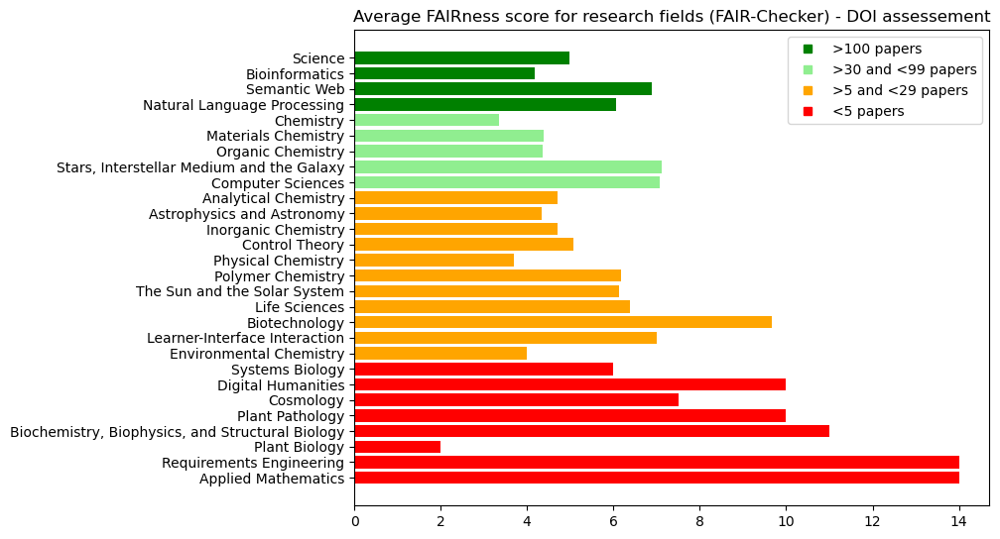

In [14]:
eval1_df = total_score_df.groupby("research_field").agg({"score": "mean"})
eval1_df["counts"] = total_score_df["research_field"].value_counts()
eval1_df = eval1_df.sort_values("counts").reset_index()

plot = plt.figure()
ax = plot.add_axes([0,0,1,1])
fields = eval1_df["research_field"]
avg_scores = eval1_df["score"]
counts_color = [{p<5: "red", 5<=p<30: "orange", 30<=p<=100: "lightgreen", p>100: "green"}[True] for p in eval1_df["counts"]]
ax.barh(fields, avg_scores, color=counts_color)
leg_red = mlines.Line2D([], [], color="red", marker="s", ls="", label="<5 papers")
leg_orange = mlines.Line2D([], [], color="orange", marker="s", ls="", label=">5 and <29 papers")
leg_lightgreen = mlines.Line2D([], [], color="lightgreen", marker="s", ls="", label=">30 and <99 papers")
leg_green = mlines.Line2D([], [], color="green", marker="s", ls="", label=">100 papers")
plt.legend(handles=[leg_green, leg_lightgreen, leg_orange, leg_red])
plt.title("Average FAIRness score for research fields (FAIR-Checker) - DOI assessement")
plt.show()

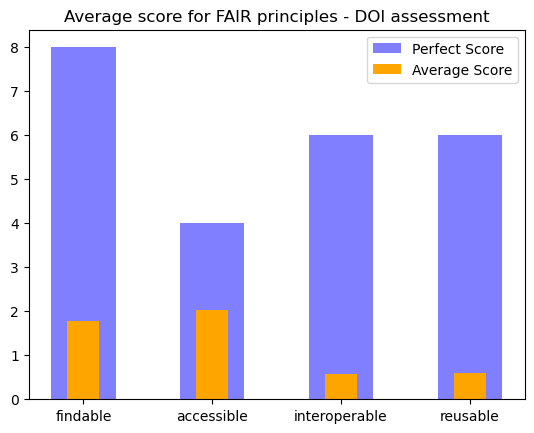

In [15]:
# max scores: F = 8, A = 4, I = 6, R = 6
principle_assessment_df = assessment_df
principle_assessment_df['principle'] = [get_principle_from_metric(x) for x in principle_assessment_df['metric']]

aggregate_funcs = {'score': 'sum', 'principle': 'first'}
principle_assessment_df = principle_assessment_df.groupby(['principle'], as_index=False).agg(aggregate_funcs)
principle_assessment_df['avg_metric_score'] = principle_assessment_df['score']/len(orkg_doi_df)

principle_assessment_df['principle'] = pd.Categorical(principle_assessment_df['principle'], ['findable', 'accessible', 'interoperable', 'reusable'])
principle_assessment_df = principle_assessment_df.sort_values('principle')

#plotting
width = 0.5
perfect_scores = [8, 4, 6, 6]
actual_scores = principle_assessment_df['avg_metric_score']
indices = np.arange(len(perfect_scores))

plt.bar(indices, perfect_scores, width=width, color='b', alpha=0.5, label='Perfect Score')
plt.bar([i for i in indices], actual_scores, width=0.5*width, color='orange', label='Average Score')
plt.xticks(indices, principle_assessment_df['principle'] )
plt.title("Average score for FAIR principles - DOI assessment")
plt.legend()
plt.show()

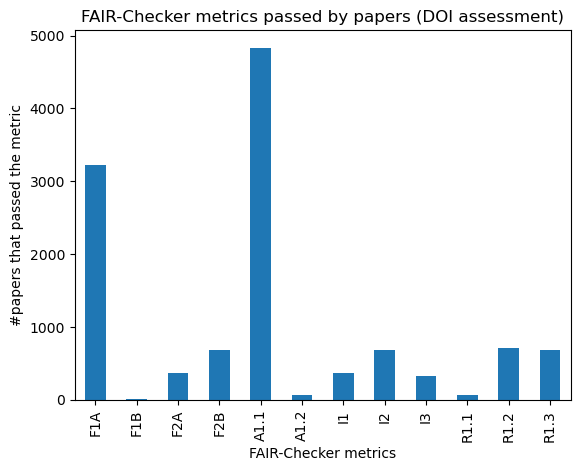

In [16]:
metric_assessment_doi_df = assessment_df
aggregate_funcs = {"score": "sum"}
metric_assessment_doi_df = metric_assessment_doi_df.groupby("metric").agg(aggregate_funcs).reset_index()
metric_assessment_doi_df["score"] = metric_assessment_doi_df["score"] / 2

metric_assessment_doi_df['metric'] = pd.Categorical(metric_assessment_doi_df['metric'], ["F1A", "F1B", "F2A", "F2B", "A1.1", "A1.2", "I1", "I2", "I3", "R1.1", "R1.2", "R1.3"])
metric_assessment_doi_df = metric_assessment_doi_df.sort_values('metric')

metric_assessment_doi_df["score"].plot(kind="bar")
locs, labels = plt.xticks()
plt.xticks(locs, ["F1A", "F1B", "F2A", "F2B", "A1.1", "A1.2", "I1", "I2", "I3", "R1.1", "R1.2", "R1.3"])
plt.title("FAIR-Checker metrics passed by papers (DOI assessment)")
plt.ylabel("#papers that passed the metric")
plt.xlabel("FAIR-Checker metrics")
plt.show()

## Papers via ORKG resource URL

### Paper assessment via ORKG resource URL

In [17]:
%%script false --no-raise-error
orkg_url_df = pd.read_csv("raw_data/paper_query_result_2023-03-29.csv", encoding="ISO-8859-1")
orkg_url_df = orkg_url_df[["paper", "paper_title", "url", "research_field_label"]]
orkg_url_df = orkg_url_df.groupby("paper").agg({"paper_title": "first", "url": "first", "research_field_label": "first"}).reset_index()
orkg_url_df = orkg_url_df.drop(labels=["url"], axis=1)
orkg_url_df

Couldn't find program: 'false'


In [18]:
%%script false --no-raise-error
# FAIR-Checker assessment for all ORKG papers with an ORKG resource URL
# Executing this approximately takes 1,716 minutes
# If you don't have the time, use the latest .csv file :)
count = 0
assessment_results = orkg_url_df['paper'].map(lambda x: get_all_metrics(payload={'url': x}))
orkg_url_df['FAIR_assessment'] = [aresult[0] for aresult in assessment_results]
orkg_url_df['assessment_status_code'] = [aresult[1] for aresult in assessment_results]
orkg_url_df.to_csv("./assessed_data/orkg_url_df_FAIRCheckerv2_assessment"+date+".csv")
orkg_url_df

Couldn't find program: 'false'


### Paper evaluation via ORKG resource URL + visualizations

In [19]:
orkg_url_df = pd.read_csv("assessed_data/orkg_url_df_FAIRCheckerv2_assessment2023-03-29.csv", encoding='ISO-8859-1', index_col=0)
print(orkg_url_df["assessment_status_code"].value_counts())
orkg_url_df = orkg_url_df[orkg_url_df["assessment_status_code"] == 200].reset_index(drop=True)
orkg_url_df["FAIR_assessment"] = orkg_url_df["FAIR_assessment"].map(lambda x: build_assessment_json(x))
orkg_url_df

200    12997
Name: assessment_status_code, dtype: int64


,paper,paper_title,research_field_label,FAIR_assessment,assessment_status_code
0,http://orkg.org/orkg/resource/R1004,"A semi-automated, KNIME-based workflow for bio...",Bioinformatics,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
1,http://orkg.org/orkg/resource/R107618,Instructional interfaceÃ¢ÂÂs blueprint for g...,Learner-Interface Interaction,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
2,http://orkg.org/orkg/resource/R107663,Dimensions of transactional distance in the wo...,Learner-Interface Interaction,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
3,http://orkg.org/orkg/resource/R107834,The future of learner-interface interaction. A...,Learner-Interface Interaction,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
4,http://orkg.org/orkg/resource/R107843,Getting the Mix Right Again: An updated and th...,Learner-Interface Interaction,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
...,...,...,...,...,...
12992,http://orkg.org/orkg/resource/R8441,Investigating the feasibility of scale up and ...,Systems Biology,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
12993,http://orkg.org/orkg/resource/R9154,Recent responses to climate change reveal the ...,Life Sciences,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
12994,http://orkg.org/orkg/resource/R9190,Sequencing Techniques,Biotechnology,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
12995,http://orkg.org/orkg/resource/R9295,DNA sequencing technologies: 2006Ã¢ÂÂ2016,Biotechnology,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200


In [20]:
assessment_orkgurl_df = pd.DataFrame()

papers = list(chain.from_iterable([[x]*12 for x in orkg_url_df['paper']]))
assessment_orkgurl_df['paper'] = papers

research_fields = list(chain.from_iterable([[x]*12 for x in orkg_url_df['research_field_label']]))
assessment_orkgurl_df['research_field'] = research_fields

metrics = list(chain.from_iterable([get_metrics_from_result(assessment_result=x) for x in orkg_url_df['FAIR_assessment']]))
assessment_orkgurl_df['metric'] = metrics

scores = list(chain.from_iterable([get_scores_from_result(assessment_result=x) for x in orkg_url_df['FAIR_assessment']]))
assessment_orkgurl_df['score'] = scores

assessment_orkgurl_df

,paper,research_field,metric,score
0,http://orkg.org/orkg/resource/R1004,Bioinformatics,F1A,2
1,http://orkg.org/orkg/resource/R1004,Bioinformatics,F1B,0
2,http://orkg.org/orkg/resource/R1004,Bioinformatics,F2A,1
3,http://orkg.org/orkg/resource/R1004,Bioinformatics,F2B,2
4,http://orkg.org/orkg/resource/R1004,Bioinformatics,A1.1,2
...,...,...,...,...
155959,http://orkg.org/orkg/resource/R9639,Computer Sciences,I2,2
155960,http://orkg.org/orkg/resource/R9639,Computer Sciences,I3,2
155961,http://orkg.org/orkg/resource/R9639,Computer Sciences,R1.1,0
155962,http://orkg.org/orkg/resource/R9639,Computer Sciences,R1.2,2


In [21]:
aggregate_funcs = {'research_field': 'first', 'score': 'sum'}
total_score_orkgurl_df = assessment_orkgurl_df.groupby('paper', as_index=False).agg(aggregate_funcs)
total_score_orkgurl_df

,paper,research_field,score
0,http://orkg.org/orkg/resource/R1004,Bioinformatics,16
1,http://orkg.org/orkg/resource/R107618,Learner-Interface Interaction,16
2,http://orkg.org/orkg/resource/R107663,Learner-Interface Interaction,14
3,http://orkg.org/orkg/resource/R107834,Learner-Interface Interaction,16
4,http://orkg.org/orkg/resource/R107843,Learner-Interface Interaction,14
...,...,...,...
12992,http://orkg.org/orkg/resource/R8441,Systems Biology,16
12993,http://orkg.org/orkg/resource/R9154,Life Sciences,16
12994,http://orkg.org/orkg/resource/R9190,Biotechnology,14
12995,http://orkg.org/orkg/resource/R9295,Biotechnology,14


In [22]:
print(total_score_orkgurl_df["score"].mean())
print(total_score_orkgurl_df["score"].median())
# possible max = 16
print(total_score_orkgurl_df["score"].max())
# possible min = 2
print(total_score_orkgurl_df["score"].min())

14.076940832499808
14.0
16
12


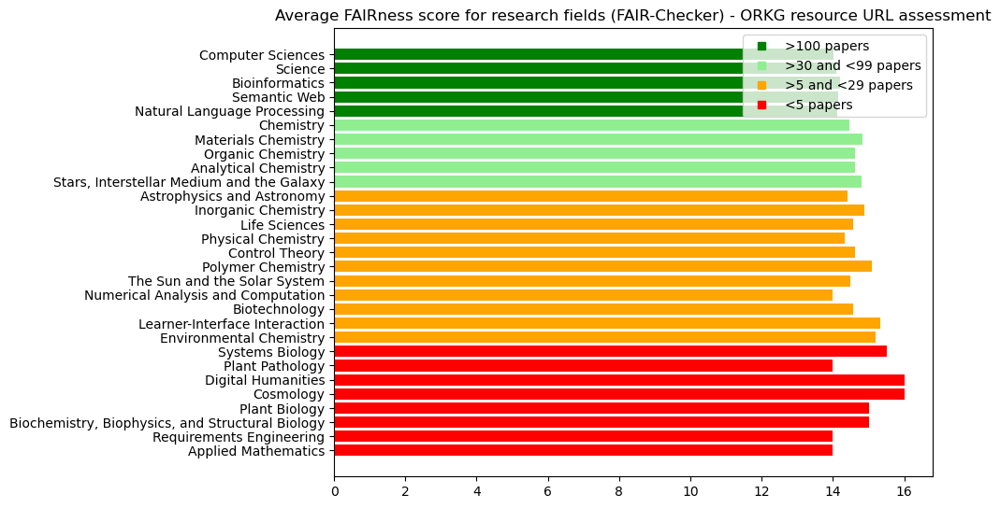

In [23]:
eval2_df = total_score_orkgurl_df.groupby("research_field").agg({"score": "sum"})
eval2_df["counts"] = total_score_orkgurl_df["research_field"].value_counts()
eval2_df = eval2_df.sort_values("counts")
eval2_df["avg_score"] = eval2_df["score"] / eval2_df["counts"]
eval2_df = eval2_df.drop(labels=["score"], axis=1)
eval2_df = eval2_df.reset_index()

plot = plt.figure()
ax = plot.add_axes([0,0,1,1])
fields = eval2_df['research_field']
avg_scores = eval2_df['avg_score']
counts_color = [{p<5: 'red', 5<=p<30: 'orange', 30<=p<=100: 'lightgreen', p>100: 'green'}[True] for p in eval2_df["counts"]]
ax.barh(fields, avg_scores, color=counts_color)
leg_red = mlines.Line2D([], [], color="red", marker="s", ls='', label="<5 papers")
leg_orange = mlines.Line2D([], [], color="orange", marker="s", ls='', label=">5 and <29 papers")
leg_lightgreen = mlines.Line2D([], [], color="lightgreen", marker="s", ls='', label=">30 and <99 papers")
leg_green = mlines.Line2D([], [], color="green", marker="s", ls='', label=">100 papers")
plt.legend(handles=[leg_green, leg_lightgreen, leg_orange, leg_red])
plt.title("Average FAIRness score for research fields (FAIR-Checker) - ORKG resource URL assessment")
plt.show()

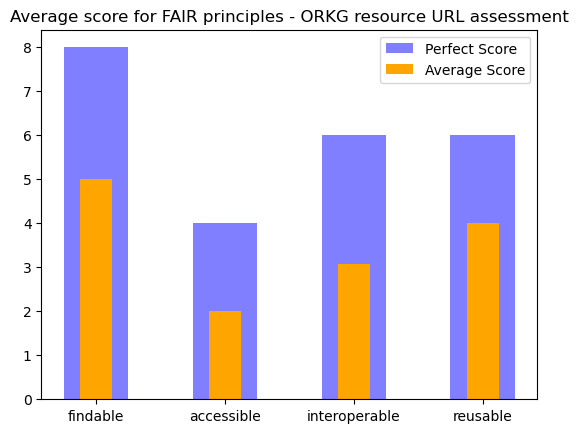

In [24]:
# max scores: F = 8, A = 2, I = 6, R = 6
principle_assessment_orkgurl_df = assessment_orkgurl_df
principle_assessment_orkgurl_df['principle'] = [get_principle_from_metric(x) for x in principle_assessment_orkgurl_df['metric']]

aggregate_funcs = {'score': 'sum', 'principle': 'first'}
principle_assessment_orkgurl_df = principle_assessment_orkgurl_df.groupby(['principle'], as_index=False).agg(aggregate_funcs)
principle_assessment_orkgurl_df['avg_metric_score'] = principle_assessment_orkgurl_df['score']/len(orkg_url_df)

principle_assessment_orkgurl_df['principle'] = pd.Categorical(principle_assessment_orkgurl_df['principle'], ['findable', 'accessible', 'interoperable', 'reusable'])
principle_assessment_orkgurl_df = principle_assessment_orkgurl_df.sort_values('principle')

#plotting
width = 0.5
perfect_scores = [8, 4, 6, 6]
actual_scores = principle_assessment_orkgurl_df['avg_metric_score']
indices = np.arange(len(perfect_scores))

plt.bar(indices, perfect_scores, width=width, color='b', alpha=0.5, label='Perfect Score')
plt.bar([i for i in indices], actual_scores, width=0.5*width, color='orange', label='Average Score')
plt.xticks(indices, principle_assessment_orkgurl_df['principle'] )
plt.title("Average score for FAIR principles - ORKG resource URL assessment")
plt.legend()
plt.show()

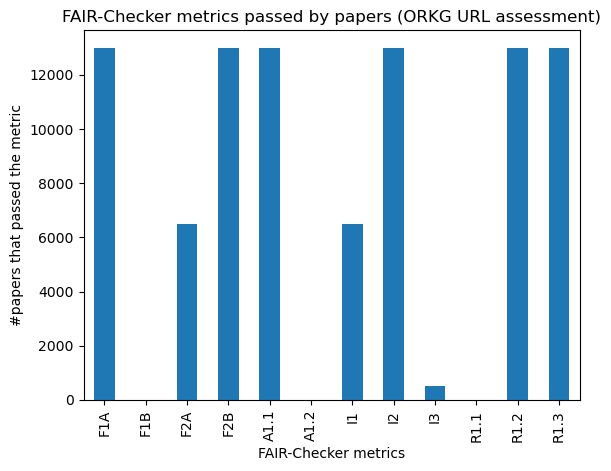

In [25]:
metric_assessment_orkgurl_df = assessment_orkgurl_df
aggregate_funcs = {"score": "sum"}
metric_assessment_orkgurl_df = metric_assessment_orkgurl_df.groupby("metric").agg(aggregate_funcs).reset_index()
metric_assessment_orkgurl_df["score"] = metric_assessment_orkgurl_df["score"] / 2

metric_assessment_orkgurl_df['metric'] = pd.Categorical(metric_assessment_orkgurl_df['metric'], ["F1A", "F1B", "F2A", "F2B", "A1.1", "A1.2", "I1", "I2", "I3", "R1.1", "R1.2", "R1.3"])
metric_assessment_orkgurl_df = metric_assessment_orkgurl_df.sort_values('metric')

metric_assessment_orkgurl_df["score"].plot(kind="bar")
locs, labels = plt.xticks()
plt.xticks(locs, ["F1A", "F1B", "F2A", "F2B", "A1.1", "A1.2", "I1", "I2", "I3", "R1.1", "R1.2", "R1.3"])
plt.title("FAIR-Checker metrics passed by papers (ORKG URL assessment)")
plt.ylabel("#papers that passed the metric")
plt.xlabel("FAIR-Checker metrics")
plt.show()

## Papers via standard URL

### Paper assessment via standard URL

In [26]:
%%script false --no-raise-error
orkg_stdurl_df = pd.read_csv("raw_data/paper_query_result_2023-03-29.csv", encoding="ISO-8859-1", index_col=0).reset_index()
orkg_stdurl_df = orkg_stdurl_df[["paper", "paper_title", "url", "research_field_label"]]
orkg_stdurl_df = orkg_stdurl_df.groupby("paper").agg({"paper_title": "first", "url": "first", "research_field_label": "first"})
orkg_stdurl_df = orkg_stdurl_df[orkg_stdurl_df["url"].isna() == False].reset_index()
orkg_stdurl_df

Couldn't find program: 'false'


In [27]:
%%script false --no-raise-error
# FAIR-Checker assessment for all ORKG papers with a standard URL
# Executing this approximately takes 2,471 minutes
# If you don't have the time, use the latest .csv file :)
count = 0
assessment_results = orkg_stdurl_df['url'].map(lambda x: get_all_metrics(payload={'url': x}))
orkg_stdurl_df['FAIR_assessment'] = [aresult[0] for aresult in assessment_results]
orkg_stdurl_df['assessment_status_code'] = [aresult[1] for aresult in assessment_results]
orkg_stdurl_df.to_csv("./assessed_data/orkg_stdurl_df_FAIRCheckerv2_assessment"+date+".csv")
orkg_stdurl_df

Couldn't find program: 'false'


### Paper evaluation via standard URL + visualizations

In [28]:
orkg_stdurl_df = pd.read_csv("assessed_data/orkg_stdurl_df_FAIRCheckerv2_assessment2023-03-29.csv", encoding="ISO-8859-1", index_col=0)
print(orkg_stdurl_df["assessment_status_code"].value_counts())
orkg_stdurl_df = orkg_stdurl_df[orkg_stdurl_df["assessment_status_code"] == 200].reset_index(drop=True)
orkg_stdurl_df["FAIR_assessment"] = orkg_stdurl_df["FAIR_assessment"].map(lambda x: build_assessment_json(x))
orkg_stdurl_df

500    5681
200    2374
504      14
Name: assessment_status_code, dtype: int64


,paper,paper_title,url,research_field_label,FAIR_assessment,assessment_status_code
0,http://orkg.org/orkg/resource/R107834,The future of learner-interface interaction. A...,http://www.udgvirtual.udg.mx/apertura/index.ph...,Learner-Interface Interaction,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
1,http://orkg.org/orkg/resource/R107843,Getting the Mix Right Again: An updated and th...,http://www.irrodl.org/index.php/irrodl/article...,Learner-Interface Interaction,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
2,http://orkg.org/orkg/resource/R108529,DistrustRank: Spotting False News Domains,https://dl.acm.org/doi/10.1145/3201064.3201083,Computer Sciences,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
3,http://orkg.org/orkg/resource/R108693,Genetically modified organisms and food securi...,https://doi.org/10.1080/21645698.2020.1794489,Biotechnology,"[{'metric': 'F1A', 'score': '0'}, {'metric': '...",200
4,http://orkg.org/orkg/resource/R108704,Anastomosis Groups and Pathogenicity of Rhizoc...,https://apsjournals.apsnet.org/doi/10.1094/PDI...,Plant Pathology,"[{'metric': 'F1A', 'score': '0'}, {'metric': '...",200
...,...,...,...,...,...,...
2369,http://orkg.org/orkg/resource/R78136,Hypertension prevalence in human coronavirus d...,https://www.sciencedirect.com/science/article/...,Life Sciences,"[{'metric': 'F1A', 'score': '0'}, {'metric': '...",200
2370,http://orkg.org/orkg/resource/R78139,Effect of temperature on the infectivity of CO...,https://www.sciencedirect.com/science/article/...,Life Sciences,"[{'metric': 'F1A', 'score': '0'}, {'metric': '...",200
2371,http://orkg.org/orkg/resource/R78145,Modeling Palestinian COVID-19 Cumulative Confi...,https://www.sciencedirect.com/science/article/...,Life Sciences,"[{'metric': 'F1A', 'score': '0'}, {'metric': '...",200
2372,http://orkg.org/orkg/resource/R78301,Petroleum Hydrocarbons Contamination of Surfac...,http://www.sciepub.com/JEPHH/abstract/8843,Environmental Chemistry,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200


In [29]:
assessment_stdurl_df = pd.DataFrame()

papers = list(chain.from_iterable([[x]*12 for x in orkg_stdurl_df['paper']]))
assessment_stdurl_df['paper'] = papers

research_fields = list(chain.from_iterable([[x]*12 for x in orkg_stdurl_df['research_field_label']]))
assessment_stdurl_df['research_field'] = research_fields

urls = list(chain.from_iterable([[x]*12 for x in orkg_stdurl_df['url']]))
assessment_stdurl_df['url'] = urls

metrics = list(chain.from_iterable([get_metrics_from_result(assessment_result=x) for x in orkg_stdurl_df['FAIR_assessment']]))
assessment_stdurl_df['metric'] = metrics

scores = list(chain.from_iterable([get_scores_from_result(assessment_result=x) for x in orkg_stdurl_df['FAIR_assessment']]))
assessment_stdurl_df['score'] = scores

assessment_stdurl_df

,paper,research_field,url,metric,score
0,http://orkg.org/orkg/resource/R107834,Learner-Interface Interaction,http://www.udgvirtual.udg.mx/apertura/index.ph...,F1A,2
1,http://orkg.org/orkg/resource/R107834,Learner-Interface Interaction,http://www.udgvirtual.udg.mx/apertura/index.ph...,F1B,0
2,http://orkg.org/orkg/resource/R107834,Learner-Interface Interaction,http://www.udgvirtual.udg.mx/apertura/index.ph...,F2A,0
3,http://orkg.org/orkg/resource/R107834,Learner-Interface Interaction,http://www.udgvirtual.udg.mx/apertura/index.ph...,F2B,0
4,http://orkg.org/orkg/resource/R107834,Learner-Interface Interaction,http://www.udgvirtual.udg.mx/apertura/index.ph...,A1.1,2
...,...,...,...,...,...
28483,http://orkg.org/orkg/resource/R78345,Physical Chemistry,https://pubs.acs.org/doi/abs/10.1021/la202346r,I2,0
28484,http://orkg.org/orkg/resource/R78345,Physical Chemistry,https://pubs.acs.org/doi/abs/10.1021/la202346r,I3,0
28485,http://orkg.org/orkg/resource/R78345,Physical Chemistry,https://pubs.acs.org/doi/abs/10.1021/la202346r,R1.1,0
28486,http://orkg.org/orkg/resource/R78345,Physical Chemistry,https://pubs.acs.org/doi/abs/10.1021/la202346r,R1.2,0


In [30]:
aggregate_funcs = {'research_field': 'first', 'url': 'first', 'score': 'sum'}
total_score_stdurl_df = assessment_stdurl_df.groupby('paper', as_index=False).agg(aggregate_funcs)
total_score_stdurl_df

,paper,research_field,url,score
0,http://orkg.org/orkg/resource/R107834,Learner-Interface Interaction,http://www.udgvirtual.udg.mx/apertura/index.ph...,4
1,http://orkg.org/orkg/resource/R107843,Learner-Interface Interaction,http://www.irrodl.org/index.php/irrodl/article...,4
2,http://orkg.org/orkg/resource/R108529,Computer Sciences,https://dl.acm.org/doi/10.1145/3201064.3201083,4
3,http://orkg.org/orkg/resource/R108693,Biotechnology,https://doi.org/10.1080/21645698.2020.1794489,2
4,http://orkg.org/orkg/resource/R108704,Plant Pathology,https://apsjournals.apsnet.org/doi/10.1094/PDI...,2
...,...,...,...,...
2369,http://orkg.org/orkg/resource/R78136,Life Sciences,https://www.sciencedirect.com/science/article/...,2
2370,http://orkg.org/orkg/resource/R78139,Life Sciences,https://www.sciencedirect.com/science/article/...,2
2371,http://orkg.org/orkg/resource/R78145,Life Sciences,https://www.sciencedirect.com/science/article/...,2
2372,http://orkg.org/orkg/resource/R78301,Environmental Chemistry,http://www.sciepub.com/JEPHH/abstract/8843,4


In [31]:
print(total_score_stdurl_df["score"].mean())
print(total_score_stdurl_df["score"].median())
# possible max = 16
print(total_score_stdurl_df["score"].max())
# possible min = 2
print(total_score_stdurl_df["score"].min())

2.7194608256107835
2.0
20
0


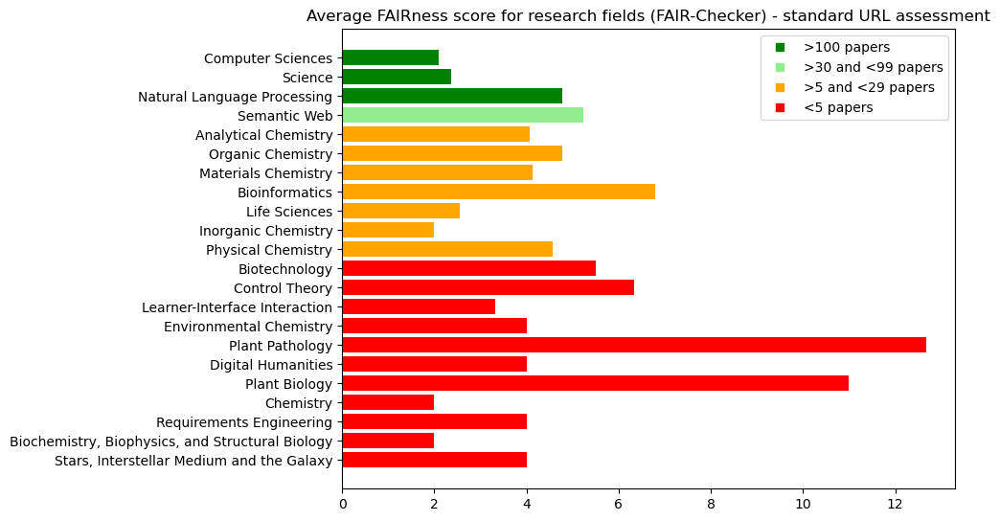

In [32]:
eval3_df = total_score_stdurl_df.groupby("research_field").agg({"score": "sum"})
eval3_df["counts"] = total_score_stdurl_df["research_field"].value_counts()
eval3_df = eval3_df.sort_values("counts")
eval3_df["avg_score"] = eval3_df["score"] / eval3_df["counts"]
eval3_df = eval3_df.drop(labels=["score"], axis=1)
eval3_df = eval3_df.reset_index()

plot = plt.figure()
ax = plot.add_axes([0,0,1,1])
fields = eval3_df['research_field']
avg_scores = eval3_df['avg_score']
counts_color = [{p<5: 'red', 5<=p<30: 'orange', 30<=p<=100: 'lightgreen', p>100: 'green'}[True] for p in eval3_df["counts"]]
ax.barh(fields, avg_scores, color=counts_color)
leg_red = mlines.Line2D([], [], color="red", marker="s", ls='', label="<5 papers")
leg_orange = mlines.Line2D([], [], color="orange", marker="s", ls='', label=">5 and <29 papers")
leg_lightgreen = mlines.Line2D([], [], color="lightgreen", marker="s", ls='', label=">30 and <99 papers")
leg_green = mlines.Line2D([], [], color="green", marker="s", ls='', label=">100 papers")
plt.legend(handles=[leg_green, leg_lightgreen, leg_orange, leg_red])
plt.title("Average FAIRness score for research fields (FAIR-Checker) - standard URL assessment")
plt.show()

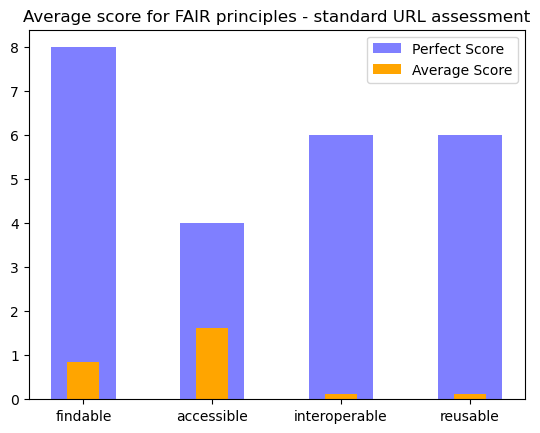

In [33]:
# max scores: F = 8, A = 4, I = 6, R = 6
principle_assessment_stdurl_df = assessment_stdurl_df
principle_assessment_stdurl_df['principle'] = [get_principle_from_metric(x) for x in principle_assessment_stdurl_df['metric']]

aggregate_funcs = {'score': 'sum', 'principle': 'first'}
principle_assessment_stdurl_df = principle_assessment_stdurl_df.groupby(['principle'], as_index=False).agg(aggregate_funcs)
principle_assessment_stdurl_df['avg_metric_score'] = principle_assessment_stdurl_df['score']/len(orkg_stdurl_df)

principle_assessment_stdurl_df['principle'] = pd.Categorical(principle_assessment_stdurl_df['principle'], ['findable', 'accessible', 'interoperable', 'reusable'])
principle_assessment_stdurl_df = principle_assessment_stdurl_df.sort_values('principle')

#plotting
width = 0.5
perfect_scores = [8, 4, 6, 6]
actual_scores = principle_assessment_stdurl_df['avg_metric_score']
indices = np.arange(len(perfect_scores))

plt.bar(indices, perfect_scores, width=width, color='b', alpha=0.5, label='Perfect Score')
plt.bar([i for i in indices], actual_scores, width=0.5*width, color='orange', label='Average Score')
plt.xticks(indices, principle_assessment_stdurl_df['principle'] )
plt.title("Average score for FAIR principles - standard URL assessment")
plt.legend()
plt.show()

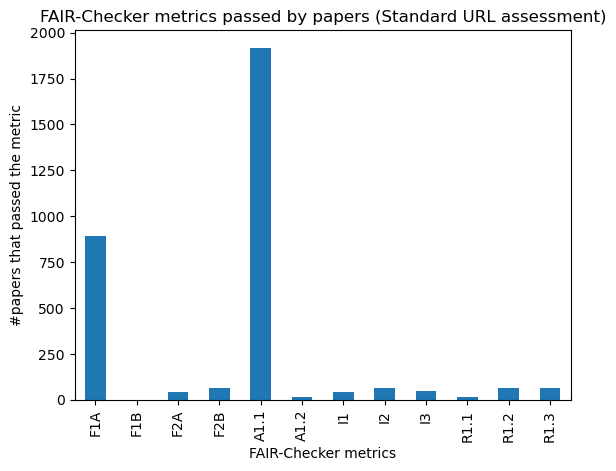

In [34]:
metric_assessment_stdurl_df = assessment_stdurl_df
aggregate_funcs = {"score": "sum"}
metric_assessment_stdurl_df = metric_assessment_stdurl_df.groupby("metric").agg(aggregate_funcs).reset_index()
metric_assessment_stdurl_df["score"] = metric_assessment_stdurl_df["score"] / 2

metric_assessment_stdurl_df['metric'] = pd.Categorical(metric_assessment_stdurl_df['metric'], ["F1A", "F1B", "F2A", "F2B", "A1.1", "A1.2", "I1", "I2", "I3", "R1.1", "R1.2", "R1.3"])
metric_assessment_stdurl_df = metric_assessment_stdurl_df.sort_values('metric')

metric_assessment_stdurl_df["score"].plot(kind="bar")
locs, labels = plt.xticks()
plt.xticks(locs, ["F1A", "F1B", "F2A", "F2B", "A1.1", "A1.2", "I1", "I2", "I3", "R1.1", "R1.2", "R1.3"])
plt.title("FAIR-Checker metrics passed by papers (Standard URL assessment)")
plt.ylabel("#papers that passed the metric")
plt.xlabel("FAIR-Checker metrics")
plt.show()

## Comparison of Papers: DOI vs. ORKG resource URL vs. standard URL

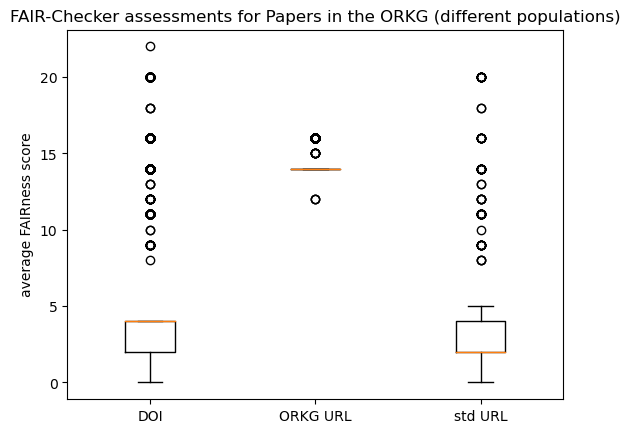

In [35]:
doi_df = total_score_df
orkg_resource_url_df = total_score_orkgurl_df
std_url_df = total_score_stdurl_df

assessement_data = [doi_df["score"], orkg_resource_url_df["score"], std_url_df["score"]]
plt.boxplot(assessement_data)
plt.title("FAIR-Checker assessments for Papers in the ORKG (different populations)")
locs, labels = plt.xticks()
plt.xticks(locs, ["DOI", "ORKG URL", "std URL"])
plt.ylabel("average FAIRness score")
plt.show()

In [36]:
doi_orkg_df = pd.merge(doi_df, orkg_resource_url_df, on=["paper", "research_field"], suffixes=("_doi", "_orkg"))
doi_orkg_stdurl_df = pd.merge(doi_orkg_df, std_url_df, on=["paper", "research_field"])
doi_orkg_stdurl_df = doi_orkg_stdurl_df.rename(columns={"score": "score_url"})
doi_orkg_stdurl_df = doi_orkg_stdurl_df[["paper", "research_field", "doi", "url", "score_doi", "score_orkg", "score_url"]]
doi_orkg_stdurl_df

,paper,research_field,doi,url,score_doi,score_orkg,score_url
0,http://orkg.org/orkg/resource/R107834,Learner-Interface Interaction,10.32870/Ap.v12n2.1910,http://www.udgvirtual.udg.mx/apertura/index.ph...,4,16,4
1,http://orkg.org/orkg/resource/R107843,Learner-Interface Interaction,10.19173/irrodl.v4i2.149,http://www.irrodl.org/index.php/irrodl/article...,4,14,4
2,http://orkg.org/orkg/resource/R108529,Computer Sciences,10.1145/3201064.3201083,https://dl.acm.org/doi/10.1145/3201064.3201083,4,14,4
3,http://orkg.org/orkg/resource/R108704,Plant Pathology,10.1094/pdis-02-15-0236-re,https://apsjournals.apsnet.org/doi/10.1094/PDI...,4,14,2
4,http://orkg.org/orkg/resource/R108713,Plant Pathology,10.1007/s10658-014-0409-6,https://link.springer.com/article/10.1007/s106...,16,14,16
...,...,...,...,...,...,...,...
663,http://orkg.org/orkg/resource/R69288,Natural Language Processing,10.18653/v1/D18-1360,https://aclanthology.org/D18-1360.pdf,2,16,4
664,http://orkg.org/orkg/resource/R74966,"Biochemistry, Biophysics, and Structural Biology",10.1021/acs.jctc.7b00500,https://pubs.acs.org/doi/10.1021/acs.jctc.7b00500,2,16,2
665,http://orkg.org/orkg/resource/R75702,Environmental Chemistry,10.22034/ajgc.2021.113192,http://www.ajgreenchem.com/article_113192.html,4,14,4
666,http://orkg.org/orkg/resource/R78118,Environmental Chemistry,10.12691/env-2-1-5,http://www.sciepub.com/ENV/abstract/1687,4,16,4


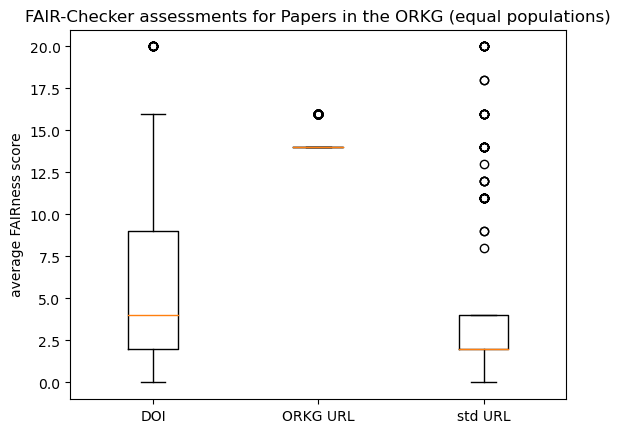

In [37]:
assessement_data_merged = [doi_orkg_stdurl_df["score_doi"], doi_orkg_stdurl_df["score_orkg"], doi_orkg_stdurl_df["score_url"]]
plt.boxplot(assessement_data_merged)
plt.title("FAIR-Checker assessments for Papers in the ORKG (equal populations)")
locs, labels = plt.xticks()
plt.xticks(locs, ["DOI", "ORKG URL", "std URL"])
plt.ylabel("average FAIRness score")
plt.show()

# Comparisons

## Comparisons evaluation via DOI

### Comparison assessment via DOI

In [40]:
%%script false --no-raise-error
comparison_df = pd.read_csv("raw_data/comparison_query_result_2023-03-29.csv")
comparison_doi_df = comparison_df[comparison_df["doi"].isna() == False].reset_index(drop=True)
comparison_doi_df

Couldn't find program: 'false'


In [41]:
%%script false --no-raise-error
# FAIR-Checker assessment for all ORKG comparisons with a valid doi
# Executing this approximately takes 25 minutes
# If you don't have the time, use the latest .csv file :)
count = 0
assessment_results = comparison_doi_df['doi'].map(lambda x: get_all_metrics(payload={'url': 'https://doi.org/' + x}))
comparison_doi_df['FAIR_assessment'] = [aresult[0] for aresult in assessment_results]
comparison_doi_df['assessment_status_code'] = [aresult[1] for aresult in assessment_results]
comparison_doi_df.to_csv("./assessed_data/comparison_doi_df_FAIRCheckerv2_assessment_"+date+".csv")
comparison_doi_df

Couldn't find program: 'false'


### Comparison evaluation via DOI + visualizations

In [46]:
comparison_doi_df = pd.read_csv("assessed_data/comparison_doi_df_FAIRCheckerv2_assessment_2023-03-29.csv", index_col=0)
print(comparison_doi_df["assessment_status_code"].value_counts())
comparison_doi_df = comparison_doi_df[comparison_doi_df["assessment_status_code"] == 200]
comparison_doi_df = comparison_doi_df.drop(labels=["assessment_status_code"], axis=1)
comparison_doi_df["FAIR_assessment"] = comparison_doi_df["FAIR_assessment"].map(lambda x: build_assessment_json(x))
comparison_doi_df

200    294
Name: assessment_status_code, dtype: int64


,comparisons,doi,FAIR_assessment
0,http://orkg.org/orkg/resource/R140347,10.48366/r140347,"[{'metric': 'F1A', 'score': '2'}, {'metric': '..."
1,http://orkg.org/orkg/resource/R140449,10.48366/r140449,"[{'metric': 'F1A', 'score': '2'}, {'metric': '..."
2,http://orkg.org/orkg/resource/R140463,10.48366/r140463,"[{'metric': 'F1A', 'score': '2'}, {'metric': '..."
3,http://orkg.org/orkg/resource/R140465,10.48366/r140465,"[{'metric': 'F1A', 'score': '2'}, {'metric': '..."
4,http://orkg.org/orkg/resource/R140714,10.48366/r140714,"[{'metric': 'F1A', 'score': '2'}, {'metric': '..."
...,...,...,...
289,http://orkg.org/orkg/resource/R576872,10.48366/r576872,"[{'metric': 'F1A', 'score': '2'}, {'metric': '..."
290,http://orkg.org/orkg/resource/R576873,10.48366/r576873,"[{'metric': 'F1A', 'score': '2'}, {'metric': '..."
291,http://orkg.org/orkg/resource/R576874,10.48366/r576874,"[{'metric': 'F1A', 'score': '2'}, {'metric': '..."
292,http://orkg.org/orkg/resource/R576875,10.48366/r576875,"[{'metric': 'F1A', 'score': '2'}, {'metric': '..."


In [47]:
assessment_compdoi_df = pd.DataFrame()

comparisons = list(chain.from_iterable([[x]*12 for x in comparison_doi_df['comparisons']]))
assessment_compdoi_df['comparison'] = comparisons

dois = list(chain.from_iterable([[x]*12 for x in comparison_doi_df['doi']]))
assessment_compdoi_df['doi'] = dois

metrics = list(chain.from_iterable([get_metrics_from_result(assessment_result=x) for x in comparison_doi_df['FAIR_assessment']]))
assessment_compdoi_df['metric'] = metrics

scores = list(chain.from_iterable([get_scores_from_result(assessment_result=x) for x in comparison_doi_df['FAIR_assessment']]))
assessment_compdoi_df['score'] = scores

assessment_compdoi_df

,comparison,doi,metric,score
0,http://orkg.org/orkg/resource/R140347,10.48366/r140347,F1A,2
1,http://orkg.org/orkg/resource/R140347,10.48366/r140347,F1B,0
2,http://orkg.org/orkg/resource/R140347,10.48366/r140347,F2A,1
3,http://orkg.org/orkg/resource/R140347,10.48366/r140347,F2B,2
4,http://orkg.org/orkg/resource/R140347,10.48366/r140347,A1.1,2
...,...,...,...,...
3523,http://orkg.org/orkg/resource/R576876,10.48366/r576876,I2,2
3524,http://orkg.org/orkg/resource/R576876,10.48366/r576876,I3,0
3525,http://orkg.org/orkg/resource/R576876,10.48366/r576876,R1.1,0
3526,http://orkg.org/orkg/resource/R576876,10.48366/r576876,R1.2,2


In [48]:
aggregate_funcs = {'doi': 'first', 'score': 'sum'}
total_score_compdoi_df = assessment_compdoi_df.groupby('comparison', as_index=False).agg(aggregate_funcs)
total_score_compdoi_df

,comparison,doi,score
0,http://orkg.org/orkg/resource/R107854,10.48366/r107854,14
1,http://orkg.org/orkg/resource/R108358,10.48366/r108358,14
2,http://orkg.org/orkg/resource/R108601,10.48366/r108601,14
3,http://orkg.org/orkg/resource/R108719,10.48366/r108719,14
4,http://orkg.org/orkg/resource/R109041,10.48366/r109041,14
...,...,...,...
289,http://orkg.org/orkg/resource/R76906,10.48366/r76906,14
290,http://orkg.org/orkg/resource/R78163,10.48366/r78163,14
291,http://orkg.org/orkg/resource/R78454,10.48366/r78454,14
292,http://orkg.org/orkg/resource/R8342,10.48366/r8342,14


In [49]:
print(total_score_compdoi_df["score"].mean())
print(total_score_compdoi_df["score"].median())
# possible max = 16
print(total_score_compdoi_df["score"].max())
# possible min = 16
print(total_score_compdoi_df["score"].min())

13.986394557823129
14.0
14
12


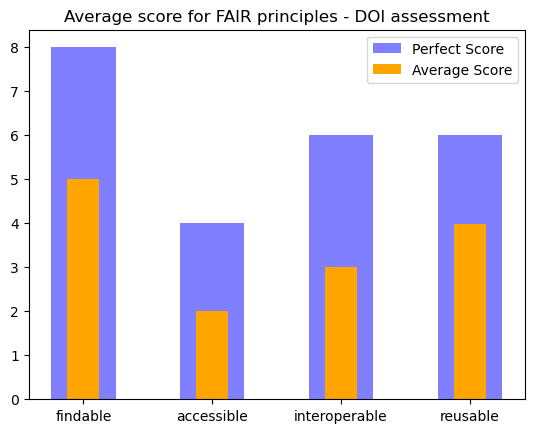

In [50]:
# max scores: F = 8, A = 4, I = 6, R = 6
principle_assessment_compdoi_df = assessment_compdoi_df
principle_assessment_compdoi_df['principle'] = [get_principle_from_metric(x) for x in principle_assessment_compdoi_df['metric']]

aggregate_funcs = {'score': 'sum', 'principle': 'first'}
principle_assessment_compdoi_df = principle_assessment_compdoi_df.groupby(['principle'], as_index=False).agg(aggregate_funcs)
principle_assessment_compdoi_df['avg_metric_score'] = principle_assessment_compdoi_df['score']/len(comparison_doi_df)

principle_assessment_compdoi_df['principle'] = pd.Categorical(principle_assessment_compdoi_df['principle'], ['findable', 'accessible', 'interoperable', 'reusable'])
principle_assessment_compdoi_df = principle_assessment_compdoi_df.sort_values('principle')

#plotting
width = 0.5
perfect_scores = [8, 4, 6, 6]
actual_scores = principle_assessment_compdoi_df['avg_metric_score']
indices = np.arange(len(perfect_scores))

plt.bar(indices, perfect_scores, width=width, color='b', alpha=0.5, label='Perfect Score')
plt.bar([i for i in indices], actual_scores, width=0.5*width, color='orange', label='Average Score')
plt.xticks(indices, principle_assessment_compdoi_df['principle'] )
plt.title("Average score for FAIR principles - DOI assessment")
plt.legend()
plt.show()

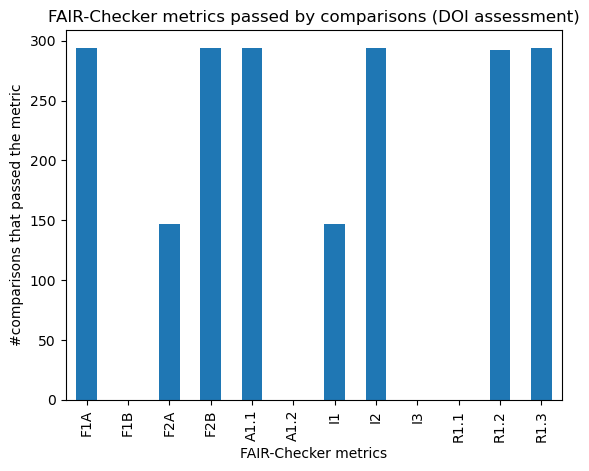

In [51]:
metric_assessment_compdoi_df = assessment_compdoi_df
aggregate_funcs = {"score": "sum"}
metric_assessment_compdoi_df = metric_assessment_compdoi_df.groupby("metric").agg(aggregate_funcs).reset_index()
metric_assessment_compdoi_df["score"] = metric_assessment_compdoi_df["score"] / 2

metric_assessment_compdoi_df['metric'] = pd.Categorical(metric_assessment_compdoi_df['metric'], ["F1A", "F1B", "F2A", "F2B", "A1.1", "A1.2", "I1", "I2", "I3", "R1.1", "R1.2", "R1.3"])
metric_assessment_compdoi_df = metric_assessment_compdoi_df.sort_values('metric')

metric_assessment_compdoi_df["score"].plot(kind="bar")
locs, labels = plt.xticks()
plt.xticks(locs, ["F1A", "F1B", "F2A", "F2B", "A1.1", "A1.2", "I1", "I2", "I3", "R1.1", "R1.2", "R1.3"])
plt.title("FAIR-Checker metrics passed by comparisons (DOI assessment)")
plt.ylabel("#comparisons that passed the metric")
plt.xlabel("FAIR-Checker metrics")
plt.show()

## Comparisons evaluation via ORKG resource URL

### Comparison assessment via ORKG resource URL

In [56]:
%%script false --no-raise-error
comparison_orkg_df = pd.read_csv("raw_data/comparison_query_result_2023-03-29.csv")
comparison_orkg_df

Couldn't find program: 'false'


In [57]:
%%script false --no-raise-error
# FAIR-Checker assessment for all ORKG comparisons with an ORKG resource URL
# Executing this approximately takes 1,505 minutes
# If you don't have the time, use the latest .csv file :)
count = 0
assessment_results = comparison_orkg_df['comparisons'].map(lambda x: get_all_metrics(payload={'url': x}))
comparison_orkg_df['FAIR_assessment'] = [aresult[0] for aresult in assessment_results]
comparison_orkg_df['assessment_status_code'] = [aresult[1] for aresult in assessment_results]
comparison_orkg_df.to_csv("./assessed_data/comparison_orkg_df_FAIRCheckerv2_assessment"+date+".csv")
comparison_orkg_df

Couldn't find program: 'false'


### Comparison evaluation via ORKG resource URL

In [55]:
comparison_orkg_df = pd.read_csv("assessed_data/comparison_orkg_df_FAIRCheckerv2_assessment2023-03-29.csv", index_col=0)
print(comparison_orkg_df["assessment_status_code"].value_counts())
comparison_orkg_df = comparison_orkg_df[comparison_orkg_df["assessment_status_code"] == 200].reset_index(drop=True)
comparison_orkg_df["FAIR_assessment"] = comparison_orkg_df["FAIR_assessment"].map(lambda x: build_assessment_json(x))
comparison_orkg_df

200    1149
Name: assessment_status_code, dtype: int64


,comparisons,doi,FAIR_assessment,assessment_status_code
0,http://orkg.org/orkg/resource/R140347,10.48366/r140347,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
1,http://orkg.org/orkg/resource/R140449,10.48366/r140449,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
2,http://orkg.org/orkg/resource/R140463,10.48366/r140463,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
3,http://orkg.org/orkg/resource/R140465,10.48366/r140465,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
4,http://orkg.org/orkg/resource/R140714,10.48366/r140714,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
...,...,...,...,...
1144,http://orkg.org/orkg/resource/R203903,NaN,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
1145,http://orkg.org/orkg/resource/R204005,NaN,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
1146,http://orkg.org/orkg/resource/R288079,NaN,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
1147,http://orkg.org/orkg/resource/R288672,NaN,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200


In [58]:
assessment_comporkg_df = pd.DataFrame()

comparisons = list(chain.from_iterable([[x]*12 for x in comparison_orkg_df['comparisons']]))
assessment_comporkg_df['comparison'] = comparisons

metrics = list(chain.from_iterable([get_metrics_from_result(assessment_result=x) for x in comparison_orkg_df['FAIR_assessment']]))
assessment_comporkg_df['metric'] = metrics

scores = list(chain.from_iterable([get_scores_from_result(assessment_result=x) for x in comparison_orkg_df['FAIR_assessment']]))
assessment_comporkg_df['score'] = scores

assessment_comporkg_df

,comparison,metric,score
0,http://orkg.org/orkg/resource/R140347,F1A,2
1,http://orkg.org/orkg/resource/R140347,F1B,0
2,http://orkg.org/orkg/resource/R140347,F2A,1
3,http://orkg.org/orkg/resource/R140347,F2B,2
4,http://orkg.org/orkg/resource/R140347,A1.1,2
...,...,...,...
13783,http://orkg.org/orkg/resource/R288673,I2,2
13784,http://orkg.org/orkg/resource/R288673,I3,0
13785,http://orkg.org/orkg/resource/R288673,R1.1,0
13786,http://orkg.org/orkg/resource/R288673,R1.2,0


In [59]:
aggregate_funcs = {'score': 'sum'}
total_score_comporkg_df = assessment_comporkg_df.groupby('comparison', as_index=False).agg(aggregate_funcs)
total_score_comporkg_df

,comparison,score
0,http://orkg.org/orkg/resource/R107661,14
1,http://orkg.org/orkg/resource/R107676,14
2,http://orkg.org/orkg/resource/R107854,14
3,http://orkg.org/orkg/resource/R108053,14
4,http://orkg.org/orkg/resource/R108232,14
...,...,...
1144,http://orkg.org/orkg/resource/R8341,12
1145,http://orkg.org/orkg/resource/R8342,14
1146,http://orkg.org/orkg/resource/R8364,14
1147,http://orkg.org/orkg/resource/R8453,12


In [60]:
print(total_score_comporkg_df["score"].mean())
print(total_score_comporkg_df["score"].median())
# possible max = 16
print(total_score_comporkg_df["score"].max())
# possible min = 16
print(total_score_comporkg_df["score"].min())

13.368146214099216
14.0
16
12


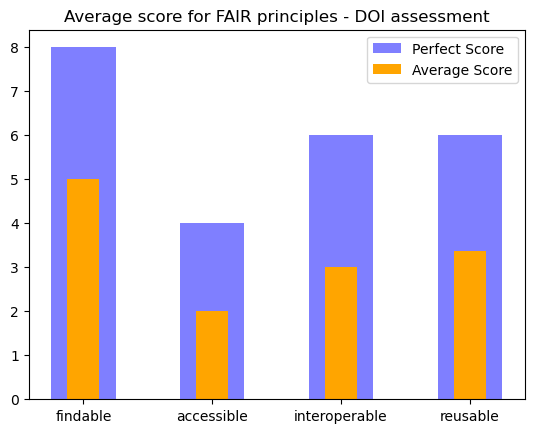

In [61]:
# max scores: F = 8, A = 4, I = 6, R = 6
principle_assessment_comporkg_df = assessment_comporkg_df
principle_assessment_comporkg_df['principle'] = [get_principle_from_metric(x) for x in principle_assessment_comporkg_df['metric']]

aggregate_funcs = {'score': 'sum', 'principle': 'first'}
principle_assessment_comporkg_df = principle_assessment_comporkg_df.groupby(['principle'], as_index=False).agg(aggregate_funcs)
principle_assessment_comporkg_df['avg_metric_score'] = principle_assessment_comporkg_df['score']/len(comparison_orkg_df)

principle_assessment_comporkg_df['principle'] = pd.Categorical(principle_assessment_comporkg_df['principle'], ['findable', 'accessible', 'interoperable', 'reusable'])
principle_assessment_comporkg_df = principle_assessment_comporkg_df.sort_values('principle')

#plotting
width = 0.5
perfect_scores = [8, 4, 6, 6]
actual_scores = principle_assessment_comporkg_df['avg_metric_score']
indices = np.arange(len(perfect_scores))

plt.bar(indices, perfect_scores, width=width, color='b', alpha=0.5, label='Perfect Score')
plt.bar([i for i in indices], actual_scores, width=0.5*width, color='orange', label='Average Score')
plt.xticks(indices, principle_assessment_comporkg_df['principle'] )
plt.title("Average score for FAIR principles - DOI assessment")
plt.legend()
plt.show()

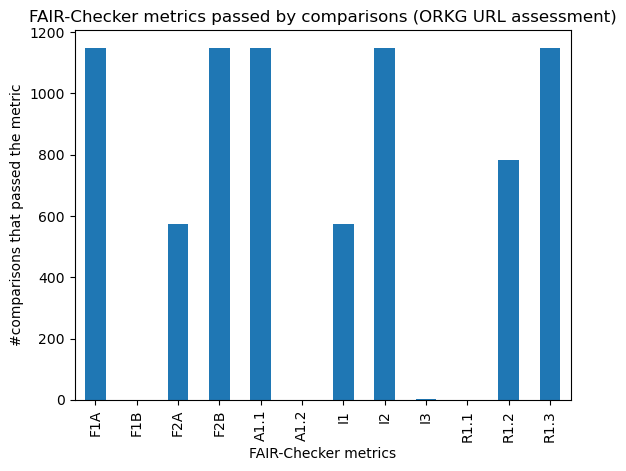

In [62]:
metric_assessment_comporkg_df = assessment_comporkg_df
aggregate_funcs = {"score": "sum"}
metric_assessment_comporkg_df = metric_assessment_comporkg_df.groupby("metric").agg(aggregate_funcs).reset_index()
metric_assessment_comporkg_df["score"] = metric_assessment_comporkg_df["score"] / 2

metric_assessment_comporkg_df['metric'] = pd.Categorical(metric_assessment_comporkg_df['metric'], ["F1A", "F1B", "F2A", "F2B", "A1.1", "A1.2", "I1", "I2", "I3", "R1.1", "R1.2", "R1.3"])
metric_assessment_comporkg_df = metric_assessment_comporkg_df.sort_values('metric')

metric_assessment_comporkg_df["score"].plot(kind="bar")
locs, labels = plt.xticks()
plt.xticks(locs, ["F1A", "F1B", "F2A", "F2B", "A1.1", "A1.2", "I1", "I2", "I3", "R1.1", "R1.2", "R1.3"])
plt.title("FAIR-Checker metrics passed by comparisons (ORKG URL assessment)")
plt.ylabel("#comparisons that passed the metric")
plt.xlabel("FAIR-Checker metrics")
plt.show()

## Comparison of Comparisons: DOI vs. ORKG resource URL

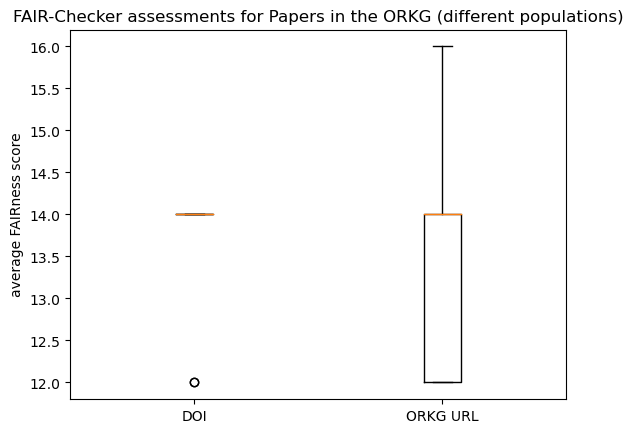

In [63]:
compdoi_df = total_score_compdoi_df
comporkg_df = total_score_comporkg_df

assessement_data = [compdoi_df["score"], comporkg_df["score"]]
plt.boxplot(assessement_data)
plt.title("FAIR-Checker assessments for Papers in the ORKG (different populations)")
locs, labels = plt.xticks()
plt.xticks(locs, ["DOI", "ORKG URL"])
plt.ylabel("average FAIRness score")
plt.show()

# Resources

## Resource assessment

In [66]:
%%script false --no-raise-error
resource_df = pd.read_csv("raw_data/resource_query_result_2023-04-05.csv")
resource_rsrc_df = resource_df[resource_df["type"].str.endswith("Resource")]
resource_others_df = resource_df[np.logical_not(resource_df["type"].str.endswith("Resource"))]
resource_df = pd.merge(resource_rsrc_df, resource_others_df, on="resources", how="outer", suffixes=("_rsrc", "_other"))
resource_df = resource_df[np.logical_not(resource_df["type_other"].str.endswith("Paper") | resource_df["type_other"].str.endswith("Comparison"))].reset_index(drop=True)
resource_df = resource_df.sample(n=3000, random_state=13)
resource_df

Couldn't find program: 'false'


In [67]:
%%script false --no-raise-error
# FAIR-Checker assessment for random sample ORKG resources that are not Papers or Comparisons with their ORKG resource URL
# Executing this will take a long time
# If you don't have the time, use the latest .csv file :)
count = 0
assessment_results = resource_df['resources'].map(lambda x: get_all_metrics(payload={'url': x}))
resource_df['FAIR_assessment'] = [aresult[0] for aresult in assessment_results]
resource_df['assessment_status_code'] = [aresult[1] for aresult in assessment_results]
resource_df.to_csv("./assessed_data/resource_df_FAIRCheckerv2_assessment_2023-04-05.csv")
resource_df

Couldn't find program: 'false'


## Resource evaluation + visualization

In [69]:
resource_sample_df = pd.read_csv("assessed_data/resource_df_FAIRCheckerv2_assessment_2023-04-05.csv", index_col=0)
print(resource_sample_df["assessment_status_code"].value_counts())
resource_sample_df = resource_sample_df[resource_sample_df["assessment_status_code"] == 200].reset_index(drop=True)
resource_sample_df["FAIR_assessment"] = resource_sample_df["FAIR_assessment"].map(lambda x: build_assessment_json(x))
resource_sample_df

200    2996
500       3
504       1
Name: assessment_status_code, dtype: int64


,resources,type_rsrc,type_other,FAIR_assessment,assessment_status_code
0,http://orkg.org/orkg/resource/R145348,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Contribution,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
1,http://orkg.org/orkg/resource/PWC_IMDB_REVIEWS...,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/BENCHMARK_DATASET,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
2,http://orkg.org/orkg/resource/R66133,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/C0,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
3,http://orkg.org/orkg/resource/R140362,http://orkg.org/orkg/class/Resource,NaN,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
4,http://orkg.org/orkg/resource/R172616,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/C23006,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
...,...,...,...,...,...
2991,http://orkg.org/orkg/resource/R161659,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Author,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
2992,http://orkg.org/orkg/resource/PWC_CBR_TS_MODEL,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Model,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
2993,http://orkg.org/orkg/resource/R147007,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Venue,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200
2994,http://orkg.org/orkg/resource/R155405,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Contribution,"[{'metric': 'F1A', 'score': '2'}, {'metric': '...",200


In [70]:
assessment_resource_df = pd.DataFrame()

resources = list(chain.from_iterable([[x]*12 for x in resource_sample_df['resources']]))
assessment_resource_df['resource'] = resources

types_rsrcs = list(chain.from_iterable([[x]*12 for x in resource_sample_df['type_rsrc']]))
assessment_resource_df["type_rsrc"] = types_rsrcs

types_others = list(chain.from_iterable([[x]*12 for x in resource_sample_df['type_other']]))
assessment_resource_df["type_other"] = types_others

metrics = list(chain.from_iterable([get_metrics_from_result(assessment_result=x) for x in resource_sample_df['FAIR_assessment']]))
assessment_resource_df['metric'] = metrics

scores = list(chain.from_iterable([get_scores_from_result(assessment_result=x) for x in resource_sample_df['FAIR_assessment']]))
assessment_resource_df['score'] = scores

assessment_resource_df

,resource,type_rsrc,type_other,metric,score
0,http://orkg.org/orkg/resource/R145348,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Contribution,F1A,2
1,http://orkg.org/orkg/resource/R145348,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Contribution,F1B,0
2,http://orkg.org/orkg/resource/R145348,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Contribution,F2A,1
3,http://orkg.org/orkg/resource/R145348,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Contribution,F2B,2
4,http://orkg.org/orkg/resource/R145348,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Contribution,A1.1,2
...,...,...,...,...,...
35947,http://orkg.org/orkg/resource/PWC_CONTEXT_AWAR...,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Model,I2,2
35948,http://orkg.org/orkg/resource/PWC_CONTEXT_AWAR...,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Model,I3,0
35949,http://orkg.org/orkg/resource/PWC_CONTEXT_AWAR...,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Model,R1.1,0
35950,http://orkg.org/orkg/resource/PWC_CONTEXT_AWAR...,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Model,R1.2,0


In [71]:
aggregate_funcs = {'score': 'sum', 'type_rsrc': 'first', 'type_other': 'first'}
total_score_resource_df = assessment_resource_df.groupby('resource', as_index=False).agg(aggregate_funcs)
total_score_resource_df

,resource,score,type_rsrc,type_other
0,http://orkg.org/orkg/resource/PWC_02_C23009,12,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/C23009
1,http://orkg.org/orkg/resource/PWC_0_0046_C23009,12,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/C23009
2,http://orkg.org/orkg/resource/PWC_0_022_C23009,12,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/C23009
3,http://orkg.org/orkg/resource/PWC_0_12_C23009,12,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/C23009
4,http://orkg.org/orkg/resource/PWC_0_90_C23009,12,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/C23009
...,...,...,...,...
2979,http://orkg.org/orkg/resource/R78384,12,http://orkg.org/orkg/class/Resource,None
2980,http://orkg.org/orkg/resource/R78446,12,http://orkg.org/orkg/class/Resource,None
2981,http://orkg.org/orkg/resource/R78453,12,http://orkg.org/orkg/class/Resource,None
2982,http://orkg.org/orkg/resource/R78457,16,http://orkg.org/orkg/class/Resource,http://orkg.org/orkg/class/Contribution


In [72]:
print(total_score_comporkg_df["score"].mean())
print(total_score_comporkg_df["score"].median())
# possible max = 16
print(total_score_comporkg_df["score"].max())
# possible min = 16
print(total_score_comporkg_df["score"].min())

13.368146214099216
14.0
16
12


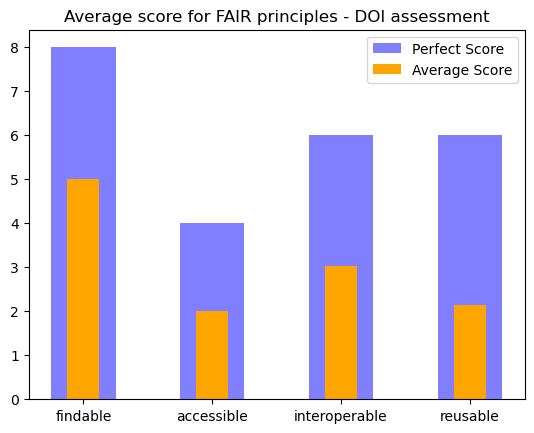

In [73]:
# max scores: F = 8, A = 4, I = 6, R = 6
principle_assessment_resource_df = assessment_resource_df
principle_assessment_resource_df['principle'] = [get_principle_from_metric(x) for x in principle_assessment_resource_df['metric']]

aggregate_funcs = {'score': 'sum', 'principle': 'first'}
principle_assessment_resource_df = principle_assessment_resource_df.groupby(['principle'], as_index=False).agg(aggregate_funcs)
principle_assessment_resource_df['avg_metric_score'] = principle_assessment_resource_df['score']/len(resource_sample_df)

principle_assessment_resource_df['principle'] = pd.Categorical(principle_assessment_resource_df['principle'], ['findable', 'accessible', 'interoperable', 'reusable'])
principle_assessment_resource_df = principle_assessment_resource_df.sort_values('principle')

#plotting
width = 0.5
perfect_scores = [8, 4, 6, 6]
actual_scores = principle_assessment_resource_df['avg_metric_score']
indices = np.arange(len(perfect_scores))

plt.bar(indices, perfect_scores, width=width, color='b', alpha=0.5, label='Perfect Score')
plt.bar([i for i in indices], actual_scores, width=0.5*width, color='orange', label='Average Score')
plt.xticks(indices, principle_assessment_resource_df['principle'] )
plt.title("Average score for FAIR principles - DOI assessment")
plt.legend()
plt.show()

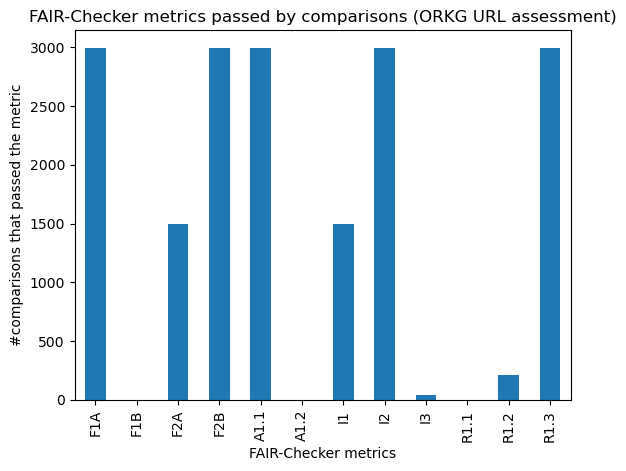

In [74]:
metric_assessment_resource_df = assessment_resource_df
aggregate_funcs = {"score": "sum"}
metric_assessment_resource_df = metric_assessment_resource_df.groupby("metric").agg(aggregate_funcs).reset_index()
metric_assessment_resource_df["score"] = metric_assessment_resource_df["score"] / 2

metric_assessment_resource_df['metric'] = pd.Categorical(metric_assessment_resource_df['metric'], ["F1A", "F1B", "F2A", "F2B", "A1.1", "A1.2", "I1", "I2", "I3", "R1.1", "R1.2", "R1.3"])
metric_assessment_resource_df = metric_assessment_resource_df.sort_values('metric')

metric_assessment_resource_df["score"].plot(kind="bar")
locs, labels = plt.xticks()
plt.xticks(locs, ["F1A", "F1B", "F2A", "F2B", "A1.1", "A1.2", "I1", "I2", "I3", "R1.1", "R1.2", "R1.3"])
plt.title("FAIR-Checker metrics passed by comparisons (ORKG URL assessment)")
plt.ylabel("#comparisons that passed the metric")
plt.xlabel("FAIR-Checker metrics")
plt.show()